# **Facial Emotion Detection**


---
## **Executive Summary**
---

- **Project Aim**: We developed a neural network model capable of identifying human emotions from facial expressions captured in images.
- **Data Utilization**: Our model training utilized a dataset comprised of grayscale images, each labeled with one of four distinct emotions: happy, neutral, sad, or surprise.
- **Model Exploration**: We engaged in extensive testing of various neural network architectures, including both custom-designed Convolutional Neural Networks (CNNs) and established transfer learning frameworks such as VGG16, ResNet50V2, and EfficientNetV2B0.
- **Performance Metrics**: The models were rigorously evaluated on multiple metrics including accuracy, precision, recall, and F1-score, aided by detailed confusion matrices for in-depth analysis.
- **Best Performer**: The standout model was a complex CNN featuring five convolutional blocks, which yielded the highest accuracy and performance metrics in tests.
- **Ethical Considerations**: For future deployments of the emotion detection model, we raise concerns about ethical considerations, focusing on ensuring privacy and fairness in real-world applications.
- **Real-World Application**: This model holds potential for significant impact in various sectors by enhancing user interface experiences and providing support tools for mental health professionals.
- **Future Work**: We propose further refinement of the model and the integration of additional safeguards to address ethical concerns more robustly.

---


---
## **Context**
---

Deep learning has been increasingly applied to tasks involving less structured data types like images, texts, audio, and video in recent years. These endeavors often aim to achieve human-like proficiency in processing such data, leveraging our innate ability to intelligently interact with complex, unstructured information. Within the realm of AI, a field known as Artificial Emotional Intelligence, or Emotion AI, focuses on creating technologies that can understand human emotions by analyzing body language, facial expressions, and voice tones, and respond to them effectively.

Recognizing facial expressions plays a vital role in human-computer interaction. Research indicates that facial expressions and other visual signals account for about 55% of how we convey emotions. Thus, developing a model capable of accurately recognizing facial emotions is a significant stride toward equipping machines with AI that exhibits emotionally intelligent behavior. Systems that can automatically recognize facial expressions have a broad range of potential applications, from understanding human behavior to diagnosing psychological conditions, and improving the interaction quality of virtual assistants in customer service settings.

---

## **Objective**

---

The goal of this project is to use Deep Learning and Artificial Intelligence techniques to create a computer vision model that can accurately detect facial emotions. The model should be able to perform multi-class classification on images of facial expressions, to classify the expressions according to the associated emotion.

---

## **Key Questions**

---

Throughout the project, we will be answering the following questions:

- How accurately can the deep learning model identify and classify different facial emotions (happy, sad, surprise, neutral) from images?
- How well does the model generalize to new, unseen images? Can it maintain high accuracy across the test, train, and validation datasets?
- How does the different model architectures compare in terms of accuracy to classify the different emotions?
- What are the potential applications of the developed model, and what implications might its deployment have in some industry fields?

---

## **Problem Formulation**

---

We are tasked with leveraging Deep Learning techniques to develop a computer vision model capable of accurately detecting and classifying facial emotions. The model needs to distinguish between four specific emotions (happy, sad, surprise, neutral) based on images of facial expressions. This task involves multi-class classification, requiring the model to predict the correct category of emotion for each image it processes.

---

## **About the dataset**

---

The data set consists of 3 folders, i.e., 'test', 'train', and 'validation'.
Each of these folders has four subfolders:

**‘happy’**: Images of people who have happy facial expressions.<br>
**‘sad’**: Images of people with sad or upset facial expressions.<br>
**‘surprise’**: Images of people who have shocked or surprised facial expressions.<br>
**‘neutral’**: Images of people showing no prominent emotion in their facial expression at all.<br>


## **Importing the Libraries**


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import zipfile
import random
from PIL import Image
from typing import List
from datetime import datetime

# For Data Visualization
import seaborn as sns

# For Model Building
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential, Model  # Sequential API for sequential model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input  # Importing different layers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization, LeakyReLU, ReLU
from tensorflow.keras import backend
from tensorflow.keras.optimizers import Adam, RMSprop  # Optimizers for optimizing the model
from tensorflow.keras.callbacks import EarlyStopping  # Regularization method to prevent the overfitting
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.applications.vgg16 import preprocess_input as preprocess_input_vgg16
from keras.applications import VGG16
from keras.applications.resnet_v2 import preprocess_input as preprocess_input_resnetv2
from keras.applications import ResNet50V2
from keras.applications.efficientnet_v2 import preprocess_input as preprocess_input_efficientnetv2
from keras.applications import EfficientNetV2B0

2024-04-11 00:04:06.669124: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-04-11 00:04:07.217980: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### **Let us load and unzip the data**


**Note:**

- You must download the dataset from the link provided on Olympus and upload the same on your Google drive before executing the code in the next cell.
- In case of any error, please make sure that the path of the file is correct as the path may be different for you.


In [2]:
# Storing the path of the data file from the Google drive
path = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/Facial_emotion_images.zip"

# The data is provided as a zip file so we need to extract the files from the zip file
with zipfile.ZipFile(path, "r") as zip_ref:
    zip_ref.extractall()

## **Preparing the Data**

The dataset has three folders, i.e., 'train', 'validation' and 'test'. Each of these folders has four sub-folders, namely 'happy', 'neutral', 'sad', and 'surprise'.

We will have the train, validation and test path stored in a variable named 'SUBDIRS', and a base directory 'DATADIR'.

The names of the sub-folders, which will be the classes for our classification task will be stored in an array called 'CATEGORIES'.


In [3]:
DATADIR = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/Facial_emotion_images"  # Base directory
SUBDIRS = ["train", "validation", "test"]  # Subdirectories
CATEGORIES = ["happy", "neutral", "sad", "surprise"]  # Emotion categories

We are going to check the size of one image, and then check if all the other images have the same size. In case, they are different, we'll resize the ones that are different.


In [4]:
def get_first_image_size(directory, sub_dirs, categories):
    """
    Returns the size of the first image found in the specified directories.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through (e.g., ['train', 'validation', 'test']).
    - categories (list of str): Categories (e.g., ['happy', 'neutral', 'sad', 'surprise']).

    Returns:
    - tuple: Size of the first image found (width, height).
    """
    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    return img.size  # Return the size of the first image found

In [5]:
# Get the size of the first image
expected_size = get_first_image_size(DATADIR, SUBDIRS, CATEGORIES)

print(f"Expected size of the first image: {expected_size}")

Expected size of the first image: (48, 48)


In [6]:
def check_image_sizes(directory, sub_dirs, categories, target_size):
    """
    Checks if all images in the specified directories match the target size.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through.
    - categories (list of str): Categories to search through.
    - target_size (tuple): The expected size of the images (width, height).

    Returns:
    - bool: True if all images match the target size, False otherwise.
    """
    all_match = True  # Flag to keep track of size match

    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    if img.size != target_size:
                        print(f"Image {img_path} has a different size: {img.size}, expected: {target_size}")
                        all_match = False
                        return all_match  # Return early upon first mismatch
    return all_match

In [7]:
# Check if all images match the expected size
all_match = check_image_sizes(DATADIR, SUBDIRS, CATEGORIES, expected_size)
if all_match:
    print("All images match the expected size.")
else:
    print("Not all images match the expected size.")

All images match the expected size.


## **Visualizing our Classes**

Let's look at our classes.

**Write down your observation for each class. What do you think can be a unique feature of each emotion, that separates it from the remaining classes?**


In [8]:
def visualize_emotion_images(directory: str, sub_dirs: List[str], emotion: str, image_count: int = 9) -> None:
    """
    Visualizes a specified number of images from a given emotion class directory across specified subdirectories.

    Parameters:
    - directory (str): The base directory where emotion class folders are located across subdirectories.
    - sub_dirs (List[str]): List of subdirectories ('train', 'validation', 'test') to search through.
    - emotion (str): The specific emotion class to visualize images from.
    - image_count (int): The number of images to display. Defaults to 9.

    Returns:
    - None: This function does not return any value but displays images inline.
    """
    image_paths: List[str] = []  # To store paths of images to be displayed

    # Iterate through the specified subdirectories to collect image paths
    for sub_dir in sub_dirs:
        emotion_dir: str = os.path.join(directory, sub_dir, emotion)
        if os.path.isdir(emotion_dir):
            for img_name in os.listdir(emotion_dir):
                img_path = os.path.join(emotion_dir, img_name)
                image_paths.append(img_path)

    # If there are no images found for the emotion, print a message and return
    if not image_paths:
        print(f"No images found for the specified emotion: {emotion}")
        return

    # Select a random subset of image paths
    selected_image_paths: np.ndarray = np.random.choice(image_paths, min(image_count, len(image_paths)), replace=False)

    # Setup for plotting
    fig = plt.figure(figsize=(4, 4))
    columns: int = 3
    rows: int = image_count // columns + (1 if image_count % columns else 0)

    # Iterate over the selected images and display them
    for i, image_path in enumerate(selected_image_paths, start=1):
        ax = fig.add_subplot(rows, columns, i)
        image = load_img(image_path, target_size=(48, 48))  # Ensure the image is resized to 48x48
        plt.imshow(image)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

### **Happy**


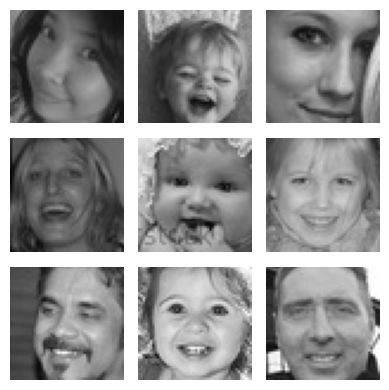

In [9]:
visualize_emotion_images(DATADIR, SUBDIRS, "happy", 9)

**Observations and Insights:**

- The images appear to be in grayscale and vary in terms of lighting, contrast, and clarity.

- The images display a range of happy expressions, from broad smiles showing teeth to subtle smiles without teeth. Also a diversity of subjects in terms of age, gender and also ethnicity.


### **Sad**


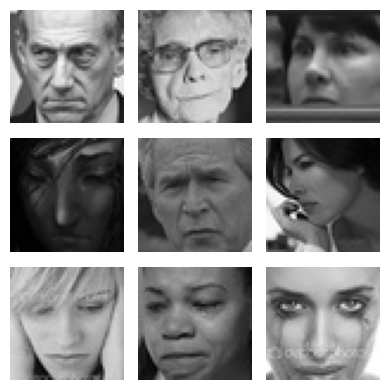

In [10]:
visualize_emotion_images(DATADIR, SUBDIRS, "sad", 9)

**Observations and Insights:**

- The images capture a wide spectrum of sadness, from subtle, somber expressions to more overt manifestations like crying.
- The dataset includes faces with different orientations and features. Some faces are directly looking at the camera, while others are tilted or partially turned away.


### **Neutral**


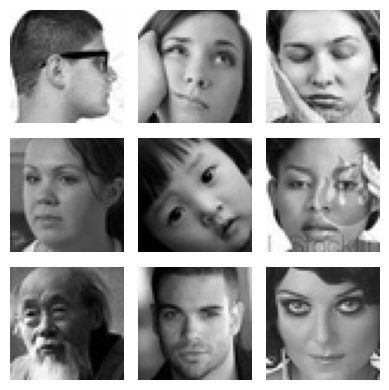

In [11]:
visualize_emotion_images(DATADIR, SUBDIRS, "neutral", 9)

**Observations and Insights:**

- The defining characteristic of these images is the absence of clear, expressive features that denote a specific emotion.
- Some faces may have subtle features that could be misconstrued as expressing a mild emotion.


### **Surprised**


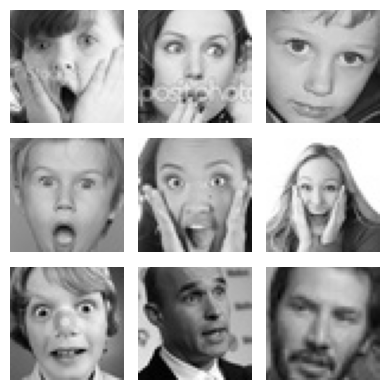

In [12]:
visualize_emotion_images(DATADIR, SUBDIRS, "surprise", 9)

**Observations and Insights:**

- The images showcase a range of intensities of surprise, from wide-eyed and open-mouthed expressions to more subdued, raised-eyebrow looks.
- The subjects vary in age, including both infants and adults.


## **Checking Distribution of Classes**


In [13]:
# Function to count images in each category
def count_images(data_dir, categories):
    counts = []
    for category in categories:
        path = os.path.join(data_dir, category)
        count = len([name for name in os.listdir(path) if os.path.isfile(os.path.join(path, name))])
        counts.append(count)
    return counts


SUBDIRS_DICT = {"train": "train", "validation": "validation", "test": "test"}

# Counting images in each dataset
train_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["train"]), CATEGORIES)
validation_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["validation"]), CATEGORIES)
test_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["test"]), CATEGORIES)


# Create DataFrames and format for easier reading
def create_df(counts, categories, dataset_name):
    df = pd.DataFrame({"Class": categories, "Count": counts})
    df["Percentage"] = (df["Count"] / df["Count"].sum()) * 100
    df.set_index("Class", inplace=True)

    # Formatting for easier reading
    df["Count"] = df["Count"].apply(lambda x: f"{x:,}")  # Adds commas to thousands
    df["Percentage"] = df["Percentage"].apply(lambda x: f"{x:.2f}")  # Rounds to two decimals

    print(f"{dataset_name} Data Distribution:")
    print(df)
    total_images = df["Count"].str.replace(",", "").astype(int).sum()
    print(f"Total images in {dataset_name}: {total_images:,}\n")  # Formats total count with commas


create_df(train_counts, CATEGORIES, "Training")
create_df(validation_counts, CATEGORIES, "Validation")
create_df(test_counts, CATEGORIES, "Testing")

Training Data Distribution:
          Count Percentage
Class                     
happy     3,976      26.32
neutral   3,978      26.33
sad       3,982      26.36
surprise  3,173      21.00
Total images in Training: 15,109

Validation Data Distribution:
          Count Percentage
Class                     
happy     1,825      36.67
neutral   1,216      24.43
sad       1,139      22.89
surprise    797      16.01
Total images in Validation: 4,977

Testing Data Distribution:
         Count Percentage
Class                    
happy       32      25.00
neutral     32      25.00
sad         32      25.00
surprise    32      25.00
Total images in Testing: 128



**Think About It:**

- Are the classes equally distributed? If not, do you think the imbalance is too high? Will it be a problem as we progress?
- Are there any Exploratory Data Analysis tasks that we can do here? Would they provide any meaningful insights?


**Observations and Insights:**

- Training Data: The training dataset shows a relatively balanced distribution among the classes of 'happy', 'neutral', and 'sad', each comprising approximately 26% of the dataset. However, 'surprise' is slightly underrepresented, making up 21% of the data. We'll see on the results if this is noticeable.
- Validation Data: In the validation dataset, there's a more pronounced imbalance. 'Happy' expressions dominate at 36.67%, followed by 'neutral' at 24.43%, 'sad' at 22.89%, and 'surprise' at 16.01%. This distribution deviates more significantly from an even split, indicating a potential bias towards 'happy' expressions.
- Testing Data: The testing dataset is perfectly balanced, with each class representing 25% of the data. This uniform distribution is ideal for evaluating the model's performance across all classes evenly.


## **Creating our Data Loaders**

In this section, we are creating data loaders that we will use as inputs to our Neural Network.

**You have two options for the color_mode. You can set it to color_mode = 'rgb' or color_mode = 'grayscale'. You will need to try out both and see for yourself which one gives better performance.**

Tested data: We have tested both 'grayscale' and 'rgb', and we got better results with 'grayscale', which makes sense as the images are in grayscale.


In [14]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"

# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
color_layers = 1
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    brightness_range=(0.5, 1.5),  # Randomly adjust brightness to simulate different lighting conditions
    shear_range=0.3,  # Shear transformations for perspective changes
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Creating train_dir, validation_dir, and test_dir directories using the structure of DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


Let's look at some examples of a batch of augmented training data.


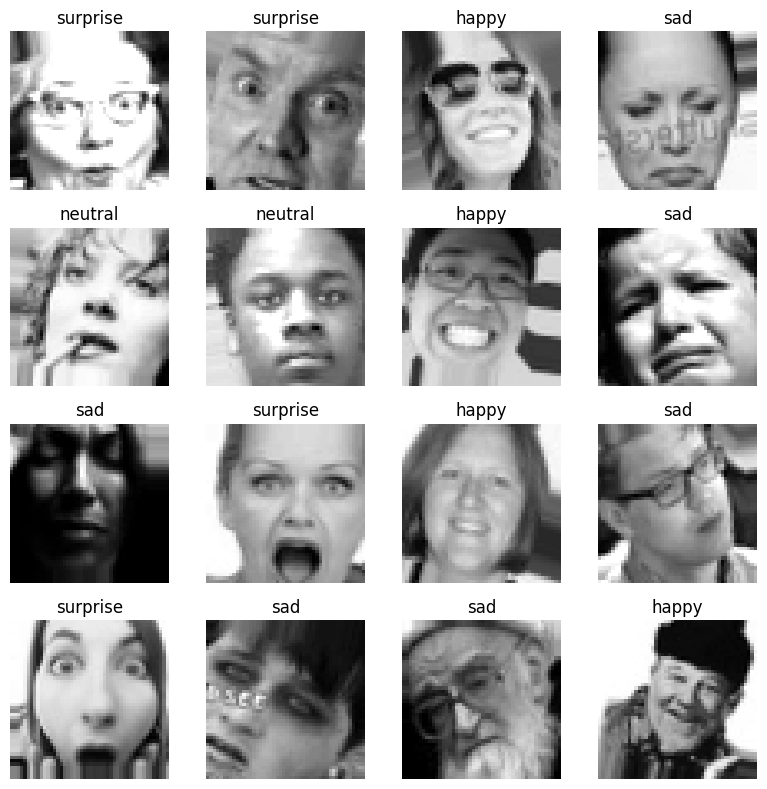

In [15]:
# Fetch a batch of images and labels
images, labels = next(train_generator)

# Assuming the labels are one-hot encoded, we need to convert them back to class indices
labels_indices = labels.argmax(axis=1)

# Mapping of indices to class names, based on the 'class_indices' attribute of the generator
index_to_class = {v: k for k, v in train_generator.class_indices.items()}

fig, axes = plt.subplots(4, 4, figsize=(8, 8))
for image, label_index, ax in zip(images, labels_indices, axes.flatten()):
    ax.imshow(image.squeeze(), cmap="gray")  # Squeeze and cmap for grayscale
    class_name = index_to_class[label_index]
    ax.set_title(class_name)
    ax.axis("off")

plt.tight_layout()
plt.show()

## **Model Building**


**Think About It:**

- Are Convolutional Neural Networks the right approach? Should we have gone with Artificial Neural Networks instead?

Answer: Convolutional Neural Networks (CNNs) are the right approach for facial emotion classification on images, as they excel at capturing spatial hierarchies and patterns in visual data, which is critical for this type of task, unlike traditional Artificial Neural Networks (ANNs) which do not inherently process spatial information.

- What are the advantages of CNNs over ANNs and are they applicable here?

  Answer: CNNs have the advantage of being able to automatically and efficiently learn spatial hierarchies of features from images (thanks to their convolutional layers and shared weights), making them particularly suitable for image-based tasks like facial emotion classification, where recognizing spatial relationships and patterns within the images is key to accurate classification.


### **Creating the Base Neural Network**


### **Model 1 Architecture:**

- This is the first CNN Model, designed with a sequential architecture comprising three convolutional blocks, each followed by max-pooling and dropout layers for feature extraction and regularization.
- The **first convolutional block** starts with a **Conv2D layer having 64 filters** and a **3x3 kernel size**, utilizing **'relu' activation** and **'same' padding** to maintain the input size, paired with a **MaxPooling2D layer** with a **2x2 pool size** and **'same' padding**, and a **Dropout layer with a rate of 0.2** to prevent overfitting.
- The **second convolutional block** includes a **Conv2D layer with 32 filters**, a **3x3 kernel size**, **'relu' activation**, and **'same' padding**, followed by a **MaxPooling2D layer** with a **2x2 pool size**, **'same' padding**, and another **Dropout layer with a rate of 0.2**.
- Similarly, the **third convolutional block** mirrors the second, with a **Conv2D layer** also having **32 filters**, a **3x3 kernel size**, **'relu' activation**, and **'same' padding**, a subsequent **MaxPooling2D layer** with a **2x2 pool size**, **'same' padding**, and a **Dropout layer with a rate of 0.2**.
- After extracting features through convolutional blocks, the model **flattens** the output to feed into fully connected layers for classification.
- The **dense layers** include a **first Dense layer with 512 neurons** and **'relu' activation**, followed by a **second Dense layer with 64 neurons** and **'relu' activation**, culminating in a **final Dense layer with 4 neurons** corresponding to the number of classes, using **'softmax' activation** for multi-class classification.
- The model employs the **Adam optimizer** with a **learning rate of 0.001** to adjust weights and minimize the loss function during training.


In [16]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [17]:
# Intializing a sequential model
model_1 = Sequential()

model_1.add(Input(shape=(img_width, img_height, color_layers)))

model_1.add(Conv2D(64, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))
model_1.add(Dropout(0.2))

# Adding second conv layer with 32 filters
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))
model_1.add(Dropout(0.2))

# Add third conv layer with 32 filters and kernel size 3x3, padding 'same' followed by a Maxpooling2D layer
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))
model_1.add(Dropout(0.2))

# Flattening the output of the conv layer after max pooling to make it ready for creating dense connections
model_1.add(Flatten())

# Adding fully connected dense layers
model_1.add(Dense(512, activation="relu"))
model_1.add(Dense(64, activation="relu"))

# Adding output layer
model_1.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
opt = Adam(learning_rate=0.001)

2024-04-11 00:04:11.726218: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-11 00:04:11.747212: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-11 00:04:11.747375: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

### **Compiling and Training the Model**


In [18]:
# Compiling the model
model_1.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])

# Generating the summary of the model
model_1.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 48, 48, 64)     │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 24, 24, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 12, 12, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       590,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 651,780 (2.49 MB)

 Trainable params: 651,780 (2.49 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
results_path = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results"

In [20]:
class DelayedEarlyStopping(EarlyStopping):
    """Stop training when a monitored metric has stopped improving after a certain number of epochs.

    Arguments:
        monitor: Quantity to be monitored.
        min_delta: Minimum change in the monitored quantity to qualify as an improvement,
                   i.e., an absolute change of less than min_delta will count as no improvement.
        patience: Number of epochs with no improvement after which training will be stopped.
        verbose: Verbosity mode.
        mode: One of `{'auto', 'min', 'max'}`. In `min` mode, training will stop when the
              quantity monitored has stopped decreasing; in `max` mode it will stop when the
              quantity monitored has stopped increasing; in `auto` mode, the direction is
              automatically inferred from the name of the monitored quantity.
        baseline: Baseline value for the monitored quantity. Training will stop if the model
                  doesn't show improvement over the baseline.
        restore_best_weights: Whether to restore model weights from the epoch with the best value
                              of the monitored quantity.
        start_epoch: The epoch on which to start considering early stopping. Before this epoch,
                     early stopping will not be considered. This ensures that early stopping
                     checks only after a certain number of epochs.
    """

    def __init__(
        self,
        monitor="val_loss",
        min_delta=0,
        patience=0,
        verbose=0,
        mode="auto",
        baseline=None,
        restore_best_weights=False,
        start_epoch=30,
    ):
        super().__init__(
            monitor=monitor,
            min_delta=min_delta,
            patience=patience,
            verbose=verbose,
            mode=mode,
            baseline=baseline,
            restore_best_weights=restore_best_weights,
        )
        self.start_epoch = start_epoch

    def on_epoch_end(self, epoch, logs=None):
        # Override the original `on_epoch_end` method to include `start_epoch` logic.

        # If the current epoch is less than the start epoch, skip the early stopping check
        if epoch < self.start_epoch:
            return

        # Call the parent class method to perform the regular early stopping checks after the start epoch
        super().on_epoch_end(epoch, logs)

In [21]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

# Define the saving the best model callback
mc = ModelCheckpoint(
    f"{results_path}/best_model_1_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Fitting the model with 45 epochs and using validation set
history_1 = model_1.fit(
    train_generator,
    epochs=45,
    validation_data=validation_generator,
    callbacks=[reduce_lr, mc, delayed_early_stopping],
)

Epoch 1/45


/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1712793853.651159 1474977 service.cc:145] XLA service 0x7f226c00e760 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1712793853.651180 1474977 service.cc:153]   StreamExecutor device (0): NVIDIA GeForce RTX 3070, Compute Capability 8.6
2024-04-11 00:04:13.681751: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


2024-04-11 00:04:13.811989: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8907


I0000 00:00:1712793855.129443 1475073 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1953', 4 bytes spill stores, 4 bytes spill loads




  1/473 ━━━━━━━━━━━━━━━━━━━━ 37:55 5s/step - accuracy: 0.0938 - loss: 1.3994


  6/473 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.2084 - loss: 1.3991 


  9/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2167 - loss: 1.4005


 13/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2237 - loss: 1.3999

I0000 00:00:1712793857.604780 1474977 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.



 17/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2293 - loss: 1.3987


 22/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2331 - loss: 1.3974


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2349 - loss: 1.3966


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2373 - loss: 1.3959


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2392 - loss: 1.3953


 37/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.2402 - loss: 1.3949


 40/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.2410 - loss: 1.3946


 45/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.2416 - loss: 1.3941


 50/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.2426 - loss: 1.3936


 55/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2437 - loss: 1.3931


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2446 - loss: 1.3927


 65/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2454 - loss: 1.3922


 70/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2463 - loss: 1.3919


 75/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2473 - loss: 1.3914


 80/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2484 - loss: 1.3910


 84/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2492 - loss: 1.3907


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2502 - loss: 1.3903


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2510 - loss: 1.3900


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2518 - loss: 1.3896


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2524 - loss: 1.3894


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2529 - loss: 1.3891


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2533 - loss: 1.3889


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2538 - loss: 1.3887


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2542 - loss: 1.3885


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2547 - loss: 1.3883


134/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2551 - loss: 1.3881


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.2555 - loss: 1.3879


144/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.2559 - loss: 1.3877


149/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.2563 - loss: 1.3876


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2567 - loss: 1.3874


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2571 - loss: 1.3872


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2575 - loss: 1.3871


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2579 - loss: 1.3869


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2583 - loss: 1.3867


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2587 - loss: 1.3866


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2591 - loss: 1.3864


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2594 - loss: 1.3863


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2597 - loss: 1.3861


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2599 - loss: 1.3860


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2603 - loss: 1.3859


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2605 - loss: 1.3857


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2608 - loss: 1.3856


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2611 - loss: 1.3854


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2614 - loss: 1.3853


225/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2617 - loss: 1.3852


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2620 - loss: 1.3850


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2622 - loss: 1.3849


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2624 - loss: 1.3847


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2626 - loss: 1.3846


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2628 - loss: 1.3845


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2630 - loss: 1.3844


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2632 - loss: 1.3842


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2634 - loss: 1.3841


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2636 - loss: 1.3840


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2639 - loss: 1.3839


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2641 - loss: 1.3837


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2643 - loss: 1.3836


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2645 - loss: 1.3835


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2648 - loss: 1.3833


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2650 - loss: 1.3832


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2652 - loss: 1.3831


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2654 - loss: 1.3830


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2656 - loss: 1.3829


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2658 - loss: 1.3827


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2660 - loss: 1.3826


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2661 - loss: 1.3825


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2663 - loss: 1.3824


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2665 - loss: 1.3823


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2667 - loss: 1.3822


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2669 - loss: 1.3821


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2670 - loss: 1.3820


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2672 - loss: 1.3819


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2673 - loss: 1.3818


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2675 - loss: 1.3817


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2677 - loss: 1.3815


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2679 - loss: 1.3814


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2681 - loss: 1.3813


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2683 - loss: 1.3812


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2685 - loss: 1.3811


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2687 - loss: 1.3810


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2689 - loss: 1.3809


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2691 - loss: 1.3808


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2693 - loss: 1.3807


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2695 - loss: 1.3806


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2696 - loss: 1.3805


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2698 - loss: 1.3803


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2700 - loss: 1.3802


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2703 - loss: 1.3800


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2705 - loss: 1.3799


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2707 - loss: 1.3798


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2710 - loss: 1.3796


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2712 - loss: 1.3795


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2714 - loss: 1.3793


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.2717 - loss: 1.3792


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.2719 - loss: 1.3790


Epoch 1: val_accuracy improved from -inf to 0.37472, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 16s 24ms/step - accuracy: 0.2724 - loss: 1.3787 - val_accuracy: 0.3747 - val_loss: 1.2493 - learning_rate: 0.0010


Epoch 2/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.5000 - loss: 1.1636


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4151 - loss: 1.2334  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3976 - loss: 1.2453


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3915 - loss: 1.2480


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3901 - loss: 1.2493


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3883 - loss: 1.2536


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.3868 - loss: 1.2575


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.3847 - loss: 1.2614


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3824 - loss: 1.2650


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3811 - loss: 1.2670


 48/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3796 - loss: 1.2691


 53/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3783 - loss: 1.2713


 58/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3769 - loss: 1.2735


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3756 - loss: 1.2752


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3746 - loss: 1.2763


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3737 - loss: 1.2774


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3729 - loss: 1.2781


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3722 - loss: 1.2787


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3716 - loss: 1.2791


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3712 - loss: 1.2794


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3711 - loss: 1.2797


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3711 - loss: 1.2798


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3712 - loss: 1.2800


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3712 - loss: 1.2801


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3712 - loss: 1.2804


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3711 - loss: 1.2807


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3711 - loss: 1.2809


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3709 - loss: 1.2812


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3709 - loss: 1.2813


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3709 - loss: 1.2816


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3708 - loss: 1.2818


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3709 - loss: 1.2819


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3709 - loss: 1.2821


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3709 - loss: 1.2822


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3710 - loss: 1.2822


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3711 - loss: 1.2823


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3712 - loss: 1.2823


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3713 - loss: 1.2823


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3714 - loss: 1.2823


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3714 - loss: 1.2822


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3715 - loss: 1.2822


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3716 - loss: 1.2822


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3716 - loss: 1.2822


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3717 - loss: 1.2821


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.3718 - loss: 1.2821


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3719 - loss: 1.2820


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3719 - loss: 1.2820


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3720 - loss: 1.2819


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3721 - loss: 1.2818


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3722 - loss: 1.2817


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3722 - loss: 1.2817


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3723 - loss: 1.2816


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3724 - loss: 1.2815


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3725 - loss: 1.2815


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3726 - loss: 1.2814


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3727 - loss: 1.2813


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3728 - loss: 1.2812


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3728 - loss: 1.2811


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3729 - loss: 1.2811


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3729 - loss: 1.2810


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3730 - loss: 1.2810


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.3730 - loss: 1.2810


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3731 - loss: 1.2809


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3731 - loss: 1.2808


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3732 - loss: 1.2808


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3733 - loss: 1.2807


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3733 - loss: 1.2806


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3734 - loss: 1.2805


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3735 - loss: 1.2804


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3736 - loss: 1.2803


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3737 - loss: 1.2802


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3738 - loss: 1.2801


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3739 - loss: 1.2800


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3740 - loss: 1.2798


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3742 - loss: 1.2797


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3743 - loss: 1.2796


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3744 - loss: 1.2794


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3746 - loss: 1.2793


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.3747 - loss: 1.2791


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3748 - loss: 1.2790


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3749 - loss: 1.2789


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3751 - loss: 1.2787


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3752 - loss: 1.2786


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3753 - loss: 1.2784


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3755 - loss: 1.2783


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3756 - loss: 1.2781


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3757 - loss: 1.2780


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3759 - loss: 1.2778


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3760 - loss: 1.2776


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3762 - loss: 1.2775


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3763 - loss: 1.2773


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3765 - loss: 1.2771


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3766 - loss: 1.2770


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3768 - loss: 1.2768


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.3769 - loss: 1.2766


Epoch 2: val_accuracy improved from 0.37472 to 0.47720, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.3772 - loss: 1.2763 - val_accuracy: 0.4772 - val_loss: 1.1544 - learning_rate: 0.0010


Epoch 3/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.3750 - loss: 1.2430


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.3927 - loss: 1.2220  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4004 - loss: 1.2231


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4089 - loss: 1.2233


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4121 - loss: 1.2232


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4137 - loss: 1.2227


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4136 - loss: 1.2236


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4132 - loss: 1.2245


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4123 - loss: 1.2255


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4116 - loss: 1.2263


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4110 - loss: 1.2267


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4102 - loss: 1.2273


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4098 - loss: 1.2276


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4097 - loss: 1.2277


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4102 - loss: 1.2274


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4107 - loss: 1.2272


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4112 - loss: 1.2270


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4117 - loss: 1.2267


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4122 - loss: 1.2262


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4127 - loss: 1.2258


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4132 - loss: 1.2253


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4137 - loss: 1.2249


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4141 - loss: 1.2246


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4145 - loss: 1.2244


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4148 - loss: 1.2242


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4152 - loss: 1.2240


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4156 - loss: 1.2237


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4160 - loss: 1.2235


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4163 - loss: 1.2234


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4166 - loss: 1.2232


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4169 - loss: 1.2230


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4173 - loss: 1.2227


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4177 - loss: 1.2225


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4180 - loss: 1.2223


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4182 - loss: 1.2222


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4184 - loss: 1.2220


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4187 - loss: 1.2218


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4189 - loss: 1.2216


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4191 - loss: 1.2215


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4192 - loss: 1.2213


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4194 - loss: 1.2211


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4195 - loss: 1.2210


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4197 - loss: 1.2208


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4199 - loss: 1.2207


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4201 - loss: 1.2205


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4203 - loss: 1.2203


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4205 - loss: 1.2201


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4207 - loss: 1.2199


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4210 - loss: 1.2197


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4213 - loss: 1.2194


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4215 - loss: 1.2192


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4217 - loss: 1.2190


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4219 - loss: 1.2189


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4221 - loss: 1.2187


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4223 - loss: 1.2185


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4225 - loss: 1.2184


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4227 - loss: 1.2182


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4229 - loss: 1.2180


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4231 - loss: 1.2178


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4233 - loss: 1.2176


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4235 - loss: 1.2174


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4237 - loss: 1.2172


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4239 - loss: 1.2170


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4241 - loss: 1.2169


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4242 - loss: 1.2167


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4244 - loss: 1.2165


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4245 - loss: 1.2163


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4247 - loss: 1.2161


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4248 - loss: 1.2159


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4250 - loss: 1.2157


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4252 - loss: 1.2155


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4253 - loss: 1.2153


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4255 - loss: 1.2151


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4256 - loss: 1.2149


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4258 - loss: 1.2148


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4259 - loss: 1.2146


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4260 - loss: 1.2144


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4262 - loss: 1.2143


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4263 - loss: 1.2141


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4264 - loss: 1.2139


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4265 - loss: 1.2137


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4267 - loss: 1.2135


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4268 - loss: 1.2134


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4269 - loss: 1.2132


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4270 - loss: 1.2131


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4271 - loss: 1.2130


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4272 - loss: 1.2128


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4273 - loss: 1.2127


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4274 - loss: 1.2125


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4276 - loss: 1.2123


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4277 - loss: 1.2122


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4279 - loss: 1.2120


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4280 - loss: 1.2118


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4281 - loss: 1.2116


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4283 - loss: 1.2114


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4284 - loss: 1.2112


Epoch 3: val_accuracy improved from 0.47720 to 0.55053, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.4287 - loss: 1.2109 - val_accuracy: 0.5505 - val_loss: 1.0695 - learning_rate: 0.0010


Epoch 4/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - accuracy: 0.4375 - loss: 1.1515


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4708 - loss: 1.1057  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4747 - loss: 1.0991


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4724 - loss: 1.1018


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4678 - loss: 1.1108


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4662 - loss: 1.1153


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4652 - loss: 1.1177


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4649 - loss: 1.1198


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4656 - loss: 1.1212


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4657 - loss: 1.1232


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4656 - loss: 1.1250


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4659 - loss: 1.1265


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4661 - loss: 1.1281


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4661 - loss: 1.1298


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4665 - loss: 1.1311


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4670 - loss: 1.1324


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4675 - loss: 1.1337


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4678 - loss: 1.1349


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4682 - loss: 1.1358


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4686 - loss: 1.1364


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4690 - loss: 1.1369


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4693 - loss: 1.1375


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4696 - loss: 1.1381


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4699 - loss: 1.1385


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4703 - loss: 1.1388


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4706 - loss: 1.1392


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4708 - loss: 1.1396


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4710 - loss: 1.1401


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4712 - loss: 1.1406


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4714 - loss: 1.1410


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4715 - loss: 1.1413


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4716 - loss: 1.1416


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4717 - loss: 1.1419


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4719 - loss: 1.1420


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4720 - loss: 1.1422


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4721 - loss: 1.1423


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4722 - loss: 1.1424


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4722 - loss: 1.1426


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4723 - loss: 1.1427


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4723 - loss: 1.1429


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4723 - loss: 1.1431


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4724 - loss: 1.1433


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4724 - loss: 1.1434


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4725 - loss: 1.1436


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4725 - loss: 1.1438


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4726 - loss: 1.1439


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4727 - loss: 1.1440


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4728 - loss: 1.1441


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4730 - loss: 1.1442


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4731 - loss: 1.1442


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4732 - loss: 1.1442


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4733 - loss: 1.1443


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4735 - loss: 1.1443


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4736 - loss: 1.1443


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4736 - loss: 1.1444


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4737 - loss: 1.1444


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4738 - loss: 1.1444


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4739 - loss: 1.1444


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4740 - loss: 1.1444


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4741 - loss: 1.1444


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4742 - loss: 1.1444


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4744 - loss: 1.1443


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4745 - loss: 1.1442


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4746 - loss: 1.1442


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4748 - loss: 1.1441


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4749 - loss: 1.1440


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4750 - loss: 1.1439


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4752 - loss: 1.1438


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4753 - loss: 1.1437


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4755 - loss: 1.1436


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4756 - loss: 1.1435


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4758 - loss: 1.1433


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4759 - loss: 1.1432


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4760 - loss: 1.1431


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4762 - loss: 1.1429


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4763 - loss: 1.1428


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4764 - loss: 1.1427


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4765 - loss: 1.1426


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4766 - loss: 1.1425


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4767 - loss: 1.1424


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4768 - loss: 1.1424


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4769 - loss: 1.1423


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4770 - loss: 1.1422


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4771 - loss: 1.1421


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4772 - loss: 1.1421


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4773 - loss: 1.1420


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4774 - loss: 1.1419


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4775 - loss: 1.1418


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4776 - loss: 1.1417


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4777 - loss: 1.1416


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4778 - loss: 1.1415


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4779 - loss: 1.1414


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4780 - loss: 1.1413


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4781 - loss: 1.1412


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4782 - loss: 1.1411


Epoch 4: val_accuracy improved from 0.55053 to 0.58549, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.4784 - loss: 1.1409 - val_accuracy: 0.5855 - val_loss: 0.9747 - learning_rate: 0.0010


Epoch 5/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.5000 - loss: 1.1425


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4814 - loss: 1.1200  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4785 - loss: 1.1169


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4812 - loss: 1.1131


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4838 - loss: 1.1088


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4873 - loss: 1.1046


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4910 - loss: 1.1007


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4929 - loss: 1.0993


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4939 - loss: 1.0993


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4942 - loss: 1.0993


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4946 - loss: 1.0993


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4948 - loss: 1.0989


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4951 - loss: 1.0985


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4953 - loss: 1.0981


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4956 - loss: 1.0975


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4959 - loss: 1.0970


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4964 - loss: 1.0964


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4969 - loss: 1.0959


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4973 - loss: 1.0957


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4975 - loss: 1.0956


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4978 - loss: 1.0955


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4981 - loss: 1.0954


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4984 - loss: 1.0951


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4988 - loss: 1.0947


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4992 - loss: 1.0945


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4994 - loss: 1.0943


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4996 - loss: 1.0942


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4997 - loss: 1.0941


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4998 - loss: 1.0940


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4999 - loss: 1.0939


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5000 - loss: 1.0937


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5002 - loss: 1.0937


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5002 - loss: 1.0936


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5003 - loss: 1.0937


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5003 - loss: 1.0937


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5003 - loss: 1.0938


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5003 - loss: 1.0939


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5003 - loss: 1.0940


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5003 - loss: 1.0940


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5003 - loss: 1.0940


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5004 - loss: 1.0940


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5004 - loss: 1.0940


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5005 - loss: 1.0940


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5005 - loss: 1.0941


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5005 - loss: 1.0941


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5006 - loss: 1.0941


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5006 - loss: 1.0942


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5007 - loss: 1.0941


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5008 - loss: 1.0941


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5008 - loss: 1.0941


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5009 - loss: 1.0941


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5010 - loss: 1.0940


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5010 - loss: 1.0940


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5012 - loss: 1.0939


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5013 - loss: 1.0938


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5014 - loss: 1.0938


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5014 - loss: 1.0937


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5015 - loss: 1.0937


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5015 - loss: 1.0937


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5016 - loss: 1.0937


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5016 - loss: 1.0937


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5016 - loss: 1.0937


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5017 - loss: 1.0937


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5017 - loss: 1.0937


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5018 - loss: 1.0937


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5019 - loss: 1.0936


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5019 - loss: 1.0936


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5020 - loss: 1.0936


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5020 - loss: 1.0936


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5021 - loss: 1.0935


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5021 - loss: 1.0935


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5022 - loss: 1.0935


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5022 - loss: 1.0935


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5022 - loss: 1.0935


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5023 - loss: 1.0935


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5023 - loss: 1.0935


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5023 - loss: 1.0935


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5023 - loss: 1.0935


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5024 - loss: 1.0935


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5024 - loss: 1.0935


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5024 - loss: 1.0935


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5024 - loss: 1.0935


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5024 - loss: 1.0935


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5024 - loss: 1.0934


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5024 - loss: 1.0934


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5025 - loss: 1.0934


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5025 - loss: 1.0934


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5025 - loss: 1.0934


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5025 - loss: 1.0934


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5026 - loss: 1.0933


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5026 - loss: 1.0933


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5026 - loss: 1.0933


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5026 - loss: 1.0932


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5027 - loss: 1.0932


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5027 - loss: 1.0932


Epoch 5: val_accuracy improved from 0.58549 to 0.58891, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5028 - loss: 1.0931 - val_accuracy: 0.5889 - val_loss: 0.9510 - learning_rate: 0.0010


Epoch 6/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 56s 119ms/step - accuracy: 0.5000 - loss: 0.9750


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5552 - loss: 0.9879  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5576 - loss: 1.0009


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5609 - loss: 1.0022


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5633 - loss: 1.0002


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5642 - loss: 0.9981


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5625 - loss: 1.0010


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5601 - loss: 1.0045


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5571 - loss: 1.0081


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5543 - loss: 1.0114


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5520 - loss: 1.0142


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5503 - loss: 1.0160


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5491 - loss: 1.0174


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5479 - loss: 1.0189


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5468 - loss: 1.0207


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5459 - loss: 1.0223


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5453 - loss: 1.0234


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5447 - loss: 1.0244


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5439 - loss: 1.0255


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5429 - loss: 1.0266


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5422 - loss: 1.0275


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5415 - loss: 1.0283


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5408 - loss: 1.0292


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5401 - loss: 1.0299


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5395 - loss: 1.0307


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5389 - loss: 1.0315


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5384 - loss: 1.0323


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5378 - loss: 1.0330


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5372 - loss: 1.0338


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5366 - loss: 1.0347


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5361 - loss: 1.0355


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5355 - loss: 1.0364


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5349 - loss: 1.0372


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5344 - loss: 1.0380


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5339 - loss: 1.0387


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5334 - loss: 1.0395


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5329 - loss: 1.0402


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5325 - loss: 1.0408


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5321 - loss: 1.0414


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5317 - loss: 1.0420


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5314 - loss: 1.0426


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5311 - loss: 1.0431


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5308 - loss: 1.0435


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5305 - loss: 1.0439


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5303 - loss: 1.0443


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5301 - loss: 1.0446


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5299 - loss: 1.0450


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5297 - loss: 1.0454


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5295 - loss: 1.0457


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5293 - loss: 1.0460


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5292 - loss: 1.0463


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5291 - loss: 1.0466


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5290 - loss: 1.0468


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5289 - loss: 1.0470


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5288 - loss: 1.0472


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5287 - loss: 1.0474


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5287 - loss: 1.0475


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5286 - loss: 1.0477


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5285 - loss: 1.0479


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5285 - loss: 1.0480


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5284 - loss: 1.0482


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5283 - loss: 1.0484


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5282 - loss: 1.0486


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5281 - loss: 1.0488


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5281 - loss: 1.0490


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5280 - loss: 1.0492


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5280 - loss: 1.0494


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5279 - loss: 1.0496


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5279 - loss: 1.0498


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5278 - loss: 1.0499


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5277 - loss: 1.0501


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5276 - loss: 1.0503


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5276 - loss: 1.0505


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5275 - loss: 1.0507


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5275 - loss: 1.0508


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5274 - loss: 1.0509


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5274 - loss: 1.0511


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5274 - loss: 1.0512


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5273 - loss: 1.0514


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5273 - loss: 1.0515


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5272 - loss: 1.0516


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5272 - loss: 1.0518


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5272 - loss: 1.0519


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5271 - loss: 1.0520


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5271 - loss: 1.0521


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5271 - loss: 1.0523


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5270 - loss: 1.0524


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5270 - loss: 1.0525


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5270 - loss: 1.0526


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5269 - loss: 1.0527


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5269 - loss: 1.0528


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5268 - loss: 1.0529


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5268 - loss: 1.0530


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5268 - loss: 1.0531


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5267 - loss: 1.0533


Epoch 6: val_accuracy improved from 0.58891 to 0.60137, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5267 - loss: 1.0534 - val_accuracy: 0.6014 - val_loss: 0.9226 - learning_rate: 0.0010


Epoch 7/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.7188 - loss: 0.7606


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5956 - loss: 0.9227  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5807 - loss: 0.9580


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5765 - loss: 0.9704


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5721 - loss: 0.9776


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5704 - loss: 0.9796


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5682 - loss: 0.9832


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5656 - loss: 0.9880


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5635 - loss: 0.9922


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5616 - loss: 0.9952


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5601 - loss: 0.9976


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5588 - loss: 0.9996


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5576 - loss: 1.0017


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5568 - loss: 1.0033


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5559 - loss: 1.0050


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5550 - loss: 1.0067


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5543 - loss: 1.0079


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5535 - loss: 1.0096


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5527 - loss: 1.0111


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5521 - loss: 1.0124


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5514 - loss: 1.0136


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5508 - loss: 1.0147


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5505 - loss: 1.0154


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5500 - loss: 1.0162


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5495 - loss: 1.0170


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5490 - loss: 1.0180


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5485 - loss: 1.0190


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5479 - loss: 1.0201


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5474 - loss: 1.0211


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5469 - loss: 1.0220


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5465 - loss: 1.0228


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5461 - loss: 1.0236


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5459 - loss: 1.0243


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5456 - loss: 1.0250


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5453 - loss: 1.0257


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5450 - loss: 1.0264


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5447 - loss: 1.0271


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5445 - loss: 1.0277


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5442 - loss: 1.0283


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5440 - loss: 1.0289


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5438 - loss: 1.0295


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5436 - loss: 1.0300


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5434 - loss: 1.0305


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5432 - loss: 1.0311


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5430 - loss: 1.0316


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5429 - loss: 1.0319


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5428 - loss: 1.0323


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5427 - loss: 1.0326


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5426 - loss: 1.0329


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5425 - loss: 1.0332


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5425 - loss: 1.0335


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5424 - loss: 1.0337


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5423 - loss: 1.0340


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5423 - loss: 1.0342


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5422 - loss: 1.0344


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5421 - loss: 1.0347


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5420 - loss: 1.0349


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5420 - loss: 1.0351


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5419 - loss: 1.0353


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5419 - loss: 1.0355


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5419 - loss: 1.0356


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0358


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0359


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0360


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5419 - loss: 1.0361


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5419 - loss: 1.0362


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5419 - loss: 1.0363


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0365


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0366


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0367


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0368


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0369


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0370


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0371


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0372


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5418 - loss: 1.0373


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5417 - loss: 1.0374


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5417 - loss: 1.0375


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5417 - loss: 1.0375


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5417 - loss: 1.0376


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5417 - loss: 1.0376


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5417 - loss: 1.0377


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5417 - loss: 1.0378


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5416 - loss: 1.0378


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5416 - loss: 1.0379


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5416 - loss: 1.0380


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5416 - loss: 1.0381


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5415 - loss: 1.0382


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5415 - loss: 1.0382


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5415 - loss: 1.0383


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5415 - loss: 1.0384


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5415 - loss: 1.0385


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5415 - loss: 1.0386


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5414 - loss: 1.0386


Epoch 7: val_accuracy improved from 0.60137 to 0.63392, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5414 - loss: 1.0388 - val_accuracy: 0.6339 - val_loss: 0.8682 - learning_rate: 0.0010


Epoch 8/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - accuracy: 0.8125 - loss: 0.7424


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6265 - loss: 0.9412  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6129 - loss: 0.9620


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6055 - loss: 0.9678


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5996 - loss: 0.9705


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5928 - loss: 0.9733


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5886 - loss: 0.9747


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5853 - loss: 0.9760


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5819 - loss: 0.9779


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5793 - loss: 0.9793


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5772 - loss: 0.9801


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5754 - loss: 0.9809


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5736 - loss: 0.9817


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5723 - loss: 0.9824


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5712 - loss: 0.9828


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5701 - loss: 0.9832


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5689 - loss: 0.9840


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5680 - loss: 0.9846


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5670 - loss: 0.9855


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5662 - loss: 0.9863


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5653 - loss: 0.9871


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5644 - loss: 0.9881


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5636 - loss: 0.9891


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5628 - loss: 0.9902


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5622 - loss: 0.9909


127/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5617 - loss: 0.9916


132/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5613 - loss: 0.9923


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5608 - loss: 0.9931


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5603 - loss: 0.9940


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5599 - loss: 0.9950


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5594 - loss: 0.9960


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5588 - loss: 0.9970


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5583 - loss: 0.9980


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5579 - loss: 0.9988


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5575 - loss: 0.9995


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5571 - loss: 1.0002


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5568 - loss: 1.0007


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5565 - loss: 1.0012


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5562 - loss: 1.0017


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5558 - loss: 1.0022


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5555 - loss: 1.0027


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5552 - loss: 1.0032


212/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5549 - loss: 1.0037


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5547 - loss: 1.0041


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5545 - loss: 1.0046


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5543 - loss: 1.0050


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5541 - loss: 1.0054


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5540 - loss: 1.0058


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5538 - loss: 1.0062


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5536 - loss: 1.0066


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5534 - loss: 1.0069


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5532 - loss: 1.0073


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5531 - loss: 1.0076


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5529 - loss: 1.0079


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5528 - loss: 1.0083


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5526 - loss: 1.0086


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5525 - loss: 1.0089


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5524 - loss: 1.0092


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5523 - loss: 1.0095


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5522 - loss: 1.0098


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5521 - loss: 1.0100


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5520 - loss: 1.0102


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5519 - loss: 1.0104


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5519 - loss: 1.0106


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5518 - loss: 1.0108


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5518 - loss: 1.0110


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5517 - loss: 1.0113


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5517 - loss: 1.0115


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5516 - loss: 1.0117


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5515 - loss: 1.0119


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5515 - loss: 1.0121


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5514 - loss: 1.0123


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5513 - loss: 1.0125


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5513 - loss: 1.0126


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5512 - loss: 1.0128


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5512 - loss: 1.0129


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5511 - loss: 1.0131


386/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5511 - loss: 1.0132


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5510 - loss: 1.0134


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5509 - loss: 1.0135


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5509 - loss: 1.0136


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5509 - loss: 1.0138


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5508 - loss: 1.0139


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5508 - loss: 1.0140


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5508 - loss: 1.0141


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5507 - loss: 1.0142


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5507 - loss: 1.0143


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5507 - loss: 1.0144


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5507 - loss: 1.0145


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5507 - loss: 1.0146


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5507 - loss: 1.0146


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5506 - loss: 1.0147


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5506 - loss: 1.0148


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5506 - loss: 1.0148


Epoch 8: val_accuracy improved from 0.63392 to 0.64657, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5506 - loss: 1.0149 - val_accuracy: 0.6466 - val_loss: 0.8343 - learning_rate: 0.0010


Epoch 9/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.6250 - loss: 0.7874


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5971 - loss: 0.8649  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5839 - loss: 0.9078


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5816 - loss: 0.9239


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5793 - loss: 0.9323


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5760 - loss: 0.9385


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5736 - loss: 0.9431


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5718 - loss: 0.9473


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5705 - loss: 0.9509


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5697 - loss: 0.9540


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5685 - loss: 0.9566


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5674 - loss: 0.9593


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5666 - loss: 0.9619


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5656 - loss: 0.9644


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5645 - loss: 0.9671


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5636 - loss: 0.9693


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5630 - loss: 0.9711


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5626 - loss: 0.9725


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5622 - loss: 0.9738


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5618 - loss: 0.9754


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5614 - loss: 0.9768


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5612 - loss: 0.9780


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5610 - loss: 0.9792


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5609 - loss: 0.9802


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5606 - loss: 0.9814


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5604 - loss: 0.9824


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5602 - loss: 0.9834


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5601 - loss: 0.9843


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5600 - loss: 0.9851


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5599 - loss: 0.9859


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5599 - loss: 0.9867


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5599 - loss: 0.9873


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5600 - loss: 0.9878


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5601 - loss: 0.9883


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5602 - loss: 0.9888


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5603 - loss: 0.9892


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5604 - loss: 0.9896


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5605 - loss: 0.9900


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5607 - loss: 0.9904


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5608 - loss: 0.9908


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5608 - loss: 0.9913


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5609 - loss: 0.9917


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5610 - loss: 0.9920


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5611 - loss: 0.9924


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5612 - loss: 0.9927


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5613 - loss: 0.9930


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5614 - loss: 0.9933


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5615 - loss: 0.9935


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5616 - loss: 0.9937


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5617 - loss: 0.9939


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5618 - loss: 0.9941


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5619 - loss: 0.9942


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.5620 - loss: 0.9944


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5621 - loss: 0.9945


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5622 - loss: 0.9946


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5623 - loss: 0.9947


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5624 - loss: 0.9948


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5625 - loss: 0.9949


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5626 - loss: 0.9950


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5627 - loss: 0.9950


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5628 - loss: 0.9951


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5628 - loss: 0.9952


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5629 - loss: 0.9953


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5629 - loss: 0.9953


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5630 - loss: 0.9954


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5630 - loss: 0.9955


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5630 - loss: 0.9955


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5631 - loss: 0.9956


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5631 - loss: 0.9957


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5632 - loss: 0.9957


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5632 - loss: 0.9958


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5633 - loss: 0.9958


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5633 - loss: 0.9959


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5634 - loss: 0.9959


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5635 - loss: 0.9959


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5635 - loss: 0.9960


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5636 - loss: 0.9960


386/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5636 - loss: 0.9961


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5637 - loss: 0.9961


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5637 - loss: 0.9961


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5637 - loss: 0.9962


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5638 - loss: 0.9962


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5638 - loss: 0.9962


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5638 - loss: 0.9962


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5638 - loss: 0.9963


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5639 - loss: 0.9963


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5639 - loss: 0.9963


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5639 - loss: 0.9964


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5639 - loss: 0.9964


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5639 - loss: 0.9964


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5640 - loss: 0.9964


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5640 - loss: 0.9964


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5640 - loss: 0.9965


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.5640 - loss: 0.9965


Epoch 9: val_accuracy improved from 0.64657 to 0.64838, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5641 - loss: 0.9965 - val_accuracy: 0.6484 - val_loss: 0.8419 - learning_rate: 0.0010


Epoch 10/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.7188 - loss: 0.8981


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6431 - loss: 0.9598  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6394 - loss: 0.9461


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6343 - loss: 0.9430


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6245 - loss: 0.9487


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6161 - loss: 0.9544


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6109 - loss: 0.9566


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6070 - loss: 0.9589


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6048 - loss: 0.9604


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6035 - loss: 0.9617


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6021 - loss: 0.9636


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6009 - loss: 0.9650


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5995 - loss: 0.9663


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5986 - loss: 0.9669


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5979 - loss: 0.9668


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5975 - loss: 0.9665


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5971 - loss: 0.9664


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5968 - loss: 0.9663


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5966 - loss: 0.9660


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5964 - loss: 0.9656


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5960 - loss: 0.9656


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5956 - loss: 0.9655


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5953 - loss: 0.9654


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5950 - loss: 0.9654


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5948 - loss: 0.9654


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5945 - loss: 0.9654


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5941 - loss: 0.9655


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5938 - loss: 0.9656


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5935 - loss: 0.9658


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5931 - loss: 0.9660


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5928 - loss: 0.9662


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5925 - loss: 0.9664


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5922 - loss: 0.9666


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5920 - loss: 0.9667


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5917 - loss: 0.9669


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5914 - loss: 0.9670


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5911 - loss: 0.9671


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5908 - loss: 0.9673


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5904 - loss: 0.9675


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5901 - loss: 0.9678


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5897 - loss: 0.9680


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5894 - loss: 0.9683


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5892 - loss: 0.9685


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5890 - loss: 0.9687


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5887 - loss: 0.9689


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5885 - loss: 0.9691


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5884 - loss: 0.9692


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5882 - loss: 0.9693


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5880 - loss: 0.9695


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5878 - loss: 0.9697


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5875 - loss: 0.9699


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5873 - loss: 0.9701


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5871 - loss: 0.9703


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5869 - loss: 0.9705


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5867 - loss: 0.9707


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5865 - loss: 0.9709


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5864 - loss: 0.9710


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5862 - loss: 0.9712


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5861 - loss: 0.9714


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5859 - loss: 0.9716


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5858 - loss: 0.9718


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5857 - loss: 0.9720


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5856 - loss: 0.9721


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5854 - loss: 0.9723


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5853 - loss: 0.9724


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5852 - loss: 0.9725


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5851 - loss: 0.9727


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5849 - loss: 0.9728


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5848 - loss: 0.9729


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5847 - loss: 0.9730


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5846 - loss: 0.9731


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5845 - loss: 0.9732


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5844 - loss: 0.9733


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5843 - loss: 0.9734


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5843 - loss: 0.9734


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5842 - loss: 0.9735


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5841 - loss: 0.9736


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5840 - loss: 0.9736


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5840 - loss: 0.9737


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5839 - loss: 0.9738


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5839 - loss: 0.9738


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5838 - loss: 0.9738


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5838 - loss: 0.9739


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5837 - loss: 0.9739


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5837 - loss: 0.9739


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5836 - loss: 0.9740


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5836 - loss: 0.9741


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5835 - loss: 0.9741


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5835 - loss: 0.9742


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5834 - loss: 0.9743


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5833 - loss: 0.9743


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5833 - loss: 0.9744


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5832 - loss: 0.9744


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5831 - loss: 0.9745


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5831 - loss: 0.9746


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5830 - loss: 0.9746


Epoch 10: val_accuracy did not improve from 0.64838



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5828 - loss: 0.9748 - val_accuracy: 0.6383 - val_loss: 0.8619 - learning_rate: 0.0010


Epoch 11/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.5000 - loss: 1.0313


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5612 - loss: 1.0064  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5735 - loss: 0.9932


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5725 - loss: 0.9904


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5713 - loss: 0.9871


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5715 - loss: 0.9857


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5711 - loss: 0.9852


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5707 - loss: 0.9856


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5697 - loss: 0.9870


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5689 - loss: 0.9885


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5686 - loss: 0.9895


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5687 - loss: 0.9897


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5690 - loss: 0.9893


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5695 - loss: 0.9889


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5700 - loss: 0.9886


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5705 - loss: 0.9884


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5709 - loss: 0.9882


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5713 - loss: 0.9882


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5717 - loss: 0.9882


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5721 - loss: 0.9882


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5724 - loss: 0.9883


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5727 - loss: 0.9884


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5732 - loss: 0.9885


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5737 - loss: 0.9885


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5742 - loss: 0.9884


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5747 - loss: 0.9882


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5752 - loss: 0.9880


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5757 - loss: 0.9878


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5761 - loss: 0.9875


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5765 - loss: 0.9873


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5768 - loss: 0.9871


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5771 - loss: 0.9869


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5775 - loss: 0.9867


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5778 - loss: 0.9865


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5781 - loss: 0.9863


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5784 - loss: 0.9861


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5786 - loss: 0.9859


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5788 - loss: 0.9857


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5790 - loss: 0.9855


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5792 - loss: 0.9853


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5794 - loss: 0.9852


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5795 - loss: 0.9850


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5797 - loss: 0.9848


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5798 - loss: 0.9847


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5799 - loss: 0.9846


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5799 - loss: 0.9844


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5799 - loss: 0.9843


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5800 - loss: 0.9842


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5799 - loss: 0.9841


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5799 - loss: 0.9840


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5799 - loss: 0.9839


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5799 - loss: 0.9838


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9837


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9836


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9835


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9834


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9833


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9831


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9830


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9829


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9828


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5798 - loss: 0.9826


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5798 - loss: 0.9825


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5798 - loss: 0.9823


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5798 - loss: 0.9822


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5799 - loss: 0.9821


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5799 - loss: 0.9819


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5799 - loss: 0.9818


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5799 - loss: 0.9816


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5800 - loss: 0.9815


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5800 - loss: 0.9813


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5800 - loss: 0.9812


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5800 - loss: 0.9810


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5800 - loss: 0.9809


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5801 - loss: 0.9807


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5801 - loss: 0.9806


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5801 - loss: 0.9804


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5802 - loss: 0.9802


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5802 - loss: 0.9800


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5803 - loss: 0.9799


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5803 - loss: 0.9797


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5803 - loss: 0.9796


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5803 - loss: 0.9794


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5804 - loss: 0.9793


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5804 - loss: 0.9792


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5804 - loss: 0.9791


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5804 - loss: 0.9789


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5804 - loss: 0.9788


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9787


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9785


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9784


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9783


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9782


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9781


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9780


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5805 - loss: 0.9779


Epoch 11: val_accuracy improved from 0.64838 to 0.65943, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5805 - loss: 0.9778 - val_accuracy: 0.6594 - val_loss: 0.8030 - learning_rate: 0.0010


Epoch 12/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.6562 - loss: 0.7645


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6832 - loss: 0.7847  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6851 - loss: 0.7828


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6783 - loss: 0.7956


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6711 - loss: 0.8135


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6622 - loss: 0.8329


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6544 - loss: 0.8475


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6483 - loss: 0.8587


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6437 - loss: 0.8671


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6388 - loss: 0.8747


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6345 - loss: 0.8814


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6319 - loss: 0.8863


 58/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6295 - loss: 0.8907


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6269 - loss: 0.8955


 68/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6247 - loss: 0.9000


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6228 - loss: 0.9037


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6209 - loss: 0.9071


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6195 - loss: 0.9095


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6181 - loss: 0.9118


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6165 - loss: 0.9147


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6150 - loss: 0.9172


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6136 - loss: 0.9194


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6123 - loss: 0.9213


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6111 - loss: 0.9233


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6100 - loss: 0.9252


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6089 - loss: 0.9271


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6080 - loss: 0.9286


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6073 - loss: 0.9300


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6067 - loss: 0.9313


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6060 - loss: 0.9325


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6053 - loss: 0.9338


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6047 - loss: 0.9350


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6041 - loss: 0.9361


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6035 - loss: 0.9371


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6029 - loss: 0.9381


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6025 - loss: 0.9390


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6020 - loss: 0.9398


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6016 - loss: 0.9405


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6012 - loss: 0.9412


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6009 - loss: 0.9417


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6006 - loss: 0.9422


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6003 - loss: 0.9427


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6000 - loss: 0.9432


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5997 - loss: 0.9437


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5994 - loss: 0.9442


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5991 - loss: 0.9447


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5989 - loss: 0.9451


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5987 - loss: 0.9455


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5984 - loss: 0.9459


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5982 - loss: 0.9463


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5979 - loss: 0.9467


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5977 - loss: 0.9471


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5975 - loss: 0.9474


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5973 - loss: 0.9477


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5971 - loss: 0.9480


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5968 - loss: 0.9484


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5966 - loss: 0.9486


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5964 - loss: 0.9489


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5962 - loss: 0.9491


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5961 - loss: 0.9493


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5959 - loss: 0.9495


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5957 - loss: 0.9497


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5955 - loss: 0.9499


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5954 - loss: 0.9501


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5952 - loss: 0.9503


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5950 - loss: 0.9506


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5949 - loss: 0.9508


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5947 - loss: 0.9510


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5945 - loss: 0.9513


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5944 - loss: 0.9515


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5943 - loss: 0.9517


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5941 - loss: 0.9519


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5940 - loss: 0.9521


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5939 - loss: 0.9522


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5938 - loss: 0.9524


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5936 - loss: 0.9525


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5935 - loss: 0.9527


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5934 - loss: 0.9528


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5933 - loss: 0.9530


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5932 - loss: 0.9531


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5931 - loss: 0.9533


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5930 - loss: 0.9535


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5929 - loss: 0.9536


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5929 - loss: 0.9537


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5928 - loss: 0.9539


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5927 - loss: 0.9540


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5926 - loss: 0.9541


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5925 - loss: 0.9542


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5925 - loss: 0.9543


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5924 - loss: 0.9544


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5923 - loss: 0.9545


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5922 - loss: 0.9546


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5921 - loss: 0.9547


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5921 - loss: 0.9548


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5920 - loss: 0.9549


Epoch 12: val_accuracy improved from 0.65943 to 0.66667, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5918 - loss: 0.9552 - val_accuracy: 0.6667 - val_loss: 0.7943 - learning_rate: 0.0010


Epoch 13/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 55s 119ms/step - accuracy: 0.7812 - loss: 0.7791


  4/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.6719 - loss: 0.8903  


  9/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6104 - loss: 0.9649


 14/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5965 - loss: 0.9679


 19/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5907 - loss: 0.9663


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5896 - loss: 0.9635


 29/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5888 - loss: 0.9613


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5887 - loss: 0.9579


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5890 - loss: 0.9552


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5897 - loss: 0.9524


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5903 - loss: 0.9506


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5907 - loss: 0.9493


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5912 - loss: 0.9483


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5915 - loss: 0.9476


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5916 - loss: 0.9469


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5918 - loss: 0.9461


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5922 - loss: 0.9449


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5923 - loss: 0.9440


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5926 - loss: 0.9433


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5928 - loss: 0.9428


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5929 - loss: 0.9423


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5930 - loss: 0.9419


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5932 - loss: 0.9417


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5934 - loss: 0.9413


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5936 - loss: 0.9411


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5938 - loss: 0.9409


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5940 - loss: 0.9408


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5941 - loss: 0.9407


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5942 - loss: 0.9406


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5943 - loss: 0.9405


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5944 - loss: 0.9404


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5945 - loss: 0.9403


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5945 - loss: 0.9404


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5946 - loss: 0.9404


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5946 - loss: 0.9405


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5946 - loss: 0.9407


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5946 - loss: 0.9407


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5947 - loss: 0.9408


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5947 - loss: 0.9408


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5948 - loss: 0.9409


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5947 - loss: 0.9410


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5947 - loss: 0.9410


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5947 - loss: 0.9412


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5946 - loss: 0.9413


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5946 - loss: 0.9414


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5946 - loss: 0.9414


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5945 - loss: 0.9414


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5945 - loss: 0.9415


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5944 - loss: 0.9415


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5944 - loss: 0.9415


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5944 - loss: 0.9415


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5944 - loss: 0.9415


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5943 - loss: 0.9415


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5943 - loss: 0.9415


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5942 - loss: 0.9415


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5942 - loss: 0.9415


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5942 - loss: 0.9415


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5942 - loss: 0.9415


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5941 - loss: 0.9415


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5941 - loss: 0.9416


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5940 - loss: 0.9417


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5940 - loss: 0.9417


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5939 - loss: 0.9418


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5939 - loss: 0.9419


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5938 - loss: 0.9420


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5937 - loss: 0.9421


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5936 - loss: 0.9422


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5936 - loss: 0.9423


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5935 - loss: 0.9424


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5935 - loss: 0.9424


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5934 - loss: 0.9425


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5934 - loss: 0.9426


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5933 - loss: 0.9427


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5933 - loss: 0.9427


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5933 - loss: 0.9428


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5933 - loss: 0.9429


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5932 - loss: 0.9429


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5932 - loss: 0.9430


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5932 - loss: 0.9430


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5932 - loss: 0.9431


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5931 - loss: 0.9431


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5931 - loss: 0.9432


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5931 - loss: 0.9433


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5931 - loss: 0.9433


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5930 - loss: 0.9434


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5930 - loss: 0.9435


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5930 - loss: 0.9435


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5929 - loss: 0.9436


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5929 - loss: 0.9437


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5929 - loss: 0.9437


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5929 - loss: 0.9438


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5928 - loss: 0.9439


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5928 - loss: 0.9440


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5927 - loss: 0.9441


Epoch 13: val_accuracy improved from 0.66667 to 0.67109, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5927 - loss: 0.9443 - val_accuracy: 0.6711 - val_loss: 0.8001 - learning_rate: 0.0010


Epoch 14/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.5312 - loss: 1.0982


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5412 - loss: 1.0165  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5623 - loss: 0.9836


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5707 - loss: 0.9714


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5765 - loss: 0.9660


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5801 - loss: 0.9647


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5848 - loss: 0.9616


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5879 - loss: 0.9596


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5892 - loss: 0.9586


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5904 - loss: 0.9572


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5915 - loss: 0.9556


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5922 - loss: 0.9551


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5929 - loss: 0.9547


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5935 - loss: 0.9544


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5939 - loss: 0.9543


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5943 - loss: 0.9541


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5944 - loss: 0.9540


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5945 - loss: 0.9541


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5944 - loss: 0.9542


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5943 - loss: 0.9544


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5942 - loss: 0.9545


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5943 - loss: 0.9545


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5944 - loss: 0.9544


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5945 - loss: 0.9543


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5946 - loss: 0.9542


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5948 - loss: 0.9539


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5950 - loss: 0.9536


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5952 - loss: 0.9533


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5953 - loss: 0.9530


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5955 - loss: 0.9526


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5956 - loss: 0.9522


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5958 - loss: 0.9518


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5958 - loss: 0.9515


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5958 - loss: 0.9514


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5958 - loss: 0.9513


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5957 - loss: 0.9512


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5957 - loss: 0.9512


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5956 - loss: 0.9511


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5956 - loss: 0.9510


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5956 - loss: 0.9510


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5956 - loss: 0.9509


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5957 - loss: 0.9508


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5957 - loss: 0.9506


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5958 - loss: 0.9505


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5958 - loss: 0.9503


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5959 - loss: 0.9500


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5960 - loss: 0.9499


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5961 - loss: 0.9497


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5963 - loss: 0.9495


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5964 - loss: 0.9493


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5965 - loss: 0.9492


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5966 - loss: 0.9490


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5967 - loss: 0.9489


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5968 - loss: 0.9487


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5969 - loss: 0.9486


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5970 - loss: 0.9485


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5970 - loss: 0.9484


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5971 - loss: 0.9483


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5972 - loss: 0.9482


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5972 - loss: 0.9481


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5973 - loss: 0.9480


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5973 - loss: 0.9479


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5974 - loss: 0.9479


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5974 - loss: 0.9478


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5974 - loss: 0.9478


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5975 - loss: 0.9477


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5975 - loss: 0.9477


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5975 - loss: 0.9476


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5975 - loss: 0.9475


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9474


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9474


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9473


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9473


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9472


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9472


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9471


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5977 - loss: 0.9470


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5977 - loss: 0.9470


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5977 - loss: 0.9469


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5977 - loss: 0.9468


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5977 - loss: 0.9468


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5977 - loss: 0.9467


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5977 - loss: 0.9467


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5977 - loss: 0.9466


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5978 - loss: 0.9465


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5978 - loss: 0.9465


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5978 - loss: 0.9464


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5978 - loss: 0.9463


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5978 - loss: 0.9462


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5978 - loss: 0.9461


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5979 - loss: 0.9461


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5979 - loss: 0.9460


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5979 - loss: 0.9459


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5979 - loss: 0.9458


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5980 - loss: 0.9457


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5980 - loss: 0.9457


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5980 - loss: 0.9456


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5980 - loss: 0.9455


Epoch 14: val_accuracy did not improve from 0.67109



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5980 - loss: 0.9454 - val_accuracy: 0.6649 - val_loss: 0.7973 - learning_rate: 0.0010


Epoch 15/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.5625 - loss: 0.9892


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5883 - loss: 0.9528  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5941 - loss: 0.9413


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5969 - loss: 0.9385


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5983 - loss: 0.9376


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5988 - loss: 0.9390


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5991 - loss: 0.9393


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5992 - loss: 0.9389


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5994 - loss: 0.9377


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5992 - loss: 0.9363


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5992 - loss: 0.9356


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5989 - loss: 0.9352


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5990 - loss: 0.9346


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5989 - loss: 0.9343


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5989 - loss: 0.9340


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5987 - loss: 0.9338


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5985 - loss: 0.9340


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5984 - loss: 0.9343


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5982 - loss: 0.9346


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5981 - loss: 0.9348


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5978 - loss: 0.9351


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5977 - loss: 0.9351


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5977 - loss: 0.9350


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5977 - loss: 0.9350


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5976 - loss: 0.9350


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.5975 - loss: 0.9351


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5975 - loss: 0.9350


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5975 - loss: 0.9349


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5977 - loss: 0.9346


140/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5978 - loss: 0.9343


144/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5979 - loss: 0.9340


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5980 - loss: 0.9338


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5980 - loss: 0.9338


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5981 - loss: 0.9337


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5981 - loss: 0.9337


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5981 - loss: 0.9337


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5980 - loss: 0.9338


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5980 - loss: 0.9338


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5981 - loss: 0.9338


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5982 - loss: 0.9337


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5982 - loss: 0.9337


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5983 - loss: 0.9337


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5983 - loss: 0.9337


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5983 - loss: 0.9337


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5983 - loss: 0.9337


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5983 - loss: 0.9338


223/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5983 - loss: 0.9337


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5983 - loss: 0.9337


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5984 - loss: 0.9337


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5984 - loss: 0.9337


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5984 - loss: 0.9337


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5985 - loss: 0.9337


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5985 - loss: 0.9336


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5985 - loss: 0.9336


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5985 - loss: 0.9337


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5985 - loss: 0.9337


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5986 - loss: 0.9337


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5986 - loss: 0.9336


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5986 - loss: 0.9336


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5987 - loss: 0.9336


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5987 - loss: 0.9335


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5988 - loss: 0.9335


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5988 - loss: 0.9334


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5989 - loss: 0.9333


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5989 - loss: 0.9332


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5990 - loss: 0.9332


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5990 - loss: 0.9331


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5991 - loss: 0.9330


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5991 - loss: 0.9329


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5992 - loss: 0.9329


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5992 - loss: 0.9328


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5992 - loss: 0.9328


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5992 - loss: 0.9327


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5992 - loss: 0.9326


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5993 - loss: 0.9326


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5993 - loss: 0.9326


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5993 - loss: 0.9325


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5993 - loss: 0.9325


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5993 - loss: 0.9325


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5994 - loss: 0.9325


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5994 - loss: 0.9325


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5994 - loss: 0.9325


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5994 - loss: 0.9324


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5994 - loss: 0.9324


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5995 - loss: 0.9324


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5995 - loss: 0.9324


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5995 - loss: 0.9323


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5995 - loss: 0.9323


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5996 - loss: 0.9323


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5996 - loss: 0.9323


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5997 - loss: 0.9323


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5997 - loss: 0.9322


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5997 - loss: 0.9322


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5997 - loss: 0.9322


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5998 - loss: 0.9322


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5998 - loss: 0.9322


Epoch 15: val_accuracy improved from 0.67109 to 0.68093, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5998 - loss: 0.9322 - val_accuracy: 0.6809 - val_loss: 0.7717 - learning_rate: 0.0010


Epoch 16/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.5938 - loss: 0.9472


  5/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5870 - loss: 0.9426  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5840 - loss: 0.9352


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5813 - loss: 0.9421


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5795 - loss: 0.9430


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5782 - loss: 0.9428


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5780 - loss: 0.9417


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5780 - loss: 0.9413


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5778 - loss: 0.9421


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5782 - loss: 0.9423


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5786 - loss: 0.9417


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5790 - loss: 0.9414


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5791 - loss: 0.9418


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5795 - loss: 0.9417


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5804 - loss: 0.9409


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5813 - loss: 0.9402


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5822 - loss: 0.9395


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5830 - loss: 0.9389


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5837 - loss: 0.9384


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5844 - loss: 0.9378


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5849 - loss: 0.9371


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5853 - loss: 0.9367


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5857 - loss: 0.9362


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5861 - loss: 0.9359


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5865 - loss: 0.9356


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5868 - loss: 0.9354


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5870 - loss: 0.9353


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5874 - loss: 0.9351


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5878 - loss: 0.9348


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5882 - loss: 0.9345


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5886 - loss: 0.9341


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5890 - loss: 0.9336


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5894 - loss: 0.9332


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5897 - loss: 0.9329


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5901 - loss: 0.9325


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5904 - loss: 0.9322


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5907 - loss: 0.9318


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5911 - loss: 0.9314


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5914 - loss: 0.9310


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5917 - loss: 0.9306


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5921 - loss: 0.9302


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5924 - loss: 0.9299


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5927 - loss: 0.9295


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5930 - loss: 0.9292


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5933 - loss: 0.9288


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5936 - loss: 0.9285


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5939 - loss: 0.9282


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5942 - loss: 0.9280


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5944 - loss: 0.9277


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5946 - loss: 0.9276


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5949 - loss: 0.9274


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5950 - loss: 0.9273


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5952 - loss: 0.9272


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5954 - loss: 0.9271


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5956 - loss: 0.9270


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5957 - loss: 0.9269


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5959 - loss: 0.9269


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5960 - loss: 0.9268


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5962 - loss: 0.9267


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5963 - loss: 0.9266


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5965 - loss: 0.9265


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5966 - loss: 0.9263


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5968 - loss: 0.9262


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5969 - loss: 0.9261


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5971 - loss: 0.9260


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5973 - loss: 0.9259


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5974 - loss: 0.9258


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5976 - loss: 0.9257


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5977 - loss: 0.9256


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5978 - loss: 0.9255


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5980 - loss: 0.9254


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5981 - loss: 0.9253


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5982 - loss: 0.9253


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5983 - loss: 0.9252


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5984 - loss: 0.9251


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5985 - loss: 0.9250


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5986 - loss: 0.9249


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5987 - loss: 0.9249


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5988 - loss: 0.9249


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5989 - loss: 0.9249


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5990 - loss: 0.9249


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5991 - loss: 0.9249


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5991 - loss: 0.9249


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5992 - loss: 0.9249


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5993 - loss: 0.9248


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5994 - loss: 0.9249


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5994 - loss: 0.9249


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5995 - loss: 0.9249


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5996 - loss: 0.9249


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5996 - loss: 0.9249


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5997 - loss: 0.9249


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5998 - loss: 0.9249


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5998 - loss: 0.9249


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5999 - loss: 0.9249


Epoch 16: val_accuracy improved from 0.68093 to 0.68877, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6000 - loss: 0.9249 - val_accuracy: 0.6888 - val_loss: 0.7655 - learning_rate: 0.0010


Epoch 17/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - accuracy: 0.5000 - loss: 0.8790


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6091 - loss: 0.8700 


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6230 - loss: 0.8815


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6284 - loss: 0.8876


 19/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6294 - loss: 0.8899


 22/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6304 - loss: 0.8914


 25/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.6315 - loss: 0.8914


 27/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.6322 - loss: 0.8914


 30/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.6339 - loss: 0.8906


 35/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.6348 - loss: 0.8904


 39/473 ━━━━━━━━━━━━━━━━━━━━ 6s 16ms/step - accuracy: 0.6351 - loss: 0.8899


 44/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6346 - loss: 0.8912


 48/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6340 - loss: 0.8919


 52/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6338 - loss: 0.8921


 56/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6336 - loss: 0.8922


 60/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6331 - loss: 0.8927


 65/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6324 - loss: 0.8934


 70/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6319 - loss: 0.8941


 74/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6315 - loss: 0.8946


 79/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6310 - loss: 0.8953


 84/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6306 - loss: 0.8960


 89/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6302 - loss: 0.8967


 94/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6298 - loss: 0.8974


 98/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6294 - loss: 0.8981


102/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6290 - loss: 0.8989


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.6285 - loss: 0.8997


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6278 - loss: 0.9007


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6272 - loss: 0.9016


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6267 - loss: 0.9022


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6263 - loss: 0.9027


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6259 - loss: 0.9033


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6256 - loss: 0.9037


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6253 - loss: 0.9040


143/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6250 - loss: 0.9043


147/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6248 - loss: 0.9045


152/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6244 - loss: 0.9048


157/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6241 - loss: 0.9052


161/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6238 - loss: 0.9055


166/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6234 - loss: 0.9058


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6230 - loss: 0.9062


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6228 - loss: 0.9064


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6225 - loss: 0.9065


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6223 - loss: 0.9067


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6220 - loss: 0.9068


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6218 - loss: 0.9069


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6216 - loss: 0.9070


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6214 - loss: 0.9072


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6212 - loss: 0.9073


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6209 - loss: 0.9074


219/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6207 - loss: 0.9076


224/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6205 - loss: 0.9077


229/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6203 - loss: 0.9078


234/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6200 - loss: 0.9079


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6199 - loss: 0.9080


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6197 - loss: 0.9080


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6196 - loss: 0.9080


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6195 - loss: 0.9079


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6194 - loss: 0.9079


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6193 - loss: 0.9079


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6192 - loss: 0.9078


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6191 - loss: 0.9078


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6190 - loss: 0.9078


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6189 - loss: 0.9078


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6189 - loss: 0.9077


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6188 - loss: 0.9077


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6187 - loss: 0.9077


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6187 - loss: 0.9077


308/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6186 - loss: 0.9077


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6185 - loss: 0.9077


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6185 - loss: 0.9077


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6184 - loss: 0.9076


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6183 - loss: 0.9076


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6182 - loss: 0.9076


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6181 - loss: 0.9076


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6181 - loss: 0.9076


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6180 - loss: 0.9076


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6179 - loss: 0.9076


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6178 - loss: 0.9077


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6178 - loss: 0.9077


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6177 - loss: 0.9077


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6176 - loss: 0.9077


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6176 - loss: 0.9077


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6175 - loss: 0.9077


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6174 - loss: 0.9077


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6173 - loss: 0.9077


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6173 - loss: 0.9077


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6172 - loss: 0.9077


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6171 - loss: 0.9076


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6171 - loss: 0.9076


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6170 - loss: 0.9076


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6170 - loss: 0.9076


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6169 - loss: 0.9076


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6168 - loss: 0.9076


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6168 - loss: 0.9076


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6167 - loss: 0.9076


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6167 - loss: 0.9076


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6166 - loss: 0.9076


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6166 - loss: 0.9077


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6165 - loss: 0.9077


Epoch 17: val_accuracy did not improve from 0.68877



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6163 - loss: 0.9077 - val_accuracy: 0.6711 - val_loss: 0.7998 - learning_rate: 0.0010


Epoch 18/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.7188 - loss: 0.7676


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6908 - loss: 0.8521  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6790 - loss: 0.8791


 17/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6642 - loss: 0.8981


 22/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6554 - loss: 0.9052


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6507 - loss: 0.9086


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6463 - loss: 0.9112


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6425 - loss: 0.9127


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6385 - loss: 0.9130


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6354 - loss: 0.9133


 48/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6339 - loss: 0.9127


 53/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6329 - loss: 0.9113


 58/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6317 - loss: 0.9102


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6302 - loss: 0.9094


 68/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6288 - loss: 0.9087


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6276 - loss: 0.9080


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6265 - loss: 0.9075


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6256 - loss: 0.9071


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6247 - loss: 0.9070


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6239 - loss: 0.9067


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6231 - loss: 0.9066


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6225 - loss: 0.9065


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6219 - loss: 0.9063


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6213 - loss: 0.9063


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6207 - loss: 0.9065


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6203 - loss: 0.9067


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6199 - loss: 0.9067


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6196 - loss: 0.9067


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6194 - loss: 0.9065


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6192 - loss: 0.9063


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6191 - loss: 0.9061


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6189 - loss: 0.9060


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6188 - loss: 0.9059


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6186 - loss: 0.9058


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6185 - loss: 0.9058


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6184 - loss: 0.9057


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6183 - loss: 0.9056


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6182 - loss: 0.9056


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6180 - loss: 0.9057


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6179 - loss: 0.9057


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6178 - loss: 0.9057


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6177 - loss: 0.9057


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6177 - loss: 0.9058


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6176 - loss: 0.9058


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6175 - loss: 0.9058


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6174 - loss: 0.9058


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6173 - loss: 0.9058


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6172 - loss: 0.9058


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6171 - loss: 0.9058


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6170 - loss: 0.9058


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6170 - loss: 0.9058


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6169 - loss: 0.9058


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6169 - loss: 0.9058


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6169 - loss: 0.9058


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6169 - loss: 0.9057


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6169 - loss: 0.9057


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6169 - loss: 0.9056


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6169 - loss: 0.9055


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6170 - loss: 0.9055


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6170 - loss: 0.9054


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6171 - loss: 0.9054


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6171 - loss: 0.9053


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6172 - loss: 0.9053


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6173 - loss: 0.9052


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6173 - loss: 0.9051


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6174 - loss: 0.9050


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6175 - loss: 0.9049


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6176 - loss: 0.9049


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6176 - loss: 0.9048


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6177 - loss: 0.9048


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6178 - loss: 0.9047


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6178 - loss: 0.9047


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6179 - loss: 0.9047


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6179 - loss: 0.9046


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6179 - loss: 0.9046


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6179 - loss: 0.9046


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6180 - loss: 0.9046


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6180 - loss: 0.9046


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6180 - loss: 0.9045


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6181 - loss: 0.9045


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6181 - loss: 0.9045


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6181 - loss: 0.9044


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6182 - loss: 0.9044


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6182 - loss: 0.9044


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6183 - loss: 0.9043


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6183 - loss: 0.9043


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6183 - loss: 0.9042


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6184 - loss: 0.9042


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6184 - loss: 0.9042


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6184 - loss: 0.9042


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6185 - loss: 0.9041


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6185 - loss: 0.9041


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6185 - loss: 0.9041


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6185 - loss: 0.9041


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6185 - loss: 0.9041


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6185 - loss: 0.9041


Epoch 18: val_accuracy improved from 0.68877 to 0.69078, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6185 - loss: 0.9040 - val_accuracy: 0.6908 - val_loss: 0.7475 - learning_rate: 0.0010


Epoch 19/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - accuracy: 0.7188 - loss: 0.7446


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6514 - loss: 0.8665 


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6463 - loss: 0.8894


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6471 - loss: 0.8818


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6468 - loss: 0.8769


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6449 - loss: 0.8779


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6433 - loss: 0.8789


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6418 - loss: 0.8805


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6399 - loss: 0.8823


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6393 - loss: 0.8814


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6393 - loss: 0.8804


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8805


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6385 - loss: 0.8810


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6380 - loss: 0.8816


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6374 - loss: 0.8819


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6369 - loss: 0.8822


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6361 - loss: 0.8828


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6355 - loss: 0.8830


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6352 - loss: 0.8831


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6348 - loss: 0.8833


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6345 - loss: 0.8834


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6343 - loss: 0.8836


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6342 - loss: 0.8837


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6341 - loss: 0.8839


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6339 - loss: 0.8842


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6337 - loss: 0.8846


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6335 - loss: 0.8850


134/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6334 - loss: 0.8854


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6332 - loss: 0.8858


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6331 - loss: 0.8860


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6330 - loss: 0.8862


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6329 - loss: 0.8864


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6328 - loss: 0.8866


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6326 - loss: 0.8867


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6324 - loss: 0.8869


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6323 - loss: 0.8870


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6321 - loss: 0.8871


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6320 - loss: 0.8872


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6319 - loss: 0.8874


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6317 - loss: 0.8875


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6316 - loss: 0.8876


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6315 - loss: 0.8877


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6313 - loss: 0.8879


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6312 - loss: 0.8880


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6311 - loss: 0.8882


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6309 - loss: 0.8884


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6308 - loss: 0.8886


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6307 - loss: 0.8888


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6306 - loss: 0.8890


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6305 - loss: 0.8891


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6303 - loss: 0.8893


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6302 - loss: 0.8895


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6301 - loss: 0.8896


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6300 - loss: 0.8897


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6299 - loss: 0.8898


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6298 - loss: 0.8899


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6297 - loss: 0.8900


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6296 - loss: 0.8901


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6295 - loss: 0.8901


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6294 - loss: 0.8902


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6293 - loss: 0.8903


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6292 - loss: 0.8904


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6290 - loss: 0.8905


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6289 - loss: 0.8906


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6288 - loss: 0.8907


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6286 - loss: 0.8908


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6285 - loss: 0.8909


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6284 - loss: 0.8910


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6283 - loss: 0.8911


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6283 - loss: 0.8912


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6282 - loss: 0.8913


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6281 - loss: 0.8913


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6280 - loss: 0.8914


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6279 - loss: 0.8914


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6279 - loss: 0.8914


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6278 - loss: 0.8915


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6277 - loss: 0.8915


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6277 - loss: 0.8915


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6276 - loss: 0.8915


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6276 - loss: 0.8915


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6275 - loss: 0.8915


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6275 - loss: 0.8915


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6274 - loss: 0.8915


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6274 - loss: 0.8915


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6273 - loss: 0.8915


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6273 - loss: 0.8915


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6273 - loss: 0.8915


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6272 - loss: 0.8915


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6272 - loss: 0.8915


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6271 - loss: 0.8916


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6271 - loss: 0.8916


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6271 - loss: 0.8916


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6271 - loss: 0.8916


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6270 - loss: 0.8916


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6270 - loss: 0.8916


Epoch 19: val_accuracy did not improve from 0.69078



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6269 - loss: 0.8916 - val_accuracy: 0.6856 - val_loss: 0.7629 - learning_rate: 0.0010


Epoch 20/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 46s 98ms/step - accuracy: 0.5625 - loss: 0.9138


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5675 - loss: 0.9293 


  8/473 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.5744 - loss: 0.9145


 11/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5805 - loss: 0.9089


 16/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.5872 - loss: 0.9070


 21/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.5899 - loss: 0.9064


 26/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.5909 - loss: 0.9059


 31/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.5938 - loss: 0.9028


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.5964 - loss: 0.8991


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5990 - loss: 0.8958


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6010 - loss: 0.8936


 51/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6024 - loss: 0.8925


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6034 - loss: 0.8919


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6040 - loss: 0.8914


 65/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6048 - loss: 0.8908


 70/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6055 - loss: 0.8902


 75/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6061 - loss: 0.8900


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6064 - loss: 0.8901


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6066 - loss: 0.8906


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6068 - loss: 0.8907


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6072 - loss: 0.8908


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6075 - loss: 0.8910


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6078 - loss: 0.8911


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6080 - loss: 0.8914


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6081 - loss: 0.8916


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6083 - loss: 0.8917


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6085 - loss: 0.8919


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6087 - loss: 0.8921


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6089 - loss: 0.8922


138/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6092 - loss: 0.8924


143/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6094 - loss: 0.8925


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6098 - loss: 0.8925


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6102 - loss: 0.8923


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6105 - loss: 0.8922


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6109 - loss: 0.8920


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6112 - loss: 0.8918


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6115 - loss: 0.8916


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6118 - loss: 0.8914


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6120 - loss: 0.8912


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6122 - loss: 0.8911


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6124 - loss: 0.8909


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6125 - loss: 0.8908


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6127 - loss: 0.8907


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6128 - loss: 0.8906


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6130 - loss: 0.8905


219/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6131 - loss: 0.8905


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6132 - loss: 0.8904


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6134 - loss: 0.8904


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6136 - loss: 0.8903


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6138 - loss: 0.8902


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6139 - loss: 0.8902


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6141 - loss: 0.8901


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6143 - loss: 0.8900


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6144 - loss: 0.8899


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6146 - loss: 0.8898


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6148 - loss: 0.8897


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6149 - loss: 0.8897


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6151 - loss: 0.8896


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6152 - loss: 0.8896


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6153 - loss: 0.8895


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6154 - loss: 0.8895


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6155 - loss: 0.8894


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6156 - loss: 0.8894


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6157 - loss: 0.8894


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6158 - loss: 0.8894


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6159 - loss: 0.8894


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6160 - loss: 0.8894


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6160 - loss: 0.8894


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6161 - loss: 0.8895


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6161 - loss: 0.8895


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6162 - loss: 0.8896


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6162 - loss: 0.8896


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6162 - loss: 0.8896


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6163 - loss: 0.8897


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6163 - loss: 0.8897


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6164 - loss: 0.8897


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6165 - loss: 0.8897


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6165 - loss: 0.8897


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6166 - loss: 0.8897


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6166 - loss: 0.8897


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6167 - loss: 0.8897


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6167 - loss: 0.8898


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6168 - loss: 0.8898


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6168 - loss: 0.8899


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6168 - loss: 0.8899


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6169 - loss: 0.8899


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6169 - loss: 0.8900


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6169 - loss: 0.8900


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6169 - loss: 0.8901


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6169 - loss: 0.8901


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6170 - loss: 0.8902


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6170 - loss: 0.8902


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6170 - loss: 0.8902


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6170 - loss: 0.8903


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6170 - loss: 0.8903


Epoch 20: val_accuracy did not improve from 0.69078



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6171 - loss: 0.8903 - val_accuracy: 0.6872 - val_loss: 0.7617 - learning_rate: 0.0010


Epoch 21/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.7500 - loss: 0.6629


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6591 - loss: 0.7993  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6492 - loss: 0.8362


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6465 - loss: 0.8480


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6440 - loss: 0.8541


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6448 - loss: 0.8542


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6440 - loss: 0.8550


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6426 - loss: 0.8566


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6418 - loss: 0.8568


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6412 - loss: 0.8567


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6406 - loss: 0.8570


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6397 - loss: 0.8578


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8582


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6385 - loss: 0.8585


 66/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6380 - loss: 0.8588


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6371 - loss: 0.8597


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6364 - loss: 0.8604


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6359 - loss: 0.8612


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6354 - loss: 0.8623


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6349 - loss: 0.8633


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6345 - loss: 0.8642


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6341 - loss: 0.8650


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6337 - loss: 0.8657


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6333 - loss: 0.8662


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6329 - loss: 0.8665


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6326 - loss: 0.8670


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6322 - loss: 0.8674


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6318 - loss: 0.8680


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6314 - loss: 0.8685


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6310 - loss: 0.8690


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6307 - loss: 0.8694


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6304 - loss: 0.8697


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6301 - loss: 0.8701


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6297 - loss: 0.8706


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6295 - loss: 0.8710


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6292 - loss: 0.8714


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6289 - loss: 0.8717


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6287 - loss: 0.8720


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6284 - loss: 0.8723


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6282 - loss: 0.8727


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6279 - loss: 0.8730


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6277 - loss: 0.8733


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6275 - loss: 0.8735


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6273 - loss: 0.8737


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6271 - loss: 0.8739


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6270 - loss: 0.8741


221/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6268 - loss: 0.8743


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6267 - loss: 0.8746


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6265 - loss: 0.8748


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6264 - loss: 0.8749


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6263 - loss: 0.8751


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6262 - loss: 0.8753


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6261 - loss: 0.8755


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6260 - loss: 0.8756


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6259 - loss: 0.8758


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6259 - loss: 0.8759


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6258 - loss: 0.8760


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6258 - loss: 0.8761


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6257 - loss: 0.8763


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6256 - loss: 0.8764


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6256 - loss: 0.8765


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6255 - loss: 0.8767


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6255 - loss: 0.8768


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6255 - loss: 0.8769


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6254 - loss: 0.8770


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6254 - loss: 0.8771


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6253 - loss: 0.8772


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6253 - loss: 0.8773


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6253 - loss: 0.8774


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6253 - loss: 0.8775


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8775


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8776


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8776


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8777


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8777


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8778


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8779


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8779


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8780


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8780


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8781


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6252 - loss: 0.8781


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8782


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8782


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8783


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8783


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8783


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8784


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8784


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8784


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6251 - loss: 0.8785


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6250 - loss: 0.8785


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6250 - loss: 0.8786


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6250 - loss: 0.8786


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6250 - loss: 0.8787


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6249 - loss: 0.8787


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6249 - loss: 0.8788


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6249 - loss: 0.8789


Epoch 21: val_accuracy improved from 0.69078 to 0.69982, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6249 - loss: 0.8789 - val_accuracy: 0.6998 - val_loss: 0.7321 - learning_rate: 0.0010


Epoch 22/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - accuracy: 0.6562 - loss: 0.8259


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6773 - loss: 0.8589 


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6701 - loss: 0.8581


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6644 - loss: 0.8631


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6627 - loss: 0.8683


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6613 - loss: 0.8715


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6591 - loss: 0.8739


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6565 - loss: 0.8776


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6540 - loss: 0.8806


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6517 - loss: 0.8828


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6501 - loss: 0.8840


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6490 - loss: 0.8847


 58/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6484 - loss: 0.8849


 61/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6480 - loss: 0.8848


 66/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6477 - loss: 0.8844


 71/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6472 - loss: 0.8842


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6466 - loss: 0.8838


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6462 - loss: 0.8831


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6459 - loss: 0.8826


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6456 - loss: 0.8820


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6454 - loss: 0.8814


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6449 - loss: 0.8809


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6445 - loss: 0.8804


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6440 - loss: 0.8800


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6437 - loss: 0.8796


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6433 - loss: 0.8793


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6429 - loss: 0.8790


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6424 - loss: 0.8789


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6420 - loss: 0.8787


142/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6416 - loss: 0.8786


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6413 - loss: 0.8784


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6411 - loss: 0.8783


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8781


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6406 - loss: 0.8779


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6404 - loss: 0.8778


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6401 - loss: 0.8777


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6399 - loss: 0.8776


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6397 - loss: 0.8775


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6396 - loss: 0.8775


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6393 - loss: 0.8776


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6390 - loss: 0.8777


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6387 - loss: 0.8778


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6384 - loss: 0.8779


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6381 - loss: 0.8781


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6378 - loss: 0.8782


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6376 - loss: 0.8783


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6374 - loss: 0.8783


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6372 - loss: 0.8784


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6370 - loss: 0.8785


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6368 - loss: 0.8786


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6366 - loss: 0.8787


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6364 - loss: 0.8787


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6362 - loss: 0.8788


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6361 - loss: 0.8788


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6360 - loss: 0.8788


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6358 - loss: 0.8787


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6357 - loss: 0.8788


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6356 - loss: 0.8788


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6355 - loss: 0.8788


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6354 - loss: 0.8788


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6353 - loss: 0.8789


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6352 - loss: 0.8789


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6351 - loss: 0.8789


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6350 - loss: 0.8789


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6350 - loss: 0.8789


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6349 - loss: 0.8790


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6348 - loss: 0.8790


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6347 - loss: 0.8791


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6346 - loss: 0.8791


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6345 - loss: 0.8792


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6344 - loss: 0.8793


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6343 - loss: 0.8794


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6342 - loss: 0.8795


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6341 - loss: 0.8796


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6340 - loss: 0.8797


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6339 - loss: 0.8798


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6338 - loss: 0.8799


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6337 - loss: 0.8801


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6336 - loss: 0.8802


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6335 - loss: 0.8803


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6334 - loss: 0.8803


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6333 - loss: 0.8804


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6332 - loss: 0.8805


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6332 - loss: 0.8806


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6331 - loss: 0.8807


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6330 - loss: 0.8807


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6329 - loss: 0.8808


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6329 - loss: 0.8809


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6328 - loss: 0.8809


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6328 - loss: 0.8810


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6327 - loss: 0.8810


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6326 - loss: 0.8811


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6326 - loss: 0.8811


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6325 - loss: 0.8812


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6325 - loss: 0.8812


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6324 - loss: 0.8813


Epoch 22: val_accuracy improved from 0.69982 to 0.70404, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6323 - loss: 0.8813 - val_accuracy: 0.7040 - val_loss: 0.7202 - learning_rate: 0.0010


Epoch 23/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.5938 - loss: 0.8025


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6471 - loss: 0.8155  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6419 - loss: 0.8337


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6391 - loss: 0.8384


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6377 - loss: 0.8378


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6380 - loss: 0.8386


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6386 - loss: 0.8391


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6393 - loss: 0.8399


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6393 - loss: 0.8404


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6394 - loss: 0.8402


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6391 - loss: 0.8408


 54/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6391 - loss: 0.8412


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6392 - loss: 0.8419


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6395 - loss: 0.8422


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6398 - loss: 0.8422


 70/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6399 - loss: 0.8426


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6402 - loss: 0.8430


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6405 - loss: 0.8432


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6406 - loss: 0.8436


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6406 - loss: 0.8441


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6405 - loss: 0.8447


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6403 - loss: 0.8451


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6401 - loss: 0.8457


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6399 - loss: 0.8461


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6397 - loss: 0.8466


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6395 - loss: 0.8471


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6393 - loss: 0.8479


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8486


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6389 - loss: 0.8493


138/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6387 - loss: 0.8499


143/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6385 - loss: 0.8506


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6383 - loss: 0.8512


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6382 - loss: 0.8518


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6379 - loss: 0.8524


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6378 - loss: 0.8527


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6377 - loss: 0.8530


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6376 - loss: 0.8534


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6374 - loss: 0.8538


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6372 - loss: 0.8541


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6371 - loss: 0.8544


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6368 - loss: 0.8549


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6366 - loss: 0.8555


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6364 - loss: 0.8559


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6362 - loss: 0.8564


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6360 - loss: 0.8568


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6358 - loss: 0.8573


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6355 - loss: 0.8578


222/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6353 - loss: 0.8582


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6352 - loss: 0.8586


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6350 - loss: 0.8589


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6349 - loss: 0.8592


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6347 - loss: 0.8595


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6346 - loss: 0.8599


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6344 - loss: 0.8602


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6343 - loss: 0.8606


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6341 - loss: 0.8609


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6340 - loss: 0.8613


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6339 - loss: 0.8616


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6337 - loss: 0.8619


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6336 - loss: 0.8623


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6334 - loss: 0.8626


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6333 - loss: 0.8629


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6331 - loss: 0.8632


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6330 - loss: 0.8636


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6328 - loss: 0.8639


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6327 - loss: 0.8641


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6326 - loss: 0.8644


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6325 - loss: 0.8647


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6323 - loss: 0.8649


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6322 - loss: 0.8652


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6321 - loss: 0.8655


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6320 - loss: 0.8657


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6319 - loss: 0.8660


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6318 - loss: 0.8662


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6317 - loss: 0.8665


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6316 - loss: 0.8667


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6314 - loss: 0.8670


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6313 - loss: 0.8672


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6312 - loss: 0.8675


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6311 - loss: 0.8677


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6310 - loss: 0.8679


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6309 - loss: 0.8681


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6308 - loss: 0.8684


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6307 - loss: 0.8686


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6306 - loss: 0.8688


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6305 - loss: 0.8690


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6304 - loss: 0.8691


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6303 - loss: 0.8693


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6303 - loss: 0.8695


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6302 - loss: 0.8697


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6301 - loss: 0.8698


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6300 - loss: 0.8700


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6300 - loss: 0.8702


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6299 - loss: 0.8703


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6299 - loss: 0.8705


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6298 - loss: 0.8706


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6298 - loss: 0.8708


Epoch 23: val_accuracy did not improve from 0.70404



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6297 - loss: 0.8711 - val_accuracy: 0.6918 - val_loss: 0.7534 - learning_rate: 0.0010


Epoch 24/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.6875 - loss: 0.8393


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6451 - loss: 0.8248  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6421 - loss: 0.8249


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6387 - loss: 0.8284


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6373 - loss: 0.8303


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6377 - loss: 0.8315


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6394 - loss: 0.8318


 33/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6403 - loss: 0.8339


 38/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6403 - loss: 0.8370


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6402 - loss: 0.8394


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6399 - loss: 0.8423


 51/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6399 - loss: 0.8452


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6400 - loss: 0.8470


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6403 - loss: 0.8478


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6408 - loss: 0.8481


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6415 - loss: 0.8480


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6418 - loss: 0.8482


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6420 - loss: 0.8487


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6420 - loss: 0.8490


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6421 - loss: 0.8491


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6421 - loss: 0.8490


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6422 - loss: 0.8488


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6423 - loss: 0.8486


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6423 - loss: 0.8486


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6424 - loss: 0.8485


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6425 - loss: 0.8485


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6425 - loss: 0.8486


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6424 - loss: 0.8488


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6423 - loss: 0.8490


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6422 - loss: 0.8492


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6422 - loss: 0.8494


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6421 - loss: 0.8496


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6421 - loss: 0.8499


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6421 - loss: 0.8501


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6421 - loss: 0.8504


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6421 - loss: 0.8506


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6420 - loss: 0.8509


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6420 - loss: 0.8512


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6419 - loss: 0.8514


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6419 - loss: 0.8516


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6418 - loss: 0.8518


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6418 - loss: 0.8520


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6417 - loss: 0.8522


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6416 - loss: 0.8524


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6416 - loss: 0.8526


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6415 - loss: 0.8527


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6415 - loss: 0.8529


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6415 - loss: 0.8530


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6415 - loss: 0.8531


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6415 - loss: 0.8532


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6414 - loss: 0.8534


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6414 - loss: 0.8536


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6413 - loss: 0.8537


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6413 - loss: 0.8539


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6412 - loss: 0.8541


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6412 - loss: 0.8542


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6411 - loss: 0.8544


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6411 - loss: 0.8546


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6410 - loss: 0.8548


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6409 - loss: 0.8550


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6408 - loss: 0.8553


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6408 - loss: 0.8555


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6407 - loss: 0.8557


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6406 - loss: 0.8559


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6405 - loss: 0.8561


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6404 - loss: 0.8563


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6403 - loss: 0.8565


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6402 - loss: 0.8567


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6401 - loss: 0.8568


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6400 - loss: 0.8570


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6399 - loss: 0.8572


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6398 - loss: 0.8574


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6397 - loss: 0.8575


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6396 - loss: 0.8577


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6395 - loss: 0.8579


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6394 - loss: 0.8580


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6393 - loss: 0.8581


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6392 - loss: 0.8583


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6391 - loss: 0.8585


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6390 - loss: 0.8586


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6389 - loss: 0.8588


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6388 - loss: 0.8589


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6387 - loss: 0.8591


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6386 - loss: 0.8593


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6385 - loss: 0.8595


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6384 - loss: 0.8596


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6383 - loss: 0.8598


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6382 - loss: 0.8599


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6381 - loss: 0.8601


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6380 - loss: 0.8602


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6379 - loss: 0.8604


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6378 - loss: 0.8605


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6377 - loss: 0.8606


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6377 - loss: 0.8607


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6376 - loss: 0.8608


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6375 - loss: 0.8610


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6374 - loss: 0.8611


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6373 - loss: 0.8612


Epoch 24: val_accuracy improved from 0.70404 to 0.70605, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6372 - loss: 0.8614 - val_accuracy: 0.7060 - val_loss: 0.7095 - learning_rate: 0.0010


Epoch 25/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.5938 - loss: 0.8553


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.6387 - loss: 0.8050  


  8/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6428 - loss: 0.7968


 13/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6435 - loss: 0.7976


 18/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6398 - loss: 0.8089


 23/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6355 - loss: 0.8182


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6332 - loss: 0.8245


 33/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6327 - loss: 0.8291


 38/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6326 - loss: 0.8334


 43/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6321 - loss: 0.8382


 48/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6321 - loss: 0.8412


 53/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6323 - loss: 0.8432


 58/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6330 - loss: 0.8440


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6335 - loss: 0.8449


 68/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6340 - loss: 0.8457


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6345 - loss: 0.8464


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6352 - loss: 0.8466


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6359 - loss: 0.8463


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6368 - loss: 0.8459


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6373 - loss: 0.8456


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6377 - loss: 0.8454


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6381 - loss: 0.8453


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6384 - loss: 0.8453


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6387 - loss: 0.8453


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6389 - loss: 0.8454


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8456


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8459


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8462


134/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8465


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6390 - loss: 0.8468


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6390 - loss: 0.8471


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6389 - loss: 0.8474


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8477


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8479


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6387 - loss: 0.8481


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6387 - loss: 0.8482


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6387 - loss: 0.8483


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6387 - loss: 0.8483


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6387 - loss: 0.8484


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8484


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8484


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8484


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6389 - loss: 0.8485


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8485


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8485


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6389 - loss: 0.8485


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8486


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8486


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8487


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8488


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8489


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8489


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8490


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8491


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8492


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8493


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6388 - loss: 0.8494


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6388 - loss: 0.8495


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6388 - loss: 0.8497


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6388 - loss: 0.8498


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6387 - loss: 0.8499


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6387 - loss: 0.8500


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6387 - loss: 0.8501


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6387 - loss: 0.8502


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6387 - loss: 0.8502


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6387 - loss: 0.8503


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6387 - loss: 0.8504


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6387 - loss: 0.8504


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6387 - loss: 0.8505


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6387 - loss: 0.8505


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8506


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8507


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8507


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8507


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8508


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8508


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8508


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8509


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8509


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6386 - loss: 0.8510


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6386 - loss: 0.8510


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6386 - loss: 0.8511


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6386 - loss: 0.8512


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6385 - loss: 0.8512


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6385 - loss: 0.8513


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6385 - loss: 0.8514


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6385 - loss: 0.8515


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6385 - loss: 0.8516


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6384 - loss: 0.8516


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6384 - loss: 0.8517


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6384 - loss: 0.8518


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6384 - loss: 0.8518


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6383 - loss: 0.8519


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6383 - loss: 0.8520


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6383 - loss: 0.8521


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6382 - loss: 0.8522


Epoch 25: val_accuracy improved from 0.70605 to 0.70645, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6381 - loss: 0.8523 - val_accuracy: 0.7064 - val_loss: 0.7252 - learning_rate: 0.0010


Epoch 26/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.7188 - loss: 0.6251


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7061 - loss: 0.7188  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6823 - loss: 0.7583


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6687 - loss: 0.7773


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6630 - loss: 0.7915


 27/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6605 - loss: 0.8007


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6598 - loss: 0.8041


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6577 - loss: 0.8089


 40/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6557 - loss: 0.8134


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6537 - loss: 0.8177


 49/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6525 - loss: 0.8202


 53/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6517 - loss: 0.8224


 57/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6509 - loss: 0.8242


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6498 - loss: 0.8263


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6487 - loss: 0.8283


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6479 - loss: 0.8297


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6472 - loss: 0.8309


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6467 - loss: 0.8320


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6462 - loss: 0.8328


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6458 - loss: 0.8334


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6453 - loss: 0.8341


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6450 - loss: 0.8346


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6446 - loss: 0.8351


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6441 - loss: 0.8355


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6438 - loss: 0.8359


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6434 - loss: 0.8363


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6431 - loss: 0.8366


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6429 - loss: 0.8367


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6427 - loss: 0.8369


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6425 - loss: 0.8371


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6423 - loss: 0.8373


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6422 - loss: 0.8374


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6421 - loss: 0.8377


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6418 - loss: 0.8381


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6416 - loss: 0.8385


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6414 - loss: 0.8389


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6412 - loss: 0.8393


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6411 - loss: 0.8396


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6409 - loss: 0.8399


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8403


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8405


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6407 - loss: 0.8408


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6407 - loss: 0.8410


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6406 - loss: 0.8412


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6406 - loss: 0.8414


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6406 - loss: 0.8416


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6406 - loss: 0.8417


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6406 - loss: 0.8419


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6406 - loss: 0.8420


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6406 - loss: 0.8421


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6405 - loss: 0.8423


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6405 - loss: 0.8425


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6404 - loss: 0.8427


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6404 - loss: 0.8428


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6404 - loss: 0.8430


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6403 - loss: 0.8432


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6402 - loss: 0.8434


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6402 - loss: 0.8436


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6402 - loss: 0.8438


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6401 - loss: 0.8440


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6401 - loss: 0.8442


301/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6401 - loss: 0.8443


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6401 - loss: 0.8445


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6400 - loss: 0.8446


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6400 - loss: 0.8448


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6400 - loss: 0.8450


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6399 - loss: 0.8451


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6399 - loss: 0.8453


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6398 - loss: 0.8455


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6397 - loss: 0.8457


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6397 - loss: 0.8458


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6396 - loss: 0.8460


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6395 - loss: 0.8462


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6395 - loss: 0.8464


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6394 - loss: 0.8465


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6394 - loss: 0.8467


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6393 - loss: 0.8469


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6393 - loss: 0.8470


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6392 - loss: 0.8472


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6392 - loss: 0.8473


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6391 - loss: 0.8474


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6391 - loss: 0.8476


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6390 - loss: 0.8477


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6390 - loss: 0.8478


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6390 - loss: 0.8480


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6390 - loss: 0.8481


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6389 - loss: 0.8482


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6389 - loss: 0.8483


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6389 - loss: 0.8484


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6389 - loss: 0.8485


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6389 - loss: 0.8486


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6388 - loss: 0.8487


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6388 - loss: 0.8487


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6388 - loss: 0.8489


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6388 - loss: 0.8489


Epoch 26: val_accuracy did not improve from 0.70645



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6387 - loss: 0.8491 - val_accuracy: 0.7016 - val_loss: 0.7328 - learning_rate: 0.0010


Epoch 27/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - accuracy: 0.5938 - loss: 0.9629


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5549 - loss: 0.9478  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5750 - loss: 0.9179


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5877 - loss: 0.9068


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5955 - loss: 0.9003


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6027 - loss: 0.8931


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6089 - loss: 0.8865


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6144 - loss: 0.8796


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6191 - loss: 0.8740


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6231 - loss: 0.8700


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6258 - loss: 0.8673


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6277 - loss: 0.8657


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6289 - loss: 0.8651


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6295 - loss: 0.8650


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6300 - loss: 0.8649


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6306 - loss: 0.8646


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6309 - loss: 0.8643


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6313 - loss: 0.8642


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6316 - loss: 0.8643


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6320 - loss: 0.8643


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6324 - loss: 0.8644


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6329 - loss: 0.8642


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6333 - loss: 0.8641


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6336 - loss: 0.8640


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6338 - loss: 0.8640


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6340 - loss: 0.8640


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6342 - loss: 0.8641


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6344 - loss: 0.8641


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6346 - loss: 0.8642


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6347 - loss: 0.8643


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6349 - loss: 0.8644


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6350 - loss: 0.8644


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6352 - loss: 0.8643


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6353 - loss: 0.8643


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6355 - loss: 0.8644


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6356 - loss: 0.8644


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6358 - loss: 0.8644


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6360 - loss: 0.8643


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6362 - loss: 0.8642


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6364 - loss: 0.8640


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6366 - loss: 0.8640


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6367 - loss: 0.8639


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6368 - loss: 0.8640


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6369 - loss: 0.8639


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6371 - loss: 0.8639


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6372 - loss: 0.8639


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6373 - loss: 0.8639


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6374 - loss: 0.8638


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6375 - loss: 0.8638


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6376 - loss: 0.8637


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6378 - loss: 0.8636


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6379 - loss: 0.8635


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6380 - loss: 0.8633


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6382 - loss: 0.8632


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6383 - loss: 0.8630


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6384 - loss: 0.8628


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6385 - loss: 0.8627


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6386 - loss: 0.8625


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6387 - loss: 0.8624


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6388 - loss: 0.8622


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6390 - loss: 0.8620


301/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6391 - loss: 0.8618


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6392 - loss: 0.8617


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6393 - loss: 0.8615


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6395 - loss: 0.8613


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6396 - loss: 0.8612


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6397 - loss: 0.8610


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6397 - loss: 0.8609


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6398 - loss: 0.8608


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6399 - loss: 0.8606


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6400 - loss: 0.8605


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6401 - loss: 0.8604


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6402 - loss: 0.8602


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6402 - loss: 0.8601


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6403 - loss: 0.8600


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6404 - loss: 0.8598


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6405 - loss: 0.8597


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6405 - loss: 0.8596


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6406 - loss: 0.8594


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6407 - loss: 0.8593


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6407 - loss: 0.8592


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6408 - loss: 0.8591


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6408 - loss: 0.8590


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6409 - loss: 0.8589


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6409 - loss: 0.8588


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6410 - loss: 0.8586


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6411 - loss: 0.8585


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6412 - loss: 0.8584


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6412 - loss: 0.8582


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6413 - loss: 0.8581


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6413 - loss: 0.8580


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6414 - loss: 0.8579


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6414 - loss: 0.8578


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6415 - loss: 0.8577


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6415 - loss: 0.8576


Epoch 27: val_accuracy improved from 0.70645 to 0.71087, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6416 - loss: 0.8574 - val_accuracy: 0.7109 - val_loss: 0.7201 - learning_rate: 0.0010


Epoch 28/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.5000 - loss: 0.9681


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6277 - loss: 0.8000  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6346 - loss: 0.8038


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6360 - loss: 0.8146


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6385 - loss: 0.8159


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6405 - loss: 0.8169


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6411 - loss: 0.8232


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6417 - loss: 0.8272


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6426 - loss: 0.8294


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6432 - loss: 0.8319


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6433 - loss: 0.8346


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6437 - loss: 0.8361


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6442 - loss: 0.8372


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6444 - loss: 0.8381


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6444 - loss: 0.8392


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6444 - loss: 0.8405


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6441 - loss: 0.8416


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6439 - loss: 0.8426


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6438 - loss: 0.8434


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6437 - loss: 0.8442


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6436 - loss: 0.8450


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6435 - loss: 0.8458


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6435 - loss: 0.8462


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6435 - loss: 0.8467


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6436 - loss: 0.8469


125/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6439 - loss: 0.8469


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6441 - loss: 0.8470


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6443 - loss: 0.8472


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6443 - loss: 0.8475


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6445 - loss: 0.8477


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6446 - loss: 0.8479


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6448 - loss: 0.8479


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6449 - loss: 0.8481


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6450 - loss: 0.8483


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6450 - loss: 0.8485


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6450 - loss: 0.8488


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6451 - loss: 0.8489


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6452 - loss: 0.8490


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6453 - loss: 0.8490


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6454 - loss: 0.8490


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6455 - loss: 0.8491


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6456 - loss: 0.8492


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6456 - loss: 0.8493


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6457 - loss: 0.8493


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6457 - loss: 0.8494


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6457 - loss: 0.8496


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6457 - loss: 0.8498


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6457 - loss: 0.8499


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6457 - loss: 0.8501


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6457 - loss: 0.8502


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8503


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8503


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8504


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8504


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8505


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8506


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8506


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6456 - loss: 0.8507


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6455 - loss: 0.8508


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6455 - loss: 0.8509


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6454 - loss: 0.8510


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6454 - loss: 0.8511


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6453 - loss: 0.8512


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6453 - loss: 0.8512


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6453 - loss: 0.8513


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6452 - loss: 0.8513


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6452 - loss: 0.8514


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6452 - loss: 0.8514


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6452 - loss: 0.8515


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6451 - loss: 0.8515


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6451 - loss: 0.8516


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6451 - loss: 0.8516


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6451 - loss: 0.8517


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6451 - loss: 0.8517


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6451 - loss: 0.8517


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6450 - loss: 0.8518


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6450 - loss: 0.8518


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6450 - loss: 0.8518


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6450 - loss: 0.8519


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6450 - loss: 0.8519


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6449 - loss: 0.8519


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6449 - loss: 0.8519


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6449 - loss: 0.8520


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6448 - loss: 0.8520


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6448 - loss: 0.8521


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6448 - loss: 0.8521


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8522


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8522


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8523


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8523


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6446 - loss: 0.8523


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6446 - loss: 0.8523


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6446 - loss: 0.8524


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6445 - loss: 0.8524


Epoch 28: val_accuracy improved from 0.71087 to 0.71167, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6445 - loss: 0.8524 - val_accuracy: 0.7117 - val_loss: 0.7050 - learning_rate: 0.0010


Epoch 29/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.5625 - loss: 0.8432


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6396 - loss: 0.8253  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6492 - loss: 0.8279


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6496 - loss: 0.8295


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6501 - loss: 0.8309


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6500 - loss: 0.8318


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6489 - loss: 0.8322


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6488 - loss: 0.8312


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6498 - loss: 0.8293


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6507 - loss: 0.8274


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6511 - loss: 0.8264


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6514 - loss: 0.8255


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6516 - loss: 0.8251


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6515 - loss: 0.8250


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6517 - loss: 0.8245


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6519 - loss: 0.8241


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6518 - loss: 0.8242


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6517 - loss: 0.8246


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6515 - loss: 0.8250


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6512 - loss: 0.8254


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6510 - loss: 0.8258


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6507 - loss: 0.8264


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6504 - loss: 0.8270


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6501 - loss: 0.8276


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6499 - loss: 0.8280


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6498 - loss: 0.8284


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6497 - loss: 0.8286


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6496 - loss: 0.8287


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6495 - loss: 0.8289


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6493 - loss: 0.8293


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6491 - loss: 0.8297


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6489 - loss: 0.8300


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6488 - loss: 0.8303


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6487 - loss: 0.8306


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6485 - loss: 0.8309


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6483 - loss: 0.8312


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6481 - loss: 0.8315


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6480 - loss: 0.8318


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6478 - loss: 0.8321


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6477 - loss: 0.8324


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6476 - loss: 0.8327


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6475 - loss: 0.8329


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6474 - loss: 0.8331


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6473 - loss: 0.8332


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6472 - loss: 0.8334


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6472 - loss: 0.8335


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6471 - loss: 0.8336


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6471 - loss: 0.8337


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6470 - loss: 0.8338


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6469 - loss: 0.8339


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6469 - loss: 0.8340


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6468 - loss: 0.8342


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6467 - loss: 0.8344


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6466 - loss: 0.8345


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6465 - loss: 0.8347


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6464 - loss: 0.8349


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6463 - loss: 0.8350


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6463 - loss: 0.8351


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6462 - loss: 0.8353


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6462 - loss: 0.8354


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6461 - loss: 0.8356


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6461 - loss: 0.8357


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6460 - loss: 0.8359


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6459 - loss: 0.8360


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6459 - loss: 0.8361


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6459 - loss: 0.8363


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6458 - loss: 0.8364


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6457 - loss: 0.8366


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6457 - loss: 0.8367


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6456 - loss: 0.8369


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6456 - loss: 0.8370


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6455 - loss: 0.8372


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6455 - loss: 0.8373


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6454 - loss: 0.8375


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6453 - loss: 0.8376


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6453 - loss: 0.8378


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6452 - loss: 0.8379


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6452 - loss: 0.8381


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6451 - loss: 0.8382


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6451 - loss: 0.8384


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6450 - loss: 0.8385


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6449 - loss: 0.8387


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6449 - loss: 0.8389


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6448 - loss: 0.8390


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6447 - loss: 0.8392


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6447 - loss: 0.8393


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6446 - loss: 0.8394


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6446 - loss: 0.8396


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6445 - loss: 0.8397


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6445 - loss: 0.8398


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6444 - loss: 0.8399


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6444 - loss: 0.8400


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6443 - loss: 0.8402


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6443 - loss: 0.8402


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6443 - loss: 0.8403


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6442 - loss: 0.8404


Epoch 29: val_accuracy did not improve from 0.71167



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6442 - loss: 0.8406 - val_accuracy: 0.7099 - val_loss: 0.7116 - learning_rate: 0.0010


Epoch 30/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 45s 97ms/step - accuracy: 0.6250 - loss: 1.0577


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6103 - loss: 0.9443 


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6072 - loss: 0.9184


 13/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6094 - loss: 0.9118


 16/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.6121 - loss: 0.9075


 19/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.6150 - loss: 0.9035


 24/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.6196 - loss: 0.8973


 30/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6232 - loss: 0.8878


 35/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6244 - loss: 0.8804


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6250 - loss: 0.8754


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6255 - loss: 0.8714


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6259 - loss: 0.8682


 55/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6264 - loss: 0.8660


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6271 - loss: 0.8639


 65/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6279 - loss: 0.8624


 70/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6284 - loss: 0.8613


 75/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6285 - loss: 0.8607


 80/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6286 - loss: 0.8601


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6288 - loss: 0.8594


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6292 - loss: 0.8585


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6295 - loss: 0.8578


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6297 - loss: 0.8575


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6300 - loss: 0.8570


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6303 - loss: 0.8563


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6304 - loss: 0.8558


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6304 - loss: 0.8556


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6305 - loss: 0.8553


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6306 - loss: 0.8550


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6307 - loss: 0.8547


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6310 - loss: 0.8542


140/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6311 - loss: 0.8539


145/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6313 - loss: 0.8535


149/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6313 - loss: 0.8532


154/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6314 - loss: 0.8529


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6314 - loss: 0.8528


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6314 - loss: 0.8527


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6315 - loss: 0.8526


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6315 - loss: 0.8526


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6315 - loss: 0.8525


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6314 - loss: 0.8524


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6314 - loss: 0.8523


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6314 - loss: 0.8522


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6314 - loss: 0.8521


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6314 - loss: 0.8520


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6314 - loss: 0.8519


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6314 - loss: 0.8519


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6313 - loss: 0.8518


223/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6313 - loss: 0.8517


228/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6313 - loss: 0.8517


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6313 - loss: 0.8516


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6313 - loss: 0.8516


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6313 - loss: 0.8516


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6313 - loss: 0.8516


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6314 - loss: 0.8515


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6314 - loss: 0.8515


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6314 - loss: 0.8515


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6314 - loss: 0.8514


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6314 - loss: 0.8514


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6314 - loss: 0.8513


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6315 - loss: 0.8512


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6315 - loss: 0.8512


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6316 - loss: 0.8511


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6316 - loss: 0.8511


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6317 - loss: 0.8510


304/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6317 - loss: 0.8510


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6318 - loss: 0.8509


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6318 - loss: 0.8508


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6319 - loss: 0.8507


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6319 - loss: 0.8506


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6320 - loss: 0.8505


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6321 - loss: 0.8504


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6322 - loss: 0.8503


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6323 - loss: 0.8502


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6324 - loss: 0.8501


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6324 - loss: 0.8500


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6325 - loss: 0.8499


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6326 - loss: 0.8498


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6327 - loss: 0.8497


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6328 - loss: 0.8496


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6328 - loss: 0.8496


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6329 - loss: 0.8495


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6330 - loss: 0.8494


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6331 - loss: 0.8494


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6332 - loss: 0.8493


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6333 - loss: 0.8493


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6333 - loss: 0.8492


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6334 - loss: 0.8492


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6335 - loss: 0.8491


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6335 - loss: 0.8491


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6336 - loss: 0.8491


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6337 - loss: 0.8490


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6338 - loss: 0.8490


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6338 - loss: 0.8489


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6339 - loss: 0.8489


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6340 - loss: 0.8489


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6341 - loss: 0.8488


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6342 - loss: 0.8487


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6343 - loss: 0.8487


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6344 - loss: 0.8487


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6344 - loss: 0.8486


Epoch 30: val_accuracy improved from 0.71167 to 0.71529, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6346 - loss: 0.8485 - val_accuracy: 0.7153 - val_loss: 0.7097 - learning_rate: 0.0010


Epoch 31/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.6562 - loss: 0.6943


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6180 - loss: 0.7707  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6212 - loss: 0.8087


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6268 - loss: 0.8169


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6296 - loss: 0.8182


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6293 - loss: 0.8208


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6285 - loss: 0.8227


 33/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6289 - loss: 0.8236


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6303 - loss: 0.8229


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6315 - loss: 0.8232


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6320 - loss: 0.8248


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6323 - loss: 0.8263


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6322 - loss: 0.8280


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6320 - loss: 0.8296


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6320 - loss: 0.8310


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6322 - loss: 0.8320


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6326 - loss: 0.8327


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6331 - loss: 0.8332


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6336 - loss: 0.8334


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6340 - loss: 0.8337


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6344 - loss: 0.8342


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6347 - loss: 0.8345


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6352 - loss: 0.8347


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6357 - loss: 0.8349


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6361 - loss: 0.8351


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6364 - loss: 0.8354


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6367 - loss: 0.8358


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6370 - loss: 0.8360


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6373 - loss: 0.8363


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6375 - loss: 0.8364


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6378 - loss: 0.8366


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6381 - loss: 0.8367


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6384 - loss: 0.8369


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6386 - loss: 0.8370


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6388 - loss: 0.8371


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6390 - loss: 0.8372


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6392 - loss: 0.8372


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6393 - loss: 0.8373


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6395 - loss: 0.8373


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6397 - loss: 0.8372


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6399 - loss: 0.8371


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6401 - loss: 0.8370


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6403 - loss: 0.8369


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6405 - loss: 0.8367


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6407 - loss: 0.8366


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6409 - loss: 0.8365


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6410 - loss: 0.8363


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6412 - loss: 0.8362


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6414 - loss: 0.8361


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6416 - loss: 0.8360


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6417 - loss: 0.8359


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6418 - loss: 0.8358


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6420 - loss: 0.8358


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6421 - loss: 0.8357


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6422 - loss: 0.8357


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6423 - loss: 0.8356


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6424 - loss: 0.8356


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6425 - loss: 0.8355


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6426 - loss: 0.8354


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6427 - loss: 0.8354


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6428 - loss: 0.8353


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6429 - loss: 0.8353


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6429 - loss: 0.8353


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6430 - loss: 0.8353


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6430 - loss: 0.8353


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6431 - loss: 0.8353


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6431 - loss: 0.8353


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6432 - loss: 0.8353


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6433 - loss: 0.8353


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6433 - loss: 0.8354


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6433 - loss: 0.8354


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6434 - loss: 0.8355


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6434 - loss: 0.8355


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6434 - loss: 0.8356


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6435 - loss: 0.8356


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6435 - loss: 0.8356


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6436 - loss: 0.8356


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6436 - loss: 0.8357


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6436 - loss: 0.8357


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6437 - loss: 0.8357


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6437 - loss: 0.8358


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6437 - loss: 0.8358


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6437 - loss: 0.8359


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6438 - loss: 0.8359


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6438 - loss: 0.8359


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6439 - loss: 0.8359


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6439 - loss: 0.8359


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6440 - loss: 0.8359


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6440 - loss: 0.8359


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6441 - loss: 0.8359


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6441 - loss: 0.8359


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6442 - loss: 0.8359


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6442 - loss: 0.8359


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6443 - loss: 0.8359


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6443 - loss: 0.8359


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6443 - loss: 0.8358


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6444 - loss: 0.8358


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6444 - loss: 0.8358


Epoch 31: val_accuracy improved from 0.71529 to 0.72072, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6445 - loss: 0.8358 - val_accuracy: 0.7207 - val_loss: 0.6981 - learning_rate: 0.0010


Epoch 32/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - accuracy: 0.7188 - loss: 0.7531


  5/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7017 - loss: 0.7159 


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6952 - loss: 0.7281


 14/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6946 - loss: 0.7350


 19/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6903 - loss: 0.7464


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6873 - loss: 0.7553


 29/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6855 - loss: 0.7612


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6836 - loss: 0.7670


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6824 - loss: 0.7713


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6814 - loss: 0.7744


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6800 - loss: 0.7776


 54/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6785 - loss: 0.7810


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6769 - loss: 0.7839


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6754 - loss: 0.7868


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6740 - loss: 0.7894


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6727 - loss: 0.7915


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6715 - loss: 0.7938


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6703 - loss: 0.7962


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6693 - loss: 0.7983


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6683 - loss: 0.8004


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6674 - loss: 0.8024


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6665 - loss: 0.8043


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6656 - loss: 0.8061


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6648 - loss: 0.8077


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6641 - loss: 0.8093


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6634 - loss: 0.8108


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6628 - loss: 0.8122


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6623 - loss: 0.8135


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6618 - loss: 0.8146


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6614 - loss: 0.8156


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6609 - loss: 0.8167


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6604 - loss: 0.8178


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6600 - loss: 0.8188


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6596 - loss: 0.8198


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6592 - loss: 0.8207


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6588 - loss: 0.8215


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6584 - loss: 0.8222


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6581 - loss: 0.8229


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6578 - loss: 0.8234


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6576 - loss: 0.8239


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6574 - loss: 0.8243


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6572 - loss: 0.8247


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6570 - loss: 0.8250


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6569 - loss: 0.8253


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6567 - loss: 0.8256


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6565 - loss: 0.8260


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6563 - loss: 0.8264


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6561 - loss: 0.8268


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6560 - loss: 0.8271


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6558 - loss: 0.8274


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6557 - loss: 0.8277


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6555 - loss: 0.8280


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6554 - loss: 0.8283


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6553 - loss: 0.8286


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6551 - loss: 0.8289


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6550 - loss: 0.8291


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6549 - loss: 0.8294


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6548 - loss: 0.8296


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6546 - loss: 0.8298


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6545 - loss: 0.8301


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6543 - loss: 0.8303


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6542 - loss: 0.8305


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6541 - loss: 0.8308


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6540 - loss: 0.8310


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6538 - loss: 0.8313


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6537 - loss: 0.8315


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6536 - loss: 0.8317


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6535 - loss: 0.8319


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6535 - loss: 0.8321


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6534 - loss: 0.8323


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6533 - loss: 0.8325


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6532 - loss: 0.8326


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6532 - loss: 0.8328


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6531 - loss: 0.8329


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6531 - loss: 0.8330


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6530 - loss: 0.8332


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6530 - loss: 0.8333


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6529 - loss: 0.8334


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6529 - loss: 0.8335


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6528 - loss: 0.8336


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6528 - loss: 0.8337


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6528 - loss: 0.8338


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6527 - loss: 0.8339


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6527 - loss: 0.8340


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6526 - loss: 0.8340


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6526 - loss: 0.8341


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6526 - loss: 0.8342


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8342


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8342


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8343


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8343


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6524 - loss: 0.8344


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6524 - loss: 0.8344


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6524 - loss: 0.8344


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6523 - loss: 0.8344


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6523 - loss: 0.8344


Epoch 32: val_accuracy did not improve from 0.72072



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6523 - loss: 0.8345 - val_accuracy: 0.6904 - val_loss: 0.7463 - learning_rate: 0.0010


Epoch 33/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.6875 - loss: 0.6448


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6287 - loss: 0.8104  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6292 - loss: 0.8270


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6276 - loss: 0.8330


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6274 - loss: 0.8342


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6288 - loss: 0.8338


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6298 - loss: 0.8333


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6302 - loss: 0.8336


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6315 - loss: 0.8327


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6334 - loss: 0.8314


 51/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6347 - loss: 0.8313


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6353 - loss: 0.8317


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6359 - loss: 0.8320


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6363 - loss: 0.8322


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6367 - loss: 0.8321


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6369 - loss: 0.8325


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6372 - loss: 0.8328


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6376 - loss: 0.8328


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6378 - loss: 0.8329


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6381 - loss: 0.8331


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6383 - loss: 0.8333


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6386 - loss: 0.8334


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6388 - loss: 0.8336


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6391 - loss: 0.8338


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6394 - loss: 0.8340


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6396 - loss: 0.8342


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6398 - loss: 0.8343


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6400 - loss: 0.8344


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6402 - loss: 0.8344


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6405 - loss: 0.8344


140/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6406 - loss: 0.8344


145/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6407 - loss: 0.8345


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8348


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8351


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6409 - loss: 0.8354


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8357


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8360


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6407 - loss: 0.8364


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6406 - loss: 0.8367


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6405 - loss: 0.8370


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6404 - loss: 0.8372


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6403 - loss: 0.8375


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6403 - loss: 0.8377


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6402 - loss: 0.8378


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6402 - loss: 0.8379


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6401 - loss: 0.8381


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6401 - loss: 0.8382


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6401 - loss: 0.8383


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6400 - loss: 0.8385


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6400 - loss: 0.8386


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6400 - loss: 0.8387


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6400 - loss: 0.8388


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6400 - loss: 0.8389


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6400 - loss: 0.8390


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6401 - loss: 0.8391


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6401 - loss: 0.8391


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6401 - loss: 0.8392


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6402 - loss: 0.8392


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6402 - loss: 0.8392


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6403 - loss: 0.8392


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6404 - loss: 0.8392


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6404 - loss: 0.8392


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6405 - loss: 0.8392


304/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6406 - loss: 0.8392


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6407 - loss: 0.8391


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6408 - loss: 0.8391


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6408 - loss: 0.8391


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6409 - loss: 0.8391


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6410 - loss: 0.8391


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6411 - loss: 0.8390


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6412 - loss: 0.8390


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6413 - loss: 0.8389


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6413 - loss: 0.8389


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6414 - loss: 0.8389


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6415 - loss: 0.8389


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6415 - loss: 0.8389


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6416 - loss: 0.8388


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6417 - loss: 0.8388


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6418 - loss: 0.8387


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6418 - loss: 0.8387


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6419 - loss: 0.8386


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6419 - loss: 0.8386


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6420 - loss: 0.8386


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6420 - loss: 0.8385


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6421 - loss: 0.8385


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6421 - loss: 0.8384


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6422 - loss: 0.8384


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6422 - loss: 0.8383


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6423 - loss: 0.8383


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6423 - loss: 0.8382


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6424 - loss: 0.8381


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6424 - loss: 0.8381


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6424 - loss: 0.8380


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6425 - loss: 0.8380


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6425 - loss: 0.8379


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6426 - loss: 0.8379


Epoch 33: val_accuracy did not improve from 0.72072



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6426 - loss: 0.8378 - val_accuracy: 0.7147 - val_loss: 0.7017 - learning_rate: 0.0010


Epoch 34/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.6250 - loss: 0.8767


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5691 - loss: 0.9941  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5837 - loss: 0.9442


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5961 - loss: 0.9057


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6051 - loss: 0.8858


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6109 - loss: 0.8747


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6158 - loss: 0.8676


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6186 - loss: 0.8632


 42/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6213 - loss: 0.8595


 47/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6229 - loss: 0.8571


 52/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6243 - loss: 0.8545


 57/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6258 - loss: 0.8523


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6269 - loss: 0.8511


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6279 - loss: 0.8500


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6290 - loss: 0.8490


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6299 - loss: 0.8483


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6308 - loss: 0.8476


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6317 - loss: 0.8466


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6324 - loss: 0.8456


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6332 - loss: 0.8446


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6340 - loss: 0.8436


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6346 - loss: 0.8427


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6352 - loss: 0.8417


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6357 - loss: 0.8409


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6362 - loss: 0.8402


127/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6365 - loss: 0.8396


132/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6368 - loss: 0.8393


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6371 - loss: 0.8388


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6375 - loss: 0.8383


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6378 - loss: 0.8378


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6381 - loss: 0.8373


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6384 - loss: 0.8368


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6387 - loss: 0.8363


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6390 - loss: 0.8359


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6393 - loss: 0.8355


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6395 - loss: 0.8352


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6397 - loss: 0.8349


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6399 - loss: 0.8346


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6401 - loss: 0.8343


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6403 - loss: 0.8339


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6405 - loss: 0.8337


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6406 - loss: 0.8334


212/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6408 - loss: 0.8331


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6410 - loss: 0.8329


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6411 - loss: 0.8326


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6412 - loss: 0.8324


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6414 - loss: 0.8321


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6415 - loss: 0.8318


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6417 - loss: 0.8315


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6418 - loss: 0.8313


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6420 - loss: 0.8310


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6421 - loss: 0.8308


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6422 - loss: 0.8306


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6423 - loss: 0.8305


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6424 - loss: 0.8304


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6425 - loss: 0.8303


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6425 - loss: 0.8301


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6426 - loss: 0.8300


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6427 - loss: 0.8299


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6428 - loss: 0.8297


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6429 - loss: 0.8296


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6430 - loss: 0.8295


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6430 - loss: 0.8295


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6431 - loss: 0.8294


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6432 - loss: 0.8293


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6433 - loss: 0.8292


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6434 - loss: 0.8291


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6434 - loss: 0.8290


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6435 - loss: 0.8290


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6436 - loss: 0.8290


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6437 - loss: 0.8290


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6437 - loss: 0.8289


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6438 - loss: 0.8289


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6439 - loss: 0.8289


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6439 - loss: 0.8288


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6440 - loss: 0.8288


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6441 - loss: 0.8287


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6442 - loss: 0.8287


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6442 - loss: 0.8286


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6443 - loss: 0.8286


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6444 - loss: 0.8285


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6444 - loss: 0.8285


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6445 - loss: 0.8284


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6445 - loss: 0.8284


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6446 - loss: 0.8284


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6446 - loss: 0.8284


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6446 - loss: 0.8284


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8284


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8284


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8284


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6447 - loss: 0.8284


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6448 - loss: 0.8284


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6448 - loss: 0.8284


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6448 - loss: 0.8285


Epoch 34: val_accuracy did not improve from 0.72072



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6448 - loss: 0.8285 - val_accuracy: 0.7193 - val_loss: 0.6982 - learning_rate: 0.0010


Epoch 35/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.5938 - loss: 0.9907


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6404 - loss: 0.8769  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6631 - loss: 0.8377


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6712 - loss: 0.8170


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6741 - loss: 0.8077


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6739 - loss: 0.8057


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6734 - loss: 0.8051


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6738 - loss: 0.8032


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6741 - loss: 0.8022


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6739 - loss: 0.8017


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6731 - loss: 0.8019


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6722 - loss: 0.8025


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6715 - loss: 0.8027


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6707 - loss: 0.8030


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6698 - loss: 0.8034


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6692 - loss: 0.8036


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6687 - loss: 0.8035


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6683 - loss: 0.8035


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6680 - loss: 0.8035


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6677 - loss: 0.8036


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6675 - loss: 0.8034


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6674 - loss: 0.8032


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6673 - loss: 0.8032


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6670 - loss: 0.8035


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6668 - loss: 0.8037


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6666 - loss: 0.8040


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6663 - loss: 0.8044


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6660 - loss: 0.8049


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6657 - loss: 0.8053


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6656 - loss: 0.8057


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6655 - loss: 0.8059


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6654 - loss: 0.8060


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6653 - loss: 0.8062


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6651 - loss: 0.8064


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6650 - loss: 0.8065


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6648 - loss: 0.8067


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6646 - loss: 0.8069


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6644 - loss: 0.8070


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6642 - loss: 0.8072


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6640 - loss: 0.8074


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6638 - loss: 0.8076


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6636 - loss: 0.8078


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6634 - loss: 0.8080


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6632 - loss: 0.8083


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6630 - loss: 0.8086


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6628 - loss: 0.8088


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6627 - loss: 0.8090


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6625 - loss: 0.8092


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6624 - loss: 0.8094


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6622 - loss: 0.8096


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6621 - loss: 0.8097


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6619 - loss: 0.8099


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6618 - loss: 0.8100


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6617 - loss: 0.8103


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6615 - loss: 0.8105


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6614 - loss: 0.8107


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6612 - loss: 0.8109


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6611 - loss: 0.8111


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6610 - loss: 0.8114


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6608 - loss: 0.8117


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6607 - loss: 0.8119


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6605 - loss: 0.8122


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6604 - loss: 0.8124


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6602 - loss: 0.8127


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6601 - loss: 0.8129


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6599 - loss: 0.8131


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6598 - loss: 0.8134


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6596 - loss: 0.8136


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6595 - loss: 0.8138


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6594 - loss: 0.8140


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6593 - loss: 0.8141


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6592 - loss: 0.8142


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6592 - loss: 0.8144


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6591 - loss: 0.8145


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6590 - loss: 0.8146


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6590 - loss: 0.8147


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6589 - loss: 0.8148


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6588 - loss: 0.8149


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6588 - loss: 0.8150


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6587 - loss: 0.8151


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6586 - loss: 0.8152


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6586 - loss: 0.8153


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6585 - loss: 0.8154


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6585 - loss: 0.8156


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6584 - loss: 0.8157


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6583 - loss: 0.8158


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6583 - loss: 0.8160


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6582 - loss: 0.8161


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6582 - loss: 0.8163


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6581 - loss: 0.8164


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8165


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8167


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8168


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6578 - loss: 0.8170


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6578 - loss: 0.8171


Epoch 35: val_accuracy improved from 0.72072 to 0.72493, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6576 - loss: 0.8174 - val_accuracy: 0.7249 - val_loss: 0.6951 - learning_rate: 0.0010


Epoch 36/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.6875 - loss: 0.9339


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6793 - loss: 0.8543  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6624 - loss: 0.8614


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6611 - loss: 0.8578


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6600 - loss: 0.8561


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6578 - loss: 0.8563


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6561 - loss: 0.8542


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6563 - loss: 0.8504


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6564 - loss: 0.8478


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6559 - loss: 0.8464


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6554 - loss: 0.8453


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6549 - loss: 0.8444


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6546 - loss: 0.8433


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6542 - loss: 0.8423


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6539 - loss: 0.8413


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6536 - loss: 0.8402


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6535 - loss: 0.8389


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6533 - loss: 0.8380


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6531 - loss: 0.8372


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6528 - loss: 0.8367


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6525 - loss: 0.8364


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6523 - loss: 0.8360


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6522 - loss: 0.8355


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6520 - loss: 0.8351


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6518 - loss: 0.8347


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6516 - loss: 0.8342


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6515 - loss: 0.8337


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6513 - loss: 0.8336


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6511 - loss: 0.8335


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6510 - loss: 0.8334


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6509 - loss: 0.8333


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6508 - loss: 0.8331


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6508 - loss: 0.8329


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6508 - loss: 0.8327


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6508 - loss: 0.8325


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6509 - loss: 0.8323


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6509 - loss: 0.8322


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6510 - loss: 0.8320


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6510 - loss: 0.8319


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6511 - loss: 0.8317


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6512 - loss: 0.8315


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6512 - loss: 0.8313


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6513 - loss: 0.8311


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6513 - loss: 0.8309


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6514 - loss: 0.8308


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6514 - loss: 0.8307


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6514 - loss: 0.8306


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6514 - loss: 0.8305


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6514 - loss: 0.8303


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6514 - loss: 0.8302


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6515 - loss: 0.8301


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6515 - loss: 0.8301


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6515 - loss: 0.8300


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6515 - loss: 0.8299


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6516 - loss: 0.8298


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6516 - loss: 0.8297


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6517 - loss: 0.8297


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6517 - loss: 0.8296


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6518 - loss: 0.8296


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6518 - loss: 0.8295


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6518 - loss: 0.8295


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6518 - loss: 0.8295


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6518 - loss: 0.8294


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6519 - loss: 0.8294


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6519 - loss: 0.8293


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6519 - loss: 0.8293


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6520 - loss: 0.8292


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6520 - loss: 0.8292


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6520 - loss: 0.8291


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6521 - loss: 0.8291


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6521 - loss: 0.8291


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6521 - loss: 0.8290


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6521 - loss: 0.8290


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6522 - loss: 0.8289


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6522 - loss: 0.8289


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6522 - loss: 0.8289


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6523 - loss: 0.8288


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6523 - loss: 0.8288


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6523 - loss: 0.8287


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6523 - loss: 0.8287


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6524 - loss: 0.8286


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6524 - loss: 0.8286


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6524 - loss: 0.8285


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6524 - loss: 0.8285


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8284


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8284


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8284


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8283


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6525 - loss: 0.8283


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6526 - loss: 0.8283


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6526 - loss: 0.8282


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6526 - loss: 0.8282


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6527 - loss: 0.8282


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6527 - loss: 0.8281


Epoch 36: val_accuracy did not improve from 0.72493



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6528 - loss: 0.8280 - val_accuracy: 0.7127 - val_loss: 0.7183 - learning_rate: 0.0010


Epoch 37/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 108ms/step - accuracy: 0.5938 - loss: 0.8450


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5813 - loss: 0.8829  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5900 - loss: 0.8712


 14/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5973 - loss: 0.8594


 19/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6081 - loss: 0.8468


 23/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6158 - loss: 0.8404


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6249 - loss: 0.8337


 32/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6305 - loss: 0.8301


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6353 - loss: 0.8271


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6382 - loss: 0.8258


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6405 - loss: 0.8244


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6422 - loss: 0.8234


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6432 - loss: 0.8228


 61/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6441 - loss: 0.8225


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6445 - loss: 0.8227


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6447 - loss: 0.8232


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6450 - loss: 0.8234


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6452 - loss: 0.8238


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6453 - loss: 0.8243


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6456 - loss: 0.8248


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6459 - loss: 0.8252


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6460 - loss: 0.8258


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6461 - loss: 0.8262


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6463 - loss: 0.8265


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6465 - loss: 0.8266


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6467 - loss: 0.8267


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6468 - loss: 0.8268


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6471 - loss: 0.8268


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6473 - loss: 0.8269


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6474 - loss: 0.8270


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6475 - loss: 0.8270


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6477 - loss: 0.8270


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6478 - loss: 0.8270


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6479 - loss: 0.8271


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6479 - loss: 0.8272


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6480 - loss: 0.8274


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6480 - loss: 0.8275


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6481 - loss: 0.8277


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6481 - loss: 0.8279


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6482 - loss: 0.8280


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6483 - loss: 0.8282


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6483 - loss: 0.8283


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6484 - loss: 0.8284


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6484 - loss: 0.8285


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6484 - loss: 0.8286


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6485 - loss: 0.8287


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6486 - loss: 0.8288


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6486 - loss: 0.8289


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6487 - loss: 0.8291


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6487 - loss: 0.8292


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6488 - loss: 0.8293


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6489 - loss: 0.8293


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6490 - loss: 0.8294


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6490 - loss: 0.8294


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6491 - loss: 0.8295


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6491 - loss: 0.8295


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6492 - loss: 0.8296


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6492 - loss: 0.8297


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6493 - loss: 0.8298


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6493 - loss: 0.8299


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6493 - loss: 0.8299


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6493 - loss: 0.8300


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6493 - loss: 0.8300


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6493 - loss: 0.8300


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6494 - loss: 0.8300


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6494 - loss: 0.8300


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6495 - loss: 0.8299


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6495 - loss: 0.8299


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6496 - loss: 0.8299


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6496 - loss: 0.8299


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6497 - loss: 0.8299


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6497 - loss: 0.8299


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6498 - loss: 0.8298


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6498 - loss: 0.8298


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6499 - loss: 0.8298


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6499 - loss: 0.8298


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6500 - loss: 0.8298


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6501 - loss: 0.8298


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6501 - loss: 0.8298


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6501 - loss: 0.8299


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6502 - loss: 0.8299


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6502 - loss: 0.8299


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6502 - loss: 0.8300


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6503 - loss: 0.8300


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6503 - loss: 0.8300


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6503 - loss: 0.8301


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6504 - loss: 0.8301


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6504 - loss: 0.8301


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6505 - loss: 0.8301


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6505 - loss: 0.8301


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6506 - loss: 0.8301


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6506 - loss: 0.8301


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6507 - loss: 0.8301


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6507 - loss: 0.8301


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6507 - loss: 0.8301


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6508 - loss: 0.8301


Epoch 37: val_accuracy improved from 0.72493 to 0.72654, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6509 - loss: 0.8302 - val_accuracy: 0.7265 - val_loss: 0.6899 - learning_rate: 0.0010


Epoch 38/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.6250 - loss: 0.7148


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6384 - loss: 0.7213  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6573 - loss: 0.7240


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6609 - loss: 0.7343


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6634 - loss: 0.7383


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6631 - loss: 0.7450


 31/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6624 - loss: 0.7500


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6620 - loss: 0.7548


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6615 - loss: 0.7588


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6615 - loss: 0.7617


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6614 - loss: 0.7646


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6607 - loss: 0.7678


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6601 - loss: 0.7701


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6595 - loss: 0.7725


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6590 - loss: 0.7742


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6583 - loss: 0.7763


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6574 - loss: 0.7786


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6567 - loss: 0.7806


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6561 - loss: 0.7824


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6558 - loss: 0.7836


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6554 - loss: 0.7849


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6551 - loss: 0.7859


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6548 - loss: 0.7870


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6543 - loss: 0.7884


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6540 - loss: 0.7895


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6536 - loss: 0.7907


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6534 - loss: 0.7916


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6531 - loss: 0.7926


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6528 - loss: 0.7935


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6526 - loss: 0.7942


140/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6524 - loss: 0.7950


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6522 - loss: 0.7959


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6519 - loss: 0.7968


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6517 - loss: 0.7977


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6515 - loss: 0.7984


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6513 - loss: 0.7992


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6510 - loss: 0.8001


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6507 - loss: 0.8009


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6505 - loss: 0.8017


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6502 - loss: 0.8024


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6501 - loss: 0.8030


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6499 - loss: 0.8036


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6498 - loss: 0.8042


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6497 - loss: 0.8048


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6495 - loss: 0.8053


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6494 - loss: 0.8058


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6494 - loss: 0.8063


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6493 - loss: 0.8067


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6492 - loss: 0.8072


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6491 - loss: 0.8076


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6489 - loss: 0.8080


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6488 - loss: 0.8084


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6487 - loss: 0.8088


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6487 - loss: 0.8091


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6486 - loss: 0.8094


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6485 - loss: 0.8097


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6484 - loss: 0.8101


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6483 - loss: 0.8104


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6482 - loss: 0.8107


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6482 - loss: 0.8110


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6481 - loss: 0.8113


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6480 - loss: 0.8116


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6480 - loss: 0.8119


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6480 - loss: 0.8121


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6479 - loss: 0.8123


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6479 - loss: 0.8125


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6479 - loss: 0.8127


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6478 - loss: 0.8129


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6477 - loss: 0.8131


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6477 - loss: 0.8133


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6477 - loss: 0.8135


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6476 - loss: 0.8136


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6476 - loss: 0.8137


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6477 - loss: 0.8138


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6477 - loss: 0.8138


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6477 - loss: 0.8139


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6477 - loss: 0.8140


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6478 - loss: 0.8140


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6478 - loss: 0.8141


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6478 - loss: 0.8142


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6478 - loss: 0.8143


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6478 - loss: 0.8144


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6478 - loss: 0.8145


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6479 - loss: 0.8145


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6479 - loss: 0.8146


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6479 - loss: 0.8147


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6480 - loss: 0.8147


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6480 - loss: 0.8148


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6481 - loss: 0.8148


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6481 - loss: 0.8149


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6481 - loss: 0.8149


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6482 - loss: 0.8150


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6482 - loss: 0.8150


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6483 - loss: 0.8150


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6483 - loss: 0.8150


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6484 - loss: 0.8151


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6484 - loss: 0.8151


Epoch 38: val_accuracy improved from 0.72654 to 0.72835, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6485 - loss: 0.8152 - val_accuracy: 0.7284 - val_loss: 0.6847 - learning_rate: 0.0010


Epoch 39/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - accuracy: 0.6562 - loss: 0.7712


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7072 - loss: 0.7411  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7065 - loss: 0.7438


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7058 - loss: 0.7424


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7016 - loss: 0.7484


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6970 - loss: 0.7556


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6931 - loss: 0.7613


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6901 - loss: 0.7665


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6880 - loss: 0.7704


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6860 - loss: 0.7743


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6840 - loss: 0.7778


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6822 - loss: 0.7810


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6805 - loss: 0.7840


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6791 - loss: 0.7863


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6779 - loss: 0.7881


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6768 - loss: 0.7895


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6759 - loss: 0.7908


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6750 - loss: 0.7923


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6743 - loss: 0.7935


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6737 - loss: 0.7947


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6732 - loss: 0.7956


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6728 - loss: 0.7964


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6725 - loss: 0.7970


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6722 - loss: 0.7974


121/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6719 - loss: 0.7981


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6717 - loss: 0.7985


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6715 - loss: 0.7989


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6713 - loss: 0.7991


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6711 - loss: 0.7994


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6709 - loss: 0.7998


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6706 - loss: 0.8003


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6703 - loss: 0.8008


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6701 - loss: 0.8011


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6699 - loss: 0.8013


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6697 - loss: 0.8015


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6696 - loss: 0.8017


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6694 - loss: 0.8019


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6691 - loss: 0.8021


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6689 - loss: 0.8023


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6688 - loss: 0.8025


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6686 - loss: 0.8026


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6685 - loss: 0.8027


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6684 - loss: 0.8028


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6683 - loss: 0.8030


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6682 - loss: 0.8031


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6681 - loss: 0.8033


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6679 - loss: 0.8034


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6678 - loss: 0.8035


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6677 - loss: 0.8037


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6676 - loss: 0.8037


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6675 - loss: 0.8038


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6674 - loss: 0.8039


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6674 - loss: 0.8040


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6673 - loss: 0.8040


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6672 - loss: 0.8041


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6671 - loss: 0.8042


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6670 - loss: 0.8043


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6669 - loss: 0.8043


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6669 - loss: 0.8044


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6668 - loss: 0.8045


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6667 - loss: 0.8046


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6667 - loss: 0.8046


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6666 - loss: 0.8047


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6665 - loss: 0.8048


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6665 - loss: 0.8048


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6664 - loss: 0.8049


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6664 - loss: 0.8050


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6663 - loss: 0.8050


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6663 - loss: 0.8051


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6662 - loss: 0.8051


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6661 - loss: 0.8052


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6661 - loss: 0.8052


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6661 - loss: 0.8053


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6661 - loss: 0.8053


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6660 - loss: 0.8053


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6660 - loss: 0.8053


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6660 - loss: 0.8053


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6660 - loss: 0.8053


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6659 - loss: 0.8053


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6659 - loss: 0.8052


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6659 - loss: 0.8052


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6659 - loss: 0.8052


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6658 - loss: 0.8053


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6658 - loss: 0.8053


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6658 - loss: 0.8053


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6658 - loss: 0.8053


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6657 - loss: 0.8053


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6657 - loss: 0.8053


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6657 - loss: 0.8053


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6657 - loss: 0.8053


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6656 - loss: 0.8053


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6656 - loss: 0.8054


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6656 - loss: 0.8054


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6655 - loss: 0.8054


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6655 - loss: 0.8054


Epoch 39: val_accuracy did not improve from 0.72835



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6654 - loss: 0.8055 - val_accuracy: 0.7121 - val_loss: 0.6972 - learning_rate: 0.0010


Epoch 40/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - accuracy: 0.7188 - loss: 0.8825


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6578 - loss: 0.8561 


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6516 - loss: 0.8394


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6577 - loss: 0.8269


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6595 - loss: 0.8211


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6588 - loss: 0.8213


 29/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6577 - loss: 0.8202


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6569 - loss: 0.8177


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6555 - loss: 0.8164


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6548 - loss: 0.8146


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6546 - loss: 0.8133


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6544 - loss: 0.8124


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6541 - loss: 0.8121


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6539 - loss: 0.8112


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6537 - loss: 0.8108


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6536 - loss: 0.8102


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6537 - loss: 0.8095


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6538 - loss: 0.8088


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6539 - loss: 0.8082


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6540 - loss: 0.8075


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6541 - loss: 0.8068


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6544 - loss: 0.8060


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6547 - loss: 0.8053


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6550 - loss: 0.8045


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6554 - loss: 0.8037


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6555 - loss: 0.8032


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6556 - loss: 0.8028


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6557 - loss: 0.8024


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6558 - loss: 0.8021


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6560 - loss: 0.8019


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6561 - loss: 0.8017


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6562 - loss: 0.8014


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6563 - loss: 0.8012


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6564 - loss: 0.8011


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6564 - loss: 0.8009


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6565 - loss: 0.8009


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6565 - loss: 0.8009


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6565 - loss: 0.8010


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6565 - loss: 0.8010


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6565 - loss: 0.8011


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6566 - loss: 0.8011


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6566 - loss: 0.8012


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6566 - loss: 0.8013


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6566 - loss: 0.8014


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6567 - loss: 0.8014


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6567 - loss: 0.8014


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6568 - loss: 0.8015


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6568 - loss: 0.8015


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6569 - loss: 0.8016


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6569 - loss: 0.8016


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6569 - loss: 0.8017


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6570 - loss: 0.8018


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6570 - loss: 0.8019


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6570 - loss: 0.8019


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6571 - loss: 0.8019


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6571 - loss: 0.8020


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6572 - loss: 0.8020


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6573 - loss: 0.8020


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6573 - loss: 0.8020


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6574 - loss: 0.8020


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6574 - loss: 0.8021


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6575 - loss: 0.8022


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8023


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8024


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8025


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8027


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8028


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8029


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8030


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8032


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8033


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6575 - loss: 0.8034


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6576 - loss: 0.8035


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6576 - loss: 0.8036


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6576 - loss: 0.8037


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6577 - loss: 0.8038


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6577 - loss: 0.8038


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6578 - loss: 0.8039


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6578 - loss: 0.8040


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8040


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8040


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8041


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8042


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6581 - loss: 0.8042


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6581 - loss: 0.8043


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6582 - loss: 0.8043


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6582 - loss: 0.8044


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6582 - loss: 0.8044


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6583 - loss: 0.8045


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6583 - loss: 0.8045


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6583 - loss: 0.8046


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6583 - loss: 0.8046


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6584 - loss: 0.8047


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6584 - loss: 0.8048


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6584 - loss: 0.8049


Epoch 40: val_accuracy improved from 0.72835 to 0.73076, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6584 - loss: 0.8050 - val_accuracy: 0.7308 - val_loss: 0.6777 - learning_rate: 0.0010


Epoch 41/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.7188 - loss: 0.7281


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6654 - loss: 0.7672  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6650 - loss: 0.7752


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6656 - loss: 0.7704


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6614 - loss: 0.7760


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6600 - loss: 0.7785


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6601 - loss: 0.7790


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6606 - loss: 0.7797


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6613 - loss: 0.7796


 43/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6615 - loss: 0.7800


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6615 - loss: 0.7806


 51/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6617 - loss: 0.7808


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6616 - loss: 0.7813


 61/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6613 - loss: 0.7820


 66/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6612 - loss: 0.7827


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6613 - loss: 0.7830


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6614 - loss: 0.7832


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6619 - loss: 0.7831


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6623 - loss: 0.7831


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6626 - loss: 0.7833


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6627 - loss: 0.7837


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6628 - loss: 0.7840


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6628 - loss: 0.7843


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6629 - loss: 0.7845


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6628 - loss: 0.7848


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6629 - loss: 0.7849


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6629 - loss: 0.7851


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6629 - loss: 0.7854


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6629 - loss: 0.7858


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6629 - loss: 0.7861


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6629 - loss: 0.7865


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6629 - loss: 0.7868


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6629 - loss: 0.7872


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6629 - loss: 0.7875


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6629 - loss: 0.7878


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6630 - loss: 0.7881


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6630 - loss: 0.7884


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6630 - loss: 0.7887


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6630 - loss: 0.7888


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6631 - loss: 0.7890


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6632 - loss: 0.7893


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6633 - loss: 0.7894


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6634 - loss: 0.7895


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6634 - loss: 0.7897


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6635 - loss: 0.7899


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6635 - loss: 0.7901


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6635 - loss: 0.7903


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6635 - loss: 0.7905


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6635 - loss: 0.7908


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6635 - loss: 0.7910


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7912


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7914


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7916


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7917


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7919


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7921


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7922


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7923


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7925


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6635 - loss: 0.7926


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7928


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.7929


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7931


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7933


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7934


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7936


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7937


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7939


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7940


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7941


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7942


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7943


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7944


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6634 - loss: 0.7945


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6633 - loss: 0.7946


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6633 - loss: 0.7947


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6633 - loss: 0.7949


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6633 - loss: 0.7950


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6633 - loss: 0.7951


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6633 - loss: 0.7953


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7954


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7955


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7956


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7957


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7958


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7959


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7960


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7961


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7962


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7963


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7964


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7965


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7966


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7966


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7967


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6632 - loss: 0.7968


Epoch 41: val_accuracy did not improve from 0.73076



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6632 - loss: 0.7969 - val_accuracy: 0.7298 - val_loss: 0.6751 - learning_rate: 0.0010


Epoch 42/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - accuracy: 0.5625 - loss: 0.7943


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6110 - loss: 0.8452  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6324 - loss: 0.8380


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6456 - loss: 0.8233


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6524 - loss: 0.8151


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6552 - loss: 0.8121


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6555 - loss: 0.8125


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6546 - loss: 0.8148


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6546 - loss: 0.8155


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6553 - loss: 0.8149


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6561 - loss: 0.8139


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6568 - loss: 0.8129


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6573 - loss: 0.8119


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6579 - loss: 0.8107


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6585 - loss: 0.8096


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6589 - loss: 0.8088


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6591 - loss: 0.8082


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6594 - loss: 0.8075


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6596 - loss: 0.8068


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6598 - loss: 0.8062


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6600 - loss: 0.8055


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6602 - loss: 0.8051


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6602 - loss: 0.8048


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6603 - loss: 0.8046


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6604 - loss: 0.8042


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6605 - loss: 0.8041


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6606 - loss: 0.8040


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6607 - loss: 0.8039


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6608 - loss: 0.8038


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6608 - loss: 0.8038


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6609 - loss: 0.8038


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6609 - loss: 0.8039


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6610 - loss: 0.8040


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6611 - loss: 0.8041


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6612 - loss: 0.8041


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6614 - loss: 0.8041


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6615 - loss: 0.8041


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6617 - loss: 0.8042


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6618 - loss: 0.8041


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6619 - loss: 0.8041


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6620 - loss: 0.8040


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6622 - loss: 0.8039


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6623 - loss: 0.8038


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6624 - loss: 0.8038


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6625 - loss: 0.8037


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6626 - loss: 0.8036


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6627 - loss: 0.8035


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6628 - loss: 0.8034


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6629 - loss: 0.8033


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6630 - loss: 0.8032


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6632 - loss: 0.8030


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6633 - loss: 0.8029


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6634 - loss: 0.8027


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6635 - loss: 0.8026


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6636 - loss: 0.8025


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6637 - loss: 0.8024


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6638 - loss: 0.8024


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6638 - loss: 0.8023


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6639 - loss: 0.8022


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6640 - loss: 0.8022


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6641 - loss: 0.8021


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6642 - loss: 0.8021


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6643 - loss: 0.8020


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6643 - loss: 0.8020


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6644 - loss: 0.8020


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6644 - loss: 0.8020


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6645 - loss: 0.8020


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6645 - loss: 0.8020


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6646 - loss: 0.8020


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6646 - loss: 0.8020


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6647 - loss: 0.8021


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6647 - loss: 0.8021


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6647 - loss: 0.8021


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6647 - loss: 0.8021


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6648 - loss: 0.8021


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6648 - loss: 0.8021


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6648 - loss: 0.8021


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6648 - loss: 0.8021


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6649 - loss: 0.8021


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6649 - loss: 0.8021


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6649 - loss: 0.8021


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6650 - loss: 0.8021


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6650 - loss: 0.8021


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6650 - loss: 0.8021


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6651 - loss: 0.8021


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6651 - loss: 0.8022


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6651 - loss: 0.8022


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6651 - loss: 0.8022


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.8022


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.8022


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.8022


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.8022


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6653 - loss: 0.8022


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6653 - loss: 0.8022


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6653 - loss: 0.8022


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6653 - loss: 0.8022


Epoch 42: val_accuracy improved from 0.73076 to 0.73398, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240411-000412.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6653 - loss: 0.8023 - val_accuracy: 0.7340 - val_loss: 0.6685 - learning_rate: 0.0010


Epoch 43/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.5625 - loss: 0.9353


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6003 - loss: 0.8877  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6197 - loss: 0.8710


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6238 - loss: 0.8612


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6303 - loss: 0.8512


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6358 - loss: 0.8422


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6381 - loss: 0.8369


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6402 - loss: 0.8333


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6423 - loss: 0.8301


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6448 - loss: 0.8266


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6464 - loss: 0.8246


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6480 - loss: 0.8222


 58/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6495 - loss: 0.8200


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6509 - loss: 0.8178


 68/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6525 - loss: 0.8154


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6539 - loss: 0.8132


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6552 - loss: 0.8110


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6562 - loss: 0.8092


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6570 - loss: 0.8077


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6578 - loss: 0.8063


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6585 - loss: 0.8049


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6593 - loss: 0.8035


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6600 - loss: 0.8022


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6607 - loss: 0.8009


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6612 - loss: 0.7998


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6616 - loss: 0.7989


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6620 - loss: 0.7981


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6625 - loss: 0.7974


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6628 - loss: 0.7969


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6631 - loss: 0.7963


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6634 - loss: 0.7959


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6637 - loss: 0.7954


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6640 - loss: 0.7950


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6642 - loss: 0.7946


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6645 - loss: 0.7942


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6646 - loss: 0.7939


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6648 - loss: 0.7937


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6649 - loss: 0.7936


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6650 - loss: 0.7936


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6650 - loss: 0.7936


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6651 - loss: 0.7937


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6652 - loss: 0.7938


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6653 - loss: 0.7938


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6653 - loss: 0.7939


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6654 - loss: 0.7939


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6655 - loss: 0.7939


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6655 - loss: 0.7939


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6656 - loss: 0.7939


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6657 - loss: 0.7939


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6658 - loss: 0.7939


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6659 - loss: 0.7939


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6660 - loss: 0.7939


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6661 - loss: 0.7939


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6661 - loss: 0.7939


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7940


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7940


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7941


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7942


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7943


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7944


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6661 - loss: 0.7944


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6661 - loss: 0.7946


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6661 - loss: 0.7947


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6660 - loss: 0.7948


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6660 - loss: 0.7949


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6659 - loss: 0.7949


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6659 - loss: 0.7950


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6659 - loss: 0.7951


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6659 - loss: 0.7952


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6658 - loss: 0.7952


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6658 - loss: 0.7953


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6658 - loss: 0.7954


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6658 - loss: 0.7954


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6658 - loss: 0.7955


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6657 - loss: 0.7956


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6657 - loss: 0.7957


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6657 - loss: 0.7958


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6656 - loss: 0.7958


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6656 - loss: 0.7959


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6656 - loss: 0.7959


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6656 - loss: 0.7960


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6655 - loss: 0.7961


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6655 - loss: 0.7961


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6655 - loss: 0.7962


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6655 - loss: 0.7962


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6654 - loss: 0.7963


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6654 - loss: 0.7963


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6654 - loss: 0.7964


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6654 - loss: 0.7964


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6653 - loss: 0.7965


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6653 - loss: 0.7965


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6653 - loss: 0.7966


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.7967


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.7967


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.7968


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.7968


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6652 - loss: 0.7969


Epoch 43: val_accuracy did not improve from 0.73398



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6651 - loss: 0.7971 - val_accuracy: 0.7205 - val_loss: 0.7075 - learning_rate: 0.0010


Epoch 44/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - accuracy: 0.5625 - loss: 0.7509


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6342 - loss: 0.7526  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6516 - loss: 0.7573


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6455 - loss: 0.7804


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6449 - loss: 0.7869


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6462 - loss: 0.7888


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6488 - loss: 0.7882


 32/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6515 - loss: 0.7868


 35/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6536 - loss: 0.7853


 39/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6565 - loss: 0.7828


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.6593 - loss: 0.7799


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6610 - loss: 0.7782


 54/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6623 - loss: 0.7775


 59/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6634 - loss: 0.7769


 64/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6643 - loss: 0.7761


 69/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6654 - loss: 0.7752


 74/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6662 - loss: 0.7745


 79/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6668 - loss: 0.7741


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6672 - loss: 0.7737


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6676 - loss: 0.7736


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6679 - loss: 0.7737


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6681 - loss: 0.7738


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6681 - loss: 0.7740


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6681 - loss: 0.7744


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6682 - loss: 0.7746


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6682 - loss: 0.7748


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6682 - loss: 0.7751


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6681 - loss: 0.7755


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6681 - loss: 0.7759


138/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6680 - loss: 0.7762


143/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6680 - loss: 0.7766


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6679 - loss: 0.7769


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6678 - loss: 0.7772


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6678 - loss: 0.7776


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6677 - loss: 0.7779


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6676 - loss: 0.7781


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6676 - loss: 0.7784


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6675 - loss: 0.7786


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6675 - loss: 0.7788


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6674 - loss: 0.7791


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6673 - loss: 0.7794


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6672 - loss: 0.7796


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6671 - loss: 0.7799


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6670 - loss: 0.7802


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6669 - loss: 0.7805


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6668 - loss: 0.7807


223/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6668 - loss: 0.7809


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6667 - loss: 0.7811


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6667 - loss: 0.7813


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6666 - loss: 0.7815


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6666 - loss: 0.7817


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6666 - loss: 0.7819


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7821


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7823


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7825


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7827


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6664 - loss: 0.7829


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6664 - loss: 0.7830


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7832


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7833


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7834


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7835


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6666 - loss: 0.7836


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7837


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7838


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7839


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7840


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7841


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7843


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7844


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7846


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7847


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7849


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7851


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7853


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7855


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7857


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7859


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6664 - loss: 0.7861


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6664 - loss: 0.7863


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6664 - loss: 0.7865


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6664 - loss: 0.7867


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6664 - loss: 0.7868


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6663 - loss: 0.7869


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6663 - loss: 0.7871


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6663 - loss: 0.7873


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6663 - loss: 0.7874


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6663 - loss: 0.7876


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6663 - loss: 0.7877


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6663 - loss: 0.7879


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.7880


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.7882


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.7883


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.7884


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.7885


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.7886


Epoch 44: val_accuracy did not improve from 0.73398



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6662 - loss: 0.7888 - val_accuracy: 0.7304 - val_loss: 0.6849 - learning_rate: 0.0010


Epoch 45/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.5312 - loss: 0.9538


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6024 - loss: 0.8991  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6321 - loss: 0.8606


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6435 - loss: 0.8421


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6508 - loss: 0.8284


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6562 - loss: 0.8174


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6599 - loss: 0.8101


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6619 - loss: 0.8050


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6638 - loss: 0.8012


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6648 - loss: 0.7987


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6654 - loss: 0.7971


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6657 - loss: 0.7958


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6656 - loss: 0.7952


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6655 - loss: 0.7947


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6654 - loss: 0.7940


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6653 - loss: 0.7935


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6651 - loss: 0.7933


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6649 - loss: 0.7934


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6647 - loss: 0.7935


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6645 - loss: 0.7936


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6644 - loss: 0.7937


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6642 - loss: 0.7938


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6641 - loss: 0.7940


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6641 - loss: 0.7941


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6641 - loss: 0.7940


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6642 - loss: 0.7940


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6642 - loss: 0.7940


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6643 - loss: 0.7939


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6643 - loss: 0.7940


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6643 - loss: 0.7941


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6643 - loss: 0.7941


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6644 - loss: 0.7942


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6645 - loss: 0.7941


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6646 - loss: 0.7940


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6647 - loss: 0.7940


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6648 - loss: 0.7939


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6650 - loss: 0.7939


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6651 - loss: 0.7939


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6652 - loss: 0.7938


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6654 - loss: 0.7937


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6655 - loss: 0.7936


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6656 - loss: 0.7935


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6657 - loss: 0.7934


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6657 - loss: 0.7933


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6658 - loss: 0.7932


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6659 - loss: 0.7931


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6659 - loss: 0.7930


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6660 - loss: 0.7929


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6661 - loss: 0.7928


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7927


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7926


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6663 - loss: 0.7925


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6663 - loss: 0.7925


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6663 - loss: 0.7924


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6663 - loss: 0.7924


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6663 - loss: 0.7923


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6663 - loss: 0.7923


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6664 - loss: 0.7922


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6664 - loss: 0.7922


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6664 - loss: 0.7921


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6665 - loss: 0.7920


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7919


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7919


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7918


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.7917


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7916


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7915


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.7915


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6667 - loss: 0.7914


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6667 - loss: 0.7914


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6667 - loss: 0.7913


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6667 - loss: 0.7913


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6667 - loss: 0.7913


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6667 - loss: 0.7913


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6668 - loss: 0.7913


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6668 - loss: 0.7913


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6668 - loss: 0.7912


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6668 - loss: 0.7912


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6668 - loss: 0.7912


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6668 - loss: 0.7912


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6668 - loss: 0.7912


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6669 - loss: 0.7912


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6669 - loss: 0.7912


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6669 - loss: 0.7912


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6669 - loss: 0.7912


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6669 - loss: 0.7911


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6669 - loss: 0.7911


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6669 - loss: 0.7912


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6670 - loss: 0.7912


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6670 - loss: 0.7911


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6670 - loss: 0.7911


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6670 - loss: 0.7911


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6670 - loss: 0.7912


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6670 - loss: 0.7912


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6671 - loss: 0.7912


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6671 - loss: 0.7912


Epoch 45: val_accuracy did not improve from 0.73398



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6671 - loss: 0.7912 - val_accuracy: 0.7284 - val_loss: 0.6867 - learning_rate: 0.0010


Restoring model weights from the end of the best epoch: 42.


### **Plotting the Training and Validation Accuracies**


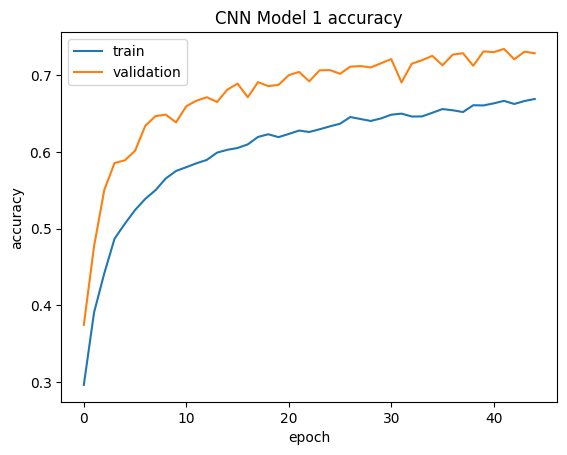

In [22]:
plt.plot(history_1.history["accuracy"])
plt.plot(history_1.history["val_accuracy"])
plt.title("CNN Model 1 accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [23]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_1.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8438 - loss: 0.4053


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7573 - loss: 0.5913 


Loss: 0.65003901720047, Accuracy: 0.734375


### **Plotting Confusion Matrix**



1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  


              precision    recall  f1-score   support

       happy       0.84      0.84      0.84        32
     neutral       0.65      0.69      0.67        32
         sad       0.54      0.59      0.57        32
    surprise       0.96      0.81      0.88        32

    accuracy                           0.73       128
   macro avg       0.75      0.73      0.74       128
weighted avg       0.75      0.73      0.74       128



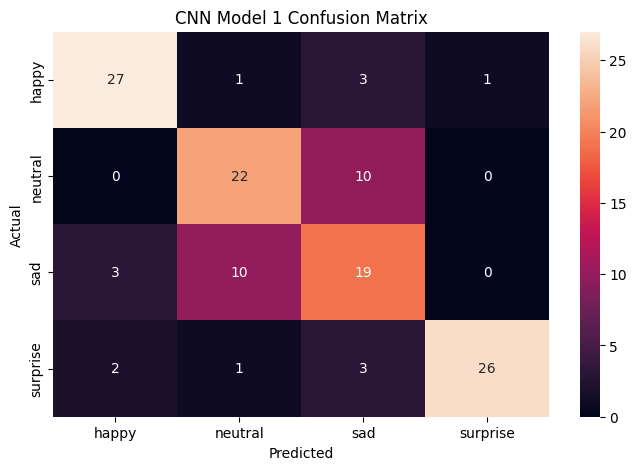

In [24]:
pred_probabilities = model_1.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.title("CNN Model 1 Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The model has a substantial number of **651,780 trainable parameters**, suggesting a complex architecture capable of learning detailed features.
- A steady improvement in training accuracy is noted, with a peak of **66.87%**, while the validation accuracy reaches a higher peak of **81.25%**. This discrepancy may be because we have augmented only the training data, and the model finds "easier" images on the validation set.
- The model's performance on the test set shows an accuracy of **70.31%**, which is commendably close to the validation accuracy, indicating a consistent model.
- Regarding the confusion matrix, the model identifies the 'surprise' emotion with an f1-score of **0.90**, and performs fairly well with 'happy' at an f1-score of **0.80**. However, 'neutral' and 'sad' emotions have lower f1-scores of **0.63** and **0.48** respectively, suggesting the model's difficulty in distinguishing these emotions as accurately.
- The f1-score, which balances precision and recall, suggests that 'sad' is the most challenging emotion for the model to predict correctly.


### **Creating the second Convolutional Neural Network**


### **Model 2 Architecture:**

- This model is designed with a sequential structure, incorporating four convolutional blocks for feature extraction, followed by dense layers for classification.
- **First Convolutional Block:**

  - Begins with a **Conv2D layer** with **256 filters**, a **2x2 kernel size**, **'same' padding**, and an input shape of **(48, 48, 1)**, indicating grayscale images of size 48x48.
  - Includes **BatchNormalization** to stabilize and speed up training.
  - Utilizes **LeakyReLU** with an alpha of **0.1** for activation, allowing a small gradient when the unit is not active.
  - Applies **MaxPooling2D** with a **pool size of 2** to reduce spatial dimensions.

- **Second Convolutional Block:**

  - Consists of a **Conv2D layer** with **128 filters** and a **2x2 kernel size**, using **'same' padding**.
  - Follows the same pattern of **BatchNormalization**, **LeakyReLU** activation, and **MaxPooling2D**.

- **Third Convolutional Block:**

  - Features a **Conv2D layer** with **64 filters** and a **2x2 kernel size**, maintaining **'same' padding**.
  - Repeats the **BatchNormalization**, **LeakyReLU** activation, and **MaxPooling2D** structure.

- **Fourth Convolutional Block:**

  - Contains a **Conv2D layer** with **32 filters** and a **2x2 kernel size**, with **'same' padding**.
  - Continues with **BatchNormalization**, **LeakyReLU** activation, and **MaxPooling2D**.

- After processing through the convolutional blocks, the model **flattens** the output to transition to fully connected layers.
- **Fully Connected Dense Layers:**
  - Incorporates a dense layer with **512 neurons** and **'relu' activation**.
  - Followed by a dense layer with **128 neurons** and **'relu' activation**.
  - Then, a dense layer with **64 neurons** without an explicit activation is added before **BatchNormalization** and **ReLU** activation to introduce non-linearity.
- **Output Layer:**
  - Concludes with a **Dense layer** having **4 neurons** and **'softmax' activation** for multi-class classification of 4 emotions.
- The model employs the **Adam optimizer** with a **learning rate of 0.001**, optimizing the categorical crossentropy loss function for training.


In [25]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [26]:
# Initializing a sequential model
model_2 = Sequential()

model_2.add(Input(shape=(img_width, img_height, color_layers)))

# First Convolutional Block
model_2.add(Conv2D(256, kernel_size=2, padding="same"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(negative_slope=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Second Convolutional Block
model_2.add(Conv2D(128, kernel_size=2, padding="same"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(negative_slope=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Third Convolutional Block
model_2.add(Conv2D(64, kernel_size=2, padding="same"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(negative_slope=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Fourth Convolutional Block
model_2.add(Conv2D(32, kernel_size=2, padding="same"))
model_2.add(BatchNormalization())
model_2.add(LeakyReLU(negative_slope=0.1))
model_2.add(MaxPooling2D(pool_size=2))

# Flatten the output of the conv layers to feed into the dense layers
model_2.add(Flatten())

# Fully connected layers
model_2.add(Dense(512, activation="relu"))
model_2.add(Dense(128, activation="relu"))
model_2.add(Dense(64))
model_2.add(BatchNormalization())
model_2.add(ReLU())  # Using ReLU after batch normalization

# Adding output layer
model_2.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.001)

### **Compiling and Training the Model**


In [27]:
# Compile the model
model_2.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

model_2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 48, 48, 256)    │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 48, 48, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 48, 48, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 24, 24, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 12, 12, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 6, 6, 32)       │         8,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 6, 6, 32)       │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 6, 6, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 3, 3, 32)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       147,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 397,860 (1.52 MB)

 Trainable params: 396,772 (1.51 MB)

 Non-trainable params: 1,088 (4.25 KB)

In [28]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

# Define the saving the best model callback
mc = ModelCheckpoint(
    f"{results_path}/best_model_2_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Fitting the model with 45 epochs and using validation set
history_2 = model_2.fit(
    train_generator,
    epochs=45,
    validation_data=validation_generator,
    callbacks=[reduce_lr, mc, delayed_early_stopping],
)

Epoch 1/45


I0000 00:00:1712794150.228648 1482664 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_2631', 4 bytes spill stores, 4 bytes spill loads




  1/473 ━━━━━━━━━━━━━━━━━━━━ 42:28 5s/step - accuracy: 0.3438 - loss: 1.3840


  5/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.2798 - loss: 1.6040 


  8/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.2899 - loss: 1.6063


 13/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.2964 - loss: 1.6224


 18/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.2983 - loss: 1.6201


 22/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.2994 - loss: 1.6173


 26/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.3013 - loss: 1.6110


 31/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.3042 - loss: 1.6004


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.3060 - loss: 1.5904


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3075 - loss: 1.5808


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3088 - loss: 1.5720


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3097 - loss: 1.5655


 55/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3109 - loss: 1.5576


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3122 - loss: 1.5498


 65/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3135 - loss: 1.5425


 70/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3149 - loss: 1.5358


 75/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.3162 - loss: 1.5293


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.3176 - loss: 1.5232


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3187 - loss: 1.5175


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3197 - loss: 1.5124


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3205 - loss: 1.5075


 96/473 ━━━━━━━━━━━━━━━━━━━━ 16s 44ms/step - accuracy: 0.3207 - loss: 1.5066


101/473 ━━━━━━━━━━━━━━━━━━━━ 15s 42ms/step - accuracy: 0.3215 - loss: 1.5019


105/473 ━━━━━━━━━━━━━━━━━━━━ 15s 41ms/step - accuracy: 0.3221 - loss: 1.4985


110/473 ━━━━━━━━━━━━━━━━━━━━ 14s 40ms/step - accuracy: 0.3229 - loss: 1.4944


115/473 ━━━━━━━━━━━━━━━━━━━━ 13s 39ms/step - accuracy: 0.3237 - loss: 1.4905


120/473 ━━━━━━━━━━━━━━━━━━━━ 13s 38ms/step - accuracy: 0.3245 - loss: 1.4868


125/473 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - accuracy: 0.3254 - loss: 1.4832


130/473 ━━━━━━━━━━━━━━━━━━━━ 12s 36ms/step - accuracy: 0.3262 - loss: 1.4798


135/473 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - accuracy: 0.3271 - loss: 1.4765


140/473 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step - accuracy: 0.3278 - loss: 1.4733


145/473 ━━━━━━━━━━━━━━━━━━━━ 10s 33ms/step - accuracy: 0.3286 - loss: 1.4703


150/473 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.3294 - loss: 1.4673


155/473 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.3301 - loss: 1.4644


160/473 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - accuracy: 0.3309 - loss: 1.4616 


165/473 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.3316 - loss: 1.4589


170/473 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - accuracy: 0.3324 - loss: 1.4562


175/473 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.3332 - loss: 1.4535


180/473 ━━━━━━━━━━━━━━━━━━━━ 8s 29ms/step - accuracy: 0.3340 - loss: 1.4510


185/473 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - accuracy: 0.3347 - loss: 1.4485


190/473 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - accuracy: 0.3354 - loss: 1.4461


195/473 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.3361 - loss: 1.4438


200/473 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.3368 - loss: 1.4416


205/473 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - accuracy: 0.3374 - loss: 1.4395


210/473 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - accuracy: 0.3380 - loss: 1.4374


215/473 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - accuracy: 0.3387 - loss: 1.4354


219/473 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - accuracy: 0.3392 - loss: 1.4338


224/473 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - accuracy: 0.3397 - loss: 1.4319


229/473 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - accuracy: 0.3403 - loss: 1.4300


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3408 - loss: 1.4281


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - accuracy: 0.3414 - loss: 1.4263


244/473 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.3420 - loss: 1.4245


249/473 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.3425 - loss: 1.4228


254/473 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.3430 - loss: 1.4211


259/473 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.3435 - loss: 1.4195


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.3440 - loss: 1.4179


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.3445 - loss: 1.4163


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.3449 - loss: 1.4148


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.3454 - loss: 1.4133


284/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.3459 - loss: 1.4119


289/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.3463 - loss: 1.4104


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.3468 - loss: 1.4090


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.3472 - loss: 1.4076


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.3476 - loss: 1.4062


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.3481 - loss: 1.4049


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3484 - loss: 1.4038


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3488 - loss: 1.4025


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3492 - loss: 1.4012


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3496 - loss: 1.3999


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3501 - loss: 1.3986


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3505 - loss: 1.3974


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3509 - loss: 1.3961


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.3514 - loss: 1.3949


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.3518 - loss: 1.3937


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.3522 - loss: 1.3924


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.3526 - loss: 1.3912


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.3531 - loss: 1.3900


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.3535 - loss: 1.3889


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.3539 - loss: 1.3877


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.3543 - loss: 1.3865


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.3547 - loss: 1.3854


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.3550 - loss: 1.3845


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.3554 - loss: 1.3833


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.3559 - loss: 1.3822


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.3563 - loss: 1.3811


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.3567 - loss: 1.3800


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.3571 - loss: 1.3789


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.3575 - loss: 1.3778


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.3579 - loss: 1.3768


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.3583 - loss: 1.3757


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.3587 - loss: 1.3747


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.3591 - loss: 1.3737


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.3595 - loss: 1.3727


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.3598 - loss: 1.3717


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.3602 - loss: 1.3708


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.3606 - loss: 1.3700


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.3609 - loss: 1.3690


Epoch 1: val_accuracy improved from -inf to 0.38798, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 17s 24ms/step - accuracy: 0.3616 - loss: 1.3675 - val_accuracy: 0.3880 - val_loss: 1.2428 - learning_rate: 0.0010


Epoch 2/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step - accuracy: 0.4688 - loss: 1.0899


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.4879 - loss: 1.1229  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5005 - loss: 1.1302


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4996 - loss: 1.1335


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5003 - loss: 1.1357


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4977 - loss: 1.1408


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4952 - loss: 1.1457


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4923 - loss: 1.1507


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4885 - loss: 1.1562


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.4860 - loss: 1.1598


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4845 - loss: 1.1617


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4831 - loss: 1.1633


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4814 - loss: 1.1648


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4798 - loss: 1.1658


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4785 - loss: 1.1665


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4771 - loss: 1.1671


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4761 - loss: 1.1673


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4753 - loss: 1.1672


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4746 - loss: 1.1669


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4743 - loss: 1.1663


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4740 - loss: 1.1658


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4739 - loss: 1.1654


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4739 - loss: 1.1649


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4739 - loss: 1.1645


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4739 - loss: 1.1642


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4740 - loss: 1.1638


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4740 - loss: 1.1635


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4740 - loss: 1.1631


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4739 - loss: 1.1630


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4738 - loss: 1.1629


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4737 - loss: 1.1629


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4736 - loss: 1.1628


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4736 - loss: 1.1626


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4736 - loss: 1.1623


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4736 - loss: 1.1621


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4737 - loss: 1.1618


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4737 - loss: 1.1614


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4738 - loss: 1.1611


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4739 - loss: 1.1608


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4740 - loss: 1.1605


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4741 - loss: 1.1601


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4742 - loss: 1.1599


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4743 - loss: 1.1596


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4743 - loss: 1.1593


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4744 - loss: 1.1590


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4745 - loss: 1.1587


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4747 - loss: 1.1583


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4749 - loss: 1.1579


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4750 - loss: 1.1575


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4752 - loss: 1.1572


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4753 - loss: 1.1569


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4754 - loss: 1.1567


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4755 - loss: 1.1564


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4756 - loss: 1.1561


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4758 - loss: 1.1557


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4759 - loss: 1.1554


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4760 - loss: 1.1552


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4762 - loss: 1.1549


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4763 - loss: 1.1547


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4764 - loss: 1.1543


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4765 - loss: 1.1540


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4766 - loss: 1.1538


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4768 - loss: 1.1535


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4769 - loss: 1.1532


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4771 - loss: 1.1529


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4772 - loss: 1.1525


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4774 - loss: 1.1522


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4776 - loss: 1.1519


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4777 - loss: 1.1516


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4778 - loss: 1.1514


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4780 - loss: 1.1511


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4782 - loss: 1.1508


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4784 - loss: 1.1505


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4786 - loss: 1.1501


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4787 - loss: 1.1498


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4789 - loss: 1.1495


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4791 - loss: 1.1492


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4793 - loss: 1.1489


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4795 - loss: 1.1486


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4797 - loss: 1.1482


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4800 - loss: 1.1478


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4802 - loss: 1.1474


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4804 - loss: 1.1470


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4806 - loss: 1.1467


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4808 - loss: 1.1463


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4811 - loss: 1.1459


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4813 - loss: 1.1455


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4815 - loss: 1.1451


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4817 - loss: 1.1447


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4820 - loss: 1.1443


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4822 - loss: 1.1439


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4824 - loss: 1.1435


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4827 - loss: 1.1430


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4829 - loss: 1.1426


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4832 - loss: 1.1422


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4834 - loss: 1.1418


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4837 - loss: 1.1414


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4839 - loss: 1.1410


Epoch 2: val_accuracy improved from 0.38798 to 0.47197, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.4843 - loss: 1.1404 - val_accuracy: 0.4720 - val_loss: 1.3282 - learning_rate: 0.0010


Epoch 3/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - accuracy: 0.5312 - loss: 1.1768


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5102 - loss: 1.1297  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5215 - loss: 1.1098


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5277 - loss: 1.0933


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5324 - loss: 1.0837


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5347 - loss: 1.0802


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5362 - loss: 1.0793


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5372 - loss: 1.0788


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5374 - loss: 1.0789


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5375 - loss: 1.0785


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5384 - loss: 1.0769


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5393 - loss: 1.0753


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5400 - loss: 1.0736


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5408 - loss: 1.0720


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5419 - loss: 1.0701


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5432 - loss: 1.0680


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5445 - loss: 1.0659


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5458 - loss: 1.0640


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5470 - loss: 1.0621


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5481 - loss: 1.0602


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5492 - loss: 1.0584


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5502 - loss: 1.0568


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5510 - loss: 1.0554


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5514 - loss: 1.0546


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5519 - loss: 1.0538


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5525 - loss: 1.0528


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5530 - loss: 1.0519


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5533 - loss: 1.0514


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5536 - loss: 1.0507


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5539 - loss: 1.0501


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5542 - loss: 1.0495


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5545 - loss: 1.0488


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5549 - loss: 1.0480


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5552 - loss: 1.0472


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5555 - loss: 1.0465


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5558 - loss: 1.0459


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5560 - loss: 1.0454


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5562 - loss: 1.0449


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5564 - loss: 1.0444


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5565 - loss: 1.0440


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5567 - loss: 1.0435


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5568 - loss: 1.0430


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5570 - loss: 1.0426


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5571 - loss: 1.0422


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5572 - loss: 1.0417


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5574 - loss: 1.0413


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5575 - loss: 1.0409


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5576 - loss: 1.0405


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5578 - loss: 1.0401


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5579 - loss: 1.0397


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5580 - loss: 1.0393


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5581 - loss: 1.0390


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5582 - loss: 1.0386


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5583 - loss: 1.0382


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5584 - loss: 1.0380


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5585 - loss: 1.0377


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5586 - loss: 1.0374


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5587 - loss: 1.0370


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5589 - loss: 1.0366


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5590 - loss: 1.0363


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5591 - loss: 1.0359


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5593 - loss: 1.0355


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5594 - loss: 1.0352


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5595 - loss: 1.0349


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5595 - loss: 1.0347


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5596 - loss: 1.0345


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5596 - loss: 1.0343


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5597 - loss: 1.0339


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5598 - loss: 1.0336


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5599 - loss: 1.0333


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5599 - loss: 1.0330


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5600 - loss: 1.0327


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5601 - loss: 1.0324


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5602 - loss: 1.0321


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5603 - loss: 1.0318


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5603 - loss: 1.0315


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5604 - loss: 1.0312


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5605 - loss: 1.0309


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5605 - loss: 1.0307


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5606 - loss: 1.0304


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5606 - loss: 1.0302


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5607 - loss: 1.0299


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5607 - loss: 1.0296


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5608 - loss: 1.0293


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5609 - loss: 1.0290


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5610 - loss: 1.0287


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5610 - loss: 1.0284


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5611 - loss: 1.0282


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5612 - loss: 1.0280


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5612 - loss: 1.0278


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5613 - loss: 1.0275


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5614 - loss: 1.0272


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5615 - loss: 1.0269


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5615 - loss: 1.0267


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5616 - loss: 1.0264


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5617 - loss: 1.0262


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5618 - loss: 1.0259


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5618 - loss: 1.0256


Epoch 3: val_accuracy improved from 0.47197 to 0.52863, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5619 - loss: 1.0254 - val_accuracy: 0.5286 - val_loss: 1.1775 - learning_rate: 0.0010


Epoch 4/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 59s 127ms/step - accuracy: 0.5938 - loss: 1.0203


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5871 - loss: 0.9692  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5939 - loss: 0.9558


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5970 - loss: 0.9501


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5945 - loss: 0.9543


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5944 - loss: 0.9536


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5946 - loss: 0.9512


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5937 - loss: 0.9505


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5929 - loss: 0.9501


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5918 - loss: 0.9506


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5909 - loss: 0.9507


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5907 - loss: 0.9503


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5907 - loss: 0.9497


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5907 - loss: 0.9491


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5908 - loss: 0.9486


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5909 - loss: 0.9484


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5912 - loss: 0.9481


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5914 - loss: 0.9480


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5916 - loss: 0.9480


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5916 - loss: 0.9481


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5915 - loss: 0.9482


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5912 - loss: 0.9486


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5909 - loss: 0.9492


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5906 - loss: 0.9497


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5904 - loss: 0.9501


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5903 - loss: 0.9503


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5903 - loss: 0.9505


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5902 - loss: 0.9508


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5902 - loss: 0.9511


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5901 - loss: 0.9513


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5900 - loss: 0.9515


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5899 - loss: 0.9517


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5898 - loss: 0.9519


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5898 - loss: 0.9520


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5898 - loss: 0.9520


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5898 - loss: 0.9519


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5898 - loss: 0.9519


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5898 - loss: 0.9518


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5899 - loss: 0.9517


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5899 - loss: 0.9517


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5899 - loss: 0.9517


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5900 - loss: 0.9517


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5900 - loss: 0.9516


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5901 - loss: 0.9516


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5902 - loss: 0.9515


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5903 - loss: 0.9515


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5904 - loss: 0.9514


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5906 - loss: 0.9513


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5907 - loss: 0.9512


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5909 - loss: 0.9511


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5910 - loss: 0.9509


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5912 - loss: 0.9507


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5913 - loss: 0.9505


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5915 - loss: 0.9503


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5916 - loss: 0.9502


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5917 - loss: 0.9501


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5918 - loss: 0.9500


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5918 - loss: 0.9499


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5919 - loss: 0.9498


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5920 - loss: 0.9498


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5921 - loss: 0.9497


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5922 - loss: 0.9495


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5923 - loss: 0.9494


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5924 - loss: 0.9493


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5926 - loss: 0.9492


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5927 - loss: 0.9490


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5928 - loss: 0.9489


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5929 - loss: 0.9488


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5930 - loss: 0.9486


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5931 - loss: 0.9485


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5932 - loss: 0.9484


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5933 - loss: 0.9483


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5934 - loss: 0.9482


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5935 - loss: 0.9480


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5936 - loss: 0.9479


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5937 - loss: 0.9478


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5938 - loss: 0.9477


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5939 - loss: 0.9476


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5940 - loss: 0.9475


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5940 - loss: 0.9475


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5941 - loss: 0.9474


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5942 - loss: 0.9474


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5942 - loss: 0.9473


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5943 - loss: 0.9473


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5943 - loss: 0.9472


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5944 - loss: 0.9472


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5944 - loss: 0.9471


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5944 - loss: 0.9471


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5945 - loss: 0.9471


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5945 - loss: 0.9470


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5946 - loss: 0.9470


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5947 - loss: 0.9469


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5947 - loss: 0.9469


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5948 - loss: 0.9468


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5948 - loss: 0.9468


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5949 - loss: 0.9467


Epoch 4: val_accuracy improved from 0.52863 to 0.65702, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5950 - loss: 0.9466 - val_accuracy: 0.6570 - val_loss: 0.8246 - learning_rate: 0.0010


Epoch 5/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - accuracy: 0.5000 - loss: 0.8986


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5618 - loss: 0.9273  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5628 - loss: 0.9428


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5701 - loss: 0.9478


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5743 - loss: 0.9484


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5763 - loss: 0.9478


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5790 - loss: 0.9454


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5816 - loss: 0.9436


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5840 - loss: 0.9428


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5860 - loss: 0.9421


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5878 - loss: 0.9410


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5897 - loss: 0.9392


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5913 - loss: 0.9374


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5927 - loss: 0.9355


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5940 - loss: 0.9336


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5951 - loss: 0.9318


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5961 - loss: 0.9301


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5969 - loss: 0.9288


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5975 - loss: 0.9279


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5978 - loss: 0.9271


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5982 - loss: 0.9261


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5986 - loss: 0.9252


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5990 - loss: 0.9242


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5996 - loss: 0.9233


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6001 - loss: 0.9224


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6005 - loss: 0.9217


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6010 - loss: 0.9211


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6013 - loss: 0.9206


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6017 - loss: 0.9200


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6021 - loss: 0.9194


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6024 - loss: 0.9189


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6028 - loss: 0.9184


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6030 - loss: 0.9180


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6032 - loss: 0.9176


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6035 - loss: 0.9172


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6037 - loss: 0.9169


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6039 - loss: 0.9166


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6041 - loss: 0.9164


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6043 - loss: 0.9162


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6045 - loss: 0.9160


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6047 - loss: 0.9158


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6049 - loss: 0.9156


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6051 - loss: 0.9155


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6052 - loss: 0.9155


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6053 - loss: 0.9154


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6054 - loss: 0.9155


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6054 - loss: 0.9155


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6055 - loss: 0.9155


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6056 - loss: 0.9155


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6056 - loss: 0.9155


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6057 - loss: 0.9154


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6058 - loss: 0.9154


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6059 - loss: 0.9153


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6060 - loss: 0.9152


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6061 - loss: 0.9151


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6062 - loss: 0.9150


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6062 - loss: 0.9149


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6063 - loss: 0.9148


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6063 - loss: 0.9147


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6064 - loss: 0.9147


301/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6064 - loss: 0.9146


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6065 - loss: 0.9146


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6066 - loss: 0.9145


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6066 - loss: 0.9144


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6066 - loss: 0.9143


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6067 - loss: 0.9143


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6067 - loss: 0.9142


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6067 - loss: 0.9142


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6068 - loss: 0.9141


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6068 - loss: 0.9141


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6068 - loss: 0.9140


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6069 - loss: 0.9140


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6069 - loss: 0.9139


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6070 - loss: 0.9138


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6070 - loss: 0.9137


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6071 - loss: 0.9136


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6072 - loss: 0.9134


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6072 - loss: 0.9133


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6073 - loss: 0.9132


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6074 - loss: 0.9131


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6074 - loss: 0.9130


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6075 - loss: 0.9129


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6075 - loss: 0.9128


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6076 - loss: 0.9127


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6076 - loss: 0.9127


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6077 - loss: 0.9126


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6077 - loss: 0.9125


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6078 - loss: 0.9125


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6078 - loss: 0.9124


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6079 - loss: 0.9123


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6079 - loss: 0.9122


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6080 - loss: 0.9121


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6081 - loss: 0.9120


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6081 - loss: 0.9119


Epoch 5: val_accuracy did not improve from 0.65702



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6082 - loss: 0.9118 - val_accuracy: 0.6319 - val_loss: 0.8880 - learning_rate: 0.0010


Epoch 6/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 51s 108ms/step - accuracy: 0.5938 - loss: 0.8551


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5984 - loss: 0.8713  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6135 - loss: 0.8580


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6202 - loss: 0.8558


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6244 - loss: 0.8547


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6284 - loss: 0.8522


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6290 - loss: 0.8541


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6283 - loss: 0.8576


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6276 - loss: 0.8608


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6266 - loss: 0.8639


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6259 - loss: 0.8659


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6259 - loss: 0.8669


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6255 - loss: 0.8685


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6252 - loss: 0.8700


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6251 - loss: 0.8712


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6253 - loss: 0.8717


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6256 - loss: 0.8719


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6259 - loss: 0.8719


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6263 - loss: 0.8718


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6267 - loss: 0.8717


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6269 - loss: 0.8716


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6271 - loss: 0.8716


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6273 - loss: 0.8716


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6274 - loss: 0.8716


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6275 - loss: 0.8717


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6276 - loss: 0.8718


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6276 - loss: 0.8717


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6276 - loss: 0.8717


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6276 - loss: 0.8719


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6277 - loss: 0.8719


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8720


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8720


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8722


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8723


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6279 - loss: 0.8725


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6279 - loss: 0.8727


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8730


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8732


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8733


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8735


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8736


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8737


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6278 - loss: 0.8737


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8737


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8736


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6279 - loss: 0.8736


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6279 - loss: 0.8736


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6279 - loss: 0.8736


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8736


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8736


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8737


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8737


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8736


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8736


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8736


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8735


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8734


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6278 - loss: 0.8734


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6279 - loss: 0.8733


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6279 - loss: 0.8732


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6279 - loss: 0.8732


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6279 - loss: 0.8731


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6280 - loss: 0.8731


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6280 - loss: 0.8730


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6280 - loss: 0.8730


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6281 - loss: 0.8729


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6281 - loss: 0.8728


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6282 - loss: 0.8728


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6282 - loss: 0.8727


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6282 - loss: 0.8727


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6282 - loss: 0.8727


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6282 - loss: 0.8727


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6282 - loss: 0.8727


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6283 - loss: 0.8727


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6283 - loss: 0.8726


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6283 - loss: 0.8726


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6284 - loss: 0.8725


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6284 - loss: 0.8725


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6285 - loss: 0.8724


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6285 - loss: 0.8724


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6286 - loss: 0.8723


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6286 - loss: 0.8722


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6287 - loss: 0.8722


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6287 - loss: 0.8721


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6287 - loss: 0.8721


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6288 - loss: 0.8720


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6288 - loss: 0.8720


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6288 - loss: 0.8719


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6288 - loss: 0.8719


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6289 - loss: 0.8718


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6289 - loss: 0.8718


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6289 - loss: 0.8717


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6290 - loss: 0.8717


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6290 - loss: 0.8716


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6290 - loss: 0.8716


Epoch 6: val_accuracy improved from 0.65702 to 0.66024, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6291 - loss: 0.8715 - val_accuracy: 0.6602 - val_loss: 0.8272 - learning_rate: 0.0010


Epoch 7/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - accuracy: 0.6875 - loss: 0.6357


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6321 - loss: 0.7607  


  9/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6277 - loss: 0.7783


 12/473 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.6284 - loss: 0.7902


 17/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.6322 - loss: 0.7979


 22/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6355 - loss: 0.8036


 27/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6378 - loss: 0.8072


 32/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6401 - loss: 0.8102


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6413 - loss: 0.8135


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6423 - loss: 0.8156


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6423 - loss: 0.8176


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6423 - loss: 0.8191


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6423 - loss: 0.8206


 62/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6425 - loss: 0.8221


 67/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6426 - loss: 0.8235


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6426 - loss: 0.8249


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6426 - loss: 0.8260


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6429 - loss: 0.8269


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6431 - loss: 0.8281


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6432 - loss: 0.8293


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6432 - loss: 0.8302


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6431 - loss: 0.8310


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6430 - loss: 0.8318


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6430 - loss: 0.8325


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6430 - loss: 0.8330


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6431 - loss: 0.8334


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6430 - loss: 0.8339


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6428 - loss: 0.8346


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6426 - loss: 0.8352


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6424 - loss: 0.8359


141/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6422 - loss: 0.8364


146/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6419 - loss: 0.8370


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6418 - loss: 0.8374


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6416 - loss: 0.8379


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6414 - loss: 0.8384


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6412 - loss: 0.8389


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6410 - loss: 0.8395


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6408 - loss: 0.8400


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6406 - loss: 0.8406


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6404 - loss: 0.8412


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6402 - loss: 0.8418


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6399 - loss: 0.8423


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6397 - loss: 0.8429


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6396 - loss: 0.8433


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6394 - loss: 0.8438


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6392 - loss: 0.8443


221/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6391 - loss: 0.8447


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8451


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6389 - loss: 0.8455


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6388 - loss: 0.8458


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6387 - loss: 0.8460


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6387 - loss: 0.8463


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6386 - loss: 0.8465


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6385 - loss: 0.8468


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6384 - loss: 0.8470


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6384 - loss: 0.8472


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6382 - loss: 0.8475


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6382 - loss: 0.8477


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6381 - loss: 0.8478


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6380 - loss: 0.8480


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6379 - loss: 0.8482


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6378 - loss: 0.8483


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6378 - loss: 0.8485


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6377 - loss: 0.8486


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6377 - loss: 0.8487


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6376 - loss: 0.8488


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6376 - loss: 0.8489


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6375 - loss: 0.8490


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6375 - loss: 0.8491


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6374 - loss: 0.8493


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6374 - loss: 0.8494


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6373 - loss: 0.8495


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6373 - loss: 0.8497


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6372 - loss: 0.8498


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6372 - loss: 0.8500


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6371 - loss: 0.8501


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6370 - loss: 0.8503


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6370 - loss: 0.8504


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6369 - loss: 0.8505


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6368 - loss: 0.8507


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6368 - loss: 0.8508


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6367 - loss: 0.8510


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6366 - loss: 0.8511


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6366 - loss: 0.8512


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6365 - loss: 0.8513


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6365 - loss: 0.8514


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6365 - loss: 0.8515


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6364 - loss: 0.8516


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6364 - loss: 0.8517


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6364 - loss: 0.8518


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6363 - loss: 0.8519


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6363 - loss: 0.8519


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6363 - loss: 0.8520


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6363 - loss: 0.8521


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6363 - loss: 0.8521


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6362 - loss: 0.8522


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6362 - loss: 0.8523


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6362 - loss: 0.8523


Epoch 7: val_accuracy improved from 0.66024 to 0.68957, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6362 - loss: 0.8523 - val_accuracy: 0.6896 - val_loss: 0.7543 - learning_rate: 0.0010


Epoch 8/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - accuracy: 0.9062 - loss: 0.4684


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7533 - loss: 0.7041  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7315 - loss: 0.7319


 14/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7162 - loss: 0.7507


 19/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7059 - loss: 0.7625


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6979 - loss: 0.7704


 29/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6925 - loss: 0.7749


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6884 - loss: 0.7782


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6846 - loss: 0.7823


 43/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6818 - loss: 0.7851


 48/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6788 - loss: 0.7880


 53/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6767 - loss: 0.7898


 58/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6747 - loss: 0.7916


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6724 - loss: 0.7932


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6707 - loss: 0.7945


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6694 - loss: 0.7955


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6684 - loss: 0.7963


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6672 - loss: 0.7975


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6663 - loss: 0.7985


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6653 - loss: 0.7996


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6646 - loss: 0.8005


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6638 - loss: 0.8014


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6633 - loss: 0.8023


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6625 - loss: 0.8035


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6619 - loss: 0.8044


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6614 - loss: 0.8052


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6610 - loss: 0.8059


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6605 - loss: 0.8066


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6601 - loss: 0.8073


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6596 - loss: 0.8082


141/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6591 - loss: 0.8090


146/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6585 - loss: 0.8099


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6581 - loss: 0.8107


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6578 - loss: 0.8114


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6575 - loss: 0.8119


160/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6573 - loss: 0.8124


162/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6572 - loss: 0.8127


165/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6570 - loss: 0.8131


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6567 - loss: 0.8136


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6564 - loss: 0.8142


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6562 - loss: 0.8146


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6560 - loss: 0.8151


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6557 - loss: 0.8156


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6555 - loss: 0.8160


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6553 - loss: 0.8165


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6551 - loss: 0.8169


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6549 - loss: 0.8173


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6547 - loss: 0.8177


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6544 - loss: 0.8182


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6542 - loss: 0.8186


225/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6539 - loss: 0.8191


230/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6536 - loss: 0.8195


235/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.6534 - loss: 0.8199


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6531 - loss: 0.8204


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6529 - loss: 0.8208


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6527 - loss: 0.8212


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6525 - loss: 0.8216


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6523 - loss: 0.8221


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6520 - loss: 0.8225


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6519 - loss: 0.8228


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6517 - loss: 0.8233


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6515 - loss: 0.8236


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6513 - loss: 0.8240


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6511 - loss: 0.8244


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6509 - loss: 0.8248


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6507 - loss: 0.8252


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6506 - loss: 0.8255


304/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6504 - loss: 0.8258


309/473 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6502 - loss: 0.8262


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6500 - loss: 0.8265


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6499 - loss: 0.8268


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6498 - loss: 0.8271


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6497 - loss: 0.8274


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6496 - loss: 0.8276


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6494 - loss: 0.8279


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6493 - loss: 0.8281


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6492 - loss: 0.8283


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6491 - loss: 0.8286


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6490 - loss: 0.8288


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6489 - loss: 0.8290


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6488 - loss: 0.8292


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.6487 - loss: 0.8294


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6486 - loss: 0.8296


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6485 - loss: 0.8298


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6484 - loss: 0.8301


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6483 - loss: 0.8303


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6482 - loss: 0.8305


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6481 - loss: 0.8307


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6480 - loss: 0.8309


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6479 - loss: 0.8311


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6478 - loss: 0.8313


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6478 - loss: 0.8314


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6477 - loss: 0.8316


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6476 - loss: 0.8317


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6475 - loss: 0.8319


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6475 - loss: 0.8320


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6474 - loss: 0.8321


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6474 - loss: 0.8322


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6473 - loss: 0.8323


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6473 - loss: 0.8324


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6472 - loss: 0.8324


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6472 - loss: 0.8325


Epoch 8: val_accuracy did not improve from 0.68957



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6471 - loss: 0.8326 - val_accuracy: 0.6637 - val_loss: 0.8172 - learning_rate: 0.0010


Epoch 9/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.7500 - loss: 0.7112


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7065 - loss: 0.7224  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6903 - loss: 0.7391


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6803 - loss: 0.7517


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6765 - loss: 0.7606


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6752 - loss: 0.7673


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6735 - loss: 0.7736


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6713 - loss: 0.7792


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6691 - loss: 0.7836


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6677 - loss: 0.7867


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6665 - loss: 0.7891


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6656 - loss: 0.7912


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6648 - loss: 0.7932


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6641 - loss: 0.7950


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6633 - loss: 0.7974


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6626 - loss: 0.7993


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6622 - loss: 0.8008


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6621 - loss: 0.8017


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6620 - loss: 0.8026


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6619 - loss: 0.8039


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6618 - loss: 0.8050


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6616 - loss: 0.8062


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6614 - loss: 0.8073


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6611 - loss: 0.8083


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6608 - loss: 0.8095


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6605 - loss: 0.8106


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6602 - loss: 0.8117


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6600 - loss: 0.8127


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6598 - loss: 0.8137


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6596 - loss: 0.8144


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6594 - loss: 0.8152


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6592 - loss: 0.8159


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6591 - loss: 0.8165


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6591 - loss: 0.8170


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6590 - loss: 0.8176


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6590 - loss: 0.8181


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6589 - loss: 0.8187


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6588 - loss: 0.8191


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6587 - loss: 0.8197


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6586 - loss: 0.8201


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6584 - loss: 0.8207


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6582 - loss: 0.8212


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6581 - loss: 0.8217


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6580 - loss: 0.8221


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6579 - loss: 0.8225


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6578 - loss: 0.8228


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6577 - loss: 0.8231


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6576 - loss: 0.8235


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6575 - loss: 0.8238


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6574 - loss: 0.8241


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6574 - loss: 0.8244


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6572 - loss: 0.8247


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6571 - loss: 0.8250


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6570 - loss: 0.8253


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6569 - loss: 0.8256


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6568 - loss: 0.8259


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6567 - loss: 0.8261


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6566 - loss: 0.8264


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6565 - loss: 0.8266


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6564 - loss: 0.8268


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6564 - loss: 0.8270


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6563 - loss: 0.8272


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6562 - loss: 0.8274


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6561 - loss: 0.8276


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6560 - loss: 0.8278


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6559 - loss: 0.8280


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6558 - loss: 0.8282


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6557 - loss: 0.8284


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6556 - loss: 0.8285


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6555 - loss: 0.8287


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6554 - loss: 0.8289


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6553 - loss: 0.8290


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6553 - loss: 0.8292


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6552 - loss: 0.8293


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6551 - loss: 0.8295


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6550 - loss: 0.8296


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6549 - loss: 0.8297


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6549 - loss: 0.8298


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6548 - loss: 0.8299


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6547 - loss: 0.8300


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6547 - loss: 0.8300


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6546 - loss: 0.8301


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6546 - loss: 0.8302


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6545 - loss: 0.8303


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6544 - loss: 0.8304


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6544 - loss: 0.8304


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6543 - loss: 0.8305


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6543 - loss: 0.8306


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6542 - loss: 0.8306


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6542 - loss: 0.8307


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6541 - loss: 0.8307


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6541 - loss: 0.8308


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6541 - loss: 0.8309


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6540 - loss: 0.8309


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6540 - loss: 0.8310


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6539 - loss: 0.8310


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6539 - loss: 0.8311


Epoch 9: val_accuracy did not improve from 0.68957



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6539 - loss: 0.8311 - val_accuracy: 0.6323 - val_loss: 0.8551 - learning_rate: 0.0010


Epoch 10/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.6250 - loss: 1.0567


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6631 - loss: 0.9727  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6865 - loss: 0.8890


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6972 - loss: 0.8538


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6997 - loss: 0.8367


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6991 - loss: 0.8268


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6977 - loss: 0.8203


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6964 - loss: 0.8152


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6949 - loss: 0.8121


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6938 - loss: 0.8083


 49/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6925 - loss: 0.8061


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6911 - loss: 0.8042


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6897 - loss: 0.8031


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6885 - loss: 0.8020


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6876 - loss: 0.8008


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6868 - loss: 0.8007


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6859 - loss: 0.8011


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6849 - loss: 0.8020


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6838 - loss: 0.8029


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6829 - loss: 0.8036


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6819 - loss: 0.8042


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6809 - loss: 0.8050


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6801 - loss: 0.8057


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6794 - loss: 0.8062


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6788 - loss: 0.8067


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6783 - loss: 0.8071


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6778 - loss: 0.8076


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6772 - loss: 0.8082


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6766 - loss: 0.8088


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6760 - loss: 0.8093


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6755 - loss: 0.8098


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6750 - loss: 0.8103


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6746 - loss: 0.8107


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6742 - loss: 0.8110


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6739 - loss: 0.8114


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6735 - loss: 0.8117


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6732 - loss: 0.8119


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6728 - loss: 0.8122


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6725 - loss: 0.8124


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6721 - loss: 0.8127


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6718 - loss: 0.8129


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6715 - loss: 0.8131


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6712 - loss: 0.8133


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6709 - loss: 0.8135


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6706 - loss: 0.8137


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6703 - loss: 0.8139


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6700 - loss: 0.8141


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6698 - loss: 0.8143


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6695 - loss: 0.8144


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6693 - loss: 0.8145


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6692 - loss: 0.8146


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6690 - loss: 0.8146


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6689 - loss: 0.8147


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6687 - loss: 0.8148


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6686 - loss: 0.8148


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6684 - loss: 0.8149


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6683 - loss: 0.8150


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6682 - loss: 0.8150


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6681 - loss: 0.8151


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6679 - loss: 0.8152


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6678 - loss: 0.8152


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6678 - loss: 0.8152


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6677 - loss: 0.8153


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6675 - loss: 0.8153


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6674 - loss: 0.8154


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6673 - loss: 0.8155


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6672 - loss: 0.8156


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6671 - loss: 0.8156


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6670 - loss: 0.8157


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6669 - loss: 0.8158


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6668 - loss: 0.8158


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6667 - loss: 0.8159


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.8159


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6666 - loss: 0.8160


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6665 - loss: 0.8160


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6664 - loss: 0.8160


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6664 - loss: 0.8161


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6663 - loss: 0.8161


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6663 - loss: 0.8161


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.8161


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6662 - loss: 0.8161


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6661 - loss: 0.8160


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6661 - loss: 0.8160


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6661 - loss: 0.8160


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6660 - loss: 0.8160


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6660 - loss: 0.8160


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6659 - loss: 0.8160


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6658 - loss: 0.8160


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6658 - loss: 0.8160


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6657 - loss: 0.8160


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6657 - loss: 0.8160


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6656 - loss: 0.8160


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6656 - loss: 0.8160


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6655 - loss: 0.8160


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6654 - loss: 0.8161


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6654 - loss: 0.8161


Epoch 10: val_accuracy did not improve from 0.68957



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6653 - loss: 0.8162 - val_accuracy: 0.6337 - val_loss: 0.8556 - learning_rate: 0.0010


Epoch 11/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - accuracy: 0.6875 - loss: 0.7334


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6606 - loss: 0.8048  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6520 - loss: 0.8091


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6517 - loss: 0.8120


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6522 - loss: 0.8124


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6539 - loss: 0.8131


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6545 - loss: 0.8135


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6539 - loss: 0.8165


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6530 - loss: 0.8197


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6525 - loss: 0.8218


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6524 - loss: 0.8229


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6526 - loss: 0.8236


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6532 - loss: 0.8238


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6539 - loss: 0.8235


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6548 - loss: 0.8231


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6556 - loss: 0.8230


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6563 - loss: 0.8226


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6568 - loss: 0.8225


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6571 - loss: 0.8226


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6574 - loss: 0.8227


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6575 - loss: 0.8227


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6578 - loss: 0.8227


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6580 - loss: 0.8228


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6581 - loss: 0.8228


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6583 - loss: 0.8227


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6584 - loss: 0.8225


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6586 - loss: 0.8223


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6588 - loss: 0.8220


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6590 - loss: 0.8217


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6592 - loss: 0.8215


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6593 - loss: 0.8213


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6595 - loss: 0.8211


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6596 - loss: 0.8209


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6597 - loss: 0.8206


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6597 - loss: 0.8205


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6596 - loss: 0.8204


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6595 - loss: 0.8205


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6594 - loss: 0.8206


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6593 - loss: 0.8206


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6592 - loss: 0.8206


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6592 - loss: 0.8206


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6591 - loss: 0.8205


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6591 - loss: 0.8205


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6590 - loss: 0.8204


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6590 - loss: 0.8203


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6589 - loss: 0.8202


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6589 - loss: 0.8202


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6589 - loss: 0.8201


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6588 - loss: 0.8200


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6588 - loss: 0.8199


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6587 - loss: 0.8199


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6586 - loss: 0.8199


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6586 - loss: 0.8199


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6585 - loss: 0.8199


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6584 - loss: 0.8199


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6583 - loss: 0.8199


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6582 - loss: 0.8198


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6582 - loss: 0.8198


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6581 - loss: 0.8197


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6581 - loss: 0.8197


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6580 - loss: 0.8196


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6580 - loss: 0.8195


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6580 - loss: 0.8194


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8193


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8192


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8191


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8190


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8190


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8189


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8188


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8187


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8186


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8185


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8184


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8183


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8182


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8181


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8180


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6579 - loss: 0.8179


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8178


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8177


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8176


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8175


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8175


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8174


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6579 - loss: 0.8173


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8172


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8172


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8171


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8170


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8169


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8168


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8167


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8167


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8166


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6580 - loss: 0.8166


Epoch 11: val_accuracy improved from 0.68957 to 0.69781, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6580 - loss: 0.8165 - val_accuracy: 0.6978 - val_loss: 0.7402 - learning_rate: 0.0010


Epoch 12/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.7812 - loss: 0.5651


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7678 - loss: 0.6033  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7559 - loss: 0.6216


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7457 - loss: 0.6388


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7356 - loss: 0.6518


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7258 - loss: 0.6651


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7189 - loss: 0.6769


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7144 - loss: 0.6852


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7109 - loss: 0.6912


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7075 - loss: 0.6973


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7048 - loss: 0.7030


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7024 - loss: 0.7086


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7004 - loss: 0.7139


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6987 - loss: 0.7179


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6972 - loss: 0.7216


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6959 - loss: 0.7247


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6946 - loss: 0.7284


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6935 - loss: 0.7316


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6925 - loss: 0.7348


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6914 - loss: 0.7379


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6906 - loss: 0.7406


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6897 - loss: 0.7431


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6887 - loss: 0.7455


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6878 - loss: 0.7478


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6868 - loss: 0.7501


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6859 - loss: 0.7522


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6851 - loss: 0.7540


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6844 - loss: 0.7557


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6840 - loss: 0.7566


138/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6837 - loss: 0.7573


141/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6833 - loss: 0.7582


146/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6826 - loss: 0.7597


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6820 - loss: 0.7612


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6814 - loss: 0.7626


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6810 - loss: 0.7637


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6805 - loss: 0.7648


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6801 - loss: 0.7659


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6798 - loss: 0.7669


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6794 - loss: 0.7679


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6791 - loss: 0.7688


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6788 - loss: 0.7696


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6786 - loss: 0.7703


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6783 - loss: 0.7711


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6781 - loss: 0.7718


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6778 - loss: 0.7725


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6777 - loss: 0.7730


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6775 - loss: 0.7736


224/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6773 - loss: 0.7741


229/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6772 - loss: 0.7746


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6770 - loss: 0.7751


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6769 - loss: 0.7757


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6767 - loss: 0.7762


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6766 - loss: 0.7767


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6764 - loss: 0.7772


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6763 - loss: 0.7776


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6762 - loss: 0.7780


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6761 - loss: 0.7784


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6760 - loss: 0.7787


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6759 - loss: 0.7791


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6759 - loss: 0.7794


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6758 - loss: 0.7798


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6758 - loss: 0.7801


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6757 - loss: 0.7803


304/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6757 - loss: 0.7806


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6756 - loss: 0.7809


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6755 - loss: 0.7811


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6755 - loss: 0.7814


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6754 - loss: 0.7817


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6753 - loss: 0.7820


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6753 - loss: 0.7822


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6752 - loss: 0.7825


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6751 - loss: 0.7827


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6750 - loss: 0.7830


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6750 - loss: 0.7832


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6749 - loss: 0.7834


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6748 - loss: 0.7836


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6748 - loss: 0.7839


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6747 - loss: 0.7841


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6746 - loss: 0.7843


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6745 - loss: 0.7846


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6744 - loss: 0.7848


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6744 - loss: 0.7850


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6743 - loss: 0.7853


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6742 - loss: 0.7855


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6741 - loss: 0.7857


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7859


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6739 - loss: 0.7861


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6738 - loss: 0.7863


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6737 - loss: 0.7865


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6737 - loss: 0.7867


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6736 - loss: 0.7869


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6735 - loss: 0.7870


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6734 - loss: 0.7872


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6734 - loss: 0.7874


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6733 - loss: 0.7875


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6733 - loss: 0.7876


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6732 - loss: 0.7878


Epoch 12: val_accuracy improved from 0.69781 to 0.71569, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6732 - loss: 0.7880 - val_accuracy: 0.7157 - val_loss: 0.7013 - learning_rate: 0.0010


Epoch 13/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.6875 - loss: 0.7460


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6643 - loss: 0.8217  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6538 - loss: 0.8278


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6513 - loss: 0.8243


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6513 - loss: 0.8209


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6514 - loss: 0.8178


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6528 - loss: 0.8128


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6541 - loss: 0.8093


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6552 - loss: 0.8066


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6557 - loss: 0.8043


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6563 - loss: 0.8025


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6570 - loss: 0.8014


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6576 - loss: 0.8005


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6582 - loss: 0.7996


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6589 - loss: 0.7988


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6596 - loss: 0.7980


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6602 - loss: 0.7971


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6606 - loss: 0.7963


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6609 - loss: 0.7957


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6611 - loss: 0.7952


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6613 - loss: 0.7948


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6617 - loss: 0.7943


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6620 - loss: 0.7938


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6622 - loss: 0.7934


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6625 - loss: 0.7932


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6627 - loss: 0.7930


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6629 - loss: 0.7929


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6632 - loss: 0.7926


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6635 - loss: 0.7923


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6638 - loss: 0.7921


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6640 - loss: 0.7918


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6641 - loss: 0.7917


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6642 - loss: 0.7917


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6643 - loss: 0.7916


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6644 - loss: 0.7916


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6646 - loss: 0.7915


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6647 - loss: 0.7915


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6649 - loss: 0.7913


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6651 - loss: 0.7912


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6652 - loss: 0.7911


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6654 - loss: 0.7909


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6655 - loss: 0.7907


211/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6657 - loss: 0.7906


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6658 - loss: 0.7905


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6659 - loss: 0.7904


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6661 - loss: 0.7903


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6662 - loss: 0.7901


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6663 - loss: 0.7900


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6664 - loss: 0.7898


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6666 - loss: 0.7896


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6667 - loss: 0.7894


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6668 - loss: 0.7893


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6669 - loss: 0.7892


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6671 - loss: 0.7890


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6672 - loss: 0.7889


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6674 - loss: 0.7887


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6675 - loss: 0.7886


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6677 - loss: 0.7884


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6678 - loss: 0.7883


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6680 - loss: 0.7882


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6681 - loss: 0.7880


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6682 - loss: 0.7879


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6683 - loss: 0.7877


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6684 - loss: 0.7876


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6686 - loss: 0.7875


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6687 - loss: 0.7874


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6688 - loss: 0.7872


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6689 - loss: 0.7871


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6690 - loss: 0.7870


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6691 - loss: 0.7869


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6693 - loss: 0.7867


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6694 - loss: 0.7866


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6695 - loss: 0.7865


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6696 - loss: 0.7864


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6697 - loss: 0.7863


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6698 - loss: 0.7862


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6699 - loss: 0.7862


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6699 - loss: 0.7861


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6700 - loss: 0.7860


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6701 - loss: 0.7860


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6701 - loss: 0.7859


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6702 - loss: 0.7859


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6703 - loss: 0.7858


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6703 - loss: 0.7858


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6704 - loss: 0.7857


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6705 - loss: 0.7857


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6705 - loss: 0.7857


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6706 - loss: 0.7856


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6706 - loss: 0.7856


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6707 - loss: 0.7856


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6707 - loss: 0.7856


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6708 - loss: 0.7856


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6708 - loss: 0.7856


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6709 - loss: 0.7856


Epoch 13: val_accuracy did not improve from 0.71569



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6709 - loss: 0.7856 - val_accuracy: 0.6835 - val_loss: 0.7741 - learning_rate: 0.0010


Epoch 14/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - accuracy: 0.7188 - loss: 0.9271


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6854 - loss: 0.8450  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6876 - loss: 0.8176


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6870 - loss: 0.8018


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6866 - loss: 0.7947


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6831 - loss: 0.7928


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6808 - loss: 0.7901


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6809 - loss: 0.7869


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6802 - loss: 0.7863


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6795 - loss: 0.7862


 49/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6786 - loss: 0.7857


 53/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6781 - loss: 0.7856


 58/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6777 - loss: 0.7862


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6774 - loss: 0.7868


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6766 - loss: 0.7879


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6760 - loss: 0.7886


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6754 - loss: 0.7894


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6749 - loss: 0.7900


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6747 - loss: 0.7904


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6747 - loss: 0.7905


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6746 - loss: 0.7906


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6744 - loss: 0.7908


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6743 - loss: 0.7909


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6742 - loss: 0.7909


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6742 - loss: 0.7909


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6743 - loss: 0.7908


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6744 - loss: 0.7907


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6744 - loss: 0.7906


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6746 - loss: 0.7904


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6747 - loss: 0.7900


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6749 - loss: 0.7896


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6750 - loss: 0.7893


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6751 - loss: 0.7890


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6751 - loss: 0.7889


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6751 - loss: 0.7888


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6751 - loss: 0.7887


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6751 - loss: 0.7886


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6750 - loss: 0.7885


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6750 - loss: 0.7885


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6749 - loss: 0.7884


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6749 - loss: 0.7884


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6748 - loss: 0.7884


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6748 - loss: 0.7883


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6748 - loss: 0.7883


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6748 - loss: 0.7882


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6748 - loss: 0.7881


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6748 - loss: 0.7880


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6748 - loss: 0.7879


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6748 - loss: 0.7878


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6748 - loss: 0.7877


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6748 - loss: 0.7877


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6747 - loss: 0.7877


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6747 - loss: 0.7877


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6746 - loss: 0.7878


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6746 - loss: 0.7878


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6745 - loss: 0.7878


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6745 - loss: 0.7879


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6745 - loss: 0.7879


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6745 - loss: 0.7879


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6744 - loss: 0.7880


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6744 - loss: 0.7881


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6743 - loss: 0.7882


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6743 - loss: 0.7883


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6742 - loss: 0.7884


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6742 - loss: 0.7885


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6742 - loss: 0.7885


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6741 - loss: 0.7886


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6741 - loss: 0.7886


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6741 - loss: 0.7886


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6741 - loss: 0.7887


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6741 - loss: 0.7887


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6740 - loss: 0.7888


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7887


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7887


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7887


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7886


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7886


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7885


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7885


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7885


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7884


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7884


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7884


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7883


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7883


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7883


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7883


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7883


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6740 - loss: 0.7883


Epoch 14: val_accuracy did not improve from 0.71569



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6740 - loss: 0.7883 - val_accuracy: 0.6618 - val_loss: 0.8420 - learning_rate: 0.0010


Epoch 15/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - accuracy: 0.5625 - loss: 0.8298


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6201 - loss: 0.8163  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6340 - loss: 0.8172


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6443 - loss: 0.8162


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6511 - loss: 0.8115


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6546 - loss: 0.8095


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6556 - loss: 0.8088


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6558 - loss: 0.8077


 38/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6566 - loss: 0.8054


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6573 - loss: 0.8032


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6576 - loss: 0.8008


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6577 - loss: 0.7987


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6576 - loss: 0.7968


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6576 - loss: 0.7953


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6575 - loss: 0.7945


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6575 - loss: 0.7937


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6576 - loss: 0.7930


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6577 - loss: 0.7926


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6577 - loss: 0.7924


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6578 - loss: 0.7923


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6580 - loss: 0.7923


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6583 - loss: 0.7920


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6586 - loss: 0.7916


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6590 - loss: 0.7912


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6593 - loss: 0.7909


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6596 - loss: 0.7907


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6598 - loss: 0.7905


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6601 - loss: 0.7903


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6605 - loss: 0.7899


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6610 - loss: 0.7894


141/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6614 - loss: 0.7890


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6617 - loss: 0.7886


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6619 - loss: 0.7883


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6622 - loss: 0.7881


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6624 - loss: 0.7879


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6626 - loss: 0.7877


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6629 - loss: 0.7874


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6631 - loss: 0.7871


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6634 - loss: 0.7868


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6637 - loss: 0.7865


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6640 - loss: 0.7861


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6642 - loss: 0.7858


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6644 - loss: 0.7855


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6646 - loss: 0.7853


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6648 - loss: 0.7850


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6651 - loss: 0.7847


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6653 - loss: 0.7844


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6655 - loss: 0.7842


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6657 - loss: 0.7839


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6660 - loss: 0.7836


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6662 - loss: 0.7834


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6664 - loss: 0.7832


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6666 - loss: 0.7830


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6668 - loss: 0.7827


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6670 - loss: 0.7826


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6672 - loss: 0.7825


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6673 - loss: 0.7824


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6675 - loss: 0.7823


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6677 - loss: 0.7822


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6678 - loss: 0.7821


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6680 - loss: 0.7819


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6682 - loss: 0.7818


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6683 - loss: 0.7817


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6685 - loss: 0.7816


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6686 - loss: 0.7815


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6688 - loss: 0.7813


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6689 - loss: 0.7812


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6691 - loss: 0.7811


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6692 - loss: 0.7810


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6693 - loss: 0.7809


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6694 - loss: 0.7809


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6695 - loss: 0.7808


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6696 - loss: 0.7808


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6697 - loss: 0.7808


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6697 - loss: 0.7807


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6698 - loss: 0.7807


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6698 - loss: 0.7807


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6699 - loss: 0.7807


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6700 - loss: 0.7806


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6700 - loss: 0.7806


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6701 - loss: 0.7806


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6701 - loss: 0.7806


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6701 - loss: 0.7805


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6702 - loss: 0.7805


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6702 - loss: 0.7805


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6703 - loss: 0.7805


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6703 - loss: 0.7804


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6704 - loss: 0.7804


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6704 - loss: 0.7804


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6705 - loss: 0.7804


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6705 - loss: 0.7804


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6706 - loss: 0.7803


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6706 - loss: 0.7803


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6707 - loss: 0.7803


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6707 - loss: 0.7803


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6708 - loss: 0.7803


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6709 - loss: 0.7803


Epoch 15: val_accuracy did not improve from 0.71569



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6709 - loss: 0.7802 - val_accuracy: 0.7113 - val_loss: 0.7071 - learning_rate: 0.0010


Epoch 16/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - accuracy: 0.7188 - loss: 0.8237


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7056 - loss: 0.7728  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6908 - loss: 0.7747


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6835 - loss: 0.7797


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6803 - loss: 0.7816


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6780 - loss: 0.7809


 29/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6750 - loss: 0.7806


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6729 - loss: 0.7806


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6718 - loss: 0.7805


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6719 - loss: 0.7793


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6724 - loss: 0.7782


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6730 - loss: 0.7774


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6737 - loss: 0.7767


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6740 - loss: 0.7766


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6744 - loss: 0.7764


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6747 - loss: 0.7763


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6750 - loss: 0.7762


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6754 - loss: 0.7760


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6757 - loss: 0.7759


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6760 - loss: 0.7756


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6764 - loss: 0.7752


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6766 - loss: 0.7747


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6767 - loss: 0.7745


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6768 - loss: 0.7743


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6769 - loss: 0.7742


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6769 - loss: 0.7742


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6769 - loss: 0.7744


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6769 - loss: 0.7747


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6768 - loss: 0.7749


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6768 - loss: 0.7750


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6767 - loss: 0.7752


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6767 - loss: 0.7753


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6766 - loss: 0.7754


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6766 - loss: 0.7755


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6766 - loss: 0.7755


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6765 - loss: 0.7756


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6765 - loss: 0.7756


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6765 - loss: 0.7756


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6766 - loss: 0.7756


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6766 - loss: 0.7756


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6766 - loss: 0.7756


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6767 - loss: 0.7756


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6767 - loss: 0.7756


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6767 - loss: 0.7757


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6768 - loss: 0.7757


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6769 - loss: 0.7757


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6769 - loss: 0.7756


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6770 - loss: 0.7756


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6771 - loss: 0.7755


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6772 - loss: 0.7755


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6772 - loss: 0.7755


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6773 - loss: 0.7756


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6773 - loss: 0.7756


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6773 - loss: 0.7756


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6774 - loss: 0.7756


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6774 - loss: 0.7756


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7756


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7756


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7755


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6776 - loss: 0.7755


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6777 - loss: 0.7755


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6777 - loss: 0.7754


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6778 - loss: 0.7754


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6778 - loss: 0.7753


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6779 - loss: 0.7752


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6779 - loss: 0.7752


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6780 - loss: 0.7751


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6781 - loss: 0.7751


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6781 - loss: 0.7750


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6782 - loss: 0.7749


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6782 - loss: 0.7749


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6783 - loss: 0.7748


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6783 - loss: 0.7748


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6784 - loss: 0.7747


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6784 - loss: 0.7747


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6784 - loss: 0.7747


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6785 - loss: 0.7746


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6785 - loss: 0.7746


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6785 - loss: 0.7746


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7746


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7746


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7746


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7746


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6786 - loss: 0.7746


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6786 - loss: 0.7747


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6786 - loss: 0.7747


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6786 - loss: 0.7747


Epoch 16: val_accuracy did not improve from 0.71569



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6786 - loss: 0.7747 - val_accuracy: 0.6803 - val_loss: 0.7580 - learning_rate: 0.0010


Epoch 17/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - accuracy: 0.6875 - loss: 0.9330


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7222 - loss: 0.7754  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7059 - loss: 0.7731


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6981 - loss: 0.7764


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6935 - loss: 0.7768


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6907 - loss: 0.7767


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6884 - loss: 0.7774


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6863 - loss: 0.7788


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6841 - loss: 0.7794


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6830 - loss: 0.7798


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6817 - loss: 0.7800


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6806 - loss: 0.7802


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6795 - loss: 0.7805


 62/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6788 - loss: 0.7801


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6786 - loss: 0.7793


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6787 - loss: 0.7785


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6786 - loss: 0.7781


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6785 - loss: 0.7777


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6784 - loss: 0.7775


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6785 - loss: 0.7772


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6786 - loss: 0.7770


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6787 - loss: 0.7768


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6787 - loss: 0.7767


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6787 - loss: 0.7765


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6787 - loss: 0.7762


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6788 - loss: 0.7759


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6788 - loss: 0.7758


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6789 - loss: 0.7755


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6789 - loss: 0.7753


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6789 - loss: 0.7752


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6788 - loss: 0.7752


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6787 - loss: 0.7752


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6787 - loss: 0.7751


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6787 - loss: 0.7750


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6787 - loss: 0.7749


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6786 - loss: 0.7749


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6786 - loss: 0.7747


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6786 - loss: 0.7745


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6786 - loss: 0.7744


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6786 - loss: 0.7742


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6785 - loss: 0.7741


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6785 - loss: 0.7740


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6784 - loss: 0.7740


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6783 - loss: 0.7740


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6782 - loss: 0.7740


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6781 - loss: 0.7741


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6780 - loss: 0.7741


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6779 - loss: 0.7741


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6778 - loss: 0.7741


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6777 - loss: 0.7740


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6777 - loss: 0.7740


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6776 - loss: 0.7740


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6776 - loss: 0.7739


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6776 - loss: 0.7739


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6776 - loss: 0.7738


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7737


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7737


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7736


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7735


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6775 - loss: 0.7734


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6776 - loss: 0.7734


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6776 - loss: 0.7733


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6776 - loss: 0.7732


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6777 - loss: 0.7731


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6777 - loss: 0.7730


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6777 - loss: 0.7729


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6778 - loss: 0.7728


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6778 - loss: 0.7727


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6778 - loss: 0.7726


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6779 - loss: 0.7725


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6779 - loss: 0.7724


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6779 - loss: 0.7723


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6779 - loss: 0.7722


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6780 - loss: 0.7721


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6780 - loss: 0.7720


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6781 - loss: 0.7718


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6781 - loss: 0.7718


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6781 - loss: 0.7717


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6782 - loss: 0.7716


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6782 - loss: 0.7715


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6782 - loss: 0.7714


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6782 - loss: 0.7714


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6783 - loss: 0.7713


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6783 - loss: 0.7712


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6783 - loss: 0.7711


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6784 - loss: 0.7710


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6784 - loss: 0.7709


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6784 - loss: 0.7709


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6784 - loss: 0.7708


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7707


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7707


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7706


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7706


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7706


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7705


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7705


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6785 - loss: 0.7704


Epoch 17: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.



Epoch 17: val_accuracy did not improve from 0.71569



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6785 - loss: 0.7704 - val_accuracy: 0.6797 - val_loss: 0.7835 - learning_rate: 0.0010


Epoch 18/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - accuracy: 0.6562 - loss: 0.8476


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7261 - loss: 0.7122  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7198 - loss: 0.7154


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7125 - loss: 0.7286


 21/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7075 - loss: 0.7357


 26/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7044 - loss: 0.7396


 31/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7025 - loss: 0.7423


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7011 - loss: 0.7439


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7000 - loss: 0.7463


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6996 - loss: 0.7479


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7002 - loss: 0.7477


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7010 - loss: 0.7470


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7011 - loss: 0.7468


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7012 - loss: 0.7464


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7014 - loss: 0.7458


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7016 - loss: 0.7453


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7017 - loss: 0.7451


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7018 - loss: 0.7448


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7018 - loss: 0.7446


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7018 - loss: 0.7444


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7018 - loss: 0.7441


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7016 - loss: 0.7439


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7014 - loss: 0.7438


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7012 - loss: 0.7437


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7010 - loss: 0.7437


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7009 - loss: 0.7436


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7008 - loss: 0.7434


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7431


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7427


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7422


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7418


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7414


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7409


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7405


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7402


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7007 - loss: 0.7399


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7006 - loss: 0.7397


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7005 - loss: 0.7396


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7004 - loss: 0.7396


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7003 - loss: 0.7394


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7002 - loss: 0.7393


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7002 - loss: 0.7392


211/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7001 - loss: 0.7391


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7000 - loss: 0.7390


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7000 - loss: 0.7388


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6999 - loss: 0.7387


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6999 - loss: 0.7386


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6998 - loss: 0.7385


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6997 - loss: 0.7383


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6997 - loss: 0.7382


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6996 - loss: 0.7380


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6996 - loss: 0.7379


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6995 - loss: 0.7378


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6995 - loss: 0.7376


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6995 - loss: 0.7374


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6995 - loss: 0.7373


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6995 - loss: 0.7371


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6995 - loss: 0.7369


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6995 - loss: 0.7367


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6995 - loss: 0.7365


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6995 - loss: 0.7363


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6995 - loss: 0.7361


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6996 - loss: 0.7358


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6996 - loss: 0.7356


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6997 - loss: 0.7354


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6997 - loss: 0.7352


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6997 - loss: 0.7350


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6997 - loss: 0.7348


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6997 - loss: 0.7347


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7345


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7343


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7341


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7340


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7339


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7337


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7336


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6998 - loss: 0.7334


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6999 - loss: 0.7332


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6999 - loss: 0.7331


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6999 - loss: 0.7329


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7000 - loss: 0.7327


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7000 - loss: 0.7326


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7000 - loss: 0.7324


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7000 - loss: 0.7323


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7000 - loss: 0.7321


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7000 - loss: 0.7320


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7001 - loss: 0.7319


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7001 - loss: 0.7317


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7001 - loss: 0.7316


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7001 - loss: 0.7314


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7001 - loss: 0.7313


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7002 - loss: 0.7311


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7002 - loss: 0.7310


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7002 - loss: 0.7309


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7002 - loss: 0.7308


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7002 - loss: 0.7307


Epoch 18: val_accuracy improved from 0.71569 to 0.73418, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7002 - loss: 0.7306 - val_accuracy: 0.7342 - val_loss: 0.6616 - learning_rate: 2.0000e-04


Epoch 19/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - accuracy: 0.7500 - loss: 0.6538


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6948 - loss: 0.7046  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6834 - loss: 0.7137


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6885 - loss: 0.7018


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6907 - loss: 0.6961


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6928 - loss: 0.6946


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6962 - loss: 0.6924


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6988 - loss: 0.6906


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7005 - loss: 0.6896


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7023 - loss: 0.6885


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7044 - loss: 0.6870


 54/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7059 - loss: 0.6863


 59/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7069 - loss: 0.6859


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7077 - loss: 0.6857


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7087 - loss: 0.6853


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7096 - loss: 0.6846


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7103 - loss: 0.6846


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7107 - loss: 0.6851


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7111 - loss: 0.6854


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7113 - loss: 0.6856


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7115 - loss: 0.6861


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7116 - loss: 0.6866


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7116 - loss: 0.6872


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7116 - loss: 0.6878


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7116 - loss: 0.6884


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7117 - loss: 0.6889


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7118 - loss: 0.6892


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7119 - loss: 0.6894


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7120 - loss: 0.6897


138/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7121 - loss: 0.6902


143/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7122 - loss: 0.6905


148/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7123 - loss: 0.6907


152/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7125 - loss: 0.6908


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7126 - loss: 0.6910


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7127 - loss: 0.6911


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7128 - loss: 0.6913


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7128 - loss: 0.6914


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7129 - loss: 0.6915


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.7130 - loss: 0.6916


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.7131 - loss: 0.6917


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7131 - loss: 0.6918


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7132 - loss: 0.6919


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7132 - loss: 0.6920


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7132 - loss: 0.6922


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7132 - loss: 0.6923


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7132 - loss: 0.6925


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7131 - loss: 0.6928


222/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7131 - loss: 0.6930


227/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7131 - loss: 0.6932


231/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7130 - loss: 0.6934


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6936


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6937


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6938


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6939


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6941


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6942


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6943


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6945


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7129 - loss: 0.6946


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7129 - loss: 0.6948


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7129 - loss: 0.6949


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7128 - loss: 0.6951


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7128 - loss: 0.6953


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7127 - loss: 0.6955


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7126 - loss: 0.6957


308/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7126 - loss: 0.6959


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7125 - loss: 0.6960


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7124 - loss: 0.6962


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7123 - loss: 0.6964


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7123 - loss: 0.6966


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7122 - loss: 0.6967


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7122 - loss: 0.6969


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7121 - loss: 0.6970


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7121 - loss: 0.6971


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7120 - loss: 0.6972


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7120 - loss: 0.6974


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7120 - loss: 0.6975


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7119 - loss: 0.6975


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7119 - loss: 0.6976


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7119 - loss: 0.6977


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7118 - loss: 0.6978


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7118 - loss: 0.6979


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7118 - loss: 0.6980


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7118 - loss: 0.6980


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7118 - loss: 0.6981


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7117 - loss: 0.6982


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7117 - loss: 0.6982


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7117 - loss: 0.6983


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7117 - loss: 0.6984


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7117 - loss: 0.6985


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7116 - loss: 0.6985


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7116 - loss: 0.6986


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7116 - loss: 0.6987


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7115 - loss: 0.6987


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7115 - loss: 0.6988


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7115 - loss: 0.6989


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7114 - loss: 0.6989


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7114 - loss: 0.6990


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7114 - loss: 0.6992


Epoch 19: val_accuracy did not improve from 0.73418



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7113 - loss: 0.6992 - val_accuracy: 0.7265 - val_loss: 0.6837 - learning_rate: 2.0000e-04


Epoch 20/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 53s 114ms/step - accuracy: 0.6562 - loss: 0.7046


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6496 - loss: 0.7652  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6531 - loss: 0.7556


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6555 - loss: 0.7588


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6587 - loss: 0.7646


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6625 - loss: 0.7655


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6676 - loss: 0.7607


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6711 - loss: 0.7565


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6739 - loss: 0.7525


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6759 - loss: 0.7497


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6775 - loss: 0.7474


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6789 - loss: 0.7449


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6801 - loss: 0.7424


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6812 - loss: 0.7402


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6822 - loss: 0.7382


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6830 - loss: 0.7370


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6835 - loss: 0.7362


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6840 - loss: 0.7355


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6845 - loss: 0.7348


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6849 - loss: 0.7342


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6855 - loss: 0.7336


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6861 - loss: 0.7329


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6865 - loss: 0.7324


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6870 - loss: 0.7319


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6875 - loss: 0.7314


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6880 - loss: 0.7310


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6885 - loss: 0.7306


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6890 - loss: 0.7303


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6894 - loss: 0.7300


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6897 - loss: 0.7298


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6901 - loss: 0.7295


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6906 - loss: 0.7289


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6909 - loss: 0.7285


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6913 - loss: 0.7280


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6917 - loss: 0.7275


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6921 - loss: 0.7270


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6924 - loss: 0.7264


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6928 - loss: 0.7258


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6931 - loss: 0.7253


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6935 - loss: 0.7248


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6938 - loss: 0.7244


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6941 - loss: 0.7240


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6944 - loss: 0.7235


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6947 - loss: 0.7231


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6950 - loss: 0.7227


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6952 - loss: 0.7224


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6955 - loss: 0.7220


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6958 - loss: 0.7216


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6960 - loss: 0.7212


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6963 - loss: 0.7209


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6965 - loss: 0.7205


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6968 - loss: 0.7201


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6971 - loss: 0.7198


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6973 - loss: 0.7194


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6976 - loss: 0.7191


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6979 - loss: 0.7188


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6981 - loss: 0.7185


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6983 - loss: 0.7182


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6986 - loss: 0.7179


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6989 - loss: 0.7176


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6991 - loss: 0.7173


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6994 - loss: 0.7170


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6996 - loss: 0.7167


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6998 - loss: 0.7165


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7000 - loss: 0.7162


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7003 - loss: 0.7160


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7004 - loss: 0.7158


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7006 - loss: 0.7155


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7008 - loss: 0.7154


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7010 - loss: 0.7152


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7011 - loss: 0.7150


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7012 - loss: 0.7149


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7014 - loss: 0.7148


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7015 - loss: 0.7146


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7016 - loss: 0.7145


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7018 - loss: 0.7143


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7019 - loss: 0.7142


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7020 - loss: 0.7140


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7022 - loss: 0.7139


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7023 - loss: 0.7138


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7024 - loss: 0.7137


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7025 - loss: 0.7136


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7026 - loss: 0.7135


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7028 - loss: 0.7134


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7029 - loss: 0.7133


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7030 - loss: 0.7132


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7031 - loss: 0.7131


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7032 - loss: 0.7130


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7033 - loss: 0.7129


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7034 - loss: 0.7129


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7035 - loss: 0.7128


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7035 - loss: 0.7127


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7036 - loss: 0.7126


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7037 - loss: 0.7125


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7039 - loss: 0.7124


Epoch 20: val_accuracy improved from 0.73418 to 0.74020, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7039 - loss: 0.7124 - val_accuracy: 0.7402 - val_loss: 0.6452 - learning_rate: 2.0000e-04


Epoch 21/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:02 131ms/step - accuracy: 0.6875 - loss: 0.6260


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7253 - loss: 0.6206   


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7222 - loss: 0.6451


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7191 - loss: 0.6583


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7173 - loss: 0.6664


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7167 - loss: 0.6707


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7146 - loss: 0.6742


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7131 - loss: 0.6761


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7127 - loss: 0.6765


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7125 - loss: 0.6764


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7124 - loss: 0.6766


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7125 - loss: 0.6768


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7126 - loss: 0.6775


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7127 - loss: 0.6780


 65/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7130 - loss: 0.6782


 69/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7131 - loss: 0.6784


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7133 - loss: 0.6788


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7134 - loss: 0.6790


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7135 - loss: 0.6793


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7134 - loss: 0.6798


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7132 - loss: 0.6806


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7132 - loss: 0.6812


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7132 - loss: 0.6817


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7132 - loss: 0.6821


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7131 - loss: 0.6825


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7130 - loss: 0.6830


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7129 - loss: 0.6835


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7127 - loss: 0.6842


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7125 - loss: 0.6849


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7124 - loss: 0.6857


142/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7123 - loss: 0.6865


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7121 - loss: 0.6872


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7119 - loss: 0.6879


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7118 - loss: 0.6886


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6892


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6897


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6900


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6904


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6907


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6911


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6915


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6917


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6920


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6922


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6925


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6927


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6929


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7117 - loss: 0.6931


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6933


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6934


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6936


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6938


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6940


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6942


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6944


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6945


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6947


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6948


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6950


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6951


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6953


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6954


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6956


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6956


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7115 - loss: 0.6958


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7115 - loss: 0.6959


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7115 - loss: 0.6960


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7115 - loss: 0.6962


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7115 - loss: 0.6963


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7115 - loss: 0.6964


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7114 - loss: 0.6965


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7114 - loss: 0.6966


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7114 - loss: 0.6967


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7114 - loss: 0.6967


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7114 - loss: 0.6968


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7113 - loss: 0.6969


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7113 - loss: 0.6970


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7113 - loss: 0.6971


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7112 - loss: 0.6972


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7112 - loss: 0.6973


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7112 - loss: 0.6973


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7111 - loss: 0.6974


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7111 - loss: 0.6975


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7111 - loss: 0.6976


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7111 - loss: 0.6977


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7110 - loss: 0.6978


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7110 - loss: 0.6978


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7110 - loss: 0.6979


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7110 - loss: 0.6980


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7110 - loss: 0.6980


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6981


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6981


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6982


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6982


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6983


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6983


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6984


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7109 - loss: 0.6984


Epoch 21: val_accuracy did not improve from 0.74020



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7109 - loss: 0.6985 - val_accuracy: 0.7346 - val_loss: 0.6472 - learning_rate: 2.0000e-04


Epoch 22/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - accuracy: 0.7500 - loss: 0.6675


  4/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.6849 - loss: 0.6972  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.6790 - loss: 0.7014


 12/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6842 - loss: 0.7015


 17/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6869 - loss: 0.7056


 22/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6879 - loss: 0.7112


 27/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6892 - loss: 0.7147


 32/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6911 - loss: 0.7155


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6922 - loss: 0.7168


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6930 - loss: 0.7172


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6937 - loss: 0.7174


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6945 - loss: 0.7174


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6952 - loss: 0.7171


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6960 - loss: 0.7167


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6968 - loss: 0.7161


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6973 - loss: 0.7158


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6979 - loss: 0.7154


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6985 - loss: 0.7146


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6994 - loss: 0.7135


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7002 - loss: 0.7124


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7010 - loss: 0.7114


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7018 - loss: 0.7104


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7025 - loss: 0.7094


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7032 - loss: 0.7086


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7038 - loss: 0.7078


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7045 - loss: 0.7070


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7050 - loss: 0.7064


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7056 - loss: 0.7059


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7062 - loss: 0.7053


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7068 - loss: 0.7047


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7074 - loss: 0.7041


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7080 - loss: 0.7034


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7085 - loss: 0.7028


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7090 - loss: 0.7023


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7095 - loss: 0.7018


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7099 - loss: 0.7014


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7103 - loss: 0.7009


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7107 - loss: 0.7005


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7110 - loss: 0.7001


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7113 - loss: 0.6998


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7115 - loss: 0.6996


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6994


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7119 - loss: 0.6992


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7121 - loss: 0.6990


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7123 - loss: 0.6988


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7125 - loss: 0.6987


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7127 - loss: 0.6985


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7128 - loss: 0.6983


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6982


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7131 - loss: 0.6981


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7133 - loss: 0.6979


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7134 - loss: 0.6978


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7136 - loss: 0.6976


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7138 - loss: 0.6975


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7139 - loss: 0.6973


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7141 - loss: 0.6972


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7141 - loss: 0.6971


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7143 - loss: 0.6970


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7143 - loss: 0.6969


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7144 - loss: 0.6968


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7145 - loss: 0.6968


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7146 - loss: 0.6967


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7147 - loss: 0.6967


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7147 - loss: 0.6966


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7148 - loss: 0.6966


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7149 - loss: 0.6965


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7149 - loss: 0.6965


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7150 - loss: 0.6964


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7151 - loss: 0.6964


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7151 - loss: 0.6964


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7152 - loss: 0.6964


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7152 - loss: 0.6964


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7153 - loss: 0.6964


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7153 - loss: 0.6964


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7153 - loss: 0.6964


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7154 - loss: 0.6964


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7154 - loss: 0.6964


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7154 - loss: 0.6964


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7154 - loss: 0.6964


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7155 - loss: 0.6964


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7155 - loss: 0.6964


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7155 - loss: 0.6963


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7155 - loss: 0.6963


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7156 - loss: 0.6963


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7156 - loss: 0.6963


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7156 - loss: 0.6963


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7156 - loss: 0.6963


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7156 - loss: 0.6963


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7156 - loss: 0.6963


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7157 - loss: 0.6963


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7157 - loss: 0.6963


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7157 - loss: 0.6963


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7157 - loss: 0.6963


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7158 - loss: 0.6963


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7158 - loss: 0.6963


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7158 - loss: 0.6963


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7158 - loss: 0.6962


Epoch 22: val_accuracy did not improve from 0.74020



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7158 - loss: 0.6962 - val_accuracy: 0.7388 - val_loss: 0.6436 - learning_rate: 2.0000e-04


Epoch 23/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - accuracy: 0.7812 - loss: 0.6125


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7504 - loss: 0.6771  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7368 - loss: 0.6731


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7335 - loss: 0.6652


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7309 - loss: 0.6642


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7280 - loss: 0.6672


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7263 - loss: 0.6693


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7248 - loss: 0.6715


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7237 - loss: 0.6732


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7229 - loss: 0.6742


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7223 - loss: 0.6753


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7218 - loss: 0.6768


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7214 - loss: 0.6777


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7212 - loss: 0.6783


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7210 - loss: 0.6789


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7206 - loss: 0.6797


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7204 - loss: 0.6804


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7201 - loss: 0.6811


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7199 - loss: 0.6817


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7197 - loss: 0.6821


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7196 - loss: 0.6825


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7194 - loss: 0.6830


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7194 - loss: 0.6831


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7194 - loss: 0.6832


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7195 - loss: 0.6833


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7196 - loss: 0.6834


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7196 - loss: 0.6837


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7196 - loss: 0.6839


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7197 - loss: 0.6840


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7197 - loss: 0.6841


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7197 - loss: 0.6844


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7198 - loss: 0.6846


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7198 - loss: 0.6849


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7197 - loss: 0.6852


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7197 - loss: 0.6855


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7196 - loss: 0.6858


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7196 - loss: 0.6860


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7195 - loss: 0.6863


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7195 - loss: 0.6865


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7194 - loss: 0.6868


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7193 - loss: 0.6871


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7193 - loss: 0.6873


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7192 - loss: 0.6875


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7191 - loss: 0.6877


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7190 - loss: 0.6879


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7190 - loss: 0.6882


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7189 - loss: 0.6883


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7188 - loss: 0.6885


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7187 - loss: 0.6886


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7187 - loss: 0.6887


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7186 - loss: 0.6889


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7186 - loss: 0.6890


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7185 - loss: 0.6891


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7185 - loss: 0.6892


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7185 - loss: 0.6893


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7185 - loss: 0.6894


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7184 - loss: 0.6894


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7184 - loss: 0.6895


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7184 - loss: 0.6895


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7184 - loss: 0.6896


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7184 - loss: 0.6897


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7183 - loss: 0.6897


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7183 - loss: 0.6898


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7182 - loss: 0.6899


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7182 - loss: 0.6900


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7181 - loss: 0.6901


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7180 - loss: 0.6902


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7180 - loss: 0.6902


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7179 - loss: 0.6903


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7178 - loss: 0.6904


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7178 - loss: 0.6905


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7177 - loss: 0.6906


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7176 - loss: 0.6907


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7175 - loss: 0.6908


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7174 - loss: 0.6909


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7173 - loss: 0.6910


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7172 - loss: 0.6911


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7171 - loss: 0.6912


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7170 - loss: 0.6913


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7169 - loss: 0.6914


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7168 - loss: 0.6915


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7168 - loss: 0.6916


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7167 - loss: 0.6917


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7167 - loss: 0.6917


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7166 - loss: 0.6918


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7165 - loss: 0.6919


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7165 - loss: 0.6920


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7164 - loss: 0.6921


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7164 - loss: 0.6922


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7163 - loss: 0.6923


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7162 - loss: 0.6924


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7162 - loss: 0.6924


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7161 - loss: 0.6925


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7161 - loss: 0.6926


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7160 - loss: 0.6927


Epoch 23: val_accuracy improved from 0.74020 to 0.74141, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7159 - loss: 0.6928 - val_accuracy: 0.7414 - val_loss: 0.6339 - learning_rate: 2.0000e-04


Epoch 24/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - accuracy: 0.7188 - loss: 0.6393


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7502 - loss: 0.6051  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7353 - loss: 0.6301


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7266 - loss: 0.6461


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7255 - loss: 0.6513


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7264 - loss: 0.6531


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7272 - loss: 0.6552


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7273 - loss: 0.6583


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7277 - loss: 0.6613


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7283 - loss: 0.6642


 49/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7283 - loss: 0.6662


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7283 - loss: 0.6673


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7284 - loss: 0.6679


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7287 - loss: 0.6681


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7290 - loss: 0.6679


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7292 - loss: 0.6680


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7290 - loss: 0.6684


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7287 - loss: 0.6690


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7286 - loss: 0.6694


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7286 - loss: 0.6696


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7287 - loss: 0.6697


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7286 - loss: 0.6697


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7286 - loss: 0.6697


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7285 - loss: 0.6698


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7283 - loss: 0.6699


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7282 - loss: 0.6701


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7280 - loss: 0.6705


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7278 - loss: 0.6708


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7276 - loss: 0.6711


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7275 - loss: 0.6714


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6716


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6718


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6719


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6720


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7272 - loss: 0.6720


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7272 - loss: 0.6721


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7272 - loss: 0.6721


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7271 - loss: 0.6722


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7271 - loss: 0.6722


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7271 - loss: 0.6723


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7270 - loss: 0.6724


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7269 - loss: 0.6726


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7268 - loss: 0.6728


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7267 - loss: 0.6729


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7266 - loss: 0.6731


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7265 - loss: 0.6733


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7264 - loss: 0.6734


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7263 - loss: 0.6735


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7262 - loss: 0.6736


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7262 - loss: 0.6737


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7261 - loss: 0.6738


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7260 - loss: 0.6739


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7259 - loss: 0.6740


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7258 - loss: 0.6741


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7257 - loss: 0.6743


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7256 - loss: 0.6745


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7255 - loss: 0.6746


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7253 - loss: 0.6748


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7252 - loss: 0.6750


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7251 - loss: 0.6752


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7250 - loss: 0.6753


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7248 - loss: 0.6755


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7247 - loss: 0.6756


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7246 - loss: 0.6758


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7245 - loss: 0.6759


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7245 - loss: 0.6760


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7243 - loss: 0.6762


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7242 - loss: 0.6764


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7242 - loss: 0.6765


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7241 - loss: 0.6766


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7240 - loss: 0.6768


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7239 - loss: 0.6770


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7238 - loss: 0.6771


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7237 - loss: 0.6773


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6775


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6776


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6778


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6779


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7233 - loss: 0.6780


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7232 - loss: 0.6782


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7231 - loss: 0.6783


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7231 - loss: 0.6785


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7230 - loss: 0.6786


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7229 - loss: 0.6788


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7228 - loss: 0.6789


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7228 - loss: 0.6791


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7227 - loss: 0.6792


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7226 - loss: 0.6794


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7225 - loss: 0.6795


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7225 - loss: 0.6797


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7224 - loss: 0.6798


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7224 - loss: 0.6799


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7223 - loss: 0.6801


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7222 - loss: 0.6802


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7222 - loss: 0.6803


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7221 - loss: 0.6805


Epoch 24: val_accuracy did not improve from 0.74141



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7221 - loss: 0.6805 - val_accuracy: 0.7376 - val_loss: 0.6382 - learning_rate: 2.0000e-04


Epoch 25/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.6562 - loss: 0.8090


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6897 - loss: 0.7138  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6961 - loss: 0.6986


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6980 - loss: 0.6967


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6988 - loss: 0.7005


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6982 - loss: 0.7034


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6993 - loss: 0.7033


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7003 - loss: 0.7031


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7005 - loss: 0.7039


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7005 - loss: 0.7047


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7007 - loss: 0.7047


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7010 - loss: 0.7039


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7013 - loss: 0.7031


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7019 - loss: 0.7023


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7025 - loss: 0.7013


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7031 - loss: 0.7004


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7037 - loss: 0.6995


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7044 - loss: 0.6984


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7051 - loss: 0.6973


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7057 - loss: 0.6965


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7062 - loss: 0.6959


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7067 - loss: 0.6952


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7071 - loss: 0.6946


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7077 - loss: 0.6940


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7082 - loss: 0.6934


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7085 - loss: 0.6930


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7089 - loss: 0.6927


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7092 - loss: 0.6925


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7095 - loss: 0.6922


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7097 - loss: 0.6920


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7100 - loss: 0.6919


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7102 - loss: 0.6917


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7105 - loss: 0.6915


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7107 - loss: 0.6913


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7110 - loss: 0.6912


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7112 - loss: 0.6910


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7114 - loss: 0.6908


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7115 - loss: 0.6908


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7116 - loss: 0.6908


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7116 - loss: 0.6908


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6908


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6909


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6910


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7117 - loss: 0.6911


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7118 - loss: 0.6911


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7118 - loss: 0.6911


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7118 - loss: 0.6912


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7119 - loss: 0.6913


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7119 - loss: 0.6913


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7120 - loss: 0.6914


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7120 - loss: 0.6913


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7121 - loss: 0.6913


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7122 - loss: 0.6913


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7123 - loss: 0.6913


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7123 - loss: 0.6913


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7124 - loss: 0.6913


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7125 - loss: 0.6913


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7126 - loss: 0.6913


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7127 - loss: 0.6912


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7128 - loss: 0.6912


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7129 - loss: 0.6911


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7130 - loss: 0.6911


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7130 - loss: 0.6910


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7131 - loss: 0.6910


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7132 - loss: 0.6909


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7133 - loss: 0.6909


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7133 - loss: 0.6909


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7134 - loss: 0.6908


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7135 - loss: 0.6908


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7136 - loss: 0.6907


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7136 - loss: 0.6906


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7137 - loss: 0.6905


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7138 - loss: 0.6905


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7139 - loss: 0.6904


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7139 - loss: 0.6903


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7140 - loss: 0.6902


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7141 - loss: 0.6901


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7141 - loss: 0.6900


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7142 - loss: 0.6899


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7142 - loss: 0.6898


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7143 - loss: 0.6898


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7143 - loss: 0.6898


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7144 - loss: 0.6898


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7145 - loss: 0.6897


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7145 - loss: 0.6897


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7146 - loss: 0.6897


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7146 - loss: 0.6897


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7146 - loss: 0.6897


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7147 - loss: 0.6897


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7147 - loss: 0.6897


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7147 - loss: 0.6898


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7148 - loss: 0.6898


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7148 - loss: 0.6898


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7148 - loss: 0.6898


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7148 - loss: 0.6898


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7148 - loss: 0.6899


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7149 - loss: 0.6899


Epoch 25: val_accuracy did not improve from 0.74141



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7149 - loss: 0.6899 - val_accuracy: 0.7376 - val_loss: 0.6535 - learning_rate: 2.0000e-04


Epoch 26/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - accuracy: 0.7500 - loss: 0.6739


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7461 - loss: 0.6826  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7484 - loss: 0.6843


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7427 - loss: 0.6857


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7388 - loss: 0.6892


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7360 - loss: 0.6903


 31/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7351 - loss: 0.6894


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7338 - loss: 0.6892


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7327 - loss: 0.6883


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7318 - loss: 0.6875


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7313 - loss: 0.6865


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7309 - loss: 0.6855


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7303 - loss: 0.6848


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7296 - loss: 0.6845


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7291 - loss: 0.6843


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7289 - loss: 0.6839


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7286 - loss: 0.6838


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7284 - loss: 0.6835


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7282 - loss: 0.6830


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7282 - loss: 0.6825


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7281 - loss: 0.6822


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7280 - loss: 0.6819


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7278 - loss: 0.6817


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7277 - loss: 0.6815


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7276 - loss: 0.6814


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7275 - loss: 0.6813


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6812


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7272 - loss: 0.6811


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7271 - loss: 0.6811


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7269 - loss: 0.6811


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7267 - loss: 0.6812


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7265 - loss: 0.6814


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7262 - loss: 0.6816


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7260 - loss: 0.6819


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7257 - loss: 0.6822


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7255 - loss: 0.6825


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7254 - loss: 0.6828


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7252 - loss: 0.6831


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7250 - loss: 0.6833


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7249 - loss: 0.6835


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7248 - loss: 0.6837


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7247 - loss: 0.6838


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7245 - loss: 0.6839


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7244 - loss: 0.6841


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7243 - loss: 0.6841


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7242 - loss: 0.6842


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7241 - loss: 0.6842


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7241 - loss: 0.6842


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7240 - loss: 0.6843


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7239 - loss: 0.6843


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7239 - loss: 0.6844


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7238 - loss: 0.6844


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7238 - loss: 0.6845


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7237 - loss: 0.6845


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7237 - loss: 0.6845


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7236 - loss: 0.6846


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7236 - loss: 0.6846


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7236 - loss: 0.6846


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7236 - loss: 0.6846


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7235 - loss: 0.6846


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7235 - loss: 0.6846


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6846


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6846


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6846


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6846


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7233 - loss: 0.6847


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7233 - loss: 0.6848


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7232 - loss: 0.6849


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7231 - loss: 0.6850


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7230 - loss: 0.6851


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7229 - loss: 0.6851


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7228 - loss: 0.6853


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7227 - loss: 0.6854


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7227 - loss: 0.6855


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7226 - loss: 0.6856


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7225 - loss: 0.6858


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7224 - loss: 0.6859


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7223 - loss: 0.6860


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7222 - loss: 0.6861


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7221 - loss: 0.6862


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7220 - loss: 0.6863


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7219 - loss: 0.6864


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7218 - loss: 0.6865


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7217 - loss: 0.6866


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7217 - loss: 0.6867


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7216 - loss: 0.6867


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7215 - loss: 0.6868


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7215 - loss: 0.6869


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6869


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6869


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7213 - loss: 0.6870


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7213 - loss: 0.6870


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7213 - loss: 0.6870


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7213 - loss: 0.6871


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7212 - loss: 0.6871


Epoch 26: val_accuracy improved from 0.74141 to 0.74844, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7212 - loss: 0.6871 - val_accuracy: 0.7484 - val_loss: 0.6241 - learning_rate: 2.0000e-04


Epoch 27/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 52s 110ms/step - accuracy: 0.6875 - loss: 0.6234


  5/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6455 - loss: 0.6846  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6568 - loss: 0.6898


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6686 - loss: 0.6981


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6762 - loss: 0.7038


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6816 - loss: 0.7068


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6866 - loss: 0.7071


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6918 - loss: 0.7047


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6963 - loss: 0.7017


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6995 - loss: 0.6995


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7016 - loss: 0.6991


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7030 - loss: 0.6991


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7042 - loss: 0.6990


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7051 - loss: 0.6991


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7060 - loss: 0.6993


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7069 - loss: 0.6993


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7078 - loss: 0.6991


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7083 - loss: 0.6993


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7087 - loss: 0.6997


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7090 - loss: 0.7001


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7092 - loss: 0.7005


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7094 - loss: 0.7008


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7095 - loss: 0.7011


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7096 - loss: 0.7013


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7097 - loss: 0.7016


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7097 - loss: 0.7019


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7097 - loss: 0.7020


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7097 - loss: 0.7021


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7097 - loss: 0.7021


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7098 - loss: 0.7021


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7098 - loss: 0.7020


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7099 - loss: 0.7019


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7100 - loss: 0.7018


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7100 - loss: 0.7017


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7101 - loss: 0.7016


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7101 - loss: 0.7014


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7102 - loss: 0.7013


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7103 - loss: 0.7011


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7104 - loss: 0.7009


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7105 - loss: 0.7007


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7106 - loss: 0.7005


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7106 - loss: 0.7003


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7107 - loss: 0.7002


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7107 - loss: 0.7001


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7108 - loss: 0.6999


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7109 - loss: 0.6998


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7109 - loss: 0.6996


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7110 - loss: 0.6995


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7111 - loss: 0.6993


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7112 - loss: 0.6991


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7113 - loss: 0.6990


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7114 - loss: 0.6988


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7115 - loss: 0.6986


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6984


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7117 - loss: 0.6982


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7118 - loss: 0.6980


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7119 - loss: 0.6978


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7120 - loss: 0.6977


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7121 - loss: 0.6975


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7121 - loss: 0.6974


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7122 - loss: 0.6972


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7123 - loss: 0.6971


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7124 - loss: 0.6970


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7125 - loss: 0.6968


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7125 - loss: 0.6967


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7126 - loss: 0.6966


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7127 - loss: 0.6964


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7127 - loss: 0.6963


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7128 - loss: 0.6962


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7129 - loss: 0.6961


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7130 - loss: 0.6960


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7130 - loss: 0.6959


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7131 - loss: 0.6957


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7132 - loss: 0.6956


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7132 - loss: 0.6955


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7133 - loss: 0.6954


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7134 - loss: 0.6953


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7134 - loss: 0.6952


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7135 - loss: 0.6951


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7135 - loss: 0.6950


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7136 - loss: 0.6950


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7136 - loss: 0.6949


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7137 - loss: 0.6948


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7137 - loss: 0.6948


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7137 - loss: 0.6947


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7138 - loss: 0.6946


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7138 - loss: 0.6946


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7139 - loss: 0.6945


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7139 - loss: 0.6944


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7140 - loss: 0.6944


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7140 - loss: 0.6943


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7141 - loss: 0.6942


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7141 - loss: 0.6942


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7141 - loss: 0.6941


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7142 - loss: 0.6940


Epoch 27: val_accuracy did not improve from 0.74844



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7143 - loss: 0.6939 - val_accuracy: 0.7450 - val_loss: 0.6338 - learning_rate: 2.0000e-04


Epoch 28/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - accuracy: 0.5938 - loss: 0.7196


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6997 - loss: 0.6371  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7130 - loss: 0.6291


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7204 - loss: 0.6282


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7226 - loss: 0.6314


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7250 - loss: 0.6342


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7261 - loss: 0.6394


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7266 - loss: 0.6439


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7274 - loss: 0.6461


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7281 - loss: 0.6477


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7282 - loss: 0.6500


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7286 - loss: 0.6516


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7291 - loss: 0.6527


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7294 - loss: 0.6538


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7295 - loss: 0.6548


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7293 - loss: 0.6560


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7291 - loss: 0.6572


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7288 - loss: 0.6584


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7286 - loss: 0.6595


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7284 - loss: 0.6606


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7283 - loss: 0.6618


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7282 - loss: 0.6629


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7281 - loss: 0.6637


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7280 - loss: 0.6645


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7280 - loss: 0.6650


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7280 - loss: 0.6654


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7279 - loss: 0.6657


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7279 - loss: 0.6661


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7278 - loss: 0.6666


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7277 - loss: 0.6670


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7277 - loss: 0.6673


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7276 - loss: 0.6676


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7276 - loss: 0.6678


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7275 - loss: 0.6682


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7274 - loss: 0.6686


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7273 - loss: 0.6689


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7272 - loss: 0.6692


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7271 - loss: 0.6694


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7271 - loss: 0.6695


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7270 - loss: 0.6697


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7270 - loss: 0.6698


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7269 - loss: 0.6699


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7269 - loss: 0.6701


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7268 - loss: 0.6702


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7267 - loss: 0.6704


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7266 - loss: 0.6706


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7266 - loss: 0.6708


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7265 - loss: 0.6710


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7264 - loss: 0.6712


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7263 - loss: 0.6714


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7262 - loss: 0.6715


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7261 - loss: 0.6717


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7261 - loss: 0.6718


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7260 - loss: 0.6719


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7260 - loss: 0.6720


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7259 - loss: 0.6722


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7258 - loss: 0.6723


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7257 - loss: 0.6724


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7257 - loss: 0.6726


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7256 - loss: 0.6727


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7255 - loss: 0.6729


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7254 - loss: 0.6731


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7253 - loss: 0.6732


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7252 - loss: 0.6734


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7251 - loss: 0.6735


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7250 - loss: 0.6736


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7250 - loss: 0.6738


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7249 - loss: 0.6739


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7248 - loss: 0.6740


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7248 - loss: 0.6741


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7247 - loss: 0.6742


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7246 - loss: 0.6744


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7246 - loss: 0.6745


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7245 - loss: 0.6746


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7245 - loss: 0.6747


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7244 - loss: 0.6748


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7243 - loss: 0.6749


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7243 - loss: 0.6749


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7242 - loss: 0.6750


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7242 - loss: 0.6751


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7241 - loss: 0.6752


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7240 - loss: 0.6752


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7240 - loss: 0.6753


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7239 - loss: 0.6754


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7238 - loss: 0.6755


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7238 - loss: 0.6755


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6756


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6756


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6757


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6757


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6758


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6758


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7234 - loss: 0.6759


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7234 - loss: 0.6759


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7233 - loss: 0.6760


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7232 - loss: 0.6761


Epoch 28: val_accuracy did not improve from 0.74844



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7232 - loss: 0.6761 - val_accuracy: 0.7470 - val_loss: 0.6271 - learning_rate: 2.0000e-04


Epoch 29/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.6250 - loss: 0.7499


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.7010 - loss: 0.6746  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7146 - loss: 0.6684


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7221 - loss: 0.6584


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7270 - loss: 0.6523


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7275 - loss: 0.6511


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7274 - loss: 0.6519


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7280 - loss: 0.6526


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7284 - loss: 0.6530


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7293 - loss: 0.6528


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7301 - loss: 0.6526


 51/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7307 - loss: 0.6527


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7312 - loss: 0.6529


 61/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7316 - loss: 0.6532


 66/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7316 - loss: 0.6537


 71/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7318 - loss: 0.6537


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7317 - loss: 0.6539


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7312 - loss: 0.6549


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7308 - loss: 0.6559


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7304 - loss: 0.6571


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7300 - loss: 0.6584


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7297 - loss: 0.6593


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7294 - loss: 0.6601


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7292 - loss: 0.6609


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7291 - loss: 0.6616


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7290 - loss: 0.6621


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7290 - loss: 0.6624


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7290 - loss: 0.6626


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7289 - loss: 0.6628


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7289 - loss: 0.6629


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7288 - loss: 0.6632


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7287 - loss: 0.6634


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7285 - loss: 0.6637


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7284 - loss: 0.6639


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7283 - loss: 0.6641


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7281 - loss: 0.6643


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7279 - loss: 0.6645


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7278 - loss: 0.6646


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7276 - loss: 0.6647


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7275 - loss: 0.6648


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6650


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7272 - loss: 0.6651


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7271 - loss: 0.6652


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7269 - loss: 0.6653


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7268 - loss: 0.6653


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7267 - loss: 0.6654


221/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7266 - loss: 0.6655


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7265 - loss: 0.6655


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7263 - loss: 0.6656


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7262 - loss: 0.6657


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7261 - loss: 0.6658


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7259 - loss: 0.6660


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7258 - loss: 0.6661


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7256 - loss: 0.6663


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7255 - loss: 0.6664


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7254 - loss: 0.6666


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7253 - loss: 0.6667


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7252 - loss: 0.6668


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7251 - loss: 0.6669


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7250 - loss: 0.6671


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7249 - loss: 0.6672


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7247 - loss: 0.6674


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7246 - loss: 0.6676


304/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7245 - loss: 0.6677


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7244 - loss: 0.6678


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7244 - loss: 0.6679


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7243 - loss: 0.6680


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7243 - loss: 0.6681


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7242 - loss: 0.6682


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7242 - loss: 0.6683


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7241 - loss: 0.6684


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7241 - loss: 0.6684


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7241 - loss: 0.6685


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7240 - loss: 0.6685


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7240 - loss: 0.6686


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7240 - loss: 0.6688


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7239 - loss: 0.6689


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7239 - loss: 0.6690


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7238 - loss: 0.6691


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7238 - loss: 0.6692


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7238 - loss: 0.6693


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7238 - loss: 0.6694


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7238 - loss: 0.6696


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6696


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6697


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6698


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6699


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6700


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6701


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6702


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6703


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6704


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6705


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6706


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6707


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6708


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6709


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7234 - loss: 0.6709


Epoch 29: val_accuracy improved from 0.74844 to 0.75166, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7234 - loss: 0.6711 - val_accuracy: 0.7517 - val_loss: 0.6202 - learning_rate: 2.0000e-04


Epoch 30/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.6875 - loss: 0.7043


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7299 - loss: 0.6491  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7279 - loss: 0.6567


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7270 - loss: 0.6651


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7240 - loss: 0.6701


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7225 - loss: 0.6728


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7225 - loss: 0.6727


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7223 - loss: 0.6717


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7226 - loss: 0.6699


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7231 - loss: 0.6683


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7231 - loss: 0.6673


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7233 - loss: 0.6665


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7236 - loss: 0.6658


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7238 - loss: 0.6652


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7241 - loss: 0.6649


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7241 - loss: 0.6649


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7243 - loss: 0.6649


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7246 - loss: 0.6648


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7249 - loss: 0.6649


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7251 - loss: 0.6651


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7253 - loss: 0.6652


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7254 - loss: 0.6652


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7255 - loss: 0.6653


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7256 - loss: 0.6655


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7256 - loss: 0.6657


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7256 - loss: 0.6658


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7256 - loss: 0.6659


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7257 - loss: 0.6659


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7258 - loss: 0.6658


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7258 - loss: 0.6659


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7258 - loss: 0.6660


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7258 - loss: 0.6661


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7257 - loss: 0.6664


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7257 - loss: 0.6666


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7257 - loss: 0.6667


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7256 - loss: 0.6669


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7256 - loss: 0.6671


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7255 - loss: 0.6672


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7255 - loss: 0.6673


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7254 - loss: 0.6674


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7253 - loss: 0.6676


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7253 - loss: 0.6677


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7252 - loss: 0.6679


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7251 - loss: 0.6681


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7250 - loss: 0.6683


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7249 - loss: 0.6685


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7247 - loss: 0.6687


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7246 - loss: 0.6689


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7245 - loss: 0.6691


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7244 - loss: 0.6693


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7243 - loss: 0.6694


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7243 - loss: 0.6695


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7242 - loss: 0.6696


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7241 - loss: 0.6697


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7241 - loss: 0.6698


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7240 - loss: 0.6698


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7240 - loss: 0.6699


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7239 - loss: 0.6699


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7239 - loss: 0.6700


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7238 - loss: 0.6700


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7238 - loss: 0.6701


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7238 - loss: 0.6702


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7237 - loss: 0.6702


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7237 - loss: 0.6703


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7237 - loss: 0.6704


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6704


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6705


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6705


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6705


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6705


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6706


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6706


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6706


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6706


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6707


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6707


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6707


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6708


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6708


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6708


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7235 - loss: 0.6708


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6708


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6708


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7236 - loss: 0.6709


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6708


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6708


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6708


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6708


Epoch 30: val_accuracy did not improve from 0.75166



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7237 - loss: 0.6708 - val_accuracy: 0.7402 - val_loss: 0.6328 - learning_rate: 2.0000e-04


Epoch 31/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - accuracy: 0.8438 - loss: 0.5112


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.8118 - loss: 0.5421   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.7935 - loss: 0.5802


 11/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.7715 - loss: 0.6157


 16/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.7552 - loss: 0.6465


 21/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7457 - loss: 0.6638


 26/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7390 - loss: 0.6742


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7346 - loss: 0.6803


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7323 - loss: 0.6833


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7301 - loss: 0.6863


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7283 - loss: 0.6896


 51/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7269 - loss: 0.6925


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7256 - loss: 0.6951


 61/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7244 - loss: 0.6968


 66/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7236 - loss: 0.6977


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7230 - loss: 0.6983


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7225 - loss: 0.6985


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7222 - loss: 0.6986


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7219 - loss: 0.6985


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7216 - loss: 0.6984


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7214 - loss: 0.6984


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7212 - loss: 0.6984


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7210 - loss: 0.6983


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7209 - loss: 0.6981


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7209 - loss: 0.6980


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7208 - loss: 0.6978


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7207 - loss: 0.6977


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7206 - loss: 0.6976


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7205 - loss: 0.6974


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7204 - loss: 0.6973


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7202 - loss: 0.6973


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7200 - loss: 0.6973


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7199 - loss: 0.6974


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7197 - loss: 0.6974


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7196 - loss: 0.6973


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7195 - loss: 0.6973


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7194 - loss: 0.6972


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7193 - loss: 0.6971


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7193 - loss: 0.6970


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7193 - loss: 0.6968


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7194 - loss: 0.6966


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7194 - loss: 0.6963


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7195 - loss: 0.6961


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7195 - loss: 0.6958


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7196 - loss: 0.6956


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7197 - loss: 0.6953


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7198 - loss: 0.6951


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7198 - loss: 0.6948


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7199 - loss: 0.6946


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7199 - loss: 0.6944


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7199 - loss: 0.6941


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7200 - loss: 0.6939


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7200 - loss: 0.6937


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7201 - loss: 0.6935


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7202 - loss: 0.6932


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7202 - loss: 0.6930


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7203 - loss: 0.6927


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7204 - loss: 0.6925


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7204 - loss: 0.6922


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7205 - loss: 0.6920


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7205 - loss: 0.6919


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7205 - loss: 0.6918


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7205 - loss: 0.6916


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7206 - loss: 0.6915


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7206 - loss: 0.6914


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7206 - loss: 0.6912


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7206 - loss: 0.6911


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7206 - loss: 0.6910


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7206 - loss: 0.6909


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6908


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6907


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6906


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6905


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6903


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6902


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6901


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6900


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6899


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7208 - loss: 0.6898


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6896


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6895


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7207 - loss: 0.6894


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6893


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6891


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6890


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6889


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6887


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6886


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6885


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6884


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6883


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6881


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7208 - loss: 0.6880


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7209 - loss: 0.6879


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7209 - loss: 0.6878


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7209 - loss: 0.6877


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7209 - loss: 0.6876


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7209 - loss: 0.6875


Epoch 31: val_accuracy did not improve from 0.75166



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7209 - loss: 0.6874 - val_accuracy: 0.7402 - val_loss: 0.6422 - learning_rate: 2.0000e-04


Epoch 32/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - accuracy: 0.8125 - loss: 0.6429


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8084 - loss: 0.5991  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7823 - loss: 0.6129


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7710 - loss: 0.6174


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7673 - loss: 0.6163


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7635 - loss: 0.6186


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7610 - loss: 0.6199


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7591 - loss: 0.6217


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7580 - loss: 0.6223


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7575 - loss: 0.6225


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7572 - loss: 0.6229


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7569 - loss: 0.6234


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7564 - loss: 0.6239


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7559 - loss: 0.6244


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7555 - loss: 0.6247


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7551 - loss: 0.6251


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7546 - loss: 0.6256


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7540 - loss: 0.6266


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7533 - loss: 0.6276


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7525 - loss: 0.6287


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7516 - loss: 0.6299


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7508 - loss: 0.6312


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7501 - loss: 0.6323


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7495 - loss: 0.6333


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7489 - loss: 0.6343


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7484 - loss: 0.6352


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7479 - loss: 0.6360


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7474 - loss: 0.6367


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7470 - loss: 0.6373


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7467 - loss: 0.6378


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7463 - loss: 0.6384


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7458 - loss: 0.6390


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7454 - loss: 0.6396


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7450 - loss: 0.6401


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7447 - loss: 0.6406


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7443 - loss: 0.6410


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7440 - loss: 0.6414


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7437 - loss: 0.6418


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7435 - loss: 0.6420


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7432 - loss: 0.6423


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7430 - loss: 0.6426


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7428 - loss: 0.6430


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7425 - loss: 0.6433


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7423 - loss: 0.6436


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7421 - loss: 0.6439


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7419 - loss: 0.6443


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7417 - loss: 0.6445


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7415 - loss: 0.6448


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7414 - loss: 0.6451


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7412 - loss: 0.6454


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7410 - loss: 0.6458


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7408 - loss: 0.6461


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7407 - loss: 0.6464


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7405 - loss: 0.6468


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7403 - loss: 0.6471


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7400 - loss: 0.6475


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7398 - loss: 0.6478


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7396 - loss: 0.6482


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7394 - loss: 0.6485


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7392 - loss: 0.6489


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7390 - loss: 0.6493


301/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7389 - loss: 0.6496


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7387 - loss: 0.6500


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7385 - loss: 0.6503


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7383 - loss: 0.6507


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7381 - loss: 0.6510


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7380 - loss: 0.6514


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6517


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7376 - loss: 0.6520


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7375 - loss: 0.6523


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7373 - loss: 0.6525


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7372 - loss: 0.6528


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7371 - loss: 0.6530


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7369 - loss: 0.6533


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7368 - loss: 0.6535


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7367 - loss: 0.6537


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7365 - loss: 0.6539


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7364 - loss: 0.6542


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7363 - loss: 0.6544


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7361 - loss: 0.6547


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7360 - loss: 0.6549


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7359 - loss: 0.6551


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7357 - loss: 0.6554


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7356 - loss: 0.6556


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7355 - loss: 0.6558


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7354 - loss: 0.6560


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7353 - loss: 0.6562


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7352 - loss: 0.6564


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7350 - loss: 0.6566


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7349 - loss: 0.6567


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7348 - loss: 0.6569


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7347 - loss: 0.6571


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7346 - loss: 0.6573


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7345 - loss: 0.6574


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7345 - loss: 0.6576


Epoch 32: val_accuracy did not improve from 0.75166



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7343 - loss: 0.6578 - val_accuracy: 0.7402 - val_loss: 0.6478 - learning_rate: 2.0000e-04


Epoch 33/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - accuracy: 0.6875 - loss: 0.6361


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6595 - loss: 0.7662  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6544 - loss: 0.7604


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6579 - loss: 0.7529


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6648 - loss: 0.7410


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6702 - loss: 0.7317


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6740 - loss: 0.7243


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6776 - loss: 0.7193


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6817 - loss: 0.7140


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6850 - loss: 0.7098


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6879 - loss: 0.7065


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6903 - loss: 0.7037


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6921 - loss: 0.7011


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6936 - loss: 0.6987


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6950 - loss: 0.6963


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6960 - loss: 0.6949


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6970 - loss: 0.6934


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6980 - loss: 0.6918


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6990 - loss: 0.6904


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6999 - loss: 0.6892


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7007 - loss: 0.6881


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7015 - loss: 0.6872


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7022 - loss: 0.6864


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7028 - loss: 0.6857


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7034 - loss: 0.6851


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7040 - loss: 0.6844


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7046 - loss: 0.6838


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7051 - loss: 0.6833


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7055 - loss: 0.6828


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7059 - loss: 0.6824


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7062 - loss: 0.6822


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7066 - loss: 0.6819


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7070 - loss: 0.6817


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7073 - loss: 0.6815


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7076 - loss: 0.6813


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7079 - loss: 0.6811


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7082 - loss: 0.6810


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7084 - loss: 0.6809


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7086 - loss: 0.6808


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7088 - loss: 0.6807


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7090 - loss: 0.6807


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7092 - loss: 0.6806


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.6805


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7096 - loss: 0.6804


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7098 - loss: 0.6803


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7100 - loss: 0.6801


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7102 - loss: 0.6800


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7104 - loss: 0.6799


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7105 - loss: 0.6799


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7107 - loss: 0.6798


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7109 - loss: 0.6797


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7110 - loss: 0.6795


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7112 - loss: 0.6794


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7114 - loss: 0.6793


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7116 - loss: 0.6792


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7117 - loss: 0.6790


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7119 - loss: 0.6789


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7121 - loss: 0.6788


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7123 - loss: 0.6787


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7125 - loss: 0.6785


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7126 - loss: 0.6784


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7128 - loss: 0.6783


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7130 - loss: 0.6782


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7131 - loss: 0.6781


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7133 - loss: 0.6780


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7134 - loss: 0.6779


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7136 - loss: 0.6778


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7137 - loss: 0.6777


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7139 - loss: 0.6776


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7140 - loss: 0.6775


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7142 - loss: 0.6774


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7143 - loss: 0.6773


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7144 - loss: 0.6772


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7145 - loss: 0.6771


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7147 - loss: 0.6770


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7148 - loss: 0.6769


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7149 - loss: 0.6768


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7151 - loss: 0.6766


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7152 - loss: 0.6766


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7153 - loss: 0.6765


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7154 - loss: 0.6764


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7155 - loss: 0.6763


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7156 - loss: 0.6762


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7157 - loss: 0.6761


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7158 - loss: 0.6760


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7159 - loss: 0.6759


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7160 - loss: 0.6758


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7160 - loss: 0.6758


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7161 - loss: 0.6757


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7162 - loss: 0.6757


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7163 - loss: 0.6756


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7164 - loss: 0.6754


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7165 - loss: 0.6753


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7166 - loss: 0.6752


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7167 - loss: 0.6751


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7168 - loss: 0.6750


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7169 - loss: 0.6749


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7171 - loss: 0.6748


Epoch 33: val_accuracy did not improve from 0.75166



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7172 - loss: 0.6747 - val_accuracy: 0.7468 - val_loss: 0.6348 - learning_rate: 2.0000e-04


Epoch 34/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - accuracy: 0.7812 - loss: 0.4825


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7055 - loss: 0.6792  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7106 - loss: 0.6819


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7215 - loss: 0.6709


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7303 - loss: 0.6605


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7339 - loss: 0.6563


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7350 - loss: 0.6544


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7358 - loss: 0.6540


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7360 - loss: 0.6533


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7355 - loss: 0.6536


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7353 - loss: 0.6536


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7352 - loss: 0.6540


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7349 - loss: 0.6547


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7346 - loss: 0.6554


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7346 - loss: 0.6553


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7346 - loss: 0.6551


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7344 - loss: 0.6549


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7344 - loss: 0.6545


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7344 - loss: 0.6540


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7346 - loss: 0.6533


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7347 - loss: 0.6526


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7348 - loss: 0.6521


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7348 - loss: 0.6515


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7348 - loss: 0.6511


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7346 - loss: 0.6509


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7344 - loss: 0.6508


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7342 - loss: 0.6508


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7340 - loss: 0.6507


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7339 - loss: 0.6507


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7338 - loss: 0.6507


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7337 - loss: 0.6507


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7336 - loss: 0.6507


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7335 - loss: 0.6506


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7334 - loss: 0.6505


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7333 - loss: 0.6505


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7332 - loss: 0.6506


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7332 - loss: 0.6506


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7330 - loss: 0.6507


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7330 - loss: 0.6507


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7329 - loss: 0.6508


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7328 - loss: 0.6508


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7326 - loss: 0.6509


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7325 - loss: 0.6510


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7324 - loss: 0.6511


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7323 - loss: 0.6513


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7321 - loss: 0.6514


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7320 - loss: 0.6515


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7319 - loss: 0.6516


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7318 - loss: 0.6516


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7317 - loss: 0.6517


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7316 - loss: 0.6517


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7316 - loss: 0.6518


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7315 - loss: 0.6518


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7314 - loss: 0.6519


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7313 - loss: 0.6520


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7313 - loss: 0.6520


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7312 - loss: 0.6521


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7311 - loss: 0.6522


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7310 - loss: 0.6523


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7310 - loss: 0.6524


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7309 - loss: 0.6525


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7309 - loss: 0.6526


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7308 - loss: 0.6527


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7307 - loss: 0.6528


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7307 - loss: 0.6529


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7306 - loss: 0.6531


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7306 - loss: 0.6532


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7305 - loss: 0.6533


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7305 - loss: 0.6534


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7304 - loss: 0.6536


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7303 - loss: 0.6537


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7303 - loss: 0.6538


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7302 - loss: 0.6540


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7302 - loss: 0.6541


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7301 - loss: 0.6543


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6544


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6545


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7299 - loss: 0.6546


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7299 - loss: 0.6547


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7298 - loss: 0.6549


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7298 - loss: 0.6550


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7297 - loss: 0.6551


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7297 - loss: 0.6552


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7297 - loss: 0.6553


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7296 - loss: 0.6554


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7295 - loss: 0.6556


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7295 - loss: 0.6557


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7294 - loss: 0.6558


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7294 - loss: 0.6559


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7293 - loss: 0.6561


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7292 - loss: 0.6562


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7292 - loss: 0.6563


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7291 - loss: 0.6565


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7291 - loss: 0.6566


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7290 - loss: 0.6568


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7289 - loss: 0.6569


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7289 - loss: 0.6570


Epoch 34: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.



Epoch 34: val_accuracy did not improve from 0.75166



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7288 - loss: 0.6572 - val_accuracy: 0.7364 - val_loss: 0.6530 - learning_rate: 2.0000e-04


Epoch 35/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.7188 - loss: 0.6853


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6864 - loss: 0.7151  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7080 - loss: 0.6850


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7169 - loss: 0.6678


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7186 - loss: 0.6629


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7206 - loss: 0.6591


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7223 - loss: 0.6571


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7236 - loss: 0.6549


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7247 - loss: 0.6533


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7254 - loss: 0.6527


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7262 - loss: 0.6521


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7267 - loss: 0.6520


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7275 - loss: 0.6521


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7279 - loss: 0.6527


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7280 - loss: 0.6536


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7279 - loss: 0.6547


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7280 - loss: 0.6554


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7281 - loss: 0.6559


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7284 - loss: 0.6562


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7287 - loss: 0.6563


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7289 - loss: 0.6565


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7290 - loss: 0.6568


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7291 - loss: 0.6571


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7291 - loss: 0.6573


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7292 - loss: 0.6575


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7292 - loss: 0.6578


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7292 - loss: 0.6581


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7291 - loss: 0.6586


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7291 - loss: 0.6590


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7292 - loss: 0.6594


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7293 - loss: 0.6597


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7294 - loss: 0.6598


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7295 - loss: 0.6600


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7295 - loss: 0.6602


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6602


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6603


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6603


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6604


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6605


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6607


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7295 - loss: 0.6609


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7294 - loss: 0.6610


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7293 - loss: 0.6613


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7293 - loss: 0.6614


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7292 - loss: 0.6616


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7291 - loss: 0.6618


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7291 - loss: 0.6620


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6622


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7289 - loss: 0.6624


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7289 - loss: 0.6626


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7288 - loss: 0.6628


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7287 - loss: 0.6630


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7287 - loss: 0.6631


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7286 - loss: 0.6633


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7286 - loss: 0.6635


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7285 - loss: 0.6637


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7285 - loss: 0.6638


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7284 - loss: 0.6640


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7283 - loss: 0.6641


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7282 - loss: 0.6643


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7281 - loss: 0.6645


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7281 - loss: 0.6647


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7280 - loss: 0.6649


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7279 - loss: 0.6650


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7278 - loss: 0.6651


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7278 - loss: 0.6652


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7277 - loss: 0.6653


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7277 - loss: 0.6654


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6655


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6656


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6657


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6657


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6658


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6658


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6657


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6657


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6657


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6657


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6656


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6656


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6656


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7276 - loss: 0.6655


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7277 - loss: 0.6655


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7277 - loss: 0.6654


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7277 - loss: 0.6653


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7277 - loss: 0.6653


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7277 - loss: 0.6652


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6652


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6652


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6652


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6651


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6651


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6651


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7279 - loss: 0.6651


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7279 - loss: 0.6651


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7279 - loss: 0.6651


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7279 - loss: 0.6651


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7279 - loss: 0.6650


Epoch 35: val_accuracy improved from 0.75166 to 0.75829, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7280 - loss: 0.6650 - val_accuracy: 0.7583 - val_loss: 0.6128 - learning_rate: 4.0000e-05


Epoch 36/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.7812 - loss: 0.4937


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7804 - loss: 0.5270  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7534 - loss: 0.5809


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7391 - loss: 0.6083


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7327 - loss: 0.6233


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7291 - loss: 0.6344


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7279 - loss: 0.6398


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7274 - loss: 0.6430


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7267 - loss: 0.6452


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7268 - loss: 0.6457


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7271 - loss: 0.6455


 57/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7274 - loss: 0.6451


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7274 - loss: 0.6449


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7274 - loss: 0.6447


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7273 - loss: 0.6447


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7273 - loss: 0.6445


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7274 - loss: 0.6441


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7273 - loss: 0.6440


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7272 - loss: 0.6440


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7271 - loss: 0.6442


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7271 - loss: 0.6442


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7270 - loss: 0.6443


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7270 - loss: 0.6444


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7270 - loss: 0.6445


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7271 - loss: 0.6447


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7271 - loss: 0.6447


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7272 - loss: 0.6448


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7272 - loss: 0.6450


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6452


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6455


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6458


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7275 - loss: 0.6459


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7276 - loss: 0.6461


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7277 - loss: 0.6463


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7279 - loss: 0.6464


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7279 - loss: 0.6465


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7280 - loss: 0.6467


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7281 - loss: 0.6469


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7283 - loss: 0.6470


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7284 - loss: 0.6471


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7285 - loss: 0.6473


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7286 - loss: 0.6474


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7288 - loss: 0.6475


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7289 - loss: 0.6476


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6477


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6477


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7291 - loss: 0.6478


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7292 - loss: 0.6478


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7293 - loss: 0.6478


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7294 - loss: 0.6479


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7295 - loss: 0.6480


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7295 - loss: 0.6481


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7296 - loss: 0.6482


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7296 - loss: 0.6484


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7297 - loss: 0.6484


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7297 - loss: 0.6485


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7298 - loss: 0.6486


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7298 - loss: 0.6488


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7298 - loss: 0.6489


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7299 - loss: 0.6490


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7299 - loss: 0.6491


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7299 - loss: 0.6492


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7299 - loss: 0.6493


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7299 - loss: 0.6494


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6496


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6497


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6498


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6499


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6500


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6501


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6502


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7300 - loss: 0.6503


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7301 - loss: 0.6504


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7301 - loss: 0.6505


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7301 - loss: 0.6505


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7301 - loss: 0.6506


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7301 - loss: 0.6507


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7302 - loss: 0.6507


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7302 - loss: 0.6507


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7302 - loss: 0.6508


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7303 - loss: 0.6508


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7303 - loss: 0.6509


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7303 - loss: 0.6509


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7303 - loss: 0.6509


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7303 - loss: 0.6510


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7304 - loss: 0.6510


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7304 - loss: 0.6511


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7304 - loss: 0.6511


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7304 - loss: 0.6512


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7304 - loss: 0.6512


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7304 - loss: 0.6512


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7305 - loss: 0.6513


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7305 - loss: 0.6513


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7305 - loss: 0.6513


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7305 - loss: 0.6514


Epoch 36: val_accuracy did not improve from 0.75829



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7305 - loss: 0.6514 - val_accuracy: 0.7553 - val_loss: 0.6146 - learning_rate: 4.0000e-05


Epoch 37/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 56s 120ms/step - accuracy: 0.7500 - loss: 0.5479


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6908 - loss: 0.6815  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6932 - loss: 0.6756


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6996 - loss: 0.6636


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7045 - loss: 0.6562


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7089 - loss: 0.6501


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7124 - loss: 0.6490


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7138 - loss: 0.6498


 40/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7146 - loss: 0.6511


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7153 - loss: 0.6524


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7163 - loss: 0.6528


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7169 - loss: 0.6530


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7175 - loss: 0.6531


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7180 - loss: 0.6531


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7185 - loss: 0.6532


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7190 - loss: 0.6532


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7196 - loss: 0.6531


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7202 - loss: 0.6531


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7207 - loss: 0.6533


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7211 - loss: 0.6536


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7215 - loss: 0.6540


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7219 - loss: 0.6542


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7222 - loss: 0.6543


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7226 - loss: 0.6543


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7229 - loss: 0.6543


125/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7232 - loss: 0.6545


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7235 - loss: 0.6546


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7238 - loss: 0.6547


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7240 - loss: 0.6548


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7243 - loss: 0.6549


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7245 - loss: 0.6549


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7246 - loss: 0.6550


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7247 - loss: 0.6551


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7248 - loss: 0.6552


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7249 - loss: 0.6554


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7250 - loss: 0.6556


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7251 - loss: 0.6557


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7252 - loss: 0.6559


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7254 - loss: 0.6559


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7255 - loss: 0.6560


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7256 - loss: 0.6562


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7257 - loss: 0.6563


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7258 - loss: 0.6564


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7259 - loss: 0.6566


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7260 - loss: 0.6567


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7261 - loss: 0.6568


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7261 - loss: 0.6570


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7262 - loss: 0.6571


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7263 - loss: 0.6572


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7263 - loss: 0.6572


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7264 - loss: 0.6572


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7265 - loss: 0.6572


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7266 - loss: 0.6572


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7267 - loss: 0.6573


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7267 - loss: 0.6573


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7268 - loss: 0.6574


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7268 - loss: 0.6574


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7268 - loss: 0.6575


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7269 - loss: 0.6575


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7269 - loss: 0.6575


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7270 - loss: 0.6575


301/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7270 - loss: 0.6575


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7271 - loss: 0.6575


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7272 - loss: 0.6574


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7272 - loss: 0.6574


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7273 - loss: 0.6574


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7274 - loss: 0.6573


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6573


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6573


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6572


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7277 - loss: 0.6572


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7278 - loss: 0.6571


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7278 - loss: 0.6571


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7279 - loss: 0.6570


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7280 - loss: 0.6570


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7281 - loss: 0.6570


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7281 - loss: 0.6569


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7282 - loss: 0.6569


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7282 - loss: 0.6569


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7283 - loss: 0.6569


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7284 - loss: 0.6569


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7285 - loss: 0.6569


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7285 - loss: 0.6569


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7286 - loss: 0.6568


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7287 - loss: 0.6568


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7288 - loss: 0.6568


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7288 - loss: 0.6568


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7289 - loss: 0.6568


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7290 - loss: 0.6567


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7291 - loss: 0.6567


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7291 - loss: 0.6567


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7292 - loss: 0.6566


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7293 - loss: 0.6566


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7294 - loss: 0.6565


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7294 - loss: 0.6565


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7295 - loss: 0.6564


Epoch 37: val_accuracy did not improve from 0.75829



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7296 - loss: 0.6564 - val_accuracy: 0.7549 - val_loss: 0.6183 - learning_rate: 4.0000e-05


Epoch 38/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 106ms/step - accuracy: 0.6875 - loss: 0.6545


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7509 - loss: 0.6073  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7607 - loss: 0.6014


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7620 - loss: 0.5998


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7638 - loss: 0.5966


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7639 - loss: 0.5943


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7640 - loss: 0.5927


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7630 - loss: 0.5938


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7622 - loss: 0.5950


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7614 - loss: 0.5963


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7608 - loss: 0.5972


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7598 - loss: 0.5987


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7591 - loss: 0.5998


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7584 - loss: 0.6010


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7575 - loss: 0.6026


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7565 - loss: 0.6043


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7556 - loss: 0.6058


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7547 - loss: 0.6071


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7540 - loss: 0.6081


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7532 - loss: 0.6091


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7523 - loss: 0.6102


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7514 - loss: 0.6113


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7506 - loss: 0.6124


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7498 - loss: 0.6136


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7491 - loss: 0.6148


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7484 - loss: 0.6159


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7478 - loss: 0.6170


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7472 - loss: 0.6180


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7467 - loss: 0.6189


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7461 - loss: 0.6198


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7456 - loss: 0.6209


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7451 - loss: 0.6219


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7446 - loss: 0.6228


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7442 - loss: 0.6238


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7438 - loss: 0.6245


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7434 - loss: 0.6255


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7430 - loss: 0.6264


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7427 - loss: 0.6271


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7423 - loss: 0.6279


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7420 - loss: 0.6286


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7418 - loss: 0.6293


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7415 - loss: 0.6299


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7413 - loss: 0.6304


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7411 - loss: 0.6309


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7408 - loss: 0.6315


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7406 - loss: 0.6321


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7403 - loss: 0.6327


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7401 - loss: 0.6332


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7399 - loss: 0.6337


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7397 - loss: 0.6342


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7395 - loss: 0.6346


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7394 - loss: 0.6350


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7392 - loss: 0.6353


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7391 - loss: 0.6357


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7390 - loss: 0.6360


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7388 - loss: 0.6363


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7387 - loss: 0.6366


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7386 - loss: 0.6370


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7385 - loss: 0.6372


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7383 - loss: 0.6376


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7382 - loss: 0.6380


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7381 - loss: 0.6384


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7380 - loss: 0.6386


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7380 - loss: 0.6389


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7379 - loss: 0.6392


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6395


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7377 - loss: 0.6397


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7376 - loss: 0.6400


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7376 - loss: 0.6402


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7375 - loss: 0.6404


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7375 - loss: 0.6406


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7374 - loss: 0.6408


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7374 - loss: 0.6409


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7373 - loss: 0.6411


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7373 - loss: 0.6412


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7373 - loss: 0.6414


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7372 - loss: 0.6415


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7372 - loss: 0.6417


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7371 - loss: 0.6419


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6420


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6422


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6423


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6424


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6425


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6427


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6428


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6429


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6430


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6431


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6432


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6432


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6433


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6434


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6435


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6436


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6437


Epoch 38: val_accuracy did not improve from 0.75829



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7368 - loss: 0.6438 - val_accuracy: 0.7563 - val_loss: 0.6083 - learning_rate: 4.0000e-05


Epoch 39/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step - accuracy: 0.7812 - loss: 0.5779


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8012 - loss: 0.5409  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7870 - loss: 0.5563


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7816 - loss: 0.5612


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7780 - loss: 0.5658


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7748 - loss: 0.5722


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7726 - loss: 0.5755


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7708 - loss: 0.5775


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7690 - loss: 0.5809


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7669 - loss: 0.5847


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7653 - loss: 0.5876


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7635 - loss: 0.5909


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7617 - loss: 0.5943


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7601 - loss: 0.5975


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7587 - loss: 0.5999


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7576 - loss: 0.6018


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7566 - loss: 0.6033


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7555 - loss: 0.6049


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7543 - loss: 0.6065


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7533 - loss: 0.6081


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7525 - loss: 0.6095


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7518 - loss: 0.6105


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7513 - loss: 0.6114


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7508 - loss: 0.6121


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7504 - loss: 0.6128


125/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7499 - loss: 0.6135


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7496 - loss: 0.6140


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7492 - loss: 0.6144


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7489 - loss: 0.6148


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7486 - loss: 0.6154


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7482 - loss: 0.6160


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7479 - loss: 0.6166


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7476 - loss: 0.6172


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7473 - loss: 0.6177


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7471 - loss: 0.6181


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7468 - loss: 0.6186


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7466 - loss: 0.6190


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7463 - loss: 0.6195


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7461 - loss: 0.6199


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7459 - loss: 0.6202


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7458 - loss: 0.6206


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7456 - loss: 0.6209


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7455 - loss: 0.6212


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7453 - loss: 0.6215


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7452 - loss: 0.6218


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7450 - loss: 0.6221


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7449 - loss: 0.6224


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7448 - loss: 0.6227


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7447 - loss: 0.6230


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7447 - loss: 0.6232


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7446 - loss: 0.6234


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7446 - loss: 0.6236


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7445 - loss: 0.6237


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7445 - loss: 0.6239


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7444 - loss: 0.6241


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7443 - loss: 0.6243


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7443 - loss: 0.6245


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7442 - loss: 0.6247


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7441 - loss: 0.6249


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7440 - loss: 0.6252


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7439 - loss: 0.6254


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7438 - loss: 0.6256


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7437 - loss: 0.6258


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7436 - loss: 0.6260


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7435 - loss: 0.6262


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7434 - loss: 0.6265


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7433 - loss: 0.6267


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7432 - loss: 0.6269


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7431 - loss: 0.6271


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7430 - loss: 0.6273


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7429 - loss: 0.6275


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7428 - loss: 0.6276


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7428 - loss: 0.6278


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7427 - loss: 0.6280


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7426 - loss: 0.6281


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7425 - loss: 0.6283


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7425 - loss: 0.6284


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7424 - loss: 0.6285


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7423 - loss: 0.6287


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7422 - loss: 0.6288


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7421 - loss: 0.6290


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7421 - loss: 0.6292


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7420 - loss: 0.6293


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7419 - loss: 0.6294


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7419 - loss: 0.6296


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7418 - loss: 0.6297


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7417 - loss: 0.6299


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7417 - loss: 0.6300


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7416 - loss: 0.6302


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7416 - loss: 0.6303


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7415 - loss: 0.6305


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7414 - loss: 0.6307


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7414 - loss: 0.6308


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7413 - loss: 0.6310


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7412 - loss: 0.6312


Epoch 39: val_accuracy did not improve from 0.75829



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7412 - loss: 0.6313 - val_accuracy: 0.7575 - val_loss: 0.6137 - learning_rate: 4.0000e-05


Epoch 40/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:01 130ms/step - accuracy: 0.5938 - loss: 0.9132


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6492 - loss: 0.7829   


  9/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6754 - loss: 0.7277


 13/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.6891 - loss: 0.7007


 16/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.6963 - loss: 0.6902


 21/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7061 - loss: 0.6784


 26/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7122 - loss: 0.6708


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7165 - loss: 0.6642


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7191 - loss: 0.6595


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7215 - loss: 0.6553


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7239 - loss: 0.6513


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7255 - loss: 0.6487


 55/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7269 - loss: 0.6471


 61/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7285 - loss: 0.6453


 66/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7296 - loss: 0.6436


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7306 - loss: 0.6420


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7316 - loss: 0.6407


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7324 - loss: 0.6395


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7330 - loss: 0.6385


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7336 - loss: 0.6376


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7339 - loss: 0.6370


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7343 - loss: 0.6367


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7346 - loss: 0.6362


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7350 - loss: 0.6356


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7353 - loss: 0.6351


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7356 - loss: 0.6346


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7358 - loss: 0.6343


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7360 - loss: 0.6341


134/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7362 - loss: 0.6338


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7364 - loss: 0.6337


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7365 - loss: 0.6335


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7366 - loss: 0.6334


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7368 - loss: 0.6333


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7369 - loss: 0.6332


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7370 - loss: 0.6332


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7370 - loss: 0.6332


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7370 - loss: 0.6333


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7370 - loss: 0.6335


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7370 - loss: 0.6336


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7371 - loss: 0.6337


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7371 - loss: 0.6337


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7371 - loss: 0.6338


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7372 - loss: 0.6339


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7372 - loss: 0.6339


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7372 - loss: 0.6340


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7373 - loss: 0.6341


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7373 - loss: 0.6341


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7374 - loss: 0.6342


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7374 - loss: 0.6342


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7375 - loss: 0.6343


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7375 - loss: 0.6343


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7375 - loss: 0.6343


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7376 - loss: 0.6344


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7376 - loss: 0.6345


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7376 - loss: 0.6346


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7377 - loss: 0.6347


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7377 - loss: 0.6348


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7377 - loss: 0.6349


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7377 - loss: 0.6350


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7378 - loss: 0.6351


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7378 - loss: 0.6352


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7378 - loss: 0.6353


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7378 - loss: 0.6355


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7378 - loss: 0.6356


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7378 - loss: 0.6358


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6359


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6360


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6361


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6363


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7378 - loss: 0.6364


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7377 - loss: 0.6365


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7377 - loss: 0.6367


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7376 - loss: 0.6368


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7376 - loss: 0.6369


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7376 - loss: 0.6371


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7375 - loss: 0.6372


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7375 - loss: 0.6373


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7374 - loss: 0.6374


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7374 - loss: 0.6375


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7373 - loss: 0.6376


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7373 - loss: 0.6377


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7373 - loss: 0.6378


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6379


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6380


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6380


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6381


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6382


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6383


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6383


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6384


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6385


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6386


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6387


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6387


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6388


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6389


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6390


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6391


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7367 - loss: 0.6392


Epoch 40: val_accuracy did not improve from 0.75829



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7367 - loss: 0.6393 - val_accuracy: 0.7551 - val_loss: 0.6151 - learning_rate: 4.0000e-05


Epoch 41/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8125 - loss: 0.5863


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.7682 - loss: 0.6187  


  9/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7584 - loss: 0.6302


 13/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7559 - loss: 0.6265


 18/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7536 - loss: 0.6267


 23/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7520 - loss: 0.6311


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7503 - loss: 0.6375


 33/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7492 - loss: 0.6416


 38/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7484 - loss: 0.6446


 43/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7473 - loss: 0.6473


 48/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7464 - loss: 0.6488


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7454 - loss: 0.6501


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7444 - loss: 0.6517


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7433 - loss: 0.6532


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7424 - loss: 0.6546


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7416 - loss: 0.6557


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7411 - loss: 0.6562


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7408 - loss: 0.6567


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7405 - loss: 0.6571


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7402 - loss: 0.6573


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7400 - loss: 0.6574


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7397 - loss: 0.6573


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7396 - loss: 0.6572


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7395 - loss: 0.6570


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7395 - loss: 0.6567


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7396 - loss: 0.6563


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7397 - loss: 0.6560


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7398 - loss: 0.6558


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7398 - loss: 0.6556


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7397 - loss: 0.6555


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7397 - loss: 0.6552


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7397 - loss: 0.6551


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7398 - loss: 0.6548


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7398 - loss: 0.6546


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7399 - loss: 0.6544


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7399 - loss: 0.6542


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7400 - loss: 0.6540


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7401 - loss: 0.6538


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7401 - loss: 0.6536


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7402 - loss: 0.6535


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7402 - loss: 0.6534


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7402 - loss: 0.6533


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7403 - loss: 0.6531


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7403 - loss: 0.6530


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7403 - loss: 0.6529


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7403 - loss: 0.6529


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7403 - loss: 0.6528


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7403 - loss: 0.6527


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7403 - loss: 0.6527


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7403 - loss: 0.6526


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7403 - loss: 0.6526


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7402 - loss: 0.6525


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7402 - loss: 0.6524


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7402 - loss: 0.6524


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7402 - loss: 0.6523


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7402 - loss: 0.6522


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7401 - loss: 0.6521


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7401 - loss: 0.6520


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7401 - loss: 0.6518


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7401 - loss: 0.6518


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7401 - loss: 0.6517


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7401 - loss: 0.6516


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7400 - loss: 0.6515


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7400 - loss: 0.6515


306/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7400 - loss: 0.6515


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7399 - loss: 0.6515


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7399 - loss: 0.6515


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7398 - loss: 0.6515


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7398 - loss: 0.6514


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7398 - loss: 0.6514


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7397 - loss: 0.6514


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7397 - loss: 0.6514


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7397 - loss: 0.6513


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7396 - loss: 0.6513


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7396 - loss: 0.6513


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7396 - loss: 0.6512


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7395 - loss: 0.6512


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7395 - loss: 0.6512


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7395 - loss: 0.6512


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7395 - loss: 0.6512


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7394 - loss: 0.6512


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7394 - loss: 0.6512


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7394 - loss: 0.6512


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7393 - loss: 0.6512


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7393 - loss: 0.6512


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7393 - loss: 0.6511


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7392 - loss: 0.6511


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7392 - loss: 0.6511


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7392 - loss: 0.6511


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7392 - loss: 0.6510


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7392 - loss: 0.6510


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7392 - loss: 0.6510


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7392 - loss: 0.6509


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7391 - loss: 0.6509


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7391 - loss: 0.6509


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7391 - loss: 0.6508


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7391 - loss: 0.6508


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7391 - loss: 0.6508


Epoch 41: val_accuracy improved from 0.75829 to 0.75909, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7391 - loss: 0.6507 - val_accuracy: 0.7591 - val_loss: 0.6059 - learning_rate: 4.0000e-05


Epoch 42/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - accuracy: 0.5938 - loss: 0.9096


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6672 - loss: 0.8077  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6834 - loss: 0.7574


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6914 - loss: 0.7270


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6968 - loss: 0.7089


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7011 - loss: 0.6960


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7036 - loss: 0.6895


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7059 - loss: 0.6837


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7083 - loss: 0.6793


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7107 - loss: 0.6753


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7133 - loss: 0.6718


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7155 - loss: 0.6690


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7175 - loss: 0.6664


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7193 - loss: 0.6641


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7209 - loss: 0.6621


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7222 - loss: 0.6606


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7233 - loss: 0.6595


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7244 - loss: 0.6583


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7255 - loss: 0.6569


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7267 - loss: 0.6557


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7277 - loss: 0.6545


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7285 - loss: 0.6536


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7292 - loss: 0.6529


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7297 - loss: 0.6522


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7303 - loss: 0.6515


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7307 - loss: 0.6510


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7310 - loss: 0.6508


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7312 - loss: 0.6506


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7315 - loss: 0.6504


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7317 - loss: 0.6502


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7319 - loss: 0.6500


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7321 - loss: 0.6497


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7323 - loss: 0.6495


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7325 - loss: 0.6493


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7327 - loss: 0.6491


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7328 - loss: 0.6489


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7330 - loss: 0.6488


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7331 - loss: 0.6486


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7333 - loss: 0.6484


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7334 - loss: 0.6482


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7336 - loss: 0.6480


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7337 - loss: 0.6479


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7338 - loss: 0.6478


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7339 - loss: 0.6476


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7341 - loss: 0.6474


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7342 - loss: 0.6472


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7343 - loss: 0.6471


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7345 - loss: 0.6469


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7346 - loss: 0.6468


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7347 - loss: 0.6466


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7348 - loss: 0.6464


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7349 - loss: 0.6462


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7351 - loss: 0.6461


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7351 - loss: 0.6460


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7352 - loss: 0.6458


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7354 - loss: 0.6457


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7355 - loss: 0.6455


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7356 - loss: 0.6454


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7357 - loss: 0.6453


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7358 - loss: 0.6452


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7359 - loss: 0.6451


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7359 - loss: 0.6450


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7360 - loss: 0.6449


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7361 - loss: 0.6448


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7362 - loss: 0.6447


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7362 - loss: 0.6446


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7363 - loss: 0.6446


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7364 - loss: 0.6445


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7364 - loss: 0.6445


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7365 - loss: 0.6444


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7365 - loss: 0.6443


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7365 - loss: 0.6443


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7366 - loss: 0.6442


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7366 - loss: 0.6442


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7366 - loss: 0.6442


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7367 - loss: 0.6441


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7367 - loss: 0.6441


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7368 - loss: 0.6440


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7368 - loss: 0.6440


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7368 - loss: 0.6439


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6439


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7369 - loss: 0.6438


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6438


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6437


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7370 - loss: 0.6437


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6436


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6436


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6436


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6435


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7371 - loss: 0.6435


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6435


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6435


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6435


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6435


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6435


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7372 - loss: 0.6434


Epoch 42: val_accuracy did not improve from 0.75909



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7372 - loss: 0.6434 - val_accuracy: 0.7585 - val_loss: 0.6082 - learning_rate: 4.0000e-05


Epoch 43/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.6250 - loss: 0.9868


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6422 - loss: 0.8508  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6515 - loss: 0.7963


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6572 - loss: 0.7846


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6669 - loss: 0.7685


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6738 - loss: 0.7547


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6786 - loss: 0.7443


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6828 - loss: 0.7365


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6869 - loss: 0.7292


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6907 - loss: 0.7220


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6940 - loss: 0.7160


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6971 - loss: 0.7107


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6997 - loss: 0.7064


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7020 - loss: 0.7024


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7041 - loss: 0.6987


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7059 - loss: 0.6955


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7076 - loss: 0.6923


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7091 - loss: 0.6896


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7104 - loss: 0.6870


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7115 - loss: 0.6848


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7126 - loss: 0.6825


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7135 - loss: 0.6806


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7145 - loss: 0.6787


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7153 - loss: 0.6769


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7160 - loss: 0.6755


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7164 - loss: 0.6745


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7170 - loss: 0.6733


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7177 - loss: 0.6718


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7183 - loss: 0.6704


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7189 - loss: 0.6692


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7195 - loss: 0.6681


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7200 - loss: 0.6671


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7204 - loss: 0.6662


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7208 - loss: 0.6654


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7212 - loss: 0.6647


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7215 - loss: 0.6641


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7218 - loss: 0.6636


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7221 - loss: 0.6631


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7223 - loss: 0.6626


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7226 - loss: 0.6623


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7227 - loss: 0.6621


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7229 - loss: 0.6618


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7230 - loss: 0.6615


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7232 - loss: 0.6613


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7233 - loss: 0.6610


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7234 - loss: 0.6608


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7235 - loss: 0.6606


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7236 - loss: 0.6603


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7237 - loss: 0.6600


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7238 - loss: 0.6598


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7239 - loss: 0.6596


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7240 - loss: 0.6593


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7241 - loss: 0.6591


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7242 - loss: 0.6589


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7243 - loss: 0.6587


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7244 - loss: 0.6585


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7245 - loss: 0.6583


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7245 - loss: 0.6582


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7246 - loss: 0.6581


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7246 - loss: 0.6579


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7247 - loss: 0.6578


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7247 - loss: 0.6577


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7247 - loss: 0.6577


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7248 - loss: 0.6576


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7248 - loss: 0.6575


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7248 - loss: 0.6574


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7249 - loss: 0.6573


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7249 - loss: 0.6572


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7250 - loss: 0.6571


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7251 - loss: 0.6570


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7251 - loss: 0.6569


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7252 - loss: 0.6568


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7252 - loss: 0.6567


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7253 - loss: 0.6567


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7254 - loss: 0.6566


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7254 - loss: 0.6565


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7255 - loss: 0.6564


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7256 - loss: 0.6564


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7256 - loss: 0.6563


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7257 - loss: 0.6562


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7258 - loss: 0.6562


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7258 - loss: 0.6561


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7259 - loss: 0.6561


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7259 - loss: 0.6560


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7260 - loss: 0.6560


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7261 - loss: 0.6559


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7261 - loss: 0.6559


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7262 - loss: 0.6559


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7262 - loss: 0.6558


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7263 - loss: 0.6558


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7263 - loss: 0.6558


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7264 - loss: 0.6558


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7264 - loss: 0.6558


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7264 - loss: 0.6558


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7265 - loss: 0.6558


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7265 - loss: 0.6558


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7266 - loss: 0.6558


Epoch 43: val_accuracy improved from 0.75909 to 0.76150, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7266 - loss: 0.6557 - val_accuracy: 0.7615 - val_loss: 0.6053 - learning_rate: 4.0000e-05


Epoch 44/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.7188 - loss: 0.6566


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7488 - loss: 0.5630  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7520 - loss: 0.5588


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7483 - loss: 0.5762


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7471 - loss: 0.5848


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7478 - loss: 0.5872


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7488 - loss: 0.5891


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7493 - loss: 0.5907


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7494 - loss: 0.5922


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7493 - loss: 0.5934


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7490 - loss: 0.5944


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7487 - loss: 0.5957


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7485 - loss: 0.5969


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7484 - loss: 0.5978


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7486 - loss: 0.5983


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7486 - loss: 0.5990


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7487 - loss: 0.5996


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7487 - loss: 0.6002


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7487 - loss: 0.6008


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7487 - loss: 0.6015


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7488 - loss: 0.6022


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7487 - loss: 0.6029


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7485 - loss: 0.6036


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7483 - loss: 0.6043


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7480 - loss: 0.6049


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7477 - loss: 0.6057


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7473 - loss: 0.6065


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7470 - loss: 0.6072


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7467 - loss: 0.6079


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7463 - loss: 0.6087


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7459 - loss: 0.6095


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7455 - loss: 0.6102


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7452 - loss: 0.6108


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7449 - loss: 0.6115


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7446 - loss: 0.6121


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7443 - loss: 0.6126


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7441 - loss: 0.6132


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7438 - loss: 0.6137


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7436 - loss: 0.6142


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7434 - loss: 0.6148


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7432 - loss: 0.6153


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7429 - loss: 0.6159


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7427 - loss: 0.6165


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7425 - loss: 0.6170


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7423 - loss: 0.6175


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7422 - loss: 0.6179


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7420 - loss: 0.6183


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7419 - loss: 0.6188


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7417 - loss: 0.6192


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7416 - loss: 0.6196


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7415 - loss: 0.6199


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7414 - loss: 0.6203


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7412 - loss: 0.6207


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7411 - loss: 0.6211


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7410 - loss: 0.6214


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7409 - loss: 0.6217


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7409 - loss: 0.6220


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7408 - loss: 0.6223


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7407 - loss: 0.6225


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7407 - loss: 0.6228


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7406 - loss: 0.6230


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7406 - loss: 0.6233


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7405 - loss: 0.6236


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7405 - loss: 0.6238


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7404 - loss: 0.6241


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7403 - loss: 0.6244


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7403 - loss: 0.6246


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7402 - loss: 0.6249


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7402 - loss: 0.6252


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7401 - loss: 0.6254


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7401 - loss: 0.6257


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7400 - loss: 0.6259


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7399 - loss: 0.6262


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7399 - loss: 0.6264


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7398 - loss: 0.6266


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7397 - loss: 0.6269


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7397 - loss: 0.6271


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7396 - loss: 0.6274


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7395 - loss: 0.6277


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7394 - loss: 0.6279


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7394 - loss: 0.6282


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7393 - loss: 0.6284


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7392 - loss: 0.6287


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7392 - loss: 0.6289


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7391 - loss: 0.6291


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7391 - loss: 0.6293


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7390 - loss: 0.6296


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7390 - loss: 0.6298


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7389 - loss: 0.6300


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7389 - loss: 0.6302


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7388 - loss: 0.6304


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7388 - loss: 0.6306


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7388 - loss: 0.6307


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7387 - loss: 0.6309


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7387 - loss: 0.6311


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7386 - loss: 0.6313


Epoch 44: val_accuracy improved from 0.76150 to 0.76211, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240411-000906.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7386 - loss: 0.6314 - val_accuracy: 0.7621 - val_loss: 0.6069 - learning_rate: 4.0000e-05


Epoch 45/45



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.5938 - loss: 0.8244


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6432 - loss: 0.7780  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6740 - loss: 0.7300


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6882 - loss: 0.7113


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6986 - loss: 0.6951


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7057 - loss: 0.6834


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7110 - loss: 0.6753


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7139 - loss: 0.6699


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7165 - loss: 0.6651


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7187 - loss: 0.6613


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7207 - loss: 0.6573


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7222 - loss: 0.6541


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7234 - loss: 0.6513


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7244 - loss: 0.6492


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7253 - loss: 0.6475


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7259 - loss: 0.6462


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7265 - loss: 0.6452


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7269 - loss: 0.6445


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7274 - loss: 0.6438


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7279 - loss: 0.6432


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7283 - loss: 0.6425


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7288 - loss: 0.6419


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7291 - loss: 0.6416


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7295 - loss: 0.6412


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7299 - loss: 0.6408


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7302 - loss: 0.6406


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7305 - loss: 0.6403


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7307 - loss: 0.6401


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7309 - loss: 0.6401


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7310 - loss: 0.6400


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7311 - loss: 0.6401


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7312 - loss: 0.6401


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7313 - loss: 0.6400


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7314 - loss: 0.6399


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7316 - loss: 0.6399


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7317 - loss: 0.6398


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7319 - loss: 0.6398


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7320 - loss: 0.6398


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7322 - loss: 0.6398


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7323 - loss: 0.6397


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7324 - loss: 0.6396


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7325 - loss: 0.6396


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7326 - loss: 0.6395


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7326 - loss: 0.6394


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7327 - loss: 0.6394


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7327 - loss: 0.6393


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7328 - loss: 0.6392


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7329 - loss: 0.6392


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7329 - loss: 0.6391


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7330 - loss: 0.6390


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7330 - loss: 0.6390


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7330 - loss: 0.6390


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7330 - loss: 0.6390


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7330 - loss: 0.6391


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7330 - loss: 0.6391


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7330 - loss: 0.6391


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7330 - loss: 0.6392


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7330 - loss: 0.6392


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7330 - loss: 0.6393


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7329 - loss: 0.6393


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7329 - loss: 0.6393


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6394


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6394


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6394


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6395


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6395


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6395


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7328 - loss: 0.6395


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7328 - loss: 0.6396


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7328 - loss: 0.6396


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7328 - loss: 0.6396


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7328 - loss: 0.6397


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6397


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6397


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6398


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6398


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6398


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6399


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6399


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6399


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7327 - loss: 0.6399


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7327 - loss: 0.6399


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7327 - loss: 0.6399


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7327 - loss: 0.6399


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7327 - loss: 0.6398


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6398


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6398


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6398


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6398


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7328 - loss: 0.6399


Epoch 45: val_accuracy did not improve from 0.76211



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7328 - loss: 0.6400 - val_accuracy: 0.7569 - val_loss: 0.6118 - learning_rate: 4.0000e-05


Restoring model weights from the end of the best epoch: 43.


### **Plotting the Training and Validation Accuracies**


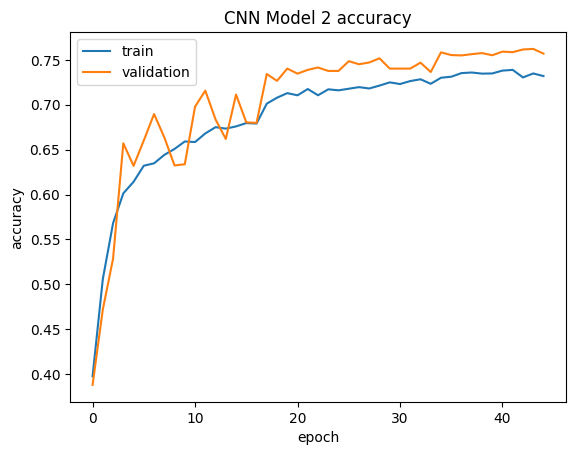

In [29]:
plt.plot(history_2.history["accuracy"])
plt.plot(history_2.history["val_accuracy"])
plt.title("CNN Model 2 accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [30]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_2.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.8125 - loss: 0.4481


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7875 - loss: 0.5252 


Loss: 0.5420138835906982, Accuracy: 0.7890625


### **Plotting Confusion Matrix**



1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 394ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step  


              precision    recall  f1-score   support

       happy       0.81      0.81      0.81        32
     neutral       0.66      0.78      0.71        32
         sad       0.75      0.66      0.70        32
    surprise       0.97      0.91      0.94        32

    accuracy                           0.79       128
   macro avg       0.80      0.79      0.79       128
weighted avg       0.80      0.79      0.79       128



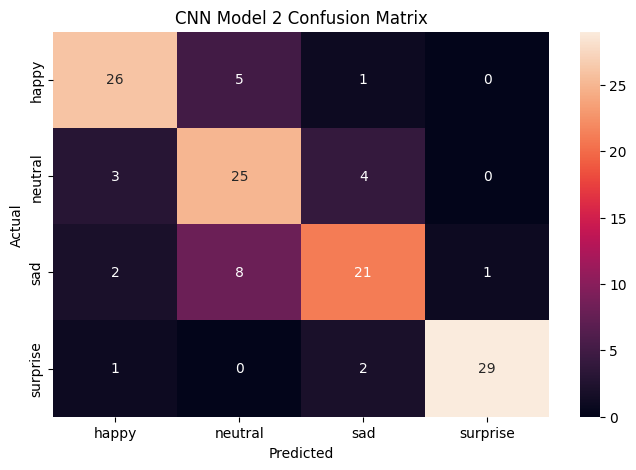

In [31]:
pred_probabilities = model_2.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.title("CNN Model 2 Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The model's **total parameters are 397,860**, which includes **396,772 trainable parameters**.
- Achieved a peak training accuracy of **69.87%** and a validation accuracy peak of **100.00%**, hinting at potential overfitting, but then being stable around 81%.
- Obtained a **76.56%** accuracy on the test set, surpassing the first model's test accuracy.
- Precision and recall improvements are noted in 'neutral' predictions, while 'happy' and 'surprise' maintain strong performance.
- The 'sad' class continues to be challenging for the model, with lower comparative metrics.


## **Think About It:**

- Did the models have a satisfactory performance? If not, then what are the possible reasons?
- Answer: The models had moderate performance, up to 77%, with room for improvement and challenges in distinguishing between certain emotions, particularly 'sad' and 'neutral'.
- Which Color mode showed better overall performance? What are the possible reasons? Do you think having 'rgb' color mode is needed because the images are already black and white?
- Answer: Grayscale mode yielded sufficient performance given the nature of the data, and using 'rgb' color mode for grayscale images did not provide additional benefits as the color information does not contribute to emotion recognition in this context.


## **Transfer Learning Architectures**

In this section, we will create several Transfer Learning architectures. For the pre-trained models, we will select three popular architectures namely, VGG16, ResNet v2, and Efficient Net. The difference between these architectures and the previous architectures is that these will require 3 input channels while the earlier ones worked on 'grayscale' images. Therefore, we need to create new DataLoaders.


### **Creating our Data Loaders for Transfer Learning Architectures**

In this section, we are creating data loaders that we will use as inputs to our Neural Network. We will have to go with color_mode = 'rgb' as this is the required format for the transfer learning architectures.


In [32]:
# Set this to 'rgb' as this is the required format for the transfer learning architectures
color_mode = "rgb"
color_layers = 3
# Using the same size as before for the images
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation for VGG16
train_datagen_vgg16 = ImageDataGenerator(
    preprocessing_function=preprocess_input_vgg16,  # Use model-specific preprocessing
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    brightness_range=(0.5, 1.5),  # Randomly adjust brightness to simulate different lighting conditions
    shear_range=0.3,  # Shear transformations for perspective changes
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
)

# Training Data Augmentation for ResNet
train_datagen_resnet = ImageDataGenerator(
    preprocessing_function=preprocess_input_resnetv2,  # Use model-specific preprocessing
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    brightness_range=(0.5, 1.5),  # Randomly adjust brightness to simulate different lighting conditions
    shear_range=0.3,  # Shear transformations for perspective changes
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
)

# Training Data Augmentation for EfficientNet
train_datagen_efficientnet = ImageDataGenerator(
    preprocessing_function=preprocess_input_efficientnetv2,  # Use model-specific preprocessing
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    brightness_range=(0.5, 1.5),  # Randomly adjust brightness to simulate different lighting conditions
    shear_range=0.3,  # Shear transformations for perspective changes
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
)

# Validation and Testing Data should not be augmented! VGG16 version
validation_datagen_vgg16 = ImageDataGenerator(
    preprocessing_function=preprocess_input_vgg16
)  # Use model-specific preprocessing
test_datagen_vgg16 = ImageDataGenerator(
    preprocessing_function=preprocess_input_vgg16
)  # Use model-specific preprocessing

# Validation and Testing Data should not be augmented! ResNet version
validation_datagen_resnet = ImageDataGenerator(
    preprocessing_function=preprocess_input_resnetv2
)  # Use model-specific preprocessing
test_datagen_resnet = ImageDataGenerator(
    preprocessing_function=preprocess_input_resnetv2
)  # Use model-specific preprocessing

# Validation and Testing Data should not be augmented! Efficient Net version
validation_datagen_efficientnet = ImageDataGenerator(
    preprocessing_function=preprocess_input_efficientnetv2
)  # Use model-specific preprocessing
test_datagen_efficientnet = ImageDataGenerator(
    preprocessing_function=preprocess_input_efficientnetv2
)  # Use model-specific preprocessing


# Creating train_dir, validation_dir, and test_dir with the structure of DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator VGG16
train_generator_vgg16 = train_datagen_vgg16.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Train Generator ResNet
train_generator_resnet = train_datagen_resnet.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Train Generator EfficientNet
train_generator_efficientnet = train_datagen_efficientnet.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Validation Generator VGG16
validation_generator_vgg16 = validation_datagen_vgg16.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Validation Generator ResNet
validation_generator_resnet = validation_datagen_resnet.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Validation Generator EfficientNet
validation_generator_efficientnet = validation_datagen_efficientnet.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Testing Generator VGG16
test_generator_vgg16 = test_datagen_vgg16.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

# Testing Generator ResNet
test_generator_resnet = test_datagen_resnet.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

# Testing Generator EfficientNet
test_generator_efficientnet = test_datagen_efficientnet.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 15109 images belonging to 4 classes.


Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


## **VGG16 Model**


### **Importing the VGG16 Architecture**


In [33]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [34]:
vgg_model = VGG16(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
vgg_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 48, 48, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 48, 48, 64)     │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 48, 48, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 24, 24, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 24, 24, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 12, 12, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 12, 12, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 12, 12, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 6, 6, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 6, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 6, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 3, 3, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 3, 3, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 3, 3, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 1, 1, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

### **Model Building**

- Import VGG16 upto the layer of your choice and add Fully Connected layers on top of it.


In [35]:
# Define a new model that cuts VGG16 at the 'block3_pool' layer
model_output = vgg_model.get_layer("block3_pool").output
cut_model = Model(inputs=vgg_model.input, outputs=model_output)

for layer in vgg_model.layers:
    layer.trainable = False

In [36]:
new_vgg16_model = Sequential()

# Adding the convolutional part of the VGG16 model from above
new_vgg16_model.add(cut_model)

# Reduces each feature map to a single value by averaging all elements
new_vgg16_model.add(GlobalAveragePooling2D())

# Adding full connected layers
new_vgg16_model.add(Dense(512, activation="relu"))
new_vgg16_model.add(Dense(128, activation="relu"))
new_vgg16_model.add(Dense(64))
new_vgg16_model.add(BatchNormalization())
new_vgg16_model.add(ReLU())  # Using ReLU after batch normalization

# Adding output layer
new_vgg16_model.add(Dense(4, activation="softmax"))

# Using RMSprop Optimizer
optimizer = RMSprop(learning_rate=0.001)

### **Compiling and Training the VGG16 Model**


In [37]:
new_vgg16_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_vgg16_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ functional_1 (Functional)       │ ?                      │     1,735,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,735,488 (6.62 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 1,735,488 (6.62 MB)

In [38]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

# Define the saving the best model callback
mc = ModelCheckpoint(
    f"{results_path}/best_model_vgg16_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Fitting the model with 40 epochs and using validation set
history_vgg = new_vgg16_model.fit(
    train_generator_vgg16,
    epochs=40,
    validation_data=validation_generator_vgg16,
    callbacks=[reduce_lr, mc, delayed_early_stopping],
)

Epoch 1/40


/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


I0000 00:00:1712794452.789847 1490572 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1155', 40 bytes spill stores, 40 bytes spill loads

I0000 00:00:1712794452.792128 1490580 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1155', 4 bytes spill stores, 4 bytes spill loads



I0000 00:00:1712794453.017261 1490573 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_473', 8 bytes spill stores, 8 bytes spill loads

I0000 00:00:1712794453.113233 1490576 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_1155', 32 bytes spill stores, 32 bytes spill loads




  1/473 ━━━━━━━━━━━━━━━━━━━━ 21:23 3s/step - accuracy: 0.3750 - loss: 1.4510


  5/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.3528 - loss: 1.4957 


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.3495 - loss: 1.4843


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.3433 - loss: 1.4681


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.3409 - loss: 1.4549


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3435 - loss: 1.4404


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3474 - loss: 1.4274


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3507 - loss: 1.4169


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3548 - loss: 1.4079


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3581 - loss: 1.4001


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3598 - loss: 1.3952


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3618 - loss: 1.3890


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3634 - loss: 1.3837


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3646 - loss: 1.3795


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3658 - loss: 1.3756


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3668 - loss: 1.3719


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3679 - loss: 1.3683


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3691 - loss: 1.3649


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3702 - loss: 1.3616


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3715 - loss: 1.3584


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3728 - loss: 1.3554


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3742 - loss: 1.3525


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3757 - loss: 1.3496


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3771 - loss: 1.3468


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3784 - loss: 1.3442


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3796 - loss: 1.3418


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3806 - loss: 1.3396


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3812 - loss: 1.3382


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3819 - loss: 1.3368


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3829 - loss: 1.3347


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3839 - loss: 1.3326


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3846 - loss: 1.3313


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3856 - loss: 1.3293


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3866 - loss: 1.3274


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3876 - loss: 1.3254


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3887 - loss: 1.3234


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3896 - loss: 1.3215


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3906 - loss: 1.3196


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3915 - loss: 1.3178


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3923 - loss: 1.3161


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3931 - loss: 1.3144


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3939 - loss: 1.3126


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3947 - loss: 1.3109


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3953 - loss: 1.3098


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3961 - loss: 1.3082


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3966 - loss: 1.3071


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3974 - loss: 1.3055


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3979 - loss: 1.3045


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3987 - loss: 1.3030


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3995 - loss: 1.3015


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4002 - loss: 1.3001


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4009 - loss: 1.2987


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4016 - loss: 1.2974


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4023 - loss: 1.2961


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4027 - loss: 1.2952


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4034 - loss: 1.2939


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4040 - loss: 1.2927


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4045 - loss: 1.2918


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4051 - loss: 1.2906


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4057 - loss: 1.2894


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4061 - loss: 1.2886


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4065 - loss: 1.2878


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4071 - loss: 1.2866


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4077 - loss: 1.2855


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4083 - loss: 1.2844


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4088 - loss: 1.2833


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4094 - loss: 1.2823


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4097 - loss: 1.2816


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4103 - loss: 1.2805


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4108 - loss: 1.2795


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4113 - loss: 1.2785


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4118 - loss: 1.2776


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4123 - loss: 1.2767


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4128 - loss: 1.2758


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4133 - loss: 1.2748


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4137 - loss: 1.2739


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4142 - loss: 1.2730


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4147 - loss: 1.2722


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4152 - loss: 1.2713


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4156 - loss: 1.2705


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4161 - loss: 1.2696


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4165 - loss: 1.2688


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4170 - loss: 1.2680


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4175 - loss: 1.2672


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4179 - loss: 1.2664


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4183 - loss: 1.2657


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4188 - loss: 1.2649


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4192 - loss: 1.2641


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4197 - loss: 1.2634


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4201 - loss: 1.2626


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4204 - loss: 1.2621


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4207 - loss: 1.2616


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4211 - loss: 1.2608


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4216 - loss: 1.2601


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4220 - loss: 1.2594


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4224 - loss: 1.2586


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4228 - loss: 1.2579


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4233 - loss: 1.2572


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4237 - loss: 1.2565


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4241 - loss: 1.2558


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4245 - loss: 1.2551


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4250 - loss: 1.2544


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4254 - loss: 1.2537


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4258 - loss: 1.2530


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4262 - loss: 1.2523


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4266 - loss: 1.2517


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4270 - loss: 1.2510


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4274 - loss: 1.2504


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4277 - loss: 1.2497


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4281 - loss: 1.2491


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4285 - loss: 1.2485


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4289 - loss: 1.2478


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4292 - loss: 1.2472


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4296 - loss: 1.2466


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4300 - loss: 1.2460


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4303 - loss: 1.2454


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4307 - loss: 1.2449


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4310 - loss: 1.2443


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4314 - loss: 1.2437


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4317 - loss: 1.2432


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4320 - loss: 1.2426


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4324 - loss: 1.2421


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4327 - loss: 1.2415


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4330 - loss: 1.2410


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4334 - loss: 1.2404


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4337 - loss: 1.2399


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4340 - loss: 1.2394


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4345 - loss: 1.2386


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4348 - loss: 1.2381


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4351 - loss: 1.2376


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4355 - loss: 1.2370


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4358 - loss: 1.2365


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4361 - loss: 1.2360


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4364 - loss: 1.2355


388/473 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.4366 - loss: 1.2353


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.4370 - loss: 1.2346


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.4373 - loss: 1.2341


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.4376 - loss: 1.2336


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.4379 - loss: 1.2331


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.4383 - loss: 1.2326


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4386 - loss: 1.2321


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4389 - loss: 1.2316


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4392 - loss: 1.2311


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4395 - loss: 1.2307


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4398 - loss: 1.2302


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4401 - loss: 1.2297


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4404 - loss: 1.2293


428/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4406 - loss: 1.2288


431/473 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.4409 - loss: 1.2284


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4412 - loss: 1.2279


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4415 - loss: 1.2275


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4418 - loss: 1.2270


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4420 - loss: 1.2266


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4423 - loss: 1.2262


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4426 - loss: 1.2257


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4428 - loss: 1.2253


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4431 - loss: 1.2249


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4434 - loss: 1.2244


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4436 - loss: 1.2240


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4439 - loss: 1.2236


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.4444 - loss: 1.2227


Epoch 1: val_accuracy improved from -inf to 0.44183, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 17s 29ms/step - accuracy: 0.4447 - loss: 1.2222 - val_accuracy: 0.4418 - val_loss: 1.3317 - learning_rate: 0.0010


Epoch 2/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - accuracy: 0.5625 - loss: 0.9790


  3/473 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.5521 - loss: 1.0018  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5509 - loss: 1.0254


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5502 - loss: 1.0342


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5506 - loss: 1.0352 


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5449 - loss: 1.0419


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5405 - loss: 1.0480


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5362 - loss: 1.0554


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5331 - loss: 1.0598 


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5303 - loss: 1.0630


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5280 - loss: 1.0657


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5260 - loss: 1.0684


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5253 - loss: 1.0701


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5253 - loss: 1.0707


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5254 - loss: 1.0714


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5255 - loss: 1.0720


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5253 - loss: 1.0724


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5249 - loss: 1.0733


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5246 - loss: 1.0740


 54/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5244 - loss: 1.0747


 57/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5242 - loss: 1.0752


 60/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5242 - loss: 1.0754


 63/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5243 - loss: 1.0754


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5246 - loss: 1.0753


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5248 - loss: 1.0754


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5248 - loss: 1.0755


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5248 - loss: 1.0757


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5248 - loss: 1.0760


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5246 - loss: 1.0764


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5246 - loss: 1.0767


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5245 - loss: 1.0769


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5245 - loss: 1.0771


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5245 - loss: 1.0773


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5244 - loss: 1.0776


 98/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5243 - loss: 1.0779


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5241 - loss: 1.0782


103/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5238 - loss: 1.0786


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5236 - loss: 1.0790


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5233 - loss: 1.0793


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5230 - loss: 1.0796


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5229 - loss: 1.0798


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5227 - loss: 1.0801


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5226 - loss: 1.0803


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5225 - loss: 1.0805


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5223 - loss: 1.0808


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5222 - loss: 1.0810


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5221 - loss: 1.0812


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5219 - loss: 1.0814


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5218 - loss: 1.0816


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5218 - loss: 1.0817


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5217 - loss: 1.0818


145/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5216 - loss: 1.0820


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5215 - loss: 1.0821


149/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5215 - loss: 1.0821


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5215 - loss: 1.0821


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5215 - loss: 1.0821


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5216 - loss: 1.0821


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5216 - loss: 1.0821


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5216 - loss: 1.0821


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5216 - loss: 1.0822


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5217 - loss: 1.0822


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5217 - loss: 1.0822


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5217 - loss: 1.0822


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5218 - loss: 1.0822


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5218 - loss: 1.0822


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5218 - loss: 1.0822


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5219 - loss: 1.0822


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5219 - loss: 1.0821


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5220 - loss: 1.0821


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5220 - loss: 1.0820


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5221 - loss: 1.0820


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5222 - loss: 1.0819


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5222 - loss: 1.0818


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5223 - loss: 1.0818


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5224 - loss: 1.0817


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5225 - loss: 1.0816


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5226 - loss: 1.0815


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5226 - loss: 1.0815


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5227 - loss: 1.0815


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5228 - loss: 1.0814


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5229 - loss: 1.0814


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5230 - loss: 1.0813


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5231 - loss: 1.0812


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5232 - loss: 1.0812


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5233 - loss: 1.0811


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5235 - loss: 1.0810


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5236 - loss: 1.0809


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5237 - loss: 1.0808


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5238 - loss: 1.0807


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5240 - loss: 1.0806


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5241 - loss: 1.0804


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5242 - loss: 1.0803


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5243 - loss: 1.0802


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5244 - loss: 1.0801


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5245 - loss: 1.0800


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5246 - loss: 1.0799


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5247 - loss: 1.0798


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5248 - loss: 1.0797


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5249 - loss: 1.0796


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5250 - loss: 1.0794


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5252 - loss: 1.0793


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5253 - loss: 1.0792


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5254 - loss: 1.0791


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5255 - loss: 1.0790


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5256 - loss: 1.0789


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5257 - loss: 1.0788


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5258 - loss: 1.0787


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5258 - loss: 1.0787


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5259 - loss: 1.0786


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5260 - loss: 1.0785


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5261 - loss: 1.0785


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5261 - loss: 1.0784


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5262 - loss: 1.0784


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5263 - loss: 1.0783


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5264 - loss: 1.0783


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5265 - loss: 1.0782


332/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5265 - loss: 1.0781


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5266 - loss: 1.0781


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5267 - loss: 1.0780


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5268 - loss: 1.0780


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5269 - loss: 1.0779


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5269 - loss: 1.0779


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5270 - loss: 1.0778


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5271 - loss: 1.0778


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5272 - loss: 1.0777


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5273 - loss: 1.0776


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5273 - loss: 1.0776


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5274 - loss: 1.0775


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5275 - loss: 1.0775


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5276 - loss: 1.0775


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5276 - loss: 1.0774


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5277 - loss: 1.0774


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5278 - loss: 1.0773


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5278 - loss: 1.0773


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5279 - loss: 1.0773


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5279 - loss: 1.0772


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5280 - loss: 1.0772


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5280 - loss: 1.0772


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5281 - loss: 1.0771


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5282 - loss: 1.0771


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5282 - loss: 1.0771


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5283 - loss: 1.0770


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5283 - loss: 1.0770


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5284 - loss: 1.0770


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5284 - loss: 1.0769


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5285 - loss: 1.0769


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5286 - loss: 1.0769


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5286 - loss: 1.0768


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5286 - loss: 1.0768


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5287 - loss: 1.0768


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5288 - loss: 1.0767


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5288 - loss: 1.0767


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5289 - loss: 1.0766


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5290 - loss: 1.0766


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5290 - loss: 1.0765


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5290 - loss: 1.0765


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5291 - loss: 1.0765


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5292 - loss: 1.0764


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5292 - loss: 1.0764


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5293 - loss: 1.0763


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5293 - loss: 1.0763


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5294 - loss: 1.0762


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5295 - loss: 1.0762


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5295 - loss: 1.0761


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5296 - loss: 1.0761


Epoch 2: val_accuracy improved from 0.44183 to 0.46373, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5297 - loss: 1.0759 - val_accuracy: 0.4637 - val_loss: 1.5747 - learning_rate: 0.0010


Epoch 3/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.5938 - loss: 0.9676


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5475 - loss: 0.9984   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5387 - loss: 1.0353


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5375 - loss: 1.0607


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5378 - loss: 1.0657


 14/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5406 - loss: 1.0665


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5435 - loss: 1.0661


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5465 - loss: 1.0624


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5485 - loss: 1.0590


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5498 - loss: 1.0560 


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5503 - loss: 1.0541


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5506 - loss: 1.0532


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5506 - loss: 1.0526


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5502 - loss: 1.0527


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5492 - loss: 1.0533


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5480 - loss: 1.0545


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5468 - loss: 1.0559


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5458 - loss: 1.0569


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5449 - loss: 1.0578


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5441 - loss: 1.0585


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5435 - loss: 1.0591


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5429 - loss: 1.0595


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5427 - loss: 1.0596


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5427 - loss: 1.0596


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5427 - loss: 1.0596


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5427 - loss: 1.0596


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5426 - loss: 1.0596


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5427 - loss: 1.0594


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5428 - loss: 1.0591


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5429 - loss: 1.0589


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5431 - loss: 1.0586


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5432 - loss: 1.0583


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5434 - loss: 1.0580


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5436 - loss: 1.0578


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5437 - loss: 1.0577


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5438 - loss: 1.0575


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5439 - loss: 1.0574


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5439 - loss: 1.0573


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5440 - loss: 1.0572


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5441 - loss: 1.0571


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5441 - loss: 1.0570


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5442 - loss: 1.0569


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5442 - loss: 1.0568


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5443 - loss: 1.0566


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5444 - loss: 1.0564


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5445 - loss: 1.0561


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5446 - loss: 1.0558


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5447 - loss: 1.0555


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5448 - loss: 1.0552


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5449 - loss: 1.0550


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5450 - loss: 1.0547


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0545


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0543


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5452 - loss: 1.0540


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5453 - loss: 1.0538


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5453 - loss: 1.0535


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5454 - loss: 1.0532


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5454 - loss: 1.0530


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5455 - loss: 1.0528


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5455 - loss: 1.0526


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5456 - loss: 1.0524


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5456 - loss: 1.0522


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5457 - loss: 1.0519


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5458 - loss: 1.0517


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5458 - loss: 1.0514


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5459 - loss: 1.0512


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5460 - loss: 1.0510


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5460 - loss: 1.0508


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5461 - loss: 1.0506


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5461 - loss: 1.0504


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5461 - loss: 1.0502


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5462 - loss: 1.0500


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5462 - loss: 1.0498


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5462 - loss: 1.0497


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5463 - loss: 1.0496


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5463 - loss: 1.0494


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5463 - loss: 1.0492


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5464 - loss: 1.0491


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5464 - loss: 1.0489


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5464 - loss: 1.0487


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5465 - loss: 1.0486


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5465 - loss: 1.0484


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5466 - loss: 1.0483


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5466 - loss: 1.0481


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5467 - loss: 1.0479


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5468 - loss: 1.0477


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5469 - loss: 1.0476


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5469 - loss: 1.0474


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5470 - loss: 1.0472


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5471 - loss: 1.0470


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5472 - loss: 1.0469


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5473 - loss: 1.0468


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5473 - loss: 1.0466


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5474 - loss: 1.0465


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5475 - loss: 1.0463


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5476 - loss: 1.0462


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5476 - loss: 1.0460


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5477 - loss: 1.0459


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5478 - loss: 1.0457


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5479 - loss: 1.0456


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5479 - loss: 1.0454


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5480 - loss: 1.0453


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5480 - loss: 1.0452


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5481 - loss: 1.0451


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5482 - loss: 1.0449


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5482 - loss: 1.0448


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5482 - loss: 1.0447


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5483 - loss: 1.0446


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5483 - loss: 1.0445


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5484 - loss: 1.0444


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5484 - loss: 1.0443


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5485 - loss: 1.0442


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5485 - loss: 1.0441


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5486 - loss: 1.0440


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5486 - loss: 1.0439


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5486 - loss: 1.0438


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5487 - loss: 1.0437


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5487 - loss: 1.0437


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5487 - loss: 1.0436


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5487 - loss: 1.0435


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5488 - loss: 1.0435


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5488 - loss: 1.0434


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5488 - loss: 1.0433


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5488 - loss: 1.0433


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5489 - loss: 1.0432


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5489 - loss: 1.0432


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5489 - loss: 1.0431


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5489 - loss: 1.0431


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5489 - loss: 1.0430


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0429


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0429


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0428


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0428


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0427


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5491 - loss: 1.0427


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5491 - loss: 1.0426


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5491 - loss: 1.0425


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5491 - loss: 1.0425


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5492 - loss: 1.0424


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5492 - loss: 1.0423


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5492 - loss: 1.0423


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5492 - loss: 1.0422


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5493 - loss: 1.0422


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5493 - loss: 1.0421


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5493 - loss: 1.0421


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5493 - loss: 1.0420


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5493 - loss: 1.0420


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5493 - loss: 1.0420


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5493 - loss: 1.0419


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5494 - loss: 1.0419


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5494 - loss: 1.0418


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5494 - loss: 1.0418


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5494 - loss: 1.0418


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5494 - loss: 1.0417


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5494 - loss: 1.0417


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5494 - loss: 1.0417


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5495 - loss: 1.0416


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5495 - loss: 1.0416


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5495 - loss: 1.0415


Epoch 3: val_accuracy improved from 0.46373 to 0.56982, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5495 - loss: 1.0414 - val_accuracy: 0.5698 - val_loss: 1.0627 - learning_rate: 0.0010


Epoch 4/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:32 196ms/step - accuracy: 0.7500 - loss: 0.8478


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6732 - loss: 0.9508   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6514 - loss: 0.9625


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6439 - loss: 0.9642


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6401 - loss: 0.9668


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6362 - loss: 0.9706


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6320 - loss: 0.9727


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6287 - loss: 0.9733


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6266 - loss: 0.9720


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6251 - loss: 0.9700


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6230 - loss: 0.9696


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6215 - loss: 0.9696


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6200 - loss: 0.9699


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6179 - loss: 0.9710


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6159 - loss: 0.9724


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6143 - loss: 0.9737


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6129 - loss: 0.9749


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6114 - loss: 0.9761


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6104 - loss: 0.9770


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6090 - loss: 0.9780


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6077 - loss: 0.9791


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6063 - loss: 0.9801


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6049 - loss: 0.9810


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6037 - loss: 0.9819


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6029 - loss: 0.9825


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6021 - loss: 0.9832


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6014 - loss: 0.9837


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6010 - loss: 0.9840


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6005 - loss: 0.9844


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5999 - loss: 0.9849


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5993 - loss: 0.9854


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5986 - loss: 0.9860


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5983 - loss: 0.9863


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5980 - loss: 0.9866


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5975 - loss: 0.9871


 98/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5970 - loss: 0.9876


101/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5966 - loss: 0.9880


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5962 - loss: 0.9885


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5958 - loss: 0.9889


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5955 - loss: 0.9891


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5953 - loss: 0.9894


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5948 - loss: 0.9899


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5944 - loss: 0.9903


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5940 - loss: 0.9907


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5936 - loss: 0.9911


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5933 - loss: 0.9914


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5929 - loss: 0.9917


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5926 - loss: 0.9919


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5923 - loss: 0.9921


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5922 - loss: 0.9922


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5919 - loss: 0.9924


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5917 - loss: 0.9925


145/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5915 - loss: 0.9926


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5913 - loss: 0.9927


150/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5911 - loss: 0.9927


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5910 - loss: 0.9928


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5907 - loss: 0.9930


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5905 - loss: 0.9931


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5902 - loss: 0.9933


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5901 - loss: 0.9934


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5899 - loss: 0.9935


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5896 - loss: 0.9936


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5894 - loss: 0.9937


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5892 - loss: 0.9938


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5891 - loss: 0.9939


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5889 - loss: 0.9940


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5887 - loss: 0.9942


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5886 - loss: 0.9942


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5885 - loss: 0.9943


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5883 - loss: 0.9944


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5882 - loss: 0.9945


195/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5881 - loss: 0.9946


198/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5879 - loss: 0.9947


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5877 - loss: 0.9948


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5875 - loss: 0.9950


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5873 - loss: 0.9951


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5871 - loss: 0.9952


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5869 - loss: 0.9953


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5867 - loss: 0.9955


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5866 - loss: 0.9956


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5864 - loss: 0.9957


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5862 - loss: 0.9958


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5861 - loss: 0.9960


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5859 - loss: 0.9961


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5857 - loss: 0.9962


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5856 - loss: 0.9964


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5854 - loss: 0.9965


242/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5853 - loss: 0.9966


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5852 - loss: 0.9967


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5851 - loss: 0.9968


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5850 - loss: 0.9969


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5849 - loss: 0.9970


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5847 - loss: 0.9971


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5846 - loss: 0.9971


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5845 - loss: 0.9972


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5843 - loss: 0.9973


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5842 - loss: 0.9975


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5840 - loss: 0.9976


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5839 - loss: 0.9977


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5838 - loss: 0.9978


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5836 - loss: 0.9979


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5835 - loss: 0.9981


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5833 - loss: 0.9982


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5832 - loss: 0.9983


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5831 - loss: 0.9984


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5829 - loss: 0.9985


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5828 - loss: 0.9985


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5828 - loss: 0.9986


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5826 - loss: 0.9987


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5825 - loss: 0.9988


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5824 - loss: 0.9989


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5823 - loss: 0.9989


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5821 - loss: 0.9990


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5820 - loss: 0.9991


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5819 - loss: 0.9992


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5818 - loss: 0.9993


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5817 - loss: 0.9994


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5816 - loss: 0.9995


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5815 - loss: 0.9996


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5814 - loss: 0.9997


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5812 - loss: 0.9998


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5811 - loss: 1.0000


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5810 - loss: 1.0001


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5809 - loss: 1.0002


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5808 - loss: 1.0003


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5807 - loss: 1.0004


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5806 - loss: 1.0006


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5805 - loss: 1.0007


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5804 - loss: 1.0008


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5803 - loss: 1.0009


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5802 - loss: 1.0010


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5801 - loss: 1.0012


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5800 - loss: 1.0013


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5799 - loss: 1.0014


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5798 - loss: 1.0016


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5797 - loss: 1.0016


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5796 - loss: 1.0018


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5795 - loss: 1.0019


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5794 - loss: 1.0020


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5793 - loss: 1.0021


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5792 - loss: 1.0023


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5791 - loss: 1.0023


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5791 - loss: 1.0024


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5790 - loss: 1.0026


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 1.0027


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5788 - loss: 1.0028


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 1.0029


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5786 - loss: 1.0031


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 1.0032


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5784 - loss: 1.0033


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5783 - loss: 1.0034


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5782 - loss: 1.0035


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5782 - loss: 1.0037


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5781 - loss: 1.0038


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5780 - loss: 1.0039


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5779 - loss: 1.0040


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5779 - loss: 1.0041


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5778 - loss: 1.0041


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5777 - loss: 1.0042


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5777 - loss: 1.0043


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5776 - loss: 1.0044


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5775 - loss: 1.0045


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5775 - loss: 1.0046


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5774 - loss: 1.0047


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5773 - loss: 1.0047


Epoch 4: val_accuracy did not improve from 0.56982



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5772 - loss: 1.0050 - val_accuracy: 0.4676 - val_loss: 1.1357 - learning_rate: 0.0010


Epoch 5/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:32 197ms/step - accuracy: 0.5000 - loss: 0.9534


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5020 - loss: 1.0413  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5090 - loss: 1.0456 


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5172 - loss: 1.0408


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5256 - loss: 1.0326


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5298 - loss: 1.0310


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5334 - loss: 1.0299


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5367 - loss: 1.0294


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5388 - loss: 1.0303


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5414 - loss: 1.0294


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5434 - loss: 1.0285


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5455 - loss: 1.0274


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5486 - loss: 1.0259


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5510 - loss: 1.0253


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5527 - loss: 1.0254


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5544 - loss: 1.0250


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5560 - loss: 1.0246


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5575 - loss: 1.0246


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5587 - loss: 1.0249


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5596 - loss: 1.0250


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5605 - loss: 1.0251


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5612 - loss: 1.0253


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5617 - loss: 1.0255


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5620 - loss: 1.0256


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5624 - loss: 1.0258


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5627 - loss: 1.0261


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5629 - loss: 1.0263


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5632 - loss: 1.0266


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5636 - loss: 1.0268


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5639 - loss: 1.0268


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5642 - loss: 1.0269


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5645 - loss: 1.0270


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5647 - loss: 1.0271


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5648 - loss: 1.0273


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5649 - loss: 1.0274


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5651 - loss: 1.0275


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5652 - loss: 1.0275


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5653 - loss: 1.0275


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5654 - loss: 1.0275


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5655 - loss: 1.0276


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5656 - loss: 1.0276


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5657 - loss: 1.0276


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5658 - loss: 1.0276


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5658 - loss: 1.0275


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5659 - loss: 1.0275


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5659 - loss: 1.0275


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5660 - loss: 1.0276


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5660 - loss: 1.0277


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5660 - loss: 1.0277


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5661 - loss: 1.0277


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5661 - loss: 1.0278


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5661 - loss: 1.0278


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5662 - loss: 1.0279


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5662 - loss: 1.0279


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5662 - loss: 1.0280


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5663 - loss: 1.0281


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5663 - loss: 1.0282


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5662 - loss: 1.0283


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5662 - loss: 1.0284


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5662 - loss: 1.0285


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5661 - loss: 1.0286


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5661 - loss: 1.0287


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5661 - loss: 1.0288


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5661 - loss: 1.0289


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5661 - loss: 1.0289


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5661 - loss: 1.0290


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5661 - loss: 1.0290


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5661 - loss: 1.0291


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5660 - loss: 1.0291


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5660 - loss: 1.0292


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5660 - loss: 1.0292


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5659 - loss: 1.0293


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5659 - loss: 1.0293


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5658 - loss: 1.0293


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5658 - loss: 1.0294


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5658 - loss: 1.0294


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5657 - loss: 1.0294


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5657 - loss: 1.0294


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5657 - loss: 1.0294


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5657 - loss: 1.0295


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0295


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0295


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0295


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0295


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0295


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0295


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0294


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0294


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0294


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0294


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0294


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0294


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0294


275/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5655 - loss: 1.0293


278/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0293


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0293


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0293


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0292


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0292


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0292


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0291


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0291


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0291


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0290


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0290


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0289


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0289


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0288


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0288


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0288


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0287


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0286


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0286


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0285


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0284


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0284


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0283


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0283


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0282


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0282


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0282


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5652 - loss: 1.0281


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5652 - loss: 1.0281


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5652 - loss: 1.0280


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5652 - loss: 1.0280


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5652 - loss: 1.0279


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5652 - loss: 1.0279


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5653 - loss: 1.0278


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0278


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0278


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0277


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0277


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0276


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0275


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0275


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0274


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0273


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0273


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0272


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0272


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0271


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0271


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0270


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5653 - loss: 1.0270


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5654 - loss: 1.0269


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5654 - loss: 1.0269


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0268


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0268


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0267


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0267


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0266


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0265


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0265


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0264


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0264


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5654 - loss: 1.0263


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5654 - loss: 1.0263


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5655 - loss: 1.0262


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5655 - loss: 1.0262


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5655 - loss: 1.0261


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5655 - loss: 1.0261


Epoch 5: val_accuracy did not improve from 0.56982



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5655 - loss: 1.0259 - val_accuracy: 0.4173 - val_loss: 1.4831 - learning_rate: 0.0010


Epoch 6/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:20 170ms/step - accuracy: 0.4062 - loss: 1.2991


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4688 - loss: 1.1953   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4862 - loss: 1.1581


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5006 - loss: 1.1296


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5092 - loss: 1.1114


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5126 - loss: 1.1042


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5178 - loss: 1.0945


 21/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5219 - loss: 1.0871


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5265 - loss: 1.0800 


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5302 - loss: 1.0736


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5336 - loss: 1.0676


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5364 - loss: 1.0628


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5388 - loss: 1.0585


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5411 - loss: 1.0545


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5432 - loss: 1.0509


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5443 - loss: 1.0492


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5455 - loss: 1.0477


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5471 - loss: 1.0458


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5485 - loss: 1.0440


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5497 - loss: 1.0423


 58/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5508 - loss: 1.0409


 61/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5518 - loss: 1.0396


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5529 - loss: 1.0384


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5539 - loss: 1.0372


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5549 - loss: 1.0360


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5558 - loss: 1.0346


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5567 - loss: 1.0333


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5575 - loss: 1.0321


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5582 - loss: 1.0311


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5588 - loss: 1.0302


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5594 - loss: 1.0294


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5600 - loss: 1.0286


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5606 - loss: 1.0278


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5612 - loss: 1.0271


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5616 - loss: 1.0265


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5621 - loss: 1.0260


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5624 - loss: 1.0255


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5627 - loss: 1.0251


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5629 - loss: 1.0247


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5632 - loss: 1.0244


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5634 - loss: 1.0241


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5636 - loss: 1.0238


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5638 - loss: 1.0235


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5640 - loss: 1.0232


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5642 - loss: 1.0230


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5643 - loss: 1.0227


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5645 - loss: 1.0224


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5647 - loss: 1.0222


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5648 - loss: 1.0220


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5649 - loss: 1.0217


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5651 - loss: 1.0215


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5652 - loss: 1.0213


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5653 - loss: 1.0210


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5654 - loss: 1.0208


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5655 - loss: 1.0206


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5656 - loss: 1.0204


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5657 - loss: 1.0203


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5658 - loss: 1.0201


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5659 - loss: 1.0199


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5660 - loss: 1.0196


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5661 - loss: 1.0193


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5663 - loss: 1.0190


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5664 - loss: 1.0187


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5666 - loss: 1.0184


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5667 - loss: 1.0181


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5668 - loss: 1.0178


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5669 - loss: 1.0175


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5670 - loss: 1.0173


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5671 - loss: 1.0171


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5672 - loss: 1.0169


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5672 - loss: 1.0168


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5673 - loss: 1.0166


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5673 - loss: 1.0164


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5674 - loss: 1.0162


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5674 - loss: 1.0161


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5675 - loss: 1.0159


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5675 - loss: 1.0158


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5676 - loss: 1.0157


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5677 - loss: 1.0155


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5677 - loss: 1.0154


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5677 - loss: 1.0153


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5677 - loss: 1.0151


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5678 - loss: 1.0150


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5678 - loss: 1.0149


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5678 - loss: 1.0148


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5679 - loss: 1.0147


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5679 - loss: 1.0146


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5679 - loss: 1.0145


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5679 - loss: 1.0145


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5679 - loss: 1.0144


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5680 - loss: 1.0144


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5680 - loss: 1.0143


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5680 - loss: 1.0142


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5680 - loss: 1.0142


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5680 - loss: 1.0141


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5680 - loss: 1.0141


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5680 - loss: 1.0140


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0140


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0139


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0139


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0138


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0138


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0138


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0137


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0137


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0136


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5682 - loss: 1.0136


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5682 - loss: 1.0135


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5682 - loss: 1.0135


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5682 - loss: 1.0134


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5682 - loss: 1.0134


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5683 - loss: 1.0133


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5683 - loss: 1.0133


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0132


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0132


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5684 - loss: 1.0131


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5684 - loss: 1.0130


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5684 - loss: 1.0130


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5684 - loss: 1.0129


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5685 - loss: 1.0129


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5685 - loss: 1.0128


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5685 - loss: 1.0128


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5685 - loss: 1.0127


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5686 - loss: 1.0127


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5686 - loss: 1.0127


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5686 - loss: 1.0126


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5686 - loss: 1.0126


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5686 - loss: 1.0125


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5687 - loss: 1.0125


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5687 - loss: 1.0125


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5687 - loss: 1.0124


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5687 - loss: 1.0124


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5687 - loss: 1.0124


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5687 - loss: 1.0124


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0123


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0123


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0123


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0123


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0123


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0122


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0122


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0122


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0122


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0122


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0122


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0123


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5688 - loss: 1.0123


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5688 - loss: 1.0123


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5688 - loss: 1.0123


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5688 - loss: 1.0123


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5688 - loss: 1.0123


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5688 - loss: 1.0123


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5688 - loss: 1.0123


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5689 - loss: 1.0123


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5689 - loss: 1.0123


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5689 - loss: 1.0123


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5689 - loss: 1.0123


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5689 - loss: 1.0123


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5689 - loss: 1.0123


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5689 - loss: 1.0123


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5689 - loss: 1.0123


Epoch 6: val_accuracy did not improve from 0.56982



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5689 - loss: 1.0123 - val_accuracy: 0.5268 - val_loss: 1.0536 - learning_rate: 0.0010


Epoch 7/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - accuracy: 0.5312 - loss: 1.0298


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5111 - loss: 1.0671   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5241 - loss: 1.0474


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5374 - loss: 1.0332


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5456 - loss: 1.0250


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5499 - loss: 1.0199


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5519 - loss: 1.0170


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5560 - loss: 1.0133


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5587 - loss: 1.0106


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5599 - loss: 1.0096


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5607 - loss: 1.0089


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5616 - loss: 1.0080


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5622 - loss: 1.0068


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5627 - loss: 1.0057


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5632 - loss: 1.0046


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5635 - loss: 1.0042


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5638 - loss: 1.0039


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5641 - loss: 1.0038


 50/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5645 - loss: 1.0035


 53/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5645 - loss: 1.0036


 56/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5646 - loss: 1.0037


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5646 - loss: 1.0041


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5647 - loss: 1.0045


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5648 - loss: 1.0046


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5650 - loss: 1.0045


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5651 - loss: 1.0046


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5652 - loss: 1.0046


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5652 - loss: 1.0046


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5651 - loss: 1.0046


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5651 - loss: 1.0046


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5650 - loss: 1.0046


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5650 - loss: 1.0047


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5650 - loss: 1.0048


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5649 - loss: 1.0049


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5649 - loss: 1.0051


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5649 - loss: 1.0052


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5650 - loss: 1.0053


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5650 - loss: 1.0054


105/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5650 - loss: 1.0054


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5650 - loss: 1.0055


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5650 - loss: 1.0055


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5650 - loss: 1.0056


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5650 - loss: 1.0056


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5650 - loss: 1.0056


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5650 - loss: 1.0056


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5650 - loss: 1.0056


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5651 - loss: 1.0055


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5651 - loss: 1.0054


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5652 - loss: 1.0053


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5652 - loss: 1.0053


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5653 - loss: 1.0052


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5654 - loss: 1.0051


145/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5655 - loss: 1.0050


148/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5656 - loss: 1.0049


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5656 - loss: 1.0047


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5657 - loss: 1.0046


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5658 - loss: 1.0046


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5658 - loss: 1.0045


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5659 - loss: 1.0044


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5661 - loss: 1.0043


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5662 - loss: 1.0042


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5663 - loss: 1.0041


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5664 - loss: 1.0040


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5664 - loss: 1.0040


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5665 - loss: 1.0040


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5665 - loss: 1.0040


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5665 - loss: 1.0040


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5666 - loss: 1.0040


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5666 - loss: 1.0040


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5666 - loss: 1.0040


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5666 - loss: 1.0041


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5666 - loss: 1.0041


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5666 - loss: 1.0042


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5667 - loss: 1.0042


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5667 - loss: 1.0042


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5667 - loss: 1.0042


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5668 - loss: 1.0042


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5668 - loss: 1.0042


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5668 - loss: 1.0043


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5669 - loss: 1.0043


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5669 - loss: 1.0043


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5669 - loss: 1.0043


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5670 - loss: 1.0043


235/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5670 - loss: 1.0042


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5671 - loss: 1.0042


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5671 - loss: 1.0042


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5671 - loss: 1.0042


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5672 - loss: 1.0042


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5672 - loss: 1.0042


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5672 - loss: 1.0042


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5673 - loss: 1.0042


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5673 - loss: 1.0041


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5674 - loss: 1.0041


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5674 - loss: 1.0041


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5674 - loss: 1.0041


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5675 - loss: 1.0040


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5676 - loss: 1.0040


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5676 - loss: 1.0039


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5677 - loss: 1.0039


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5677 - loss: 1.0038


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5678 - loss: 1.0038


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5678 - loss: 1.0037


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5679 - loss: 1.0037


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5679 - loss: 1.0037


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5679 - loss: 1.0037


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5679 - loss: 1.0037


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5679 - loss: 1.0037


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5679 - loss: 1.0037


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0037


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0036


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0036


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0036


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0036


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0036


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0036


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0036


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0037


332/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0037


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0037


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5679 - loss: 1.0037


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5679 - loss: 1.0037


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5679 - loss: 1.0037


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0038


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0038


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0038


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0038


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0038


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0038


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0038


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0039


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0039


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0039


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0039


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0039


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0040


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0040


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0040


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0040


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0040


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0040


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0040


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0041


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0041


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0041


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0041


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0041


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0041


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5679 - loss: 1.0041


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5679 - loss: 1.0042


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5679 - loss: 1.0042


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5679 - loss: 1.0042


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5679 - loss: 1.0042


Epoch 7: val_accuracy did not improve from 0.56982



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5679 - loss: 1.0042 - val_accuracy: 0.4266 - val_loss: 1.3867 - learning_rate: 0.0010


Epoch 8/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - accuracy: 0.6562 - loss: 0.9789


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6530 - loss: 0.9758   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6320 - loss: 0.9878


  9/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6263 - loss: 0.9901


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6179 - loss: 0.9954


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6087 - loss: 0.9991


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6019 - loss: 1.0019


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5968 - loss: 1.0023


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5930 - loss: 1.0016


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5907 - loss: 1.0007


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5892 - loss: 0.9992


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5877 - loss: 0.9982


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5865 - loss: 0.9979


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5854 - loss: 0.9977


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5848 - loss: 0.9969


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5842 - loss: 0.9966


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5837 - loss: 0.9964


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5832 - loss: 0.9964


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5830 - loss: 0.9961


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5829 - loss: 0.9957


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5829 - loss: 0.9953


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5829 - loss: 0.9951


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5829 - loss: 0.9947


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5827 - loss: 0.9945


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5823 - loss: 0.9946


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5821 - loss: 0.9947


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5817 - loss: 0.9950


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5814 - loss: 0.9951


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5811 - loss: 0.9953


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5808 - loss: 0.9955


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5806 - loss: 0.9956


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5804 - loss: 0.9957


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5803 - loss: 0.9958


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5801 - loss: 0.9957


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5799 - loss: 0.9957


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5798 - loss: 0.9956


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5798 - loss: 0.9954


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5798 - loss: 0.9952


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5798 - loss: 0.9950


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5798 - loss: 0.9947


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5798 - loss: 0.9945


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5798 - loss: 0.9943


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5798 - loss: 0.9941


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5798 - loss: 0.9939


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5798 - loss: 0.9937


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5798 - loss: 0.9935


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5798 - loss: 0.9933


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5798 - loss: 0.9931


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5798 - loss: 0.9930


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5798 - loss: 0.9928


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9927


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9926


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9925


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9923


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5799 - loss: 0.9922


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5799 - loss: 0.9921


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5799 - loss: 0.9920


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5799 - loss: 0.9919


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9919


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9918


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9918


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9918


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 0.9917


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5797 - loss: 0.9917


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5797 - loss: 0.9917


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5797 - loss: 0.9917


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5797 - loss: 0.9917


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5797 - loss: 0.9917


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5796 - loss: 0.9917


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5796 - loss: 0.9917


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5796 - loss: 0.9918


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5796 - loss: 0.9918


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5795 - loss: 0.9919


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5795 - loss: 0.9919


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5794 - loss: 0.9920


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5794 - loss: 0.9921


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5793 - loss: 0.9921


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5793 - loss: 0.9922


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5792 - loss: 0.9923


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5792 - loss: 0.9924


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5791 - loss: 0.9925


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5791 - loss: 0.9925


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5790 - loss: 0.9926


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5790 - loss: 0.9927


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5789 - loss: 0.9928


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5789 - loss: 0.9929


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5788 - loss: 0.9929


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5788 - loss: 0.9930


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5787 - loss: 0.9931


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5787 - loss: 0.9931


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5786 - loss: 0.9932


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5785 - loss: 0.9933


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5785 - loss: 0.9933


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5784 - loss: 0.9934


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5784 - loss: 0.9935


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5783 - loss: 0.9936


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5783 - loss: 0.9936


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5782 - loss: 0.9937


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5782 - loss: 0.9938


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5781 - loss: 0.9939


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5781 - loss: 0.9939


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5780 - loss: 0.9940


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5780 - loss: 0.9941


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5780 - loss: 0.9942


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5779 - loss: 0.9943


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5779 - loss: 0.9943


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5779 - loss: 0.9944


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5778 - loss: 0.9945


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5778 - loss: 0.9946


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5778 - loss: 0.9946


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5778 - loss: 0.9947


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5777 - loss: 0.9947


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5777 - loss: 0.9948


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5777 - loss: 0.9949


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5776 - loss: 0.9949


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5776 - loss: 0.9950


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5776 - loss: 0.9950


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5775 - loss: 0.9951


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5775 - loss: 0.9952


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5775 - loss: 0.9952


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5775 - loss: 0.9953


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5774 - loss: 0.9953


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5774 - loss: 0.9953


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5774 - loss: 0.9954


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5774 - loss: 0.9954


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5774 - loss: 0.9954


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5773 - loss: 0.9955


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5773 - loss: 0.9955


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5773 - loss: 0.9956


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5772 - loss: 0.9956


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5772 - loss: 0.9956


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5772 - loss: 0.9957


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5771 - loss: 0.9957


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5771 - loss: 0.9957


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5771 - loss: 0.9957


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5770 - loss: 0.9958


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5770 - loss: 0.9958


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5770 - loss: 0.9958


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5770 - loss: 0.9959


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5769 - loss: 0.9959


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5769 - loss: 0.9959


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5769 - loss: 0.9959


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5769 - loss: 0.9960


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5768 - loss: 0.9960


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5768 - loss: 0.9960


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5768 - loss: 0.9960


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5768 - loss: 0.9961


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5768 - loss: 0.9961


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5767 - loss: 0.9961


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5767 - loss: 0.9961


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5767 - loss: 0.9961


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5767 - loss: 0.9961


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5767 - loss: 0.9961


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5767 - loss: 0.9962


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5766 - loss: 0.9962


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5766 - loss: 0.9962


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5766 - loss: 0.9962


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5766 - loss: 0.9962


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5766 - loss: 0.9962


Epoch 8: val_accuracy did not improve from 0.56982



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5765 - loss: 0.9963 - val_accuracy: 0.4535 - val_loss: 1.2874 - learning_rate: 0.0010


Epoch 9/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - accuracy: 0.5938 - loss: 0.8266


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5866 - loss: 0.8793   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5740 - loss: 0.9336


  9/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5718 - loss: 0.9489


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5729 - loss: 0.9609


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5765 - loss: 0.9611


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5774 - loss: 0.9639


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5772 - loss: 0.9670


 22/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5776 - loss: 0.9692


 24/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5778 - loss: 0.9714


 27/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5777 - loss: 0.9756


 30/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5781 - loss: 0.9787


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5790 - loss: 0.9805 


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5794 - loss: 0.9823


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5798 - loss: 0.9828


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5807 - loss: 0.9831


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5815 - loss: 0.9831


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5821 - loss: 0.9830


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5830 - loss: 0.9828


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5838 - loss: 0.9827


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5844 - loss: 0.9826


 58/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5849 - loss: 0.9824


 61/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5854 - loss: 0.9825


 64/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5856 - loss: 0.9827


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5858 - loss: 0.9830


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5859 - loss: 0.9835


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5860 - loss: 0.9837


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5861 - loss: 0.9837


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5861 - loss: 0.9839


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5860 - loss: 0.9841


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5860 - loss: 0.9844


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5860 - loss: 0.9846


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5859 - loss: 0.9847


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5859 - loss: 0.9849


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5860 - loss: 0.9849


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5860 - loss: 0.9848


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5860 - loss: 0.9848


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5860 - loss: 0.9848


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5859 - loss: 0.9849


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5858 - loss: 0.9849


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5858 - loss: 0.9848


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5857 - loss: 0.9848


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5857 - loss: 0.9847


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5856 - loss: 0.9847


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5856 - loss: 0.9847


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5855 - loss: 0.9846


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5855 - loss: 0.9846


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5854 - loss: 0.9846


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5854 - loss: 0.9846


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5853 - loss: 0.9846


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5853 - loss: 0.9845


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9845


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9844


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9844


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9843


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9842


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9842


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9842


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9841


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9841


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9841


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9841


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9841


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9841


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9841


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9841


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5851 - loss: 0.9842


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5851 - loss: 0.9842


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5850 - loss: 0.9842


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5850 - loss: 0.9843


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5849 - loss: 0.9844


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5848 - loss: 0.9845


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5848 - loss: 0.9845


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5847 - loss: 0.9846


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5846 - loss: 0.9847


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5845 - loss: 0.9848


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5844 - loss: 0.9850


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5843 - loss: 0.9851


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5843 - loss: 0.9852


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5841 - loss: 0.9853


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5841 - loss: 0.9853


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5840 - loss: 0.9854


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5839 - loss: 0.9855


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5838 - loss: 0.9857


237/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5837 - loss: 0.9857


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5836 - loss: 0.9858


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5835 - loss: 0.9859


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5834 - loss: 0.9860


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5833 - loss: 0.9861


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5832 - loss: 0.9861


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5831 - loss: 0.9862


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5830 - loss: 0.9863


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5829 - loss: 0.9864


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5829 - loss: 0.9865


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5828 - loss: 0.9865


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5827 - loss: 0.9866


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5826 - loss: 0.9867


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5825 - loss: 0.9868


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5824 - loss: 0.9869


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5823 - loss: 0.9869


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5823 - loss: 0.9870


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5822 - loss: 0.9871


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5821 - loss: 0.9871


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5821 - loss: 0.9872


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5820 - loss: 0.9873


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5819 - loss: 0.9874


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5818 - loss: 0.9874


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5818 - loss: 0.9875


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5817 - loss: 0.9876


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5816 - loss: 0.9877


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5815 - loss: 0.9877


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5815 - loss: 0.9878


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5814 - loss: 0.9879


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5813 - loss: 0.9879


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5813 - loss: 0.9880


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5812 - loss: 0.9880


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5812 - loss: 0.9881


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5811 - loss: 0.9881


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5811 - loss: 0.9881


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5810 - loss: 0.9882


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5810 - loss: 0.9882


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5809 - loss: 0.9882


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5809 - loss: 0.9883


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5809 - loss: 0.9883


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5808 - loss: 0.9883


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5808 - loss: 0.9883


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5808 - loss: 0.9883


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5808 - loss: 0.9884


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5807 - loss: 0.9884


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5807 - loss: 0.9884


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5807 - loss: 0.9885


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5806 - loss: 0.9885


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5806 - loss: 0.9886


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5805 - loss: 0.9886


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5805 - loss: 0.9887


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5804 - loss: 0.9887


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5804 - loss: 0.9888


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5804 - loss: 0.9888


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5803 - loss: 0.9888


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5803 - loss: 0.9888


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5803 - loss: 0.9889


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5802 - loss: 0.9889


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5802 - loss: 0.9889


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5802 - loss: 0.9890


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5801 - loss: 0.9890


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5801 - loss: 0.9890


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5801 - loss: 0.9890


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5800 - loss: 0.9891


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5800 - loss: 0.9891


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5800 - loss: 0.9891


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5800 - loss: 0.9891


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5800 - loss: 0.9891


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5799 - loss: 0.9892


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5799 - loss: 0.9892


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5799 - loss: 0.9892


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5798 - loss: 0.9892


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5798 - loss: 0.9893


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5797 - loss: 0.9893


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5797 - loss: 0.9893


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5797 - loss: 0.9894


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5796 - loss: 0.9894


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5796 - loss: 0.9894


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5796 - loss: 0.9894


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5795 - loss: 0.9895


Epoch 9: val_accuracy did not improve from 0.56982



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5795 - loss: 0.9895 - val_accuracy: 0.5329 - val_loss: 1.4058 - learning_rate: 0.0010


Epoch 10/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - accuracy: 0.6562 - loss: 0.8816


  3/473 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - accuracy: 0.6372 - loss: 0.8518  


  5/473 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.6017 - loss: 0.8977


  8/473 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.5844 - loss: 0.9205


 11/473 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.5775 - loss: 0.9351


 14/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5759 - loss: 0.9412


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5759 - loss: 0.9437


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5769 - loss: 0.9452


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5784 - loss: 0.9455


 26/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5789 - loss: 0.9474


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5786 - loss: 0.9499 


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5780 - loss: 0.9527


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5768 - loss: 0.9556


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5758 - loss: 0.9577


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5753 - loss: 0.9598


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5748 - loss: 0.9621


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5747 - loss: 0.9635


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5746 - loss: 0.9646


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5746 - loss: 0.9662


 54/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5747 - loss: 0.9674


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5746 - loss: 0.9686


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5746 - loss: 0.9694


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5747 - loss: 0.9700


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5749 - loss: 0.9704


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5753 - loss: 0.9707


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5756 - loss: 0.9712


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5758 - loss: 0.9716


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5760 - loss: 0.9721


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5762 - loss: 0.9725


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5763 - loss: 0.9728


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5764 - loss: 0.9732


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5766 - loss: 0.9738


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5767 - loss: 0.9744


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5769 - loss: 0.9748


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5770 - loss: 0.9754


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5772 - loss: 0.9760


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5773 - loss: 0.9766


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5775 - loss: 0.9769


106/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5776 - loss: 0.9771


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5779 - loss: 0.9774


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5781 - loss: 0.9777


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5784 - loss: 0.9780


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5786 - loss: 0.9783


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5788 - loss: 0.9786


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5790 - loss: 0.9788


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5792 - loss: 0.9790


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5794 - loss: 0.9791


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5797 - loss: 0.9793


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5798 - loss: 0.9794


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5800 - loss: 0.9795


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5803 - loss: 0.9797


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5805 - loss: 0.9798


145/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5807 - loss: 0.9799


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5808 - loss: 0.9799


149/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5809 - loss: 0.9800


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5812 - loss: 0.9802


155/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5814 - loss: 0.9803


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5816 - loss: 0.9803


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5818 - loss: 0.9804


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5820 - loss: 0.9805


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5822 - loss: 0.9806


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5823 - loss: 0.9807


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5825 - loss: 0.9809


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5826 - loss: 0.9810


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5827 - loss: 0.9811


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5828 - loss: 0.9812


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5830 - loss: 0.9813


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5831 - loss: 0.9815


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5832 - loss: 0.9815


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5833 - loss: 0.9816


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5834 - loss: 0.9817


196/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5835 - loss: 0.9818


199/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5836 - loss: 0.9818


201/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5837 - loss: 0.9819


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5838 - loss: 0.9820


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5839 - loss: 0.9820


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5839 - loss: 0.9821


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5840 - loss: 0.9822


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5841 - loss: 0.9822


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5842 - loss: 0.9823


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5842 - loss: 0.9824


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5843 - loss: 0.9824


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5844 - loss: 0.9825


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5844 - loss: 0.9825


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5845 - loss: 0.9825


237/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5846 - loss: 0.9826


240/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5846 - loss: 0.9826


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5847 - loss: 0.9825


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5848 - loss: 0.9825


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5849 - loss: 0.9825


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5849 - loss: 0.9824


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5850 - loss: 0.9824


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5851 - loss: 0.9824


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5852 - loss: 0.9823


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5853 - loss: 0.9823


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5853 - loss: 0.9822


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5854 - loss: 0.9822


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5855 - loss: 0.9822


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5855 - loss: 0.9822


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5856 - loss: 0.9821


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5856 - loss: 0.9821


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5857 - loss: 0.9821


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5858 - loss: 0.9820


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5858 - loss: 0.9820


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5859 - loss: 0.9819


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5859 - loss: 0.9819


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5860 - loss: 0.9819


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5860 - loss: 0.9818


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5861 - loss: 0.9818


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5861 - loss: 0.9818


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5862 - loss: 0.9817


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5862 - loss: 0.9817


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5862 - loss: 0.9816


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5863 - loss: 0.9816


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5863 - loss: 0.9816


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5864 - loss: 0.9816


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5864 - loss: 0.9816


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5864 - loss: 0.9815


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5864 - loss: 0.9815


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5865 - loss: 0.9815


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5865 - loss: 0.9814


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5865 - loss: 0.9814


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5866 - loss: 0.9814


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5866 - loss: 0.9814


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5866 - loss: 0.9813


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5866 - loss: 0.9813


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5867 - loss: 0.9813


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5867 - loss: 0.9813


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5867 - loss: 0.9813


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5867 - loss: 0.9813


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5867 - loss: 0.9812


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5867 - loss: 0.9812


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5868 - loss: 0.9812


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5868 - loss: 0.9812


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5868 - loss: 0.9812


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5868 - loss: 0.9812


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5868 - loss: 0.9812


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5868 - loss: 0.9811


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5869 - loss: 0.9811


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5870 - loss: 0.9811


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5870 - loss: 0.9811


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5870 - loss: 0.9811


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5870 - loss: 0.9811


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5870 - loss: 0.9811


Epoch 10: val_accuracy improved from 0.56982 to 0.58409, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5870 - loss: 0.9811 - val_accuracy: 0.5841 - val_loss: 0.9809 - learning_rate: 0.0010


Epoch 11/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:24 179ms/step - accuracy: 0.6562 - loss: 0.9803


  3/473 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - accuracy: 0.5747 - loss: 1.0041  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.5576 - loss: 0.9964


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5543 - loss: 1.0013


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5581 - loss: 0.9964 


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5634 - loss: 0.9933


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5660 - loss: 0.9935


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5685 - loss: 0.9942


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5712 - loss: 0.9938


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5738 - loss: 0.9926


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5756 - loss: 0.9913


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5768 - loss: 0.9901


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5776 - loss: 0.9895


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5783 - loss: 0.9891


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5789 - loss: 0.9889


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5794 - loss: 0.9891


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5795 - loss: 0.9897


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5795 - loss: 0.9902


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5796 - loss: 0.9904


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5797 - loss: 0.9905


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5797 - loss: 0.9905


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5799 - loss: 0.9902


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5798 - loss: 0.9900


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5797 - loss: 0.9899


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5796 - loss: 0.9896


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5796 - loss: 0.9894


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5794 - loss: 0.9894


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5792 - loss: 0.9894


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5791 - loss: 0.9895


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5789 - loss: 0.9896


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5787 - loss: 0.9897


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5785 - loss: 0.9898


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5784 - loss: 0.9898


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5783 - loss: 0.9899


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5782 - loss: 0.9899


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5781 - loss: 0.9899


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5781 - loss: 0.9898


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5781 - loss: 0.9898


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 0.9898


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 0.9897


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 0.9897


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 0.9896


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 0.9896


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 0.9896


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9896


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9895


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9895


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9894


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9893


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9892


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9892


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9891


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9890


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5781 - loss: 0.9889


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9889


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9889


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9889


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9889


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9889


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9888


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9888


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9888


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9888


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9888


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5782 - loss: 0.9888


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5783 - loss: 0.9887


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5783 - loss: 0.9887


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5783 - loss: 0.9887


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5784 - loss: 0.9886


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5784 - loss: 0.9886


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5785 - loss: 0.9885


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5785 - loss: 0.9885


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5785 - loss: 0.9884


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5785 - loss: 0.9884


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5786 - loss: 0.9883


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5786 - loss: 0.9883


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5786 - loss: 0.9883


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5786 - loss: 0.9883


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9882


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9882


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9881


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5788 - loss: 0.9881


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5788 - loss: 0.9881


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5788 - loss: 0.9880


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9880


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9880


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9880


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9879


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9879


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9879


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9879


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9879


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9879


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9878


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9878


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9878


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9877


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 0.9877


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 0.9877


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 0.9877


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 0.9877


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 0.9877


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 0.9877


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 0.9877


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 0.9877


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5787 - loss: 0.9877


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5787 - loss: 0.9877


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5787 - loss: 0.9877


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5787 - loss: 0.9877


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5787 - loss: 0.9877


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5787 - loss: 0.9878


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9878


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9878


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9878


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9878


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9878


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9878


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9878


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9879


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9879


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9879


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9879


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9879


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5786 - loss: 0.9879


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5785 - loss: 0.9879


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9879


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9879


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9879


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9880


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5784 - loss: 0.9881


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5784 - loss: 0.9881


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5784 - loss: 0.9881


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 0.9881


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 0.9881


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 0.9881


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 0.9881


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9881


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9880


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 0.9880


Epoch 11: val_accuracy did not improve from 0.58409



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5783 - loss: 0.9880 - val_accuracy: 0.4774 - val_loss: 1.3026 - learning_rate: 0.0010


Epoch 12/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - accuracy: 0.5938 - loss: 0.8676


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5658 - loss: 0.9366   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5664 - loss: 0.9493


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5676 - loss: 0.9588


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5697 - loss: 0.9601


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5759 - loss: 0.9555


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5785 - loss: 0.9549


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5784 - loss: 0.9572 


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5772 - loss: 0.9614


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5761 - loss: 0.9651


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5758 - loss: 0.9681


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5756 - loss: 0.9697


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5752 - loss: 0.9719


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5748 - loss: 0.9739


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5745 - loss: 0.9757


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5744 - loss: 0.9768


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5745 - loss: 0.9781


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5746 - loss: 0.9790


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5745 - loss: 0.9802


 54/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5743 - loss: 0.9815


 57/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5741 - loss: 0.9829


 59/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5739 - loss: 0.9838


 61/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5738 - loss: 0.9847


 64/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5737 - loss: 0.9857


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5738 - loss: 0.9864


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5738 - loss: 0.9871


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5739 - loss: 0.9878


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5739 - loss: 0.9884


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5739 - loss: 0.9887


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5739 - loss: 0.9891


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5740 - loss: 0.9895


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5741 - loss: 0.9898


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5741 - loss: 0.9900


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5742 - loss: 0.9902


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5744 - loss: 0.9902


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5746 - loss: 0.9902


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5748 - loss: 0.9902


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5751 - loss: 0.9901


104/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5752 - loss: 0.9900


107/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5754 - loss: 0.9898


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5757 - loss: 0.9896


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5760 - loss: 0.9894


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5761 - loss: 0.9892


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5763 - loss: 0.9890


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5766 - loss: 0.9889


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5768 - loss: 0.9887


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5770 - loss: 0.9886


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5771 - loss: 0.9886


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5773 - loss: 0.9886


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5774 - loss: 0.9885


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5775 - loss: 0.9885


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5777 - loss: 0.9885


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5778 - loss: 0.9885


146/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5779 - loss: 0.9885


149/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5780 - loss: 0.9886


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5780 - loss: 0.9886


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5780 - loss: 0.9887


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5780 - loss: 0.9888


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5780 - loss: 0.9889


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5780 - loss: 0.9890


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5780 - loss: 0.9890


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5781 - loss: 0.9890


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9891


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9891


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9892


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9892


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9893


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9894


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9895


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9895


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5781 - loss: 0.9896


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5781 - loss: 0.9896


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5781 - loss: 0.9897


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9898


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9898


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9899


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9899


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5779 - loss: 0.9899


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5779 - loss: 0.9899


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9899


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9899


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9898


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5780 - loss: 0.9898


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5781 - loss: 0.9897


235/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5781 - loss: 0.9897


237/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5781 - loss: 0.9896


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5781 - loss: 0.9896


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5781 - loss: 0.9895


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 0.9895


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 0.9894


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 0.9894


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5782 - loss: 0.9894


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5782 - loss: 0.9894


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5782 - loss: 0.9893


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5783 - loss: 0.9893


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5783 - loss: 0.9892


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5783 - loss: 0.9892


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5783 - loss: 0.9892


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5783 - loss: 0.9891


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5783 - loss: 0.9891


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5784 - loss: 0.9891


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5784 - loss: 0.9891


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5784 - loss: 0.9890


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5784 - loss: 0.9890


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9890


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9889


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9889


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9889


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9889


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9889


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9889


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9889


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9888


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9888


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5784 - loss: 0.9888


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5785 - loss: 0.9888


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5785 - loss: 0.9888


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5785 - loss: 0.9887


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5785 - loss: 0.9887


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5785 - loss: 0.9887


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5786 - loss: 0.9887


334/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5786 - loss: 0.9886


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5786 - loss: 0.9886


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5786 - loss: 0.9886


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5787 - loss: 0.9885


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5787 - loss: 0.9885


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5787 - loss: 0.9885


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5788 - loss: 0.9884


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5788 - loss: 0.9883


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5789 - loss: 0.9883


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5789 - loss: 0.9882


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5789 - loss: 0.9882


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5790 - loss: 0.9881


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5790 - loss: 0.9881


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5790 - loss: 0.9880


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5790 - loss: 0.9880


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5791 - loss: 0.9880


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5791 - loss: 0.9879


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5791 - loss: 0.9879


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5792 - loss: 0.9879


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5792 - loss: 0.9878


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5792 - loss: 0.9878


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5793 - loss: 0.9878


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5793 - loss: 0.9877


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5793 - loss: 0.9877


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5794 - loss: 0.9876


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5794 - loss: 0.9876


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5794 - loss: 0.9875


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5795 - loss: 0.9875


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5795 - loss: 0.9874


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5795 - loss: 0.9874


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5796 - loss: 0.9873


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5796 - loss: 0.9873


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5796 - loss: 0.9873


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5797 - loss: 0.9872


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5797 - loss: 0.9872


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5797 - loss: 0.9872


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5798 - loss: 0.9871


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5798 - loss: 0.9871


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5798 - loss: 0.9871


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5798 - loss: 0.9870


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5799 - loss: 0.9870


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5799 - loss: 0.9869


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5799 - loss: 0.9869


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5800 - loss: 0.9869


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5800 - loss: 0.9868


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5800 - loss: 0.9868


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5800 - loss: 0.9868


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5801 - loss: 0.9867


Epoch 12: val_accuracy did not improve from 0.58409



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5802 - loss: 0.9866 - val_accuracy: 0.5525 - val_loss: 1.1757 - learning_rate: 0.0010


Epoch 13/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:24 179ms/step - accuracy: 0.5938 - loss: 0.9203


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5677 - loss: 0.9651   


  6/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5554 - loss: 0.9847


  8/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5524 - loss: 0.9887


 11/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5526 - loss: 0.9916


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5528 - loss: 0.9950


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5535 - loss: 0.9971


 19/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5537 - loss: 0.9981


 21/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5543 - loss: 0.9991


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5554 - loss: 0.9993


 26/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5569 - loss: 1.0002


 29/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5588 - loss: 0.9997


 32/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5606 - loss: 0.9986


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5621 - loss: 0.9974 


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5633 - loss: 0.9965


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5644 - loss: 0.9959


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5656 - loss: 0.9956


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5666 - loss: 0.9954


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5673 - loss: 0.9952


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5682 - loss: 0.9949


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5692 - loss: 0.9944


 57/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5698 - loss: 0.9942


 59/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5703 - loss: 0.9939


 62/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5712 - loss: 0.9931


 64/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5717 - loss: 0.9927


 66/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5720 - loss: 0.9923


 68/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5723 - loss: 0.9920


 70/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5726 - loss: 0.9916


 73/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5729 - loss: 0.9911


 76/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5732 - loss: 0.9906


 78/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5735 - loss: 0.9903


 81/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5737 - loss: 0.9899


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5741 - loss: 0.9895


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5742 - loss: 0.9893


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5744 - loss: 0.9891


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5746 - loss: 0.9889


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5748 - loss: 0.9886


 97/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5750 - loss: 0.9883


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5751 - loss: 0.9883


103/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5753 - loss: 0.9882


105/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5753 - loss: 0.9881


108/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5754 - loss: 0.9881


111/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5755 - loss: 0.9880


114/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5756 - loss: 0.9879


117/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.5757 - loss: 0.9878


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.5758 - loss: 0.9877


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.5759 - loss: 0.9876


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5760 - loss: 0.9876


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5760 - loss: 0.9876


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5760 - loss: 0.9876


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5761 - loss: 0.9876


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5761 - loss: 0.9875


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5762 - loss: 0.9873


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5763 - loss: 0.9873


146/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5764 - loss: 0.9872


149/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5765 - loss: 0.9871


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5767 - loss: 0.9870


155/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5768 - loss: 0.9869


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5769 - loss: 0.9868


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5771 - loss: 0.9867


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5772 - loss: 0.9866


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5773 - loss: 0.9865


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5774 - loss: 0.9865


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5774 - loss: 0.9865


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5775 - loss: 0.9864


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5776 - loss: 0.9864


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5776 - loss: 0.9864


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5777 - loss: 0.9864


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5777 - loss: 0.9864


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5778 - loss: 0.9864


192/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5778 - loss: 0.9864


195/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5779 - loss: 0.9863


198/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5780 - loss: 0.9863


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5780 - loss: 0.9863


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5781 - loss: 0.9863


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5781 - loss: 0.9862


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5782 - loss: 0.9862


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5782 - loss: 0.9861


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5783 - loss: 0.9861


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5783 - loss: 0.9861


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5784 - loss: 0.9861


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5784 - loss: 0.9860


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5785 - loss: 0.9860


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5785 - loss: 0.9860


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5786 - loss: 0.9860


235/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5786 - loss: 0.9859


238/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5786 - loss: 0.9859


241/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5787 - loss: 0.9858


243/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5787 - loss: 0.9858


245/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5787 - loss: 0.9857


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5788 - loss: 0.9857


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5788 - loss: 0.9856


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5789 - loss: 0.9855


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5789 - loss: 0.9855


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5790 - loss: 0.9854


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5790 - loss: 0.9853


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5791 - loss: 0.9852


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5791 - loss: 0.9851


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5791 - loss: 0.9850


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5792 - loss: 0.9850


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5792 - loss: 0.9849


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5793 - loss: 0.9848


284/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5793 - loss: 0.9847


286/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5793 - loss: 0.9847


289/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5794 - loss: 0.9846


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5794 - loss: 0.9845


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5794 - loss: 0.9845


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5795 - loss: 0.9844


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5795 - loss: 0.9844


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5796 - loss: 0.9843


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5796 - loss: 0.9843


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5797 - loss: 0.9842


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5797 - loss: 0.9842


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5797 - loss: 0.9841


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5798 - loss: 0.9841


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5798 - loss: 0.9841


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5798 - loss: 0.9840


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5799 - loss: 0.9839


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5799 - loss: 0.9839


332/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5800 - loss: 0.9838


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5800 - loss: 0.9837


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5801 - loss: 0.9837


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5801 - loss: 0.9837


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5801 - loss: 0.9836


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5802 - loss: 0.9836


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5802 - loss: 0.9835


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5803 - loss: 0.9834


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5803 - loss: 0.9834


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5803 - loss: 0.9833


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5804 - loss: 0.9833


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5804 - loss: 0.9832


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5804 - loss: 0.9832


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5805 - loss: 0.9831


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5805 - loss: 0.9831


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5805 - loss: 0.9831


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5806 - loss: 0.9830


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5806 - loss: 0.9830


380/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5806 - loss: 0.9829


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5806 - loss: 0.9829


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5807 - loss: 0.9828


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5807 - loss: 0.9828


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5807 - loss: 0.9827


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5808 - loss: 0.9827


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5808 - loss: 0.9826


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5808 - loss: 0.9825


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5808 - loss: 0.9825


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5809 - loss: 0.9824


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5809 - loss: 0.9824


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5809 - loss: 0.9823


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5810 - loss: 0.9822


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5810 - loss: 0.9822


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5810 - loss: 0.9821


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5810 - loss: 0.9821


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5811 - loss: 0.9820


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5811 - loss: 0.9819


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5811 - loss: 0.9819


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5812 - loss: 0.9818


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5812 - loss: 0.9818


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5812 - loss: 0.9817


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5813 - loss: 0.9816


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5813 - loss: 0.9816


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5813 - loss: 0.9815


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5814 - loss: 0.9815


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5814 - loss: 0.9814


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5814 - loss: 0.9814


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5814 - loss: 0.9814


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5814 - loss: 0.9813


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5815 - loss: 0.9813


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5815 - loss: 0.9813


Epoch 13: val_accuracy did not improve from 0.58409



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5815 - loss: 0.9812 - val_accuracy: 0.3514 - val_loss: 1.7125 - learning_rate: 0.0010


Epoch 14/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - accuracy: 0.5000 - loss: 1.4017


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5254 - loss: 1.2209   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5338 - loss: 1.1648


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.5320 - loss: 1.1506


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5291 - loss: 1.1376


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5318 - loss: 1.1239


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5331 - loss: 1.1142 


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5341 - loss: 1.1056


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5364 - loss: 1.0957


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5383 - loss: 1.0867


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5400 - loss: 1.0786


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5412 - loss: 1.0722


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5423 - loss: 1.0667


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5432 - loss: 1.0621


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5439 - loss: 1.0580


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5451 - loss: 1.0541


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5463 - loss: 1.0504


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5475 - loss: 1.0470


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5488 - loss: 1.0438


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5499 - loss: 1.0412


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5511 - loss: 1.0387


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5522 - loss: 1.0366


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5530 - loss: 1.0348


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5539 - loss: 1.0330


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5547 - loss: 1.0315


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5555 - loss: 1.0299


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5563 - loss: 1.0283


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5568 - loss: 1.0273


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5575 - loss: 1.0259


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5583 - loss: 1.0245


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5590 - loss: 1.0231


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5596 - loss: 1.0219


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5599 - loss: 1.0212


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5604 - loss: 1.0202


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5608 - loss: 1.0193


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5610 - loss: 1.0186


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5614 - loss: 1.0177


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5618 - loss: 1.0168


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5622 - loss: 1.0159


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5627 - loss: 1.0151


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5631 - loss: 1.0143


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5633 - loss: 1.0138


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5636 - loss: 1.0130


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5639 - loss: 1.0123


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5643 - loss: 1.0115


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5645 - loss: 1.0111


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5648 - loss: 1.0103


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5651 - loss: 1.0097


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5653 - loss: 1.0092


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5656 - loss: 1.0086


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5659 - loss: 1.0080


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5661 - loss: 1.0075


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5663 - loss: 1.0072


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5664 - loss: 1.0068


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5667 - loss: 1.0063


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5670 - loss: 1.0057


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5673 - loss: 1.0051


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5675 - loss: 1.0047


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5676 - loss: 1.0044


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5679 - loss: 1.0038


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5681 - loss: 1.0034


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5683 - loss: 1.0030


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5685 - loss: 1.0025


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5688 - loss: 1.0018


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5691 - loss: 1.0012


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5693 - loss: 1.0007


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5696 - loss: 1.0001


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5698 - loss: 0.9996


192/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5700 - loss: 0.9991


195/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5703 - loss: 0.9986


197/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5704 - loss: 0.9983


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5707 - loss: 0.9978


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5709 - loss: 0.9974


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5711 - loss: 0.9969


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5713 - loss: 0.9965


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5715 - loss: 0.9961


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5717 - loss: 0.9957


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5720 - loss: 0.9953


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5721 - loss: 0.9950


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5723 - loss: 0.9946


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5725 - loss: 0.9942


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5727 - loss: 0.9939


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5729 - loss: 0.9935


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5731 - loss: 0.9931


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5733 - loss: 0.9928


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5735 - loss: 0.9925


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5737 - loss: 0.9921


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5738 - loss: 0.9919


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5740 - loss: 0.9916


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5742 - loss: 0.9913


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5743 - loss: 0.9910


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5745 - loss: 0.9907


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5747 - loss: 0.9905


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5748 - loss: 0.9902


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9899


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5751 - loss: 0.9897


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5752 - loss: 0.9895


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5754 - loss: 0.9892


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5755 - loss: 0.9890


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5757 - loss: 0.9888


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5758 - loss: 0.9886


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5760 - loss: 0.9884


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5761 - loss: 0.9882


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5762 - loss: 0.9880


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5763 - loss: 0.9879


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5764 - loss: 0.9878


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5765 - loss: 0.9877


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5766 - loss: 0.9875


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5767 - loss: 0.9874


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5768 - loss: 0.9873


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5768 - loss: 0.9872


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5769 - loss: 0.9871


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5770 - loss: 0.9870


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5771 - loss: 0.9868


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5771 - loss: 0.9867


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5772 - loss: 0.9866


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5773 - loss: 0.9865


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5774 - loss: 0.9864


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5774 - loss: 0.9863


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5775 - loss: 0.9862


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5776 - loss: 0.9860


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5776 - loss: 0.9859


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5777 - loss: 0.9858


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5778 - loss: 0.9857


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5779 - loss: 0.9856


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5779 - loss: 0.9855


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5780 - loss: 0.9854


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5781 - loss: 0.9853


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5782 - loss: 0.9852


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5782 - loss: 0.9851


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5783 - loss: 0.9850


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5783 - loss: 0.9850


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5784 - loss: 0.9849


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5784 - loss: 0.9848


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9847


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 0.9846


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5786 - loss: 0.9846


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5786 - loss: 0.9845


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 0.9845


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 0.9844


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 0.9844


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 0.9843


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5788 - loss: 0.9843


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5788 - loss: 0.9842


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5788 - loss: 0.9842


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 0.9841


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 0.9841


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 0.9840


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 0.9840


426/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5790 - loss: 0.9839


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5790 - loss: 0.9839


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5790 - loss: 0.9838


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5790 - loss: 0.9838


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5791 - loss: 0.9837


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5791 - loss: 0.9837


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5791 - loss: 0.9836


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5791 - loss: 0.9836


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5792 - loss: 0.9836


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5792 - loss: 0.9835


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5792 - loss: 0.9835


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5792 - loss: 0.9835


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5793 - loss: 0.9834


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5793 - loss: 0.9834


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5793 - loss: 0.9833


Epoch 14: val_accuracy did not improve from 0.58409



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5793 - loss: 0.9833 - val_accuracy: 0.5754 - val_loss: 0.9672 - learning_rate: 0.0010


Epoch 15/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - accuracy: 0.6250 - loss: 0.8782


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6445 - loss: 0.8743   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6353 - loss: 0.9044


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6343 - loss: 0.9076


 11/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.6337 - loss: 0.9085


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6295 - loss: 0.9135


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6273 - loss: 0.9151


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6244 - loss: 0.9172 


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6222 - loss: 0.9200


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6197 - loss: 0.9239


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6177 - loss: 0.9273


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6161 - loss: 0.9298


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6144 - loss: 0.9316


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6130 - loss: 0.9333


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6125 - loss: 0.9341


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6117 - loss: 0.9351


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6110 - loss: 0.9362


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6104 - loss: 0.9370


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6098 - loss: 0.9377


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6091 - loss: 0.9386


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6084 - loss: 0.9396


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6076 - loss: 0.9407


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6069 - loss: 0.9416


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6062 - loss: 0.9426


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6056 - loss: 0.9434


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6051 - loss: 0.9442


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6046 - loss: 0.9450


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6042 - loss: 0.9458


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6038 - loss: 0.9464


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6034 - loss: 0.9470


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6032 - loss: 0.9474


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6029 - loss: 0.9479


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6026 - loss: 0.9482


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6022 - loss: 0.9487


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6019 - loss: 0.9492


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6015 - loss: 0.9495


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6012 - loss: 0.9499


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6010 - loss: 0.9501


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6007 - loss: 0.9505


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6004 - loss: 0.9508


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6002 - loss: 0.9510


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6001 - loss: 0.9511


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5998 - loss: 0.9513


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5997 - loss: 0.9514


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5994 - loss: 0.9516


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5993 - loss: 0.9518


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5991 - loss: 0.9521


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5989 - loss: 0.9523


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5986 - loss: 0.9526


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5984 - loss: 0.9529


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5982 - loss: 0.9531


145/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5980 - loss: 0.9533


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5977 - loss: 0.9535


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5975 - loss: 0.9538


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5973 - loss: 0.9541


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5970 - loss: 0.9543


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5969 - loss: 0.9545


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5967 - loss: 0.9547


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5966 - loss: 0.9550


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5964 - loss: 0.9551


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5963 - loss: 0.9554


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5961 - loss: 0.9556


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5960 - loss: 0.9558


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5959 - loss: 0.9560


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5958 - loss: 0.9562


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5956 - loss: 0.9565


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5955 - loss: 0.9567


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5954 - loss: 0.9569


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5952 - loss: 0.9571


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5951 - loss: 0.9573


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5949 - loss: 0.9576


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5948 - loss: 0.9577


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5947 - loss: 0.9579


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5946 - loss: 0.9581


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5945 - loss: 0.9582


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5945 - loss: 0.9583


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5944 - loss: 0.9585


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5943 - loss: 0.9586


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5943 - loss: 0.9586


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5943 - loss: 0.9587


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5942 - loss: 0.9588


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5942 - loss: 0.9589


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5942 - loss: 0.9589


237/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5941 - loss: 0.9590


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5941 - loss: 0.9591


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5941 - loss: 0.9591


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5941 - loss: 0.9592


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5941 - loss: 0.9592


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5940 - loss: 0.9593


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5940 - loss: 0.9593


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5940 - loss: 0.9594


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5940 - loss: 0.9594


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5940 - loss: 0.9595


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5940 - loss: 0.9595


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5940 - loss: 0.9596


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5939 - loss: 0.9596


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5939 - loss: 0.9597


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5939 - loss: 0.9598


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5938 - loss: 0.9599


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5938 - loss: 0.9600


284/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5937 - loss: 0.9601


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5937 - loss: 0.9602


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5937 - loss: 0.9603


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5936 - loss: 0.9603


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5936 - loss: 0.9604


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5935 - loss: 0.9605


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5935 - loss: 0.9606


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5934 - loss: 0.9606


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5934 - loss: 0.9607


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5934 - loss: 0.9608


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5933 - loss: 0.9608


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5933 - loss: 0.9609


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5932 - loss: 0.9610


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5932 - loss: 0.9611


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5931 - loss: 0.9612


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5931 - loss: 0.9612


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5931 - loss: 0.9613


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5930 - loss: 0.9614


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5930 - loss: 0.9615


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5930 - loss: 0.9615


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5929 - loss: 0.9616


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5929 - loss: 0.9616


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5929 - loss: 0.9617


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5928 - loss: 0.9618


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5928 - loss: 0.9618


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5928 - loss: 0.9619


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5928 - loss: 0.9619


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5928 - loss: 0.9620


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5927 - loss: 0.9621


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5927 - loss: 0.9621


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5927 - loss: 0.9622


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5927 - loss: 0.9622


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5927 - loss: 0.9623


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5927 - loss: 0.9624


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5926 - loss: 0.9624


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5926 - loss: 0.9625


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5926 - loss: 0.9625


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5926 - loss: 0.9626


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5926 - loss: 0.9626


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5926 - loss: 0.9627


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5926 - loss: 0.9627


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5925 - loss: 0.9628


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5925 - loss: 0.9628


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5925 - loss: 0.9629


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5925 - loss: 0.9629


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5925 - loss: 0.9630


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5925 - loss: 0.9630


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5925 - loss: 0.9631


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5925 - loss: 0.9631


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5925 - loss: 0.9632


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5925 - loss: 0.9632


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5925 - loss: 0.9632


426/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5925 - loss: 0.9633


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5925 - loss: 0.9633


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9633


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9634


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9634


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9634


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9635


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9635


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9636


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9636


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5924 - loss: 0.9637


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5923 - loss: 0.9637


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5923 - loss: 0.9638


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5923 - loss: 0.9638


Epoch 15: val_accuracy improved from 0.58409 to 0.61141, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5923 - loss: 0.9639 - val_accuracy: 0.6114 - val_loss: 0.9456 - learning_rate: 0.0010


Epoch 16/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - accuracy: 0.5000 - loss: 1.1445


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5397 - loss: 1.0482   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5481 - loss: 1.0312


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5579 - loss: 1.0155


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5652 - loss: 1.0022


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5697 - loss: 0.9918


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5733 - loss: 0.9849


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5767 - loss: 0.9794


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5788 - loss: 0.9752


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5798 - loss: 0.9728


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5804 - loss: 0.9721


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5807 - loss: 0.9722


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5807 - loss: 0.9725


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5804 - loss: 0.9731


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5800 - loss: 0.9737


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5796 - loss: 0.9745


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5793 - loss: 0.9753


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5793 - loss: 0.9760


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5793 - loss: 0.9768


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5795 - loss: 0.9772


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5797 - loss: 0.9776


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5800 - loss: 0.9777


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5802 - loss: 0.9778


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5805 - loss: 0.9776


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5808 - loss: 0.9775


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5809 - loss: 0.9774


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5813 - loss: 0.9772


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5817 - loss: 0.9771


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5820 - loss: 0.9771


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5824 - loss: 0.9769


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5826 - loss: 0.9769


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5828 - loss: 0.9768


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5831 - loss: 0.9766


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5833 - loss: 0.9763


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5836 - loss: 0.9761


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5838 - loss: 0.9758


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5840 - loss: 0.9756


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5842 - loss: 0.9753


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5845 - loss: 0.9750


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5846 - loss: 0.9748


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5848 - loss: 0.9746


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5850 - loss: 0.9743


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5852 - loss: 0.9741


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5854 - loss: 0.9739


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5855 - loss: 0.9737


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5856 - loss: 0.9735


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5858 - loss: 0.9733


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5859 - loss: 0.9732


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5861 - loss: 0.9729


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5862 - loss: 0.9727


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5864 - loss: 0.9725


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5865 - loss: 0.9724


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5866 - loss: 0.9722


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5868 - loss: 0.9720


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5869 - loss: 0.9719


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5871 - loss: 0.9717


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5872 - loss: 0.9716


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5873 - loss: 0.9716


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5873 - loss: 0.9715


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5874 - loss: 0.9715


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5874 - loss: 0.9715


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5875 - loss: 0.9715


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5875 - loss: 0.9715


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5875 - loss: 0.9715


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5875 - loss: 0.9715


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5875 - loss: 0.9715


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5876 - loss: 0.9715


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5876 - loss: 0.9715


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5876 - loss: 0.9715


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5876 - loss: 0.9715


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5876 - loss: 0.9715


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5877 - loss: 0.9715


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5877 - loss: 0.9715


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5877 - loss: 0.9715


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5877 - loss: 0.9715


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5877 - loss: 0.9715


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5877 - loss: 0.9715


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9715


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5876 - loss: 0.9715


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5876 - loss: 0.9715


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5876 - loss: 0.9715


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9714


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9714


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9714


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9714


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9713


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9713


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9714


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5877 - loss: 0.9714


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5876 - loss: 0.9714


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5876 - loss: 0.9714


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5876 - loss: 0.9715


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5876 - loss: 0.9715


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5876 - loss: 0.9715


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5876 - loss: 0.9715


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5876 - loss: 0.9715


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5876 - loss: 0.9715


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5876 - loss: 0.9715


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9715


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9715


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9715


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9715


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9715


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9715


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9715


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9714


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9714


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9714


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5875 - loss: 0.9714


324/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5875 - loss: 0.9713


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5875 - loss: 0.9713


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5875 - loss: 0.9713


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5875 - loss: 0.9713


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5876 - loss: 0.9713


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5876 - loss: 0.9713


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5876 - loss: 0.9712


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5876 - loss: 0.9712


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5876 - loss: 0.9712


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5876 - loss: 0.9711


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9711


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9711


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9710


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9710


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9710


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9710


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9710


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9710


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5877 - loss: 0.9710


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5877 - loss: 0.9710


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5877 - loss: 0.9710


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9710


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9709


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9708


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5878 - loss: 0.9708


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5879 - loss: 0.9708


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5879 - loss: 0.9708


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5879 - loss: 0.9708


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5879 - loss: 0.9707


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9707


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9708


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5879 - loss: 0.9708


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5878 - loss: 0.9708


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5878 - loss: 0.9708


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5878 - loss: 0.9709


Epoch 16: val_accuracy did not improve from 0.61141



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5877 - loss: 0.9710 - val_accuracy: 0.6108 - val_loss: 0.9286 - learning_rate: 0.0010


Epoch 17/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - accuracy: 0.7500 - loss: 0.8049


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6921 - loss: 0.8329   


  6/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6791 - loss: 0.8501


  9/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6700 - loss: 0.8632 


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6632 - loss: 0.8720


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6576 - loss: 0.8791


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6558 - loss: 0.8823


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6539 - loss: 0.8852 


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6515 - loss: 0.8879


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6487 - loss: 0.8905


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6457 - loss: 0.8937


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6433 - loss: 0.8962


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6419 - loss: 0.8979


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6406 - loss: 0.8999


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6382 - loss: 0.9035


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6355 - loss: 0.9074


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6333 - loss: 0.9106


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6313 - loss: 0.9136


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6295 - loss: 0.9163


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6276 - loss: 0.9189


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6257 - loss: 0.9214


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6242 - loss: 0.9236


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6227 - loss: 0.9257


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6218 - loss: 0.9269


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6206 - loss: 0.9287


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6199 - loss: 0.9297


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6190 - loss: 0.9309


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6182 - loss: 0.9319


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6176 - loss: 0.9327


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6170 - loss: 0.9335


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6165 - loss: 0.9342


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6160 - loss: 0.9350


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6154 - loss: 0.9359


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6149 - loss: 0.9366


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6144 - loss: 0.9373


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6139 - loss: 0.9379


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6135 - loss: 0.9385


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6131 - loss: 0.9390


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6127 - loss: 0.9394


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6124 - loss: 0.9399


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6120 - loss: 0.9404


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6115 - loss: 0.9411


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6111 - loss: 0.9417


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6106 - loss: 0.9424


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6102 - loss: 0.9430


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6098 - loss: 0.9436


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6094 - loss: 0.9442


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6090 - loss: 0.9447


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6087 - loss: 0.9451


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6084 - loss: 0.9457


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6080 - loss: 0.9463


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6076 - loss: 0.9468


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6071 - loss: 0.9475


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6067 - loss: 0.9481


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6065 - loss: 0.9484


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6061 - loss: 0.9490


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6058 - loss: 0.9495


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6055 - loss: 0.9500


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6051 - loss: 0.9505


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6049 - loss: 0.9509


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6046 - loss: 0.9514


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6044 - loss: 0.9518


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6041 - loss: 0.9521


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6039 - loss: 0.9525


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6037 - loss: 0.9528


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6035 - loss: 0.9531


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6032 - loss: 0.9534


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6031 - loss: 0.9536


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6029 - loss: 0.9539


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6028 - loss: 0.9541


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6026 - loss: 0.9543


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6025 - loss: 0.9545


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6024 - loss: 0.9547


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6023 - loss: 0.9549


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6021 - loss: 0.9551


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6020 - loss: 0.9553


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6019 - loss: 0.9555


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6017 - loss: 0.9557


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6016 - loss: 0.9558


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6016 - loss: 0.9559


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6014 - loss: 0.9561


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6013 - loss: 0.9563


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6012 - loss: 0.9564


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6011 - loss: 0.9565


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6011 - loss: 0.9566


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6010 - loss: 0.9567


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6009 - loss: 0.9568


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6008 - loss: 0.9570


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6007 - loss: 0.9571


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6006 - loss: 0.9572


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6005 - loss: 0.9573


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6004 - loss: 0.9574


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6003 - loss: 0.9575


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6002 - loss: 0.9576


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6001 - loss: 0.9577


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6000 - loss: 0.9578


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5999 - loss: 0.9579


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5998 - loss: 0.9581


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5997 - loss: 0.9582


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5997 - loss: 0.9583


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5996 - loss: 0.9584


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5995 - loss: 0.9585


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5994 - loss: 0.9585


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5993 - loss: 0.9587


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5992 - loss: 0.9588


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5991 - loss: 0.9589


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5990 - loss: 0.9591


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5989 - loss: 0.9592


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5988 - loss: 0.9593


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5987 - loss: 0.9595


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5986 - loss: 0.9596


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5985 - loss: 0.9597


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5985 - loss: 0.9599


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5984 - loss: 0.9600


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5983 - loss: 0.9601


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5982 - loss: 0.9602


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5981 - loss: 0.9603


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5980 - loss: 0.9604


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5979 - loss: 0.9605


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5979 - loss: 0.9606


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5978 - loss: 0.9607


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5977 - loss: 0.9608


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5976 - loss: 0.9608


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5976 - loss: 0.9609


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5975 - loss: 0.9610


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5975 - loss: 0.9610


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5974 - loss: 0.9611


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5973 - loss: 0.9612


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5973 - loss: 0.9612


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5972 - loss: 0.9613


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5972 - loss: 0.9614


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5971 - loss: 0.9614


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5970 - loss: 0.9615


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5970 - loss: 0.9616


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5969 - loss: 0.9617


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5969 - loss: 0.9617


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5968 - loss: 0.9618


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5968 - loss: 0.9618


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5967 - loss: 0.9619


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5966 - loss: 0.9620


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5966 - loss: 0.9621


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5965 - loss: 0.9622


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5964 - loss: 0.9622


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5964 - loss: 0.9623


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5963 - loss: 0.9624


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5963 - loss: 0.9625


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5962 - loss: 0.9625


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5961 - loss: 0.9626


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5961 - loss: 0.9627


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5960 - loss: 0.9627


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5960 - loss: 0.9628


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5959 - loss: 0.9629


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5958 - loss: 0.9629


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5958 - loss: 0.9630


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5957 - loss: 0.9631


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5957 - loss: 0.9631


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5956 - loss: 0.9632


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5956 - loss: 0.9632


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5955 - loss: 0.9633


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5955 - loss: 0.9633


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5954 - loss: 0.9634


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5954 - loss: 0.9634


Epoch 17: val_accuracy did not improve from 0.61141



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5952 - loss: 0.9635 - val_accuracy: 0.5632 - val_loss: 0.9927 - learning_rate: 0.0010


Epoch 18/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:24 179ms/step - accuracy: 0.6562 - loss: 0.7410


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6328 - loss: 0.8021   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6234 - loss: 0.8275


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6181 - loss: 0.8490


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6150 - loss: 0.8608


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6121 - loss: 0.8710


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6078 - loss: 0.8840 


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6050 - loss: 0.8917


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6018 - loss: 0.8999


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6002 - loss: 0.9049


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5992 - loss: 0.9087


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5979 - loss: 0.9147


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5974 - loss: 0.9176


 36/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5972 - loss: 0.9200


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5966 - loss: 0.9231 


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5962 - loss: 0.9261


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5961 - loss: 0.9283


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5958 - loss: 0.9301


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5955 - loss: 0.9318


 53/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5952 - loss: 0.9328


 56/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5949 - loss: 0.9343


 59/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5945 - loss: 0.9360


 62/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5941 - loss: 0.9375


 64/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5938 - loss: 0.9386


 66/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5935 - loss: 0.9396


 69/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5929 - loss: 0.9411


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5925 - loss: 0.9424


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5922 - loss: 0.9435


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5921 - loss: 0.9443


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5921 - loss: 0.9450


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5920 - loss: 0.9454


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5919 - loss: 0.9459


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5917 - loss: 0.9466


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5916 - loss: 0.9474


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5915 - loss: 0.9480


 97/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5914 - loss: 0.9486


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5914 - loss: 0.9491


103/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5913 - loss: 0.9497


106/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5912 - loss: 0.9502


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5912 - loss: 0.9507


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5912 - loss: 0.9512


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5911 - loss: 0.9516


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5911 - loss: 0.9521


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5910 - loss: 0.9525


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5910 - loss: 0.9528


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5910 - loss: 0.9531


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5910 - loss: 0.9534


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5911 - loss: 0.9537


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5911 - loss: 0.9538


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5911 - loss: 0.9541


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5912 - loss: 0.9543


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5913 - loss: 0.9544


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5914 - loss: 0.9544


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5915 - loss: 0.9545


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5916 - loss: 0.9546


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5917 - loss: 0.9547


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5918 - loss: 0.9548


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5919 - loss: 0.9550


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5919 - loss: 0.9551


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5920 - loss: 0.9553


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5920 - loss: 0.9555


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5921 - loss: 0.9557


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5921 - loss: 0.9558


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5921 - loss: 0.9560


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5921 - loss: 0.9561


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5921 - loss: 0.9562


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5921 - loss: 0.9563


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5922 - loss: 0.9565


192/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5922 - loss: 0.9565


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5922 - loss: 0.9567


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5922 - loss: 0.9568


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5922 - loss: 0.9569


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5922 - loss: 0.9570


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5922 - loss: 0.9571


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5922 - loss: 0.9572


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5923 - loss: 0.9573


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5923 - loss: 0.9574


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5923 - loss: 0.9575


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5923 - loss: 0.9576


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5923 - loss: 0.9577


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5923 - loss: 0.9579


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5924 - loss: 0.9580


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5924 - loss: 0.9580


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5924 - loss: 0.9581


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5924 - loss: 0.9582


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5925 - loss: 0.9583


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5925 - loss: 0.9584


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5925 - loss: 0.9585


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5926 - loss: 0.9585


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5926 - loss: 0.9586


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5926 - loss: 0.9587


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5926 - loss: 0.9587


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9588


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9589


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9590


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9591


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9592


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9593


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9595


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5927 - loss: 0.9596


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5926 - loss: 0.9597


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5926 - loss: 0.9597


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5926 - loss: 0.9598


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5926 - loss: 0.9599


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5926 - loss: 0.9600


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5926 - loss: 0.9601


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5926 - loss: 0.9602


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9602


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9603


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9604


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9604


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9605


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9605


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9606


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9606


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9606


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5925 - loss: 0.9607


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5925 - loss: 0.9607


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5925 - loss: 0.9608


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5925 - loss: 0.9608


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5925 - loss: 0.9609


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5925 - loss: 0.9609


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5924 - loss: 0.9610


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5924 - loss: 0.9611


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5924 - loss: 0.9611


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5924 - loss: 0.9612


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5924 - loss: 0.9612


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5923 - loss: 0.9613


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5923 - loss: 0.9613


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5923 - loss: 0.9614


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5923 - loss: 0.9615


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5923 - loss: 0.9615


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5923 - loss: 0.9616


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5923 - loss: 0.9616


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5922 - loss: 0.9617


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5922 - loss: 0.9618


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5922 - loss: 0.9618


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5922 - loss: 0.9618


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5922 - loss: 0.9619


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5922 - loss: 0.9619


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5922 - loss: 0.9619


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5921 - loss: 0.9620


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5921 - loss: 0.9621


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5921 - loss: 0.9621


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5921 - loss: 0.9622


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5921 - loss: 0.9622


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5921 - loss: 0.9622


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5921 - loss: 0.9623


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5920 - loss: 0.9623


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5920 - loss: 0.9624


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5920 - loss: 0.9624


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5920 - loss: 0.9624


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5920 - loss: 0.9625


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5920 - loss: 0.9625


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5920 - loss: 0.9626


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9626


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9626


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9627


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9627


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9627


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9627


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9628


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9628


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9628


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9628


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5919 - loss: 0.9628


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5918 - loss: 0.9629


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5918 - loss: 0.9629


Epoch 18: val_accuracy did not improve from 0.61141



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5918 - loss: 0.9629 - val_accuracy: 0.5572 - val_loss: 1.0739 - learning_rate: 0.0010


Epoch 19/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - accuracy: 0.6250 - loss: 0.8319


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6178 - loss: 0.9040   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6025 - loss: 0.9162


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5960 - loss: 0.9319


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5919 - loss: 0.9398


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5905 - loss: 0.9414


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5907 - loss: 0.9416


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5912 - loss: 0.9411


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5917 - loss: 0.9403


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5922 - loss: 0.9396


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5927 - loss: 0.9393


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5931 - loss: 0.9401


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5929 - loss: 0.9414


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5926 - loss: 0.9430


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5924 - loss: 0.9445


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5921 - loss: 0.9457


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5918 - loss: 0.9467


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5916 - loss: 0.9475


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5912 - loss: 0.9485


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5907 - loss: 0.9495


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5902 - loss: 0.9504


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5897 - loss: 0.9512


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5894 - loss: 0.9518


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5891 - loss: 0.9523


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5889 - loss: 0.9528


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5886 - loss: 0.9533


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5882 - loss: 0.9539


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5878 - loss: 0.9545


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5876 - loss: 0.9550


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5874 - loss: 0.9553


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5872 - loss: 0.9556


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5871 - loss: 0.9560


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5870 - loss: 0.9562


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5870 - loss: 0.9565


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5870 - loss: 0.9567


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5870 - loss: 0.9568


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5871 - loss: 0.9570


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5871 - loss: 0.9572


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5872 - loss: 0.9573


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5873 - loss: 0.9575


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5874 - loss: 0.9577


124/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5875 - loss: 0.9578


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5877 - loss: 0.9579


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5877 - loss: 0.9579


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5879 - loss: 0.9580


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5880 - loss: 0.9581


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5881 - loss: 0.9582


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5881 - loss: 0.9583


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9584


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9585


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9586


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9587


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9588


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9589


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9589


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9591


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9591


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5882 - loss: 0.9593


174/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5882 - loss: 0.9594


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5882 - loss: 0.9595


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5881 - loss: 0.9597


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5881 - loss: 0.9599


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5881 - loss: 0.9600


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5880 - loss: 0.9602


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5880 - loss: 0.9603


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5880 - loss: 0.9604


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5880 - loss: 0.9605


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9606


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9607


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9608


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9608


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9609


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9610


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9610


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5879 - loss: 0.9611


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5879 - loss: 0.9612


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5879 - loss: 0.9612


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5879 - loss: 0.9613


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5879 - loss: 0.9613


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5879 - loss: 0.9614


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5879 - loss: 0.9614


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5879 - loss: 0.9614


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5880 - loss: 0.9615


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5880 - loss: 0.9615


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5880 - loss: 0.9615


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5880 - loss: 0.9615


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5880 - loss: 0.9615


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5880 - loss: 0.9615


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5880 - loss: 0.9615


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5881 - loss: 0.9615


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5881 - loss: 0.9615


273/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5881 - loss: 0.9615


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5881 - loss: 0.9615


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5881 - loss: 0.9615


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5882 - loss: 0.9615


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5882 - loss: 0.9615


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5882 - loss: 0.9615


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5882 - loss: 0.9615


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5882 - loss: 0.9615


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5883 - loss: 0.9615


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5883 - loss: 0.9615


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5883 - loss: 0.9616


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5883 - loss: 0.9616


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5883 - loss: 0.9616


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5883 - loss: 0.9617


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5884 - loss: 0.9617


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5884 - loss: 0.9617


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5884 - loss: 0.9617


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5884 - loss: 0.9618


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9618


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9618


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9618


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9618


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9619


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9619


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9619


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9619


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9619


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9619


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9619


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9620


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9620


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9620


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9621


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9621


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9621


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5885 - loss: 0.9622


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5885 - loss: 0.9622


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5885 - loss: 0.9622


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5885 - loss: 0.9622


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9623


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9623


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9623


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9624


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9624


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9624


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9624


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9625


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9625


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9625


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9626


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9626


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9626


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9627


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5886 - loss: 0.9627


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9627


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9627


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9628


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9628


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9628


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9629


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9629


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9629


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5886 - loss: 0.9630


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5887 - loss: 0.9630


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5887 - loss: 0.9630


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5887 - loss: 0.9631


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5887 - loss: 0.9631


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5887 - loss: 0.9631


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5887 - loss: 0.9631


Epoch 19: val_accuracy did not improve from 0.61141



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5887 - loss: 0.9632 - val_accuracy: 0.5433 - val_loss: 1.1012 - learning_rate: 0.0010


Epoch 20/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.7500 - loss: 0.7466


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.7031 - loss: 0.8127   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6855 - loss: 0.8420


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6754 - loss: 0.8626


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6679 - loss: 0.8791


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6633 - loss: 0.8895


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6587 - loss: 0.8995


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6531 - loss: 0.9093


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6480 - loss: 0.9158


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6450 - loss: 0.9192


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6420 - loss: 0.9227


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6384 - loss: 0.9267


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6356 - loss: 0.9294


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6326 - loss: 0.9324


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6295 - loss: 0.9358


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6265 - loss: 0.9390


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6242 - loss: 0.9411


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6229 - loss: 0.9425


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6209 - loss: 0.9443


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6192 - loss: 0.9459


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6183 - loss: 0.9468


 59/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6174 - loss: 0.9476


 61/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6165 - loss: 0.9484


 64/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6152 - loss: 0.9492


 67/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6142 - loss: 0.9499


 69/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6136 - loss: 0.9502


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6127 - loss: 0.9508


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6118 - loss: 0.9514


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6114 - loss: 0.9517


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6107 - loss: 0.9521


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6101 - loss: 0.9524


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6096 - loss: 0.9528


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6090 - loss: 0.9532


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6084 - loss: 0.9537


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6078 - loss: 0.9543


 98/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6073 - loss: 0.9547


101/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6068 - loss: 0.9552


104/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6064 - loss: 0.9557


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6059 - loss: 0.9562


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6055 - loss: 0.9565


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6052 - loss: 0.9568


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6049 - loss: 0.9570


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6047 - loss: 0.9572


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6044 - loss: 0.9575


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6042 - loss: 0.9577


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6040 - loss: 0.9579


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6037 - loss: 0.9583


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6034 - loss: 0.9586


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6032 - loss: 0.9588


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6029 - loss: 0.9590


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6027 - loss: 0.9592


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6025 - loss: 0.9595


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6023 - loss: 0.9597


150/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6021 - loss: 0.9599


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6020 - loss: 0.9600


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6018 - loss: 0.9603


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6016 - loss: 0.9605


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6014 - loss: 0.9607


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6012 - loss: 0.9610


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6010 - loss: 0.9613


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6009 - loss: 0.9615


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6007 - loss: 0.9617


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6006 - loss: 0.9619


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6005 - loss: 0.9620


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6004 - loss: 0.9621


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6003 - loss: 0.9622


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6002 - loss: 0.9622


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6001 - loss: 0.9623


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6000 - loss: 0.9623


196/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6000 - loss: 0.9624


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5999 - loss: 0.9624


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5998 - loss: 0.9625


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5997 - loss: 0.9626


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5996 - loss: 0.9626


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5995 - loss: 0.9627


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5994 - loss: 0.9628


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5994 - loss: 0.9629


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5993 - loss: 0.9630


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5992 - loss: 0.9631


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5991 - loss: 0.9632


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5990 - loss: 0.9633


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5990 - loss: 0.9634


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5989 - loss: 0.9635


237/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5988 - loss: 0.9635


240/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5987 - loss: 0.9636


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5987 - loss: 0.9637


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5986 - loss: 0.9637


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5986 - loss: 0.9638


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5985 - loss: 0.9638


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5985 - loss: 0.9639


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5984 - loss: 0.9639


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5984 - loss: 0.9639


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5984 - loss: 0.9640


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5983 - loss: 0.9640


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5983 - loss: 0.9640


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5982 - loss: 0.9640


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5982 - loss: 0.9641


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5982 - loss: 0.9641


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5981 - loss: 0.9641


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5981 - loss: 0.9642


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5980 - loss: 0.9642


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5980 - loss: 0.9642


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5980 - loss: 0.9643


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5979 - loss: 0.9643


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5979 - loss: 0.9643


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5979 - loss: 0.9643


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5978 - loss: 0.9644


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5978 - loss: 0.9644


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5978 - loss: 0.9644


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5977 - loss: 0.9644


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5977 - loss: 0.9644


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5977 - loss: 0.9644


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5977 - loss: 0.9644


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5977 - loss: 0.9644


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5977 - loss: 0.9644


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5976 - loss: 0.9644


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5976 - loss: 0.9644


332/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5976 - loss: 0.9644


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5976 - loss: 0.9644


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5975 - loss: 0.9644


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5975 - loss: 0.9643


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5975 - loss: 0.9643


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5975 - loss: 0.9643


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5974 - loss: 0.9643


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5974 - loss: 0.9642


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5974 - loss: 0.9642


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5974 - loss: 0.9642


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5974 - loss: 0.9642


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5974 - loss: 0.9642


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5973 - loss: 0.9641


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5973 - loss: 0.9641


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5973 - loss: 0.9641


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5973 - loss: 0.9641


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5973 - loss: 0.9640


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5973 - loss: 0.9640


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5973 - loss: 0.9640


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5973 - loss: 0.9640


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9639


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9639


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9639


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9638


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9638


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9637


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9637


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9637


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9636


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9636


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9635


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5972 - loss: 0.9635


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5972 - loss: 0.9635


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5972 - loss: 0.9635


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5972 - loss: 0.9634


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5972 - loss: 0.9634


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9634


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9634


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9633


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9633


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9633


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9633


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9633


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5971 - loss: 0.9633


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5970 - loss: 0.9633


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5970 - loss: 0.9632


Epoch 20: val_accuracy did not improve from 0.61141



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5970 - loss: 0.9632 - val_accuracy: 0.5045 - val_loss: 1.1262 - learning_rate: 0.0010


Epoch 21/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - accuracy: 0.5625 - loss: 0.8969


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5788 - loss: 0.9398   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5934 - loss: 0.9419


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.6007 - loss: 0.9401


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6114 - loss: 0.9353


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6181 - loss: 0.9283


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6240 - loss: 0.9207


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6273 - loss: 0.9156 


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6286 - loss: 0.9149


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6281 - loss: 0.9164


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6278 - loss: 0.9179


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6269 - loss: 0.9200


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6262 - loss: 0.9216


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6250 - loss: 0.9242


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6240 - loss: 0.9260


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6231 - loss: 0.9278


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6225 - loss: 0.9290


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6219 - loss: 0.9302


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6209 - loss: 0.9317


 54/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6200 - loss: 0.9331


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6190 - loss: 0.9345


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6181 - loss: 0.9359


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6173 - loss: 0.9374


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6165 - loss: 0.9386


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6160 - loss: 0.9397


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6155 - loss: 0.9406


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6152 - loss: 0.9412


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6149 - loss: 0.9416


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6145 - loss: 0.9421


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6141 - loss: 0.9428


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6136 - loss: 0.9434


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6132 - loss: 0.9439


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6129 - loss: 0.9443


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6126 - loss: 0.9448


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6123 - loss: 0.9452


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6120 - loss: 0.9456


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6118 - loss: 0.9458


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6115 - loss: 0.9462


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6113 - loss: 0.9466


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6110 - loss: 0.9469


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6109 - loss: 0.9471


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6107 - loss: 0.9473


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6105 - loss: 0.9475


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6104 - loss: 0.9477


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6102 - loss: 0.9479


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6101 - loss: 0.9480


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6100 - loss: 0.9482


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6098 - loss: 0.9484


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6096 - loss: 0.9486


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6095 - loss: 0.9488


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6093 - loss: 0.9491


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6091 - loss: 0.9494


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6089 - loss: 0.9497


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6088 - loss: 0.9500


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6085 - loss: 0.9503


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6083 - loss: 0.9507


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6081 - loss: 0.9510


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6078 - loss: 0.9514


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6076 - loss: 0.9517


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6075 - loss: 0.9519


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6073 - loss: 0.9522


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6071 - loss: 0.9526


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6068 - loss: 0.9529


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6066 - loss: 0.9533


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6064 - loss: 0.9536


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6062 - loss: 0.9538


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6059 - loss: 0.9542


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6057 - loss: 0.9545


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6054 - loss: 0.9549


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6052 - loss: 0.9552


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6050 - loss: 0.9555


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6047 - loss: 0.9558


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6045 - loss: 0.9561


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6043 - loss: 0.9563


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6041 - loss: 0.9566


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6039 - loss: 0.9568


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6037 - loss: 0.9571


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6036 - loss: 0.9574


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6034 - loss: 0.9576


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6032 - loss: 0.9578


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6030 - loss: 0.9581


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6029 - loss: 0.9583


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6027 - loss: 0.9585


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6025 - loss: 0.9587


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6024 - loss: 0.9589


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6022 - loss: 0.9591


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6021 - loss: 0.9593


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6020 - loss: 0.9594


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6019 - loss: 0.9596


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6017 - loss: 0.9598


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6016 - loss: 0.9599


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6015 - loss: 0.9601


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6014 - loss: 0.9602


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6012 - loss: 0.9604


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6011 - loss: 0.9605


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6010 - loss: 0.9607


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6009 - loss: 0.9608


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6009 - loss: 0.9609


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6008 - loss: 0.9610


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6007 - loss: 0.9611


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6007 - loss: 0.9611


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6006 - loss: 0.9612


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6005 - loss: 0.9613


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6005 - loss: 0.9613


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6004 - loss: 0.9614


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6004 - loss: 0.9615


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6003 - loss: 0.9616


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6002 - loss: 0.9616


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6002 - loss: 0.9617


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6001 - loss: 0.9618


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6000 - loss: 0.9619


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6000 - loss: 0.9619


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5999 - loss: 0.9620


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5999 - loss: 0.9620


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5998 - loss: 0.9621


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5997 - loss: 0.9621


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5997 - loss: 0.9622


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5996 - loss: 0.9622


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5995 - loss: 0.9623


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5995 - loss: 0.9623


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5994 - loss: 0.9623


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5994 - loss: 0.9623


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5993 - loss: 0.9623


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5993 - loss: 0.9624


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5992 - loss: 0.9624


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5992 - loss: 0.9624


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5991 - loss: 0.9624


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5991 - loss: 0.9624


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5990 - loss: 0.9624


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5990 - loss: 0.9625


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5989 - loss: 0.9625


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5989 - loss: 0.9625


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5988 - loss: 0.9625


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5988 - loss: 0.9626


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5987 - loss: 0.9626


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5987 - loss: 0.9626


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5986 - loss: 0.9626


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5986 - loss: 0.9627


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5986 - loss: 0.9627


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5985 - loss: 0.9627


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5985 - loss: 0.9627


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5984 - loss: 0.9628


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5984 - loss: 0.9628


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5983 - loss: 0.9628


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5982 - loss: 0.9629


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5982 - loss: 0.9629


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5981 - loss: 0.9629


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5981 - loss: 0.9630


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5980 - loss: 0.9630


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5980 - loss: 0.9630


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5979 - loss: 0.9630


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5979 - loss: 0.9630


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5979 - loss: 0.9630


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5978 - loss: 0.9631


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5978 - loss: 0.9631


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5977 - loss: 0.9631


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5977 - loss: 0.9631


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5976 - loss: 0.9631


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5976 - loss: 0.9631


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5976 - loss: 0.9631


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5975 - loss: 0.9631


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5975 - loss: 0.9631


Epoch 21: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.



Epoch 21: val_accuracy did not improve from 0.61141



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5974 - loss: 0.9632 - val_accuracy: 0.5821 - val_loss: 0.9879 - learning_rate: 0.0010


Epoch 22/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:22 176ms/step - accuracy: 0.5312 - loss: 1.0048


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5814 - loss: 0.9163   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5817 - loss: 0.9304


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.5778 - loss: 0.9447


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5812 - loss: 0.9461


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5837 - loss: 0.9450


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5863 - loss: 0.9423


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5891 - loss: 0.9395 


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5916 - loss: 0.9370


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5940 - loss: 0.9343


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5964 - loss: 0.9314


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5977 - loss: 0.9298


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5991 - loss: 0.9281


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5999 - loss: 0.9271


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6012 - loss: 0.9255


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6019 - loss: 0.9245


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6026 - loss: 0.9236


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6031 - loss: 0.9227


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6036 - loss: 0.9220


 54/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6039 - loss: 0.9215


 56/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6042 - loss: 0.9211


 58/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6045 - loss: 0.9208


 60/473 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.6048 - loss: 0.9204


 63/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6052 - loss: 0.9201


 66/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6055 - loss: 0.9198


 69/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6057 - loss: 0.9198


 72/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6058 - loss: 0.9199


 75/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.6059 - loss: 0.9201


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.6059 - loss: 0.9204


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.6058 - loss: 0.9207


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6059 - loss: 0.9209


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.6059 - loss: 0.9211


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.6058 - loss: 0.9213


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.6059 - loss: 0.9214


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step - accuracy: 0.6059 - loss: 0.9215


 97/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6060 - loss: 0.9216


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6060 - loss: 0.9217


103/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6061 - loss: 0.9217


105/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6061 - loss: 0.9218


108/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6061 - loss: 0.9219


111/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6061 - loss: 0.9220


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6061 - loss: 0.9221


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6061 - loss: 0.9222


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6061 - loss: 0.9222


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6062 - loss: 0.9222


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6062 - loss: 0.9222


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6062 - loss: 0.9221


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.6063 - loss: 0.9221


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.6064 - loss: 0.9220


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6065 - loss: 0.9219


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - accuracy: 0.6066 - loss: 0.9219


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6067 - loss: 0.9218


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6068 - loss: 0.9218


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6069 - loss: 0.9217


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6070 - loss: 0.9217


149/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6071 - loss: 0.9217


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6071 - loss: 0.9217


155/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6072 - loss: 0.9217


157/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6072 - loss: 0.9217


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6073 - loss: 0.9217


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6073 - loss: 0.9217


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6074 - loss: 0.9217


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6074 - loss: 0.9217


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6074 - loss: 0.9217


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6074 - loss: 0.9217


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9217


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9217


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9217


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9218


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9218


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9218


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9218


196/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6075 - loss: 0.9218


198/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6076 - loss: 0.9218


201/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6076 - loss: 0.9218


204/473 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - accuracy: 0.6076 - loss: 0.9218


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9219


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9219


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9220


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9220


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9221


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9222


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9223


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9224


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9225


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9226


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9227


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9228


241/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9229


244/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6076 - loss: 0.9230


246/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9231


248/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9231


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6077 - loss: 0.9232


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6077 - loss: 0.9233


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6077 - loss: 0.9234


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6077 - loss: 0.9235


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6078 - loss: 0.9236


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6078 - loss: 0.9236


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6078 - loss: 0.9237


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6078 - loss: 0.9238


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6078 - loss: 0.9238


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6079 - loss: 0.9239


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6079 - loss: 0.9239


284/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6079 - loss: 0.9240


287/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6079 - loss: 0.9240


290/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6079 - loss: 0.9241


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6080 - loss: 0.9241


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6080 - loss: 0.9242


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6080 - loss: 0.9242


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6080 - loss: 0.9243


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6080 - loss: 0.9243


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6081 - loss: 0.9243


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6081 - loss: 0.9244


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6081 - loss: 0.9244


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6081 - loss: 0.9244


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6081 - loss: 0.9244


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6081 - loss: 0.9244


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6082 - loss: 0.9245


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6082 - loss: 0.9245


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6082 - loss: 0.9245


334/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6082 - loss: 0.9245


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9245


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9245


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9245


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9245


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9245


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9245


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9246


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9246


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9246


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9246


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9246


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9247


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9247


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6082 - loss: 0.9247


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6081 - loss: 0.9247


380/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6081 - loss: 0.9247


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6081 - loss: 0.9248


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6081 - loss: 0.9248


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6081 - loss: 0.9248


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6081 - loss: 0.9248


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6081 - loss: 0.9248


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6081 - loss: 0.9249


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9249


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9249


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9249


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9249


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9250


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9250


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9250


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9250


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6080 - loss: 0.9250


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6080 - loss: 0.9250


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6080 - loss: 0.9251


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6080 - loss: 0.9251


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6080 - loss: 0.9251


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6080 - loss: 0.9251


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6080 - loss: 0.9252


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6080 - loss: 0.9252


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6080 - loss: 0.9252


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6079 - loss: 0.9252


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6079 - loss: 0.9253


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6079 - loss: 0.9253


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6079 - loss: 0.9253


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6079 - loss: 0.9253


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6079 - loss: 0.9254


Epoch 22: val_accuracy improved from 0.61141 to 0.63593, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6079 - loss: 0.9255 - val_accuracy: 0.6359 - val_loss: 0.8763 - learning_rate: 2.0000e-04


Epoch 23/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - accuracy: 0.6562 - loss: 0.9025


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6165 - loss: 0.9590   


  6/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5984 - loss: 0.9681


  8/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5923 - loss: 0.9666


 11/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5929 - loss: 0.9559


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5972 - loss: 0.9414


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6001 - loss: 0.9336


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6011 - loss: 0.9324 


 22/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6023 - loss: 0.9311


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6047 - loss: 0.9290 


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6071 - loss: 0.9261


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6095 - loss: 0.9236


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6117 - loss: 0.9211


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6132 - loss: 0.9194


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6143 - loss: 0.9183


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6157 - loss: 0.9167


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6166 - loss: 0.9157


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6175 - loss: 0.9148


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6183 - loss: 0.9138


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6191 - loss: 0.9128


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6196 - loss: 0.9121


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6202 - loss: 0.9115


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6207 - loss: 0.9109


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6211 - loss: 0.9104


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6214 - loss: 0.9100


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6217 - loss: 0.9095


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6220 - loss: 0.9090


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6223 - loss: 0.9086


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6225 - loss: 0.9084


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6226 - loss: 0.9083


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6227 - loss: 0.9081


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6229 - loss: 0.9078


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6229 - loss: 0.9078


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6229 - loss: 0.9079


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6229 - loss: 0.9080


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6229 - loss: 0.9080


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6229 - loss: 0.9082


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6228 - loss: 0.9084


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6228 - loss: 0.9085


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6228 - loss: 0.9087


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6227 - loss: 0.9089


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6226 - loss: 0.9092


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6225 - loss: 0.9094


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6224 - loss: 0.9096


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6223 - loss: 0.9098


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6222 - loss: 0.9100


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6221 - loss: 0.9102


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6220 - loss: 0.9104


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6218 - loss: 0.9107


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6217 - loss: 0.9110


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6216 - loss: 0.9112


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6214 - loss: 0.9115


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6213 - loss: 0.9117


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6212 - loss: 0.9118


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6212 - loss: 0.9119


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6211 - loss: 0.9121


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6210 - loss: 0.9123


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6209 - loss: 0.9124


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6208 - loss: 0.9126


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6207 - loss: 0.9128


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6206 - loss: 0.9129


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6205 - loss: 0.9130


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6204 - loss: 0.9132


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6203 - loss: 0.9133


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6203 - loss: 0.9134


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6201 - loss: 0.9137


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6200 - loss: 0.9139


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6199 - loss: 0.9141


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6198 - loss: 0.9143


192/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6197 - loss: 0.9145


195/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6196 - loss: 0.9147


198/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6195 - loss: 0.9149


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6194 - loss: 0.9151


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6193 - loss: 0.9153


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6192 - loss: 0.9155


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6191 - loss: 0.9157


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6191 - loss: 0.9158


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6190 - loss: 0.9160


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6190 - loss: 0.9161


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6189 - loss: 0.9162


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6188 - loss: 0.9164


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6187 - loss: 0.9165


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6187 - loss: 0.9167


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6186 - loss: 0.9168


235/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6185 - loss: 0.9170


238/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6184 - loss: 0.9171


241/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6184 - loss: 0.9173


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6183 - loss: 0.9174


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6183 - loss: 0.9175


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6182 - loss: 0.9177


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9178


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9179


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9180


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6180 - loss: 0.9181


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6180 - loss: 0.9182


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6179 - loss: 0.9183


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6179 - loss: 0.9184


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6178 - loss: 0.9185


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6178 - loss: 0.9186


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6178 - loss: 0.9187


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6177 - loss: 0.9188


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6176 - loss: 0.9190


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6176 - loss: 0.9191


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6175 - loss: 0.9192


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6175 - loss: 0.9193


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6174 - loss: 0.9194


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6174 - loss: 0.9195


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6173 - loss: 0.9197


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9198


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9199


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6172 - loss: 0.9200


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6171 - loss: 0.9201


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6171 - loss: 0.9202


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6170 - loss: 0.9203


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6170 - loss: 0.9204


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6169 - loss: 0.9205


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6169 - loss: 0.9205


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6169 - loss: 0.9206


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6168 - loss: 0.9207


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6168 - loss: 0.9208


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6167 - loss: 0.9209


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6167 - loss: 0.9210


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6166 - loss: 0.9211


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6166 - loss: 0.9212


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6166 - loss: 0.9213


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6165 - loss: 0.9213


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6165 - loss: 0.9214


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6164 - loss: 0.9215


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6164 - loss: 0.9216


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6163 - loss: 0.9216


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6163 - loss: 0.9217


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6163 - loss: 0.9218


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6162 - loss: 0.9218


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6162 - loss: 0.9218


379/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6162 - loss: 0.9219


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6161 - loss: 0.9219


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6161 - loss: 0.9220


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6160 - loss: 0.9220


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6160 - loss: 0.9221


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6160 - loss: 0.9221


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6159 - loss: 0.9222


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6159 - loss: 0.9222


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6159 - loss: 0.9222


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6159 - loss: 0.9223


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6158 - loss: 0.9223


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6158 - loss: 0.9223


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6158 - loss: 0.9223


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6158 - loss: 0.9224


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6158 - loss: 0.9224


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6158 - loss: 0.9224


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6157 - loss: 0.9225


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6157 - loss: 0.9225


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6157 - loss: 0.9225


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6157 - loss: 0.9225


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6157 - loss: 0.9226


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6157 - loss: 0.9226


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6156 - loss: 0.9226


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6156 - loss: 0.9227


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6156 - loss: 0.9227


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6156 - loss: 0.9227


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6156 - loss: 0.9227


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6156 - loss: 0.9227


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6155 - loss: 0.9228


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6155 - loss: 0.9228


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6155 - loss: 0.9228


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6154 - loss: 0.9229


Epoch 23: val_accuracy did not improve from 0.63593



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6154 - loss: 0.9229 - val_accuracy: 0.6062 - val_loss: 0.9353 - learning_rate: 2.0000e-04


Epoch 24/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 168ms/step - accuracy: 0.5938 - loss: 0.8949


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6230 - loss: 0.8562   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6289 - loss: 0.8521


  9/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6285 - loss: 0.8580


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6281 - loss: 0.8647


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6305 - loss: 0.8660


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6309 - loss: 0.8683


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6302 - loss: 0.8720


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6288 - loss: 0.8756


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6276 - loss: 0.8789


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6263 - loss: 0.8823


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6246 - loss: 0.8862


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6230 - loss: 0.8898


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6212 - loss: 0.8939


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6205 - loss: 0.8965


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6200 - loss: 0.8984


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6195 - loss: 0.8995


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6191 - loss: 0.9006


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6185 - loss: 0.9024


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6179 - loss: 0.9039


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6174 - loss: 0.9053


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6170 - loss: 0.9063


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6165 - loss: 0.9075


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6159 - loss: 0.9087


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6156 - loss: 0.9094


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6151 - loss: 0.9104


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6149 - loss: 0.9111


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6146 - loss: 0.9116


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6142 - loss: 0.9124


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6139 - loss: 0.9130


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6135 - loss: 0.9137


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6131 - loss: 0.9144


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6129 - loss: 0.9148


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6126 - loss: 0.9153


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6123 - loss: 0.9161


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6121 - loss: 0.9166


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6118 - loss: 0.9174


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6114 - loss: 0.9184


104/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6112 - loss: 0.9189


107/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6108 - loss: 0.9198


110/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6105 - loss: 0.9207


112/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6103 - loss: 0.9212


114/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6101 - loss: 0.9216


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6099 - loss: 0.9223


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6096 - loss: 0.9228


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6095 - loss: 0.9233


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6093 - loss: 0.9238


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6091 - loss: 0.9243


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6089 - loss: 0.9247


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6087 - loss: 0.9252


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6086 - loss: 0.9255


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6085 - loss: 0.9259


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6084 - loss: 0.9262


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6084 - loss: 0.9264


150/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6083 - loss: 0.9267


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6082 - loss: 0.9269


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6082 - loss: 0.9270


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6082 - loss: 0.9272


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6081 - loss: 0.9274


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6081 - loss: 0.9276


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6080 - loss: 0.9278


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6080 - loss: 0.9280


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6079 - loss: 0.9281


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6079 - loss: 0.9282


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6079 - loss: 0.9284


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6079 - loss: 0.9285


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6078 - loss: 0.9287


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6078 - loss: 0.9289


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6078 - loss: 0.9291


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6078 - loss: 0.9292


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6077 - loss: 0.9294


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9295


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9297


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9298


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9298


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9299


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9300


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9301


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9301


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6077 - loss: 0.9301


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6078 - loss: 0.9302


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6078 - loss: 0.9302


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6078 - loss: 0.9302


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6079 - loss: 0.9302


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6079 - loss: 0.9302


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6080 - loss: 0.9302


237/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6080 - loss: 0.9302


240/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6080 - loss: 0.9302


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6080 - loss: 0.9302


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6081 - loss: 0.9302


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6081 - loss: 0.9302


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6081 - loss: 0.9302


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6081 - loss: 0.9302


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6081 - loss: 0.9302


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6082 - loss: 0.9302


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9302


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9303


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9303


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9303


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9303


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9303


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9303


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6082 - loss: 0.9303


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6082 - loss: 0.9304


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6082 - loss: 0.9304


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6082 - loss: 0.9304


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9304


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9304


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9304


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9304


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9304


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9304


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9304


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9305


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9305


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6083 - loss: 0.9305


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6084 - loss: 0.9305


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6084 - loss: 0.9305


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6084 - loss: 0.9305


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6084 - loss: 0.9305


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6084 - loss: 0.9304


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6085 - loss: 0.9304


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6085 - loss: 0.9304


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6085 - loss: 0.9304


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6086 - loss: 0.9303


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6086 - loss: 0.9303


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6086 - loss: 0.9303


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6087 - loss: 0.9302


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6087 - loss: 0.9302


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6087 - loss: 0.9302


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6088 - loss: 0.9301


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6088 - loss: 0.9301


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6088 - loss: 0.9300


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6089 - loss: 0.9300


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6089 - loss: 0.9300


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6089 - loss: 0.9299


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6089 - loss: 0.9299


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6089 - loss: 0.9299


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6090 - loss: 0.9299


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6090 - loss: 0.9298


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6090 - loss: 0.9298


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6090 - loss: 0.9298


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6090 - loss: 0.9298


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6090 - loss: 0.9298


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6091 - loss: 0.9298


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6091 - loss: 0.9298


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6091 - loss: 0.9297


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6091 - loss: 0.9297


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6091 - loss: 0.9297


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9297


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9297


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9297


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9297


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9297


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9297


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9296


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6092 - loss: 0.9296


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6093 - loss: 0.9296


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6093 - loss: 0.9296


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6093 - loss: 0.9296


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6093 - loss: 0.9296


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6093 - loss: 0.9296


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6093 - loss: 0.9296


Epoch 24: val_accuracy improved from 0.63593 to 0.63653, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.6093 - loss: 0.9295 - val_accuracy: 0.6365 - val_loss: 0.8852 - learning_rate: 2.0000e-04


Epoch 25/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:20 170ms/step - accuracy: 0.7188 - loss: 0.7604


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6484 - loss: 0.8143   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6385 - loss: 0.8341


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6338 - loss: 0.8537


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6296 - loss: 0.8659


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6279 - loss: 0.8732


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6269 - loss: 0.8790


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6253 - loss: 0.8853


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6243 - loss: 0.8906


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6235 - loss: 0.8942


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6228 - loss: 0.8973


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6220 - loss: 0.9003


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6215 - loss: 0.9024


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6210 - loss: 0.9041


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6208 - loss: 0.9051


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6205 - loss: 0.9059


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6204 - loss: 0.9063


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6204 - loss: 0.9069


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6206 - loss: 0.9072


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6207 - loss: 0.9077


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6207 - loss: 0.9083


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6206 - loss: 0.9089


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6205 - loss: 0.9098


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6202 - loss: 0.9107


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6200 - loss: 0.9116


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6198 - loss: 0.9124


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6197 - loss: 0.9132


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6196 - loss: 0.9139


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6196 - loss: 0.9143


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6196 - loss: 0.9145


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6195 - loss: 0.9147


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6195 - loss: 0.9151


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6195 - loss: 0.9153


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6195 - loss: 0.9155


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6195 - loss: 0.9157


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6194 - loss: 0.9158


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6195 - loss: 0.9158


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6196 - loss: 0.9157


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6197 - loss: 0.9156


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6197 - loss: 0.9155


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6198 - loss: 0.9154


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6198 - loss: 0.9153


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.6199 - loss: 0.9153


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6199 - loss: 0.9154


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6199 - loss: 0.9154


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6199 - loss: 0.9154


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6200 - loss: 0.9154


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6199 - loss: 0.9154


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6199 - loss: 0.9155


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6199 - loss: 0.9155


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6199 - loss: 0.9156


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6199 - loss: 0.9156


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6199 - loss: 0.9157


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6198 - loss: 0.9158


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6198 - loss: 0.9159


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6197 - loss: 0.9160


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6196 - loss: 0.9161


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6196 - loss: 0.9162


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6195 - loss: 0.9164


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6194 - loss: 0.9165


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6192 - loss: 0.9167


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.6191 - loss: 0.9168


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6190 - loss: 0.9170


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6189 - loss: 0.9171


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6188 - loss: 0.9172


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6187 - loss: 0.9174


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6186 - loss: 0.9175


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6185 - loss: 0.9176


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6184 - loss: 0.9178


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6183 - loss: 0.9179


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6182 - loss: 0.9180


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6182 - loss: 0.9181


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6181 - loss: 0.9182


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6181 - loss: 0.9183


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6180 - loss: 0.9184


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6179 - loss: 0.9184


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.6179 - loss: 0.9185


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6178 - loss: 0.9185


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6178 - loss: 0.9185


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6177 - loss: 0.9186


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6177 - loss: 0.9186


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6176 - loss: 0.9186


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6176 - loss: 0.9187


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6176 - loss: 0.9187


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6175 - loss: 0.9188


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6175 - loss: 0.9188


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6174 - loss: 0.9189


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6174 - loss: 0.9189


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6174 - loss: 0.9190


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6173 - loss: 0.9190


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6173 - loss: 0.9190


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6173 - loss: 0.9191


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.6173 - loss: 0.9191


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.6173 - loss: 0.9191


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.6173 - loss: 0.9191


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.6173 - loss: 0.9191


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.6173 - loss: 0.9192


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.6172 - loss: 0.9192


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.6172 - loss: 0.9192


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9192


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9192


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9193


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9193


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9194


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6172 - loss: 0.9194


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9195


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9195


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9196


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9196


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9196


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9196


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9196


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9196


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6171 - loss: 0.9196


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9196


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9196


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9196


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9197


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9197


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9197


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9197


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6171 - loss: 0.9197


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6172 - loss: 0.9197


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9196


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9196


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9196


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9196


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9196


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9196


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9195


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6171 - loss: 0.9195


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6171 - loss: 0.9196


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6170 - loss: 0.9196


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6170 - loss: 0.9196


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6170 - loss: 0.9196


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6170 - loss: 0.9197


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6170 - loss: 0.9197


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6170 - loss: 0.9197


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6169 - loss: 0.9197


Epoch 25: val_accuracy did not improve from 0.63653



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.6169 - loss: 0.9197 - val_accuracy: 0.6359 - val_loss: 0.8749 - learning_rate: 2.0000e-04


Epoch 26/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:20 170ms/step - accuracy: 0.6562 - loss: 0.7736


  3/473 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.6858 - loss: 0.7739  


  5/473 ━━━━━━━━━━━━━━━━━━━━ 13s 30ms/step - accuracy: 0.6808 - loss: 0.8023


  8/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.6619 - loss: 0.8551


 11/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.6501 - loss: 0.8793


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6442 - loss: 0.8926


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6401 - loss: 0.9011


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6367 - loss: 0.9068 


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6331 - loss: 0.9122


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6292 - loss: 0.9172


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6270 - loss: 0.9207


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6258 - loss: 0.9226


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6245 - loss: 0.9241


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6235 - loss: 0.9248


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6225 - loss: 0.9253


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6215 - loss: 0.9258


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6203 - loss: 0.9264


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6194 - loss: 0.9267


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6185 - loss: 0.9269


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6178 - loss: 0.9269


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6172 - loss: 0.9267


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6168 - loss: 0.9264


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6165 - loss: 0.9259


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6164 - loss: 0.9252


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6163 - loss: 0.9248


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6162 - loss: 0.9242


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6160 - loss: 0.9237


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6159 - loss: 0.9234


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6159 - loss: 0.9231


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6157 - loss: 0.9226


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6155 - loss: 0.9222


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6154 - loss: 0.9217


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6153 - loss: 0.9212


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6152 - loss: 0.9207


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6151 - loss: 0.9203


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6150 - loss: 0.9200


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6150 - loss: 0.9198


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6149 - loss: 0.9195


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6149 - loss: 0.9191


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6148 - loss: 0.9189


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6148 - loss: 0.9186


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6147 - loss: 0.9184


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6146 - loss: 0.9181


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6145 - loss: 0.9179


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6144 - loss: 0.9177


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6144 - loss: 0.9175


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6143 - loss: 0.9173


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6142 - loss: 0.9172


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6142 - loss: 0.9171


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6141 - loss: 0.9171


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6140 - loss: 0.9170


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6140 - loss: 0.9169


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6140 - loss: 0.9168


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6139 - loss: 0.9167


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6139 - loss: 0.9166


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6139 - loss: 0.9165


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6139 - loss: 0.9164


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6139 - loss: 0.9164


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6138 - loss: 0.9163


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6138 - loss: 0.9163


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6137 - loss: 0.9163


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6137 - loss: 0.9163


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6137 - loss: 0.9163


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6136 - loss: 0.9163


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6136 - loss: 0.9163


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6136 - loss: 0.9163


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6136 - loss: 0.9163


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6135 - loss: 0.9163


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6135 - loss: 0.9163


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6135 - loss: 0.9163


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6136 - loss: 0.9162


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6136 - loss: 0.9162


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6136 - loss: 0.9161


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6137 - loss: 0.9161


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6137 - loss: 0.9160


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6138 - loss: 0.9160


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6138 - loss: 0.9160


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6138 - loss: 0.9159


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6138 - loss: 0.9159


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6139 - loss: 0.9159


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6139 - loss: 0.9159


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6139 - loss: 0.9159


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6139 - loss: 0.9159


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6139 - loss: 0.9159


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6140 - loss: 0.9159


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6140 - loss: 0.9160


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6140 - loss: 0.9160


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9161


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9161


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9161


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9161


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9162


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9162


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9162


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9162


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9162


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9162


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9163


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9163


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6140 - loss: 0.9163


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6141 - loss: 0.9164


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9164


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9164


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9164


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9165


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9165


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9165


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9165


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6141 - loss: 0.9166


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6142 - loss: 0.9166


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6142 - loss: 0.9167


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6142 - loss: 0.9167


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6142 - loss: 0.9167


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6142 - loss: 0.9168


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6142 - loss: 0.9168


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6142 - loss: 0.9169


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9169


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9170


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9170


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9171


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9171


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9171


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9171


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9172


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9172


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9173


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9173


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9173


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9174


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9174


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9175


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9175


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9175


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9176


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9176


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9176


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9177


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9177


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9177


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9177


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9177


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9178


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9178


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9178


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9179


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9179


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9179


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6145 - loss: 0.9179


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9179


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9180


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9180


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9180


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9180


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9180


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9180


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9180


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9181


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6145 - loss: 0.9181


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6146 - loss: 0.9181


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6146 - loss: 0.9182


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6146 - loss: 0.9182


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6146 - loss: 0.9182


Epoch 26: val_accuracy did not improve from 0.63653



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.6146 - loss: 0.9183 - val_accuracy: 0.6241 - val_loss: 0.9116 - learning_rate: 2.0000e-04


Epoch 27/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:22 174ms/step - accuracy: 0.6250 - loss: 0.9067


  3/473 ━━━━━━━━━━━━━━━━━━━━ 14s 32ms/step - accuracy: 0.6111 - loss: 0.8998  


  5/473 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - accuracy: 0.5985 - loss: 0.9138


  8/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5945 - loss: 0.9277


 11/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5870 - loss: 0.9407


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5861 - loss: 0.9457


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5876 - loss: 0.9462


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5902 - loss: 0.9433 


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5938 - loss: 0.9391


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5957 - loss: 0.9368


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5964 - loss: 0.9365


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5961 - loss: 0.9379


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5959 - loss: 0.9387


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5963 - loss: 0.9385


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5964 - loss: 0.9387


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5965 - loss: 0.9390


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5961 - loss: 0.9401


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5958 - loss: 0.9410


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5953 - loss: 0.9419


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5951 - loss: 0.9424


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5949 - loss: 0.9427


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5948 - loss: 0.9430


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5947 - loss: 0.9431


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5947 - loss: 0.9430


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5947 - loss: 0.9430


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5946 - loss: 0.9432


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5947 - loss: 0.9432


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5947 - loss: 0.9432


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5948 - loss: 0.9432


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5950 - loss: 0.9431


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5951 - loss: 0.9431


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5953 - loss: 0.9429


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5955 - loss: 0.9428


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5956 - loss: 0.9427


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5959 - loss: 0.9424


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5960 - loss: 0.9422


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5962 - loss: 0.9419


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5964 - loss: 0.9417


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5966 - loss: 0.9415


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5968 - loss: 0.9413


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5970 - loss: 0.9411


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5971 - loss: 0.9410


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5973 - loss: 0.9409


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5975 - loss: 0.9408


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5976 - loss: 0.9407


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5978 - loss: 0.9405


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5980 - loss: 0.9404


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5982 - loss: 0.9402


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5985 - loss: 0.9400


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5987 - loss: 0.9398


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5988 - loss: 0.9396


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5990 - loss: 0.9394


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5991 - loss: 0.9393


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5993 - loss: 0.9392


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5994 - loss: 0.9390


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5995 - loss: 0.9389


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5996 - loss: 0.9387


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5997 - loss: 0.9385


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5999 - loss: 0.9384


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6000 - loss: 0.9382


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6001 - loss: 0.9380


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6003 - loss: 0.9378


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6004 - loss: 0.9377


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6006 - loss: 0.9374


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6008 - loss: 0.9372


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6010 - loss: 0.9370


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6011 - loss: 0.9368


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6013 - loss: 0.9366


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6014 - loss: 0.9364


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6015 - loss: 0.9363


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6017 - loss: 0.9361


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6018 - loss: 0.9360


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6019 - loss: 0.9359


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6020 - loss: 0.9357


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6021 - loss: 0.9355


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6022 - loss: 0.9354


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6023 - loss: 0.9352


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6024 - loss: 0.9350


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6025 - loss: 0.9348


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6026 - loss: 0.9346


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6028 - loss: 0.9344


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6029 - loss: 0.9343


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6030 - loss: 0.9341


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6031 - loss: 0.9339


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6032 - loss: 0.9337


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6033 - loss: 0.9335


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6035 - loss: 0.9333


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6036 - loss: 0.9332


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6037 - loss: 0.9329


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6038 - loss: 0.9327


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6039 - loss: 0.9325


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6041 - loss: 0.9323


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6042 - loss: 0.9321


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6043 - loss: 0.9320


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6044 - loss: 0.9318


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6044 - loss: 0.9317


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6045 - loss: 0.9315


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6046 - loss: 0.9314


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6047 - loss: 0.9312


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6048 - loss: 0.9311


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6049 - loss: 0.9309


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6050 - loss: 0.9308


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6050 - loss: 0.9306


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6051 - loss: 0.9305


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6052 - loss: 0.9304


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6053 - loss: 0.9302


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6053 - loss: 0.9301


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6054 - loss: 0.9300


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6055 - loss: 0.9299


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6055 - loss: 0.9298


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6056 - loss: 0.9297


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6057 - loss: 0.9296


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6058 - loss: 0.9295


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6058 - loss: 0.9294


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6059 - loss: 0.9293


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6059 - loss: 0.9292


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6060 - loss: 0.9292


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6060 - loss: 0.9291


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6061 - loss: 0.9290


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6061 - loss: 0.9289


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6062 - loss: 0.9288


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6063 - loss: 0.9287


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6063 - loss: 0.9287


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6064 - loss: 0.9286


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6064 - loss: 0.9285


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6065 - loss: 0.9284


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6066 - loss: 0.9282


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6067 - loss: 0.9281


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6067 - loss: 0.9280


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6068 - loss: 0.9279


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6069 - loss: 0.9279


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6070 - loss: 0.9278


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6070 - loss: 0.9277


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6071 - loss: 0.9276


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6072 - loss: 0.9275


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6072 - loss: 0.9274


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6073 - loss: 0.9273


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6074 - loss: 0.9272


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6074 - loss: 0.9272


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6075 - loss: 0.9271


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6076 - loss: 0.9270


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6076 - loss: 0.9269


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6077 - loss: 0.9268


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6077 - loss: 0.9267


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6078 - loss: 0.9267


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6078 - loss: 0.9266


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6079 - loss: 0.9265


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6079 - loss: 0.9264


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6080 - loss: 0.9263


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6080 - loss: 0.9263


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6081 - loss: 0.9262


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6081 - loss: 0.9261


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6082 - loss: 0.9260


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6082 - loss: 0.9259


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6082 - loss: 0.9259


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6083 - loss: 0.9258


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6083 - loss: 0.9257


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6084 - loss: 0.9257


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6084 - loss: 0.9256


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6085 - loss: 0.9255


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6085 - loss: 0.9255


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6086 - loss: 0.9254


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6086 - loss: 0.9254


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6086 - loss: 0.9253


Epoch 27: val_accuracy improved from 0.63653 to 0.65240, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240411-001411.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.6087 - loss: 0.9251 - val_accuracy: 0.6524 - val_loss: 0.8566 - learning_rate: 2.0000e-04


Epoch 28/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:28 186ms/step - accuracy: 0.6250 - loss: 0.9379


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6276 - loss: 0.8992   


  6/473 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.6288 - loss: 0.8874


  8/473 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.6279 - loss: 0.8888


 11/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.6310 - loss: 0.8891


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6321 - loss: 0.8886


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6304 - loss: 0.8914


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6290 - loss: 0.8939 


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6267 - loss: 0.8959


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6255 - loss: 0.8962


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6247 - loss: 0.8961


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6241 - loss: 0.8963


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6239 - loss: 0.8965


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6239 - loss: 0.8964


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6240 - loss: 0.8963


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6239 - loss: 0.8964


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6238 - loss: 0.8966


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6235 - loss: 0.8969


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6233 - loss: 0.8970


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6231 - loss: 0.8971


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6230 - loss: 0.8973


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6230 - loss: 0.8974


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6230 - loss: 0.8977


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6229 - loss: 0.8980


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6229 - loss: 0.8984


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6228 - loss: 0.8987


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6228 - loss: 0.8989


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6229 - loss: 0.8990


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6229 - loss: 0.8990


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6230 - loss: 0.8989


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6232 - loss: 0.8989


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6234 - loss: 0.8987


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6235 - loss: 0.8985


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6237 - loss: 0.8982


 98/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6239 - loss: 0.8980


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6241 - loss: 0.8978


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6243 - loss: 0.8976


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6245 - loss: 0.8974


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6246 - loss: 0.8973


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6248 - loss: 0.8972


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6249 - loss: 0.8971


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6249 - loss: 0.8971


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6250 - loss: 0.8971


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6250 - loss: 0.8971


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6250 - loss: 0.8971


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6251 - loss: 0.8972


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6251 - loss: 0.8972


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6251 - loss: 0.8973


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6251 - loss: 0.8975


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6251 - loss: 0.8976


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6250 - loss: 0.8978


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6250 - loss: 0.8980


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6251 - loss: 0.8981


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6251 - loss: 0.8981


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6251 - loss: 0.8983


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6251 - loss: 0.8984


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6250 - loss: 0.8986


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6250 - loss: 0.8987


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6250 - loss: 0.8989


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6249 - loss: 0.8991


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6249 - loss: 0.8993


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6248 - loss: 0.8995


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6248 - loss: 0.8997


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6248 - loss: 0.8999


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6247 - loss: 0.9001


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6247 - loss: 0.9002


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6247 - loss: 0.9003


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6246 - loss: 0.9005


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6246 - loss: 0.9007


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6245 - loss: 0.9008


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6245 - loss: 0.9009


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6245 - loss: 0.9010


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6244 - loss: 0.9011


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6244 - loss: 0.9013


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6244 - loss: 0.9015


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6243 - loss: 0.9016


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6243 - loss: 0.9018


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9019


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9020


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9021


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9022


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9023


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9024


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9025


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6242 - loss: 0.9026


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6241 - loss: 0.9027


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6241 - loss: 0.9028


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6241 - loss: 0.9029


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6241 - loss: 0.9030


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6240 - loss: 0.9031


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6240 - loss: 0.9031


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6240 - loss: 0.9032


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6240 - loss: 0.9034


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6239 - loss: 0.9035


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6239 - loss: 0.9036


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6238 - loss: 0.9037


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6238 - loss: 0.9038


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6237 - loss: 0.9040


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6237 - loss: 0.9040


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6237 - loss: 0.9041


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6236 - loss: 0.9042


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6236 - loss: 0.9043


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6236 - loss: 0.9044


286/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6235 - loss: 0.9045


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6234 - loss: 0.9046


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6234 - loss: 0.9047


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6233 - loss: 0.9048


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6233 - loss: 0.9048


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6233 - loss: 0.9049


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6232 - loss: 0.9050


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6232 - loss: 0.9051


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6231 - loss: 0.9052


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6231 - loss: 0.9052


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6231 - loss: 0.9053


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6230 - loss: 0.9053


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6230 - loss: 0.9053


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6230 - loss: 0.9054


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6229 - loss: 0.9055


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6229 - loss: 0.9055


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6228 - loss: 0.9056


333/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6228 - loss: 0.9057


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6227 - loss: 0.9057


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6227 - loss: 0.9058


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6226 - loss: 0.9059


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6226 - loss: 0.9060


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6225 - loss: 0.9060


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6224 - loss: 0.9061


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6224 - loss: 0.9062


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6223 - loss: 0.9062


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6223 - loss: 0.9063


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6223 - loss: 0.9064


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9065


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9066


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6221 - loss: 0.9066


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6220 - loss: 0.9067


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6220 - loss: 0.9068


379/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6219 - loss: 0.9069


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6219 - loss: 0.9069


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6219 - loss: 0.9070


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6218 - loss: 0.9071


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6218 - loss: 0.9072


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6217 - loss: 0.9072


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6216 - loss: 0.9073


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6216 - loss: 0.9074


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6216 - loss: 0.9074


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6215 - loss: 0.9075


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6214 - loss: 0.9076


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6214 - loss: 0.9077


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6213 - loss: 0.9078


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6213 - loss: 0.9078


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6212 - loss: 0.9079


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6212 - loss: 0.9080


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6211 - loss: 0.9080


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6211 - loss: 0.9081


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6210 - loss: 0.9081


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6210 - loss: 0.9082


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6209 - loss: 0.9082


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6209 - loss: 0.9083


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6208 - loss: 0.9084


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6208 - loss: 0.9084


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6208 - loss: 0.9084


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6208 - loss: 0.9085


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6207 - loss: 0.9085


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6207 - loss: 0.9086


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6207 - loss: 0.9086


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6206 - loss: 0.9087


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6206 - loss: 0.9087


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6206 - loss: 0.9088


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6205 - loss: 0.9089


Epoch 28: val_accuracy did not improve from 0.65240



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6205 - loss: 0.9089 - val_accuracy: 0.5927 - val_loss: 0.9807 - learning_rate: 2.0000e-04


Epoch 29/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - accuracy: 0.5938 - loss: 1.0521


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5514 - loss: 1.0918   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5661 - loss: 1.0529


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5775 - loss: 1.0303


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5858 - loss: 1.0132


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5922 - loss: 0.9995


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5978 - loss: 0.9883


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6003 - loss: 0.9815


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6002 - loss: 0.9779


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5994 - loss: 0.9755


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5990 - loss: 0.9734


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5995 - loss: 0.9705


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6001 - loss: 0.9676


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6007 - loss: 0.9651


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6012 - loss: 0.9634


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6016 - loss: 0.9615


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6020 - loss: 0.9600


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6022 - loss: 0.9591


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6027 - loss: 0.9576


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6030 - loss: 0.9563


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6032 - loss: 0.9551


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6034 - loss: 0.9543


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6035 - loss: 0.9537


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6037 - loss: 0.9530


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6038 - loss: 0.9526


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6041 - loss: 0.9518


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6044 - loss: 0.9511


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6046 - loss: 0.9506


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6048 - loss: 0.9499


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6051 - loss: 0.9492


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6052 - loss: 0.9488


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6054 - loss: 0.9483


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6056 - loss: 0.9476


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6059 - loss: 0.9470


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6061 - loss: 0.9463


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6063 - loss: 0.9457


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6065 - loss: 0.9450


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6068 - loss: 0.9443


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6070 - loss: 0.9437


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6071 - loss: 0.9433


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6073 - loss: 0.9428


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6075 - loss: 0.9424


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6077 - loss: 0.9417


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6079 - loss: 0.9412


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6080 - loss: 0.9407


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6081 - loss: 0.9402


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6083 - loss: 0.9397


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6084 - loss: 0.9391


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6084 - loss: 0.9389


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6085 - loss: 0.9386


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6086 - loss: 0.9382


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6087 - loss: 0.9378


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6088 - loss: 0.9373


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6090 - loss: 0.9369


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6091 - loss: 0.9365


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6092 - loss: 0.9361


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6094 - loss: 0.9357


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6095 - loss: 0.9354


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6095 - loss: 0.9351


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6097 - loss: 0.9348


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6097 - loss: 0.9345


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6098 - loss: 0.9343


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6100 - loss: 0.9339


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6101 - loss: 0.9336


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6102 - loss: 0.9333


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6103 - loss: 0.9330


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6104 - loss: 0.9329


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6105 - loss: 0.9327


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6106 - loss: 0.9324


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6107 - loss: 0.9321


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6108 - loss: 0.9318


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6110 - loss: 0.9316


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6111 - loss: 0.9313


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6112 - loss: 0.9310


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6113 - loss: 0.9308


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6113 - loss: 0.9306


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6114 - loss: 0.9303


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6115 - loss: 0.9301


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6115 - loss: 0.9299


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6116 - loss: 0.9298


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6116 - loss: 0.9296


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6117 - loss: 0.9295


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9293


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9292


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9291


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9290


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9289


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9288


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9287


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9286


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9285


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9285


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9284


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9283


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9283


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9282


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9281


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6117 - loss: 0.9281


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9280


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9280


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9279


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9279


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9278


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9278


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9277


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9277


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9276


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9276


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9275


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9274


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9274


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9273


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9272


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6117 - loss: 0.9272


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6117 - loss: 0.9271


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6117 - loss: 0.9270


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6118 - loss: 0.9270


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6118 - loss: 0.9269


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6118 - loss: 0.9268


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6118 - loss: 0.9268


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6118 - loss: 0.9267


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6119 - loss: 0.9266


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6119 - loss: 0.9265


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6119 - loss: 0.9265


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6119 - loss: 0.9264


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6120 - loss: 0.9263


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6120 - loss: 0.9262


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6120 - loss: 0.9261


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6120 - loss: 0.9261


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6121 - loss: 0.9260


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6121 - loss: 0.9260


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6121 - loss: 0.9259


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6121 - loss: 0.9259


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6121 - loss: 0.9258


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6122 - loss: 0.9257


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6122 - loss: 0.9257


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6122 - loss: 0.9256


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6122 - loss: 0.9256


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6123 - loss: 0.9255


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6123 - loss: 0.9254


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6123 - loss: 0.9254


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6123 - loss: 0.9253


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6124 - loss: 0.9253


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6124 - loss: 0.9252


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6124 - loss: 0.9252


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6125 - loss: 0.9251


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6125 - loss: 0.9251


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6125 - loss: 0.9250


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6125 - loss: 0.9250


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6125 - loss: 0.9250


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6125 - loss: 0.9249


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6126 - loss: 0.9249


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6126 - loss: 0.9249


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6126 - loss: 0.9248


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6126 - loss: 0.9248


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6126 - loss: 0.9247


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6126 - loss: 0.9247


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6127 - loss: 0.9247


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6127 - loss: 0.9246


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6127 - loss: 0.9246


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6127 - loss: 0.9246


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6127 - loss: 0.9245


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6127 - loss: 0.9245


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6127 - loss: 0.9245


Epoch 29: val_accuracy did not improve from 0.65240



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.6127 - loss: 0.9244 - val_accuracy: 0.6303 - val_loss: 0.8999 - learning_rate: 2.0000e-04


Epoch 30/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:24 180ms/step - accuracy: 0.5625 - loss: 0.9556


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6165 - loss: 0.8338   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6268 - loss: 0.8316


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6200 - loss: 0.8398


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6150 - loss: 0.8494


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6148 - loss: 0.8545


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6149 - loss: 0.8571


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6135 - loss: 0.8619


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6134 - loss: 0.8655


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6130 - loss: 0.8679


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6123 - loss: 0.8736


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6121 - loss: 0.8762


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6118 - loss: 0.8800


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6115 - loss: 0.8829


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6116 - loss: 0.8852


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6117 - loss: 0.8865


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6117 - loss: 0.8883


 50/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6119 - loss: 0.8898


 53/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6121 - loss: 0.8911


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6123 - loss: 0.8918


 58/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6125 - loss: 0.8927


 61/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6127 - loss: 0.8938


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6128 - loss: 0.8947


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6129 - loss: 0.8956


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6131 - loss: 0.8964


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6133 - loss: 0.8970


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6135 - loss: 0.8974


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6136 - loss: 0.8978


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6137 - loss: 0.8981


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6139 - loss: 0.8986


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6139 - loss: 0.8992


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6140 - loss: 0.8998


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6142 - loss: 0.9002


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6143 - loss: 0.9004


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6144 - loss: 0.9008


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6145 - loss: 0.9011


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6146 - loss: 0.9014


105/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6147 - loss: 0.9017


108/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6149 - loss: 0.9020


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6150 - loss: 0.9022


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6151 - loss: 0.9025


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6152 - loss: 0.9027


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6154 - loss: 0.9030


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6155 - loss: 0.9032


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6156 - loss: 0.9034


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6157 - loss: 0.9035


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6159 - loss: 0.9037


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6160 - loss: 0.9038


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6161 - loss: 0.9039


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6162 - loss: 0.9041


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6163 - loss: 0.9043


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6163 - loss: 0.9045


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6163 - loss: 0.9047


150/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6164 - loss: 0.9049


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6164 - loss: 0.9050


155/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6165 - loss: 0.9052


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6165 - loss: 0.9054


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6166 - loss: 0.9056


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6166 - loss: 0.9058


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6167 - loss: 0.9060


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6167 - loss: 0.9061


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9062


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9064


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9066


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9069


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9072


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9075


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9076


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9078


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9080


194/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6168 - loss: 0.9082


197/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6169 - loss: 0.9084


200/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6170 - loss: 0.9085


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6170 - loss: 0.9087


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6171 - loss: 0.9088


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6172 - loss: 0.9089


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6172 - loss: 0.9090


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6173 - loss: 0.9091


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6174 - loss: 0.9092


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6174 - loss: 0.9092


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6175 - loss: 0.9093


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6176 - loss: 0.9094


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6176 - loss: 0.9094


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6177 - loss: 0.9095


235/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6177 - loss: 0.9096


238/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6178 - loss: 0.9097


241/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6178 - loss: 0.9098


244/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6179 - loss: 0.9099


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6179 - loss: 0.9099


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6179 - loss: 0.9100


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6180 - loss: 0.9101


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6180 - loss: 0.9102


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6180 - loss: 0.9102


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9103


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9104


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9105


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9105


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9106


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9107


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9107


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9108


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6181 - loss: 0.9109


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6181 - loss: 0.9109


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6181 - loss: 0.9110


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6181 - loss: 0.9110


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6181 - loss: 0.9111


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6181 - loss: 0.9111


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6181 - loss: 0.9112


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9113


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9113


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9114


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9114


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9115


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9115


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9116


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9116


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9117


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9117


333/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6180 - loss: 0.9118


335/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6179 - loss: 0.9118


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9119


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9119


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9120


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9120


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9121


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9121


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9122


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9122


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9122


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6179 - loss: 0.9123


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6178 - loss: 0.9123


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6178 - loss: 0.9123


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6178 - loss: 0.9124


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6178 - loss: 0.9124


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6178 - loss: 0.9125


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6178 - loss: 0.9125


381/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6178 - loss: 0.9126


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6178 - loss: 0.9126


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6178 - loss: 0.9126


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9127


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9127


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9128


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9128


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9129


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9129


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9129


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9130


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6177 - loss: 0.9130


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6176 - loss: 0.9130


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6176 - loss: 0.9131


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6176 - loss: 0.9131


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6176 - loss: 0.9131


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6176 - loss: 0.9132


426/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6176 - loss: 0.9132


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6176 - loss: 0.9132


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6176 - loss: 0.9132


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6176 - loss: 0.9133


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6176 - loss: 0.9133


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6176 - loss: 0.9133


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6176 - loss: 0.9134


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6175 - loss: 0.9134


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6175 - loss: 0.9135


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6175 - loss: 0.9135


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6175 - loss: 0.9136


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6175 - loss: 0.9136


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6175 - loss: 0.9137


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6175 - loss: 0.9137


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6174 - loss: 0.9138


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6174 - loss: 0.9139


Epoch 30: val_accuracy did not improve from 0.65240



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6174 - loss: 0.9140 - val_accuracy: 0.6184 - val_loss: 0.9022 - learning_rate: 2.0000e-04


Epoch 31/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:23 176ms/step - accuracy: 0.5938 - loss: 1.0068


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6094 - loss: 0.9844   


  6/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.6043 - loss: 0.9937


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.6016 - loss: 0.9900


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6009 - loss: 0.9837


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6018 - loss: 0.9742


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6033 - loss: 0.9686


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6049 - loss: 0.9613


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6062 - loss: 0.9558 


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6073 - loss: 0.9509


 28/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6079 - loss: 0.9476


 31/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6088 - loss: 0.9427


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6094 - loss: 0.9388 


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6094 - loss: 0.9359


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6094 - loss: 0.9334


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6095 - loss: 0.9314


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6095 - loss: 0.9295


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6096 - loss: 0.9278


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6096 - loss: 0.9264


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6097 - loss: 0.9250


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6099 - loss: 0.9237


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6102 - loss: 0.9223


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6104 - loss: 0.9214


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6106 - loss: 0.9206


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6106 - loss: 0.9200


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6107 - loss: 0.9193


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6107 - loss: 0.9191


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6109 - loss: 0.9186


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6110 - loss: 0.9183


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6110 - loss: 0.9182


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6111 - loss: 0.9180


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6111 - loss: 0.9178


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6112 - loss: 0.9176


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6112 - loss: 0.9175


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6112 - loss: 0.9174


 98/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6112 - loss: 0.9174


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6111 - loss: 0.9174


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6110 - loss: 0.9174


105/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6109 - loss: 0.9174


108/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6108 - loss: 0.9174


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6108 - loss: 0.9174


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6107 - loss: 0.9174


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6108 - loss: 0.9173


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6108 - loss: 0.9173


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6109 - loss: 0.9172


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6109 - loss: 0.9172


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6109 - loss: 0.9174


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6109 - loss: 0.9175


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6108 - loss: 0.9177


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6108 - loss: 0.9178


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6108 - loss: 0.9179


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6108 - loss: 0.9180


146/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6108 - loss: 0.9180


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6109 - loss: 0.9181


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6109 - loss: 0.9181


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6109 - loss: 0.9181


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6109 - loss: 0.9181


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9181


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9181


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9181


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9182


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9182


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9183


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9183


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9184


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9184


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6110 - loss: 0.9184


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6111 - loss: 0.9183


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6111 - loss: 0.9183


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6112 - loss: 0.9182


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6112 - loss: 0.9182


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6113 - loss: 0.9181


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6113 - loss: 0.9181


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6114 - loss: 0.9180


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6115 - loss: 0.9180


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6115 - loss: 0.9179


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6116 - loss: 0.9178


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6117 - loss: 0.9178


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6118 - loss: 0.9177


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6119 - loss: 0.9176


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6120 - loss: 0.9175


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6120 - loss: 0.9175


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6121 - loss: 0.9174


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6122 - loss: 0.9173


237/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6123 - loss: 0.9172


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6123 - loss: 0.9172


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6124 - loss: 0.9171


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6125 - loss: 0.9170


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6125 - loss: 0.9169


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6126 - loss: 0.9168


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6126 - loss: 0.9168


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6127 - loss: 0.9167


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6127 - loss: 0.9166


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6128 - loss: 0.9166


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6128 - loss: 0.9165


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6129 - loss: 0.9164


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6129 - loss: 0.9164


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6130 - loss: 0.9163


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6131 - loss: 0.9163


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6131 - loss: 0.9162


284/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6132 - loss: 0.9162


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6133 - loss: 0.9161


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6133 - loss: 0.9161


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6134 - loss: 0.9161


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6134 - loss: 0.9160


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6135 - loss: 0.9160


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6135 - loss: 0.9160


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6136 - loss: 0.9160


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6136 - loss: 0.9160


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6136 - loss: 0.9160


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6137 - loss: 0.9160


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6137 - loss: 0.9161


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6138 - loss: 0.9161


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6138 - loss: 0.9161


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6138 - loss: 0.9161


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6139 - loss: 0.9161


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6139 - loss: 0.9161


332/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6139 - loss: 0.9161


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6139 - loss: 0.9161


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6140 - loss: 0.9161


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6140 - loss: 0.9162


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6140 - loss: 0.9162


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6140 - loss: 0.9162


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6141 - loss: 0.9162


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6141 - loss: 0.9162


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6141 - loss: 0.9162


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6141 - loss: 0.9163


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9163


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9163


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9164


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9164


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9164


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6142 - loss: 0.9165


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6143 - loss: 0.9165


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9165


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9165


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6143 - loss: 0.9166


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9166


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9166


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9166


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6144 - loss: 0.9166


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6145 - loss: 0.9167


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6145 - loss: 0.9167


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6145 - loss: 0.9167


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6146 - loss: 0.9167


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6146 - loss: 0.9167


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6146 - loss: 0.9168


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6146 - loss: 0.9168


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6146 - loss: 0.9168


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6146 - loss: 0.9168


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6147 - loss: 0.9168


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6147 - loss: 0.9168


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6147 - loss: 0.9168


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6147 - loss: 0.9168


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6148 - loss: 0.9168


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6148 - loss: 0.9168


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6148 - loss: 0.9168


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6148 - loss: 0.9168


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6149 - loss: 0.9168


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6149 - loss: 0.9168


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6149 - loss: 0.9168


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6149 - loss: 0.9168


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6150 - loss: 0.9168


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6150 - loss: 0.9168


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6150 - loss: 0.9168


Epoch 31: val_accuracy did not improve from 0.65240



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6151 - loss: 0.9168 - val_accuracy: 0.6245 - val_loss: 0.9051 - learning_rate: 2.0000e-04


Epoch 32/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:28 187ms/step - accuracy: 0.5625 - loss: 0.9757


  3/473 ━━━━━━━━━━━━━━━━━━━━ 14s 31ms/step - accuracy: 0.5677 - loss: 0.9618  


  5/473 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.5831 - loss: 0.9571


  8/473 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.5899 - loss: 0.9525


 11/473 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.5915 - loss: 0.9515


 13/473 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.5911 - loss: 0.9519


 16/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5921 - loss: 0.9481


 19/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5919 - loss: 0.9459


 21/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5907 - loss: 0.9456


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5903 - loss: 0.9443


 26/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5901 - loss: 0.9429


 29/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5904 - loss: 0.9409


 32/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5909 - loss: 0.9396


 35/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5918 - loss: 0.9376


 37/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5922 - loss: 0.9366


 39/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5926 - loss: 0.9358


 42/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5933 - loss: 0.9350


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5942 - loss: 0.9340 


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5949 - loss: 0.9335


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5957 - loss: 0.9327


 54/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5965 - loss: 0.9317


 57/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5972 - loss: 0.9310


 60/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5978 - loss: 0.9303


 63/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5986 - loss: 0.9293


 66/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5994 - loss: 0.9282


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6002 - loss: 0.9273


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6010 - loss: 0.9264


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6018 - loss: 0.9255


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6025 - loss: 0.9247


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6029 - loss: 0.9243


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6034 - loss: 0.9237


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6038 - loss: 0.9235


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6041 - loss: 0.9234


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6044 - loss: 0.9232


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6048 - loss: 0.9230


 97/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6053 - loss: 0.9227


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6057 - loss: 0.9225


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6059 - loss: 0.9223


105/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6063 - loss: 0.9220


108/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6066 - loss: 0.9217


110/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6068 - loss: 0.9216


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6070 - loss: 0.9215


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6072 - loss: 0.9213


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6074 - loss: 0.9212


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6076 - loss: 0.9210


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6078 - loss: 0.9209


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6080 - loss: 0.9208


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6082 - loss: 0.9207


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6083 - loss: 0.9206


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6085 - loss: 0.9205


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6086 - loss: 0.9205


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6088 - loss: 0.9204


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6089 - loss: 0.9203


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6090 - loss: 0.9202


150/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6092 - loss: 0.9202


152/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6093 - loss: 0.9201


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6094 - loss: 0.9201


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6095 - loss: 0.9200


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6097 - loss: 0.9199


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6098 - loss: 0.9198


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6099 - loss: 0.9197


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6101 - loss: 0.9196


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6102 - loss: 0.9196


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6103 - loss: 0.9195


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6104 - loss: 0.9194


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6106 - loss: 0.9194


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6107 - loss: 0.9193


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6108 - loss: 0.9193


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6109 - loss: 0.9192


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6110 - loss: 0.9191


194/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6112 - loss: 0.9191


197/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6113 - loss: 0.9191


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6114 - loss: 0.9191


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6115 - loss: 0.9190


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6116 - loss: 0.9190


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6117 - loss: 0.9190


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6118 - loss: 0.9190


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6119 - loss: 0.9190


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6121 - loss: 0.9190


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6122 - loss: 0.9189


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6123 - loss: 0.9189


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6124 - loss: 0.9189


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6125 - loss: 0.9189


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6126 - loss: 0.9189


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6127 - loss: 0.9189


235/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6129 - loss: 0.9189


238/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6130 - loss: 0.9188


241/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6132 - loss: 0.9188


244/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.6133 - loss: 0.9187


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6134 - loss: 0.9187


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6135 - loss: 0.9186


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6137 - loss: 0.9186


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6138 - loss: 0.9185


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6140 - loss: 0.9184


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6140 - loss: 0.9184


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6141 - loss: 0.9183


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6142 - loss: 0.9182


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6144 - loss: 0.9181


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6145 - loss: 0.9181


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6146 - loss: 0.9180


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6147 - loss: 0.9180


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6148 - loss: 0.9179


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6149 - loss: 0.9179


286/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6150 - loss: 0.9179


289/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.6151 - loss: 0.9178


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6152 - loss: 0.9178


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6153 - loss: 0.9177


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6154 - loss: 0.9177


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6154 - loss: 0.9177


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6155 - loss: 0.9176


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6156 - loss: 0.9176


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6156 - loss: 0.9176


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6157 - loss: 0.9176


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6157 - loss: 0.9175


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6158 - loss: 0.9175


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6159 - loss: 0.9175


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6159 - loss: 0.9175


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6160 - loss: 0.9175


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6160 - loss: 0.9175


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6161 - loss: 0.9174


334/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.6161 - loss: 0.9174


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6162 - loss: 0.9174


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6162 - loss: 0.9174


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6163 - loss: 0.9175


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6163 - loss: 0.9175


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6164 - loss: 0.9175


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6164 - loss: 0.9175


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6164 - loss: 0.9175


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6165 - loss: 0.9175


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6165 - loss: 0.9175


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6166 - loss: 0.9174


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6166 - loss: 0.9174


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6167 - loss: 0.9174


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6167 - loss: 0.9174


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6168 - loss: 0.9174


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6168 - loss: 0.9174


380/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.6169 - loss: 0.9173


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6169 - loss: 0.9173


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6170 - loss: 0.9173


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6170 - loss: 0.9173


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6170 - loss: 0.9173


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6171 - loss: 0.9173


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6171 - loss: 0.9173


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6171 - loss: 0.9173


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6172 - loss: 0.9173


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6172 - loss: 0.9173


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6172 - loss: 0.9173


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9173


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6172 - loss: 0.9173


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6173 - loss: 0.9173


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6173 - loss: 0.9173


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6173 - loss: 0.9173


426/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6173 - loss: 0.9173


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6173 - loss: 0.9173


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6173 - loss: 0.9173


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6174 - loss: 0.9173


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6175 - loss: 0.9173


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6175 - loss: 0.9173


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6175 - loss: 0.9174


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6175 - loss: 0.9174


Epoch 32: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.



Epoch 32: val_accuracy did not improve from 0.65240



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6175 - loss: 0.9174 - val_accuracy: 0.5919 - val_loss: 1.0019 - learning_rate: 2.0000e-04


Epoch 33/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:39 211ms/step - accuracy: 0.6562 - loss: 0.8991


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6868 - loss: 0.8418   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6874 - loss: 0.8426


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6788 - loss: 0.8512


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6713 - loss: 0.8569


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6618 - loss: 0.8664


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6546 - loss: 0.8745


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6501 - loss: 0.8797


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6474 - loss: 0.8830


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6451 - loss: 0.8857


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6424 - loss: 0.8884


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6400 - loss: 0.8912


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6381 - loss: 0.8931


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6362 - loss: 0.8952


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6345 - loss: 0.8976


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6328 - loss: 0.8999


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6311 - loss: 0.9021


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6294 - loss: 0.9042


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6283 - loss: 0.9055


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6269 - loss: 0.9074


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6256 - loss: 0.9094


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6245 - loss: 0.9110


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6236 - loss: 0.9127


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6225 - loss: 0.9144


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6215 - loss: 0.9159


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6206 - loss: 0.9171


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6199 - loss: 0.9182


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6192 - loss: 0.9192


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6187 - loss: 0.9202


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6184 - loss: 0.9207


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6181 - loss: 0.9214


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6177 - loss: 0.9221


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6174 - loss: 0.9226


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6172 - loss: 0.9231


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6170 - loss: 0.9236


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6168 - loss: 0.9240


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6166 - loss: 0.9243


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6165 - loss: 0.9246


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6164 - loss: 0.9247


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6163 - loss: 0.9248


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6162 - loss: 0.9248


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6162 - loss: 0.9249


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6161 - loss: 0.9249


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6160 - loss: 0.9249


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6160 - loss: 0.9248


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6161 - loss: 0.9247


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6161 - loss: 0.9247


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6161 - loss: 0.9247


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6161 - loss: 0.9246


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6161 - loss: 0.9245


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6162 - loss: 0.9244


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6162 - loss: 0.9242


146/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6163 - loss: 0.9240


148/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6164 - loss: 0.9239


151/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6165 - loss: 0.9237


153/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6166 - loss: 0.9236


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6167 - loss: 0.9234


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6169 - loss: 0.9231


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6170 - loss: 0.9229


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6171 - loss: 0.9227


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6172 - loss: 0.9225


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6173 - loss: 0.9223


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6174 - loss: 0.9221


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6175 - loss: 0.9220


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6176 - loss: 0.9217


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6178 - loss: 0.9216


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6179 - loss: 0.9214


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6180 - loss: 0.9212


192/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6181 - loss: 0.9211


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6182 - loss: 0.9209


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6183 - loss: 0.9207


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6184 - loss: 0.9205


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6185 - loss: 0.9204


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6186 - loss: 0.9202


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6187 - loss: 0.9201


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6188 - loss: 0.9199


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6189 - loss: 0.9198


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6190 - loss: 0.9196


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6191 - loss: 0.9194


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6192 - loss: 0.9192


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6193 - loss: 0.9191


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6194 - loss: 0.9189


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6196 - loss: 0.9187


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6197 - loss: 0.9185


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6198 - loss: 0.9184


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6199 - loss: 0.9182


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6200 - loss: 0.9180


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6201 - loss: 0.9179


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6202 - loss: 0.9177


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6203 - loss: 0.9175


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6204 - loss: 0.9174


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6205 - loss: 0.9173


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6206 - loss: 0.9171


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6207 - loss: 0.9170


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6208 - loss: 0.9169


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6209 - loss: 0.9167


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6209 - loss: 0.9167


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6210 - loss: 0.9166


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6211 - loss: 0.9165


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6212 - loss: 0.9164


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6212 - loss: 0.9163


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6213 - loss: 0.9162


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6213 - loss: 0.9161


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6214 - loss: 0.9161


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6214 - loss: 0.9160


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6215 - loss: 0.9160


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6215 - loss: 0.9160


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6216 - loss: 0.9159


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6216 - loss: 0.9159


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6216 - loss: 0.9159


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6217 - loss: 0.9159


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6217 - loss: 0.9159


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6217 - loss: 0.9159


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6218 - loss: 0.9158


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6218 - loss: 0.9158


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6218 - loss: 0.9158


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6219 - loss: 0.9158


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6219 - loss: 0.9158


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6219 - loss: 0.9158


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6219 - loss: 0.9158


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6220 - loss: 0.9158


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6220 - loss: 0.9157


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6221 - loss: 0.9157


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6221 - loss: 0.9157


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6221 - loss: 0.9157


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6221 - loss: 0.9157


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6221 - loss: 0.9157


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9157


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9157


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9157


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9157


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9156


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6222 - loss: 0.9156


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6223 - loss: 0.9156


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6223 - loss: 0.9156


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6223 - loss: 0.9156


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6223 - loss: 0.9156


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6223 - loss: 0.9155


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6224 - loss: 0.9155


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6224 - loss: 0.9155


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6224 - loss: 0.9155


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6224 - loss: 0.9155


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6224 - loss: 0.9154


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6224 - loss: 0.9154


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6225 - loss: 0.9154


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6225 - loss: 0.9154


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6225 - loss: 0.9153


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6225 - loss: 0.9153


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6225 - loss: 0.9153


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6225 - loss: 0.9153


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9153


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9152


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9152


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9152


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9152


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9151


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9151


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6226 - loss: 0.9151


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6227 - loss: 0.9151


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6227 - loss: 0.9150


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6227 - loss: 0.9150


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6227 - loss: 0.9150


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6227 - loss: 0.9149


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6227 - loss: 0.9149


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6228 - loss: 0.9148


Epoch 33: val_accuracy did not improve from 0.65240



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6228 - loss: 0.9148 - val_accuracy: 0.6432 - val_loss: 0.8618 - learning_rate: 4.0000e-05


Epoch 34/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.5625 - loss: 0.9791


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5957 - loss: 0.9582   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5933 - loss: 0.9645


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5945 - loss: 0.9612


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5947 - loss: 0.9603


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5971 - loss: 0.9575


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6005 - loss: 0.9542


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6045 - loss: 0.9491


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6067 - loss: 0.9464


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6088 - loss: 0.9438


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6102 - loss: 0.9411


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6111 - loss: 0.9391


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6114 - loss: 0.9376


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6114 - loss: 0.9368


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6114 - loss: 0.9364


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6115 - loss: 0.9360


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6117 - loss: 0.9351


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6119 - loss: 0.9342


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6123 - loss: 0.9330


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6128 - loss: 0.9318


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6134 - loss: 0.9305


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6140 - loss: 0.9293


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6142 - loss: 0.9286


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6146 - loss: 0.9276


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6150 - loss: 0.9266


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6154 - loss: 0.9259


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6157 - loss: 0.9253


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6161 - loss: 0.9243


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6166 - loss: 0.9234


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6171 - loss: 0.9223


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6174 - loss: 0.9216


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6177 - loss: 0.9210


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6180 - loss: 0.9201


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6183 - loss: 0.9192


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6186 - loss: 0.9185


 97/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6188 - loss: 0.9179


100/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6189 - loss: 0.9173


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6191 - loss: 0.9167


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6192 - loss: 0.9163


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6193 - loss: 0.9160


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6194 - loss: 0.9154


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6195 - loss: 0.9149


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6196 - loss: 0.9144


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6197 - loss: 0.9139


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6199 - loss: 0.9135


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6199 - loss: 0.9132


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.6200 - loss: 0.9129


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6200 - loss: 0.9127


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6200 - loss: 0.9125


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6201 - loss: 0.9123


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6201 - loss: 0.9121


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6201 - loss: 0.9118


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6202 - loss: 0.9116


145/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6202 - loss: 0.9114


148/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6203 - loss: 0.9111


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6203 - loss: 0.9109


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6204 - loss: 0.9107


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6204 - loss: 0.9105


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6204 - loss: 0.9103


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6205 - loss: 0.9101


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6206 - loss: 0.9099


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6207 - loss: 0.9098


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.6207 - loss: 0.9096


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6208 - loss: 0.9095


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6209 - loss: 0.9093


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6209 - loss: 0.9092


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6210 - loss: 0.9090


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6210 - loss: 0.9088


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.6211 - loss: 0.9087


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6212 - loss: 0.9084


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6213 - loss: 0.9082


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6214 - loss: 0.9080


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6215 - loss: 0.9078


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6216 - loss: 0.9076


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6217 - loss: 0.9074


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6218 - loss: 0.9072


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6219 - loss: 0.9071


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6219 - loss: 0.9070


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6220 - loss: 0.9069


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6220 - loss: 0.9067


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6221 - loss: 0.9066


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6221 - loss: 0.9064


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6222 - loss: 0.9063


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6222 - loss: 0.9062


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.6223 - loss: 0.9061


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6223 - loss: 0.9060


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6223 - loss: 0.9059


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6224 - loss: 0.9058


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6224 - loss: 0.9057


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6224 - loss: 0.9057


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6224 - loss: 0.9056


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6225 - loss: 0.9055


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6225 - loss: 0.9054


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6225 - loss: 0.9053


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6226 - loss: 0.9052


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6226 - loss: 0.9052


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6226 - loss: 0.9051


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6226 - loss: 0.9050


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6227 - loss: 0.9049


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6228 - loss: 0.9048


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6228 - loss: 0.9047


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.6228 - loss: 0.9047


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6229 - loss: 0.9046


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6229 - loss: 0.9045


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6229 - loss: 0.9044


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6230 - loss: 0.9043


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6230 - loss: 0.9043


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6231 - loss: 0.9042


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6231 - loss: 0.9041


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6232 - loss: 0.9040


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6232 - loss: 0.9039


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6232 - loss: 0.9039


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6233 - loss: 0.9038


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6233 - loss: 0.9038


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6233 - loss: 0.9037


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6233 - loss: 0.9037


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6233 - loss: 0.9036


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6234 - loss: 0.9036


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6234 - loss: 0.9035


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6234 - loss: 0.9035


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6235 - loss: 0.9034


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6235 - loss: 0.9034


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6235 - loss: 0.9034


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6235 - loss: 0.9033


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6235 - loss: 0.9033


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6236 - loss: 0.9033


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6236 - loss: 0.9033


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6236 - loss: 0.9032


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6236 - loss: 0.9032


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6236 - loss: 0.9032


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6237 - loss: 0.9032


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6237 - loss: 0.9032


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6237 - loss: 0.9031


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.6238 - loss: 0.9031


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6238 - loss: 0.9031


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6238 - loss: 0.9031


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6239 - loss: 0.9030


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6239 - loss: 0.9030


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6239 - loss: 0.9030


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6240 - loss: 0.9029


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6240 - loss: 0.9029


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6240 - loss: 0.9029


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6240 - loss: 0.9028


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6241 - loss: 0.9028


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6241 - loss: 0.9028


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6241 - loss: 0.9028


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6241 - loss: 0.9028


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6241 - loss: 0.9028


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6241 - loss: 0.9028


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.6241 - loss: 0.9028


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9028


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6242 - loss: 0.9028


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6242 - loss: 0.9028


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6242 - loss: 0.9028


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6242 - loss: 0.9028


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6242 - loss: 0.9028


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9028


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9028


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9028


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9029


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9029


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9029


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9029


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.6241 - loss: 0.9029


Epoch 34: val_accuracy did not improve from 0.65240



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.6241 - loss: 0.9030 - val_accuracy: 0.6409 - val_loss: 0.8619 - learning_rate: 4.0000e-05


Epoch 34: early stopping


Restoring model weights from the end of the best epoch: 27.


### **Plotting the Training and Validation Accuracies**


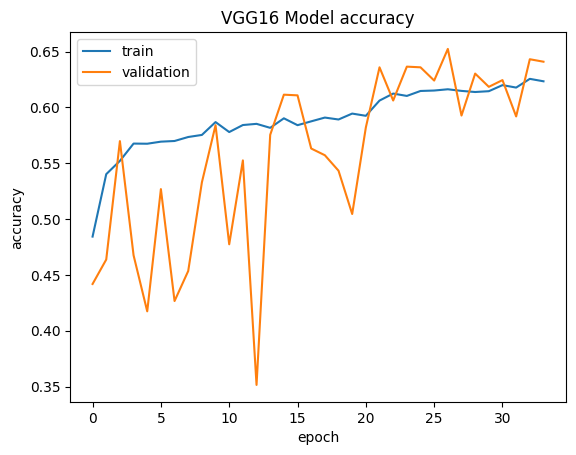

In [39]:
plt.plot(history_vgg.history["accuracy"])
plt.plot(history_vgg.history["val_accuracy"])
plt.title("VGG16 Model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the VGG16 model**


In [40]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator_vgg16.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_vgg16_model.evaluate(test_generator_vgg16, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.8750 - loss: 0.5965


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6979 - loss: 0.7874 


Loss: 0.8395289778709412, Accuracy: 0.65625


### **Plotting Confusion Matrix**



1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 461ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step  


              precision    recall  f1-score   support

       happy       0.64      0.88      0.74        32
     neutral       0.54      0.44      0.48        32
         sad       0.61      0.62      0.62        32
    surprise       0.88      0.69      0.77        32

    accuracy                           0.66       128
   macro avg       0.67      0.66      0.65       128
weighted avg       0.67      0.66      0.65       128



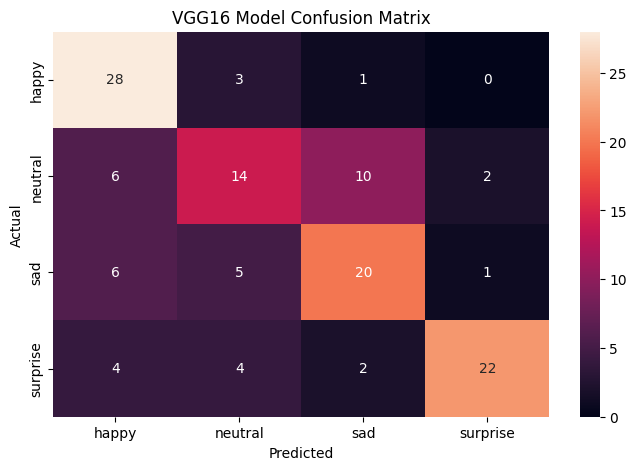

In [41]:
pred_probabilities = new_vgg16_model.predict(test_generator_vgg16, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator_vgg16.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.title("VGG16 Model Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Think About It:**

- What do you infer from the general trend in the training performance?
- Is the training accuracy consistently improving?
- Is the validation accuracy also improving similarly?


**Observations and Insights:**

- Utilizing the VGG16 architecture, the model has a total of **1,941,508 parameters**; however, only **205,892 parameters are trainable** due to freezing the earlier layers.
- The accuracy on the training set is **59.96%**, while the validation accuracy reached a high of **78.12%**.
- On the test dataset, the model achieved an accuracy of **64.06%**, which is less compared to the earlier CNN models, implying that the transfer learning approach may not have been as effective in this particular case.
- In terms of individual class performance, the model performed best on the 'surprise' emotion with a precision of **0.79** and an f1-score of **0.82**, showing strong recognition capabilities for this emotion.
- The classes 'happy' and 'sad' saw moderate f1-scores of **0.70** and **0.56**, respectively, whereas 'neutral' had the lowest f1-score of **0.47**, indicating that the model struggles more with neutral expressions and general differentiation between these emotions.

_This analysis suggests that while leveraging a pre-trained network like VGG16 brings in advanced feature detection capabilities, for the specific case of small grayscale images representing facial emotions, the intricate features learned by VGG16 from large-scale colored image datasets may not fully translate, thereby not offering a substantial advantage over simpler, tailored CNN architectures._


**Note: You can even go back and build your own architecture on top of the VGG16 Transfer layer and see if you can improve the performance**


## **ResNet V2 Model**


In [42]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [43]:
resnet_model = ResNet50V2(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
resnet_model.summary()

Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 48, 48, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 54, 54, 3) │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 24, 24,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 26, 26,    │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 12, 12,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 12, 12,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 12, 12,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 12, 12,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 12, 12,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 12, 12,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 14, 14,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 12, 12,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 12, 12,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 12, 12,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 12, 12,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 12, 12,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 12, 12,    │          0 │ conv2_block1_0_c

 Total params: 23,564,800 (89.89 MB)

 Trainable params: 23,519,360 (89.72 MB)

 Non-trainable params: 45,440 (177.50 KB)

### **Model Building**

- Import Resnet v2 upto the layer of your choice and add Fully Connected layers on top of it.


In [44]:
# Define a new model that cuts ResNet50V2 at the 'conv3_block4_out' layer
model_output = resnet_model.get_layer("conv3_block4_out").output
cut_model = Model(inputs=resnet_model.input, outputs=model_output)

# Freezing the layers
for layer in resnet_model.layers:
    layer.trainable = False

In [45]:
new_resnet_model = Sequential()
new_resnet_model.add(cut_model)

# Reduces each feature map to a single value by averaging all elements
new_resnet_model.add(GlobalAveragePooling2D())

# Adding full connected layers
new_resnet_model.add(Dense(256, activation="relu"))
# Adding output layer
new_resnet_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.001)

### **Compiling and Training the Model**


In [46]:
new_resnet_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_resnet_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ functional_1 (Functional)       │ ?                      │     1,453,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,453,568 (5.54 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 1,453,568 (5.54 MB)

In [47]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_resnet_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Fitting the model with 40 epochs and using validation set
history_resnet = new_resnet_model.fit(
    train_generator_resnet,
    epochs=40,
    validation_data=validation_generator_resnet,
    callbacks=[reduce_lr, mc, delayed_early_stopping],
)

Epoch 1/40


/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


I0000 00:00:1712794843.982897 1499815 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_3697', 4 bytes spill stores, 4 bytes spill loads



I0000 00:00:1712794844.285459 1499816 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_3697', 32 bytes spill stores, 32 bytes spill loads

I0000 00:00:1712794844.474295 1499820 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_3697', 40 bytes spill stores, 40 bytes spill loads




  1/473 ━━━━━━━━━━━━━━━━━━━━ 35:56 5s/step - accuracy: 0.2500 - loss: 1.8365


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.2051 - loss: 2.3369 


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2131 - loss: 2.3027


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2261 - loss: 2.2428


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2377 - loss: 2.1814


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2445 - loss: 2.1280


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2516 - loss: 2.0772


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2576 - loss: 2.0324


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2639 - loss: 1.9913


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2693 - loss: 1.9564


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2742 - loss: 1.9260


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2785 - loss: 1.8992


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.2826 - loss: 1.8751


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2864 - loss: 1.8529


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2898 - loss: 1.8328


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.2920 - loss: 1.8203


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.2941 - loss: 1.8084


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.2962 - loss: 1.7972


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.2994 - loss: 1.7814


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3025 - loss: 1.7665


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3054 - loss: 1.7525


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3082 - loss: 1.7395


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3108 - loss: 1.7272


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3133 - loss: 1.7159


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3155 - loss: 1.7054


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3169 - loss: 1.6987


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3190 - loss: 1.6890


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3204 - loss: 1.6828


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3224 - loss: 1.6738


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.3244 - loss: 1.6652


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3264 - loss: 1.6569


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3281 - loss: 1.6490


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3298 - loss: 1.6415


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3308 - loss: 1.6365


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3324 - loss: 1.6294


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3341 - loss: 1.6225


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3356 - loss: 1.6158


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3372 - loss: 1.6093


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3387 - loss: 1.6030


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3401 - loss: 1.5970


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3414 - loss: 1.5911


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3427 - loss: 1.5855


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3440 - loss: 1.5800


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3452 - loss: 1.5748


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3464 - loss: 1.5698


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3475 - loss: 1.5650


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3481 - loss: 1.5618


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3492 - loss: 1.5573


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.3502 - loss: 1.5529


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3511 - loss: 1.5486


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3521 - loss: 1.5445


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3527 - loss: 1.5418


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3536 - loss: 1.5378


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3545 - loss: 1.5340


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3553 - loss: 1.5303


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3561 - loss: 1.5267


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3570 - loss: 1.5233


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3578 - loss: 1.5198


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3586 - loss: 1.5165


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3594 - loss: 1.5133


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3601 - loss: 1.5101


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3609 - loss: 1.5071


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3616 - loss: 1.5041


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.3623 - loss: 1.5012


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3630 - loss: 1.4983


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3637 - loss: 1.4956


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3643 - loss: 1.4929


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3650 - loss: 1.4902


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3656 - loss: 1.4877


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3661 - loss: 1.4860


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3667 - loss: 1.4835


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3673 - loss: 1.4810


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3679 - loss: 1.4786


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3686 - loss: 1.4762


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3692 - loss: 1.4739


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3698 - loss: 1.4716


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3704 - loss: 1.4693


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3710 - loss: 1.4671


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3716 - loss: 1.4649


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.3721 - loss: 1.4628


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3727 - loss: 1.4608


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3733 - loss: 1.4588


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3738 - loss: 1.4568


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3744 - loss: 1.4548


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3749 - loss: 1.4529


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3755 - loss: 1.4510


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3759 - loss: 1.4497


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3762 - loss: 1.4485


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3768 - loss: 1.4466


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3771 - loss: 1.4454


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3776 - loss: 1.4437


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3781 - loss: 1.4419


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3786 - loss: 1.4402


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3791 - loss: 1.4385


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3796 - loss: 1.4369


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3800 - loss: 1.4352


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.3805 - loss: 1.4336


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3809 - loss: 1.4321


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3814 - loss: 1.4305


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3818 - loss: 1.4290


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3823 - loss: 1.4275


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3827 - loss: 1.4260


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3831 - loss: 1.4246


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.3836 - loss: 1.4231


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.3840 - loss: 1.4217


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3842 - loss: 1.4208


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3846 - loss: 1.4194


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3850 - loss: 1.4181


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3854 - loss: 1.4167


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3858 - loss: 1.4154


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3862 - loss: 1.4142


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3865 - loss: 1.4129


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3869 - loss: 1.4117


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.3872 - loss: 1.4105


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3876 - loss: 1.4093


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3879 - loss: 1.4081


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3882 - loss: 1.4069


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3886 - loss: 1.4058


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3889 - loss: 1.4047


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3893 - loss: 1.4035


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3896 - loss: 1.4024


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3899 - loss: 1.4013


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3902 - loss: 1.4002


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3905 - loss: 1.3995


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3908 - loss: 1.3984


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3911 - loss: 1.3974


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3914 - loss: 1.3963


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3916 - loss: 1.3956


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3920 - loss: 1.3946


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3923 - loss: 1.3936


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.3926 - loss: 1.3925


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3929 - loss: 1.3915


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3932 - loss: 1.3906


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3935 - loss: 1.3896


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3938 - loss: 1.3886


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3941 - loss: 1.3877


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3944 - loss: 1.3867


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3946 - loss: 1.3861


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3949 - loss: 1.3852


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3951 - loss: 1.3843


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3953 - loss: 1.3837


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3956 - loss: 1.3828


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3959 - loss: 1.3819


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3962 - loss: 1.3807


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.3965 - loss: 1.3798


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.3967 - loss: 1.3793


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.3970 - loss: 1.3781


426/473 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.3973 - loss: 1.3773


429/473 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.3975 - loss: 1.3764


432/473 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.3978 - loss: 1.3756


435/473 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.3980 - loss: 1.3748


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3983 - loss: 1.3740


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3985 - loss: 1.3732


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3988 - loss: 1.3724


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3990 - loss: 1.3716


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3993 - loss: 1.3708


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3995 - loss: 1.3700


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3997 - loss: 1.3695


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3999 - loss: 1.3688


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4001 - loss: 1.3680


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4003 - loss: 1.3673


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4005 - loss: 1.3668


Epoch 1: val_accuracy improved from -inf to 0.48081, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - accuracy: 0.4011 - loss: 1.3650 - val_accuracy: 0.4808 - val_loss: 1.1593 - learning_rate: 0.0010


Epoch 2/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.5938 - loss: 1.1367


  3/473 ━━━━━━━━━━━━━━━━━━━━ 15s 33ms/step - accuracy: 0.5573 - loss: 1.1584  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.5286 - loss: 1.1457


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5106 - loss: 1.1438


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.4982 - loss: 1.1460


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.4886 - loss: 1.1504


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.4842 - loss: 1.1536


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.4808 - loss: 1.1561


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.4786 - loss: 1.1586


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4778 - loss: 1.1601 


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4777 - loss: 1.1609


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4782 - loss: 1.1606


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4787 - loss: 1.1601


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4789 - loss: 1.1599


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4792 - loss: 1.1594


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4792 - loss: 1.1591


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4789 - loss: 1.1592


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4785 - loss: 1.1594


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4781 - loss: 1.1597


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4779 - loss: 1.1597


 58/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4780 - loss: 1.1596


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4781 - loss: 1.1597


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4781 - loss: 1.1597


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4781 - loss: 1.1597


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4780 - loss: 1.1598


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4779 - loss: 1.1599


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4776 - loss: 1.1602


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4775 - loss: 1.1604


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4774 - loss: 1.1607


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4772 - loss: 1.1609


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4771 - loss: 1.1612


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4769 - loss: 1.1614


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4769 - loss: 1.1616


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4768 - loss: 1.1619


 98/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4766 - loss: 1.1622


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4765 - loss: 1.1626


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4764 - loss: 1.1630


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.4763 - loss: 1.1633


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.4762 - loss: 1.1636


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.4761 - loss: 1.1640


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.4760 - loss: 1.1644


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4759 - loss: 1.1647


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4758 - loss: 1.1650


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4758 - loss: 1.1652


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4758 - loss: 1.1655


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4758 - loss: 1.1656


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4758 - loss: 1.1658


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4758 - loss: 1.1660


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4759 - loss: 1.1660


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4760 - loss: 1.1661


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4760 - loss: 1.1662


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4760 - loss: 1.1662


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4761 - loss: 1.1663


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4761 - loss: 1.1664


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4761 - loss: 1.1664


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4762 - loss: 1.1665


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4762 - loss: 1.1665


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4763 - loss: 1.1665


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4763 - loss: 1.1665


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4764 - loss: 1.1665


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4764 - loss: 1.1665


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4765 - loss: 1.1665


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4766 - loss: 1.1664


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4766 - loss: 1.1664


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4767 - loss: 1.1664


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4767 - loss: 1.1664


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4767 - loss: 1.1663


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4768 - loss: 1.1663


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4768 - loss: 1.1662


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4768 - loss: 1.1662


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4769 - loss: 1.1662


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4769 - loss: 1.1661


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4769 - loss: 1.1661


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4770 - loss: 1.1660


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4770 - loss: 1.1659


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4770 - loss: 1.1659


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4770 - loss: 1.1658


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4771 - loss: 1.1658


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4771 - loss: 1.1657


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4771 - loss: 1.1657


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4771 - loss: 1.1656


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4772 - loss: 1.1656


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4772 - loss: 1.1656


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4772 - loss: 1.1655


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4773 - loss: 1.1655


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4773 - loss: 1.1654


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4774 - loss: 1.1653


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4775 - loss: 1.1652


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4775 - loss: 1.1651


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4776 - loss: 1.1651


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4777 - loss: 1.1649


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4778 - loss: 1.1648


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4779 - loss: 1.1647


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4779 - loss: 1.1647


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4780 - loss: 1.1646


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4781 - loss: 1.1645


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4782 - loss: 1.1644


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4782 - loss: 1.1643


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4783 - loss: 1.1642


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4784 - loss: 1.1641


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4785 - loss: 1.1640


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4786 - loss: 1.1639


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4786 - loss: 1.1638


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4787 - loss: 1.1637


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4788 - loss: 1.1636


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4789 - loss: 1.1635


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4789 - loss: 1.1635


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4790 - loss: 1.1634


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4791 - loss: 1.1633


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4791 - loss: 1.1632


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4792 - loss: 1.1631


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4793 - loss: 1.1631


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4793 - loss: 1.1630


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4794 - loss: 1.1629


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4795 - loss: 1.1628


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4795 - loss: 1.1628


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4796 - loss: 1.1627


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4797 - loss: 1.1626


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4797 - loss: 1.1625


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4798 - loss: 1.1625


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4798 - loss: 1.1624


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4799 - loss: 1.1624


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4800 - loss: 1.1623


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4800 - loss: 1.1622


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4801 - loss: 1.1622


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4801 - loss: 1.1621


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4802 - loss: 1.1621


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4802 - loss: 1.1620


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4803 - loss: 1.1620


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4803 - loss: 1.1619


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4804 - loss: 1.1619


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4804 - loss: 1.1618


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4805 - loss: 1.1618


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4805 - loss: 1.1617


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4805 - loss: 1.1617


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4806 - loss: 1.1616


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4806 - loss: 1.1616


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4806 - loss: 1.1615


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4807 - loss: 1.1615


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4807 - loss: 1.1614


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4808 - loss: 1.1614


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4808 - loss: 1.1614


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4808 - loss: 1.1613


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4809 - loss: 1.1613


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4809 - loss: 1.1612


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4810 - loss: 1.1612


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4810 - loss: 1.1611


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4810 - loss: 1.1611


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4811 - loss: 1.1610


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4811 - loss: 1.1610


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4812 - loss: 1.1609


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4812 - loss: 1.1609


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4812 - loss: 1.1608


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4813 - loss: 1.1608


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4813 - loss: 1.1607


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4813 - loss: 1.1607


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4814 - loss: 1.1606


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4814 - loss: 1.1606


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4814 - loss: 1.1605


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4815 - loss: 1.1605


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4815 - loss: 1.1604


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4815 - loss: 1.1604


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4816 - loss: 1.1603


Epoch 2: val_accuracy improved from 0.48081 to 0.54330, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.4816 - loss: 1.1602 - val_accuracy: 0.5433 - val_loss: 1.0592 - learning_rate: 0.0010


Epoch 3/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.5625 - loss: 0.9775


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5306 - loss: 1.0687   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5138 - loss: 1.1135


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5012 - loss: 1.1388


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4939 - loss: 1.1494


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4922 - loss: 1.1534


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4936 - loss: 1.1517


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4937 - loss: 1.1510


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4936 - loss: 1.1508


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4946 - loss: 1.1496


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4956 - loss: 1.1484


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4965 - loss: 1.1478


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4977 - loss: 1.1469


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4989 - loss: 1.1464


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5002 - loss: 1.1456


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5006 - loss: 1.1456


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5007 - loss: 1.1457


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5007 - loss: 1.1456


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5004 - loss: 1.1458


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5001 - loss: 1.1458


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4998 - loss: 1.1458


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4996 - loss: 1.1457


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4995 - loss: 1.1454


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4996 - loss: 1.1449


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4996 - loss: 1.1448


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4996 - loss: 1.1446


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4997 - loss: 1.1444


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4999 - loss: 1.1440


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5001 - loss: 1.1437


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5002 - loss: 1.1435


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5004 - loss: 1.1431


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5005 - loss: 1.1428


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5006 - loss: 1.1425


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5008 - loss: 1.1422


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5008 - loss: 1.1421


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5009 - loss: 1.1420


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5010 - loss: 1.1418


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5011 - loss: 1.1417


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5010 - loss: 1.1417


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5010 - loss: 1.1418


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5009 - loss: 1.1419


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5009 - loss: 1.1419


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5008 - loss: 1.1419


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5008 - loss: 1.1420


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5008 - loss: 1.1420


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5008 - loss: 1.1419


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5008 - loss: 1.1419


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5008 - loss: 1.1419


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5008 - loss: 1.1419


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5008 - loss: 1.1419


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5008 - loss: 1.1419


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5007 - loss: 1.1420


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5006 - loss: 1.1420


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5005 - loss: 1.1421


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5004 - loss: 1.1421


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5003 - loss: 1.1422


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5002 - loss: 1.1422


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5000 - loss: 1.1423


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4999 - loss: 1.1423


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4998 - loss: 1.1424


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4997 - loss: 1.1424


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4995 - loss: 1.1424


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4993 - loss: 1.1425


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4992 - loss: 1.1425


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4990 - loss: 1.1425


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4989 - loss: 1.1426


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4988 - loss: 1.1427


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4986 - loss: 1.1428


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4985 - loss: 1.1429


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4983 - loss: 1.1429


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4982 - loss: 1.1430


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4981 - loss: 1.1430


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4980 - loss: 1.1431


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4979 - loss: 1.1431


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4978 - loss: 1.1431


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4977 - loss: 1.1432


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4976 - loss: 1.1432


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4975 - loss: 1.1431


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4974 - loss: 1.1431


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4974 - loss: 1.1431


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4973 - loss: 1.1431


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4973 - loss: 1.1431


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4972 - loss: 1.1431


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4972 - loss: 1.1431


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4971 - loss: 1.1430


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4971 - loss: 1.1430


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4971 - loss: 1.1429


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4970 - loss: 1.1429


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4970 - loss: 1.1428


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4970 - loss: 1.1428


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4970 - loss: 1.1427


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4970 - loss: 1.1426


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4970 - loss: 1.1426


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4970 - loss: 1.1426


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4969 - loss: 1.1425


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4969 - loss: 1.1424


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4969 - loss: 1.1424


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4969 - loss: 1.1423


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4969 - loss: 1.1422


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4968 - loss: 1.1422


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4968 - loss: 1.1421


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4968 - loss: 1.1420


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4968 - loss: 1.1420


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4968 - loss: 1.1419


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1419


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1418


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1418


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1417


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1417


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1416


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1416


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1416


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4967 - loss: 1.1415


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4966 - loss: 1.1415


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4966 - loss: 1.1415


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4966 - loss: 1.1414


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4966 - loss: 1.1414


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4966 - loss: 1.1414


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4966 - loss: 1.1413


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4966 - loss: 1.1413


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4965 - loss: 1.1413


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4965 - loss: 1.1413


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4965 - loss: 1.1413


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4965 - loss: 1.1412


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4965 - loss: 1.1412


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4965 - loss: 1.1412


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4965 - loss: 1.1412


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4964 - loss: 1.1412


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4964 - loss: 1.1412


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4964 - loss: 1.1412


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4964 - loss: 1.1412


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4964 - loss: 1.1412


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4963 - loss: 1.1412


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1411


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1410


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1410


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1410


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1410


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4963 - loss: 1.1410


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4962 - loss: 1.1410


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4962 - loss: 1.1409


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4962 - loss: 1.1409


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4962 - loss: 1.1409


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4962 - loss: 1.1409


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4962 - loss: 1.1409


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4962 - loss: 1.1409


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4962 - loss: 1.1409


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4961 - loss: 1.1409


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4961 - loss: 1.1409


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4961 - loss: 1.1409


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4961 - loss: 1.1409


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4961 - loss: 1.1409


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4961 - loss: 1.1409


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4961 - loss: 1.1409


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4960 - loss: 1.1409


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.4960 - loss: 1.1409


Epoch 3: val_accuracy did not improve from 0.54330



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.4960 - loss: 1.1408 - val_accuracy: 0.5252 - val_loss: 1.0921 - learning_rate: 0.0010


Epoch 4/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:21 174ms/step - accuracy: 0.5625 - loss: 1.0699


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4714 - loss: 1.1716   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4815 - loss: 1.1635


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.4851 - loss: 1.1602


 11/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.4891 - loss: 1.1554


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.4919 - loss: 1.1507


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.4929 - loss: 1.1481


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.4944 - loss: 1.1441


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4960 - loss: 1.1395 


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4963 - loss: 1.1363


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4964 - loss: 1.1350


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4967 - loss: 1.1343


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4969 - loss: 1.1340


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4969 - loss: 1.1342


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4970 - loss: 1.1340


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4972 - loss: 1.1337


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4975 - loss: 1.1332


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4981 - loss: 1.1326


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4988 - loss: 1.1320


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4998 - loss: 1.1311


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5006 - loss: 1.1303


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5015 - loss: 1.1296


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5023 - loss: 1.1287


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5030 - loss: 1.1279


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5037 - loss: 1.1271


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5043 - loss: 1.1264


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5048 - loss: 1.1258


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5051 - loss: 1.1253


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5052 - loss: 1.1251


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5053 - loss: 1.1248


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5054 - loss: 1.1245


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5054 - loss: 1.1243


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5055 - loss: 1.1243


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5054 - loss: 1.1242


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5054 - loss: 1.1242


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5054 - loss: 1.1241


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5055 - loss: 1.1240


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5055 - loss: 1.1239


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5055 - loss: 1.1238


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5055 - loss: 1.1237


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5055 - loss: 1.1236


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5054 - loss: 1.1236


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5054 - loss: 1.1235


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5054 - loss: 1.1235


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5054 - loss: 1.1234


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5055 - loss: 1.1232


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5056 - loss: 1.1230


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5057 - loss: 1.1227


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5058 - loss: 1.1225


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5060 - loss: 1.1223


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5061 - loss: 1.1220


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5062 - loss: 1.1218


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5063 - loss: 1.1216


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5064 - loss: 1.1214


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5065 - loss: 1.1213


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5066 - loss: 1.1211


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5067 - loss: 1.1209


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5068 - loss: 1.1208


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5069 - loss: 1.1206


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5070 - loss: 1.1204


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5070 - loss: 1.1203


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5071 - loss: 1.1201


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5072 - loss: 1.1199


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5073 - loss: 1.1198


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5073 - loss: 1.1197


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5074 - loss: 1.1196


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5074 - loss: 1.1195


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5074 - loss: 1.1194


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5075 - loss: 1.1193


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5075 - loss: 1.1192


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5075 - loss: 1.1191


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5075 - loss: 1.1191


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5075 - loss: 1.1190


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5075 - loss: 1.1190


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5075 - loss: 1.1190


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5076 - loss: 1.1189


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5076 - loss: 1.1189


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5076 - loss: 1.1189


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5076 - loss: 1.1188


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5076 - loss: 1.1188


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5076 - loss: 1.1187


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5076 - loss: 1.1187


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5076 - loss: 1.1186


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5076 - loss: 1.1186


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5076 - loss: 1.1186


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5076 - loss: 1.1185


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5076 - loss: 1.1185


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1185


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1185


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1184


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1184


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1184


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1184


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1184


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1184


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1184


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1185


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5077 - loss: 1.1185


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5077 - loss: 1.1185


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5077 - loss: 1.1186


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5077 - loss: 1.1186


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5077 - loss: 1.1186


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5077 - loss: 1.1186


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1186


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1187


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1188


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5076 - loss: 1.1188


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1188


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1188


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1188


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1189


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1189


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1189


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1189


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1190


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1190


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1190


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1191


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1191


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1191


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1191


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1192


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1192


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1192


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5077 - loss: 1.1193


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5077 - loss: 1.1193


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5077 - loss: 1.1193


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5076 - loss: 1.1194


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5076 - loss: 1.1194


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5076 - loss: 1.1194


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5076 - loss: 1.1195


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5076 - loss: 1.1195


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5076 - loss: 1.1195


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5075 - loss: 1.1196


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5075 - loss: 1.1196


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5075 - loss: 1.1196


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5075 - loss: 1.1197


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5075 - loss: 1.1197


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5074 - loss: 1.1197


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5074 - loss: 1.1198


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5074 - loss: 1.1198


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5074 - loss: 1.1199


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5074 - loss: 1.1199


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5074 - loss: 1.1199


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5074 - loss: 1.1200


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1200


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1201


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1201


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1201


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1201


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1202


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1202


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1202


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1202


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5073 - loss: 1.1203


Epoch 4: val_accuracy improved from 0.54330 to 0.55375, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5073 - loss: 1.1203 - val_accuracy: 0.5537 - val_loss: 1.0311 - learning_rate: 0.0010


Epoch 5/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - accuracy: 0.5312 - loss: 1.0161


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5501 - loss: 1.0288   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5504 - loss: 1.0426


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5511 - loss: 1.0504


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5466 - loss: 1.0579


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5403 - loss: 1.0669


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5357 - loss: 1.0733


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5322 - loss: 1.0791


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5287 - loss: 1.0845


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5261 - loss: 1.0882


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5254 - loss: 1.0900


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5243 - loss: 1.0917


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5233 - loss: 1.0935


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5225 - loss: 1.0956


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5216 - loss: 1.0974


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5207 - loss: 1.0988


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5199 - loss: 1.1002


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5191 - loss: 1.1014


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5183 - loss: 1.1023


 58/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5175 - loss: 1.1033


 61/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5168 - loss: 1.1043


 64/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5162 - loss: 1.1053


 67/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5156 - loss: 1.1062


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5151 - loss: 1.1071


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5145 - loss: 1.1081


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5138 - loss: 1.1092


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5131 - loss: 1.1104


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5124 - loss: 1.1114


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5118 - loss: 1.1124


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5113 - loss: 1.1130


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5107 - loss: 1.1140


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5100 - loss: 1.1149


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5094 - loss: 1.1158


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5088 - loss: 1.1167


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5082 - loss: 1.1175


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5077 - loss: 1.1182


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5073 - loss: 1.1189


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5069 - loss: 1.1195


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5065 - loss: 1.1201


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5062 - loss: 1.1206


120/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5059 - loss: 1.1212


123/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5056 - loss: 1.1217


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5054 - loss: 1.1220


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5052 - loss: 1.1224


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5050 - loss: 1.1228


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5048 - loss: 1.1231


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5046 - loss: 1.1234


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5045 - loss: 1.1236


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5044 - loss: 1.1238


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5042 - loss: 1.1241


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5040 - loss: 1.1243


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5039 - loss: 1.1246


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5038 - loss: 1.1247


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5037 - loss: 1.1249


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5035 - loss: 1.1251


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5034 - loss: 1.1253


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5033 - loss: 1.1255


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5031 - loss: 1.1257


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5030 - loss: 1.1259


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5028 - loss: 1.1261


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5027 - loss: 1.1263


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5026 - loss: 1.1265


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5024 - loss: 1.1267


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5023 - loss: 1.1268


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5022 - loss: 1.1270


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5021 - loss: 1.1271


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5020 - loss: 1.1273


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5019 - loss: 1.1273


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5018 - loss: 1.1274


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5017 - loss: 1.1275


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5016 - loss: 1.1276


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5015 - loss: 1.1277


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5015 - loss: 1.1277


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5014 - loss: 1.1277


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5014 - loss: 1.1278


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5013 - loss: 1.1278


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5013 - loss: 1.1278


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5012 - loss: 1.1279


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5012 - loss: 1.1279


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5012 - loss: 1.1279


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5011 - loss: 1.1279


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5011 - loss: 1.1279


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5011 - loss: 1.1280


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5011 - loss: 1.1280


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5011 - loss: 1.1280


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1280


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5010 - loss: 1.1279


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5010 - loss: 1.1278


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5010 - loss: 1.1278


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5010 - loss: 1.1278


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5010 - loss: 1.1278


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5010 - loss: 1.1278


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5010 - loss: 1.1277


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5010 - loss: 1.1277


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1277


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1277


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1276


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1276


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1276


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1276


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1276


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1275


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5011 - loss: 1.1275


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5011 - loss: 1.1274


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5012 - loss: 1.1274


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5012 - loss: 1.1274


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5012 - loss: 1.1273


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5012 - loss: 1.1273


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5012 - loss: 1.1272


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5012 - loss: 1.1272


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5013 - loss: 1.1272


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5013 - loss: 1.1272


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5013 - loss: 1.1271


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5013 - loss: 1.1271


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5013 - loss: 1.1271


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5013 - loss: 1.1270


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5014 - loss: 1.1270


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5014 - loss: 1.1270


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5014 - loss: 1.1269


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5014 - loss: 1.1269


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5015 - loss: 1.1269


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5015 - loss: 1.1268


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5015 - loss: 1.1268


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5016 - loss: 1.1268


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5016 - loss: 1.1268


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5016 - loss: 1.1267


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5017 - loss: 1.1267


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5017 - loss: 1.1266


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5017 - loss: 1.1266


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5018 - loss: 1.1265


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5018 - loss: 1.1264


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5019 - loss: 1.1264


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5019 - loss: 1.1263


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5020 - loss: 1.1263


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5020 - loss: 1.1262


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5020 - loss: 1.1262


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5021 - loss: 1.1261


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5021 - loss: 1.1260


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5021 - loss: 1.1260


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5022 - loss: 1.1259


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5022 - loss: 1.1259


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5022 - loss: 1.1259


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5023 - loss: 1.1258


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5023 - loss: 1.1258


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5023 - loss: 1.1257


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5024 - loss: 1.1257


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5024 - loss: 1.1256


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5024 - loss: 1.1256


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5025 - loss: 1.1255


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5025 - loss: 1.1255


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5025 - loss: 1.1254


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5026 - loss: 1.1254


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5026 - loss: 1.1253


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5027 - loss: 1.1252


Epoch 5: val_accuracy did not improve from 0.55375



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5027 - loss: 1.1252 - val_accuracy: 0.5409 - val_loss: 1.0454 - learning_rate: 0.0010


Epoch 6/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:49 232ms/step - accuracy: 0.3750 - loss: 1.3090


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4753 - loss: 1.2070   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5107 - loss: 1.1654


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5251 - loss: 1.1468


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5392 - loss: 1.1267


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5424 - loss: 1.1171 


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5440 - loss: 1.1111


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5449 - loss: 1.1075


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5446 - loss: 1.1045


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5440 - loss: 1.1037


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5431 - loss: 1.1023


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5420 - loss: 1.1012


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5411 - loss: 1.1003


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5404 - loss: 1.0998


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5399 - loss: 1.0992


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5393 - loss: 1.0981


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5388 - loss: 1.0974


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5383 - loss: 1.0970


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5380 - loss: 1.0965


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5375 - loss: 1.0960


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5371 - loss: 1.0956


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5367 - loss: 1.0951


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5364 - loss: 1.0946


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5359 - loss: 1.0942


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5354 - loss: 1.0939


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5348 - loss: 1.0937


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5343 - loss: 1.0934


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5338 - loss: 1.0932


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5333 - loss: 1.0930


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5330 - loss: 1.0930


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5326 - loss: 1.0928


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5321 - loss: 1.0927


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5317 - loss: 1.0927


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5314 - loss: 1.0926


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5310 - loss: 1.0925


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5307 - loss: 1.0925


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5305 - loss: 1.0924


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5301 - loss: 1.0924


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5297 - loss: 1.0923


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5294 - loss: 1.0923


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5290 - loss: 1.0923


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5287 - loss: 1.0922


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5285 - loss: 1.0921


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5283 - loss: 1.0920


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5280 - loss: 1.0919


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5278 - loss: 1.0918


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5276 - loss: 1.0917


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5273 - loss: 1.0917


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5271 - loss: 1.0916


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5270 - loss: 1.0915


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5268 - loss: 1.0915


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5266 - loss: 1.0915


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5265 - loss: 1.0914


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5263 - loss: 1.0914


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5261 - loss: 1.0914


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5259 - loss: 1.0913


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5258 - loss: 1.0913


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5256 - loss: 1.0913


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5255 - loss: 1.0912


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5254 - loss: 1.0911


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5253 - loss: 1.0910


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5252 - loss: 1.0910


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5252 - loss: 1.0910


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5251 - loss: 1.0909


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5250 - loss: 1.0908


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5249 - loss: 1.0908


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5248 - loss: 1.0907


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5248 - loss: 1.0906


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5247 - loss: 1.0906


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5246 - loss: 1.0906


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5245 - loss: 1.0906


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5244 - loss: 1.0906


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5243 - loss: 1.0907


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5243 - loss: 1.0907


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5242 - loss: 1.0907


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5241 - loss: 1.0907


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5240 - loss: 1.0907


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5239 - loss: 1.0907


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5238 - loss: 1.0908


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5237 - loss: 1.0908


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5236 - loss: 1.0909


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5236 - loss: 1.0909


235/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5235 - loss: 1.0909


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5234 - loss: 1.0910


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5233 - loss: 1.0910


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5231 - loss: 1.0911


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5231 - loss: 1.0911


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5229 - loss: 1.0912


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5229 - loss: 1.0913


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5228 - loss: 1.0913


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5227 - loss: 1.0914


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5226 - loss: 1.0915


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5225 - loss: 1.0915


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5224 - loss: 1.0916


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5223 - loss: 1.0917


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5221 - loss: 1.0918


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5220 - loss: 1.0919


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5219 - loss: 1.0920


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5218 - loss: 1.0920


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5218 - loss: 1.0921


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5217 - loss: 1.0922


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5216 - loss: 1.0923


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5215 - loss: 1.0924


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5214 - loss: 1.0924


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5214 - loss: 1.0925


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5213 - loss: 1.0925


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5213 - loss: 1.0926


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5212 - loss: 1.0926


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5212 - loss: 1.0927


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5211 - loss: 1.0928


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5211 - loss: 1.0928


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5210 - loss: 1.0929


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5210 - loss: 1.0929


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5209 - loss: 1.0929


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5209 - loss: 1.0930


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5209 - loss: 1.0930


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5208 - loss: 1.0931


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5208 - loss: 1.0931


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5207 - loss: 1.0932


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5207 - loss: 1.0932


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5207 - loss: 1.0932


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5206 - loss: 1.0932


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5206 - loss: 1.0933


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5206 - loss: 1.0933


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5205 - loss: 1.0933


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5205 - loss: 1.0933


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5205 - loss: 1.0934


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5205 - loss: 1.0934


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5204 - loss: 1.0934


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5204 - loss: 1.0934


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5204 - loss: 1.0934


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5204 - loss: 1.0935


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5203 - loss: 1.0935


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5203 - loss: 1.0935


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5203 - loss: 1.0935


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5203 - loss: 1.0935


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5203 - loss: 1.0935


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5202 - loss: 1.0936


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5202 - loss: 1.0936


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5202 - loss: 1.0936


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5202 - loss: 1.0936


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5202 - loss: 1.0937


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5201 - loss: 1.0937


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5201 - loss: 1.0937


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5201 - loss: 1.0937


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5201 - loss: 1.0938


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5200 - loss: 1.0938


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5200 - loss: 1.0939


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5200 - loss: 1.0939


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5199 - loss: 1.0939


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5199 - loss: 1.0940


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5199 - loss: 1.0940


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5198 - loss: 1.0940


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5198 - loss: 1.0941


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5198 - loss: 1.0941


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5198 - loss: 1.0941


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5198 - loss: 1.0941


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5198 - loss: 1.0942


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5197 - loss: 1.0942


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5197 - loss: 1.0942


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5197 - loss: 1.0943


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5197 - loss: 1.0943


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5196 - loss: 1.0943


Epoch 6: val_accuracy improved from 0.55375 to 0.55917, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5196 - loss: 1.0945 - val_accuracy: 0.5592 - val_loss: 1.0174 - learning_rate: 0.0010


Epoch 7/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - accuracy: 0.5000 - loss: 1.1068


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5033 - loss: 1.0928   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5092 - loss: 1.0907


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5188 - loss: 1.0782


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5242 - loss: 1.0709


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5278 - loss: 1.0663


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5302 - loss: 1.0617


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5305 - loss: 1.0600


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5292 - loss: 1.0615


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5278 - loss: 1.0629


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5269 - loss: 1.0641


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5261 - loss: 1.0648


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5255 - loss: 1.0653


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5252 - loss: 1.0654


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5249 - loss: 1.0658


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5247 - loss: 1.0665


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5245 - loss: 1.0674


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5242 - loss: 1.0684


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5240 - loss: 1.0693


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5237 - loss: 1.0700


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5235 - loss: 1.0707


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5233 - loss: 1.0714


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5229 - loss: 1.0722


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5225 - loss: 1.0730


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5221 - loss: 1.0737


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5218 - loss: 1.0745


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5215 - loss: 1.0751


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5212 - loss: 1.0754


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5209 - loss: 1.0759


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5206 - loss: 1.0764


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5203 - loss: 1.0770


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5200 - loss: 1.0775


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5197 - loss: 1.0781


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5196 - loss: 1.0784


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5194 - loss: 1.0787


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5192 - loss: 1.0792


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5190 - loss: 1.0796


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5188 - loss: 1.0800


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5186 - loss: 1.0804


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5184 - loss: 1.0807


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5183 - loss: 1.0810


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5181 - loss: 1.0813


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5180 - loss: 1.0816


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5179 - loss: 1.0819


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5179 - loss: 1.0821


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5178 - loss: 1.0823


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5178 - loss: 1.0825


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5177 - loss: 1.0826


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5177 - loss: 1.0827


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5177 - loss: 1.0829


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5176 - loss: 1.0830


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5176 - loss: 1.0830


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5176 - loss: 1.0830


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5177 - loss: 1.0831


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5177 - loss: 1.0831


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5177 - loss: 1.0831


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5177 - loss: 1.0831


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5178 - loss: 1.0832


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5178 - loss: 1.0832


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5178 - loss: 1.0832


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5179 - loss: 1.0833


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5179 - loss: 1.0833


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5179 - loss: 1.0834


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5179 - loss: 1.0835


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5179 - loss: 1.0836


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5179 - loss: 1.0836


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5179 - loss: 1.0837


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5179 - loss: 1.0838


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5179 - loss: 1.0838


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5179 - loss: 1.0839


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5179 - loss: 1.0839


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5180 - loss: 1.0839


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5180 - loss: 1.0840


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5180 - loss: 1.0841


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5180 - loss: 1.0841


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5181 - loss: 1.0841


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5181 - loss: 1.0842


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5182 - loss: 1.0842


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5182 - loss: 1.0843


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5182 - loss: 1.0843


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5183 - loss: 1.0843


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5183 - loss: 1.0844


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5183 - loss: 1.0844


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5184 - loss: 1.0844


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5184 - loss: 1.0845


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5184 - loss: 1.0845


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5185 - loss: 1.0846


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5185 - loss: 1.0847


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5185 - loss: 1.0847


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5186 - loss: 1.0848


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5186 - loss: 1.0849


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5187 - loss: 1.0850


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5187 - loss: 1.0850


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5187 - loss: 1.0851


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5188 - loss: 1.0851


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5188 - loss: 1.0852


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5188 - loss: 1.0852


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5189 - loss: 1.0853


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5189 - loss: 1.0853


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5189 - loss: 1.0854


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5189 - loss: 1.0855


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5190 - loss: 1.0855


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5190 - loss: 1.0856


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5190 - loss: 1.0857


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5190 - loss: 1.0858


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5190 - loss: 1.0858


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5191 - loss: 1.0859


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5191 - loss: 1.0860


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5191 - loss: 1.0860


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5192 - loss: 1.0861


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5192 - loss: 1.0862


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5192 - loss: 1.0862


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5192 - loss: 1.0863


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5192 - loss: 1.0864


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5192 - loss: 1.0864


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5192 - loss: 1.0865


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5192 - loss: 1.0866


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5192 - loss: 1.0867


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0868


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0868


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0869


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0870


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0870


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0871


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0872


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0873


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0873


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0874


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0875


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5193 - loss: 1.0875


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5194 - loss: 1.0876


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5194 - loss: 1.0876


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5194 - loss: 1.0877


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5194 - loss: 1.0877


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5194 - loss: 1.0878


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5194 - loss: 1.0878


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5194 - loss: 1.0879


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0879


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0880


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0880


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0881


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0881


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0882


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0882


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0883


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0883


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0884


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0884


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0885


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0885


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5195 - loss: 1.0886


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0886


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0887


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0887


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0888


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0888


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0889


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0889


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0890


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0891


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0891


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0892


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0892


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0892


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5195 - loss: 1.0893


Epoch 7: val_accuracy did not improve from 0.55917



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5196 - loss: 1.0894 - val_accuracy: 0.5535 - val_loss: 1.0247 - learning_rate: 0.0010


Epoch 8/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - accuracy: 0.6250 - loss: 0.9302


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6309 - loss: 0.9532   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6083 - loss: 0.9931


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5945 - loss: 1.0163


 11/473 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.5836 - loss: 1.0342


 14/473 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.5713 - loss: 1.0511


 17/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.5610 - loss: 1.0636


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5546 - loss: 1.0714


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5504 - loss: 1.0760


 26/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5476 - loss: 1.0793


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5451 - loss: 1.0816 


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5430 - loss: 1.0834


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5411 - loss: 1.0855


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5395 - loss: 1.0878


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5384 - loss: 1.0893


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5372 - loss: 1.0906


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5364 - loss: 1.0915


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5355 - loss: 1.0927


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5347 - loss: 1.0938


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5342 - loss: 1.0944


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5336 - loss: 1.0952


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5332 - loss: 1.0957


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5330 - loss: 1.0958


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5331 - loss: 1.0957


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5330 - loss: 1.0956


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5328 - loss: 1.0958


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5325 - loss: 1.0962


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5322 - loss: 1.0967


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5319 - loss: 1.0970


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5316 - loss: 1.0973


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5314 - loss: 1.0976


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5312 - loss: 1.0978


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5309 - loss: 1.0981


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5307 - loss: 1.0983


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5306 - loss: 1.0984


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5305 - loss: 1.0985


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5305 - loss: 1.0985


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5304 - loss: 1.0984


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5304 - loss: 1.0984


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5303 - loss: 1.0983


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5303 - loss: 1.0982


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5303 - loss: 1.0981


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5302 - loss: 1.0980


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5302 - loss: 1.0980


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5302 - loss: 1.0980


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5302 - loss: 1.0979


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5302 - loss: 1.0978


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5302 - loss: 1.0977


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5303 - loss: 1.0976


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5303 - loss: 1.0976


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5304 - loss: 1.0975


146/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5304 - loss: 1.0974


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5305 - loss: 1.0973


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5305 - loss: 1.0973


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5306 - loss: 1.0972


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5306 - loss: 1.0972


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5306 - loss: 1.0972


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5306 - loss: 1.0971


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5306 - loss: 1.0971


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5306 - loss: 1.0971


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5306 - loss: 1.0971


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5305 - loss: 1.0972


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5305 - loss: 1.0972


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5305 - loss: 1.0972


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5305 - loss: 1.0972


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5305 - loss: 1.0972


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5305 - loss: 1.0972


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5305 - loss: 1.0972


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5304 - loss: 1.0972


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5304 - loss: 1.0972


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5304 - loss: 1.0972


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5303 - loss: 1.0972


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5303 - loss: 1.0972


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5302 - loss: 1.0973


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5302 - loss: 1.0973


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5301 - loss: 1.0973


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5301 - loss: 1.0974


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5300 - loss: 1.0974


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5299 - loss: 1.0974


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5299 - loss: 1.0974


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5298 - loss: 1.0974


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5297 - loss: 1.0975


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5297 - loss: 1.0975


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5296 - loss: 1.0975


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5296 - loss: 1.0975


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5295 - loss: 1.0975


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5295 - loss: 1.0975


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5294 - loss: 1.0975


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5294 - loss: 1.0975


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5293 - loss: 1.0975


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5293 - loss: 1.0975


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5292 - loss: 1.0975


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5292 - loss: 1.0975


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5292 - loss: 1.0975


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5291 - loss: 1.0975


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5291 - loss: 1.0975


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5290 - loss: 1.0975


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5290 - loss: 1.0975


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5289 - loss: 1.0976


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5289 - loss: 1.0976


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5288 - loss: 1.0976


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5288 - loss: 1.0976


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5288 - loss: 1.0976


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5287 - loss: 1.0976


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5287 - loss: 1.0976


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5287 - loss: 1.0976


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5286 - loss: 1.0976


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5286 - loss: 1.0976


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5285 - loss: 1.0976


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5285 - loss: 1.0976


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5284 - loss: 1.0976


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5284 - loss: 1.0976


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5284 - loss: 1.0976


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5283 - loss: 1.0976


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5283 - loss: 1.0976


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5282 - loss: 1.0976


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5282 - loss: 1.0976


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5282 - loss: 1.0976


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5282 - loss: 1.0976


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5282 - loss: 1.0976


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0975


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0975


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0975


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0975


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0974


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0974


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0974


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0973


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5281 - loss: 1.0973


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5281 - loss: 1.0973


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5281 - loss: 1.0972


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5281 - loss: 1.0972


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5281 - loss: 1.0972


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5280 - loss: 1.0972


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0971


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0971


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0971


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0970


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0970


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0970


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0969


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0969


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0969


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0968


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5280 - loss: 1.0968


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0968


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0967


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0967


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0967


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0966


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0966


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0965


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0965


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5279 - loss: 1.0965


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5278 - loss: 1.0964


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5278 - loss: 1.0964


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5278 - loss: 1.0963


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5278 - loss: 1.0963


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5278 - loss: 1.0962


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5278 - loss: 1.0962


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5278 - loss: 1.0961


Epoch 8: val_accuracy did not improve from 0.55917



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5278 - loss: 1.0961 - val_accuracy: 0.5341 - val_loss: 1.0665 - learning_rate: 0.0010


Epoch 9/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.5000 - loss: 1.1318


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5208 - loss: 1.1205   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5170 - loss: 1.1355


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5140 - loss: 1.1395


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5143 - loss: 1.1339


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5152 - loss: 1.1290


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5167 - loss: 1.1240


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5172 - loss: 1.1215


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5187 - loss: 1.1177


 27/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5197 - loss: 1.1149


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5208 - loss: 1.1121


 32/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5215 - loss: 1.1102


 35/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5221 - loss: 1.1084


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5227 - loss: 1.1072


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5231 - loss: 1.1064


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5234 - loss: 1.1057


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5237 - loss: 1.1051


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5238 - loss: 1.1047


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5240 - loss: 1.1043


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5241 - loss: 1.1038


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5243 - loss: 1.1033


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5244 - loss: 1.1029


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5245 - loss: 1.1023


 68/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5247 - loss: 1.1018


 71/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5248 - loss: 1.1013


 74/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5251 - loss: 1.1006


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5255 - loss: 1.0998


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5258 - loss: 1.0994


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5260 - loss: 1.0989


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5262 - loss: 1.0985


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5263 - loss: 1.0982


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5265 - loss: 1.0978


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5268 - loss: 1.0973


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5272 - loss: 1.0967


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5275 - loss: 1.0960


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5278 - loss: 1.0953


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5280 - loss: 1.0949


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5283 - loss: 1.0944


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5285 - loss: 1.0939


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5288 - loss: 1.0934


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5290 - loss: 1.0930


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5292 - loss: 1.0926


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5294 - loss: 1.0923


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5295 - loss: 1.0920


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5296 - loss: 1.0916


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5298 - loss: 1.0913


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5299 - loss: 1.0911


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5300 - loss: 1.0908


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5301 - loss: 1.0905


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5302 - loss: 1.0903


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5303 - loss: 1.0901


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5304 - loss: 1.0899


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5305 - loss: 1.0896


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5306 - loss: 1.0892


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5307 - loss: 1.0888


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5308 - loss: 1.0885


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5308 - loss: 1.0882


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5309 - loss: 1.0880


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0877


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0875


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5311 - loss: 1.0873


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5311 - loss: 1.0872


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5312 - loss: 1.0870


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5313 - loss: 1.0868


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5313 - loss: 1.0867


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5313 - loss: 1.0866


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5314 - loss: 1.0865


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5314 - loss: 1.0864


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5314 - loss: 1.0863


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5314 - loss: 1.0862


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0861


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5315 - loss: 1.0860


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5315 - loss: 1.0860


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5315 - loss: 1.0859


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0858


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0857


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0856


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0855


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0855


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0854


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0854


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0853


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5316 - loss: 1.0853


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0852


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0851


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0851


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0850


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0849


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0849


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0848


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0847


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5315 - loss: 1.0847


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5314 - loss: 1.0847


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5314 - loss: 1.0846


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5314 - loss: 1.0846


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5314 - loss: 1.0846


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5313 - loss: 1.0845


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5313 - loss: 1.0845


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5313 - loss: 1.0845


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5313 - loss: 1.0844


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5313 - loss: 1.0844


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5313 - loss: 1.0843


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5312 - loss: 1.0843


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5312 - loss: 1.0843


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5312 - loss: 1.0843


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5312 - loss: 1.0843


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5311 - loss: 1.0842


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5311 - loss: 1.0843


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5311 - loss: 1.0843


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5310 - loss: 1.0843


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5310 - loss: 1.0843


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5309 - loss: 1.0843


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5309 - loss: 1.0843


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5308 - loss: 1.0843


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5308 - loss: 1.0844


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5307 - loss: 1.0844


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5307 - loss: 1.0844


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5306 - loss: 1.0844


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5306 - loss: 1.0844


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5305 - loss: 1.0844


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5305 - loss: 1.0844


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5304 - loss: 1.0844


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5304 - loss: 1.0844


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5304 - loss: 1.0845


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5303 - loss: 1.0845


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5303 - loss: 1.0845


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5302 - loss: 1.0845


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5302 - loss: 1.0845


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5302 - loss: 1.0845


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5301 - loss: 1.0846


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5301 - loss: 1.0846


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5301 - loss: 1.0846


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5300 - loss: 1.0846


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5300 - loss: 1.0847


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5299 - loss: 1.0847


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5299 - loss: 1.0848


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5298 - loss: 1.0848


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5298 - loss: 1.0849


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5298 - loss: 1.0849


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5297 - loss: 1.0849


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5297 - loss: 1.0849


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5296 - loss: 1.0850


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5296 - loss: 1.0850


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5296 - loss: 1.0850


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5295 - loss: 1.0850


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5295 - loss: 1.0851


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5295 - loss: 1.0851


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5294 - loss: 1.0851


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5294 - loss: 1.0851


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5293 - loss: 1.0852


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5293 - loss: 1.0852


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5293 - loss: 1.0852


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5292 - loss: 1.0853


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5292 - loss: 1.0853


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5292 - loss: 1.0853


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5291 - loss: 1.0853


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5291 - loss: 1.0854


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5291 - loss: 1.0854


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5290 - loss: 1.0854


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5290 - loss: 1.0854


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5290 - loss: 1.0854


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5289 - loss: 1.0855


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5289 - loss: 1.0855


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5289 - loss: 1.0855


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5288 - loss: 1.0855


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5288 - loss: 1.0856


Epoch 9: val_accuracy did not improve from 0.55917



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5288 - loss: 1.0856 - val_accuracy: 0.5357 - val_loss: 1.0625 - learning_rate: 0.0010


Epoch 10/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:21 173ms/step - accuracy: 0.4375 - loss: 1.2522


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4635 - loss: 1.1908   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4919 - loss: 1.1545


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5098 - loss: 1.1335


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5185 - loss: 1.1224


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5253 - loss: 1.1132


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5301 - loss: 1.1058


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5329 - loss: 1.1007


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5342 - loss: 1.0979


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5355 - loss: 1.0957


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5369 - loss: 1.0932


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5380 - loss: 1.0908


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5387 - loss: 1.0890


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5390 - loss: 1.0873


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5391 - loss: 1.0858


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5389 - loss: 1.0850


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5388 - loss: 1.0846


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5388 - loss: 1.0839


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5389 - loss: 1.0835


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5391 - loss: 1.0831


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5392 - loss: 1.0826


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5393 - loss: 1.0821


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5393 - loss: 1.0818


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5396 - loss: 1.0814


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5399 - loss: 1.0809


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5402 - loss: 1.0805


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5404 - loss: 1.0802


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5406 - loss: 1.0800


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5407 - loss: 1.0799


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5408 - loss: 1.0798


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5409 - loss: 1.0797


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5411 - loss: 1.0797


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5413 - loss: 1.0797


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5415 - loss: 1.0796


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5418 - loss: 1.0794


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5420 - loss: 1.0793


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5423 - loss: 1.0791


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5425 - loss: 1.0790


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5428 - loss: 1.0787


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5431 - loss: 1.0785


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5433 - loss: 1.0782


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5435 - loss: 1.0781


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5436 - loss: 1.0779


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5438 - loss: 1.0778


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5440 - loss: 1.0776


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5441 - loss: 1.0775


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5442 - loss: 1.0773


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5444 - loss: 1.0771


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5445 - loss: 1.0769


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5446 - loss: 1.0766


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5447 - loss: 1.0765


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5447 - loss: 1.0763


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5448 - loss: 1.0760


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5449 - loss: 1.0759


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5449 - loss: 1.0757


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5449 - loss: 1.0755


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5450 - loss: 1.0753


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5450 - loss: 1.0752


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5450 - loss: 1.0751


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0749


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0748


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0747


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0746


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0745


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5451 - loss: 1.0745


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5450 - loss: 1.0744


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5450 - loss: 1.0743


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5450 - loss: 1.0743


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5449 - loss: 1.0742


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5449 - loss: 1.0742


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5448 - loss: 1.0741


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5448 - loss: 1.0741


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5447 - loss: 1.0740


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5447 - loss: 1.0740


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5446 - loss: 1.0739


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5446 - loss: 1.0739


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5446 - loss: 1.0739


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5445 - loss: 1.0738


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5445 - loss: 1.0738


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5445 - loss: 1.0738


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5444 - loss: 1.0737


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0737


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0736


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0735


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0735


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0734


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0733


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0733


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0732


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0732


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5444 - loss: 1.0731


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5443 - loss: 1.0730


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5443 - loss: 1.0729


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5443 - loss: 1.0729


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5442 - loss: 1.0728


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5442 - loss: 1.0728


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5441 - loss: 1.0728


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5441 - loss: 1.0727


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5440 - loss: 1.0727


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5440 - loss: 1.0727


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5439 - loss: 1.0726


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5439 - loss: 1.0726


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5438 - loss: 1.0726


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5438 - loss: 1.0726


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5437 - loss: 1.0726


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5437 - loss: 1.0725


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5436 - loss: 1.0725


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5436 - loss: 1.0725


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5435 - loss: 1.0725


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5434 - loss: 1.0725


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5434 - loss: 1.0725


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5433 - loss: 1.0725


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5433 - loss: 1.0725


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5432 - loss: 1.0725


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5432 - loss: 1.0725


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5431 - loss: 1.0725


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5430 - loss: 1.0725


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5430 - loss: 1.0726


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5429 - loss: 1.0726


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5429 - loss: 1.0726


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5428 - loss: 1.0726


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5428 - loss: 1.0726


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5427 - loss: 1.0726


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5427 - loss: 1.0726


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5427 - loss: 1.0726


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5426 - loss: 1.0726


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5426 - loss: 1.0726


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5426 - loss: 1.0726


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5425 - loss: 1.0726


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5425 - loss: 1.0727


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5425 - loss: 1.0727


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5424 - loss: 1.0727


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5424 - loss: 1.0727


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5423 - loss: 1.0727


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5423 - loss: 1.0727


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5423 - loss: 1.0727


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5422 - loss: 1.0728


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5422 - loss: 1.0728


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5421 - loss: 1.0728


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5421 - loss: 1.0728


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5421 - loss: 1.0728


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5420 - loss: 1.0729


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5420 - loss: 1.0729


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5420 - loss: 1.0729


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5419 - loss: 1.0729


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5419 - loss: 1.0729


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5418 - loss: 1.0730


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5418 - loss: 1.0730


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5418 - loss: 1.0730


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5417 - loss: 1.0730


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5417 - loss: 1.0730


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5416 - loss: 1.0731


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5416 - loss: 1.0731


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5415 - loss: 1.0731


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5415 - loss: 1.0731


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5415 - loss: 1.0732


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5414 - loss: 1.0732


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5414 - loss: 1.0732


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5413 - loss: 1.0732


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5413 - loss: 1.0732


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5413 - loss: 1.0733


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5412 - loss: 1.0733


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5412 - loss: 1.0733


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5410 - loss: 1.0734


Epoch 10: val_accuracy did not improve from 0.55917



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5410 - loss: 1.0734 - val_accuracy: 0.5166 - val_loss: 1.0749 - learning_rate: 0.0010


Epoch 11/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:28 187ms/step - accuracy: 0.5312 - loss: 1.0139


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4980 - loss: 1.0463   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5017 - loss: 1.0491


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5061 - loss: 1.0504


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5109 - loss: 1.0500


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5149 - loss: 1.0492


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5175 - loss: 1.0502


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5192 - loss: 1.0501


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5219 - loss: 1.0502


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5234 - loss: 1.0507


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5250 - loss: 1.0510


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5265 - loss: 1.0511


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5277 - loss: 1.0514


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5288 - loss: 1.0520


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5299 - loss: 1.0527


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5307 - loss: 1.0533


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5314 - loss: 1.0543


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5322 - loss: 1.0551


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5328 - loss: 1.0559


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5334 - loss: 1.0566


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5339 - loss: 1.0572


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5344 - loss: 1.0575


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5347 - loss: 1.0578


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5351 - loss: 1.0582


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5353 - loss: 1.0584


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5354 - loss: 1.0588


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5355 - loss: 1.0594


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5356 - loss: 1.0598


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5356 - loss: 1.0605


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5355 - loss: 1.0612


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5353 - loss: 1.0619


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5351 - loss: 1.0626


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5350 - loss: 1.0632


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5349 - loss: 1.0637


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5347 - loss: 1.0643


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5345 - loss: 1.0649


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5344 - loss: 1.0654


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5343 - loss: 1.0659


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5342 - loss: 1.0663


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5342 - loss: 1.0666


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5341 - loss: 1.0670


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5341 - loss: 1.0673


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5341 - loss: 1.0676


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5341 - loss: 1.0679


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5341 - loss: 1.0681


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5341 - loss: 1.0683


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5341 - loss: 1.0685


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5341 - loss: 1.0687


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5341 - loss: 1.0689


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5341 - loss: 1.0690


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5342 - loss: 1.0692


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5342 - loss: 1.0694


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5341 - loss: 1.0695


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5341 - loss: 1.0697


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5340 - loss: 1.0699


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5339 - loss: 1.0702


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5338 - loss: 1.0705


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5337 - loss: 1.0708


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5336 - loss: 1.0710


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5335 - loss: 1.0712


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5334 - loss: 1.0714


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5334 - loss: 1.0716


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5333 - loss: 1.0718


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5333 - loss: 1.0719


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5332 - loss: 1.0721


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5332 - loss: 1.0723


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5331 - loss: 1.0725


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5330 - loss: 1.0727


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5330 - loss: 1.0729


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5329 - loss: 1.0732


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5328 - loss: 1.0734


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5327 - loss: 1.0736


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5327 - loss: 1.0738


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5326 - loss: 1.0740


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5325 - loss: 1.0742


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5324 - loss: 1.0744


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5323 - loss: 1.0746


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5322 - loss: 1.0748


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5321 - loss: 1.0750


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5320 - loss: 1.0752


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0754


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0756


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5317 - loss: 1.0758


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5316 - loss: 1.0760


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5315 - loss: 1.0762


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5314 - loss: 1.0763


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5313 - loss: 1.0765


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5313 - loss: 1.0767


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5312 - loss: 1.0769


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5311 - loss: 1.0770


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5311 - loss: 1.0772


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5310 - loss: 1.0773


273/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5309 - loss: 1.0775


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5309 - loss: 1.0776


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5308 - loss: 1.0777


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5308 - loss: 1.0778


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5307 - loss: 1.0779


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5307 - loss: 1.0781


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5306 - loss: 1.0782


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5306 - loss: 1.0783


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5305 - loss: 1.0784


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5305 - loss: 1.0785


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5304 - loss: 1.0786


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5304 - loss: 1.0787


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5304 - loss: 1.0788


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5303 - loss: 1.0789


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5303 - loss: 1.0790


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5302 - loss: 1.0790


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5302 - loss: 1.0791


324/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5301 - loss: 1.0792


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5301 - loss: 1.0793


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5301 - loss: 1.0794


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5300 - loss: 1.0794


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5300 - loss: 1.0795


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5300 - loss: 1.0796


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5299 - loss: 1.0796


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5299 - loss: 1.0797


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5299 - loss: 1.0798


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5298 - loss: 1.0799


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5298 - loss: 1.0799


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5298 - loss: 1.0800


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5298 - loss: 1.0801


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5297 - loss: 1.0801


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5297 - loss: 1.0802


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5297 - loss: 1.0803


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5296 - loss: 1.0803


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5296 - loss: 1.0804


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5296 - loss: 1.0804


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5295 - loss: 1.0805


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5295 - loss: 1.0805


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5295 - loss: 1.0806


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5295 - loss: 1.0806


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5295 - loss: 1.0807


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0807


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0807


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0808


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0808


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0808


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0808


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0809


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0809


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5294 - loss: 1.0809


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5293 - loss: 1.0810


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5293 - loss: 1.0810


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5293 - loss: 1.0810


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5293 - loss: 1.0811


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5293 - loss: 1.0811


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0811


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0812


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0812


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0812


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0812


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0812


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0813


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0813


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5292 - loss: 1.0813


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5291 - loss: 1.0813


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5291 - loss: 1.0813


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5291 - loss: 1.0814


Epoch 11: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.



Epoch 11: val_accuracy did not improve from 0.55917



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5291 - loss: 1.0814 - val_accuracy: 0.5477 - val_loss: 1.0631 - learning_rate: 0.0010


Epoch 12/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - accuracy: 0.6562 - loss: 1.0261


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5788 - loss: 1.0697   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5593 - loss: 1.0767


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5515 - loss: 1.0740


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5498 - loss: 1.0712


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5503 - loss: 1.0649


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5500 - loss: 1.0636


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5496 - loss: 1.0640


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5490 - loss: 1.0657


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5481 - loss: 1.0673


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5481 - loss: 1.0681


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5480 - loss: 1.0680


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5477 - loss: 1.0679


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5475 - loss: 1.0674


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5475 - loss: 1.0669


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5478 - loss: 1.0659


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5480 - loss: 1.0653


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5479 - loss: 1.0649


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5476 - loss: 1.0647


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5474 - loss: 1.0645


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5471 - loss: 1.0645


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5469 - loss: 1.0644


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5469 - loss: 1.0641


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5468 - loss: 1.0639


 72/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5468 - loss: 1.0635


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5469 - loss: 1.0631


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5470 - loss: 1.0626


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5471 - loss: 1.0621


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5472 - loss: 1.0618


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5473 - loss: 1.0614


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5475 - loss: 1.0610


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5477 - loss: 1.0606


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5479 - loss: 1.0601


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5481 - loss: 1.0596


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5484 - loss: 1.0591


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5487 - loss: 1.0586


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5490 - loss: 1.0580


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5493 - loss: 1.0574


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5495 - loss: 1.0569


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5497 - loss: 1.0566


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5498 - loss: 1.0561


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5500 - loss: 1.0557


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5501 - loss: 1.0553


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5502 - loss: 1.0550


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5503 - loss: 1.0548


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5504 - loss: 1.0545


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5505 - loss: 1.0543


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5506 - loss: 1.0540


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5507 - loss: 1.0538


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5507 - loss: 1.0537


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5508 - loss: 1.0534


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5509 - loss: 1.0532


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5509 - loss: 1.0531


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5509 - loss: 1.0529


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5510 - loss: 1.0528


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5510 - loss: 1.0527


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5511 - loss: 1.0527


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5511 - loss: 1.0526


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5512 - loss: 1.0525


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5512 - loss: 1.0524


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5513 - loss: 1.0523


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5513 - loss: 1.0522


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0521


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0520


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0520


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0519


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0519


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0518


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0518


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0517


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0516


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5513 - loss: 1.0516


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5512 - loss: 1.0516


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5512 - loss: 1.0515


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5512 - loss: 1.0515


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5512 - loss: 1.0514


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5512 - loss: 1.0513


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0512


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0511


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0511


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0510


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0509


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0509


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0508


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0507


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0506


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0506


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5512 - loss: 1.0505


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5511 - loss: 1.0504


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5511 - loss: 1.0504


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5511 - loss: 1.0503


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5511 - loss: 1.0502


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5511 - loss: 1.0502


275/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5511 - loss: 1.0501


278/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5511 - loss: 1.0501


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0501


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0500


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0500


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0500


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0499


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0499


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0499


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0499


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5509 - loss: 1.0499


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5509 - loss: 1.0498


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5509 - loss: 1.0498


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0497


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0497


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0497


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0496


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0496


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0495


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0495


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0495


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0495


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0494


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0494


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0494


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0494


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0494


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5511 - loss: 1.0493


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5511 - loss: 1.0493


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5511 - loss: 1.0493


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5511 - loss: 1.0493


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5511 - loss: 1.0493


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5511 - loss: 1.0493


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5510 - loss: 1.0492


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0492


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5510 - loss: 1.0491


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5510 - loss: 1.0491


Epoch 12: val_accuracy improved from 0.55917 to 0.57062, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5510 - loss: 1.0490 - val_accuracy: 0.5706 - val_loss: 1.0130 - learning_rate: 2.0000e-04


Epoch 13/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - accuracy: 0.5000 - loss: 1.0571


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4753 - loss: 1.1409   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4732 - loss: 1.1334


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4806 - loss: 1.1199


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4862 - loss: 1.1154


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4904 - loss: 1.1104


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4957 - loss: 1.1063


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5006 - loss: 1.1030


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5047 - loss: 1.1008


 27/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5068 - loss: 1.0995


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5089 - loss: 1.0978


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5121 - loss: 1.0950


 35/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5148 - loss: 1.0924


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5171 - loss: 1.0900


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5189 - loss: 1.0879


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5203 - loss: 1.0862


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5218 - loss: 1.0844


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5226 - loss: 1.0833


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5234 - loss: 1.0822


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5245 - loss: 1.0808


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5255 - loss: 1.0795


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5262 - loss: 1.0783


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5270 - loss: 1.0771


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5278 - loss: 1.0760


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5285 - loss: 1.0750


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5292 - loss: 1.0741


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5297 - loss: 1.0733


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5303 - loss: 1.0724


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5308 - loss: 1.0715


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5314 - loss: 1.0706


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5320 - loss: 1.0697


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5325 - loss: 1.0689


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5329 - loss: 1.0681


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5333 - loss: 1.0675


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5336 - loss: 1.0671


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5339 - loss: 1.0668


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5342 - loss: 1.0664


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5345 - loss: 1.0662


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5348 - loss: 1.0658


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5350 - loss: 1.0655


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5353 - loss: 1.0653


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5355 - loss: 1.0650


123/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5357 - loss: 1.0647


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5360 - loss: 1.0645


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5362 - loss: 1.0643


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5364 - loss: 1.0642


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5366 - loss: 1.0641


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5368 - loss: 1.0639


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5370 - loss: 1.0638


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5371 - loss: 1.0637


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5373 - loss: 1.0635


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5375 - loss: 1.0634


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5377 - loss: 1.0632


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5379 - loss: 1.0631


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5380 - loss: 1.0630


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5381 - loss: 1.0629


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5382 - loss: 1.0627


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5383 - loss: 1.0626


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5384 - loss: 1.0625


172/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5385 - loss: 1.0624


175/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5386 - loss: 1.0624


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5387 - loss: 1.0623


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5388 - loss: 1.0622


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5389 - loss: 1.0621


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5389 - loss: 1.0620


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5390 - loss: 1.0619


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5391 - loss: 1.0618


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5391 - loss: 1.0618


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5392 - loss: 1.0617


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5393 - loss: 1.0616


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5394 - loss: 1.0615


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5394 - loss: 1.0614


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5395 - loss: 1.0613


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5396 - loss: 1.0612


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5397 - loss: 1.0611


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5397 - loss: 1.0610


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5398 - loss: 1.0609


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5399 - loss: 1.0608


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5399 - loss: 1.0607


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5400 - loss: 1.0606


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5401 - loss: 1.0604


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5401 - loss: 1.0603


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5402 - loss: 1.0602


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5402 - loss: 1.0601


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5403 - loss: 1.0600


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5404 - loss: 1.0598


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5405 - loss: 1.0597


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5406 - loss: 1.0595


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5407 - loss: 1.0593


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5408 - loss: 1.0592


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5409 - loss: 1.0590


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5410 - loss: 1.0589


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5411 - loss: 1.0587


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5412 - loss: 1.0585


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5413 - loss: 1.0584


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5414 - loss: 1.0582


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5414 - loss: 1.0580


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5415 - loss: 1.0579


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5416 - loss: 1.0577


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5417 - loss: 1.0576


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5418 - loss: 1.0574


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5419 - loss: 1.0573


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5419 - loss: 1.0572


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5420 - loss: 1.0570


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5421 - loss: 1.0569


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5422 - loss: 1.0568


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5422 - loss: 1.0567


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5423 - loss: 1.0566


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5424 - loss: 1.0564


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5424 - loss: 1.0563


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5425 - loss: 1.0562


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5426 - loss: 1.0561


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5426 - loss: 1.0560


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5427 - loss: 1.0559


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5428 - loss: 1.0557


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5428 - loss: 1.0556


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5429 - loss: 1.0555


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5429 - loss: 1.0554


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5430 - loss: 1.0554


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5430 - loss: 1.0553


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5431 - loss: 1.0552


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5432 - loss: 1.0551


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5432 - loss: 1.0550


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5433 - loss: 1.0549


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5433 - loss: 1.0548


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5434 - loss: 1.0547


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5435 - loss: 1.0546


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5435 - loss: 1.0545


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5436 - loss: 1.0544


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5436 - loss: 1.0543


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5437 - loss: 1.0542


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5438 - loss: 1.0541


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5438 - loss: 1.0540


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5439 - loss: 1.0539


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5440 - loss: 1.0538


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5440 - loss: 1.0537


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5441 - loss: 1.0536


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5442 - loss: 1.0534


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5442 - loss: 1.0533


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5443 - loss: 1.0532


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5444 - loss: 1.0531


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5444 - loss: 1.0530


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5445 - loss: 1.0529


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5446 - loss: 1.0528


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5446 - loss: 1.0527


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5447 - loss: 1.0526


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5447 - loss: 1.0525


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5448 - loss: 1.0524


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5448 - loss: 1.0523


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5449 - loss: 1.0522


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5450 - loss: 1.0521


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5450 - loss: 1.0520


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5451 - loss: 1.0519


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5452 - loss: 1.0518


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5452 - loss: 1.0517


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5453 - loss: 1.0517


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5453 - loss: 1.0516


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5454 - loss: 1.0515


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5454 - loss: 1.0514


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5455 - loss: 1.0513


Epoch 13: val_accuracy improved from 0.57062 to 0.57304, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5456 - loss: 1.0510 - val_accuracy: 0.5730 - val_loss: 0.9909 - learning_rate: 2.0000e-04


Epoch 14/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:32 195ms/step - accuracy: 0.5625 - loss: 1.1728


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5918 - loss: 1.0821   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5908 - loss: 1.0598


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5773 - loss: 1.0637


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5703 - loss: 1.0677


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5647 - loss: 1.0697


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5591 - loss: 1.0725 


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5571 - loss: 1.0732


 22/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5549 - loss: 1.0738


 25/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5523 - loss: 1.0737


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5498 - loss: 1.0739 


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5479 - loss: 1.0744


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5470 - loss: 1.0746


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5457 - loss: 1.0748


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5447 - loss: 1.0748


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5438 - loss: 1.0744


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5432 - loss: 1.0739


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5430 - loss: 1.0733


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5426 - loss: 1.0729


 53/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5424 - loss: 1.0725


 56/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5422 - loss: 1.0720


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5421 - loss: 1.0715


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5420 - loss: 1.0711


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5418 - loss: 1.0708


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5416 - loss: 1.0705


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5413 - loss: 1.0701


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5412 - loss: 1.0696


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5413 - loss: 1.0688


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5414 - loss: 1.0681


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5416 - loss: 1.0674


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5418 - loss: 1.0667


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5419 - loss: 1.0659


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5420 - loss: 1.0653


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5420 - loss: 1.0649


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5420 - loss: 1.0644


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5421 - loss: 1.0639


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5422 - loss: 1.0633


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5424 - loss: 1.0627


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5425 - loss: 1.0620


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5427 - loss: 1.0614


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5429 - loss: 1.0609


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5431 - loss: 1.0603


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5432 - loss: 1.0600


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5433 - loss: 1.0596


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5435 - loss: 1.0591


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5436 - loss: 1.0586


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5438 - loss: 1.0581


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5439 - loss: 1.0576


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5441 - loss: 1.0573


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5442 - loss: 1.0569


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5444 - loss: 1.0565


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5445 - loss: 1.0562


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5446 - loss: 1.0558


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5448 - loss: 1.0555


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5450 - loss: 1.0551


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5452 - loss: 1.0546


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5454 - loss: 1.0542


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5456 - loss: 1.0538


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5458 - loss: 1.0533


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5460 - loss: 1.0529


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5462 - loss: 1.0526


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5464 - loss: 1.0522


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5465 - loss: 1.0519


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5467 - loss: 1.0516


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5469 - loss: 1.0512


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5471 - loss: 1.0509


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5472 - loss: 1.0506


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5474 - loss: 1.0502


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5476 - loss: 1.0499


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5477 - loss: 1.0497


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5479 - loss: 1.0494


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5480 - loss: 1.0492


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5481 - loss: 1.0490


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5482 - loss: 1.0488


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5484 - loss: 1.0486


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5485 - loss: 1.0483


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5486 - loss: 1.0481


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5487 - loss: 1.0479


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5488 - loss: 1.0477


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5489 - loss: 1.0475


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0472


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5491 - loss: 1.0470


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5493 - loss: 1.0468


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5494 - loss: 1.0466


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5495 - loss: 1.0464


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5496 - loss: 1.0462


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5497 - loss: 1.0460


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5499 - loss: 1.0458


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5500 - loss: 1.0456


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5501 - loss: 1.0454


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5502 - loss: 1.0452


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5504 - loss: 1.0451


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5505 - loss: 1.0449


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5506 - loss: 1.0448


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5507 - loss: 1.0446


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5508 - loss: 1.0445


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5509 - loss: 1.0444


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0443


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5510 - loss: 1.0442


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5511 - loss: 1.0441


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5512 - loss: 1.0440


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5513 - loss: 1.0439


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5514 - loss: 1.0438


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5515 - loss: 1.0437


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5515 - loss: 1.0436


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5516 - loss: 1.0435


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5517 - loss: 1.0434


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5518 - loss: 1.0433


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5518 - loss: 1.0432


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5519 - loss: 1.0431


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5520 - loss: 1.0431


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5520 - loss: 1.0430


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5521 - loss: 1.0429


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5522 - loss: 1.0428


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5522 - loss: 1.0427


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5523 - loss: 1.0426


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5524 - loss: 1.0426


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5524 - loss: 1.0425


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5525 - loss: 1.0424


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5526 - loss: 1.0423


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5526 - loss: 1.0422


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5527 - loss: 1.0422


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5527 - loss: 1.0421


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5528 - loss: 1.0420


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5529 - loss: 1.0419


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5530 - loss: 1.0418


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5530 - loss: 1.0417


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5531 - loss: 1.0416


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5532 - loss: 1.0415


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5533 - loss: 1.0414


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5533 - loss: 1.0413


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5534 - loss: 1.0412


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5535 - loss: 1.0411


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5535 - loss: 1.0411


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5536 - loss: 1.0410


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5536 - loss: 1.0410


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5537 - loss: 1.0409


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5537 - loss: 1.0408


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5537 - loss: 1.0408


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5538 - loss: 1.0407


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5538 - loss: 1.0407


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5539 - loss: 1.0406


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5539 - loss: 1.0406


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5540 - loss: 1.0405


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5540 - loss: 1.0405


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5540 - loss: 1.0404


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5541 - loss: 1.0404


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5541 - loss: 1.0403


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5542 - loss: 1.0403


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5542 - loss: 1.0402


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5543 - loss: 1.0402


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5543 - loss: 1.0401


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5543 - loss: 1.0401


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5544 - loss: 1.0400


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5544 - loss: 1.0400


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5544 - loss: 1.0399


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5545 - loss: 1.0399


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5545 - loss: 1.0399


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5545 - loss: 1.0398


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5546 - loss: 1.0398


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5546 - loss: 1.0398


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5546 - loss: 1.0397


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5546 - loss: 1.0397


Epoch 14: val_accuracy did not improve from 0.57304



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5547 - loss: 1.0396 - val_accuracy: 0.5640 - val_loss: 1.0161 - learning_rate: 2.0000e-04


Epoch 15/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - accuracy: 0.5000 - loss: 1.1099


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5319 - loss: 1.0903  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.5346 - loss: 1.0911


 10/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5363 - loss: 1.0867


 13/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5359 - loss: 1.0808


 16/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5349 - loss: 1.0785


 19/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5349 - loss: 1.0752


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5351 - loss: 1.0725 


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5355 - loss: 1.0700


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5361 - loss: 1.0683


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5366 - loss: 1.0664


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5374 - loss: 1.0643


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5383 - loss: 1.0620


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5391 - loss: 1.0599


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5398 - loss: 1.0580


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5407 - loss: 1.0563


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5416 - loss: 1.0545


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5424 - loss: 1.0531


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5430 - loss: 1.0521


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5434 - loss: 1.0514


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5436 - loss: 1.0508


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5438 - loss: 1.0503


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5439 - loss: 1.0501


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5439 - loss: 1.0498


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5439 - loss: 1.0496


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5440 - loss: 1.0491


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5440 - loss: 1.0489


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5440 - loss: 1.0487


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5441 - loss: 1.0484


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5443 - loss: 1.0480


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5446 - loss: 1.0476


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5448 - loss: 1.0472


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5451 - loss: 1.0469


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5454 - loss: 1.0465


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5456 - loss: 1.0461


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5458 - loss: 1.0457


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5460 - loss: 1.0454


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5462 - loss: 1.0451


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5464 - loss: 1.0447


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5465 - loss: 1.0444


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5467 - loss: 1.0441


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5468 - loss: 1.0437


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5469 - loss: 1.0435


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5470 - loss: 1.0433


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5471 - loss: 1.0431


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5472 - loss: 1.0430


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5472 - loss: 1.0429


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5473 - loss: 1.0427


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5475 - loss: 1.0425


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5476 - loss: 1.0424


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5476 - loss: 1.0423


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5477 - loss: 1.0421


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5478 - loss: 1.0421


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5479 - loss: 1.0420


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5479 - loss: 1.0419


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5480 - loss: 1.0418


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5481 - loss: 1.0417


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5481 - loss: 1.0417


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5482 - loss: 1.0416


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5482 - loss: 1.0415


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5483 - loss: 1.0415


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5484 - loss: 1.0414


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5484 - loss: 1.0414


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5485 - loss: 1.0414


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5485 - loss: 1.0414


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5485 - loss: 1.0414


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5486 - loss: 1.0414


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5486 - loss: 1.0414


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5486 - loss: 1.0415


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5487 - loss: 1.0415


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5487 - loss: 1.0415


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5487 - loss: 1.0415


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5487 - loss: 1.0415


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5487 - loss: 1.0415


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5488 - loss: 1.0414


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5488 - loss: 1.0414


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5489 - loss: 1.0414


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5489 - loss: 1.0413


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5489 - loss: 1.0413


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0413


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5490 - loss: 1.0413


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5490 - loss: 1.0413


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5491 - loss: 1.0412


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5491 - loss: 1.0412


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5491 - loss: 1.0412


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5491 - loss: 1.0412


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5491 - loss: 1.0412


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5491 - loss: 1.0412


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5492 - loss: 1.0412


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5492 - loss: 1.0412


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0411


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0411


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0412


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0413


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0413


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0413


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0413


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5492 - loss: 1.0413


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0414


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5491 - loss: 1.0415


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5490 - loss: 1.0415


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5490 - loss: 1.0415


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5490 - loss: 1.0415


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5490 - loss: 1.0415


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5490 - loss: 1.0415


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5490 - loss: 1.0415


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5490 - loss: 1.0415


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0415


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0415


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0415


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0415


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5490 - loss: 1.0415


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5491 - loss: 1.0415


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5492 - loss: 1.0414


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5492 - loss: 1.0414


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5492 - loss: 1.0414


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5492 - loss: 1.0414


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5492 - loss: 1.0414


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5493 - loss: 1.0413


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5493 - loss: 1.0413


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5493 - loss: 1.0413


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5493 - loss: 1.0413


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5493 - loss: 1.0412


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5494 - loss: 1.0412


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5494 - loss: 1.0412


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5494 - loss: 1.0412


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5494 - loss: 1.0412


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5494 - loss: 1.0412


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5494 - loss: 1.0412


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5494 - loss: 1.0411


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5495 - loss: 1.0411


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5495 - loss: 1.0411


Epoch 15: val_accuracy did not improve from 0.57304



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5495 - loss: 1.0410 - val_accuracy: 0.5674 - val_loss: 1.0008 - learning_rate: 2.0000e-04


Epoch 16/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - accuracy: 0.5000 - loss: 1.0865


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5651 - loss: 1.0210   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5681 - loss: 1.0212


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5650 - loss: 1.0254


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5646 - loss: 1.0254


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5648 - loss: 1.0246


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5660 - loss: 1.0235


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5674 - loss: 1.0219


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5678 - loss: 1.0202


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5677 - loss: 1.0188


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5673 - loss: 1.0177


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5668 - loss: 1.0166


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5663 - loss: 1.0160


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5658 - loss: 1.0159


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5649 - loss: 1.0166


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5643 - loss: 1.0170


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5637 - loss: 1.0176


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5633 - loss: 1.0180


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5630 - loss: 1.0186


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5629 - loss: 1.0188


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5630 - loss: 1.0189


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5630 - loss: 1.0189


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5632 - loss: 1.0188


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5633 - loss: 1.0186


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5635 - loss: 1.0185


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5636 - loss: 1.0183


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5637 - loss: 1.0182


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5638 - loss: 1.0182


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5640 - loss: 1.0181


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5642 - loss: 1.0179


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5643 - loss: 1.0179


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5645 - loss: 1.0177


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5646 - loss: 1.0176


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5648 - loss: 1.0174


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5650 - loss: 1.0172


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5652 - loss: 1.0170


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5655 - loss: 1.0168


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5656 - loss: 1.0167


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5658 - loss: 1.0166


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5660 - loss: 1.0165


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5661 - loss: 1.0165


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5662 - loss: 1.0164


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5664 - loss: 1.0164


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5664 - loss: 1.0164


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5665 - loss: 1.0164


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5666 - loss: 1.0164


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5666 - loss: 1.0164


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5667 - loss: 1.0165


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5667 - loss: 1.0165


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5667 - loss: 1.0165


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5667 - loss: 1.0166


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5667 - loss: 1.0166


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5666 - loss: 1.0167


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5666 - loss: 1.0168


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5665 - loss: 1.0169


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5665 - loss: 1.0171


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5664 - loss: 1.0172


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5663 - loss: 1.0174


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5662 - loss: 1.0176


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5660 - loss: 1.0179


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5659 - loss: 1.0182


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5658 - loss: 1.0183


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5657 - loss: 1.0185


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5656 - loss: 1.0187


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5655 - loss: 1.0190


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5654 - loss: 1.0192


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5653 - loss: 1.0195


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5652 - loss: 1.0197


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5651 - loss: 1.0199


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5650 - loss: 1.0201


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5649 - loss: 1.0203


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5648 - loss: 1.0204


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5647 - loss: 1.0206


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5646 - loss: 1.0207


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5645 - loss: 1.0209


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5644 - loss: 1.0210


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5643 - loss: 1.0211


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5643 - loss: 1.0212


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5642 - loss: 1.0214


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5641 - loss: 1.0215


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5639 - loss: 1.0217


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5639 - loss: 1.0218


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5638 - loss: 1.0220


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5637 - loss: 1.0221


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5636 - loss: 1.0222


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5636 - loss: 1.0223


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5635 - loss: 1.0224


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5635 - loss: 1.0225


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5634 - loss: 1.0226


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5633 - loss: 1.0227


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5633 - loss: 1.0228


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5632 - loss: 1.0229


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5631 - loss: 1.0230


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5631 - loss: 1.0231


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5630 - loss: 1.0231


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5630 - loss: 1.0232


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5629 - loss: 1.0233


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5629 - loss: 1.0234


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5628 - loss: 1.0234


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5628 - loss: 1.0235


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5627 - loss: 1.0236


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5627 - loss: 1.0236


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5626 - loss: 1.0237


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5626 - loss: 1.0238


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5625 - loss: 1.0238


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5625 - loss: 1.0239


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5625 - loss: 1.0239


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5624 - loss: 1.0240


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5624 - loss: 1.0240


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5624 - loss: 1.0240


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5623 - loss: 1.0241


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5623 - loss: 1.0241


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5623 - loss: 1.0241


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5622 - loss: 1.0242


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5622 - loss: 1.0242


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5622 - loss: 1.0242


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5622 - loss: 1.0242


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5622 - loss: 1.0243


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5621 - loss: 1.0243


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5621 - loss: 1.0243


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5621 - loss: 1.0243


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5621 - loss: 1.0243


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5621 - loss: 1.0243


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5621 - loss: 1.0243


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5621 - loss: 1.0244


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5620 - loss: 1.0244


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5620 - loss: 1.0244


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5620 - loss: 1.0244


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5620 - loss: 1.0244


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5620 - loss: 1.0245


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5620 - loss: 1.0245


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5619 - loss: 1.0245


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5619 - loss: 1.0245


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5619 - loss: 1.0245


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5619 - loss: 1.0246


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5619 - loss: 1.0246


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5619 - loss: 1.0246


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5619 - loss: 1.0246


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5618 - loss: 1.0246


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5618 - loss: 1.0246


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5618 - loss: 1.0246


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5618 - loss: 1.0246


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5618 - loss: 1.0247


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5618 - loss: 1.0247


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5618 - loss: 1.0247


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5617 - loss: 1.0247


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5617 - loss: 1.0247


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5617 - loss: 1.0247


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5617 - loss: 1.0247


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5616 - loss: 1.0247


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5616 - loss: 1.0248


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5616 - loss: 1.0248


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5616 - loss: 1.0248


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5616 - loss: 1.0248


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5616 - loss: 1.0248


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5615 - loss: 1.0248


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5615 - loss: 1.0249


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5615 - loss: 1.0249


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5614 - loss: 1.0249


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5614 - loss: 1.0250


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5614 - loss: 1.0250


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5613 - loss: 1.0251


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5612 - loss: 1.0252


Epoch 16: val_accuracy did not improve from 0.57304



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5612 - loss: 1.0252 - val_accuracy: 0.5322 - val_loss: 1.0739 - learning_rate: 2.0000e-04


Epoch 17/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - accuracy: 0.4688 - loss: 1.1418


  3/473 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.5087 - loss: 1.0576  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 12s 28ms/step - accuracy: 0.5242 - loss: 1.0388


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 24ms/step - accuracy: 0.5362 - loss: 1.0323


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5429 - loss: 1.0319


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5483 - loss: 1.0293


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5535 - loss: 1.0253 


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5568 - loss: 1.0213


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5583 - loss: 1.0193


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5598 - loss: 1.0178


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5611 - loss: 1.0175


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5619 - loss: 1.0177


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5619 - loss: 1.0191


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5616 - loss: 1.0207


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5609 - loss: 1.0224


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5606 - loss: 1.0235


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5605 - loss: 1.0242


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5603 - loss: 1.0249


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5602 - loss: 1.0253


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5600 - loss: 1.0258


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5598 - loss: 1.0264


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5598 - loss: 1.0269


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5596 - loss: 1.0275


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5595 - loss: 1.0280


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5595 - loss: 1.0284


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5595 - loss: 1.0285


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5596 - loss: 1.0285


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5597 - loss: 1.0284


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5597 - loss: 1.0284


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5598 - loss: 1.0284


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5598 - loss: 1.0285


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5597 - loss: 1.0286


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5597 - loss: 1.0287


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5596 - loss: 1.0288


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5596 - loss: 1.0288


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5595 - loss: 1.0289


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5595 - loss: 1.0290


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5595 - loss: 1.0290


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5594 - loss: 1.0290


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5593 - loss: 1.0291


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5591 - loss: 1.0293


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5590 - loss: 1.0295


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5588 - loss: 1.0297


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5588 - loss: 1.0298


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5587 - loss: 1.0299


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5586 - loss: 1.0300


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5586 - loss: 1.0300


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5586 - loss: 1.0301


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5586 - loss: 1.0301


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5585 - loss: 1.0302


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5585 - loss: 1.0302


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5584 - loss: 1.0303


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5584 - loss: 1.0304


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5583 - loss: 1.0305


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5582 - loss: 1.0305


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5581 - loss: 1.0306


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5581 - loss: 1.0307


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5580 - loss: 1.0307


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5580 - loss: 1.0308


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5580 - loss: 1.0308


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5579 - loss: 1.0308


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5579 - loss: 1.0309


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5579 - loss: 1.0309


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5579 - loss: 1.0310


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5579 - loss: 1.0310


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5579 - loss: 1.0311


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5579 - loss: 1.0311


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5580 - loss: 1.0312


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5580 - loss: 1.0312


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5580 - loss: 1.0312


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5580 - loss: 1.0312


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5580 - loss: 1.0313


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5580 - loss: 1.0313


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5581 - loss: 1.0313


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5581 - loss: 1.0314


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5581 - loss: 1.0314


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5581 - loss: 1.0314


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5581 - loss: 1.0315


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5581 - loss: 1.0315


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5581 - loss: 1.0315


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0316


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0316


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0316


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0316


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0316


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0316


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0317


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5582 - loss: 1.0317


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0317


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0317


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5581 - loss: 1.0317


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0317


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0317


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0318


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0318


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0318


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0318


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0318


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0318


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0318


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0318


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0319


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0319


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0319


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0319


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0319


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0319


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0319


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5579 - loss: 1.0319


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5579 - loss: 1.0319


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5579 - loss: 1.0319


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0319


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0319


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0320


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0320


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0320


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0319


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0319


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0319


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5578 - loss: 1.0319


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5577 - loss: 1.0319


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5577 - loss: 1.0319


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5577 - loss: 1.0320


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5577 - loss: 1.0320


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5577 - loss: 1.0320


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5577 - loss: 1.0320


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5577 - loss: 1.0320


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5577 - loss: 1.0320


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5576 - loss: 1.0320


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5576 - loss: 1.0320


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5576 - loss: 1.0321


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5576 - loss: 1.0321


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5576 - loss: 1.0321


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5575 - loss: 1.0321


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5575 - loss: 1.0321


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5575 - loss: 1.0322


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5575 - loss: 1.0322


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5575 - loss: 1.0322


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5575 - loss: 1.0322


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5574 - loss: 1.0323


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5574 - loss: 1.0323


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5574 - loss: 1.0323


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5574 - loss: 1.0324


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0324


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0324


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0325


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0325


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0325


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0325


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0326


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0326


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0326


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0326


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0326


Epoch 17: val_accuracy did not improve from 0.57304



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5572 - loss: 1.0327 - val_accuracy: 0.5716 - val_loss: 0.9860 - learning_rate: 2.0000e-04


Epoch 18/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.6562 - loss: 0.8536


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.6204 - loss: 0.9114   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6065 - loss: 0.9348


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5962 - loss: 0.9524


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5882 - loss: 0.9677


 17/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5815 - loss: 0.9785


 20/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5772 - loss: 0.9870


 23/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5732 - loss: 0.9935


 26/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5696 - loss: 0.9981


 29/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5675 - loss: 1.0017


 32/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5661 - loss: 1.0044


 35/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5655 - loss: 1.0063


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5651 - loss: 1.0080


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5645 - loss: 1.0100


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5641 - loss: 1.0112


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5640 - loss: 1.0119


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5641 - loss: 1.0122


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5642 - loss: 1.0125


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5642 - loss: 1.0128


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5641 - loss: 1.0130


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5640 - loss: 1.0132


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5639 - loss: 1.0134


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5638 - loss: 1.0137


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5636 - loss: 1.0142


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5633 - loss: 1.0147


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5633 - loss: 1.0150


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5633 - loss: 1.0152


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5633 - loss: 1.0154


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5633 - loss: 1.0157


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5634 - loss: 1.0159


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5634 - loss: 1.0161


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5634 - loss: 1.0162


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5634 - loss: 1.0164


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5634 - loss: 1.0166


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5633 - loss: 1.0168


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5633 - loss: 1.0170


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5632 - loss: 1.0172


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5631 - loss: 1.0174


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5631 - loss: 1.0176


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5629 - loss: 1.0178


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5628 - loss: 1.0181


123/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5627 - loss: 1.0183


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5626 - loss: 1.0185


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5625 - loss: 1.0188


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5624 - loss: 1.0190


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5623 - loss: 1.0191


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5622 - loss: 1.0192


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5622 - loss: 1.0194


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5621 - loss: 1.0195


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5621 - loss: 1.0196


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5621 - loss: 1.0197


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5621 - loss: 1.0197


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5620 - loss: 1.0198


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5620 - loss: 1.0199


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5620 - loss: 1.0200


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5620 - loss: 1.0201


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5620 - loss: 1.0202


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5619 - loss: 1.0204


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5619 - loss: 1.0205


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5619 - loss: 1.0206


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5619 - loss: 1.0207


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0208


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0209


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0210


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0211


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0212


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0212


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0213


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0214


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0215


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0215


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0216


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0216


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0217


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0217


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0218


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0218


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0219


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0219


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0220


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0220


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0220


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0221


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0221


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0221


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0222


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0222


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0223


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0223


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5618 - loss: 1.0224


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5617 - loss: 1.0225


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5617 - loss: 1.0226


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5617 - loss: 1.0227


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5616 - loss: 1.0227


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5616 - loss: 1.0228


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5616 - loss: 1.0229


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5616 - loss: 1.0230


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5616 - loss: 1.0230


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5616 - loss: 1.0231


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5615 - loss: 1.0232


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5615 - loss: 1.0232


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5615 - loss: 1.0233


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0234


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0234


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0235


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0235


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0235


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0236


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0236


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5613 - loss: 1.0237


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5613 - loss: 1.0237


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5613 - loss: 1.0238


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5613 - loss: 1.0238


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0239


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0239


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0240


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0240


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5611 - loss: 1.0241


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5611 - loss: 1.0241


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5611 - loss: 1.0242


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5611 - loss: 1.0242


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5611 - loss: 1.0243


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5611 - loss: 1.0243


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5610 - loss: 1.0243


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5610 - loss: 1.0244


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5610 - loss: 1.0244


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5610 - loss: 1.0245


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5610 - loss: 1.0245


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5610 - loss: 1.0246


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0246


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0246


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0247


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0247


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0247


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0248


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0248


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0248


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0249


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0249


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0249


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0249


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5607 - loss: 1.0250


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5607 - loss: 1.0250


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5607 - loss: 1.0250


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5607 - loss: 1.0251


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5607 - loss: 1.0251


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5606 - loss: 1.0252


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5606 - loss: 1.0252


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5606 - loss: 1.0252


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5606 - loss: 1.0252


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5606 - loss: 1.0253


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0253


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0253


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0253


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0254


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0254


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0254


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5604 - loss: 1.0254


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5604 - loss: 1.0254


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5604 - loss: 1.0255


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5604 - loss: 1.0255


Epoch 18: val_accuracy improved from 0.57304 to 0.57746, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5604 - loss: 1.0255 - val_accuracy: 0.5775 - val_loss: 0.9880 - learning_rate: 2.0000e-04


Epoch 19/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - accuracy: 0.5312 - loss: 1.1966


  3/473 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.4809 - loss: 1.2007  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.4994 - loss: 1.1402


  9/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5098 - loss: 1.1159 


 11/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5164 - loss: 1.1009


 13/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5218 - loss: 1.0890


 16/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5265 - loss: 1.0768


 19/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5305 - loss: 1.0692


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5336 - loss: 1.0631 


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5359 - loss: 1.0582


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5377 - loss: 1.0541


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5388 - loss: 1.0520


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5396 - loss: 1.0509


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5400 - loss: 1.0503


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5408 - loss: 1.0497


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5414 - loss: 1.0495


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5423 - loss: 1.0492


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5430 - loss: 1.0491


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5440 - loss: 1.0486


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5447 - loss: 1.0482


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5452 - loss: 1.0481


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5457 - loss: 1.0479


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5462 - loss: 1.0478


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5467 - loss: 1.0475


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5474 - loss: 1.0470


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5478 - loss: 1.0467


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5482 - loss: 1.0465


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5486 - loss: 1.0461


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5489 - loss: 1.0458


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5491 - loss: 1.0455


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5495 - loss: 1.0451


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5499 - loss: 1.0447


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5501 - loss: 1.0444


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5503 - loss: 1.0441


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5506 - loss: 1.0436


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5509 - loss: 1.0431


102/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5512 - loss: 1.0426


105/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5515 - loss: 1.0420


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5519 - loss: 1.0414


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5523 - loss: 1.0408


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5526 - loss: 1.0404


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5528 - loss: 1.0401


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5532 - loss: 1.0396


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5535 - loss: 1.0392


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5536 - loss: 1.0389


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5538 - loss: 1.0386


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5540 - loss: 1.0383


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5542 - loss: 1.0380


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5543 - loss: 1.0378


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5545 - loss: 1.0375


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5547 - loss: 1.0373


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5549 - loss: 1.0370


144/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5551 - loss: 1.0367


147/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5553 - loss: 1.0364


150/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5554 - loss: 1.0361


153/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5556 - loss: 1.0358


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5557 - loss: 1.0356


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5559 - loss: 1.0354


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5561 - loss: 1.0351


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5562 - loss: 1.0350


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5563 - loss: 1.0348


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5565 - loss: 1.0346


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5566 - loss: 1.0344


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5567 - loss: 1.0342


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5569 - loss: 1.0341


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5569 - loss: 1.0340


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5570 - loss: 1.0339


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5571 - loss: 1.0338


188/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5572 - loss: 1.0336


191/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5573 - loss: 1.0335


194/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5573 - loss: 1.0333


197/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5574 - loss: 1.0331


199/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5575 - loss: 1.0330


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5576 - loss: 1.0329


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5577 - loss: 1.0327


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5578 - loss: 1.0325


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5578 - loss: 1.0324


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5579 - loss: 1.0322


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5580 - loss: 1.0321


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5580 - loss: 1.0319


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5581 - loss: 1.0318


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5581 - loss: 1.0318


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5581 - loss: 1.0316


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5582 - loss: 1.0315


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5582 - loss: 1.0314


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5583 - loss: 1.0313


238/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5583 - loss: 1.0312


240/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5584 - loss: 1.0311


243/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5584 - loss: 1.0310


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5585 - loss: 1.0309


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5585 - loss: 1.0307


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5586 - loss: 1.0306


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5587 - loss: 1.0304


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5587 - loss: 1.0303


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5588 - loss: 1.0301


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5589 - loss: 1.0300


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5589 - loss: 1.0298


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5590 - loss: 1.0297


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5590 - loss: 1.0296


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5591 - loss: 1.0294


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5591 - loss: 1.0293


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5591 - loss: 1.0292


284/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5592 - loss: 1.0291


287/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5592 - loss: 1.0290


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5592 - loss: 1.0290


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5593 - loss: 1.0289


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5593 - loss: 1.0288


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5593 - loss: 1.0288


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5593 - loss: 1.0287


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5593 - loss: 1.0287


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5593 - loss: 1.0287


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5594 - loss: 1.0286


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5594 - loss: 1.0286


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5594 - loss: 1.0285


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5594 - loss: 1.0285


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5594 - loss: 1.0285


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5594 - loss: 1.0284


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5595 - loss: 1.0283


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5595 - loss: 1.0283


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5595 - loss: 1.0282


334/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5596 - loss: 1.0282


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5596 - loss: 1.0281


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5596 - loss: 1.0281


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5596 - loss: 1.0280


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5596 - loss: 1.0280


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5596 - loss: 1.0279


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5597 - loss: 1.0279


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5597 - loss: 1.0279


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5597 - loss: 1.0278


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5597 - loss: 1.0278


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5598 - loss: 1.0278


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5598 - loss: 1.0277


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5598 - loss: 1.0277


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5598 - loss: 1.0276


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5599 - loss: 1.0276


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5599 - loss: 1.0276


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5599 - loss: 1.0275


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5599 - loss: 1.0275


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5600 - loss: 1.0275


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5600 - loss: 1.0274


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5600 - loss: 1.0274


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5601 - loss: 1.0274


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5601 - loss: 1.0273


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5601 - loss: 1.0273


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5602 - loss: 1.0272


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5602 - loss: 1.0272


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5602 - loss: 1.0272


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5603 - loss: 1.0271


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5603 - loss: 1.0271


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5603 - loss: 1.0271


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.5603 - loss: 1.0271


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5604 - loss: 1.0270


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5604 - loss: 1.0270


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5604 - loss: 1.0270


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5604 - loss: 1.0270


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5604 - loss: 1.0270


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5604 - loss: 1.0270


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5604 - loss: 1.0270


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5604 - loss: 1.0270


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5605 - loss: 1.0270


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5605 - loss: 1.0270


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5605 - loss: 1.0270


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5605 - loss: 1.0270


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5605 - loss: 1.0270


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.5605 - loss: 1.0270


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0270


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5605 - loss: 1.0270


Epoch 19: val_accuracy improved from 0.57746 to 0.58188, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5605 - loss: 1.0270 - val_accuracy: 0.5819 - val_loss: 0.9830 - learning_rate: 2.0000e-04


Epoch 20/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - accuracy: 0.6250 - loss: 0.8494


  3/473 ━━━━━━━━━━━━━━━━━━━━ 16s 36ms/step - accuracy: 0.6337 - loss: 0.8843  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 13s 28ms/step - accuracy: 0.6187 - loss: 0.9175


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.6049 - loss: 0.9438


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5954 - loss: 0.9627


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5908 - loss: 0.9724


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5895 - loss: 0.9785


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5881 - loss: 0.9827


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5853 - loss: 0.9890


 25/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5832 - loss: 0.9927


 28/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5800 - loss: 0.9983


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5771 - loss: 1.0026 


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5751 - loss: 1.0058


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5735 - loss: 1.0076


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5714 - loss: 1.0105


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5692 - loss: 1.0136


 45/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5675 - loss: 1.0156


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5660 - loss: 1.0174


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5647 - loss: 1.0191


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5635 - loss: 1.0206


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5627 - loss: 1.0217


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5620 - loss: 1.0225


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5616 - loss: 1.0230


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5610 - loss: 1.0235


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5605 - loss: 1.0240


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5600 - loss: 1.0246


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5597 - loss: 1.0249


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5593 - loss: 1.0254


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5591 - loss: 1.0257


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5588 - loss: 1.0260


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5585 - loss: 1.0263


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5583 - loss: 1.0265


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5580 - loss: 1.0270


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5576 - loss: 1.0275


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5574 - loss: 1.0278


 97/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5572 - loss: 1.0280


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5569 - loss: 1.0284


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5567 - loss: 1.0288


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5566 - loss: 1.0291


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5565 - loss: 1.0292


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5564 - loss: 1.0293


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5564 - loss: 1.0293


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5564 - loss: 1.0293


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5564 - loss: 1.0293


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5564 - loss: 1.0294


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5563 - loss: 1.0295


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5563 - loss: 1.0296


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5563 - loss: 1.0297


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5562 - loss: 1.0297


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5562 - loss: 1.0298


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5562 - loss: 1.0298


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5561 - loss: 1.0299


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5561 - loss: 1.0300


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5561 - loss: 1.0301


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5560 - loss: 1.0302


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5560 - loss: 1.0303


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5559 - loss: 1.0304


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0306


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0307


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0309


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5556 - loss: 1.0310


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5556 - loss: 1.0311


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5555 - loss: 1.0312


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5555 - loss: 1.0314


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5554 - loss: 1.0314


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5554 - loss: 1.0315


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5554 - loss: 1.0315


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5554 - loss: 1.0316


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5555 - loss: 1.0316


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5555 - loss: 1.0316


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5555 - loss: 1.0316


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5555 - loss: 1.0316


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5556 - loss: 1.0316


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5556 - loss: 1.0316


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5556 - loss: 1.0316


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5556 - loss: 1.0316


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5556 - loss: 1.0316


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5556 - loss: 1.0317


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5556 - loss: 1.0317


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5557 - loss: 1.0317


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5557 - loss: 1.0317


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5557 - loss: 1.0317


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5557 - loss: 1.0318


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5557 - loss: 1.0318


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5558 - loss: 1.0318


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5558 - loss: 1.0318


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5558 - loss: 1.0319


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5559 - loss: 1.0319


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5559 - loss: 1.0319


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5559 - loss: 1.0320


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5559 - loss: 1.0320


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5560 - loss: 1.0320


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5560 - loss: 1.0320


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5560 - loss: 1.0320


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5561 - loss: 1.0320


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5561 - loss: 1.0321


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5561 - loss: 1.0321


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5562 - loss: 1.0321


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5562 - loss: 1.0321


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5562 - loss: 1.0321


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5563 - loss: 1.0321


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5563 - loss: 1.0321


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5563 - loss: 1.0322


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5564 - loss: 1.0322


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5564 - loss: 1.0322


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5564 - loss: 1.0322


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5564 - loss: 1.0322


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5565 - loss: 1.0322


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5565 - loss: 1.0322


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5565 - loss: 1.0322


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5565 - loss: 1.0322


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5566 - loss: 1.0322


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5566 - loss: 1.0322


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5566 - loss: 1.0322


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5566 - loss: 1.0322


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5567 - loss: 1.0322


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5567 - loss: 1.0322


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5567 - loss: 1.0322


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5568 - loss: 1.0322


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5568 - loss: 1.0322


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5569 - loss: 1.0321


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5569 - loss: 1.0321


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5570 - loss: 1.0321


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5570 - loss: 1.0321


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5571 - loss: 1.0320


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5571 - loss: 1.0320


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5572 - loss: 1.0320


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5572 - loss: 1.0320


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5573 - loss: 1.0320


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5573 - loss: 1.0320


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5574 - loss: 1.0319


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5574 - loss: 1.0319


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5574 - loss: 1.0319


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5575 - loss: 1.0319


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5575 - loss: 1.0318


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5576 - loss: 1.0318


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5576 - loss: 1.0318


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5577 - loss: 1.0317


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5577 - loss: 1.0317


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5578 - loss: 1.0316


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5578 - loss: 1.0316


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5579 - loss: 1.0315


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5579 - loss: 1.0315


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5580 - loss: 1.0315


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5580 - loss: 1.0314


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5581 - loss: 1.0314


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5581 - loss: 1.0313


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5582 - loss: 1.0313


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5582 - loss: 1.0312


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5582 - loss: 1.0312


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5583 - loss: 1.0312


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5583 - loss: 1.0311


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5583 - loss: 1.0311


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5584 - loss: 1.0311


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5584 - loss: 1.0311


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5584 - loss: 1.0310


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5585 - loss: 1.0310


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5585 - loss: 1.0310


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5585 - loss: 1.0310


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5586 - loss: 1.0309


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5586 - loss: 1.0308


Epoch 20: val_accuracy improved from 0.58188 to 0.58268, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5587 - loss: 1.0308 - val_accuracy: 0.5827 - val_loss: 0.9844 - learning_rate: 2.0000e-04


Epoch 21/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.6875 - loss: 0.9514


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6178 - loss: 0.9872   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6235 - loss: 0.9793


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6220 - loss: 0.9813


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6205 - loss: 0.9819


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6193 - loss: 0.9818


 17/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6196 - loss: 0.9782 


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6191 - loss: 0.9766


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6174 - loss: 0.9779


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6149 - loss: 0.9801


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6127 - loss: 0.9821


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6109 - loss: 0.9839


 35/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6089 - loss: 0.9861


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6067 - loss: 0.9886


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6047 - loss: 0.9906


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6029 - loss: 0.9923


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6013 - loss: 0.9940


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6000 - loss: 0.9955


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5988 - loss: 0.9971


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5980 - loss: 0.9981


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5970 - loss: 0.9994


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5959 - loss: 1.0008


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5949 - loss: 1.0021


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5939 - loss: 1.0032


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5929 - loss: 1.0042


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5921 - loss: 1.0048


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5914 - loss: 1.0052


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5907 - loss: 1.0055


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5899 - loss: 1.0060


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5892 - loss: 1.0065


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5885 - loss: 1.0068


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5880 - loss: 1.0070


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5874 - loss: 1.0073


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5869 - loss: 1.0076


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5865 - loss: 1.0078


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5861 - loss: 1.0079


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5858 - loss: 1.0080


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5855 - loss: 1.0082


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5852 - loss: 1.0082


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5849 - loss: 1.0083


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5847 - loss: 1.0083


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5845 - loss: 1.0083


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5842 - loss: 1.0083


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5840 - loss: 1.0084


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5837 - loss: 1.0085


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5835 - loss: 1.0086


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5832 - loss: 1.0088


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5830 - loss: 1.0089


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5828 - loss: 1.0090


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5825 - loss: 1.0091


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5822 - loss: 1.0093


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5819 - loss: 1.0095


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5815 - loss: 1.0097


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5812 - loss: 1.0100


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5808 - loss: 1.0103


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5805 - loss: 1.0105


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5801 - loss: 1.0108


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5798 - loss: 1.0111


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5795 - loss: 1.0114


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5792 - loss: 1.0117


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5789 - loss: 1.0120


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5786 - loss: 1.0123


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5783 - loss: 1.0126


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5780 - loss: 1.0128


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5777 - loss: 1.0131


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5774 - loss: 1.0134


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5771 - loss: 1.0136


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5769 - loss: 1.0139


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5766 - loss: 1.0141


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5763 - loss: 1.0144


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5761 - loss: 1.0146


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5759 - loss: 1.0148


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5757 - loss: 1.0150


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5755 - loss: 1.0151


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5752 - loss: 1.0153


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 1.0155


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5748 - loss: 1.0157


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5746 - loss: 1.0159


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5744 - loss: 1.0161


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5742 - loss: 1.0163


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5740 - loss: 1.0165


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5738 - loss: 1.0167


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5736 - loss: 1.0168


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5735 - loss: 1.0170


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5733 - loss: 1.0171


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5732 - loss: 1.0173


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5730 - loss: 1.0174


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5729 - loss: 1.0175


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5727 - loss: 1.0177


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5726 - loss: 1.0178


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5724 - loss: 1.0179


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5723 - loss: 1.0181


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5721 - loss: 1.0182


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5719 - loss: 1.0184


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5718 - loss: 1.0185


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5716 - loss: 1.0186


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5715 - loss: 1.0188


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5714 - loss: 1.0189


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5712 - loss: 1.0190


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5711 - loss: 1.0191


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5711 - loss: 1.0192


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5710 - loss: 1.0192


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5709 - loss: 1.0193


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5708 - loss: 1.0194


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0195


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5706 - loss: 1.0195


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5705 - loss: 1.0196


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5705 - loss: 1.0196


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5704 - loss: 1.0197


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5704 - loss: 1.0197


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5703 - loss: 1.0198


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5702 - loss: 1.0198


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5702 - loss: 1.0198


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5701 - loss: 1.0199


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5701 - loss: 1.0199


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5700 - loss: 1.0199


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5699 - loss: 1.0200


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5699 - loss: 1.0200


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5699 - loss: 1.0200


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5698 - loss: 1.0200


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5698 - loss: 1.0200


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5698 - loss: 1.0200


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5697 - loss: 1.0200


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5697 - loss: 1.0200


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5697 - loss: 1.0200


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5696 - loss: 1.0200


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5696 - loss: 1.0201


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5695 - loss: 1.0201


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5695 - loss: 1.0201


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5695 - loss: 1.0201


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5694 - loss: 1.0201


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5694 - loss: 1.0201


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5693 - loss: 1.0201


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5693 - loss: 1.0202


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5693 - loss: 1.0202


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5692 - loss: 1.0202


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5692 - loss: 1.0203


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5692 - loss: 1.0203


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5691 - loss: 1.0203


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5691 - loss: 1.0203


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5690 - loss: 1.0203


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5690 - loss: 1.0204


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5689 - loss: 1.0204


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5689 - loss: 1.0205


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0205


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5688 - loss: 1.0205


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5688 - loss: 1.0205


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5687 - loss: 1.0206


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5687 - loss: 1.0206


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5686 - loss: 1.0206


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5686 - loss: 1.0206


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5686 - loss: 1.0206


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5685 - loss: 1.0207


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5685 - loss: 1.0207


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5685 - loss: 1.0207


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0207


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0207


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0207


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5683 - loss: 1.0207


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5683 - loss: 1.0208


Epoch 21: val_accuracy did not improve from 0.58268



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5682 - loss: 1.0208 - val_accuracy: 0.5799 - val_loss: 0.9848 - learning_rate: 2.0000e-04


Epoch 22/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - accuracy: 0.5312 - loss: 1.0835


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5703 - loss: 1.0478   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5619 - loss: 1.0701


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5530 - loss: 1.0808


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5516 - loss: 1.0795


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5491 - loss: 1.0765


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5477 - loss: 1.0722


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5471 - loss: 1.0680


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5470 - loss: 1.0640


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5475 - loss: 1.0592


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5485 - loss: 1.0547


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5496 - loss: 1.0506


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5509 - loss: 1.0467


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5522 - loss: 1.0433


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5533 - loss: 1.0409


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5544 - loss: 1.0388


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5550 - loss: 1.0376


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5555 - loss: 1.0364


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5565 - loss: 1.0347


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5573 - loss: 1.0333


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5582 - loss: 1.0319


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5590 - loss: 1.0307


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5598 - loss: 1.0297


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5605 - loss: 1.0289


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5611 - loss: 1.0281


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5615 - loss: 1.0275


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5620 - loss: 1.0269


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5624 - loss: 1.0262


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5628 - loss: 1.0255


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5631 - loss: 1.0250


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5633 - loss: 1.0246


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5635 - loss: 1.0242


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5636 - loss: 1.0239


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5638 - loss: 1.0236


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5639 - loss: 1.0232


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5639 - loss: 1.0229


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5640 - loss: 1.0226


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5640 - loss: 1.0224


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5640 - loss: 1.0221


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5639 - loss: 1.0219


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5639 - loss: 1.0217


123/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5638 - loss: 1.0215


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5638 - loss: 1.0213


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0211


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0210


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0209


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0209


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0208


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0207


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0207


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0206


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0207


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5638 - loss: 1.0207


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5638 - loss: 1.0206


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5639 - loss: 1.0205


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5640 - loss: 1.0204


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5641 - loss: 1.0203


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5642 - loss: 1.0202


173/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5643 - loss: 1.0201


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5643 - loss: 1.0200


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5644 - loss: 1.0199


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5644 - loss: 1.0199


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5645 - loss: 1.0199


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5645 - loss: 1.0198


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5645 - loss: 1.0198


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5646 - loss: 1.0197


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5646 - loss: 1.0197


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5646 - loss: 1.0197


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0197


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0197


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0198


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0198


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0198


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0198


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0198


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0198


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5647 - loss: 1.0199


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5647 - loss: 1.0199


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5647 - loss: 1.0200


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5647 - loss: 1.0201


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5647 - loss: 1.0201


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5647 - loss: 1.0202


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5646 - loss: 1.0203


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5646 - loss: 1.0203


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5646 - loss: 1.0204


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5646 - loss: 1.0205


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5646 - loss: 1.0206


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5646 - loss: 1.0207


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5645 - loss: 1.0208


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5645 - loss: 1.0208


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5645 - loss: 1.0209


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5645 - loss: 1.0210


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5644 - loss: 1.0211


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5644 - loss: 1.0212


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5644 - loss: 1.0212


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5644 - loss: 1.0213


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5644 - loss: 1.0214


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5644 - loss: 1.0215


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5643 - loss: 1.0215


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5643 - loss: 1.0216


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5643 - loss: 1.0217


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5643 - loss: 1.0218


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5643 - loss: 1.0218


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5643 - loss: 1.0219


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5643 - loss: 1.0219


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5642 - loss: 1.0220


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5642 - loss: 1.0221


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5642 - loss: 1.0221


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5642 - loss: 1.0222


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5642 - loss: 1.0222


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0222


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0223


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0223


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0223


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0224


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0224


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0224


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0225


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0225


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0225


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0226


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0226


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0226


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0226


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0226


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5640 - loss: 1.0227


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0227


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0227


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0227


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0228


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0228


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0228


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0228


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5640 - loss: 1.0228


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0229


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0229


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0229


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0229


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0229


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0229


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0229


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0230


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0230


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0230


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0230


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0230


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0231


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0231


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0231


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0231


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0232


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0232


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0232


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5638 - loss: 1.0232


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5637 - loss: 1.0232


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5637 - loss: 1.0233


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5637 - loss: 1.0233


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5637 - loss: 1.0233


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5637 - loss: 1.0233


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5637 - loss: 1.0234


Epoch 22: val_accuracy did not improve from 0.58268



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5636 - loss: 1.0234 - val_accuracy: 0.5650 - val_loss: 1.0085 - learning_rate: 2.0000e-04


Epoch 23/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - accuracy: 0.6875 - loss: 0.8717


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.6016 - loss: 0.9734   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5868 - loss: 1.0083


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5851 - loss: 1.0162


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5848 - loss: 1.0141


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5866 - loss: 1.0092


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5856 - loss: 1.0094


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5861 - loss: 1.0079


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5861 - loss: 1.0064


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5858 - loss: 1.0052


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5845 - loss: 1.0050


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5831 - loss: 1.0051


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5818 - loss: 1.0051


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5810 - loss: 1.0051


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5807 - loss: 1.0047


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5802 - loss: 1.0048


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5798 - loss: 1.0046


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5794 - loss: 1.0042


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5793 - loss: 1.0036


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5792 - loss: 1.0030


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5792 - loss: 1.0026


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5791 - loss: 1.0024


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5789 - loss: 1.0020


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5786 - loss: 1.0018


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5785 - loss: 1.0016


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5786 - loss: 1.0013


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5786 - loss: 1.0010


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5786 - loss: 1.0007


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5786 - loss: 1.0006


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5785 - loss: 1.0005


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5785 - loss: 1.0004


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5784 - loss: 1.0003


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5783 - loss: 1.0004


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 1.0005


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5780 - loss: 1.0005


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5779 - loss: 1.0007


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5778 - loss: 1.0008


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5776 - loss: 1.0010


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5775 - loss: 1.0013


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5773 - loss: 1.0015


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5771 - loss: 1.0018


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5770 - loss: 1.0019


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5769 - loss: 1.0021


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5768 - loss: 1.0022


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5767 - loss: 1.0024


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5766 - loss: 1.0027


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5766 - loss: 1.0029


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5764 - loss: 1.0031


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5763 - loss: 1.0033


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5762 - loss: 1.0036


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5760 - loss: 1.0038


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5759 - loss: 1.0041


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5757 - loss: 1.0043


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5756 - loss: 1.0045


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5755 - loss: 1.0047


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5753 - loss: 1.0049


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5752 - loss: 1.0051


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5751 - loss: 1.0053


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5749 - loss: 1.0056


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5747 - loss: 1.0058


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5746 - loss: 1.0061


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5744 - loss: 1.0063


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5743 - loss: 1.0065


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5742 - loss: 1.0066


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5741 - loss: 1.0068


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5739 - loss: 1.0071


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5738 - loss: 1.0073


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5737 - loss: 1.0075


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5736 - loss: 1.0077


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5735 - loss: 1.0079


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5734 - loss: 1.0081


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5733 - loss: 1.0083


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5731 - loss: 1.0086


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5730 - loss: 1.0087


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5730 - loss: 1.0089


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5728 - loss: 1.0091


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5727 - loss: 1.0093


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5726 - loss: 1.0094


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5725 - loss: 1.0096


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5724 - loss: 1.0097


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5723 - loss: 1.0099


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5722 - loss: 1.0101


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5720 - loss: 1.0103


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5719 - loss: 1.0105


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5718 - loss: 1.0106


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5717 - loss: 1.0108


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5715 - loss: 1.0110


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5714 - loss: 1.0112


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5713 - loss: 1.0113


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5712 - loss: 1.0115


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5711 - loss: 1.0117


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5710 - loss: 1.0118


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5709 - loss: 1.0119


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5709 - loss: 1.0120


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5708 - loss: 1.0121


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5707 - loss: 1.0123


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5706 - loss: 1.0124


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5705 - loss: 1.0125


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5704 - loss: 1.0127


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5703 - loss: 1.0128


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5702 - loss: 1.0130


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5702 - loss: 1.0131


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5701 - loss: 1.0132


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5700 - loss: 1.0134


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5699 - loss: 1.0135


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5699 - loss: 1.0136


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5698 - loss: 1.0137


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5697 - loss: 1.0139


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5696 - loss: 1.0140


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5696 - loss: 1.0141


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5695 - loss: 1.0142


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5694 - loss: 1.0143


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5694 - loss: 1.0145


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5693 - loss: 1.0146


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5692 - loss: 1.0147


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5692 - loss: 1.0148


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5691 - loss: 1.0149


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5691 - loss: 1.0150


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5690 - loss: 1.0151


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5690 - loss: 1.0152


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5690 - loss: 1.0153


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5689 - loss: 1.0154


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5689 - loss: 1.0154


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5688 - loss: 1.0155


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5688 - loss: 1.0156


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5687 - loss: 1.0157


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5687 - loss: 1.0158


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5686 - loss: 1.0159


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5686 - loss: 1.0160


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5685 - loss: 1.0161


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5685 - loss: 1.0161


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5684 - loss: 1.0162


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5684 - loss: 1.0163


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5684 - loss: 1.0164


378/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0165


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5683 - loss: 1.0165


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5683 - loss: 1.0166


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5682 - loss: 1.0167


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5682 - loss: 1.0167


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5682 - loss: 1.0168


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5681 - loss: 1.0169


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5681 - loss: 1.0169


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5681 - loss: 1.0170


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5680 - loss: 1.0170


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5680 - loss: 1.0171


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5680 - loss: 1.0172


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0172


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0173


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0173


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0174


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0174


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0175


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0175


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0175


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0176


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0176


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0177


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0177


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0177


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0177


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0178


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0178


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5678 - loss: 1.0178


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5677 - loss: 1.0178


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5677 - loss: 1.0178


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5677 - loss: 1.0179


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5677 - loss: 1.0179


Epoch 23: val_accuracy did not improve from 0.58268



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5677 - loss: 1.0179 - val_accuracy: 0.5734 - val_loss: 0.9839 - learning_rate: 2.0000e-04


Epoch 24/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - accuracy: 0.5625 - loss: 0.9864


  3/473 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.5729 - loss: 0.9790  


  5/473 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - accuracy: 0.5884 - loss: 0.9422


  7/473 ━━━━━━━━━━━━━━━━━━━━ 15s 34ms/step - accuracy: 0.5941 - loss: 0.9322


 10/473 ━━━━━━━━━━━━━━━━━━━━ 13s 29ms/step - accuracy: 0.5942 - loss: 0.9308


 13/473 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.5926 - loss: 0.9332


 15/473 ━━━━━━━━━━━━━━━━━━━━ 12s 26ms/step - accuracy: 0.5934 - loss: 0.9320


 18/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5929 - loss: 0.9339


 21/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5921 - loss: 0.9386


 24/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5910 - loss: 0.9423


 27/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5901 - loss: 0.9448


 30/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5886 - loss: 0.9495


 33/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5872 - loss: 0.9549


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5858 - loss: 0.9597 


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5844 - loss: 0.9644


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5834 - loss: 0.9678


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5830 - loss: 0.9696


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5825 - loss: 0.9719


 50/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5820 - loss: 0.9740


 53/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5815 - loss: 0.9759


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5812 - loss: 0.9770


 57/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5810 - loss: 0.9781


 60/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5807 - loss: 0.9795


 63/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5804 - loss: 0.9806


 66/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5799 - loss: 0.9818


 69/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5795 - loss: 0.9830


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5791 - loss: 0.9840


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5788 - loss: 0.9850


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5786 - loss: 0.9856


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5785 - loss: 0.9863


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5783 - loss: 0.9870


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5781 - loss: 0.9877


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5779 - loss: 0.9883


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5776 - loss: 0.9891


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5773 - loss: 0.9899


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5771 - loss: 0.9906


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5768 - loss: 0.9914


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5766 - loss: 0.9922


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5764 - loss: 0.9927


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5763 - loss: 0.9932


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5761 - loss: 0.9937


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5759 - loss: 0.9943


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5758 - loss: 0.9949


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5756 - loss: 0.9955


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5754 - loss: 0.9960


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5752 - loss: 0.9965


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5750 - loss: 0.9970


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5748 - loss: 0.9974


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5746 - loss: 0.9979


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5744 - loss: 0.9984


141/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5741 - loss: 0.9989


143/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5740 - loss: 0.9992


146/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5737 - loss: 0.9996


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5735 - loss: 1.0000


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5733 - loss: 1.0004


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5732 - loss: 1.0007


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5730 - loss: 1.0009


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5729 - loss: 1.0013


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5727 - loss: 1.0016


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5725 - loss: 1.0020


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5724 - loss: 1.0023


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5723 - loss: 1.0026


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5721 - loss: 1.0029


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5719 - loss: 1.0032


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5718 - loss: 1.0035


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5716 - loss: 1.0038


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5714 - loss: 1.0041


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5712 - loss: 1.0044


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5710 - loss: 1.0048


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5709 - loss: 1.0050


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5707 - loss: 1.0053


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5706 - loss: 1.0055


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5705 - loss: 1.0058


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5704 - loss: 1.0060


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5704 - loss: 1.0062


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5703 - loss: 1.0064


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5702 - loss: 1.0066


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5701 - loss: 1.0068


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5700 - loss: 1.0070


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5699 - loss: 1.0072


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5699 - loss: 1.0074


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5698 - loss: 1.0075


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5697 - loss: 1.0076


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5697 - loss: 1.0078


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5696 - loss: 1.0079


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5695 - loss: 1.0081


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5694 - loss: 1.0083


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5693 - loss: 1.0084


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5693 - loss: 1.0085


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5692 - loss: 1.0087


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5691 - loss: 1.0088


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5691 - loss: 1.0089


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5690 - loss: 1.0091


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5689 - loss: 1.0092


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5689 - loss: 1.0093


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5688 - loss: 1.0094


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5688 - loss: 1.0095


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5687 - loss: 1.0097


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5687 - loss: 1.0098


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5686 - loss: 1.0099


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5686 - loss: 1.0100


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5686 - loss: 1.0101


285/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5686 - loss: 1.0102


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5685 - loss: 1.0103


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5685 - loss: 1.0104


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5685 - loss: 1.0105


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5685 - loss: 1.0105


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5685 - loss: 1.0106


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5684 - loss: 1.0107


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5684 - loss: 1.0108


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5684 - loss: 1.0109


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5684 - loss: 1.0110


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5684 - loss: 1.0110


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5683 - loss: 1.0111


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5683 - loss: 1.0111


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5683 - loss: 1.0112


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.5683 - loss: 1.0113


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5683 - loss: 1.0113


331/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5683 - loss: 1.0114


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0114


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0115


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0115


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0115


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0115


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0116


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0116


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0116


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0117


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0117


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0117


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0117


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0117


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5683 - loss: 1.0117


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0117


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0118


379/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0118


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0118


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0118


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0118


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0119


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0119


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0119


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0119


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0119


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0120


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0120


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0120


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0120


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0121


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0121


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0121


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5684 - loss: 1.0121


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0121


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0121


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0122


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0122


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0122


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0122


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0123


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0123


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0123


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0123


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0123


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0123


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0123


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5684 - loss: 1.0124


Epoch 24: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.



Epoch 24: val_accuracy did not improve from 0.58268



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5684 - loss: 1.0124 - val_accuracy: 0.5728 - val_loss: 0.9909 - learning_rate: 2.0000e-04


Epoch 25/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:21 173ms/step - accuracy: 0.6250 - loss: 0.9017


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5990 - loss: 0.9397   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5865 - loss: 0.9619


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5829 - loss: 0.9735


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5800 - loss: 0.9795


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5760 - loss: 0.9853


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5746 - loss: 0.9871


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5723 - loss: 0.9905


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5701 - loss: 0.9933


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5691 - loss: 0.9948


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5682 - loss: 0.9967


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5676 - loss: 0.9984


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5675 - loss: 0.9990


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5673 - loss: 0.9997


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5673 - loss: 0.9999


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5673 - loss: 0.9999


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5672 - loss: 1.0000


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5672 - loss: 1.0002


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5672 - loss: 1.0007


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5674 - loss: 1.0008


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5675 - loss: 1.0011


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5676 - loss: 1.0014


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0016


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0021


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0026


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0031


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5678 - loss: 1.0034


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5678 - loss: 1.0039


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0042


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0045


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5678 - loss: 1.0047


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5678 - loss: 1.0048


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0052


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5677 - loss: 1.0055


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5676 - loss: 1.0057


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5676 - loss: 1.0060


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5676 - loss: 1.0062


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5676 - loss: 1.0063


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5677 - loss: 1.0062


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5677 - loss: 1.0062


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5678 - loss: 1.0062


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5679 - loss: 1.0063


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5679 - loss: 1.0064


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5679 - loss: 1.0065


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5678 - loss: 1.0067


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5677 - loss: 1.0069


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5677 - loss: 1.0071


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5676 - loss: 1.0072


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5675 - loss: 1.0074


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5674 - loss: 1.0077


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5673 - loss: 1.0079


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5672 - loss: 1.0080


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5671 - loss: 1.0083


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5669 - loss: 1.0085


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5667 - loss: 1.0088


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5666 - loss: 1.0090


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5664 - loss: 1.0092


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5663 - loss: 1.0094


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5662 - loss: 1.0096


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5661 - loss: 1.0097


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5660 - loss: 1.0099


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5659 - loss: 1.0100


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5658 - loss: 1.0101


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5657 - loss: 1.0103


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5656 - loss: 1.0104


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5655 - loss: 1.0105


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5655 - loss: 1.0106


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5654 - loss: 1.0107


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5653 - loss: 1.0108


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5652 - loss: 1.0110


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5652 - loss: 1.0111


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5651 - loss: 1.0113


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5650 - loss: 1.0114


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5649 - loss: 1.0115


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5648 - loss: 1.0116


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5647 - loss: 1.0117


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5646 - loss: 1.0118


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5645 - loss: 1.0120


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5644 - loss: 1.0120


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5644 - loss: 1.0121


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5643 - loss: 1.0122


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5642 - loss: 1.0123


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5641 - loss: 1.0124


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5641 - loss: 1.0124


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5640 - loss: 1.0125


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5640 - loss: 1.0125


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5639 - loss: 1.0126


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5639 - loss: 1.0127


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5638 - loss: 1.0128


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5637 - loss: 1.0128


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5637 - loss: 1.0129


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5636 - loss: 1.0130


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5635 - loss: 1.0130


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5635 - loss: 1.0131


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5634 - loss: 1.0131


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5634 - loss: 1.0132


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5633 - loss: 1.0132


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5633 - loss: 1.0133


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5632 - loss: 1.0133


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5632 - loss: 1.0134


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5631 - loss: 1.0134


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5631 - loss: 1.0135


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5630 - loss: 1.0135


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5630 - loss: 1.0135


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5629 - loss: 1.0136


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5629 - loss: 1.0136


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5628 - loss: 1.0137


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5628 - loss: 1.0137


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5627 - loss: 1.0137


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5627 - loss: 1.0138


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5627 - loss: 1.0138


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5627 - loss: 1.0138


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5626 - loss: 1.0138


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5626 - loss: 1.0138


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5626 - loss: 1.0138


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5626 - loss: 1.0138


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 1.0139


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 1.0139


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 1.0139


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 1.0139


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0139


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0139


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0139


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0139


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0139


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0139


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0139


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0138


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0138


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0138


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0138


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5624 - loss: 1.0137


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5624 - loss: 1.0137


Epoch 25: val_accuracy did not improve from 0.58268



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5624 - loss: 1.0136 - val_accuracy: 0.5690 - val_loss: 0.9963 - learning_rate: 4.0000e-05


Epoch 26/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:21 172ms/step - accuracy: 0.5312 - loss: 0.9227


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.6022 - loss: 0.9168   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5856 - loss: 0.9609


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5733 - loss: 0.9828


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5675 - loss: 0.9946


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5657 - loss: 1.0002


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5654 - loss: 1.0031


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5664 - loss: 1.0047


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5666 - loss: 1.0072


 29/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5675 - loss: 1.0080


 32/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5682 - loss: 1.0081


 35/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5690 - loss: 1.0077


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5700 - loss: 1.0070


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5710 - loss: 1.0063


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5717 - loss: 1.0056


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5720 - loss: 1.0054


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5724 - loss: 1.0051


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5728 - loss: 1.0047


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5732 - loss: 1.0043


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5737 - loss: 1.0037


 62/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5743 - loss: 1.0030


 65/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5749 - loss: 1.0023


 68/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5753 - loss: 1.0016


 71/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5758 - loss: 1.0009


 74/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5762 - loss: 1.0003


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5766 - loss: 0.9996


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5770 - loss: 0.9990


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5773 - loss: 0.9984


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5776 - loss: 0.9978


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5778 - loss: 0.9974


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5781 - loss: 0.9968


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5785 - loss: 0.9963


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5787 - loss: 0.9958


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5790 - loss: 0.9953


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5793 - loss: 0.9948


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5796 - loss: 0.9943


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5799 - loss: 0.9938


113/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5802 - loss: 0.9933


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5804 - loss: 0.9930


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5805 - loss: 0.9927


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5808 - loss: 0.9924


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5810 - loss: 0.9921


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5812 - loss: 0.9917


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5813 - loss: 0.9915


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5815 - loss: 0.9912


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5816 - loss: 0.9910


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5817 - loss: 0.9908


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5818 - loss: 0.9907


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5818 - loss: 0.9905


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5819 - loss: 0.9904


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5819 - loss: 0.9904


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5819 - loss: 0.9903


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5819 - loss: 0.9903


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5818 - loss: 0.9902


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5818 - loss: 0.9902


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5818 - loss: 0.9902


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5817 - loss: 0.9902


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5816 - loss: 0.9903


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5815 - loss: 0.9903


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5814 - loss: 0.9904


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5813 - loss: 0.9904


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5812 - loss: 0.9905


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5811 - loss: 0.9906


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5811 - loss: 0.9906


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5810 - loss: 0.9907


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5810 - loss: 0.9907


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5810 - loss: 0.9907


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5809 - loss: 0.9906


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5809 - loss: 0.9907


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5809 - loss: 0.9907


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5808 - loss: 0.9907


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5808 - loss: 0.9907


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5807 - loss: 0.9907


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5807 - loss: 0.9907


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5806 - loss: 0.9908


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5806 - loss: 0.9908


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5805 - loss: 0.9909


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5805 - loss: 0.9909


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5804 - loss: 0.9909


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5803 - loss: 0.9910


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5802 - loss: 0.9911


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5802 - loss: 0.9912


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5801 - loss: 0.9912


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5800 - loss: 0.9913


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5800 - loss: 0.9913


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5799 - loss: 0.9914


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5798 - loss: 0.9915


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5798 - loss: 0.9915


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5797 - loss: 0.9916


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5796 - loss: 0.9917


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5796 - loss: 0.9917


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5795 - loss: 0.9918


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5794 - loss: 0.9918


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5794 - loss: 0.9919


278/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5793 - loss: 0.9920


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5793 - loss: 0.9920


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5792 - loss: 0.9921


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5791 - loss: 0.9922


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5791 - loss: 0.9923


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5790 - loss: 0.9923


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5790 - loss: 0.9924


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5789 - loss: 0.9925


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5789 - loss: 0.9925


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5788 - loss: 0.9926


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5787 - loss: 0.9927


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5787 - loss: 0.9928


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5786 - loss: 0.9928


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5785 - loss: 0.9929


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5785 - loss: 0.9930


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5784 - loss: 0.9931


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5783 - loss: 0.9932


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5783 - loss: 0.9933


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5782 - loss: 0.9934


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5782 - loss: 0.9934


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5781 - loss: 0.9935


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5781 - loss: 0.9936


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5781 - loss: 0.9936


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5780 - loss: 0.9937


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5780 - loss: 0.9938


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5779 - loss: 0.9939


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5779 - loss: 0.9939


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5779 - loss: 0.9940


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5778 - loss: 0.9940


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5778 - loss: 0.9941


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5778 - loss: 0.9942


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5777 - loss: 0.9942


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5777 - loss: 0.9943


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5777 - loss: 0.9943


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5776 - loss: 0.9944


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5776 - loss: 0.9944


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5776 - loss: 0.9945


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5775 - loss: 0.9945


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5775 - loss: 0.9946


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5775 - loss: 0.9946


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5775 - loss: 0.9946


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5774 - loss: 0.9947


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5774 - loss: 0.9947


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5774 - loss: 0.9948


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5774 - loss: 0.9948


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5774 - loss: 0.9948


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5774 - loss: 0.9949


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5773 - loss: 0.9949


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5773 - loss: 0.9949


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5773 - loss: 0.9950


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5773 - loss: 0.9950


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5772 - loss: 0.9951


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5772 - loss: 0.9951


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5772 - loss: 0.9952


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5772 - loss: 0.9952


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5771 - loss: 0.9953


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5771 - loss: 0.9953


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5771 - loss: 0.9954


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5771 - loss: 0.9954


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5770 - loss: 0.9955


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5770 - loss: 0.9955


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5770 - loss: 0.9956


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5769 - loss: 0.9956


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5769 - loss: 0.9956


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5769 - loss: 0.9957


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5769 - loss: 0.9957


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5768 - loss: 0.9958


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5768 - loss: 0.9959


Epoch 26: val_accuracy did not improve from 0.58268



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5767 - loss: 0.9960 - val_accuracy: 0.5698 - val_loss: 1.0093 - learning_rate: 4.0000e-05


Epoch 27/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - accuracy: 0.4688 - loss: 1.1381


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5371 - loss: 1.0224   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5443 - loss: 1.0022


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5417 - loss: 1.0114


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5366 - loss: 1.0244


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5356 - loss: 1.0284


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5365 - loss: 1.0288


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5389 - loss: 1.0270


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5409 - loss: 1.0263


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5426 - loss: 1.0268


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5432 - loss: 1.0281


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5438 - loss: 1.0293


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5444 - loss: 1.0296


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5448 - loss: 1.0299


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5448 - loss: 1.0307


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5447 - loss: 1.0313


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5445 - loss: 1.0322


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5442 - loss: 1.0330


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5440 - loss: 1.0336


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5439 - loss: 1.0340


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5439 - loss: 1.0342


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5439 - loss: 1.0345


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5441 - loss: 1.0345


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5443 - loss: 1.0344


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5444 - loss: 1.0345


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5445 - loss: 1.0345


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5447 - loss: 1.0345


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5448 - loss: 1.0345


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5449 - loss: 1.0345


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5449 - loss: 1.0346


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5449 - loss: 1.0347


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5450 - loss: 1.0347


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5450 - loss: 1.0347


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5451 - loss: 1.0347


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5452 - loss: 1.0347


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5452 - loss: 1.0346


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5452 - loss: 1.0346


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5453 - loss: 1.0345


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5454 - loss: 1.0344


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5454 - loss: 1.0343


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5455 - loss: 1.0342


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5456 - loss: 1.0341


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5456 - loss: 1.0341


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5457 - loss: 1.0341


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5458 - loss: 1.0340


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5459 - loss: 1.0338


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5461 - loss: 1.0337


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5462 - loss: 1.0335


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5464 - loss: 1.0333


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5465 - loss: 1.0332


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5467 - loss: 1.0330


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5468 - loss: 1.0328


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5469 - loss: 1.0326


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5471 - loss: 1.0324


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5473 - loss: 1.0321


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5475 - loss: 1.0319


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5476 - loss: 1.0317


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5478 - loss: 1.0316


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5479 - loss: 1.0314


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5481 - loss: 1.0312


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5483 - loss: 1.0310


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5486 - loss: 1.0308


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5488 - loss: 1.0306


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5490 - loss: 1.0304


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5492 - loss: 1.0302


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5494 - loss: 1.0300


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5497 - loss: 1.0299


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5498 - loss: 1.0298


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5500 - loss: 1.0297


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5502 - loss: 1.0296


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5503 - loss: 1.0295


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5505 - loss: 1.0293


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5506 - loss: 1.0292


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5508 - loss: 1.0291


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5509 - loss: 1.0290


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5510 - loss: 1.0289


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5511 - loss: 1.0288


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5512 - loss: 1.0287


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5513 - loss: 1.0286


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5515 - loss: 1.0285


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5516 - loss: 1.0284


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5517 - loss: 1.0283


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5518 - loss: 1.0282


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5519 - loss: 1.0281


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5521 - loss: 1.0279


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5522 - loss: 1.0278


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5523 - loss: 1.0276


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5525 - loss: 1.0275


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5526 - loss: 1.0273


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5527 - loss: 1.0272


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5528 - loss: 1.0271


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5529 - loss: 1.0270


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5530 - loss: 1.0269


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5531 - loss: 1.0268


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5532 - loss: 1.0267


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5533 - loss: 1.0266


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5534 - loss: 1.0266


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5534 - loss: 1.0265


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5535 - loss: 1.0264


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5535 - loss: 1.0263


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5536 - loss: 1.0262


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5536 - loss: 1.0262


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5537 - loss: 1.0261


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5537 - loss: 1.0260


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5538 - loss: 1.0259


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5538 - loss: 1.0259


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5539 - loss: 1.0258


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5540 - loss: 1.0257


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5540 - loss: 1.0256


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5541 - loss: 1.0256


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5541 - loss: 1.0255


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5542 - loss: 1.0254


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5543 - loss: 1.0253


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5544 - loss: 1.0252


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5544 - loss: 1.0251


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5545 - loss: 1.0250


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5546 - loss: 1.0249


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5547 - loss: 1.0248


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5547 - loss: 1.0248


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5548 - loss: 1.0247


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5549 - loss: 1.0246


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5549 - loss: 1.0245


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5550 - loss: 1.0245


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5551 - loss: 1.0244


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5552 - loss: 1.0243


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5552 - loss: 1.0242


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5553 - loss: 1.0241


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5554 - loss: 1.0240


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5554 - loss: 1.0240


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5555 - loss: 1.0239


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5556 - loss: 1.0238


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5556 - loss: 1.0237


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5557 - loss: 1.0236


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5558 - loss: 1.0236


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5558 - loss: 1.0235


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5559 - loss: 1.0234


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5560 - loss: 1.0233


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5560 - loss: 1.0232


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5561 - loss: 1.0232


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5562 - loss: 1.0231


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5562 - loss: 1.0230


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5563 - loss: 1.0229


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5564 - loss: 1.0228


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5564 - loss: 1.0228


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0227


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5566 - loss: 1.0226


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0225


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0224


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5568 - loss: 1.0223


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5568 - loss: 1.0222


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5569 - loss: 1.0222


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0221


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0220


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0219


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0218


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5572 - loss: 1.0218


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5572 - loss: 1.0217


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5573 - loss: 1.0216


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5574 - loss: 1.0216


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5574 - loss: 1.0215


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5575 - loss: 1.0214


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5575 - loss: 1.0214


Epoch 27: val_accuracy improved from 0.58268 to 0.58348, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240411-002041.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5577 - loss: 1.0212 - val_accuracy: 0.5835 - val_loss: 0.9727 - learning_rate: 4.0000e-05


Epoch 28/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - accuracy: 0.4688 - loss: 1.0416


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5443 - loss: 1.0034   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5742 - loss: 0.9830


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5847 - loss: 0.9798


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5898 - loss: 0.9772


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5929 - loss: 0.9755


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5945 - loss: 0.9740


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5937 - loss: 0.9751


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5933 - loss: 0.9757


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5929 - loss: 0.9756


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5925 - loss: 0.9759


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5919 - loss: 0.9769


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5915 - loss: 0.9776


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5912 - loss: 0.9779


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5906 - loss: 0.9785


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5902 - loss: 0.9790


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5896 - loss: 0.9797


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5889 - loss: 0.9808


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5885 - loss: 0.9813


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5882 - loss: 0.9818


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5877 - loss: 0.9825


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5872 - loss: 0.9832


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5867 - loss: 0.9840


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5863 - loss: 0.9845


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5858 - loss: 0.9853


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5853 - loss: 0.9861


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5848 - loss: 0.9867


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5844 - loss: 0.9873


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5841 - loss: 0.9878


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5837 - loss: 0.9882


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5834 - loss: 0.9886


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5833 - loss: 0.9888


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5831 - loss: 0.9891


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5830 - loss: 0.9891


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5830 - loss: 0.9891


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5830 - loss: 0.9891


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5829 - loss: 0.9891


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5828 - loss: 0.9891


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5828 - loss: 0.9891


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5827 - loss: 0.9891


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5826 - loss: 0.9891


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5825 - loss: 0.9892


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5824 - loss: 0.9892


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5823 - loss: 0.9893


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5822 - loss: 0.9894


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5821 - loss: 0.9895


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5820 - loss: 0.9896


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5819 - loss: 0.9897


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5818 - loss: 0.9898


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5818 - loss: 0.9899


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5816 - loss: 0.9901


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5815 - loss: 0.9902


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5814 - loss: 0.9904


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5813 - loss: 0.9905


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5812 - loss: 0.9906


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5812 - loss: 0.9907


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5811 - loss: 0.9908


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5810 - loss: 0.9910


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5809 - loss: 0.9911


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5808 - loss: 0.9912


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5807 - loss: 0.9914


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5805 - loss: 0.9916


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5804 - loss: 0.9918


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5803 - loss: 0.9920


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5801 - loss: 0.9922


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5800 - loss: 0.9924


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5799 - loss: 0.9925


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5798 - loss: 0.9927


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5797 - loss: 0.9928


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5797 - loss: 0.9929


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5796 - loss: 0.9930


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5795 - loss: 0.9932


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5795 - loss: 0.9933


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5794 - loss: 0.9934


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5793 - loss: 0.9936


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5793 - loss: 0.9937


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5792 - loss: 0.9938


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5792 - loss: 0.9939


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5792 - loss: 0.9940


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5791 - loss: 0.9941


232/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5791 - loss: 0.9942


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5790 - loss: 0.9943


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9944


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 0.9945


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5788 - loss: 0.9946


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5788 - loss: 0.9947


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5787 - loss: 0.9947


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5787 - loss: 0.9948


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5786 - loss: 0.9948


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5786 - loss: 0.9949


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5785 - loss: 0.9950


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5785 - loss: 0.9950


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5784 - loss: 0.9951


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5784 - loss: 0.9952


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5783 - loss: 0.9952


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 0.9953


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 0.9954


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5781 - loss: 0.9955


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5781 - loss: 0.9955


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5780 - loss: 0.9956


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5780 - loss: 0.9956


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5779 - loss: 0.9957


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5779 - loss: 0.9957


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5778 - loss: 0.9958


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5777 - loss: 0.9958


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5777 - loss: 0.9959


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5776 - loss: 0.9960


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5776 - loss: 0.9960


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5775 - loss: 0.9961


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5775 - loss: 0.9961


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5774 - loss: 0.9962


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5774 - loss: 0.9962


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5774 - loss: 0.9963


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5773 - loss: 0.9963


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5773 - loss: 0.9964


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5772 - loss: 0.9964


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5772 - loss: 0.9965


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5772 - loss: 0.9965


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5771 - loss: 0.9966


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5771 - loss: 0.9966


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5771 - loss: 0.9967


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5770 - loss: 0.9968


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5770 - loss: 0.9968


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5769 - loss: 0.9969


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5769 - loss: 0.9970


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5768 - loss: 0.9970


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5768 - loss: 0.9971


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5768 - loss: 0.9971


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5767 - loss: 0.9972


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5767 - loss: 0.9972


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5766 - loss: 0.9973


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5766 - loss: 0.9974


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5765 - loss: 0.9974


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5765 - loss: 0.9975


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5764 - loss: 0.9975


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5764 - loss: 0.9976


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5764 - loss: 0.9976


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5763 - loss: 0.9977


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5763 - loss: 0.9978


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5762 - loss: 0.9978


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5762 - loss: 0.9979


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5762 - loss: 0.9979


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5761 - loss: 0.9980


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5761 - loss: 0.9980


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5761 - loss: 0.9981


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5760 - loss: 0.9981


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5760 - loss: 0.9982


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5760 - loss: 0.9982


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5760 - loss: 0.9982


425/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5759 - loss: 0.9983


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 0.9983


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 0.9983


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 0.9984


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9984


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9985


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9985


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9985


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9986


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9986


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9986


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9987


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5756 - loss: 0.9987


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5756 - loss: 0.9988


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5756 - loss: 0.9988


Epoch 28: val_accuracy did not improve from 0.58348



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5755 - loss: 0.9989 - val_accuracy: 0.5781 - val_loss: 0.9748 - learning_rate: 4.0000e-05


Epoch 29/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - accuracy: 0.5625 - loss: 1.1707


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5339 - loss: 1.1834   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5447 - loss: 1.1443


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5492 - loss: 1.1234


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5498 - loss: 1.1124


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5476 - loss: 1.1036


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5473 - loss: 1.0949


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5469 - loss: 1.0890


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5454 - loss: 1.0855


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5445 - loss: 1.0832


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5440 - loss: 1.0817


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5436 - loss: 1.0805


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5439 - loss: 1.0777


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5445 - loss: 1.0746


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5451 - loss: 1.0717


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5458 - loss: 1.0689


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5462 - loss: 1.0672


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5465 - loss: 1.0657


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5470 - loss: 1.0635


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5477 - loss: 1.0612


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5482 - loss: 1.0593


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5486 - loss: 1.0575


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5490 - loss: 1.0560


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5493 - loss: 1.0548


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5496 - loss: 1.0535


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5500 - loss: 1.0522


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5503 - loss: 1.0511


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5505 - loss: 1.0500


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5508 - loss: 1.0491


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5511 - loss: 1.0482


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5514 - loss: 1.0472


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5518 - loss: 1.0463


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5521 - loss: 1.0454


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5524 - loss: 1.0445


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5527 - loss: 1.0437


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5530 - loss: 1.0429


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5533 - loss: 1.0421


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5536 - loss: 1.0414


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5537 - loss: 1.0409


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5540 - loss: 1.0402


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5542 - loss: 1.0397


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5545 - loss: 1.0390


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5547 - loss: 1.0383


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5550 - loss: 1.0378


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5553 - loss: 1.0372


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5555 - loss: 1.0366


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5558 - loss: 1.0359


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5561 - loss: 1.0354


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5563 - loss: 1.0348


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5565 - loss: 1.0343


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5567 - loss: 1.0337


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5570 - loss: 1.0332


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5572 - loss: 1.0326


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5574 - loss: 1.0321


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5576 - loss: 1.0317


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5578 - loss: 1.0312


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5580 - loss: 1.0308


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5582 - loss: 1.0303


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5583 - loss: 1.0301


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5585 - loss: 1.0297


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5586 - loss: 1.0293


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5588 - loss: 1.0290


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5589 - loss: 1.0288


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5590 - loss: 1.0284


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5592 - loss: 1.0280


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5594 - loss: 1.0277


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5595 - loss: 1.0273


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5597 - loss: 1.0269


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5598 - loss: 1.0266


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5600 - loss: 1.0263


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5601 - loss: 1.0260


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5602 - loss: 1.0258


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5603 - loss: 1.0255


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5604 - loss: 1.0252


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5605 - loss: 1.0250


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5606 - loss: 1.0247


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5607 - loss: 1.0245


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5608 - loss: 1.0243


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5609 - loss: 1.0241


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5610 - loss: 1.0239


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5610 - loss: 1.0237


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5611 - loss: 1.0236


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5612 - loss: 1.0234


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5612 - loss: 1.0232


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5613 - loss: 1.0231


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5613 - loss: 1.0230


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5614 - loss: 1.0229


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5614 - loss: 1.0227


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5615 - loss: 1.0226


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5615 - loss: 1.0226


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5616 - loss: 1.0225


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5616 - loss: 1.0224


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5616 - loss: 1.0224


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5616 - loss: 1.0223


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5617 - loss: 1.0222


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5617 - loss: 1.0222


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5617 - loss: 1.0221


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5617 - loss: 1.0220


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5618 - loss: 1.0220


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5618 - loss: 1.0220


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5618 - loss: 1.0219


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5618 - loss: 1.0219


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5619 - loss: 1.0218


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5619 - loss: 1.0218


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5619 - loss: 1.0217


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5619 - loss: 1.0217


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5620 - loss: 1.0216


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5620 - loss: 1.0216


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5620 - loss: 1.0215


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5621 - loss: 1.0215


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5621 - loss: 1.0214


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5621 - loss: 1.0214


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5622 - loss: 1.0213


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5622 - loss: 1.0212


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5622 - loss: 1.0212


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5623 - loss: 1.0211


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5623 - loss: 1.0210


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5623 - loss: 1.0210


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0209


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5624 - loss: 1.0208


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 1.0208


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 1.0207


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5625 - loss: 1.0207


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5626 - loss: 1.0206


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5626 - loss: 1.0205


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5627 - loss: 1.0204


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5627 - loss: 1.0204


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5627 - loss: 1.0203


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5627 - loss: 1.0202


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5628 - loss: 1.0202


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5628 - loss: 1.0201


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5628 - loss: 1.0201


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5629 - loss: 1.0200


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5629 - loss: 1.0199


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5629 - loss: 1.0199


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5629 - loss: 1.0198


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5630 - loss: 1.0198


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5630 - loss: 1.0197


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5630 - loss: 1.0196


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5630 - loss: 1.0196


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5630 - loss: 1.0195


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5630 - loss: 1.0195


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5631 - loss: 1.0194


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5631 - loss: 1.0194


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5631 - loss: 1.0193


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5631 - loss: 1.0193


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5631 - loss: 1.0193


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5632 - loss: 1.0193


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5632 - loss: 1.0192


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5632 - loss: 1.0192


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5632 - loss: 1.0192


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5632 - loss: 1.0191


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0191


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0191


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0190


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0190


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0190


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0190


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0189


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5633 - loss: 1.0189


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5634 - loss: 1.0189


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5634 - loss: 1.0188


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5634 - loss: 1.0188


Epoch 29: val_accuracy did not improve from 0.58348



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5634 - loss: 1.0187 - val_accuracy: 0.5752 - val_loss: 0.9973 - learning_rate: 4.0000e-05


Epoch 30/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.6250 - loss: 0.9807


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6510 - loss: 0.8811   


  6/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.6323 - loss: 0.8955


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.6188 - loss: 0.9165


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.6101 - loss: 0.9329


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6098 - loss: 0.9382


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6100 - loss: 0.9412


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6075 - loss: 0.9457 


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6043 - loss: 0.9513


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6015 - loss: 0.9564


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5984 - loss: 0.9615


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5968 - loss: 0.9639


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5958 - loss: 0.9662


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5949 - loss: 0.9677


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5941 - loss: 0.9691


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5931 - loss: 0.9706


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5923 - loss: 0.9721


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5918 - loss: 0.9731


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5913 - loss: 0.9742


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5910 - loss: 0.9750


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5907 - loss: 0.9758


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5904 - loss: 0.9767


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5902 - loss: 0.9773


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5900 - loss: 0.9779


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5897 - loss: 0.9788


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5895 - loss: 0.9795


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5894 - loss: 0.9801


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5892 - loss: 0.9808


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5889 - loss: 0.9816


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5886 - loss: 0.9824


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5882 - loss: 0.9831


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5879 - loss: 0.9838


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5876 - loss: 0.9844


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5873 - loss: 0.9850


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5871 - loss: 0.9857


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5869 - loss: 0.9861


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5866 - loss: 0.9867


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5864 - loss: 0.9872


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5861 - loss: 0.9878


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5859 - loss: 0.9883


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5856 - loss: 0.9888


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5854 - loss: 0.9893


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5852 - loss: 0.9896


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5850 - loss: 0.9901


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5848 - loss: 0.9905


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5847 - loss: 0.9908


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5845 - loss: 0.9911


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5844 - loss: 0.9913


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5843 - loss: 0.9916


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5841 - loss: 0.9920


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5840 - loss: 0.9924


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5839 - loss: 0.9926


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5837 - loss: 0.9929


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5836 - loss: 0.9932


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5835 - loss: 0.9935


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5833 - loss: 0.9937


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5832 - loss: 0.9940


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5830 - loss: 0.9943


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5828 - loss: 0.9947


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5826 - loss: 0.9950


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5824 - loss: 0.9954


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5822 - loss: 0.9957


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5820 - loss: 0.9961


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5818 - loss: 0.9964


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5815 - loss: 0.9968


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5813 - loss: 0.9971


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5812 - loss: 0.9974


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5810 - loss: 0.9976


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5809 - loss: 0.9978


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5808 - loss: 0.9981


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5806 - loss: 0.9983


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5805 - loss: 0.9985


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5805 - loss: 0.9986


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5804 - loss: 0.9988


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5803 - loss: 0.9989


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5802 - loss: 0.9991


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5801 - loss: 0.9992


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5800 - loss: 0.9993


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5799 - loss: 0.9995


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5798 - loss: 0.9997


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5797 - loss: 0.9998


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5796 - loss: 1.0000


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5795 - loss: 1.0001


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5794 - loss: 1.0002


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5793 - loss: 1.0004


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5792 - loss: 1.0005


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5791 - loss: 1.0007


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5790 - loss: 1.0008


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5789 - loss: 1.0010


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5788 - loss: 1.0011


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5787 - loss: 1.0012


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5786 - loss: 1.0014


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5785 - loss: 1.0015


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5784 - loss: 1.0016


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5783 - loss: 1.0017


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 1.0019


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5781 - loss: 1.0020


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5780 - loss: 1.0021


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5780 - loss: 1.0022


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5779 - loss: 1.0023


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5778 - loss: 1.0024


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5777 - loss: 1.0025


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5777 - loss: 1.0026


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5776 - loss: 1.0027


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5775 - loss: 1.0028


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5774 - loss: 1.0029


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5773 - loss: 1.0030


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5772 - loss: 1.0031


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5771 - loss: 1.0032


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5771 - loss: 1.0033


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5770 - loss: 1.0034


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5769 - loss: 1.0034


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5768 - loss: 1.0035


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5767 - loss: 1.0036


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5766 - loss: 1.0037


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5766 - loss: 1.0038


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5765 - loss: 1.0038


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5765 - loss: 1.0039


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5764 - loss: 1.0040


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5763 - loss: 1.0041


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5762 - loss: 1.0042


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5761 - loss: 1.0043


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5761 - loss: 1.0043


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5760 - loss: 1.0044


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5759 - loss: 1.0045


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5758 - loss: 1.0045


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5758 - loss: 1.0046


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5757 - loss: 1.0047


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5756 - loss: 1.0048


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5756 - loss: 1.0048


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5755 - loss: 1.0049


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 1.0049


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5754 - loss: 1.0050


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5754 - loss: 1.0050


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5753 - loss: 1.0051


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5752 - loss: 1.0052


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5752 - loss: 1.0052


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5752 - loss: 1.0052


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5751 - loss: 1.0053


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5750 - loss: 1.0053


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5750 - loss: 1.0054


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5749 - loss: 1.0054


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5749 - loss: 1.0055


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5748 - loss: 1.0055


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5748 - loss: 1.0056


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5747 - loss: 1.0056


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5747 - loss: 1.0057


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5747 - loss: 1.0057


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5746 - loss: 1.0058


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5746 - loss: 1.0058


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5745 - loss: 1.0058


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5744 - loss: 1.0059


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5744 - loss: 1.0059


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5743 - loss: 1.0060


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5743 - loss: 1.0061


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5742 - loss: 1.0061


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5742 - loss: 1.0062


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5741 - loss: 1.0062


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5741 - loss: 1.0063


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5740 - loss: 1.0063


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5740 - loss: 1.0064


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5739 - loss: 1.0064


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5739 - loss: 1.0065


Epoch 30: val_accuracy did not improve from 0.58348



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5738 - loss: 1.0066 - val_accuracy: 0.5791 - val_loss: 0.9833 - learning_rate: 4.0000e-05


Epoch 31/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - accuracy: 0.4688 - loss: 1.0714


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4948 - loss: 1.0772   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5080 - loss: 1.0682


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5181 - loss: 1.0610


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5309 - loss: 1.0494


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5402 - loss: 1.0408


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5457 - loss: 1.0364


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5495 - loss: 1.0330


 24/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5516 - loss: 1.0316


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5538 - loss: 1.0293


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5569 - loss: 1.0265


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5601 - loss: 1.0234


 35/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5623 - loss: 1.0215


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5636 - loss: 1.0200


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5650 - loss: 1.0187


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5662 - loss: 1.0176


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5672 - loss: 1.0162


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5678 - loss: 1.0151


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5680 - loss: 1.0146


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5680 - loss: 1.0141


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5682 - loss: 1.0135


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5684 - loss: 1.0128


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5686 - loss: 1.0121


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5688 - loss: 1.0116


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5689 - loss: 1.0113


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5690 - loss: 1.0109


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5691 - loss: 1.0108


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5691 - loss: 1.0106


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5692 - loss: 1.0104


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5693 - loss: 1.0103


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5693 - loss: 1.0102


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5694 - loss: 1.0101


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5695 - loss: 1.0101


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5696 - loss: 1.0103


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5695 - loss: 1.0105


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5696 - loss: 1.0106


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5696 - loss: 1.0107


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5696 - loss: 1.0108


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5696 - loss: 1.0108


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5696 - loss: 1.0109


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5697 - loss: 1.0108


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5698 - loss: 1.0108


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5699 - loss: 1.0108


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5700 - loss: 1.0108


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5700 - loss: 1.0109


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5699 - loss: 1.0110


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5699 - loss: 1.0111


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5699 - loss: 1.0112


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5698 - loss: 1.0113


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5698 - loss: 1.0114


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5698 - loss: 1.0114


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5698 - loss: 1.0115


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5698 - loss: 1.0115


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5698 - loss: 1.0116


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5697 - loss: 1.0116


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5697 - loss: 1.0117


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5696 - loss: 1.0118


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5696 - loss: 1.0119


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5695 - loss: 1.0120


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5695 - loss: 1.0121


175/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5694 - loss: 1.0122


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5694 - loss: 1.0123


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5693 - loss: 1.0124


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5693 - loss: 1.0125


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5692 - loss: 1.0125


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5692 - loss: 1.0126


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5692 - loss: 1.0126


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5693 - loss: 1.0126


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5693 - loss: 1.0126


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5693 - loss: 1.0125


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5693 - loss: 1.0125


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5693 - loss: 1.0125


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5694 - loss: 1.0124


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5694 - loss: 1.0124


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5694 - loss: 1.0123


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5694 - loss: 1.0123


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5695 - loss: 1.0122


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5695 - loss: 1.0121


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5695 - loss: 1.0121


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5696 - loss: 1.0120


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5696 - loss: 1.0119


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5697 - loss: 1.0118


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5697 - loss: 1.0118


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5698 - loss: 1.0117


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5698 - loss: 1.0117


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5698 - loss: 1.0116


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5699 - loss: 1.0115


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5699 - loss: 1.0115


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5700 - loss: 1.0114


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5700 - loss: 1.0113


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5700 - loss: 1.0113


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5701 - loss: 1.0112


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5701 - loss: 1.0111


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5702 - loss: 1.0110


274/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5702 - loss: 1.0110


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5703 - loss: 1.0109


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5703 - loss: 1.0108


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5704 - loss: 1.0108


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5704 - loss: 1.0107


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5705 - loss: 1.0107


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5705 - loss: 1.0106


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5705 - loss: 1.0106


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5706 - loss: 1.0105


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5706 - loss: 1.0105


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5706 - loss: 1.0104


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5707 - loss: 1.0104


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5707 - loss: 1.0104


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5707 - loss: 1.0104


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5707 - loss: 1.0103


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5708 - loss: 1.0103


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5708 - loss: 1.0103


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5708 - loss: 1.0102


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5709 - loss: 1.0102


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5709 - loss: 1.0102


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5709 - loss: 1.0101


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5710 - loss: 1.0101


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5710 - loss: 1.0101


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5710 - loss: 1.0100


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5710 - loss: 1.0100


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5710 - loss: 1.0100


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5711 - loss: 1.0100


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5711 - loss: 1.0099


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5711 - loss: 1.0099


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5711 - loss: 1.0099


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5711 - loss: 1.0099


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5711 - loss: 1.0098


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5711 - loss: 1.0098


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5711 - loss: 1.0098


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0098


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0097


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0097


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0097


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0096


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0096


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0096


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0095


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0095


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0095


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0094


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0094


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0094


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0094


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0094


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0093


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0093


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0093


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0093


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0092


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0092


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0092


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0092


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0091


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0091


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0091


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0091


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0091


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0090


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0090


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0090


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5714 - loss: 1.0090


Epoch 31: val_accuracy did not improve from 0.58348



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5714 - loss: 1.0090 - val_accuracy: 0.5754 - val_loss: 0.9934 - learning_rate: 4.0000e-05


Epoch 32/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - accuracy: 0.4062 - loss: 1.1242


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4759 - loss: 1.0784   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4866 - loss: 1.0723


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4964 - loss: 1.0618


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5049 - loss: 1.0526


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5158 - loss: 1.0398


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5233 - loss: 1.0311


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5281 - loss: 1.0264


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5313 - loss: 1.0232


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5337 - loss: 1.0211


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5354 - loss: 1.0202


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5363 - loss: 1.0201


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5374 - loss: 1.0197


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5378 - loss: 1.0201


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5380 - loss: 1.0207


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5382 - loss: 1.0211


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5386 - loss: 1.0217


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5388 - loss: 1.0224


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5395 - loss: 1.0225


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5400 - loss: 1.0227


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5404 - loss: 1.0230


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5409 - loss: 1.0231


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5415 - loss: 1.0231


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5421 - loss: 1.0230


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5428 - loss: 1.0229


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5434 - loss: 1.0227


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5440 - loss: 1.0224


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5444 - loss: 1.0223


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5447 - loss: 1.0223


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5448 - loss: 1.0223


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5450 - loss: 1.0225


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5452 - loss: 1.0226


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5454 - loss: 1.0228


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5457 - loss: 1.0228


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5460 - loss: 1.0228


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5463 - loss: 1.0227


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5467 - loss: 1.0226


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5470 - loss: 1.0225


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5473 - loss: 1.0224


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5476 - loss: 1.0224


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5479 - loss: 1.0224


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5481 - loss: 1.0224


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5483 - loss: 1.0224


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5485 - loss: 1.0225


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5487 - loss: 1.0225


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5488 - loss: 1.0225


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5490 - loss: 1.0226


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5492 - loss: 1.0225


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5494 - loss: 1.0224


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5496 - loss: 1.0223


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5497 - loss: 1.0223


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5499 - loss: 1.0222


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5500 - loss: 1.0222


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5502 - loss: 1.0221


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5503 - loss: 1.0220


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5505 - loss: 1.0219


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5506 - loss: 1.0219


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5507 - loss: 1.0218


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5509 - loss: 1.0217


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5510 - loss: 1.0216


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5512 - loss: 1.0215


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5514 - loss: 1.0214


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5515 - loss: 1.0213


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5517 - loss: 1.0212


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5518 - loss: 1.0211


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5520 - loss: 1.0210


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5521 - loss: 1.0209


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5522 - loss: 1.0208


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5524 - loss: 1.0207


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5525 - loss: 1.0206


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5527 - loss: 1.0205


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5529 - loss: 1.0204


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5530 - loss: 1.0203


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5532 - loss: 1.0202


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5533 - loss: 1.0201


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5535 - loss: 1.0200


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5536 - loss: 1.0199


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5537 - loss: 1.0198


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5538 - loss: 1.0197


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5540 - loss: 1.0196


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5542 - loss: 1.0194


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5543 - loss: 1.0192


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5545 - loss: 1.0191


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5546 - loss: 1.0190


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5547 - loss: 1.0188


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5549 - loss: 1.0187


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5551 - loss: 1.0185


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5553 - loss: 1.0183


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5554 - loss: 1.0181


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5555 - loss: 1.0180


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5557 - loss: 1.0179


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5558 - loss: 1.0177


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5560 - loss: 1.0176


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5561 - loss: 1.0175


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5562 - loss: 1.0174


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5563 - loss: 1.0173


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5565 - loss: 1.0172


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5566 - loss: 1.0170


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5567 - loss: 1.0170


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5568 - loss: 1.0169


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5569 - loss: 1.0168


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5570 - loss: 1.0166


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5571 - loss: 1.0166


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5572 - loss: 1.0165


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5574 - loss: 1.0164


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5575 - loss: 1.0163


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5576 - loss: 1.0162


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5576 - loss: 1.0162


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5577 - loss: 1.0161


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5578 - loss: 1.0160


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0160


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0159


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0158


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0158


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5582 - loss: 1.0157


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5583 - loss: 1.0157


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5583 - loss: 1.0156


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5584 - loss: 1.0156


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5585 - loss: 1.0156


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5585 - loss: 1.0155


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5585 - loss: 1.0155


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5586 - loss: 1.0155


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5586 - loss: 1.0155


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5587 - loss: 1.0155


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5588 - loss: 1.0154


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5588 - loss: 1.0154


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5588 - loss: 1.0153


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5589 - loss: 1.0153


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5589 - loss: 1.0152


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5590 - loss: 1.0152


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5590 - loss: 1.0152


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5591 - loss: 1.0151


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5591 - loss: 1.0151


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5592 - loss: 1.0150


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5592 - loss: 1.0150


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5592 - loss: 1.0150


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5593 - loss: 1.0149


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5593 - loss: 1.0149


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5594 - loss: 1.0148


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5594 - loss: 1.0148


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5595 - loss: 1.0148


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5595 - loss: 1.0148


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5595 - loss: 1.0147


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5595 - loss: 1.0147


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5596 - loss: 1.0147


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5596 - loss: 1.0146


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5596 - loss: 1.0146


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5597 - loss: 1.0146


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5597 - loss: 1.0145


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5597 - loss: 1.0145


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5598 - loss: 1.0145


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5598 - loss: 1.0144


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5598 - loss: 1.0144


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5599 - loss: 1.0144


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5599 - loss: 1.0143


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5600 - loss: 1.0143


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5600 - loss: 1.0143


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5600 - loss: 1.0142


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5601 - loss: 1.0142


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5601 - loss: 1.0141


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5601 - loss: 1.0141


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5601 - loss: 1.0141


Epoch 32: ReduceLROnPlateau reducing learning rate to 1e-05.



Epoch 32: val_accuracy did not improve from 0.58348



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5602 - loss: 1.0140 - val_accuracy: 0.5767 - val_loss: 0.9849 - learning_rate: 4.0000e-05


Epoch 33/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - accuracy: 0.5000 - loss: 1.0800


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5853 - loss: 1.0019   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5955 - loss: 0.9846


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6001 - loss: 0.9782


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6013 - loss: 0.9753


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5991 - loss: 0.9776


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5960 - loss: 0.9810


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5935 - loss: 0.9832


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5921 - loss: 0.9848


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5917 - loss: 0.9851


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5913 - loss: 0.9856


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5912 - loss: 0.9859


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5910 - loss: 0.9864


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5903 - loss: 0.9872


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5892 - loss: 0.9886


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5881 - loss: 0.9901


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5870 - loss: 0.9912


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5861 - loss: 0.9921


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5855 - loss: 0.9926


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5852 - loss: 0.9932


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5849 - loss: 0.9935


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5846 - loss: 0.9938


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5841 - loss: 0.9946


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5835 - loss: 0.9954


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5829 - loss: 0.9961


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5824 - loss: 0.9966


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5819 - loss: 0.9970


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5813 - loss: 0.9973


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5808 - loss: 0.9976


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5805 - loss: 0.9978


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5801 - loss: 0.9980


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5797 - loss: 0.9983


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5793 - loss: 0.9985


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5788 - loss: 0.9987


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5785 - loss: 0.9988


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5782 - loss: 0.9991


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5778 - loss: 0.9992


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5776 - loss: 0.9993


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5773 - loss: 0.9993


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5771 - loss: 0.9994


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5770 - loss: 0.9994


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5769 - loss: 0.9994


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5767 - loss: 0.9993


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5766 - loss: 0.9993


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5766 - loss: 0.9993


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5765 - loss: 0.9992


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5764 - loss: 0.9992


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5764 - loss: 0.9992


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5764 - loss: 0.9991


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9990


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9989


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9988


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9987


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9986


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9985


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9984


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9984


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9983


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9982


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9982


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5763 - loss: 0.9982


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5762 - loss: 0.9981


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5762 - loss: 0.9980


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9979


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9979


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9978


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9977


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9976


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9976


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9975


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 0.9974


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5763 - loss: 0.9974


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5763 - loss: 0.9974


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5763 - loss: 0.9973


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5763 - loss: 0.9973


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5763 - loss: 0.9973


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5764 - loss: 0.9972


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5764 - loss: 0.9972


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5764 - loss: 0.9972


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5764 - loss: 0.9971


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5764 - loss: 0.9971


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5764 - loss: 0.9971


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9970


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9970


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9970


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9969


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9969


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9969


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9969


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9968


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9968


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9968


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9968


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9968


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9968


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9969


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9969


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5765 - loss: 0.9969


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5765 - loss: 0.9969


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5765 - loss: 0.9969


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5765 - loss: 0.9969


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5765 - loss: 0.9969


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5765 - loss: 0.9969


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5765 - loss: 0.9970


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5764 - loss: 0.9970


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5764 - loss: 0.9970


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5764 - loss: 0.9971


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5764 - loss: 0.9971


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5763 - loss: 0.9972


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5763 - loss: 0.9973


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5763 - loss: 0.9973


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5762 - loss: 0.9974


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5762 - loss: 0.9974


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5762 - loss: 0.9975


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5762 - loss: 0.9975


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5761 - loss: 0.9976


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5761 - loss: 0.9977


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5761 - loss: 0.9977


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5761 - loss: 0.9978


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5760 - loss: 0.9978


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5760 - loss: 0.9979


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5760 - loss: 0.9979


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5760 - loss: 0.9979


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5760 - loss: 0.9980


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5760 - loss: 0.9980


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5759 - loss: 0.9981


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5759 - loss: 0.9981


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5759 - loss: 0.9982


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5759 - loss: 0.9982


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5758 - loss: 0.9983


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5758 - loss: 0.9983


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5758 - loss: 0.9984


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5758 - loss: 0.9984


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9985


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9985


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9985


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9986


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9986


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9987


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9987


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9988


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 0.9988


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 0.9988


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 0.9989


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 0.9989


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5754 - loss: 0.9989


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5754 - loss: 0.9990


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5754 - loss: 0.9990


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5754 - loss: 0.9991


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5753 - loss: 0.9991


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5753 - loss: 0.9992


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5753 - loss: 0.9992


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5752 - loss: 0.9993


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5752 - loss: 0.9993


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5752 - loss: 0.9994


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5752 - loss: 0.9994


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5751 - loss: 0.9994


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5751 - loss: 0.9995


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5751 - loss: 0.9995


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5751 - loss: 0.9995


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5750 - loss: 0.9996


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5750 - loss: 0.9996


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5750 - loss: 0.9997


Epoch 33: val_accuracy did not improve from 0.58348



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5749 - loss: 0.9998 - val_accuracy: 0.5799 - val_loss: 0.9842 - learning_rate: 1.0000e-05


Epoch 34/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - accuracy: 0.5312 - loss: 1.1022


  3/473 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.5469 - loss: 1.0521  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.5495 - loss: 1.0595


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5619 - loss: 1.0464


 12/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5664 - loss: 1.0368


 14/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.5672 - loss: 1.0333


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - accuracy: 0.5681 - loss: 1.0304


 20/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5689 - loss: 1.0267


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5703 - loss: 1.0237


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5717 - loss: 1.0212 


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5730 - loss: 1.0192


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5739 - loss: 1.0175


 34/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5744 - loss: 1.0167


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.5747 - loss: 1.0163 


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5748 - loss: 1.0160


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5749 - loss: 1.0155


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5751 - loss: 1.0140


 50/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5755 - loss: 1.0124


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5758 - loss: 1.0113


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5764 - loss: 1.0098


 58/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5768 - loss: 1.0082


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5771 - loss: 1.0070


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5771 - loss: 1.0062


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5770 - loss: 1.0057


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5770 - loss: 1.0053


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5771 - loss: 1.0047


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5770 - loss: 1.0042


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5770 - loss: 1.0038


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5770 - loss: 1.0033


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5771 - loss: 1.0028


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5772 - loss: 1.0023


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5772 - loss: 1.0018


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5772 - loss: 1.0015


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5771 - loss: 1.0013


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5770 - loss: 1.0012


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5768 - loss: 1.0010


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5767 - loss: 1.0009


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5765 - loss: 1.0007


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5764 - loss: 1.0005


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5763 - loss: 1.0003


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5762 - loss: 1.0000


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5761 - loss: 0.9997


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5760 - loss: 0.9995


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5759 - loss: 0.9993


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5757 - loss: 0.9991


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5756 - loss: 0.9990


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5755 - loss: 0.9988


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5754 - loss: 0.9987


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5753 - loss: 0.9986


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5753 - loss: 0.9985


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9983


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9982


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9980


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9979


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9978


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9977


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9976


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9975


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 0.9975


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5751 - loss: 0.9975


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5751 - loss: 0.9974


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5751 - loss: 0.9974


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5750 - loss: 0.9974


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5750 - loss: 0.9973


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5750 - loss: 0.9973


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9973


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9972


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9971


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9971


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9970


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9969


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9969


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9968


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9968


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9968


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9967


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 0.9967


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9967


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9967


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9967


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9967


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9967


234/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 0.9967


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5750 - loss: 0.9967


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5751 - loss: 0.9967


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5751 - loss: 0.9967


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5751 - loss: 0.9967


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9967


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9967


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9967


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9967


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9967


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9966


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9966


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9966


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9966


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9966


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9966


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9966


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9966


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9966


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9966


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5753 - loss: 0.9966


328/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5753 - loss: 0.9966


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5753 - loss: 0.9966


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5753 - loss: 0.9966


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9965


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9965


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9965


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9965


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9965


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9965


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9965


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5754 - loss: 0.9966


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5755 - loss: 0.9966


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5755 - loss: 0.9966


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5755 - loss: 0.9966


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5755 - loss: 0.9966


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5755 - loss: 0.9966


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5755 - loss: 0.9966


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 0.9966


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 0.9966


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5755 - loss: 0.9966


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9966


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9965


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9965


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9965


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9965


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9965


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5756 - loss: 0.9965


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9965


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9964


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9964


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9964


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9964


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9964


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5757 - loss: 0.9964


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9964


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9964


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9964


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9965


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9965


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9965


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9965


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9965


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9965


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9965


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9965


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9965


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9965


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9966


Epoch 34: val_accuracy did not improve from 0.58348



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5758 - loss: 0.9966 - val_accuracy: 0.5799 - val_loss: 0.9852 - learning_rate: 1.0000e-05


Epoch 34: early stopping


Restoring model weights from the end of the best epoch: 27.


### **Plotting the Training and Validation Accuracies**


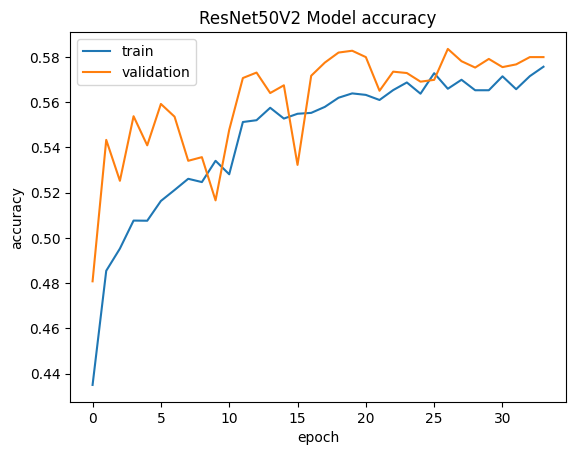

In [48]:
plt.plot(history_resnet.history["accuracy"])
plt.plot(history_resnet.history["val_accuracy"])
plt.title("ResNet50V2 Model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the ResNet Model**


In [49]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator_resnet.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator_resnet.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_resnet_model.evaluate(test_generator_resnet, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - accuracy: 0.6250 - loss: 0.9257


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5740 - loss: 0.9644 


Loss: 0.9330559968948364, Accuracy: 0.578125


### **Plotting Confusion Matrix**



1/4 ━━━━━━━━━━━━━━━━━━━━ 2s 866ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step  


              precision    recall  f1-score   support

       happy       0.57      0.62      0.60        32
     neutral       0.40      0.53      0.45        32
         sad       0.71      0.38      0.49        32
    surprise       0.76      0.78      0.77        32

    accuracy                           0.58       128
   macro avg       0.61      0.58      0.58       128
weighted avg       0.61      0.58      0.58       128



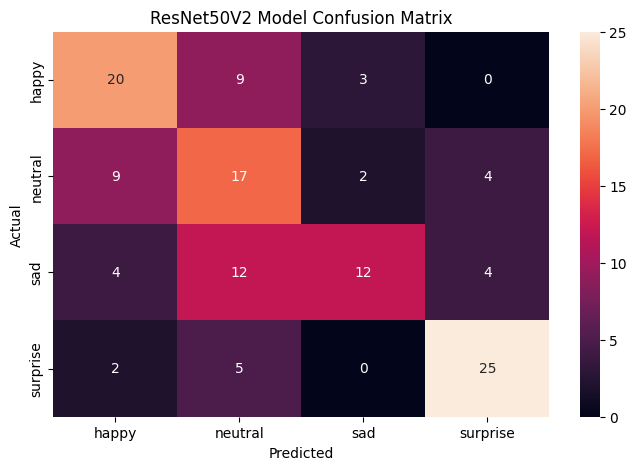

In [50]:
pred_probabilities = new_resnet_model.predict(test_generator_resnet, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator_resnet.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.title("ResNet50V2 Model Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The ResNet50V2 model was customized for the task, using **24,688,324 total parameters**, with **1,123,396 of those being trainable**.
- The training accuracy of the model plateaued at approximately **57.59%**, with the validation accuracy peaking around **62.50%**.
- The test accuracy achieved was **61.72%**, indicating a modest performance in predicting the facial emotions on unseen images.
- The model had varying success with different emotions, performing best on 'happy' with a precision of **0.64** and an f1-score of **0.70**, and least effectively on 'neutral', with a lower f1-score of **0.45**.
- We have chosen also the ResNet50V2 over the other models from this family (ResNet101V2 and ResNet152V2) for the size being smaller and the computational efficiency of the model, which we found more suitable for the task we had to accomplish.


## **EfficientNet Model**


In [51]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [52]:
efficient_model = EfficientNetV2B0(
    weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers)
)
# Making all the layers of the efficient_model model non-trainable. i.e. freezing them
for layer in efficient_model.layers:
    layer.trainable = False

efficient_model.summary()

Model: "efficientnetv2-b0"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 48, 48, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 48, 48, 3) │          0 │ input_layer[0][0] │
│ (Rescaling)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 48, 48, 3) │          0 │ rescaling[0][0]   │
│ (Normalization)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 24, 24,    │        864 │ normalization[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 24, 24,    │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 24, 24,    │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 24, 24,    │      4,608 │ stem_activation[… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 24, 24,    │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 24, 24,    │          0 │ block1a_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 12, 12,    │      9,216 │ block1a_project_… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 12, 12,    │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 12, 12,    │          0 │ block2a_expand_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, 12, 12,    │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, 12, 12,    │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, 12, 12,    │     36,864 │ block2a_project_… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, 12, 12,    │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, 12, 12,    │          0 │ block2b_expand_b

 Total params: 5,919,312 (22.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 5,919,312 (22.58 MB)

### **Model Building**

- Import EfficientNet upto the layer of your choice and add Fully Connected layers on top of it.


In [53]:
new_efficient_model = Sequential()
new_efficient_model.add(efficient_model)

# Reduces each feature map to a single value by averaging all elements
new_efficient_model.add(GlobalAveragePooling2D())

# Adding full connected layers
new_efficient_model.add(Dense(256, activation="relu"))
new_efficient_model.add(Dense(128, activation="relu"))

# Output Layer
new_efficient_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.01)

### **Compiling and Training the Model**


In [54]:
new_efficient_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_efficient_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetv2-b0 (Functional)  │ ?                      │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ ?                      │   0 (unbuilt) │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,919,312 (22.58 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 5,919,312 (22.58 MB)

In [55]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

# Define the saving the best model callback
mc = ModelCheckpoint(
    f"{results_path}/best_model_efficient_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Fitting the model with 40 epochs and using validation set
history_efficient = new_efficient_model.fit(
    train_generator_efficientnet,
    epochs=40,
    validation_data=validation_generator_efficientnet,
    callbacks=[reduce_lr, mc, delayed_early_stopping],
)

Epoch 1/40


/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


I0000 00:00:1712795242.855338 1509123 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_11837', 32 bytes spill stores, 32 bytes spill loads

I0000 00:00:1712795242.912001 1509129 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_11837', 40 bytes spill stores, 40 bytes spill loads



I0000 00:00:1712795243.210471 1509126 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_11548', 32 bytes spill stores, 32 bytes spill loads

I0000 00:00:1712795243.323623 1509129 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_11837', 4 bytes spill stores, 4 bytes spill loads



I0000 00:00:1712795243.486678 1509130 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_11858', 4 bytes spill stores, 4 bytes spill loads



I0000 00:00:1712795243.743913 1509132 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_11548', 244 bytes spill stores, 244 bytes spill loads




  1/473 ━━━━━━━━━━━━━━━━━━━━ 2:55:47 22s/step - accuracy: 0.4062 - loss: 1.3525


  5/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.3559 - loss: 2.2122    


  8/473 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.3463 - loss: 2.2160


 11/473 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.3443 - loss: 2.1482


 14/473 ━━━━━━━━━━━━━━━━━━━━ 8s 18ms/step - accuracy: 0.3431 - loss: 2.0794


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.3430 - loss: 2.0372


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3419 - loss: 1.9996


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3416 - loss: 1.9493


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3426 - loss: 1.9062


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.3434 - loss: 1.8693


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.3442 - loss: 1.8378


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3447 - loss: 1.8099


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3459 - loss: 1.7846


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3469 - loss: 1.7618


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3480 - loss: 1.7410


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3496 - loss: 1.7160


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3506 - loss: 1.7045


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3521 - loss: 1.6883


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.3536 - loss: 1.6734

I0000 00:00:1712795261.341273 1509630 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_11548', 20 bytes spill stores, 20 bytes spill loads




 56/473 ━━━━━━━━━━━━━━━━━━━━ 2:05 301ms/step - accuracy: 0.3546 - loss: 1.6641


 60/473 ━━━━━━━━━━━━━━━━━━━━ 1:56 281ms/step - accuracy: 0.3566 - loss: 1.6468


 62/473 ━━━━━━━━━━━━━━━━━━━━ 1:52 273ms/step - accuracy: 0.3576 - loss: 1.6387


 65/473 ━━━━━━━━━━━━━━━━━━━━ 1:46 261ms/step - accuracy: 0.3590 - loss: 1.6273


 68/473 ━━━━━━━━━━━━━━━━━━━━ 1:41 250ms/step - accuracy: 0.3605 - loss: 1.6165


 70/473 ━━━━━━━━━━━━━━━━━━━━ 1:38 244ms/step - accuracy: 0.3616 - loss: 1.6096


 73/473 ━━━━━━━━━━━━━━━━━━━━ 1:33 235ms/step - accuracy: 0.3632 - loss: 1.5998


 76/473 ━━━━━━━━━━━━━━━━━━━━ 1:29 226ms/step - accuracy: 0.3647 - loss: 1.5905


 79/473 ━━━━━━━━━━━━━━━━━━━━ 1:26 218ms/step - accuracy: 0.3662 - loss: 1.5818


 82/473 ━━━━━━━━━━━━━━━━━━━━ 1:22 211ms/step - accuracy: 0.3676 - loss: 1.5734


 85/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.3689 - loss: 1.5655


 88/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 198ms/step - accuracy: 0.3702 - loss: 1.5580


 91/473 ━━━━━━━━━━━━━━━━━━━━ 1:13 192ms/step - accuracy: 0.3714 - loss: 1.5508


 94/473 ━━━━━━━━━━━━━━━━━━━━ 1:10 186ms/step - accuracy: 0.3726 - loss: 1.5440


 97/473 ━━━━━━━━━━━━━━━━━━━━ 1:08 181ms/step - accuracy: 0.3737 - loss: 1.5375


100/473 ━━━━━━━━━━━━━━━━━━━━ 1:05 176ms/step - accuracy: 0.3748 - loss: 1.5313


103/473 ━━━━━━━━━━━━━━━━━━━━ 1:03 172ms/step - accuracy: 0.3758 - loss: 1.5254


106/473 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - accuracy: 0.3768 - loss: 1.5198


109/473 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - accuracy: 0.3779 - loss: 1.5144 


112/473 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - accuracy: 0.3789 - loss: 1.5091


115/473 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - accuracy: 0.3799 - loss: 1.5041


118/473 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - accuracy: 0.3809 - loss: 1.4992


121/473 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - accuracy: 0.3819 - loss: 1.4946


124/473 ━━━━━━━━━━━━━━━━━━━━ 50s 146ms/step - accuracy: 0.3828 - loss: 1.4901


127/473 ━━━━━━━━━━━━━━━━━━━━ 49s 143ms/step - accuracy: 0.3838 - loss: 1.4858


130/473 ━━━━━━━━━━━━━━━━━━━━ 47s 140ms/step - accuracy: 0.3847 - loss: 1.4815


133/473 ━━━━━━━━━━━━━━━━━━━━ 46s 137ms/step - accuracy: 0.3856 - loss: 1.4774


135/473 ━━━━━━━━━━━━━━━━━━━━ 45s 135ms/step - accuracy: 0.3862 - loss: 1.4747


137/473 ━━━━━━━━━━━━━━━━━━━━ 44s 134ms/step - accuracy: 0.3868 - loss: 1.4721


140/473 ━━━━━━━━━━━━━━━━━━━━ 43s 131ms/step - accuracy: 0.3877 - loss: 1.4682


143/473 ━━━━━━━━━━━━━━━━━━━━ 42s 129ms/step - accuracy: 0.3885 - loss: 1.4645


146/473 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.3893 - loss: 1.4609


149/473 ━━━━━━━━━━━━━━━━━━━━ 40s 124ms/step - accuracy: 0.3901 - loss: 1.4574


151/473 ━━━━━━━━━━━━━━━━━━━━ 39s 123ms/step - accuracy: 0.3907 - loss: 1.4550


154/473 ━━━━━━━━━━━━━━━━━━━━ 38s 121ms/step - accuracy: 0.3915 - loss: 1.4517


157/473 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - accuracy: 0.3922 - loss: 1.4484


160/473 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - accuracy: 0.3930 - loss: 1.4452


163/473 ━━━━━━━━━━━━━━━━━━━━ 35s 116ms/step - accuracy: 0.3937 - loss: 1.4422


166/473 ━━━━━━━━━━━━━━━━━━━━ 34s 114ms/step - accuracy: 0.3944 - loss: 1.4392


169/473 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - accuracy: 0.3951 - loss: 1.4363


172/473 ━━━━━━━━━━━━━━━━━━━━ 33s 111ms/step - accuracy: 0.3958 - loss: 1.4335


175/473 ━━━━━━━━━━━━━━━━━━━━ 32s 109ms/step - accuracy: 0.3964 - loss: 1.4307


178/473 ━━━━━━━━━━━━━━━━━━━━ 31s 107ms/step - accuracy: 0.3970 - loss: 1.4280


181/473 ━━━━━━━━━━━━━━━━━━━━ 30s 106ms/step - accuracy: 0.3976 - loss: 1.4254


184/473 ━━━━━━━━━━━━━━━━━━━━ 30s 105ms/step - accuracy: 0.3982 - loss: 1.4229


187/473 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - accuracy: 0.3988 - loss: 1.4205


190/473 ━━━━━━━━━━━━━━━━━━━━ 28s 102ms/step - accuracy: 0.3994 - loss: 1.4181


193/473 ━━━━━━━━━━━━━━━━━━━━ 28s 101ms/step - accuracy: 0.4000 - loss: 1.4157


196/473 ━━━━━━━━━━━━━━━━━━━━ 27s 99ms/step - accuracy: 0.4005 - loss: 1.4135 


199/473 ━━━━━━━━━━━━━━━━━━━━ 26s 98ms/step - accuracy: 0.4010 - loss: 1.4113


202/473 ━━━━━━━━━━━━━━━━━━━━ 26s 97ms/step - accuracy: 0.4016 - loss: 1.4091


205/473 ━━━━━━━━━━━━━━━━━━━━ 25s 96ms/step - accuracy: 0.4021 - loss: 1.4069


208/473 ━━━━━━━━━━━━━━━━━━━━ 25s 95ms/step - accuracy: 0.4026 - loss: 1.4048


211/473 ━━━━━━━━━━━━━━━━━━━━ 24s 94ms/step - accuracy: 0.4032 - loss: 1.4027


214/473 ━━━━━━━━━━━━━━━━━━━━ 23s 93ms/step - accuracy: 0.4037 - loss: 1.4007


217/473 ━━━━━━━━━━━━━━━━━━━━ 23s 92ms/step - accuracy: 0.4042 - loss: 1.3987


220/473 ━━━━━━━━━━━━━━━━━━━━ 22s 91ms/step - accuracy: 0.4048 - loss: 1.3967


223/473 ━━━━━━━━━━━━━━━━━━━━ 22s 90ms/step - accuracy: 0.4053 - loss: 1.3948


226/473 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - accuracy: 0.4058 - loss: 1.3929


229/473 ━━━━━━━━━━━━━━━━━━━━ 21s 88ms/step - accuracy: 0.4063 - loss: 1.3910


232/473 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - accuracy: 0.4068 - loss: 1.3892


235/473 ━━━━━━━━━━━━━━━━━━━━ 20s 86ms/step - accuracy: 0.4073 - loss: 1.3875


238/473 ━━━━━━━━━━━━━━━━━━━━ 20s 85ms/step - accuracy: 0.4078 - loss: 1.3857


241/473 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - accuracy: 0.4082 - loss: 1.3840


244/473 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - accuracy: 0.4087 - loss: 1.3823


247/473 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - accuracy: 0.4092 - loss: 1.3807


250/473 ━━━━━━━━━━━━━━━━━━━━ 18s 82ms/step - accuracy: 0.4096 - loss: 1.3790


253/473 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - accuracy: 0.4101 - loss: 1.3775


256/473 ━━━━━━━━━━━━━━━━━━━━ 17s 81ms/step - accuracy: 0.4105 - loss: 1.3759


259/473 ━━━━━━━━━━━━━━━━━━━━ 17s 80ms/step - accuracy: 0.4109 - loss: 1.3744


262/473 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.4114 - loss: 1.3729


265/473 ━━━━━━━━━━━━━━━━━━━━ 16s 79ms/step - accuracy: 0.4118 - loss: 1.3714


268/473 ━━━━━━━━━━━━━━━━━━━━ 15s 78ms/step - accuracy: 0.4122 - loss: 1.3700


271/473 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - accuracy: 0.4126 - loss: 1.3686


274/473 ━━━━━━━━━━━━━━━━━━━━ 15s 77ms/step - accuracy: 0.4129 - loss: 1.3672


277/473 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - accuracy: 0.4133 - loss: 1.3659


280/473 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.4137 - loss: 1.3645


283/473 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.4140 - loss: 1.3632


286/473 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.4144 - loss: 1.3619


289/473 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.4147 - loss: 1.3607


292/473 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4150 - loss: 1.3594


294/473 ━━━━━━━━━━━━━━━━━━━━ 13s 73ms/step - accuracy: 0.4152 - loss: 1.3586


297/473 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4155 - loss: 1.3574


300/473 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - accuracy: 0.4158 - loss: 1.3563


303/473 ━━━━━━━━━━━━━━━━━━━━ 12s 71ms/step - accuracy: 0.4161 - loss: 1.3551


306/473 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - accuracy: 0.4165 - loss: 1.3539


309/473 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4168 - loss: 1.3528


312/473 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - accuracy: 0.4171 - loss: 1.3517


315/473 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4174 - loss: 1.3506


318/473 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4176 - loss: 1.3495


320/473 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - accuracy: 0.4178 - loss: 1.3488


323/473 ━━━━━━━━━━━━━━━━━━━━ 10s 68ms/step - accuracy: 0.4181 - loss: 1.3477


326/473 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - accuracy: 0.4184 - loss: 1.3467 


329/473 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4187 - loss: 1.3457


332/473 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - accuracy: 0.4190 - loss: 1.3447


335/473 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4193 - loss: 1.3437


337/473 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - accuracy: 0.4195 - loss: 1.3431


340/473 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - accuracy: 0.4197 - loss: 1.3421


342/473 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - accuracy: 0.4199 - loss: 1.3415


345/473 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - accuracy: 0.4201 - loss: 1.3405


348/473 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - accuracy: 0.4204 - loss: 1.3396


350/473 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - accuracy: 0.4205 - loss: 1.3390


353/473 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.4208 - loss: 1.3381


356/473 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.4210 - loss: 1.3372


359/473 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.4212 - loss: 1.3363


362/473 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - accuracy: 0.4215 - loss: 1.3354


365/473 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step - accuracy: 0.4217 - loss: 1.3346


368/473 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - accuracy: 0.4219 - loss: 1.3337


371/473 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - accuracy: 0.4222 - loss: 1.3329


374/473 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - accuracy: 0.4224 - loss: 1.3320


377/473 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - accuracy: 0.4226 - loss: 1.3312


380/473 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - accuracy: 0.4229 - loss: 1.3304


383/473 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step - accuracy: 0.4231 - loss: 1.3296


386/473 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - accuracy: 0.4233 - loss: 1.3288


389/473 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step - accuracy: 0.4235 - loss: 1.3280


392/473 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.4237 - loss: 1.3272


395/473 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step - accuracy: 0.4240 - loss: 1.3264


398/473 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.4242 - loss: 1.3257


401/473 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.4244 - loss: 1.3249


404/473 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step - accuracy: 0.4246 - loss: 1.3242


407/473 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.4248 - loss: 1.3234


410/473 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.4250 - loss: 1.3227


413/473 ━━━━━━━━━━━━━━━━━━━━ 3s 58ms/step - accuracy: 0.4252 - loss: 1.3220


416/473 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.4254 - loss: 1.3213


419/473 ━━━━━━━━━━━━━━━━━━━━ 3s 57ms/step - accuracy: 0.4256 - loss: 1.3206


422/473 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.4258 - loss: 1.3199


425/473 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.4260 - loss: 1.3192


428/473 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.4262 - loss: 1.3186


431/473 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.4264 - loss: 1.3179


434/473 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.4266 - loss: 1.3172


437/473 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.4268 - loss: 1.3166


440/473 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.4270 - loss: 1.3159


443/473 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.4271 - loss: 1.3153


446/473 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.4273 - loss: 1.3147


449/473 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - accuracy: 0.4275 - loss: 1.3140


452/473 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.4277 - loss: 1.3134


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.4279 - loss: 1.3128


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.4281 - loss: 1.3121


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.4283 - loss: 1.3115


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.4285 - loss: 1.3109


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.4288 - loss: 1.3099

I0000 00:00:1712795281.118442 1510282 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'triton_gemm_dot_2315', 260 bytes spill stores, 260 bytes spill loads




Epoch 1: val_accuracy improved from -inf to 0.55515, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 55s 69ms/step - accuracy: 0.4291 - loss: 1.3089 - val_accuracy: 0.5552 - val_loss: 1.0737 - learning_rate: 0.0100


Epoch 2/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.3750 - loss: 1.3133


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4518 - loss: 1.2221   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4717 - loss: 1.1905


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4777 - loss: 1.1776


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4800 - loss: 1.1722


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4825 - loss: 1.1692


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4841 - loss: 1.1669


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4859 - loss: 1.1642


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4872 - loss: 1.1620


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4887 - loss: 1.1603


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4894 - loss: 1.1596


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4897 - loss: 1.1592


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4895 - loss: 1.1591


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4896 - loss: 1.1588


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4900 - loss: 1.1580


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4902 - loss: 1.1573


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4904 - loss: 1.1568


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4904 - loss: 1.1565


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4905 - loss: 1.1561


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4907 - loss: 1.1558


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4910 - loss: 1.1557


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4913 - loss: 1.1554


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4915 - loss: 1.1551


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4917 - loss: 1.1549


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4919 - loss: 1.1547


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4922 - loss: 1.1543


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4924 - loss: 1.1540


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4926 - loss: 1.1537


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4929 - loss: 1.1534


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.4931 - loss: 1.1533


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4934 - loss: 1.1531


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4937 - loss: 1.1529


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4939 - loss: 1.1527


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4943 - loss: 1.1525


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4945 - loss: 1.1522


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4948 - loss: 1.1519


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4950 - loss: 1.1518


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4951 - loss: 1.1517


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4953 - loss: 1.1515


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4955 - loss: 1.1514


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4956 - loss: 1.1512


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4959 - loss: 1.1510


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4961 - loss: 1.1507


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4963 - loss: 1.1503


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4966 - loss: 1.1499


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4969 - loss: 1.1495


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4970 - loss: 1.1494


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4973 - loss: 1.1491


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.4975 - loss: 1.1488


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4978 - loss: 1.1485


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4980 - loss: 1.1483


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4982 - loss: 1.1480


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4985 - loss: 1.1477


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4987 - loss: 1.1475


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4989 - loss: 1.1473


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4991 - loss: 1.1471


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4992 - loss: 1.1470


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4993 - loss: 1.1468


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4994 - loss: 1.1467


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4996 - loss: 1.1466


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4996 - loss: 1.1465


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4997 - loss: 1.1465


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4997 - loss: 1.1464


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4998 - loss: 1.1463


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.4998 - loss: 1.1463


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4998 - loss: 1.1462


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1462


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1461


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1461


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1461


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5000 - loss: 1.1461


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5000 - loss: 1.1460


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5000 - loss: 1.1460


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5000 - loss: 1.1460


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5000 - loss: 1.1461


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1461


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1461


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1462


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1462


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1463


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4999 - loss: 1.1463


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.4998 - loss: 1.1463


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4998 - loss: 1.1464


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4998 - loss: 1.1464


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4998 - loss: 1.1464


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4998 - loss: 1.1464


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4998 - loss: 1.1464


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4998 - loss: 1.1464


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4998 - loss: 1.1464


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4997 - loss: 1.1464


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4997 - loss: 1.1464


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4997 - loss: 1.1464


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4997 - loss: 1.1465


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4997 - loss: 1.1465


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4996 - loss: 1.1465


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4996 - loss: 1.1465


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4996 - loss: 1.1466


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4996 - loss: 1.1466


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.4996 - loss: 1.1466


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4995 - loss: 1.1467


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4994 - loss: 1.1467


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4994 - loss: 1.1467


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4994 - loss: 1.1467


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4994 - loss: 1.1467


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.4994 - loss: 1.1467


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4994 - loss: 1.1467


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4994 - loss: 1.1467


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4995 - loss: 1.1466


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4995 - loss: 1.1466


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4995 - loss: 1.1466


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4995 - loss: 1.1465


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4995 - loss: 1.1465


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4995 - loss: 1.1464


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4996 - loss: 1.1464


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4996 - loss: 1.1463


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4996 - loss: 1.1463


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4997 - loss: 1.1462


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4997 - loss: 1.1462


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4997 - loss: 1.1461


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4997 - loss: 1.1461


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.4998 - loss: 1.1460


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4998 - loss: 1.1460


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4998 - loss: 1.1459


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4999 - loss: 1.1459


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4999 - loss: 1.1458


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.4999 - loss: 1.1458


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5000 - loss: 1.1457


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5000 - loss: 1.1457


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5000 - loss: 1.1456


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5000 - loss: 1.1456


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5000 - loss: 1.1455


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5001 - loss: 1.1455


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5001 - loss: 1.1454


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5001 - loss: 1.1454


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5001 - loss: 1.1454


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5001 - loss: 1.1453


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5001 - loss: 1.1453


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1453


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1452


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1452


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1452


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1452


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1451


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1451


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1451


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1451


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1451


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1451


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1450


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1450


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1450


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5002 - loss: 1.1450


Epoch 2: val_accuracy improved from 0.55515 to 0.56339, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5002 - loss: 1.1450 - val_accuracy: 0.5634 - val_loss: 1.0377 - learning_rate: 0.0100


Epoch 3/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - accuracy: 0.5625 - loss: 1.0918


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5241 - loss: 1.1214   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5147 - loss: 1.1122


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5221 - loss: 1.0935


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5232 - loss: 1.0905


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5222 - loss: 1.0908


 17/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5216 - loss: 1.0923


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5218 - loss: 1.0918 


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5204 - loss: 1.0937


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5202 - loss: 1.0953


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5200 - loss: 1.0968


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5191 - loss: 1.0988


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5180 - loss: 1.1009


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5175 - loss: 1.1027


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5172 - loss: 1.1045


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5171 - loss: 1.1058


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5168 - loss: 1.1072


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5161 - loss: 1.1087


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5154 - loss: 1.1103


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5149 - loss: 1.1115


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5146 - loss: 1.1126


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5142 - loss: 1.1136


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5139 - loss: 1.1146


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5137 - loss: 1.1155


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5134 - loss: 1.1162


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5130 - loss: 1.1171


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5127 - loss: 1.1177


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5125 - loss: 1.1183


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5122 - loss: 1.1189


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5119 - loss: 1.1195


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5116 - loss: 1.1200


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5115 - loss: 1.1205


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5114 - loss: 1.1208


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5113 - loss: 1.1211


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5113 - loss: 1.1213


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5113 - loss: 1.1214


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5113 - loss: 1.1214


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5114 - loss: 1.1215


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5115 - loss: 1.1214


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5115 - loss: 1.1214


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5116 - loss: 1.1214


123/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5116 - loss: 1.1214


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5116 - loss: 1.1214


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5116 - loss: 1.1214


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5115 - loss: 1.1215


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5115 - loss: 1.1215


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5114 - loss: 1.1216


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5113 - loss: 1.1216


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5112 - loss: 1.1217


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5112 - loss: 1.1217


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5111 - loss: 1.1217


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5111 - loss: 1.1218


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5110 - loss: 1.1219


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5110 - loss: 1.1219


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5110 - loss: 1.1220


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5110 - loss: 1.1220


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5110 - loss: 1.1220


171/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5110 - loss: 1.1221


174/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5109 - loss: 1.1221


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5109 - loss: 1.1222


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5109 - loss: 1.1222


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5109 - loss: 1.1223


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5109 - loss: 1.1223


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5108 - loss: 1.1224


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5108 - loss: 1.1225


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5108 - loss: 1.1225


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5108 - loss: 1.1226


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5107 - loss: 1.1226


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5107 - loss: 1.1227


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5107 - loss: 1.1228


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5106 - loss: 1.1228


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5106 - loss: 1.1229


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5106 - loss: 1.1230


219/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5106 - loss: 1.1230


222/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1231


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1232


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1233


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1233


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1234


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1234


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1235


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1235


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1236


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1237


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1237


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1238


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1238


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1239


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5105 - loss: 1.1240


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5104 - loss: 1.1241


270/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5104 - loss: 1.1241


273/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5104 - loss: 1.1242


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5104 - loss: 1.1243


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5104 - loss: 1.1243


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5103 - loss: 1.1244


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5103 - loss: 1.1245


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5103 - loss: 1.1245


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5103 - loss: 1.1246


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5103 - loss: 1.1246


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5103 - loss: 1.1247


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5102 - loss: 1.1248


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5102 - loss: 1.1248


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.5102 - loss: 1.1249


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5102 - loss: 1.1249


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5102 - loss: 1.1250


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.5101 - loss: 1.1251


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.5101 - loss: 1.1252


321/473 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.5101 - loss: 1.1252


324/473 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.5100 - loss: 1.1253


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5100 - loss: 1.1254


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5100 - loss: 1.1255


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5100 - loss: 1.1255


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5099 - loss: 1.1256


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5099 - loss: 1.1257


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5099 - loss: 1.1257


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5098 - loss: 1.1258


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5098 - loss: 1.1259


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5098 - loss: 1.1259


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5097 - loss: 1.1260


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5097 - loss: 1.1260


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5097 - loss: 1.1261


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.5097 - loss: 1.1261


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5096 - loss: 1.1262


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5096 - loss: 1.1262


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5096 - loss: 1.1262


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5096 - loss: 1.1263


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5095 - loss: 1.1264


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5095 - loss: 1.1264


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5095 - loss: 1.1265


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5094 - loss: 1.1266


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5094 - loss: 1.1266


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5094 - loss: 1.1267


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5093 - loss: 1.1268


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5093 - loss: 1.1268


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5093 - loss: 1.1269


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5092 - loss: 1.1270


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5092 - loss: 1.1270


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5092 - loss: 1.1271


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5091 - loss: 1.1271


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5091 - loss: 1.1272


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5091 - loss: 1.1272


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5091 - loss: 1.1273


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5090 - loss: 1.1273


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5090 - loss: 1.1273


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5090 - loss: 1.1274


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5090 - loss: 1.1274


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5089 - loss: 1.1275


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5089 - loss: 1.1275


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5089 - loss: 1.1275


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5088 - loss: 1.1276


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5088 - loss: 1.1276


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5088 - loss: 1.1276


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5088 - loss: 1.1276


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5087 - loss: 1.1277


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5087 - loss: 1.1277


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5087 - loss: 1.1277


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5087 - loss: 1.1277


Epoch 3: val_accuracy improved from 0.56339 to 0.56701, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5086 - loss: 1.1278 - val_accuracy: 0.5670 - val_loss: 1.0315 - learning_rate: 0.0100


Epoch 4/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.6562 - loss: 0.9819


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6562 - loss: 0.9771   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6397 - loss: 0.9955


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6228 - loss: 1.0150


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6086 - loss: 1.0337


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5964 - loss: 1.0466


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5870 - loss: 1.0550


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5798 - loss: 1.0601


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5760 - loss: 1.0623


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5712 - loss: 1.0653


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5672 - loss: 1.0683


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5636 - loss: 1.0708


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5603 - loss: 1.0730


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5571 - loss: 1.0751


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5544 - loss: 1.0765


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5524 - loss: 1.0775


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5506 - loss: 1.0781


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5489 - loss: 1.0788


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5479 - loss: 1.0793


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5470 - loss: 1.0798


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5456 - loss: 1.0804


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5443 - loss: 1.0812


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5430 - loss: 1.0819


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5416 - loss: 1.0828


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5403 - loss: 1.0836


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5394 - loss: 1.0841


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5382 - loss: 1.0850


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5371 - loss: 1.0858


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5362 - loss: 1.0865


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5353 - loss: 1.0872


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5345 - loss: 1.0877


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5338 - loss: 1.0881


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5332 - loss: 1.0885


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5326 - loss: 1.0888


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5320 - loss: 1.0890


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5314 - loss: 1.0891


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5310 - loss: 1.0893


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5305 - loss: 1.0895


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5302 - loss: 1.0897


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5298 - loss: 1.0898


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5294 - loss: 1.0900


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5290 - loss: 1.0902


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5288 - loss: 1.0904


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5284 - loss: 1.0906


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5281 - loss: 1.0907


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5278 - loss: 1.0909


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5275 - loss: 1.0910


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5273 - loss: 1.0911


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5270 - loss: 1.0913


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5267 - loss: 1.0914


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5264 - loss: 1.0915


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5261 - loss: 1.0917


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5259 - loss: 1.0918


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5257 - loss: 1.0920


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5255 - loss: 1.0921


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5252 - loss: 1.0923


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5250 - loss: 1.0925


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5248 - loss: 1.0927


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5246 - loss: 1.0929


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5244 - loss: 1.0931


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5242 - loss: 1.0933


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5241 - loss: 1.0936


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5239 - loss: 1.0938


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5237 - loss: 1.0940


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5236 - loss: 1.0942


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5234 - loss: 1.0944


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5233 - loss: 1.0946


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5232 - loss: 1.0947


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5231 - loss: 1.0949


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5230 - loss: 1.0950


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5230 - loss: 1.0951


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5229 - loss: 1.0953


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5228 - loss: 1.0954


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5228 - loss: 1.0956


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5227 - loss: 1.0957


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5227 - loss: 1.0959


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5226 - loss: 1.0960


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5226 - loss: 1.0962


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5226 - loss: 1.0963


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5225 - loss: 1.0965


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5224 - loss: 1.0966


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5224 - loss: 1.0967


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5223 - loss: 1.0969


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5223 - loss: 1.0970


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5222 - loss: 1.0972


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5222 - loss: 1.0973


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5221 - loss: 1.0975


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5221 - loss: 1.0976


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5221 - loss: 1.0978


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5220 - loss: 1.0979


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5220 - loss: 1.0980


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5219 - loss: 1.0982


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5219 - loss: 1.0984


275/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5218 - loss: 1.0985


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5218 - loss: 1.0986


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5217 - loss: 1.0988


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5217 - loss: 1.0989


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5216 - loss: 1.0990


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5216 - loss: 1.0991


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5215 - loss: 1.0992


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5215 - loss: 1.0994


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5214 - loss: 1.0995


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5214 - loss: 1.0996


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5213 - loss: 1.0997


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5212 - loss: 1.0999


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5212 - loss: 1.1000


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5211 - loss: 1.1001


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5210 - loss: 1.1002


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5210 - loss: 1.1004


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5209 - loss: 1.1005


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5208 - loss: 1.1006


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5207 - loss: 1.1008


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5206 - loss: 1.1009


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5206 - loss: 1.1010


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5205 - loss: 1.1011


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5204 - loss: 1.1012


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5204 - loss: 1.1014


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5203 - loss: 1.1015


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5202 - loss: 1.1016


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5201 - loss: 1.1018


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5200 - loss: 1.1019


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5200 - loss: 1.1020


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5199 - loss: 1.1021


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5198 - loss: 1.1022


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5198 - loss: 1.1023


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5197 - loss: 1.1025


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5196 - loss: 1.1026


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5196 - loss: 1.1027


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5195 - loss: 1.1028


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5194 - loss: 1.1029


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5194 - loss: 1.1031


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5193 - loss: 1.1032


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5192 - loss: 1.1033


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5192 - loss: 1.1034


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5191 - loss: 1.1035


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5191 - loss: 1.1036


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5190 - loss: 1.1038


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5190 - loss: 1.1039


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5189 - loss: 1.1040


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5189 - loss: 1.1041


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5188 - loss: 1.1042


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5188 - loss: 1.1043


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5187 - loss: 1.1044


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5187 - loss: 1.1045


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5186 - loss: 1.1046


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5186 - loss: 1.1047


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5185 - loss: 1.1048


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5185 - loss: 1.1049


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5184 - loss: 1.1050


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5184 - loss: 1.1052


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5184 - loss: 1.1052


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5183 - loss: 1.1053


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5183 - loss: 1.1054


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5182 - loss: 1.1055


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5182 - loss: 1.1056


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5181 - loss: 1.1057


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5181 - loss: 1.1059


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5181 - loss: 1.1059


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5180 - loss: 1.1060


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5179 - loss: 1.1063


Epoch 4: val_accuracy did not improve from 0.56701



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5179 - loss: 1.1063 - val_accuracy: 0.5584 - val_loss: 1.0353 - learning_rate: 0.0100


Epoch 5/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - accuracy: 0.6250 - loss: 0.9951


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5807 - loss: 0.9968   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5690 - loss: 1.0114


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5570 - loss: 1.0343


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5476 - loss: 1.0543


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5409 - loss: 1.0699


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5370 - loss: 1.0826


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5338 - loss: 1.0913


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5302 - loss: 1.0983


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5276 - loss: 1.1039


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5255 - loss: 1.1087


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5237 - loss: 1.1124


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5224 - loss: 1.1156


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5216 - loss: 1.1178


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5209 - loss: 1.1195


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5206 - loss: 1.1206


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5205 - loss: 1.1211


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5207 - loss: 1.1211


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5210 - loss: 1.1209


 58/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5213 - loss: 1.1207


 61/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5214 - loss: 1.1204


 64/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5216 - loss: 1.1202


 67/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5217 - loss: 1.1201


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5217 - loss: 1.1202


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5217 - loss: 1.1204


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5216 - loss: 1.1206


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5214 - loss: 1.1207


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5211 - loss: 1.1211


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5208 - loss: 1.1216


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5206 - loss: 1.1220


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5203 - loss: 1.1224


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5201 - loss: 1.1227


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5198 - loss: 1.1231


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5196 - loss: 1.1235


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5194 - loss: 1.1240


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5191 - loss: 1.1244


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5189 - loss: 1.1248


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5187 - loss: 1.1253


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5185 - loss: 1.1256


116/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5182 - loss: 1.1259


119/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5179 - loss: 1.1263


122/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5176 - loss: 1.1266


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5174 - loss: 1.1269


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5171 - loss: 1.1272


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5168 - loss: 1.1274


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5166 - loss: 1.1276


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5164 - loss: 1.1278


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5161 - loss: 1.1280


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5160 - loss: 1.1282


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5158 - loss: 1.1283


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5157 - loss: 1.1284


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5155 - loss: 1.1285


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5153 - loss: 1.1286


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5152 - loss: 1.1286


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5151 - loss: 1.1287


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5150 - loss: 1.1287


167/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5149 - loss: 1.1288


170/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5147 - loss: 1.1289


173/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5146 - loss: 1.1290


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5144 - loss: 1.1291


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5143 - loss: 1.1292


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5141 - loss: 1.1293


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5140 - loss: 1.1293


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5139 - loss: 1.1293


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5138 - loss: 1.1294


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5137 - loss: 1.1294


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5136 - loss: 1.1295


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5135 - loss: 1.1296


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5134 - loss: 1.1296


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5133 - loss: 1.1296


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5132 - loss: 1.1296


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5131 - loss: 1.1297


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.5131 - loss: 1.1297


218/473 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5130 - loss: 1.1297


221/473 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5130 - loss: 1.1297


224/473 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5129 - loss: 1.1296


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5129 - loss: 1.1296


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5128 - loss: 1.1296


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5128 - loss: 1.1296


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.5127 - loss: 1.1296


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5127 - loss: 1.1296


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5126 - loss: 1.1296


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5126 - loss: 1.1296


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5125 - loss: 1.1295


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5125 - loss: 1.1295


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5125 - loss: 1.1295


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5124 - loss: 1.1294


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5124 - loss: 1.1294


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5124 - loss: 1.1294


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5124 - loss: 1.1294


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5124 - loss: 1.1293


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5123 - loss: 1.1293


273/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5123 - loss: 1.1293


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5123 - loss: 1.1292


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5123 - loss: 1.1292


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5123 - loss: 1.1292


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5122 - loss: 1.1292


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5122 - loss: 1.1291


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5122 - loss: 1.1291


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5122 - loss: 1.1291


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1290


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1290


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1289


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1288


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1288


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1287


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1287


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1286


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5121 - loss: 1.1286


324/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5121 - loss: 1.1285


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5121 - loss: 1.1285


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5120 - loss: 1.1285


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5120 - loss: 1.1284


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5120 - loss: 1.1284


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5120 - loss: 1.1283


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5119 - loss: 1.1283


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5119 - loss: 1.1283


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5119 - loss: 1.1282


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5119 - loss: 1.1282


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5118 - loss: 1.1282


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5118 - loss: 1.1282


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5118 - loss: 1.1282


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5117 - loss: 1.1282


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5117 - loss: 1.1281


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5117 - loss: 1.1281


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5116 - loss: 1.1281


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5116 - loss: 1.1281


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5116 - loss: 1.1281


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5115 - loss: 1.1281


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5115 - loss: 1.1281


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5115 - loss: 1.1281


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5114 - loss: 1.1281


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5114 - loss: 1.1281


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5114 - loss: 1.1281


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5114 - loss: 1.1281


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5113 - loss: 1.1280


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5113 - loss: 1.1280


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5113 - loss: 1.1280


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5113 - loss: 1.1280


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5113 - loss: 1.1279


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5112 - loss: 1.1279


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5112 - loss: 1.1279


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1278


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1278


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1278


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1277


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1277


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1276


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1276


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1275


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1275


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1274


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1274


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5112 - loss: 1.1273


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5113 - loss: 1.1273


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5113 - loss: 1.1272


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5113 - loss: 1.1272


Epoch 5: val_accuracy did not improve from 0.56701



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5113 - loss: 1.1270 - val_accuracy: 0.5612 - val_loss: 1.0790 - learning_rate: 0.0100


Epoch 6/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:26 183ms/step - accuracy: 0.5000 - loss: 0.9738


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5228 - loss: 1.0491   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5348 - loss: 1.0663


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5303 - loss: 1.0826


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5297 - loss: 1.0888


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5307 - loss: 1.0917


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5329 - loss: 1.0905


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5353 - loss: 1.0895


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5361 - loss: 1.0910


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5369 - loss: 1.0918


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5376 - loss: 1.0915


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5383 - loss: 1.0910


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5391 - loss: 1.0906


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5392 - loss: 1.0906


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5392 - loss: 1.0905


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5391 - loss: 1.0905


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5388 - loss: 1.0906


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5384 - loss: 1.0909


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5380 - loss: 1.0912


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5375 - loss: 1.0914


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5373 - loss: 1.0916


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5370 - loss: 1.0919


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5367 - loss: 1.0921


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5367 - loss: 1.0920


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5366 - loss: 1.0920


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5365 - loss: 1.0919


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5365 - loss: 1.0918


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5365 - loss: 1.0917


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5365 - loss: 1.0916


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5364 - loss: 1.0916


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5363 - loss: 1.0917


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5362 - loss: 1.0917


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5362 - loss: 1.0918


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5360 - loss: 1.0919


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5360 - loss: 1.0918


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5360 - loss: 1.0918


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5359 - loss: 1.0920


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5357 - loss: 1.0921


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5355 - loss: 1.0923


118/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5353 - loss: 1.0924


121/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5351 - loss: 1.0926


124/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5349 - loss: 1.0927


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5347 - loss: 1.0930


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5344 - loss: 1.0933


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5341 - loss: 1.0935


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5339 - loss: 1.0936


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5337 - loss: 1.0939


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5335 - loss: 1.0940


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5333 - loss: 1.0943


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5331 - loss: 1.0945


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5329 - loss: 1.0947


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5326 - loss: 1.0949


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5325 - loss: 1.0951


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5321 - loss: 1.0953


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5319 - loss: 1.0956


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5317 - loss: 1.0958


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5315 - loss: 1.0960


171/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5313 - loss: 1.0962


174/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5311 - loss: 1.0963


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5308 - loss: 1.0965


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5306 - loss: 1.0967


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5303 - loss: 1.0969


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5301 - loss: 1.0972


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5299 - loss: 1.0974


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5297 - loss: 1.0976


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5294 - loss: 1.0978


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5292 - loss: 1.0981


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5290 - loss: 1.0983


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5287 - loss: 1.0984


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5285 - loss: 1.0986


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5283 - loss: 1.0988


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5281 - loss: 1.0989


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5279 - loss: 1.0991


219/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5277 - loss: 1.0993


222/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5275 - loss: 1.0994


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5273 - loss: 1.0996


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5271 - loss: 1.0997


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5270 - loss: 1.0998


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5268 - loss: 1.0999


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5267 - loss: 1.1001


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5265 - loss: 1.1002


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5264 - loss: 1.1004


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5262 - loss: 1.1006


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5261 - loss: 1.1007


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5260 - loss: 1.1009


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5258 - loss: 1.1010


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5257 - loss: 1.1012


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5255 - loss: 1.1014


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5254 - loss: 1.1016


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5253 - loss: 1.1017


270/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5251 - loss: 1.1019


272/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5250 - loss: 1.1020


275/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5249 - loss: 1.1022


278/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5248 - loss: 1.1023


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5247 - loss: 1.1024


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5246 - loss: 1.1026


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5245 - loss: 1.1027


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5244 - loss: 1.1028


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5243 - loss: 1.1029


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5243 - loss: 1.1030


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5242 - loss: 1.1031


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5241 - loss: 1.1031


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5240 - loss: 1.1032


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5240 - loss: 1.1033


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5239 - loss: 1.1034


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5238 - loss: 1.1035


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5237 - loss: 1.1036


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5237 - loss: 1.1037


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5236 - loss: 1.1037


323/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5236 - loss: 1.1038


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5235 - loss: 1.1039


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5235 - loss: 1.1039


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5234 - loss: 1.1040


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5234 - loss: 1.1041


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5233 - loss: 1.1042


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5232 - loss: 1.1043


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5232 - loss: 1.1043


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5232 - loss: 1.1044


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5231 - loss: 1.1044


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5231 - loss: 1.1045


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5231 - loss: 1.1045


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5231 - loss: 1.1045


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5231 - loss: 1.1045


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5231 - loss: 1.1046


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5230 - loss: 1.1046


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5230 - loss: 1.1046


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1046


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1046


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1047


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1047


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1047


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1047


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1047


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5230 - loss: 1.1048


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5230 - loss: 1.1048


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5230 - loss: 1.1048


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5230 - loss: 1.1048


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5231 - loss: 1.1048


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5231 - loss: 1.1047


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5231 - loss: 1.1047


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5231 - loss: 1.1047


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5231 - loss: 1.1047


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5231 - loss: 1.1047


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5232 - loss: 1.1047


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5232 - loss: 1.1047


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5232 - loss: 1.1047


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5232 - loss: 1.1047


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5232 - loss: 1.1047


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5232 - loss: 1.1046


Epoch 6: val_accuracy did not improve from 0.56701



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5232 - loss: 1.1046 - val_accuracy: 0.5546 - val_loss: 1.0736 - learning_rate: 0.0100


Epoch 7/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - accuracy: 0.4062 - loss: 1.5171


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4889 - loss: 1.3080   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5020 - loss: 1.2414


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5070 - loss: 1.2142


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5116 - loss: 1.1969


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5150 - loss: 1.1841


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5171 - loss: 1.1746


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5185 - loss: 1.1658


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5189 - loss: 1.1596


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5185 - loss: 1.1549


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5189 - loss: 1.1506


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5194 - loss: 1.1469


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5199 - loss: 1.1435


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5202 - loss: 1.1414


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5207 - loss: 1.1384


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5211 - loss: 1.1356


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5217 - loss: 1.1329


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5222 - loss: 1.1305


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5229 - loss: 1.1280


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5233 - loss: 1.1258


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5239 - loss: 1.1237


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5242 - loss: 1.1223


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5245 - loss: 1.1212


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5249 - loss: 1.1199


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5254 - loss: 1.1188


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5257 - loss: 1.1177


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5259 - loss: 1.1168


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5261 - loss: 1.1159


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5262 - loss: 1.1153


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5263 - loss: 1.1145


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5265 - loss: 1.1138


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5266 - loss: 1.1130


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5267 - loss: 1.1123


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5269 - loss: 1.1116


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5270 - loss: 1.1109


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5272 - loss: 1.1102


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5275 - loss: 1.1092


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5278 - loss: 1.1084


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5280 - loss: 1.1078


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5283 - loss: 1.1070


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5285 - loss: 1.1063


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5286 - loss: 1.1057


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5288 - loss: 1.1052


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5290 - loss: 1.1047


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5291 - loss: 1.1042


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5292 - loss: 1.1038


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5293 - loss: 1.1034


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5295 - loss: 1.1029


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5296 - loss: 1.1026


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5297 - loss: 1.1022


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5298 - loss: 1.1019


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5299 - loss: 1.1015


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5300 - loss: 1.1013


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5300 - loss: 1.1010


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5301 - loss: 1.1007


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5302 - loss: 1.1005


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5304 - loss: 1.1003


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5304 - loss: 1.1001


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5306 - loss: 1.0999


174/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5306 - loss: 1.0996


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5307 - loss: 1.0995


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5308 - loss: 1.0993


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5309 - loss: 1.0991


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5309 - loss: 1.0990


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5310 - loss: 1.0988


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5311 - loss: 1.0986


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5311 - loss: 1.0985


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5312 - loss: 1.0983


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5313 - loss: 1.0982


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5314 - loss: 1.0980


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5314 - loss: 1.0979


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0977


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0976


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0974


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0973


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5317 - loss: 1.0972


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5317 - loss: 1.0971


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5318 - loss: 1.0970


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0969


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0968


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0967


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0966


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0966


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0965


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0964


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0963


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0962


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0961


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5320 - loss: 1.0960


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5320 - loss: 1.0958


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5320 - loss: 1.0957


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5320 - loss: 1.0956


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5321 - loss: 1.0955


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5321 - loss: 1.0954


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0953


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0952


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0952


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0951


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0950


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0950


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0949


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0948


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0948


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0947


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0946


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0945


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0945


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5322 - loss: 1.0944


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5322 - loss: 1.0943


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5322 - loss: 1.0942


324/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5322 - loss: 1.0941


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5322 - loss: 1.0941


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5323 - loss: 1.0940


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5323 - loss: 1.0939


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5323 - loss: 1.0938


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5323 - loss: 1.0937


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5324 - loss: 1.0936


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5324 - loss: 1.0935


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0934


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0933


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0932


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5326 - loss: 1.0932


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5326 - loss: 1.0931


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5326 - loss: 1.0930


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5326 - loss: 1.0930


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5327 - loss: 1.0929


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5327 - loss: 1.0928


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5327 - loss: 1.0928


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5327 - loss: 1.0927


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5327 - loss: 1.0927


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5328 - loss: 1.0926


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5328 - loss: 1.0926


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5328 - loss: 1.0925


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5328 - loss: 1.0925


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5328 - loss: 1.0924


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5328 - loss: 1.0924


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5328 - loss: 1.0923


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0923


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0922


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0922


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0922


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0921


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0921


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0920


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5329 - loss: 1.0920


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0920


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0919


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0919


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0918


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0918


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0918


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0918


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0918


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0917


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0917


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0917


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0917


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0916


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0916


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0916


Epoch 7: val_accuracy did not improve from 0.56701



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5329 - loss: 1.0916 - val_accuracy: 0.5124 - val_loss: 1.0865 - learning_rate: 0.0100


Epoch 8/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.5312 - loss: 1.1688


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5658 - loss: 1.0951   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5644 - loss: 1.0862


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5696 - loss: 1.0738


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5691 - loss: 1.0669


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5684 - loss: 1.0624


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5672 - loss: 1.0624


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5663 - loss: 1.0630


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5652 - loss: 1.0631


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5637 - loss: 1.0639


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5625 - loss: 1.0645


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5605 - loss: 1.0659


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5584 - loss: 1.0675


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5563 - loss: 1.0692


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5541 - loss: 1.0708


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5528 - loss: 1.0719


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5510 - loss: 1.0729


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5493 - loss: 1.0740


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5478 - loss: 1.0751


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5467 - loss: 1.0758


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5457 - loss: 1.0768


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5442 - loss: 1.0780


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5430 - loss: 1.0792


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5420 - loss: 1.0801


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5412 - loss: 1.0808


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5407 - loss: 1.0814


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5402 - loss: 1.0818


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5399 - loss: 1.0820


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5396 - loss: 1.0822


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5395 - loss: 1.0822


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5394 - loss: 1.0823


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5392 - loss: 1.0825


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5391 - loss: 1.0826


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5389 - loss: 1.0827


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5388 - loss: 1.0828


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5387 - loss: 1.0828


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5386 - loss: 1.0829


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5385 - loss: 1.0829


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5385 - loss: 1.0829


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5384 - loss: 1.0829


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5384 - loss: 1.0829


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5384 - loss: 1.0828


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5383 - loss: 1.0828


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5383 - loss: 1.0829


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5382 - loss: 1.0829


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5382 - loss: 1.0830


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5382 - loss: 1.0830


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5382 - loss: 1.0830


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5383 - loss: 1.0830


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5383 - loss: 1.0830


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5383 - loss: 1.0830


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5384 - loss: 1.0830


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5384 - loss: 1.0830


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5384 - loss: 1.0830


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5384 - loss: 1.0831


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5384 - loss: 1.0832


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5384 - loss: 1.0833


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5384 - loss: 1.0834


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5383 - loss: 1.0835


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5383 - loss: 1.0836


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5382 - loss: 1.0837


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5381 - loss: 1.0838


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5380 - loss: 1.0840


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5379 - loss: 1.0841


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5379 - loss: 1.0842


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5378 - loss: 1.0843


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5377 - loss: 1.0843


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5376 - loss: 1.0844


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5376 - loss: 1.0845


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5375 - loss: 1.0845


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5374 - loss: 1.0846


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5372 - loss: 1.0847


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5371 - loss: 1.0848


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5370 - loss: 1.0850


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5369 - loss: 1.0850


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5368 - loss: 1.0851


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5367 - loss: 1.0852


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5366 - loss: 1.0853


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5365 - loss: 1.0854


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5364 - loss: 1.0855


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5363 - loss: 1.0856


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5362 - loss: 1.0857


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5361 - loss: 1.0858


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5360 - loss: 1.0858


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5359 - loss: 1.0859


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5358 - loss: 1.0860


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5357 - loss: 1.0860


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5357 - loss: 1.0861


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5356 - loss: 1.0861


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5355 - loss: 1.0861


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5355 - loss: 1.0861


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5354 - loss: 1.0862


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5353 - loss: 1.0862


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5353 - loss: 1.0862


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5352 - loss: 1.0862


278/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5351 - loss: 1.0862


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5351 - loss: 1.0862


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5350 - loss: 1.0862


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5349 - loss: 1.0862


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5349 - loss: 1.0862


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5348 - loss: 1.0862


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5347 - loss: 1.0862


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5347 - loss: 1.0862


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5347 - loss: 1.0861


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5346 - loss: 1.0861


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5346 - loss: 1.0861


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5345 - loss: 1.0861


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5345 - loss: 1.0861


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5344 - loss: 1.0861


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5344 - loss: 1.0861


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5343 - loss: 1.0861


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5343 - loss: 1.0861


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5342 - loss: 1.0861


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5342 - loss: 1.0861


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5341 - loss: 1.0861


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5341 - loss: 1.0861


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5341 - loss: 1.0861


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5340 - loss: 1.0861


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5340 - loss: 1.0861


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5340 - loss: 1.0861


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5339 - loss: 1.0861


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5339 - loss: 1.0861


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5339 - loss: 1.0861


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5338 - loss: 1.0861


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5338 - loss: 1.0861


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5338 - loss: 1.0861


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5337 - loss: 1.0861


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5337 - loss: 1.0861


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5337 - loss: 1.0861


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5337 - loss: 1.0861


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5336 - loss: 1.0861


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5336 - loss: 1.0861


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5336 - loss: 1.0861


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5335 - loss: 1.0861


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5335 - loss: 1.0861


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5334 - loss: 1.0861


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5334 - loss: 1.0861


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5334 - loss: 1.0861


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5333 - loss: 1.0861


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5333 - loss: 1.0861


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5332 - loss: 1.0862


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5332 - loss: 1.0862


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5331 - loss: 1.0862


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5331 - loss: 1.0862


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5330 - loss: 1.0862


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5330 - loss: 1.0862


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5330 - loss: 1.0862


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0862


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0862


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5328 - loss: 1.0862


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5328 - loss: 1.0862


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5328 - loss: 1.0862


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5327 - loss: 1.0862


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5327 - loss: 1.0863


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5326 - loss: 1.0863


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5326 - loss: 1.0863


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0863


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0863


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0863


Epoch 8: val_accuracy improved from 0.56701 to 0.57103, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5324 - loss: 1.0863 - val_accuracy: 0.5710 - val_loss: 1.0222 - learning_rate: 0.0100


Epoch 9/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - accuracy: 0.6250 - loss: 0.9698


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5632 - loss: 1.0279   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5540 - loss: 1.0465


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5529 - loss: 1.0484


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5542 - loss: 1.0477


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5532 - loss: 1.0476


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5503 - loss: 1.0507


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5486 - loss: 1.0534


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5484 - loss: 1.0556


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5487 - loss: 1.0564


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5489 - loss: 1.0576


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5491 - loss: 1.0589


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5493 - loss: 1.0593


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5496 - loss: 1.0600


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5495 - loss: 1.0610


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5491 - loss: 1.0627


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5483 - loss: 1.0646


 48/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5476 - loss: 1.0659


 51/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5467 - loss: 1.0676


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5460 - loss: 1.0690


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5451 - loss: 1.0705


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5444 - loss: 1.0717


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5438 - loss: 1.0727


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5432 - loss: 1.0737


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5425 - loss: 1.0746


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5419 - loss: 1.0755


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5413 - loss: 1.0765


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5407 - loss: 1.0772


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5403 - loss: 1.0778


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5399 - loss: 1.0784


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5395 - loss: 1.0789


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5392 - loss: 1.0794


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5389 - loss: 1.0798


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5387 - loss: 1.0801


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5386 - loss: 1.0803


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5386 - loss: 1.0803


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5387 - loss: 1.0803


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5387 - loss: 1.0804


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5387 - loss: 1.0805


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5386 - loss: 1.0806


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5386 - loss: 1.0807


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5385 - loss: 1.0808


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5385 - loss: 1.0808


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5385 - loss: 1.0809


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5384 - loss: 1.0810


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5384 - loss: 1.0811


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5383 - loss: 1.0813


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5382 - loss: 1.0814


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5382 - loss: 1.0815


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5382 - loss: 1.0816


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5382 - loss: 1.0817


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5382 - loss: 1.0817


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5382 - loss: 1.0818


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5381 - loss: 1.0818


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5381 - loss: 1.0818


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5381 - loss: 1.0818


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5380 - loss: 1.0819


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5380 - loss: 1.0819


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5379 - loss: 1.0819


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5378 - loss: 1.0819


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5378 - loss: 1.0820


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5377 - loss: 1.0820


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5376 - loss: 1.0821


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5375 - loss: 1.0821


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5375 - loss: 1.0821


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5374 - loss: 1.0821


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5374 - loss: 1.0822


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5373 - loss: 1.0822


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5372 - loss: 1.0822


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5372 - loss: 1.0823


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5371 - loss: 1.0823


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5371 - loss: 1.0823


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5370 - loss: 1.0824


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5369 - loss: 1.0824


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5369 - loss: 1.0824


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5368 - loss: 1.0825


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5368 - loss: 1.0825


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5367 - loss: 1.0826


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5367 - loss: 1.0826


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5366 - loss: 1.0827


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5365 - loss: 1.0828


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5365 - loss: 1.0829


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5364 - loss: 1.0829


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5363 - loss: 1.0830


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5363 - loss: 1.0831


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5362 - loss: 1.0831


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5362 - loss: 1.0832


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5361 - loss: 1.0832


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5360 - loss: 1.0833


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5360 - loss: 1.0834


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5359 - loss: 1.0834


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5358 - loss: 1.0835


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5357 - loss: 1.0835


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5357 - loss: 1.0836


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5356 - loss: 1.0836


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5356 - loss: 1.0837


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5355 - loss: 1.0837


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5355 - loss: 1.0837


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5354 - loss: 1.0838


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5353 - loss: 1.0839


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5353 - loss: 1.0839


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5352 - loss: 1.0840


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5352 - loss: 1.0840


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5351 - loss: 1.0841


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5351 - loss: 1.0841


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5350 - loss: 1.0841


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5350 - loss: 1.0842


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5350 - loss: 1.0842


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5349 - loss: 1.0843


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5349 - loss: 1.0843


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5348 - loss: 1.0844


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5348 - loss: 1.0844


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5348 - loss: 1.0845


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5347 - loss: 1.0846


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5347 - loss: 1.0847


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5346 - loss: 1.0847


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5346 - loss: 1.0848


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5345 - loss: 1.0849


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5345 - loss: 1.0850


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5344 - loss: 1.0850


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5344 - loss: 1.0851


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5344 - loss: 1.0852


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5343 - loss: 1.0853


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5343 - loss: 1.0853


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5342 - loss: 1.0854


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5342 - loss: 1.0855


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5341 - loss: 1.0856


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5341 - loss: 1.0856


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5340 - loss: 1.0857


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5340 - loss: 1.0858


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5340 - loss: 1.0859


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5339 - loss: 1.0859


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5339 - loss: 1.0860


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5338 - loss: 1.0861


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5337 - loss: 1.0862


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5337 - loss: 1.0863


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5336 - loss: 1.0864


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5336 - loss: 1.0865


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5336 - loss: 1.0865


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5335 - loss: 1.0866


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5335 - loss: 1.0867


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5334 - loss: 1.0867


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5334 - loss: 1.0868


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5334 - loss: 1.0869


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5333 - loss: 1.0869


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5333 - loss: 1.0869


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5333 - loss: 1.0870


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5332 - loss: 1.0870


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5332 - loss: 1.0871


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5332 - loss: 1.0872


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5331 - loss: 1.0872


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5331 - loss: 1.0872


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5330 - loss: 1.0873


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5330 - loss: 1.0873


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5330 - loss: 1.0874


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0874


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0875


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5329 - loss: 1.0875


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5328 - loss: 1.0875


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5328 - loss: 1.0876


Epoch 9: val_accuracy did not improve from 0.57103



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5327 - loss: 1.0877 - val_accuracy: 0.5433 - val_loss: 1.0395 - learning_rate: 0.0100


Epoch 10/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:28 187ms/step - accuracy: 0.6562 - loss: 0.8568


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5859 - loss: 0.9892   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5549 - loss: 1.0283


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5516 - loss: 1.0330


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5511 - loss: 1.0351


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5498 - loss: 1.0370


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5478 - loss: 1.0400


 21/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5478 - loss: 1.0395


 24/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5479 - loss: 1.0395


 27/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5471 - loss: 1.0398


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5471 - loss: 1.0396


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5475 - loss: 1.0393


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5474 - loss: 1.0394


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5470 - loss: 1.0398


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5468 - loss: 1.0402


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5470 - loss: 1.0401


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5473 - loss: 1.0396


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5476 - loss: 1.0394


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5476 - loss: 1.0396


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5476 - loss: 1.0398


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5477 - loss: 1.0399


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5479 - loss: 1.0400


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5480 - loss: 1.0403


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5482 - loss: 1.0405


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5483 - loss: 1.0407


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5484 - loss: 1.0409


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5483 - loss: 1.0413


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5482 - loss: 1.0416


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5482 - loss: 1.0419


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5481 - loss: 1.0421


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5480 - loss: 1.0425


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5478 - loss: 1.0430


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5475 - loss: 1.0435


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5473 - loss: 1.0439


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5471 - loss: 1.0444


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5469 - loss: 1.0448


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5467 - loss: 1.0452


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5465 - loss: 1.0456


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5463 - loss: 1.0459


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5461 - loss: 1.0463


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5460 - loss: 1.0467


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5458 - loss: 1.0470


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5457 - loss: 1.0472


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5456 - loss: 1.0476


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5454 - loss: 1.0478


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5453 - loss: 1.0481


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5451 - loss: 1.0484


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5449 - loss: 1.0487


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5448 - loss: 1.0489


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5446 - loss: 1.0491


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5445 - loss: 1.0493


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5444 - loss: 1.0494


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5443 - loss: 1.0497


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5441 - loss: 1.0499


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5439 - loss: 1.0501


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5437 - loss: 1.0504


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5435 - loss: 1.0507


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5433 - loss: 1.0509


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5432 - loss: 1.0512


174/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5430 - loss: 1.0514


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5429 - loss: 1.0516


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5427 - loss: 1.0518


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5425 - loss: 1.0521


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5424 - loss: 1.0522


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5423 - loss: 1.0524


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5422 - loss: 1.0525


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5421 - loss: 1.0527


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5420 - loss: 1.0529


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5419 - loss: 1.0531


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5418 - loss: 1.0532


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5417 - loss: 1.0534


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5416 - loss: 1.0536


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5415 - loss: 1.0538


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5414 - loss: 1.0540


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5413 - loss: 1.0542


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5412 - loss: 1.0543


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5411 - loss: 1.0545


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5411 - loss: 1.0547


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5411 - loss: 1.0548


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5410 - loss: 1.0550


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5409 - loss: 1.0551


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5409 - loss: 1.0553


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5408 - loss: 1.0555


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5407 - loss: 1.0557


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5407 - loss: 1.0559


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5406 - loss: 1.0561


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5405 - loss: 1.0563


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5404 - loss: 1.0565


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5404 - loss: 1.0567


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5403 - loss: 1.0568


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5402 - loss: 1.0570


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5402 - loss: 1.0571


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5401 - loss: 1.0573


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5401 - loss: 1.0575


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5400 - loss: 1.0577


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5399 - loss: 1.0578


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5399 - loss: 1.0580


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5398 - loss: 1.0582


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5398 - loss: 1.0583


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5397 - loss: 1.0585


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5397 - loss: 1.0586


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5396 - loss: 1.0588


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5396 - loss: 1.0589


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5395 - loss: 1.0591


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5395 - loss: 1.0592


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5394 - loss: 1.0594


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5393 - loss: 1.0595


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5393 - loss: 1.0596


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5392 - loss: 1.0598


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5392 - loss: 1.0599


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5391 - loss: 1.0600


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5391 - loss: 1.0602


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5390 - loss: 1.0603


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5390 - loss: 1.0604


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5389 - loss: 1.0606


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5389 - loss: 1.0607


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5388 - loss: 1.0608


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5388 - loss: 1.0610


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5388 - loss: 1.0611


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5387 - loss: 1.0612


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5387 - loss: 1.0613


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5386 - loss: 1.0614


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5386 - loss: 1.0615


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5386 - loss: 1.0616


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5386 - loss: 1.0617


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5385 - loss: 1.0618


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5385 - loss: 1.0619


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5384 - loss: 1.0620


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5384 - loss: 1.0621


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5384 - loss: 1.0622


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5383 - loss: 1.0623


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5383 - loss: 1.0624


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5383 - loss: 1.0624


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5382 - loss: 1.0625


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5382 - loss: 1.0626


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5382 - loss: 1.0627


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5382 - loss: 1.0628


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5381 - loss: 1.0628


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5381 - loss: 1.0629


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5381 - loss: 1.0630


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5381 - loss: 1.0631


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5380 - loss: 1.0632


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5380 - loss: 1.0632


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5380 - loss: 1.0633


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5380 - loss: 1.0634


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5379 - loss: 1.0635


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5379 - loss: 1.0636


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5379 - loss: 1.0636


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5378 - loss: 1.0637


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5378 - loss: 1.0638


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5378 - loss: 1.0638


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5378 - loss: 1.0639


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5378 - loss: 1.0640


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5377 - loss: 1.0641


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5377 - loss: 1.0642


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5377 - loss: 1.0642


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5377 - loss: 1.0643


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5376 - loss: 1.0644


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5376 - loss: 1.0644


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5376 - loss: 1.0645


Epoch 10: val_accuracy improved from 0.57103 to 0.57344, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5375 - loss: 1.0648 - val_accuracy: 0.5734 - val_loss: 1.0266 - learning_rate: 0.0100


Epoch 11/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:21 174ms/step - accuracy: 0.5312 - loss: 1.0193


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5104 - loss: 1.1144   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5095 - loss: 1.1206


  9/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5091 - loss: 1.1280


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5073 - loss: 1.1327


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5068 - loss: 1.1326


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5069 - loss: 1.1321


 21/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5084 - loss: 1.1319


 24/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5101 - loss: 1.1309


 27/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5114 - loss: 1.1293


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5132 - loss: 1.1271


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5150 - loss: 1.1245


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5170 - loss: 1.1215


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5190 - loss: 1.1186


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5211 - loss: 1.1156


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5232 - loss: 1.1129


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5243 - loss: 1.1115


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5257 - loss: 1.1100


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5269 - loss: 1.1086


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5281 - loss: 1.1072


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5291 - loss: 1.1057


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5299 - loss: 1.1043


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5308 - loss: 1.1030


 69/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5317 - loss: 1.1014


 72/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5322 - loss: 1.1003


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5325 - loss: 1.0995


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5325 - loss: 1.0990


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5325 - loss: 1.0986


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5325 - loss: 1.0981


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5324 - loss: 1.0976


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5323 - loss: 1.0971


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5321 - loss: 1.0967


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5319 - loss: 1.0964


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5316 - loss: 1.0960


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5314 - loss: 1.0956


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5312 - loss: 1.0953


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5311 - loss: 1.0949


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5310 - loss: 1.0946


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5310 - loss: 1.0941


116/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0936


119/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0931


122/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0927


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0924


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5309 - loss: 1.0921


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0917


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5310 - loss: 1.0915


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5311 - loss: 1.0911


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5311 - loss: 1.0908


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5311 - loss: 1.0905


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5312 - loss: 1.0903


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5312 - loss: 1.0901


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5313 - loss: 1.0899


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5313 - loss: 1.0898


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5314 - loss: 1.0896


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5314 - loss: 1.0895


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5314 - loss: 1.0893


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5314 - loss: 1.0892


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5315 - loss: 1.0890


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5315 - loss: 1.0889


174/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0888


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0887


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0886


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0885


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0884


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0883


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5315 - loss: 1.0882


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0881


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0880


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0879


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0879


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0878


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0877


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0876


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0875


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0874


222/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5317 - loss: 1.0873


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5317 - loss: 1.0872


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5317 - loss: 1.0871


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5317 - loss: 1.0870


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0869


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0869


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0868


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0868


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0867


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0867


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0866


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0866


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5318 - loss: 1.0865


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0865


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5319 - loss: 1.0864


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5320 - loss: 1.0863


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5320 - loss: 1.0863


273/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5320 - loss: 1.0862


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5320 - loss: 1.0862


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0862


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0861


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0861


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0861


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0860


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0860


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0860


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5321 - loss: 1.0860


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5322 - loss: 1.0859


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5322 - loss: 1.0859


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5322 - loss: 1.0858


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5322 - loss: 1.0858


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5323 - loss: 1.0858


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5323 - loss: 1.0857


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5323 - loss: 1.0857


322/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5324 - loss: 1.0856


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5324 - loss: 1.0856


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5324 - loss: 1.0855


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5324 - loss: 1.0855


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5324 - loss: 1.0854


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0854


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0853


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0853


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0853


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0852


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0852


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0852


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0851


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0851


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0851


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0850


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5325 - loss: 1.0850


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0850


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0850


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0849


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0849


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0849


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0849


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0848


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0848


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0848


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0848


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5325 - loss: 1.0848


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5324 - loss: 1.0847


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5324 - loss: 1.0847


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5324 - loss: 1.0847


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5324 - loss: 1.0847


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5324 - loss: 1.0846


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5324 - loss: 1.0846


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5324 - loss: 1.0846


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5324 - loss: 1.0845


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0845


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0845


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0844


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0844


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0843


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0843


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0843


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0842


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0842


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5325 - loss: 1.0841


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5326 - loss: 1.0841


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5326 - loss: 1.0840


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5326 - loss: 1.0840


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5326 - loss: 1.0839


Epoch 11: val_accuracy did not improve from 0.57344



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5326 - loss: 1.0839 - val_accuracy: 0.5620 - val_loss: 1.0391 - learning_rate: 0.0100


Epoch 12/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - accuracy: 0.3750 - loss: 1.1347


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4284 - loss: 1.0906   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4428 - loss: 1.0865


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4526 - loss: 1.0836


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4626 - loss: 1.0785


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4729 - loss: 1.0710


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4797 - loss: 1.0666


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4839 - loss: 1.0655


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4873 - loss: 1.0639


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4893 - loss: 1.0625


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4921 - loss: 1.0618


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4950 - loss: 1.0609


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4967 - loss: 1.0604


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.4986 - loss: 1.0604


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5003 - loss: 1.0601


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5021 - loss: 1.0594


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5035 - loss: 1.0588


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5046 - loss: 1.0589


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5057 - loss: 1.0592


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5065 - loss: 1.0593


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5075 - loss: 1.0593


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5084 - loss: 1.0595


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5092 - loss: 1.0599


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5099 - loss: 1.0602


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5106 - loss: 1.0607


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5112 - loss: 1.0613


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5118 - loss: 1.0619


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5124 - loss: 1.0623


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5131 - loss: 1.0627


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5135 - loss: 1.0630


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5142 - loss: 1.0634


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5147 - loss: 1.0639


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5153 - loss: 1.0643


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5158 - loss: 1.0648


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5162 - loss: 1.0652


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5167 - loss: 1.0656


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5170 - loss: 1.0659


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5174 - loss: 1.0662


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5177 - loss: 1.0666


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5179 - loss: 1.0669


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5182 - loss: 1.0672


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5184 - loss: 1.0674


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5186 - loss: 1.0676


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5189 - loss: 1.0677


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5190 - loss: 1.0678


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5192 - loss: 1.0680


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5193 - loss: 1.0682


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5195 - loss: 1.0684


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5196 - loss: 1.0687


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5197 - loss: 1.0689


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5199 - loss: 1.0691


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5199 - loss: 1.0694


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5200 - loss: 1.0697


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5201 - loss: 1.0700


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5201 - loss: 1.0702


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5202 - loss: 1.0705


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5203 - loss: 1.0707


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5203 - loss: 1.0710


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5204 - loss: 1.0713


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5204 - loss: 1.0717


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5204 - loss: 1.0720


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5205 - loss: 1.0723


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5205 - loss: 1.0725


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5206 - loss: 1.0727


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5206 - loss: 1.0729


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5207 - loss: 1.0732


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5207 - loss: 1.0734


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5207 - loss: 1.0737


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5208 - loss: 1.0740


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5208 - loss: 1.0743


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5208 - loss: 1.0746


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5209 - loss: 1.0748


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5209 - loss: 1.0750


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5209 - loss: 1.0752


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5209 - loss: 1.0755


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5209 - loss: 1.0757


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5209 - loss: 1.0760


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5210 - loss: 1.0762


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5210 - loss: 1.0763


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5210 - loss: 1.0765


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5210 - loss: 1.0767


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5210 - loss: 1.0768


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5211 - loss: 1.0770


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5211 - loss: 1.0771


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5211 - loss: 1.0772


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5212 - loss: 1.0773


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5212 - loss: 1.0774


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5212 - loss: 1.0776


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5213 - loss: 1.0777


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5213 - loss: 1.0778


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5214 - loss: 1.0778


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5214 - loss: 1.0779


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5214 - loss: 1.0780


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5214 - loss: 1.0781


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5215 - loss: 1.0782


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5215 - loss: 1.0782


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5216 - loss: 1.0783


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5216 - loss: 1.0784


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5216 - loss: 1.0785


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5217 - loss: 1.0786


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5217 - loss: 1.0787


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5217 - loss: 1.0787


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5218 - loss: 1.0788


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5218 - loss: 1.0789


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5218 - loss: 1.0790


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5219 - loss: 1.0790


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5219 - loss: 1.0791


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5219 - loss: 1.0792


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5220 - loss: 1.0793


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5220 - loss: 1.0793


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5221 - loss: 1.0794


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5221 - loss: 1.0795


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5222 - loss: 1.0796


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5222 - loss: 1.0797


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5223 - loss: 1.0797


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5223 - loss: 1.0798


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5224 - loss: 1.0799


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5224 - loss: 1.0800


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5225 - loss: 1.0800


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5225 - loss: 1.0801


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5226 - loss: 1.0802


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5227 - loss: 1.0802


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5227 - loss: 1.0803


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5228 - loss: 1.0803


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5229 - loss: 1.0803


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5229 - loss: 1.0804


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5230 - loss: 1.0804


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5230 - loss: 1.0805


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5231 - loss: 1.0805


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5231 - loss: 1.0806


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5232 - loss: 1.0807


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5232 - loss: 1.0807


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5232 - loss: 1.0808


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5233 - loss: 1.0808


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5233 - loss: 1.0809


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5234 - loss: 1.0810


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5234 - loss: 1.0810


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5235 - loss: 1.0810


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5235 - loss: 1.0811


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5235 - loss: 1.0811


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5236 - loss: 1.0812


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5236 - loss: 1.0812


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5237 - loss: 1.0812


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5237 - loss: 1.0813


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5237 - loss: 1.0813


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5238 - loss: 1.0813


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5238 - loss: 1.0813


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5238 - loss: 1.0814


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5239 - loss: 1.0814


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5239 - loss: 1.0814


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5239 - loss: 1.0814


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5240 - loss: 1.0815


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5240 - loss: 1.0815


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5240 - loss: 1.0815


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5241 - loss: 1.0815


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5241 - loss: 1.0816


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5241 - loss: 1.0816


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5241 - loss: 1.0816


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5242 - loss: 1.0816


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5242 - loss: 1.0817


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5242 - loss: 1.0817


Epoch 12: val_accuracy improved from 0.57344 to 0.57685, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5243 - loss: 1.0817 - val_accuracy: 0.5769 - val_loss: 1.0251 - learning_rate: 0.0100


Epoch 13/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:21 172ms/step - accuracy: 0.5938 - loss: 1.0466


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5840 - loss: 1.0620   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5683 - loss: 1.0640


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5670 - loss: 1.0589


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5668 - loss: 1.0558


 14/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5664 - loss: 1.0552


 17/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5627 - loss: 1.0569 


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5598 - loss: 1.0580


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5569 - loss: 1.0601


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5548 - loss: 1.0629


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5531 - loss: 1.0650


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5517 - loss: 1.0667


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5503 - loss: 1.0680


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5492 - loss: 1.0691


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5486 - loss: 1.0701


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5483 - loss: 1.0706


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5481 - loss: 1.0708


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5478 - loss: 1.0712


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5475 - loss: 1.0716


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5473 - loss: 1.0723


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5473 - loss: 1.0728


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5474 - loss: 1.0732


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5476 - loss: 1.0735


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5480 - loss: 1.0736


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5484 - loss: 1.0736


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5487 - loss: 1.0734


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5492 - loss: 1.0731


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5496 - loss: 1.0730


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5499 - loss: 1.0729


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5502 - loss: 1.0728


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5505 - loss: 1.0727


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5507 - loss: 1.0726


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5509 - loss: 1.0724


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5510 - loss: 1.0722


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5511 - loss: 1.0721


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5512 - loss: 1.0720


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5513 - loss: 1.0718


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5515 - loss: 1.0716


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5516 - loss: 1.0714


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5517 - loss: 1.0713


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5518 - loss: 1.0712


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5518 - loss: 1.0713


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5518 - loss: 1.0713


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5519 - loss: 1.0714


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5519 - loss: 1.0714


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5519 - loss: 1.0714


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5519 - loss: 1.0715


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5518 - loss: 1.0716


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5518 - loss: 1.0717


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5518 - loss: 1.0718


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5517 - loss: 1.0719


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5517 - loss: 1.0720


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5516 - loss: 1.0722


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5515 - loss: 1.0723


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5515 - loss: 1.0724


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5514 - loss: 1.0726


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5513 - loss: 1.0727


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5512 - loss: 1.0729


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5511 - loss: 1.0730


175/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5510 - loss: 1.0732


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5510 - loss: 1.0733


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5509 - loss: 1.0733


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5508 - loss: 1.0734


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5507 - loss: 1.0735


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5506 - loss: 1.0736


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5505 - loss: 1.0737


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5504 - loss: 1.0738


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5504 - loss: 1.0739


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5503 - loss: 1.0740


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5503 - loss: 1.0740


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5502 - loss: 1.0741


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5501 - loss: 1.0742


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5501 - loss: 1.0742


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5500 - loss: 1.0742


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5500 - loss: 1.0742


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5499 - loss: 1.0742


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5499 - loss: 1.0743


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5498 - loss: 1.0743


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5498 - loss: 1.0743


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5497 - loss: 1.0743


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5497 - loss: 1.0744


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5496 - loss: 1.0744


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5495 - loss: 1.0744


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5495 - loss: 1.0745


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5494 - loss: 1.0745


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5493 - loss: 1.0746


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5493 - loss: 1.0746


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5492 - loss: 1.0746


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5491 - loss: 1.0747


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5491 - loss: 1.0747


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0748


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5490 - loss: 1.0748


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5489 - loss: 1.0748


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5488 - loss: 1.0749


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5488 - loss: 1.0749


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5487 - loss: 1.0750


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5486 - loss: 1.0750


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5485 - loss: 1.0751


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5485 - loss: 1.0752


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5484 - loss: 1.0752


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5483 - loss: 1.0753


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5482 - loss: 1.0753


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5482 - loss: 1.0754


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5481 - loss: 1.0754


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5480 - loss: 1.0755


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5479 - loss: 1.0755


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5479 - loss: 1.0756


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5478 - loss: 1.0757


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5477 - loss: 1.0757


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5477 - loss: 1.0757


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5477 - loss: 1.0758


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5476 - loss: 1.0758


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5475 - loss: 1.0759


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5474 - loss: 1.0760


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5474 - loss: 1.0760


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5473 - loss: 1.0761


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5472 - loss: 1.0761


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5471 - loss: 1.0762


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5471 - loss: 1.0763


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5470 - loss: 1.0763


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5469 - loss: 1.0764


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5469 - loss: 1.0764


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5468 - loss: 1.0764


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5467 - loss: 1.0764


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5467 - loss: 1.0765


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5466 - loss: 1.0765


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5466 - loss: 1.0765


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5466 - loss: 1.0765


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5465 - loss: 1.0766


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5465 - loss: 1.0766


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5464 - loss: 1.0766


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5464 - loss: 1.0766


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5464 - loss: 1.0766


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5463 - loss: 1.0766


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5463 - loss: 1.0766


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5463 - loss: 1.0766


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5462 - loss: 1.0766


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5462 - loss: 1.0766


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5462 - loss: 1.0767


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5461 - loss: 1.0767


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5461 - loss: 1.0766


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5461 - loss: 1.0766


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5461 - loss: 1.0766


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5460 - loss: 1.0766


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5460 - loss: 1.0766


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5460 - loss: 1.0766


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5460 - loss: 1.0766


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5460 - loss: 1.0766


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5459 - loss: 1.0766


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5459 - loss: 1.0766


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5459 - loss: 1.0766


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5459 - loss: 1.0766


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5459 - loss: 1.0765


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5458 - loss: 1.0765


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5458 - loss: 1.0765


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5458 - loss: 1.0765


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5458 - loss: 1.0764


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5458 - loss: 1.0764


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5458 - loss: 1.0764


Epoch 13: ReduceLROnPlateau reducing learning rate to 0.0019999999552965165.



Epoch 13: val_accuracy did not improve from 0.57685



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5457 - loss: 1.0763 - val_accuracy: 0.5668 - val_loss: 1.0359 - learning_rate: 0.0100


Epoch 14/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - accuracy: 0.4062 - loss: 1.3111


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4375 - loss: 1.2257   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4524 - loss: 1.2047


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.4663 - loss: 1.1860


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.4752 - loss: 1.1755


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.4832 - loss: 1.1660


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4891 - loss: 1.1590


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4940 - loss: 1.1518


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4978 - loss: 1.1452


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5012 - loss: 1.1388


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5039 - loss: 1.1337


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5059 - loss: 1.1300


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5077 - loss: 1.1266


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5093 - loss: 1.1234


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5106 - loss: 1.1208


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5118 - loss: 1.1188


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5126 - loss: 1.1175


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5132 - loss: 1.1164


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5138 - loss: 1.1155


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5144 - loss: 1.1147


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5150 - loss: 1.1139


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5155 - loss: 1.1130


 67/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5159 - loss: 1.1123


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5163 - loss: 1.1117


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5167 - loss: 1.1111


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5171 - loss: 1.1104


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5176 - loss: 1.1097


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5181 - loss: 1.1090


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5185 - loss: 1.1083


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5189 - loss: 1.1075


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5194 - loss: 1.1067


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5199 - loss: 1.1059


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5204 - loss: 1.1051


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5207 - loss: 1.1046


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5211 - loss: 1.1041


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5216 - loss: 1.1034


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5221 - loss: 1.1028


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5226 - loss: 1.1021


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5231 - loss: 1.1014


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5235 - loss: 1.1008


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5240 - loss: 1.1001


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5245 - loss: 1.0995


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5249 - loss: 1.0989


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5254 - loss: 1.0982


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5258 - loss: 1.0976


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5263 - loss: 1.0969


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5267 - loss: 1.0963


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5271 - loss: 1.0956


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5275 - loss: 1.0950


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5279 - loss: 1.0945


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5283 - loss: 1.0940


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5287 - loss: 1.0935


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5291 - loss: 1.0930


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5294 - loss: 1.0925


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5298 - loss: 1.0920


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5301 - loss: 1.0916


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5304 - loss: 1.0912


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5307 - loss: 1.0908


173/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5310 - loss: 1.0904


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5313 - loss: 1.0900


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5316 - loss: 1.0896


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5318 - loss: 1.0893


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5321 - loss: 1.0890


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5322 - loss: 1.0887


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5325 - loss: 1.0884


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5327 - loss: 1.0880


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5330 - loss: 1.0877


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5332 - loss: 1.0873


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5335 - loss: 1.0870


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5337 - loss: 1.0866


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5339 - loss: 1.0863


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5341 - loss: 1.0859


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5344 - loss: 1.0856


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5346 - loss: 1.0852


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5348 - loss: 1.0849


223/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5351 - loss: 1.0846


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5353 - loss: 1.0842


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5355 - loss: 1.0839


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5357 - loss: 1.0836


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5359 - loss: 1.0833


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5361 - loss: 1.0830


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5362 - loss: 1.0828


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5363 - loss: 1.0826


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5365 - loss: 1.0825


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5366 - loss: 1.0823


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5367 - loss: 1.0821


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5368 - loss: 1.0819


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5370 - loss: 1.0817


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5372 - loss: 1.0814


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5374 - loss: 1.0811


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5376 - loss: 1.0808


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5377 - loss: 1.0806


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5379 - loss: 1.0803


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5381 - loss: 1.0800


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5382 - loss: 1.0798


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5384 - loss: 1.0796


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5386 - loss: 1.0793


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5387 - loss: 1.0792


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5388 - loss: 1.0790


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5389 - loss: 1.0788


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5391 - loss: 1.0785


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5392 - loss: 1.0783


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5393 - loss: 1.0780


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5395 - loss: 1.0778


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5396 - loss: 1.0776


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5397 - loss: 1.0774


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5399 - loss: 1.0772


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5400 - loss: 1.0769


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5401 - loss: 1.0767


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5402 - loss: 1.0765


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5404 - loss: 1.0763


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5405 - loss: 1.0761


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5406 - loss: 1.0759


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5407 - loss: 1.0757


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5408 - loss: 1.0755


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5409 - loss: 1.0753


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5410 - loss: 1.0751


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5411 - loss: 1.0749


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5413 - loss: 1.0747


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5414 - loss: 1.0744


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5414 - loss: 1.0743


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5416 - loss: 1.0741


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5417 - loss: 1.0739


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5418 - loss: 1.0737


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5419 - loss: 1.0735


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5420 - loss: 1.0732


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5421 - loss: 1.0731


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5422 - loss: 1.0729


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5423 - loss: 1.0727


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5424 - loss: 1.0725


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5425 - loss: 1.0723


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5426 - loss: 1.0721


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5427 - loss: 1.0719


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5429 - loss: 1.0717


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5430 - loss: 1.0715


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5431 - loss: 1.0713


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5432 - loss: 1.0712


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5433 - loss: 1.0710


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5434 - loss: 1.0708


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5435 - loss: 1.0706


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5435 - loss: 1.0704


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5436 - loss: 1.0703


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5437 - loss: 1.0701


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5438 - loss: 1.0699


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5439 - loss: 1.0697


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5440 - loss: 1.0696


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5441 - loss: 1.0694


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5442 - loss: 1.0692


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5442 - loss: 1.0691


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5443 - loss: 1.0689


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5444 - loss: 1.0687


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5445 - loss: 1.0686


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5446 - loss: 1.0684


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5447 - loss: 1.0683


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5447 - loss: 1.0681


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5448 - loss: 1.0680


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5449 - loss: 1.0678


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5449 - loss: 1.0677


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5450 - loss: 1.0676


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5451 - loss: 1.0674


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5451 - loss: 1.0673


Epoch 14: val_accuracy improved from 0.57685 to 0.58107, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5453 - loss: 1.0668 - val_accuracy: 0.5811 - val_loss: 0.9944 - learning_rate: 0.0020


Epoch 15/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - accuracy: 0.4375 - loss: 1.2007


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5378 - loss: 1.0781   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5451 - loss: 1.0677


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5502 - loss: 1.0601


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5566 - loss: 1.0501


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5605 - loss: 1.0442


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5615 - loss: 1.0402


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5629 - loss: 1.0366


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5629 - loss: 1.0341


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5633 - loss: 1.0311


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5634 - loss: 1.0286


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5628 - loss: 1.0274


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5618 - loss: 1.0267


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5610 - loss: 1.0266


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5603 - loss: 1.0265


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5600 - loss: 1.0259


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5602 - loss: 1.0250


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5603 - loss: 1.0242


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5603 - loss: 1.0239


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5602 - loss: 1.0234


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5601 - loss: 1.0231


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5600 - loss: 1.0228


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5600 - loss: 1.0224


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5600 - loss: 1.0219


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5600 - loss: 1.0217


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5600 - loss: 1.0215


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5599 - loss: 1.0212


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5599 - loss: 1.0210


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5600 - loss: 1.0208


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5601 - loss: 1.0204


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5604 - loss: 1.0199


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5608 - loss: 1.0194


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5610 - loss: 1.0189


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5611 - loss: 1.0185


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5612 - loss: 1.0181


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5613 - loss: 1.0178


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5614 - loss: 1.0175


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5614 - loss: 1.0173


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5614 - loss: 1.0172


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5614 - loss: 1.0171


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5614 - loss: 1.0171


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5614 - loss: 1.0171


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5614 - loss: 1.0171


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5614 - loss: 1.0171


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5615 - loss: 1.0172


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5615 - loss: 1.0172


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5615 - loss: 1.0172


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5616 - loss: 1.0173


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5616 - loss: 1.0173


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5616 - loss: 1.0173


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5617 - loss: 1.0174


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5617 - loss: 1.0174


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5617 - loss: 1.0175


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5617 - loss: 1.0176


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5616 - loss: 1.0177


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5616 - loss: 1.0178


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5615 - loss: 1.0179


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5615 - loss: 1.0180


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5614 - loss: 1.0181


175/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5613 - loss: 1.0182


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5613 - loss: 1.0182


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5613 - loss: 1.0183


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5613 - loss: 1.0183


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5612 - loss: 1.0184


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5612 - loss: 1.0185


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5611 - loss: 1.0186


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5610 - loss: 1.0187


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5610 - loss: 1.0188


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5609 - loss: 1.0189


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5608 - loss: 1.0190


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5608 - loss: 1.0191


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5607 - loss: 1.0192


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5606 - loss: 1.0193


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5605 - loss: 1.0194


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5605 - loss: 1.0195


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5604 - loss: 1.0196


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5604 - loss: 1.0196


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5604 - loss: 1.0197


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0198


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0198


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0198


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0198


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5602 - loss: 1.0198


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5602 - loss: 1.0198


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5602 - loss: 1.0198


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5602 - loss: 1.0198


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0198


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0198


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0197


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0197


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5603 - loss: 1.0196


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5604 - loss: 1.0196


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5604 - loss: 1.0196


275/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5604 - loss: 1.0195


278/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5604 - loss: 1.0195


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5604 - loss: 1.0195


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5604 - loss: 1.0195


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5604 - loss: 1.0195


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0194


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5603 - loss: 1.0195


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5602 - loss: 1.0195


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5602 - loss: 1.0195


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5602 - loss: 1.0196


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5602 - loss: 1.0196


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5601 - loss: 1.0196


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5601 - loss: 1.0197


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5601 - loss: 1.0197


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5600 - loss: 1.0198


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5600 - loss: 1.0198


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5600 - loss: 1.0198


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5600 - loss: 1.0199


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5599 - loss: 1.0199


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5599 - loss: 1.0200


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5599 - loss: 1.0200


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5599 - loss: 1.0201


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5599 - loss: 1.0201


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5598 - loss: 1.0202


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5598 - loss: 1.0202


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5598 - loss: 1.0203


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5597 - loss: 1.0203


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5597 - loss: 1.0204


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5597 - loss: 1.0204


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5597 - loss: 1.0205


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5596 - loss: 1.0205


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5596 - loss: 1.0206


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5596 - loss: 1.0206


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5596 - loss: 1.0207


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5595 - loss: 1.0207


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5595 - loss: 1.0208


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5595 - loss: 1.0208


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5595 - loss: 1.0209


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5594 - loss: 1.0209


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5594 - loss: 1.0210


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5594 - loss: 1.0210


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5594 - loss: 1.0211


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5594 - loss: 1.0211


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5593 - loss: 1.0212


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5593 - loss: 1.0212


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5593 - loss: 1.0213


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5593 - loss: 1.0213


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5593 - loss: 1.0214


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5593 - loss: 1.0214


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0215


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0215


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0216


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0216


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0217


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0217


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0218


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0218


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0219


Epoch 15: val_accuracy did not improve from 0.58107



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5591 - loss: 1.0220 - val_accuracy: 0.5773 - val_loss: 0.9963 - learning_rate: 0.0020


Epoch 16/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:18 166ms/step - accuracy: 0.5000 - loss: 1.1545


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5013 - loss: 1.0755   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5167 - loss: 1.0549


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5265 - loss: 1.0448


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5331 - loss: 1.0373


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5363 - loss: 1.0355


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5380 - loss: 1.0355


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5402 - loss: 1.0352


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5422 - loss: 1.0343


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5430 - loss: 1.0345


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5433 - loss: 1.0344


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5434 - loss: 1.0340


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5437 - loss: 1.0334


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5440 - loss: 1.0330


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5442 - loss: 1.0328


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5443 - loss: 1.0331


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5445 - loss: 1.0333


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5447 - loss: 1.0334


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5451 - loss: 1.0336


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5454 - loss: 1.0337


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5457 - loss: 1.0337


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5458 - loss: 1.0340


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5459 - loss: 1.0343


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5460 - loss: 1.0345


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5461 - loss: 1.0347


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5462 - loss: 1.0350


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5464 - loss: 1.0352


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5467 - loss: 1.0352


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5470 - loss: 1.0351


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5474 - loss: 1.0350


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5477 - loss: 1.0350


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5480 - loss: 1.0350


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5482 - loss: 1.0350


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5485 - loss: 1.0350


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5487 - loss: 1.0350


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5489 - loss: 1.0350


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5491 - loss: 1.0351


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5493 - loss: 1.0351


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5494 - loss: 1.0352


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5495 - loss: 1.0353


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5496 - loss: 1.0355


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5497 - loss: 1.0355


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5497 - loss: 1.0356


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5498 - loss: 1.0357


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5499 - loss: 1.0358


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5500 - loss: 1.0358


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5502 - loss: 1.0358


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5503 - loss: 1.0359


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5504 - loss: 1.0359


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5504 - loss: 1.0359


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5505 - loss: 1.0359


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5506 - loss: 1.0359


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5507 - loss: 1.0359


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5508 - loss: 1.0359


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5508 - loss: 1.0359


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5510 - loss: 1.0358


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5511 - loss: 1.0357


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5512 - loss: 1.0357


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5514 - loss: 1.0356


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5515 - loss: 1.0355


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5517 - loss: 1.0354


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5518 - loss: 1.0354


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5520 - loss: 1.0353


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5521 - loss: 1.0353


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5522 - loss: 1.0352


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5523 - loss: 1.0352


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5525 - loss: 1.0351


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5526 - loss: 1.0350


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5528 - loss: 1.0348


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5529 - loss: 1.0347


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5531 - loss: 1.0346


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5532 - loss: 1.0345


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5533 - loss: 1.0345


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5534 - loss: 1.0344


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5535 - loss: 1.0343


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5537 - loss: 1.0343


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5538 - loss: 1.0342


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5539 - loss: 1.0342


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5540 - loss: 1.0342


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5541 - loss: 1.0342


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5542 - loss: 1.0342


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5543 - loss: 1.0342


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5544 - loss: 1.0342


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5545 - loss: 1.0341


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5546 - loss: 1.0341


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5546 - loss: 1.0341


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5547 - loss: 1.0341


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5548 - loss: 1.0341


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5548 - loss: 1.0341


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5549 - loss: 1.0341


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5549 - loss: 1.0341


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5550 - loss: 1.0341


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5550 - loss: 1.0341


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5550 - loss: 1.0341


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5551 - loss: 1.0341


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5551 - loss: 1.0341


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5552 - loss: 1.0341


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5552 - loss: 1.0341


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5553 - loss: 1.0341


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5553 - loss: 1.0341


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5554 - loss: 1.0341


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5554 - loss: 1.0341


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5555 - loss: 1.0342


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5555 - loss: 1.0342


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5555 - loss: 1.0342


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5556 - loss: 1.0342


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5556 - loss: 1.0342


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5556 - loss: 1.0343


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5556 - loss: 1.0343


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5557 - loss: 1.0343


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5557 - loss: 1.0343


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5558 - loss: 1.0343


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5558 - loss: 1.0343


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5558 - loss: 1.0343


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5558 - loss: 1.0343


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5559 - loss: 1.0343


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5559 - loss: 1.0343


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5559 - loss: 1.0343


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5560 - loss: 1.0343


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5560 - loss: 1.0343


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5560 - loss: 1.0342


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5561 - loss: 1.0342


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5561 - loss: 1.0342


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0342


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0341


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0341


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0341


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0341


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0341


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0341


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0340


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0340


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5564 - loss: 1.0340


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0340


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0339


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0339


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5566 - loss: 1.0339


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5566 - loss: 1.0339


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5566 - loss: 1.0338


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0338


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0337


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0337


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5568 - loss: 1.0337


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5568 - loss: 1.0336


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5568 - loss: 1.0336


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5569 - loss: 1.0336


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5569 - loss: 1.0335


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5569 - loss: 1.0335


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0335


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0334


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0334


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0333


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0333


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0332


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0332


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0332


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0331


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0331


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0331


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0330


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0330


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0330


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0330


Epoch 16: val_accuracy improved from 0.58107 to 0.58449, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5574 - loss: 1.0329 - val_accuracy: 0.5845 - val_loss: 0.9837 - learning_rate: 0.0020


Epoch 17/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.5312 - loss: 1.1417


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5788 - loss: 1.0484   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6077 - loss: 1.0001


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6073 - loss: 0.9956


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6038 - loss: 0.9975


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6003 - loss: 1.0026


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5977 - loss: 1.0050


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5950 - loss: 1.0070


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5929 - loss: 1.0083


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5918 - loss: 1.0091


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5913 - loss: 1.0089


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5902 - loss: 1.0089


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5890 - loss: 1.0091


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5879 - loss: 1.0092


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5871 - loss: 1.0095


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5861 - loss: 1.0100


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5852 - loss: 1.0108


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5844 - loss: 1.0114


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5838 - loss: 1.0117


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5832 - loss: 1.0120


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5824 - loss: 1.0126


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5816 - loss: 1.0133


 67/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5809 - loss: 1.0140


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5803 - loss: 1.0146


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5798 - loss: 1.0151


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5794 - loss: 1.0157


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5790 - loss: 1.0163


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5786 - loss: 1.0167


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5783 - loss: 1.0172


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5778 - loss: 1.0178


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5773 - loss: 1.0184


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5769 - loss: 1.0189


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5766 - loss: 1.0194


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5760 - loss: 1.0200


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5755 - loss: 1.0206


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5750 - loss: 1.0212


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5746 - loss: 1.0217


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5741 - loss: 1.0222


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5737 - loss: 1.0227


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5732 - loss: 1.0232


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5727 - loss: 1.0237


122/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5723 - loss: 1.0242


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5718 - loss: 1.0246


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5714 - loss: 1.0250


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5711 - loss: 1.0253


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5708 - loss: 1.0255


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5705 - loss: 1.0258


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5703 - loss: 1.0260


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5701 - loss: 1.0262


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5699 - loss: 1.0264


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5697 - loss: 1.0266


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5695 - loss: 1.0268


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5694 - loss: 1.0270


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5692 - loss: 1.0271


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5691 - loss: 1.0273


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0274


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5688 - loss: 1.0275


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5687 - loss: 1.0275


173/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5686 - loss: 1.0276


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5685 - loss: 1.0276


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5684 - loss: 1.0276


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5684 - loss: 1.0276


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5683 - loss: 1.0276


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5682 - loss: 1.0276


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5682 - loss: 1.0277


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5681 - loss: 1.0277


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5680 - loss: 1.0277


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5680 - loss: 1.0277


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5679 - loss: 1.0277


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5679 - loss: 1.0277


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5678 - loss: 1.0277


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5677 - loss: 1.0277


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5676 - loss: 1.0278


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5676 - loss: 1.0278


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5675 - loss: 1.0278


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5674 - loss: 1.0279


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5673 - loss: 1.0279


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5673 - loss: 1.0279


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5672 - loss: 1.0280


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5671 - loss: 1.0280


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5670 - loss: 1.0280


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5669 - loss: 1.0281


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5668 - loss: 1.0281


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5667 - loss: 1.0282


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5666 - loss: 1.0283


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5665 - loss: 1.0283


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5664 - loss: 1.0284


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5663 - loss: 1.0285


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5662 - loss: 1.0285


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5662 - loss: 1.0286


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5661 - loss: 1.0287


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5660 - loss: 1.0287


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5659 - loss: 1.0288


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5658 - loss: 1.0289


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5657 - loss: 1.0290


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5656 - loss: 1.0290


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5656 - loss: 1.0291


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5655 - loss: 1.0292


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5654 - loss: 1.0293


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5653 - loss: 1.0293


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5652 - loss: 1.0294


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5652 - loss: 1.0294


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5651 - loss: 1.0295


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5651 - loss: 1.0295


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5651 - loss: 1.0295


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5650 - loss: 1.0296


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5650 - loss: 1.0296


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5649 - loss: 1.0296


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5649 - loss: 1.0296


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5648 - loss: 1.0297


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5648 - loss: 1.0297


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5647 - loss: 1.0297


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5647 - loss: 1.0297


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5646 - loss: 1.0298


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5646 - loss: 1.0298


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5645 - loss: 1.0298


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5644 - loss: 1.0299


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5644 - loss: 1.0299


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5643 - loss: 1.0300


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5643 - loss: 1.0300


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0300


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0301


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0301


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0301


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0302


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5640 - loss: 1.0302


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5640 - loss: 1.0303


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5639 - loss: 1.0303


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0303


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5638 - loss: 1.0304


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5638 - loss: 1.0304


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5638 - loss: 1.0304


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5637 - loss: 1.0305


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5637 - loss: 1.0305


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5636 - loss: 1.0305


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5636 - loss: 1.0305


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5636 - loss: 1.0306


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5635 - loss: 1.0306


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5635 - loss: 1.0307


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5634 - loss: 1.0307


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5634 - loss: 1.0307


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5633 - loss: 1.0308


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5633 - loss: 1.0308


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5632 - loss: 1.0308


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5632 - loss: 1.0308


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5632 - loss: 1.0309


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5632 - loss: 1.0309


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5631 - loss: 1.0309


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5631 - loss: 1.0309


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5630 - loss: 1.0310


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5630 - loss: 1.0310


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5630 - loss: 1.0310


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5629 - loss: 1.0311


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5629 - loss: 1.0311


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5629 - loss: 1.0311


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5629 - loss: 1.0312


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5628 - loss: 1.0312


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5628 - loss: 1.0312


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5628 - loss: 1.0312


Epoch 17: val_accuracy improved from 0.58449 to 0.58590, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5627 - loss: 1.0313 - val_accuracy: 0.5859 - val_loss: 0.9805 - learning_rate: 0.0020


Epoch 18/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - accuracy: 0.6250 - loss: 0.9524


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5905 - loss: 0.9751   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5874 - loss: 0.9936


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5844 - loss: 1.0017


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5784 - loss: 1.0081


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5738 - loss: 1.0141


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5709 - loss: 1.0185


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5694 - loss: 1.0206


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5698 - loss: 1.0202


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5708 - loss: 1.0190


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5717 - loss: 1.0179


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5725 - loss: 1.0173


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5731 - loss: 1.0169


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5737 - loss: 1.0164


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5739 - loss: 1.0165


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5737 - loss: 1.0169


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5732 - loss: 1.0176


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5727 - loss: 1.0181


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5721 - loss: 1.0186


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5715 - loss: 1.0193


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5709 - loss: 1.0198


 64/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5706 - loss: 1.0202


 67/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5704 - loss: 1.0203


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5702 - loss: 1.0204


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5699 - loss: 1.0206


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5697 - loss: 1.0205


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5697 - loss: 1.0203


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5697 - loss: 1.0200


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5696 - loss: 1.0199


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5695 - loss: 1.0198


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5695 - loss: 1.0196


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5694 - loss: 1.0195


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5693 - loss: 1.0194


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5692 - loss: 1.0193


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5692 - loss: 1.0192


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5692 - loss: 1.0190


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5691 - loss: 1.0189


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5691 - loss: 1.0188


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5690 - loss: 1.0187


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5690 - loss: 1.0185


120/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0183


123/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0181


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0179


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0177


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0175


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5689 - loss: 1.0174


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5689 - loss: 1.0172


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5689 - loss: 1.0170


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5689 - loss: 1.0169


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5688 - loss: 1.0167


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5688 - loss: 1.0167


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5688 - loss: 1.0166


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5689 - loss: 1.0164


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5689 - loss: 1.0162


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5689 - loss: 1.0161


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0159


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0158


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0156


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0155


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5690 - loss: 1.0155


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0154


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0152


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0151


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0150


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0148


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0147


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0146


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0146


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0145


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0143


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0143


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0142


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0141


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0141


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0140


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0139


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0139


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5690 - loss: 1.0138


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5690 - loss: 1.0137


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5689 - loss: 1.0137


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5689 - loss: 1.0137


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5689 - loss: 1.0136


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5689 - loss: 1.0136


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5688 - loss: 1.0136


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5688 - loss: 1.0136


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5687 - loss: 1.0136


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5687 - loss: 1.0136


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5686 - loss: 1.0136


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5686 - loss: 1.0136


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5685 - loss: 1.0136


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5685 - loss: 1.0136


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5684 - loss: 1.0136


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5684 - loss: 1.0137


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5683 - loss: 1.0137


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5682 - loss: 1.0137


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5682 - loss: 1.0137


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5681 - loss: 1.0137


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5681 - loss: 1.0137


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5680 - loss: 1.0137


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5679 - loss: 1.0137


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5679 - loss: 1.0137


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5678 - loss: 1.0137


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5677 - loss: 1.0137


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5677 - loss: 1.0137


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5676 - loss: 1.0138


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5676 - loss: 1.0138


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5675 - loss: 1.0138


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5675 - loss: 1.0138


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5674 - loss: 1.0138


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5674 - loss: 1.0139


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5673 - loss: 1.0139


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5673 - loss: 1.0139


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5672 - loss: 1.0140


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5672 - loss: 1.0140


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5671 - loss: 1.0141


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5671 - loss: 1.0141


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5670 - loss: 1.0142


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5670 - loss: 1.0142


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5669 - loss: 1.0143


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5669 - loss: 1.0144


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5668 - loss: 1.0144


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5668 - loss: 1.0144


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5667 - loss: 1.0145


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5667 - loss: 1.0145


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5667 - loss: 1.0145


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5666 - loss: 1.0146


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5666 - loss: 1.0146


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5666 - loss: 1.0147


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5665 - loss: 1.0147


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5665 - loss: 1.0147


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0148


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0148


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0149


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0150


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0150


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5662 - loss: 1.0151


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5662 - loss: 1.0151


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5661 - loss: 1.0152


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5661 - loss: 1.0153


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5660 - loss: 1.0154


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5660 - loss: 1.0154


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5659 - loss: 1.0155


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5659 - loss: 1.0156


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5658 - loss: 1.0156


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5658 - loss: 1.0157


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5657 - loss: 1.0157


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5656 - loss: 1.0158


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5656 - loss: 1.0159


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5655 - loss: 1.0159


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5655 - loss: 1.0160


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5654 - loss: 1.0160


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5653 - loss: 1.0161


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5653 - loss: 1.0162


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5652 - loss: 1.0162


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5652 - loss: 1.0163


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5651 - loss: 1.0163


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5651 - loss: 1.0164


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5650 - loss: 1.0164


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5650 - loss: 1.0165


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0166


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0166


Epoch 18: val_accuracy improved from 0.58590 to 0.58991, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5648 - loss: 1.0168 - val_accuracy: 0.5899 - val_loss: 0.9764 - learning_rate: 0.0020


Epoch 19/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - accuracy: 0.5625 - loss: 1.0512


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5866 - loss: 1.0138   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6026 - loss: 0.9936


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6125 - loss: 0.9834


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6135 - loss: 0.9849


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6116 - loss: 0.9843


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6094 - loss: 0.9866


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6083 - loss: 0.9870


 24/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6072 - loss: 0.9873


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6058 - loss: 0.9876


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6032 - loss: 0.9891


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6003 - loss: 0.9913


 35/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5972 - loss: 0.9938


 38/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5948 - loss: 0.9957


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5936 - loss: 0.9966


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5921 - loss: 0.9977


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5907 - loss: 0.9988


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5896 - loss: 0.9999


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5889 - loss: 1.0006


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5881 - loss: 1.0014


 55/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5875 - loss: 1.0020


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5867 - loss: 1.0028


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5861 - loss: 1.0035


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5856 - loss: 1.0039


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5852 - loss: 1.0044


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5847 - loss: 1.0049


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5842 - loss: 1.0054


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5839 - loss: 1.0059


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5836 - loss: 1.0063


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5831 - loss: 1.0068


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5827 - loss: 1.0071


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5823 - loss: 1.0075


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5819 - loss: 1.0080


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5815 - loss: 1.0085


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5811 - loss: 1.0089


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5807 - loss: 1.0093


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5804 - loss: 1.0096


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5800 - loss: 1.0100


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5797 - loss: 1.0103


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5794 - loss: 1.0107


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5790 - loss: 1.0111


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5787 - loss: 1.0115


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5784 - loss: 1.0119


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5781 - loss: 1.0123


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5778 - loss: 1.0127


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5775 - loss: 1.0130


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5773 - loss: 1.0132


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5771 - loss: 1.0134


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5768 - loss: 1.0136


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5765 - loss: 1.0139


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5762 - loss: 1.0142


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5759 - loss: 1.0145


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5757 - loss: 1.0147


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5754 - loss: 1.0150


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5752 - loss: 1.0152


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5750 - loss: 1.0154


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5748 - loss: 1.0157


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5746 - loss: 1.0159


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5744 - loss: 1.0162


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5741 - loss: 1.0164


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5739 - loss: 1.0166


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5738 - loss: 1.0168


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5736 - loss: 1.0169


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5734 - loss: 1.0172


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5732 - loss: 1.0174


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5731 - loss: 1.0175


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5729 - loss: 1.0177


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5727 - loss: 1.0179


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5725 - loss: 1.0180


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5723 - loss: 1.0182


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5722 - loss: 1.0184


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5720 - loss: 1.0185


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5718 - loss: 1.0187


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5717 - loss: 1.0188


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5716 - loss: 1.0190


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5714 - loss: 1.0192


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5712 - loss: 1.0193


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5711 - loss: 1.0195


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5710 - loss: 1.0196


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5709 - loss: 1.0197


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5708 - loss: 1.0198


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5707 - loss: 1.0199


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5706 - loss: 1.0199


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5705 - loss: 1.0200


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5704 - loss: 1.0201


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5703 - loss: 1.0202


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5702 - loss: 1.0203


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5701 - loss: 1.0204


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5700 - loss: 1.0205


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5699 - loss: 1.0205


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5698 - loss: 1.0206


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5697 - loss: 1.0206


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5697 - loss: 1.0207


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5696 - loss: 1.0207


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5695 - loss: 1.0208


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5695 - loss: 1.0208


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5694 - loss: 1.0208


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5693 - loss: 1.0209


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5693 - loss: 1.0209


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5692 - loss: 1.0210


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5692 - loss: 1.0210


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5691 - loss: 1.0210


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5691 - loss: 1.0210


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5690 - loss: 1.0211


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5690 - loss: 1.0211


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5689 - loss: 1.0211


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5689 - loss: 1.0211


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5688 - loss: 1.0212


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5688 - loss: 1.0212


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5687 - loss: 1.0212


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5687 - loss: 1.0212


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5686 - loss: 1.0212


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5686 - loss: 1.0212


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5685 - loss: 1.0213


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5685 - loss: 1.0213


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5685 - loss: 1.0213


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5684 - loss: 1.0214


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5684 - loss: 1.0214


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5684 - loss: 1.0214


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5683 - loss: 1.0214


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5683 - loss: 1.0214


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5682 - loss: 1.0215


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5682 - loss: 1.0215


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5682 - loss: 1.0215


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5682 - loss: 1.0215


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5681 - loss: 1.0216


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5681 - loss: 1.0216


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0216


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5680 - loss: 1.0217


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5679 - loss: 1.0217


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5679 - loss: 1.0218


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5678 - loss: 1.0218


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5678 - loss: 1.0219


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5677 - loss: 1.0219


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5677 - loss: 1.0220


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5676 - loss: 1.0220


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5676 - loss: 1.0221


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5675 - loss: 1.0221


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5675 - loss: 1.0221


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5675 - loss: 1.0222


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5674 - loss: 1.0222


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5674 - loss: 1.0222


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5673 - loss: 1.0223


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5673 - loss: 1.0223


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5673 - loss: 1.0223


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5673 - loss: 1.0223


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5672 - loss: 1.0224


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5672 - loss: 1.0224


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5672 - loss: 1.0224


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5671 - loss: 1.0224


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5671 - loss: 1.0224


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5671 - loss: 1.0225


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5670 - loss: 1.0225


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5670 - loss: 1.0225


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5670 - loss: 1.0225


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5669 - loss: 1.0225


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5669 - loss: 1.0226


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5669 - loss: 1.0226


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5668 - loss: 1.0226


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5668 - loss: 1.0227


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5668 - loss: 1.0227


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5667 - loss: 1.0228


Epoch 19: val_accuracy did not improve from 0.58991



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5666 - loss: 1.0228 - val_accuracy: 0.5811 - val_loss: 0.9902 - learning_rate: 0.0020


Epoch 20/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - accuracy: 0.4688 - loss: 1.0892


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.4674 - loss: 1.1093  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4852 - loss: 1.0993 


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4878 - loss: 1.0971


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.4934 - loss: 1.0912


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.4988 - loss: 1.0879


 17/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5017 - loss: 1.0868


 20/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5055 - loss: 1.0840


 23/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5102 - loss: 1.0794


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5141 - loss: 1.0751


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5178 - loss: 1.0707


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5212 - loss: 1.0663


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5240 - loss: 1.0627


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5268 - loss: 1.0597


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5290 - loss: 1.0576


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5309 - loss: 1.0562


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5326 - loss: 1.0548


 50/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5341 - loss: 1.0537


 52/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5351 - loss: 1.0529


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5363 - loss: 1.0520


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5374 - loss: 1.0512


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5384 - loss: 1.0503


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5394 - loss: 1.0496


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5399 - loss: 1.0491


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5406 - loss: 1.0484


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5413 - loss: 1.0477


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5419 - loss: 1.0470


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5426 - loss: 1.0463


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5432 - loss: 1.0457


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5438 - loss: 1.0454


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5441 - loss: 1.0452


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5444 - loss: 1.0451


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5448 - loss: 1.0449


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5451 - loss: 1.0449


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5453 - loss: 1.0449


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5456 - loss: 1.0450


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5458 - loss: 1.0450


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5461 - loss: 1.0450


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5464 - loss: 1.0450


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5466 - loss: 1.0450


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5468 - loss: 1.0450


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5469 - loss: 1.0450


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5470 - loss: 1.0450


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5472 - loss: 1.0449


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5473 - loss: 1.0449


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5474 - loss: 1.0448


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5476 - loss: 1.0447


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5478 - loss: 1.0445


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5479 - loss: 1.0444


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5480 - loss: 1.0443


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5482 - loss: 1.0442


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5484 - loss: 1.0440


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5485 - loss: 1.0438


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5486 - loss: 1.0436


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5487 - loss: 1.0435


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5489 - loss: 1.0434


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5489 - loss: 1.0433


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5490 - loss: 1.0432


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5491 - loss: 1.0430


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5491 - loss: 1.0429


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5492 - loss: 1.0428


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5493 - loss: 1.0427


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5494 - loss: 1.0425


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5494 - loss: 1.0424


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5495 - loss: 1.0423


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5495 - loss: 1.0421


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5496 - loss: 1.0420


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5496 - loss: 1.0419


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5497 - loss: 1.0418


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5498 - loss: 1.0417


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5498 - loss: 1.0416


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5499 - loss: 1.0415


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5500 - loss: 1.0414


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5501 - loss: 1.0413


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5502 - loss: 1.0412


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5503 - loss: 1.0411


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5503 - loss: 1.0410


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5504 - loss: 1.0409


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5505 - loss: 1.0409


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5505 - loss: 1.0408


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5506 - loss: 1.0408


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5506 - loss: 1.0407


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5507 - loss: 1.0407


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5507 - loss: 1.0406


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5508 - loss: 1.0406


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5508 - loss: 1.0406


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5508 - loss: 1.0405


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5509 - loss: 1.0405


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5510 - loss: 1.0404


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5510 - loss: 1.0403


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5511 - loss: 1.0402


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5512 - loss: 1.0401


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5513 - loss: 1.0400


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5514 - loss: 1.0399


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5515 - loss: 1.0398


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5516 - loss: 1.0397


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5517 - loss: 1.0396


279/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5518 - loss: 1.0395


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5519 - loss: 1.0394


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5519 - loss: 1.0393


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5520 - loss: 1.0391


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5521 - loss: 1.0390


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5522 - loss: 1.0389


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5523 - loss: 1.0388


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5524 - loss: 1.0387


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5524 - loss: 1.0385


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5525 - loss: 1.0384


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5526 - loss: 1.0383


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5526 - loss: 1.0382


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5527 - loss: 1.0381


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5527 - loss: 1.0380


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5528 - loss: 1.0379


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5529 - loss: 1.0378


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5529 - loss: 1.0378


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5530 - loss: 1.0377


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5530 - loss: 1.0376


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5530 - loss: 1.0376


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5531 - loss: 1.0375


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5531 - loss: 1.0374


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5532 - loss: 1.0373


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5532 - loss: 1.0372


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5532 - loss: 1.0372


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5533 - loss: 1.0371


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5533 - loss: 1.0371


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5534 - loss: 1.0370


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5534 - loss: 1.0369


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5534 - loss: 1.0369


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5535 - loss: 1.0368


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5535 - loss: 1.0368


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5535 - loss: 1.0367


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5536 - loss: 1.0367


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5536 - loss: 1.0366


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5537 - loss: 1.0366


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5537 - loss: 1.0365


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5537 - loss: 1.0365


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5538 - loss: 1.0364


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5538 - loss: 1.0364


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5539 - loss: 1.0363


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5539 - loss: 1.0363


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5539 - loss: 1.0363


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5539 - loss: 1.0362


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5540 - loss: 1.0362


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5540 - loss: 1.0361


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5540 - loss: 1.0361


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5541 - loss: 1.0360


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5541 - loss: 1.0360


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5541 - loss: 1.0359


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5542 - loss: 1.0359


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5542 - loss: 1.0358


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5543 - loss: 1.0358


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5543 - loss: 1.0357


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5543 - loss: 1.0356


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5544 - loss: 1.0356


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5544 - loss: 1.0355


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5545 - loss: 1.0355


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5545 - loss: 1.0354


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5546 - loss: 1.0353


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5546 - loss: 1.0353


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5546 - loss: 1.0352


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5547 - loss: 1.0352


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5547 - loss: 1.0351


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5547 - loss: 1.0351


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5548 - loss: 1.0350


Epoch 20: val_accuracy did not improve from 0.58991



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5548 - loss: 1.0350 - val_accuracy: 0.5897 - val_loss: 0.9865 - learning_rate: 0.0020


Epoch 21/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - accuracy: 0.5938 - loss: 0.9371


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5807 - loss: 0.9520   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5570 - loss: 0.9910


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5446 - loss: 1.0062


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5385 - loss: 1.0189


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5353 - loss: 1.0264


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5350 - loss: 1.0288


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5353 - loss: 1.0295


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5350 - loss: 1.0303


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5352 - loss: 1.0311


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5360 - loss: 1.0307


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5366 - loss: 1.0302


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5376 - loss: 1.0294


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5387 - loss: 1.0285


 41/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5398 - loss: 1.0280


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5409 - loss: 1.0274


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5424 - loss: 1.0265


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5440 - loss: 1.0253


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5454 - loss: 1.0242


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5469 - loss: 1.0229


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5483 - loss: 1.0219


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5495 - loss: 1.0210


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5506 - loss: 1.0201


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5516 - loss: 1.0192


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5526 - loss: 1.0184


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5535 - loss: 1.0176


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5544 - loss: 1.0167


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5552 - loss: 1.0160


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5559 - loss: 1.0155


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5566 - loss: 1.0151


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5572 - loss: 1.0147


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5578 - loss: 1.0145


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5585 - loss: 1.0143


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5590 - loss: 1.0141


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5594 - loss: 1.0141


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5598 - loss: 1.0140


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5602 - loss: 1.0139


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5606 - loss: 1.0138


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5610 - loss: 1.0137


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5613 - loss: 1.0136


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5616 - loss: 1.0136


122/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5618 - loss: 1.0136


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5620 - loss: 1.0136


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5621 - loss: 1.0138


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5623 - loss: 1.0138


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5625 - loss: 1.0139


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5626 - loss: 1.0140


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5628 - loss: 1.0141


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5629 - loss: 1.0142


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5631 - loss: 1.0142


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5632 - loss: 1.0144


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5633 - loss: 1.0145


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5635 - loss: 1.0146


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5636 - loss: 1.0147


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5637 - loss: 1.0148


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5638 - loss: 1.0149


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5639 - loss: 1.0151


170/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5640 - loss: 1.0152


173/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5641 - loss: 1.0153


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5642 - loss: 1.0154


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5643 - loss: 1.0156


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5644 - loss: 1.0157


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5644 - loss: 1.0159


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5645 - loss: 1.0160


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5645 - loss: 1.0161


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5645 - loss: 1.0163


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5646 - loss: 1.0164


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0165


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0166


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5647 - loss: 1.0167


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5648 - loss: 1.0168


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5648 - loss: 1.0169


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5648 - loss: 1.0170


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5649 - loss: 1.0171


221/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5649 - loss: 1.0171


223/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5650 - loss: 1.0172


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5650 - loss: 1.0173


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5650 - loss: 1.0173


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5651 - loss: 1.0174


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5651 - loss: 1.0175


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5652 - loss: 1.0175


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5652 - loss: 1.0176


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5653 - loss: 1.0176


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5653 - loss: 1.0177


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5654 - loss: 1.0178


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5654 - loss: 1.0178


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5654 - loss: 1.0179


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0180


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0180


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5655 - loss: 1.0181


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5656 - loss: 1.0181


271/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5656 - loss: 1.0182


274/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5656 - loss: 1.0182


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5656 - loss: 1.0183


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5656 - loss: 1.0183


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5657 - loss: 1.0184


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5657 - loss: 1.0184


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5657 - loss: 1.0185


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5657 - loss: 1.0185


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5658 - loss: 1.0186


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5658 - loss: 1.0186


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5658 - loss: 1.0187


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5658 - loss: 1.0187


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5659 - loss: 1.0188


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5659 - loss: 1.0188


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5659 - loss: 1.0189


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5659 - loss: 1.0189


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5659 - loss: 1.0190


322/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5660 - loss: 1.0190


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5660 - loss: 1.0191


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5660 - loss: 1.0192


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5660 - loss: 1.0192


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5660 - loss: 1.0193


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5661 - loss: 1.0193


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5661 - loss: 1.0194


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5661 - loss: 1.0194


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5661 - loss: 1.0195


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5661 - loss: 1.0195


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5662 - loss: 1.0195


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5662 - loss: 1.0195


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5662 - loss: 1.0196


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5662 - loss: 1.0196


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5662 - loss: 1.0196


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5662 - loss: 1.0197


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5663 - loss: 1.0197


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0198


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0198


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0198


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0199


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0199


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0199


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0200


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0200


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0200


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5663 - loss: 1.0200


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0200


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0200


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0200


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0200


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5664 - loss: 1.0200


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5665 - loss: 1.0200


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5665 - loss: 1.0201


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5665 - loss: 1.0201


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5665 - loss: 1.0201


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5665 - loss: 1.0201


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5665 - loss: 1.0201


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5665 - loss: 1.0201


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5665 - loss: 1.0201


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5665 - loss: 1.0201


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5666 - loss: 1.0201


Epoch 21: val_accuracy improved from 0.58991 to 0.59011, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5666 - loss: 1.0202 - val_accuracy: 0.5901 - val_loss: 0.9813 - learning_rate: 0.0020


Epoch 22/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.4688 - loss: 1.1064


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5176 - loss: 1.1501   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5271 - loss: 1.1263


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5316 - loss: 1.1135


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5403 - loss: 1.1001


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5446 - loss: 1.0909


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5461 - loss: 1.0871


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5477 - loss: 1.0834


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5486 - loss: 1.0803


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5491 - loss: 1.0781


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5499 - loss: 1.0757


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5507 - loss: 1.0736


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5518 - loss: 1.0719


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5531 - loss: 1.0697


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5543 - loss: 1.0673


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5552 - loss: 1.0652


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5559 - loss: 1.0633


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5567 - loss: 1.0617


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5572 - loss: 1.0602


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5577 - loss: 1.0589


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5579 - loss: 1.0578


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5578 - loss: 1.0572


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5577 - loss: 1.0566


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5576 - loss: 1.0561


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5575 - loss: 1.0556


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5575 - loss: 1.0550


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5574 - loss: 1.0544


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5574 - loss: 1.0540


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5573 - loss: 1.0535


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5573 - loss: 1.0530


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5573 - loss: 1.0525


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5572 - loss: 1.0520


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5571 - loss: 1.0517


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5570 - loss: 1.0513


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5570 - loss: 1.0508


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5569 - loss: 1.0504


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5568 - loss: 1.0502


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5567 - loss: 1.0499


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5566 - loss: 1.0497


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5565 - loss: 1.0494


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5564 - loss: 1.0492


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5563 - loss: 1.0490


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5562 - loss: 1.0487


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5562 - loss: 1.0486


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5561 - loss: 1.0485


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5561 - loss: 1.0483


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5560 - loss: 1.0482


137/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5560 - loss: 1.0480


140/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5560 - loss: 1.0478


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5559 - loss: 1.0477


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5559 - loss: 1.0476


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5559 - loss: 1.0474


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0472


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0470


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0468


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0466


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0465


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0464


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0462


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0461


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0459


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0457


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0455


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5557 - loss: 1.0454


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0452


186/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5558 - loss: 1.0450


189/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5559 - loss: 1.0447


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5559 - loss: 1.0445


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5560 - loss: 1.0442


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5560 - loss: 1.0440


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5561 - loss: 1.0438


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5561 - loss: 1.0437


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5561 - loss: 1.0435


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5562 - loss: 1.0433


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5562 - loss: 1.0430


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5563 - loss: 1.0428


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5564 - loss: 1.0426


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5564 - loss: 1.0424


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5565 - loss: 1.0421


228/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5566 - loss: 1.0419


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5566 - loss: 1.0417


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5567 - loss: 1.0414


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5568 - loss: 1.0412


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5568 - loss: 1.0409


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5569 - loss: 1.0407


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5570 - loss: 1.0404


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5570 - loss: 1.0402


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5571 - loss: 1.0400


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5571 - loss: 1.0398


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5572 - loss: 1.0396


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5572 - loss: 1.0393


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5573 - loss: 1.0391


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5573 - loss: 1.0389


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5574 - loss: 1.0387


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5574 - loss: 1.0385


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5574 - loss: 1.0384


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5575 - loss: 1.0382


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5575 - loss: 1.0380


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5576 - loss: 1.0379


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5576 - loss: 1.0377


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5577 - loss: 1.0376


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5577 - loss: 1.0374


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5578 - loss: 1.0373


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5578 - loss: 1.0371


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5578 - loss: 1.0370


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0369


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0368


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5579 - loss: 1.0367


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0365


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0364


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5580 - loss: 1.0363


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0362


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5581 - loss: 1.0361


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5581 - loss: 1.0360


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5582 - loss: 1.0359


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5582 - loss: 1.0358


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5582 - loss: 1.0357


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5582 - loss: 1.0356


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5583 - loss: 1.0355


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5583 - loss: 1.0354


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5583 - loss: 1.0353


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5584 - loss: 1.0352


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5584 - loss: 1.0351


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5584 - loss: 1.0350


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5585 - loss: 1.0349


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5585 - loss: 1.0348


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5585 - loss: 1.0347


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5586 - loss: 1.0346


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5586 - loss: 1.0345


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5586 - loss: 1.0344


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5587 - loss: 1.0344


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5587 - loss: 1.0343


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5587 - loss: 1.0342


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5587 - loss: 1.0342


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5587 - loss: 1.0341


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5587 - loss: 1.0340


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5588 - loss: 1.0340


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5588 - loss: 1.0339


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5588 - loss: 1.0339


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5588 - loss: 1.0338


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5588 - loss: 1.0337


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5588 - loss: 1.0337


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5589 - loss: 1.0336


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5589 - loss: 1.0335


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5589 - loss: 1.0334


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5589 - loss: 1.0334


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5589 - loss: 1.0333


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5590 - loss: 1.0332


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5590 - loss: 1.0331


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5590 - loss: 1.0330


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5590 - loss: 1.0329


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0328


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0327


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0327


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0326


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5591 - loss: 1.0325


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0324


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0323


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0323


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5592 - loss: 1.0322


Epoch 22: val_accuracy did not improve from 0.59011



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5593 - loss: 1.0319 - val_accuracy: 0.5881 - val_loss: 0.9844 - learning_rate: 0.0020


Epoch 23/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.6562 - loss: 0.8490


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.6204 - loss: 0.8606   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6149 - loss: 0.8746


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6133 - loss: 0.8882


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6104 - loss: 0.9031


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6070 - loss: 0.9169


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6054 - loss: 0.9257


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6038 - loss: 0.9326


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6022 - loss: 0.9379


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6009 - loss: 0.9416


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5995 - loss: 0.9455


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5981 - loss: 0.9488


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5965 - loss: 0.9517


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5959 - loss: 0.9535


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5955 - loss: 0.9550


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5950 - loss: 0.9566


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5946 - loss: 0.9582


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5942 - loss: 0.9595


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5937 - loss: 0.9608


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5930 - loss: 0.9623


 61/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5924 - loss: 0.9637


 64/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5920 - loss: 0.9649


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5918 - loss: 0.9656


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5915 - loss: 0.9667


 72/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5911 - loss: 0.9679


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5908 - loss: 0.9690


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5905 - loss: 0.9700


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5902 - loss: 0.9709


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5900 - loss: 0.9719


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5896 - loss: 0.9729


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5893 - loss: 0.9737


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5890 - loss: 0.9745


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5887 - loss: 0.9752


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5884 - loss: 0.9759


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5881 - loss: 0.9766


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5878 - loss: 0.9774


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5875 - loss: 0.9782


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5872 - loss: 0.9789


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5870 - loss: 0.9796


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5869 - loss: 0.9800


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5867 - loss: 0.9804


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5864 - loss: 0.9811


124/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5861 - loss: 0.9817


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5858 - loss: 0.9823


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5855 - loss: 0.9829


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5852 - loss: 0.9835


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5849 - loss: 0.9842


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5846 - loss: 0.9848


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5843 - loss: 0.9854


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5841 - loss: 0.9859


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5838 - loss: 0.9864


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5837 - loss: 0.9869


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5835 - loss: 0.9874


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5833 - loss: 0.9878


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5831 - loss: 0.9883


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5829 - loss: 0.9887


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5828 - loss: 0.9891


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5826 - loss: 0.9895


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5825 - loss: 0.9899


175/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5823 - loss: 0.9904


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5822 - loss: 0.9908


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5820 - loss: 0.9913


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5818 - loss: 0.9918


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5816 - loss: 0.9922


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5815 - loss: 0.9926


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5813 - loss: 0.9930


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5811 - loss: 0.9934


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5809 - loss: 0.9938


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5807 - loss: 0.9942


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5805 - loss: 0.9946


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5803 - loss: 0.9949


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5801 - loss: 0.9953


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5800 - loss: 0.9956


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5798 - loss: 0.9959


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5796 - loss: 0.9962


223/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5794 - loss: 0.9965


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5792 - loss: 0.9969


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5791 - loss: 0.9972


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5789 - loss: 0.9975


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5787 - loss: 0.9977


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5786 - loss: 0.9980


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5784 - loss: 0.9983


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5783 - loss: 0.9986


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5782 - loss: 0.9988


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5780 - loss: 0.9991


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5779 - loss: 0.9993


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5778 - loss: 0.9996


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5776 - loss: 0.9998


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5775 - loss: 1.0000


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5774 - loss: 1.0002


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5773 - loss: 1.0004


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5772 - loss: 1.0006


274/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5771 - loss: 1.0008


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5770 - loss: 1.0010


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5769 - loss: 1.0012


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5769 - loss: 1.0013


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5768 - loss: 1.0015


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5767 - loss: 1.0016


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5766 - loss: 1.0018


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5765 - loss: 1.0020


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5764 - loss: 1.0021


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5763 - loss: 1.0023


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5762 - loss: 1.0024


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5762 - loss: 1.0025


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5761 - loss: 1.0027


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5760 - loss: 1.0028


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5759 - loss: 1.0029


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5759 - loss: 1.0031


322/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5758 - loss: 1.0032


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5757 - loss: 1.0033


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5756 - loss: 1.0034


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5755 - loss: 1.0036


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5755 - loss: 1.0037


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5753 - loss: 1.0038


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5753 - loss: 1.0040


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5752 - loss: 1.0041


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5751 - loss: 1.0042


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5750 - loss: 1.0043


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5750 - loss: 1.0045


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 1.0046


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5748 - loss: 1.0047


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5747 - loss: 1.0048


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5747 - loss: 1.0049


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5746 - loss: 1.0050


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5745 - loss: 1.0051


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5745 - loss: 1.0052


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5744 - loss: 1.0054


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5743 - loss: 1.0055


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5742 - loss: 1.0056


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5741 - loss: 1.0057


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5741 - loss: 1.0059


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5740 - loss: 1.0060


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5739 - loss: 1.0061


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5739 - loss: 1.0062


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5738 - loss: 1.0063


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5737 - loss: 1.0064


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5736 - loss: 1.0065


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5736 - loss: 1.0067


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5735 - loss: 1.0068


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5734 - loss: 1.0069


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5734 - loss: 1.0070


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5733 - loss: 1.0071


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5732 - loss: 1.0072


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5731 - loss: 1.0074


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5731 - loss: 1.0075


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5730 - loss: 1.0076


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5729 - loss: 1.0077


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5729 - loss: 1.0078


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5728 - loss: 1.0080


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0081


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0082


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0083


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0084


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5724 - loss: 1.0085


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5724 - loss: 1.0086


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5723 - loss: 1.0088


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5722 - loss: 1.0089


Epoch 23: ReduceLROnPlateau reducing learning rate to 0.0003999999724328518.



Epoch 23: val_accuracy did not improve from 0.59011



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5721 - loss: 1.0091 - val_accuracy: 0.5887 - val_loss: 0.9781 - learning_rate: 0.0020


Epoch 24/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - accuracy: 0.5625 - loss: 1.0324


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5436 - loss: 1.0611   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5478 - loss: 1.0466


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5470 - loss: 1.0453


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5496 - loss: 1.0433


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5497 - loss: 1.0425 


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5491 - loss: 1.0430


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5481 - loss: 1.0434


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5470 - loss: 1.0444


 26/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5465 - loss: 1.0447


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5459 - loss: 1.0456


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5454 - loss: 1.0464


 34/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5453 - loss: 1.0473


 37/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5452 - loss: 1.0483


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5451 - loss: 1.0494


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5452 - loss: 1.0499


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5456 - loss: 1.0498


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5459 - loss: 1.0496


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5461 - loss: 1.0496


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5464 - loss: 1.0495


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5467 - loss: 1.0493


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5470 - loss: 1.0491


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5471 - loss: 1.0490


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5474 - loss: 1.0486


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5475 - loss: 1.0484


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5477 - loss: 1.0482


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5479 - loss: 1.0478


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5481 - loss: 1.0476


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5484 - loss: 1.0472


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5485 - loss: 1.0469


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5487 - loss: 1.0466


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5488 - loss: 1.0462


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5490 - loss: 1.0460


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5492 - loss: 1.0457


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5494 - loss: 1.0454


 98/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5495 - loss: 1.0452


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5496 - loss: 1.0450


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5497 - loss: 1.0448


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5498 - loss: 1.0445


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5500 - loss: 1.0443


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5501 - loss: 1.0441


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5502 - loss: 1.0439


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5503 - loss: 1.0438


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5504 - loss: 1.0437


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5505 - loss: 1.0436


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5506 - loss: 1.0436


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5506 - loss: 1.0436


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5507 - loss: 1.0435


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5508 - loss: 1.0435


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5508 - loss: 1.0435


139/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5508 - loss: 1.0435


142/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5509 - loss: 1.0434


145/473 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.5510 - loss: 1.0433


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5511 - loss: 1.0432


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5512 - loss: 1.0430


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5514 - loss: 1.0429


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5515 - loss: 1.0427


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5517 - loss: 1.0425


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5519 - loss: 1.0423


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5520 - loss: 1.0422


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5521 - loss: 1.0420


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5522 - loss: 1.0418


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5523 - loss: 1.0416


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5525 - loss: 1.0415


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5526 - loss: 1.0413


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5528 - loss: 1.0410


185/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5528 - loss: 1.0409


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5529 - loss: 1.0408


190/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5530 - loss: 1.0406


193/473 ━━━━━━━━━━━━━━━━━━━━ 6s 22ms/step - accuracy: 0.5532 - loss: 1.0404


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5533 - loss: 1.0403


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5534 - loss: 1.0401


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5534 - loss: 1.0400


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5535 - loss: 1.0398


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5536 - loss: 1.0397


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5537 - loss: 1.0396


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5538 - loss: 1.0395


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5539 - loss: 1.0393


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5540 - loss: 1.0392


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5540 - loss: 1.0391


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5541 - loss: 1.0390


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5542 - loss: 1.0389


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5543 - loss: 1.0388


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5544 - loss: 1.0386


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5545 - loss: 1.0385


239/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5546 - loss: 1.0384


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5546 - loss: 1.0383


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5547 - loss: 1.0382


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5547 - loss: 1.0381


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5548 - loss: 1.0380


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5549 - loss: 1.0379


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5550 - loss: 1.0378


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5550 - loss: 1.0377


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5551 - loss: 1.0376


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5551 - loss: 1.0375


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.5552 - loss: 1.0374


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5553 - loss: 1.0373


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5553 - loss: 1.0372


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5554 - loss: 1.0371


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5554 - loss: 1.0370


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5555 - loss: 1.0370


284/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5555 - loss: 1.0369


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5556 - loss: 1.0368


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5556 - loss: 1.0367


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5557 - loss: 1.0367


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5557 - loss: 1.0366


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5558 - loss: 1.0365


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5558 - loss: 1.0364


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5558 - loss: 1.0364


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5559 - loss: 1.0363


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5559 - loss: 1.0363


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5560 - loss: 1.0362


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5560 - loss: 1.0362


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5560 - loss: 1.0361


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5561 - loss: 1.0360


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5561 - loss: 1.0360


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5561 - loss: 1.0359


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0359


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0359


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0358


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5562 - loss: 1.0358


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0357


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0357


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0357


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0356


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5563 - loss: 1.0356


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0356


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0355


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0355


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0355


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0355


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5564 - loss: 1.0354


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5565 - loss: 1.0354


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0354


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0353


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0353


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5565 - loss: 1.0353


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5566 - loss: 1.0352


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5566 - loss: 1.0352


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5566 - loss: 1.0351


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0351


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0350


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5567 - loss: 1.0350


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5568 - loss: 1.0349


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5568 - loss: 1.0349


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5569 - loss: 1.0348


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5569 - loss: 1.0348


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5569 - loss: 1.0347


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0347


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0346


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5570 - loss: 1.0346


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0345


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0345


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0344


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5571 - loss: 1.0344


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0343


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0343


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5572 - loss: 1.0343


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0342


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0342


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5573 - loss: 1.0341


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5574 - loss: 1.0341


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5574 - loss: 1.0340


Epoch 24: val_accuracy improved from 0.59011 to 0.59052, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5575 - loss: 1.0339 - val_accuracy: 0.5905 - val_loss: 0.9716 - learning_rate: 4.0000e-04


Epoch 25/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:34 200ms/step - accuracy: 0.5625 - loss: 1.0512


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5384 - loss: 1.0723  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5546 - loss: 1.0417 


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5593 - loss: 1.0384


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5569 - loss: 1.0392


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5542 - loss: 1.0406


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5526 - loss: 1.0399


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5525 - loss: 1.0383


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5528 - loss: 1.0369


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5527 - loss: 1.0378


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5529 - loss: 1.0387


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5541 - loss: 1.0386


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5560 - loss: 1.0371


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5570 - loss: 1.0361


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5578 - loss: 1.0355


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5583 - loss: 1.0349


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5592 - loss: 1.0336


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5602 - loss: 1.0321


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5610 - loss: 1.0310


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5617 - loss: 1.0302


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5623 - loss: 1.0293


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5630 - loss: 1.0284


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5636 - loss: 1.0276


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5641 - loss: 1.0267


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5647 - loss: 1.0258


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5652 - loss: 1.0250


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5656 - loss: 1.0246


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5661 - loss: 1.0239


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5665 - loss: 1.0234


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5668 - loss: 1.0229


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5671 - loss: 1.0225


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5674 - loss: 1.0222


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5676 - loss: 1.0219


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5678 - loss: 1.0216


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5680 - loss: 1.0214


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5681 - loss: 1.0213


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5682 - loss: 1.0212


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5682 - loss: 1.0210


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5682 - loss: 1.0210


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5683 - loss: 1.0209


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5683 - loss: 1.0208


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5682 - loss: 1.0208


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5682 - loss: 1.0207


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5683 - loss: 1.0206


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5683 - loss: 1.0205


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5684 - loss: 1.0204


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5684 - loss: 1.0203


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5685 - loss: 1.0202


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5686 - loss: 1.0200


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5686 - loss: 1.0199


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5687 - loss: 1.0199


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5687 - loss: 1.0198


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5687 - loss: 1.0198


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5686 - loss: 1.0197


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5686 - loss: 1.0197


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5685 - loss: 1.0198


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5685 - loss: 1.0198


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5685 - loss: 1.0198


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5685 - loss: 1.0198


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5685 - loss: 1.0198


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5685 - loss: 1.0198


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5685 - loss: 1.0198


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5684 - loss: 1.0199


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5684 - loss: 1.0199


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5684 - loss: 1.0199


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5684 - loss: 1.0199


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5684 - loss: 1.0198


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5685 - loss: 1.0198


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5685 - loss: 1.0198


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5685 - loss: 1.0198


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5685 - loss: 1.0198


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5686 - loss: 1.0197


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5686 - loss: 1.0197


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5686 - loss: 1.0197


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5686 - loss: 1.0197


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5686 - loss: 1.0198


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5687 - loss: 1.0198


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5687 - loss: 1.0198


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5687 - loss: 1.0198


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5687 - loss: 1.0198


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5687 - loss: 1.0198


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5688 - loss: 1.0198


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5688 - loss: 1.0198


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5688 - loss: 1.0198


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5689 - loss: 1.0198


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5689 - loss: 1.0197


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5690 - loss: 1.0197


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5690 - loss: 1.0197


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5690 - loss: 1.0197


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5691 - loss: 1.0197


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5691 - loss: 1.0196


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5692 - loss: 1.0196


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5692 - loss: 1.0195


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5693 - loss: 1.0195


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5693 - loss: 1.0195


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5694 - loss: 1.0194


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5694 - loss: 1.0194


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5695 - loss: 1.0193


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5695 - loss: 1.0193


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5696 - loss: 1.0193


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5696 - loss: 1.0193


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5696 - loss: 1.0193


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5697 - loss: 1.0192


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5697 - loss: 1.0192


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5698 - loss: 1.0192


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5698 - loss: 1.0191


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5699 - loss: 1.0191


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5699 - loss: 1.0191


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5700 - loss: 1.0190


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5700 - loss: 1.0190


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5700 - loss: 1.0190


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5701 - loss: 1.0190


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5701 - loss: 1.0189


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5701 - loss: 1.0189


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5702 - loss: 1.0189


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5702 - loss: 1.0189


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5703 - loss: 1.0188


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5703 - loss: 1.0188


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5703 - loss: 1.0188


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5704 - loss: 1.0188


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5704 - loss: 1.0187


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5705 - loss: 1.0187


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5705 - loss: 1.0187


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5706 - loss: 1.0186


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5706 - loss: 1.0186


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5706 - loss: 1.0186


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5706 - loss: 1.0186


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5707 - loss: 1.0186


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5707 - loss: 1.0185


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5707 - loss: 1.0185


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5707 - loss: 1.0185


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5708 - loss: 1.0185


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5708 - loss: 1.0185


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5708 - loss: 1.0185


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5709 - loss: 1.0184


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5709 - loss: 1.0184


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5709 - loss: 1.0184


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5709 - loss: 1.0184


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5709 - loss: 1.0184


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0184


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0183


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0183


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0183


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0183


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0182


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0182


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0182


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0181


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0181


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0181


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0181


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0181


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0180


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5711 - loss: 1.0180


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5712 - loss: 1.0180


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5712 - loss: 1.0180


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5712 - loss: 1.0179


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5712 - loss: 1.0179


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5712 - loss: 1.0178


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5712 - loss: 1.0178


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5713 - loss: 1.0177


Epoch 25: val_accuracy improved from 0.59052 to 0.59072, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5713 - loss: 1.0176 - val_accuracy: 0.5907 - val_loss: 0.9717 - learning_rate: 4.0000e-04


Epoch 26/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.5625 - loss: 1.0183


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5957 - loss: 1.0081  


  6/473 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.5947 - loss: 1.0016


  9/473 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step - accuracy: 0.6018 - loss: 0.9870


 12/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6046 - loss: 0.9831


 15/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6024 - loss: 0.9877


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5991 - loss: 0.9925


 21/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5969 - loss: 0.9963


 23/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5955 - loss: 0.9976


 26/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5939 - loss: 0.9986


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5927 - loss: 0.9993 


 32/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5910 - loss: 1.0009


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5896 - loss: 1.0020


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5885 - loss: 1.0029


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5877 - loss: 1.0033


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5872 - loss: 1.0033


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5869 - loss: 1.0034


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5868 - loss: 1.0032


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5869 - loss: 1.0027


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5867 - loss: 1.0024


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5863 - loss: 1.0025


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5862 - loss: 1.0024


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5860 - loss: 1.0023


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5857 - loss: 1.0024


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5852 - loss: 1.0030


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5847 - loss: 1.0037


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5842 - loss: 1.0044


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5838 - loss: 1.0049


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5834 - loss: 1.0054


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5830 - loss: 1.0058


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5828 - loss: 1.0061


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5825 - loss: 1.0064


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5822 - loss: 1.0067


 95/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5819 - loss: 1.0071


 97/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5817 - loss: 1.0073


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5815 - loss: 1.0075


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5813 - loss: 1.0078


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5810 - loss: 1.0080


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5807 - loss: 1.0082


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5805 - loss: 1.0084


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5803 - loss: 1.0086


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5801 - loss: 1.0087


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5799 - loss: 1.0089


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5797 - loss: 1.0090


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5795 - loss: 1.0091


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5794 - loss: 1.0092


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5792 - loss: 1.0094


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5790 - loss: 1.0096


138/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5788 - loss: 1.0098


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5786 - loss: 1.0100


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5784 - loss: 1.0101


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 1.0103


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5780 - loss: 1.0105


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5778 - loss: 1.0107


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5776 - loss: 1.0108


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5775 - loss: 1.0110


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5773 - loss: 1.0112


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5772 - loss: 1.0113


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5771 - loss: 1.0115


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5769 - loss: 1.0117


175/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5767 - loss: 1.0119


178/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5766 - loss: 1.0121


181/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5765 - loss: 1.0123


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5763 - loss: 1.0124


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5762 - loss: 1.0125


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5761 - loss: 1.0126


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5760 - loss: 1.0128


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5759 - loss: 1.0129


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5757 - loss: 1.0131


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5756 - loss: 1.0132


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5755 - loss: 1.0133


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5754 - loss: 1.0134


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5753 - loss: 1.0135


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5752 - loss: 1.0135


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5751 - loss: 1.0136


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5750 - loss: 1.0137


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5749 - loss: 1.0138


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5748 - loss: 1.0138


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5747 - loss: 1.0139


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5746 - loss: 1.0140


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5746 - loss: 1.0140


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5745 - loss: 1.0141


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5744 - loss: 1.0142


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5742 - loss: 1.0143


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5741 - loss: 1.0144


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5740 - loss: 1.0145


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5740 - loss: 1.0146


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5739 - loss: 1.0146


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5738 - loss: 1.0147


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5737 - loss: 1.0147


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5736 - loss: 1.0147


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5736 - loss: 1.0148


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5735 - loss: 1.0148


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5734 - loss: 1.0148


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5733 - loss: 1.0149


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5733 - loss: 1.0149


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0149


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0149


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0150


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5730 - loss: 1.0150


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5729 - loss: 1.0150


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5729 - loss: 1.0151


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5728 - loss: 1.0151


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5728 - loss: 1.0152


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5727 - loss: 1.0152


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5726 - loss: 1.0153


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5725 - loss: 1.0153


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5725 - loss: 1.0154


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5724 - loss: 1.0154


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5724 - loss: 1.0154


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5723 - loss: 1.0155


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5722 - loss: 1.0156


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5722 - loss: 1.0156


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5721 - loss: 1.0157


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5720 - loss: 1.0157


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5720 - loss: 1.0158


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5719 - loss: 1.0158


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5718 - loss: 1.0159


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5718 - loss: 1.0159


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5717 - loss: 1.0160


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5717 - loss: 1.0160


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5716 - loss: 1.0161


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5716 - loss: 1.0161


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5715 - loss: 1.0161


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5715 - loss: 1.0161


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5714 - loss: 1.0162


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5714 - loss: 1.0162


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5714 - loss: 1.0162


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5713 - loss: 1.0162


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5713 - loss: 1.0162


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0162


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0162


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5712 - loss: 1.0162


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0163


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0163


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5711 - loss: 1.0163


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5711 - loss: 1.0163


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5711 - loss: 1.0163


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0163


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0163


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0163


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0163


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5709 - loss: 1.0164


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5709 - loss: 1.0164


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5709 - loss: 1.0164


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5709 - loss: 1.0164


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0164


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0164


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0164


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0164


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0164


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0164


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0164


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0164


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0164


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5706 - loss: 1.0165


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5706 - loss: 1.0165


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5706 - loss: 1.0165


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5705 - loss: 1.0165


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5705 - loss: 1.0165


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5705 - loss: 1.0165


Epoch 26: val_accuracy did not improve from 0.59072



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5704 - loss: 1.0166 - val_accuracy: 0.5895 - val_loss: 0.9729 - learning_rate: 4.0000e-04


Epoch 27/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - accuracy: 0.5938 - loss: 1.0087


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6302 - loss: 0.9698   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6390 - loss: 0.9481


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.6337 - loss: 0.9477


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6335 - loss: 0.9418


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6315 - loss: 0.9424


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6279 - loss: 0.9459


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6247 - loss: 0.9489


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6215 - loss: 0.9527


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6192 - loss: 0.9554


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6172 - loss: 0.9581


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6156 - loss: 0.9605


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6134 - loss: 0.9633


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6112 - loss: 0.9662


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6092 - loss: 0.9690


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6076 - loss: 0.9711


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6058 - loss: 0.9734


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6047 - loss: 0.9750


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6033 - loss: 0.9770


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6019 - loss: 0.9788


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6007 - loss: 0.9803


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5997 - loss: 0.9815


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5988 - loss: 0.9827


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5978 - loss: 0.9839


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5968 - loss: 0.9850


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5958 - loss: 0.9862


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5951 - loss: 0.9869


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5942 - loss: 0.9881


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5933 - loss: 0.9891


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5924 - loss: 0.9901


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5916 - loss: 0.9910


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5908 - loss: 0.9921


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5901 - loss: 0.9930


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5894 - loss: 0.9939


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5888 - loss: 0.9948


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5882 - loss: 0.9956


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5877 - loss: 0.9963


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5872 - loss: 0.9969


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5869 - loss: 0.9974


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5865 - loss: 0.9980


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5861 - loss: 0.9985


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5859 - loss: 0.9987


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5856 - loss: 0.9991


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5853 - loss: 0.9995


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5851 - loss: 0.9998


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5849 - loss: 1.0000


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5848 - loss: 1.0001


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5847 - loss: 1.0003


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5845 - loss: 1.0004


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5844 - loss: 1.0005


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5842 - loss: 1.0006


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5841 - loss: 1.0007


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5840 - loss: 1.0008


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5840 - loss: 1.0009


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5839 - loss: 1.0010


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5838 - loss: 1.0011


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5837 - loss: 1.0012


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5835 - loss: 1.0013


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5834 - loss: 1.0014


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5833 - loss: 1.0016


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5831 - loss: 1.0017


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5830 - loss: 1.0018


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5829 - loss: 1.0019


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5827 - loss: 1.0021


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5826 - loss: 1.0022


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5824 - loss: 1.0024


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5822 - loss: 1.0026


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5820 - loss: 1.0028


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5819 - loss: 1.0029


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5817 - loss: 1.0031


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5815 - loss: 1.0033


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5813 - loss: 1.0034


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5811 - loss: 1.0036


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5809 - loss: 1.0038


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5807 - loss: 1.0040


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5806 - loss: 1.0042


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5804 - loss: 1.0043


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5802 - loss: 1.0045


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5800 - loss: 1.0047


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5798 - loss: 1.0049


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5797 - loss: 1.0051


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5795 - loss: 1.0052


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5794 - loss: 1.0053


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5792 - loss: 1.0054


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5791 - loss: 1.0056


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5788 - loss: 1.0058


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5787 - loss: 1.0060


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5785 - loss: 1.0061


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5784 - loss: 1.0062


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5783 - loss: 1.0064


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5781 - loss: 1.0065


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5780 - loss: 1.0066


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5778 - loss: 1.0067


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5777 - loss: 1.0069


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5775 - loss: 1.0070


278/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5774 - loss: 1.0071


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5773 - loss: 1.0072


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5771 - loss: 1.0073


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5770 - loss: 1.0074


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5769 - loss: 1.0075


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5767 - loss: 1.0076


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5767 - loss: 1.0077


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5765 - loss: 1.0078


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5764 - loss: 1.0079


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5763 - loss: 1.0080


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5762 - loss: 1.0081


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5761 - loss: 1.0082


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5760 - loss: 1.0082


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5759 - loss: 1.0083


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5758 - loss: 1.0084


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5757 - loss: 1.0084


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5757 - loss: 1.0085


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5756 - loss: 1.0086


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5755 - loss: 1.0086


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5754 - loss: 1.0087


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5753 - loss: 1.0087


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5752 - loss: 1.0088


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5752 - loss: 1.0089


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5751 - loss: 1.0089


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5750 - loss: 1.0090


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5750 - loss: 1.0091


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 1.0091


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5748 - loss: 1.0092


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5748 - loss: 1.0092


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5747 - loss: 1.0093


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5746 - loss: 1.0093


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5746 - loss: 1.0094


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5745 - loss: 1.0094


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5744 - loss: 1.0095


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5744 - loss: 1.0095


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5743 - loss: 1.0096


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5742 - loss: 1.0097


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5742 - loss: 1.0097


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5741 - loss: 1.0098


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5740 - loss: 1.0099


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5739 - loss: 1.0099


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5739 - loss: 1.0100


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5738 - loss: 1.0100


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5737 - loss: 1.0101


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5737 - loss: 1.0101


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5736 - loss: 1.0102


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5735 - loss: 1.0103


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5734 - loss: 1.0103


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5733 - loss: 1.0104


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5733 - loss: 1.0104


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5732 - loss: 1.0105


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5731 - loss: 1.0105


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5731 - loss: 1.0105


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5730 - loss: 1.0106


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5730 - loss: 1.0106


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5729 - loss: 1.0106


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5729 - loss: 1.0107


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5728 - loss: 1.0107


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5728 - loss: 1.0107


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0108


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0108


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0108


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0109


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0109


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5724 - loss: 1.0110


Epoch 27: val_accuracy improved from 0.59072 to 0.59092, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5723 - loss: 1.0111 - val_accuracy: 0.5909 - val_loss: 0.9703 - learning_rate: 4.0000e-04


Epoch 28/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - accuracy: 0.7812 - loss: 0.8790


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.7031 - loss: 0.9197  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6609 - loss: 0.9392 


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6398 - loss: 0.9501


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6315 - loss: 0.9496


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6248 - loss: 0.9519


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6198 - loss: 0.9558


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6142 - loss: 0.9609


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6097 - loss: 0.9643


 28/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6058 - loss: 0.9682


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6026 - loss: 0.9718


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6006 - loss: 0.9743


 35/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5989 - loss: 0.9764


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5966 - loss: 0.9791


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5945 - loss: 0.9818


 44/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5929 - loss: 0.9839


 47/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5912 - loss: 0.9860


 50/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5901 - loss: 0.9872


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5892 - loss: 0.9883


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5886 - loss: 0.9889


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5879 - loss: 0.9898


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5871 - loss: 0.9907


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5865 - loss: 0.9915


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5859 - loss: 0.9921


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5853 - loss: 0.9928


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5847 - loss: 0.9936


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5841 - loss: 0.9942


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5837 - loss: 0.9948


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5832 - loss: 0.9953


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5827 - loss: 0.9957


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5823 - loss: 0.9959


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5820 - loss: 0.9962


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5816 - loss: 0.9964


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5812 - loss: 0.9965


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5808 - loss: 0.9967


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5804 - loss: 0.9970


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5800 - loss: 0.9974


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5795 - loss: 0.9978


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5791 - loss: 0.9981


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5788 - loss: 0.9984


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5784 - loss: 0.9987


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5780 - loss: 0.9990


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5778 - loss: 0.9992


127/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5775 - loss: 0.9994


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5773 - loss: 0.9996


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5770 - loss: 0.9998


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5768 - loss: 1.0000


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5767 - loss: 1.0001


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5765 - loss: 1.0001


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5764 - loss: 1.0001


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5763 - loss: 1.0002


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5761 - loss: 1.0002


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5760 - loss: 1.0002


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5759 - loss: 1.0002


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5758 - loss: 1.0002


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5757 - loss: 1.0002


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5756 - loss: 1.0003


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5754 - loss: 1.0003


172/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5753 - loss: 1.0004


175/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5752 - loss: 1.0005


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5751 - loss: 1.0006


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 1.0007


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 1.0008


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5748 - loss: 1.0009


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5747 - loss: 1.0009


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5746 - loss: 1.0010


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5745 - loss: 1.0011


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5745 - loss: 1.0012


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5744 - loss: 1.0012


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5743 - loss: 1.0013


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5742 - loss: 1.0013


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5742 - loss: 1.0014


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5741 - loss: 1.0014


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5741 - loss: 1.0014


220/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5740 - loss: 1.0014


223/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5740 - loss: 1.0014


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5739 - loss: 1.0014


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5739 - loss: 1.0014


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5738 - loss: 1.0015


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5738 - loss: 1.0016


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5737 - loss: 1.0016


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5737 - loss: 1.0017


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5736 - loss: 1.0018


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5735 - loss: 1.0020


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5734 - loss: 1.0020


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5733 - loss: 1.0021


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5733 - loss: 1.0022


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0023


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5731 - loss: 1.0024


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5730 - loss: 1.0025


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5730 - loss: 1.0026


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5729 - loss: 1.0026


273/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5729 - loss: 1.0027


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5728 - loss: 1.0027


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5728 - loss: 1.0028


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5727 - loss: 1.0028


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5727 - loss: 1.0029


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5726 - loss: 1.0029


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5726 - loss: 1.0029


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5726 - loss: 1.0030


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5725 - loss: 1.0030


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5725 - loss: 1.0030


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5724 - loss: 1.0031


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5724 - loss: 1.0031


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5724 - loss: 1.0031


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5723 - loss: 1.0032


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5723 - loss: 1.0032


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5723 - loss: 1.0032


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5722 - loss: 1.0032


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5722 - loss: 1.0033


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5722 - loss: 1.0033


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5721 - loss: 1.0033


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5721 - loss: 1.0033


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5721 - loss: 1.0033


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5721 - loss: 1.0033


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5720 - loss: 1.0034


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5720 - loss: 1.0034


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5719 - loss: 1.0035


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5719 - loss: 1.0035


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5719 - loss: 1.0036


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5718 - loss: 1.0036


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5718 - loss: 1.0037


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5717 - loss: 1.0037


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5717 - loss: 1.0038


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5716 - loss: 1.0039


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5716 - loss: 1.0039


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5715 - loss: 1.0040


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5715 - loss: 1.0041


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5714 - loss: 1.0041


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5714 - loss: 1.0042


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0042


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0043


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5713 - loss: 1.0043


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0044


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0044


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5712 - loss: 1.0045


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5711 - loss: 1.0045


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5711 - loss: 1.0046


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0046


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0047


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5710 - loss: 1.0047


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5709 - loss: 1.0048


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5709 - loss: 1.0048


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5709 - loss: 1.0049


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5709 - loss: 1.0049


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0049


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0050


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0050


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0050


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5708 - loss: 1.0051


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0051


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0051


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0051


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0052


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0052


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5707 - loss: 1.0052


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5706 - loss: 1.0053


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5706 - loss: 1.0053


Epoch 28: val_accuracy improved from 0.59092 to 0.59273, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240411-002709.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5706 - loss: 1.0054 - val_accuracy: 0.5927 - val_loss: 0.9721 - learning_rate: 4.0000e-04


Epoch 29/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.7188 - loss: 0.8199


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6348 - loss: 0.8995   


  6/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.6435 - loss: 0.8994


  9/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6432 - loss: 0.9125


 12/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6404 - loss: 0.9198 


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6381 - loss: 0.9225


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6338 - loss: 0.9272


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6310 - loss: 0.9306


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6289 - loss: 0.9345


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6261 - loss: 0.9397


 29/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6238 - loss: 0.9433


 31/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6217 - loss: 0.9465


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6198 - loss: 0.9493


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6177 - loss: 0.9526


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6159 - loss: 0.9553


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6149 - loss: 0.9567


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6136 - loss: 0.9587


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6125 - loss: 0.9601


 50/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6114 - loss: 0.9617


 53/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6103 - loss: 0.9634


 56/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.6091 - loss: 0.9652


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6079 - loss: 0.9672


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6069 - loss: 0.9690


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.6060 - loss: 0.9706


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6053 - loss: 0.9716


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6047 - loss: 0.9727


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6035 - loss: 0.9743


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6024 - loss: 0.9759


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6015 - loss: 0.9771


 81/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6008 - loss: 0.9783


 84/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.6001 - loss: 0.9795


 87/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5994 - loss: 0.9807


 90/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5987 - loss: 0.9818


 93/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5981 - loss: 0.9829


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5975 - loss: 0.9838


 99/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5968 - loss: 0.9848


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5962 - loss: 0.9856


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5956 - loss: 0.9864


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5949 - loss: 0.9872


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5944 - loss: 0.9879


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5938 - loss: 0.9885


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5933 - loss: 0.9892


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5928 - loss: 0.9898


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5922 - loss: 0.9903


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5918 - loss: 0.9909


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5913 - loss: 0.9914


132/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5909 - loss: 0.9919


135/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5904 - loss: 0.9924


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5900 - loss: 0.9928


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5896 - loss: 0.9933


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5893 - loss: 0.9935


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5889 - loss: 0.9939


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5886 - loss: 0.9943


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5882 - loss: 0.9947


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5878 - loss: 0.9951


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5875 - loss: 0.9955


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5871 - loss: 0.9959


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5868 - loss: 0.9962


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5865 - loss: 0.9966


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5862 - loss: 0.9969


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5860 - loss: 0.9972


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5857 - loss: 0.9975


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5854 - loss: 0.9979


182/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5851 - loss: 0.9982


184/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5849 - loss: 0.9984


187/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5847 - loss: 0.9987


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5844 - loss: 0.9990


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5842 - loss: 0.9993


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5840 - loss: 0.9996


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5837 - loss: 1.0000


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5834 - loss: 1.0003


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5832 - loss: 1.0006


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5830 - loss: 1.0009


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5828 - loss: 1.0011


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5826 - loss: 1.0014


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5824 - loss: 1.0016


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5822 - loss: 1.0019


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5821 - loss: 1.0021


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5819 - loss: 1.0023


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5817 - loss: 1.0025


231/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5816 - loss: 1.0026


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5816 - loss: 1.0027


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5814 - loss: 1.0029


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5813 - loss: 1.0030


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5811 - loss: 1.0032


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5811 - loss: 1.0033


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5810 - loss: 1.0034


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5809 - loss: 1.0035


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5808 - loss: 1.0036


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5806 - loss: 1.0038


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5805 - loss: 1.0039


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5804 - loss: 1.0040


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5803 - loss: 1.0041


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5802 - loss: 1.0042


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5801 - loss: 1.0043


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5800 - loss: 1.0044


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5799 - loss: 1.0045


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5799 - loss: 1.0046


277/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5798 - loss: 1.0047


280/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5797 - loss: 1.0048


283/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5796 - loss: 1.0050


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5795 - loss: 1.0051


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5794 - loss: 1.0052


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5793 - loss: 1.0053


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5792 - loss: 1.0054


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5791 - loss: 1.0055


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5790 - loss: 1.0056


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5789 - loss: 1.0057


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5788 - loss: 1.0058


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5787 - loss: 1.0060


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5786 - loss: 1.0061


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5786 - loss: 1.0061


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5785 - loss: 1.0062


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5784 - loss: 1.0063


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5784 - loss: 1.0064


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5783 - loss: 1.0065


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5782 - loss: 1.0066


330/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5782 - loss: 1.0066


332/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5781 - loss: 1.0067


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5781 - loss: 1.0067


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5780 - loss: 1.0068


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5780 - loss: 1.0068


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.5779 - loss: 1.0069


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5779 - loss: 1.0070


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5778 - loss: 1.0070


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5777 - loss: 1.0071


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5777 - loss: 1.0071


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5776 - loss: 1.0072


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5776 - loss: 1.0072


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5775 - loss: 1.0073


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5775 - loss: 1.0073


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5774 - loss: 1.0074


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5773 - loss: 1.0074


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5773 - loss: 1.0075


377/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5772 - loss: 1.0075


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5772 - loss: 1.0076


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5771 - loss: 1.0076


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5770 - loss: 1.0077


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5770 - loss: 1.0077


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5770 - loss: 1.0078


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5769 - loss: 1.0078


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5768 - loss: 1.0079


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5768 - loss: 1.0079


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5767 - loss: 1.0080


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5767 - loss: 1.0080


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5766 - loss: 1.0081


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5766 - loss: 1.0081


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5765 - loss: 1.0082


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5765 - loss: 1.0082


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5764 - loss: 1.0082


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5763 - loss: 1.0083


426/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5763 - loss: 1.0083


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5762 - loss: 1.0083


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5762 - loss: 1.0084


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5762 - loss: 1.0084


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5761 - loss: 1.0084


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5761 - loss: 1.0085


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5760 - loss: 1.0085


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5760 - loss: 1.0085


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 1.0085


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 1.0085


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 1.0085


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 1.0085


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 1.0086


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 1.0086


Epoch 29: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 23ms/step - accuracy: 0.5757 - loss: 1.0086 - val_accuracy: 0.5913 - val_loss: 0.9718 - learning_rate: 4.0000e-04


Epoch 30/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.5312 - loss: 1.2266


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5156 - loss: 1.1374   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5179 - loss: 1.1166


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5214 - loss: 1.0958


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5278 - loss: 1.0755


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5332 - loss: 1.0597


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5365 - loss: 1.0495


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5388 - loss: 1.0434


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5400 - loss: 1.0397


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5415 - loss: 1.0358


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5429 - loss: 1.0325


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5440 - loss: 1.0296


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5447 - loss: 1.0276


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5453 - loss: 1.0260


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5457 - loss: 1.0249


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5458 - loss: 1.0242


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5460 - loss: 1.0239


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5461 - loss: 1.0237


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5459 - loss: 1.0239


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5458 - loss: 1.0241


 61/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5458 - loss: 1.0241


 64/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5460 - loss: 1.0240


 67/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5460 - loss: 1.0242


 70/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5462 - loss: 1.0241


 73/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5466 - loss: 1.0240


 76/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5470 - loss: 1.0238


 79/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5475 - loss: 1.0236


 82/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5480 - loss: 1.0233


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5484 - loss: 1.0232


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5489 - loss: 1.0229


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5493 - loss: 1.0227


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5496 - loss: 1.0225


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5499 - loss: 1.0224


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5501 - loss: 1.0223


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5503 - loss: 1.0221


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5505 - loss: 1.0220


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5507 - loss: 1.0219


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5510 - loss: 1.0218


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5512 - loss: 1.0218


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5515 - loss: 1.0217


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5516 - loss: 1.0218


122/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5517 - loss: 1.0219


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5518 - loss: 1.0219


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5520 - loss: 1.0219


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5522 - loss: 1.0219


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5524 - loss: 1.0218


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5526 - loss: 1.0218


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5527 - loss: 1.0218


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5528 - loss: 1.0218


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5529 - loss: 1.0218


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5530 - loss: 1.0218


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5532 - loss: 1.0219


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5533 - loss: 1.0219


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5534 - loss: 1.0219


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5535 - loss: 1.0219


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5536 - loss: 1.0219


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5536 - loss: 1.0219


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5537 - loss: 1.0219


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5538 - loss: 1.0219


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5538 - loss: 1.0218


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5539 - loss: 1.0218


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5540 - loss: 1.0218


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5541 - loss: 1.0217


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5542 - loss: 1.0217


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5544 - loss: 1.0216


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5545 - loss: 1.0215


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5547 - loss: 1.0214


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5548 - loss: 1.0213


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5549 - loss: 1.0212


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5551 - loss: 1.0211


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5552 - loss: 1.0210


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5553 - loss: 1.0210


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5554 - loss: 1.0209


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5554 - loss: 1.0208


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5555 - loss: 1.0208


224/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5556 - loss: 1.0207


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5557 - loss: 1.0207


230/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5558 - loss: 1.0206


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5559 - loss: 1.0205


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5560 - loss: 1.0204


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5561 - loss: 1.0203


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5562 - loss: 1.0201


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5563 - loss: 1.0200


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5564 - loss: 1.0199


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5566 - loss: 1.0197


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5567 - loss: 1.0196


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5568 - loss: 1.0195


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5569 - loss: 1.0193


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5570 - loss: 1.0192


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5571 - loss: 1.0191


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5573 - loss: 1.0190


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5574 - loss: 1.0188


274/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5575 - loss: 1.0187


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5576 - loss: 1.0186


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5577 - loss: 1.0185


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5578 - loss: 1.0184


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5579 - loss: 1.0183


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5581 - loss: 1.0182


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5582 - loss: 1.0181


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5583 - loss: 1.0180


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5584 - loss: 1.0179


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5585 - loss: 1.0178


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5586 - loss: 1.0177


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5587 - loss: 1.0176


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5588 - loss: 1.0176


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5589 - loss: 1.0175


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5590 - loss: 1.0174


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5591 - loss: 1.0174


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5592 - loss: 1.0173


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5593 - loss: 1.0172


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5594 - loss: 1.0171


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5595 - loss: 1.0171


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5596 - loss: 1.0170


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5596 - loss: 1.0170


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5597 - loss: 1.0169


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5598 - loss: 1.0169


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5599 - loss: 1.0168


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5599 - loss: 1.0168


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5600 - loss: 1.0167


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5601 - loss: 1.0167


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5602 - loss: 1.0166


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5602 - loss: 1.0166


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5603 - loss: 1.0166


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5604 - loss: 1.0165


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5604 - loss: 1.0165


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5605 - loss: 1.0164


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5605 - loss: 1.0164


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5606 - loss: 1.0164


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5606 - loss: 1.0163


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5607 - loss: 1.0163


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0163


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5608 - loss: 1.0162


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0162


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5609 - loss: 1.0162


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5610 - loss: 1.0161


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5610 - loss: 1.0161


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5611 - loss: 1.0161


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5611 - loss: 1.0160


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5612 - loss: 1.0160


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5613 - loss: 1.0160


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5613 - loss: 1.0159


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5614 - loss: 1.0159


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5614 - loss: 1.0159


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5615 - loss: 1.0158


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5616 - loss: 1.0158


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5616 - loss: 1.0158


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5616 - loss: 1.0158


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5617 - loss: 1.0157


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5617 - loss: 1.0157


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0157


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0156


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0156


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0156


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0156


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5620 - loss: 1.0155


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5620 - loss: 1.0155


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5621 - loss: 1.0154


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5621 - loss: 1.0154


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5622 - loss: 1.0154


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5622 - loss: 1.0153


Epoch 30: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5623 - loss: 1.0153 - val_accuracy: 0.5927 - val_loss: 0.9712 - learning_rate: 4.0000e-04


Epoch 31/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - accuracy: 0.5312 - loss: 0.9312


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5853 - loss: 0.9403   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5871 - loss: 0.9412


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5914 - loss: 0.9322


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5934 - loss: 0.9309


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5925 - loss: 0.9343


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5926 - loss: 0.9369


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5918 - loss: 0.9392


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5894 - loss: 0.9427


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5877 - loss: 0.9461


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5855 - loss: 0.9502


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5843 - loss: 0.9533


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5834 - loss: 0.9558


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5828 - loss: 0.9582


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5822 - loss: 0.9600


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5817 - loss: 0.9619


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5812 - loss: 0.9637


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5810 - loss: 0.9650


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5808 - loss: 0.9662


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5806 - loss: 0.9675


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5801 - loss: 0.9690


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5798 - loss: 0.9699


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5795 - loss: 0.9707


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5792 - loss: 0.9717


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5789 - loss: 0.9728


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5785 - loss: 0.9737


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5783 - loss: 0.9742


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - accuracy: 0.5781 - loss: 0.9747


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5779 - loss: 0.9753


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5777 - loss: 0.9760


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5776 - loss: 0.9766


 89/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5774 - loss: 0.9771


 92/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5772 - loss: 0.9777


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5771 - loss: 0.9781


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5770 - loss: 0.9785


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5769 - loss: 0.9789


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5767 - loss: 0.9793


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5766 - loss: 0.9797


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5765 - loss: 0.9802


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5763 - loss: 0.9805


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5763 - loss: 0.9809


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5762 - loss: 0.9812


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5761 - loss: 0.9815


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5761 - loss: 0.9818


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5761 - loss: 0.9820


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5761 - loss: 0.9822


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5762 - loss: 0.9823


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5761 - loss: 0.9825


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5761 - loss: 0.9828


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5760 - loss: 0.9830


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5759 - loss: 0.9833


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5758 - loss: 0.9835


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5758 - loss: 0.9836


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5757 - loss: 0.9838


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5756 - loss: 0.9840


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5755 - loss: 0.9842


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5754 - loss: 0.9843


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5753 - loss: 0.9844


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5753 - loss: 0.9845


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5752 - loss: 0.9846


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5751 - loss: 0.9847


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5751 - loss: 0.9848


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 0.9849


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 0.9850


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 0.9850


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 0.9851


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 0.9852


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 0.9853


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 0.9854


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 0.9854


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5749 - loss: 0.9855


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 0.9856


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 0.9857


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 0.9857


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 0.9858


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5750 - loss: 0.9859


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5750 - loss: 0.9860


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5750 - loss: 0.9861


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5750 - loss: 0.9863


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5750 - loss: 0.9864


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5750 - loss: 0.9865


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9866


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9867


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9868


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9869


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9870


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9871


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9872


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9873


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9874


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9875


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5751 - loss: 0.9875


273/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9876


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9877


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9878


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9879


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9880


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9880


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9881


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9882


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9882


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9883


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5751 - loss: 0.9884


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9885


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9886


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9886


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9887


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9888


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9889


324/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5750 - loss: 0.9889


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5750 - loss: 0.9890


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9890


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9891


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9891


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9892


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9893


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9893


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9894


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9894


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9895


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9896


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9896


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5749 - loss: 0.9896


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5748 - loss: 0.9897


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5748 - loss: 0.9898


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5748 - loss: 0.9898


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9899


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9899


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9900


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9900


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9900


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9901


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9901


393/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9902


396/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9902


399/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9903


402/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9903


405/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9904


408/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9904


411/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9905


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5748 - loss: 0.9905


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5747 - loss: 0.9905


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5747 - loss: 0.9906


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9906


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9907


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9907


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9908


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9909


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9909


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9909


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9910


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9911


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9911


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9912


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9912


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9913


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9913


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5747 - loss: 0.9914


Epoch 31: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5746 - loss: 0.9916 - val_accuracy: 0.5885 - val_loss: 0.9700 - learning_rate: 4.0000e-04


Epoch 32/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - accuracy: 0.5625 - loss: 0.9749


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5833 - loss: 0.9748  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5794 - loss: 0.9779


 10/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5792 - loss: 0.9819


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5802 - loss: 0.9873 


 16/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5785 - loss: 0.9920


 18/473 ━━━━━━━━━━━━━━━━━━━━ 10s 23ms/step - accuracy: 0.5768 - loss: 0.9949


 21/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5750 - loss: 0.9973


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5734 - loss: 0.9995 


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5725 - loss: 1.0002


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5714 - loss: 1.0014


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5704 - loss: 1.0030


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5696 - loss: 1.0043


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5694 - loss: 1.0053


 41/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5693 - loss: 1.0056


 44/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5691 - loss: 1.0058


 47/473 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.5690 - loss: 1.0061


 50/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5688 - loss: 1.0064


 53/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5686 - loss: 1.0069


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5685 - loss: 1.0071


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5684 - loss: 1.0075


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5683 - loss: 1.0080


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5682 - loss: 1.0083


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5680 - loss: 1.0085


 71/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5679 - loss: 1.0089


 74/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5678 - loss: 1.0091


 77/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5677 - loss: 1.0094


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5675 - loss: 1.0098


 83/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5674 - loss: 1.0101


 86/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5675 - loss: 1.0102


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5675 - loss: 1.0102


 91/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5674 - loss: 1.0104


 94/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5674 - loss: 1.0105


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5674 - loss: 1.0107


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5674 - loss: 1.0108


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5674 - loss: 1.0108


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5674 - loss: 1.0108


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5675 - loss: 1.0108


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5675 - loss: 1.0108


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5676 - loss: 1.0107


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5677 - loss: 1.0106


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5678 - loss: 1.0105


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5678 - loss: 1.0104


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5679 - loss: 1.0103


130/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5679 - loss: 1.0102


133/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5680 - loss: 1.0101


136/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5680 - loss: 1.0101


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5680 - loss: 1.0100


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5681 - loss: 1.0099


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5682 - loss: 1.0098


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5682 - loss: 1.0097


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5683 - loss: 1.0096


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5684 - loss: 1.0095


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5685 - loss: 1.0093


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5686 - loss: 1.0092


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5687 - loss: 1.0091


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5688 - loss: 1.0089


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5690 - loss: 1.0086


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5691 - loss: 1.0084


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5692 - loss: 1.0082


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5693 - loss: 1.0081


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5694 - loss: 1.0079


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5695 - loss: 1.0078


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5696 - loss: 1.0077


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5696 - loss: 1.0075


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5697 - loss: 1.0074


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5697 - loss: 1.0074


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5697 - loss: 1.0073


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5697 - loss: 1.0072


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5698 - loss: 1.0071


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5698 - loss: 1.0070


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5699 - loss: 1.0069


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5699 - loss: 1.0068


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5700 - loss: 1.0067


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5700 - loss: 1.0066


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5701 - loss: 1.0066


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5701 - loss: 1.0065


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5701 - loss: 1.0064


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5701 - loss: 1.0064


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5702 - loss: 1.0063


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5702 - loss: 1.0062


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5703 - loss: 1.0062


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5703 - loss: 1.0061


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5703 - loss: 1.0060


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5704 - loss: 1.0060


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5704 - loss: 1.0059


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5704 - loss: 1.0058


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5705 - loss: 1.0057


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5705 - loss: 1.0057


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5705 - loss: 1.0056


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5706 - loss: 1.0055


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5706 - loss: 1.0055


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5706 - loss: 1.0054


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5706 - loss: 1.0053


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5706 - loss: 1.0053


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5707 - loss: 1.0052


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5707 - loss: 1.0052


282/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5707 - loss: 1.0052


285/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0051


288/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0051


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0050


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0050


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0049


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0049


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0049


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0049


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0048


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0048


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0048


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0048


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0048


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0048


327/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5707 - loss: 1.0048


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5706 - loss: 1.0048


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5706 - loss: 1.0048


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5706 - loss: 1.0048


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5706 - loss: 1.0048


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5705 - loss: 1.0049


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5705 - loss: 1.0049


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5704 - loss: 1.0049


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5704 - loss: 1.0050


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5704 - loss: 1.0050


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5703 - loss: 1.0050


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5703 - loss: 1.0051


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5702 - loss: 1.0051


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5702 - loss: 1.0051


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5702 - loss: 1.0052


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5702 - loss: 1.0052


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5701 - loss: 1.0052


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5701 - loss: 1.0052


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5701 - loss: 1.0052


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5701 - loss: 1.0052


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5701 - loss: 1.0052


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5700 - loss: 1.0052


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5700 - loss: 1.0052


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5700 - loss: 1.0052


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5699 - loss: 1.0052


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5699 - loss: 1.0053


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5699 - loss: 1.0053


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5699 - loss: 1.0053


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5699 - loss: 1.0053


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5699 - loss: 1.0053


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5699 - loss: 1.0053


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5698 - loss: 1.0053


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5698 - loss: 1.0053


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5698 - loss: 1.0053


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5698 - loss: 1.0053


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5698 - loss: 1.0054


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5698 - loss: 1.0054


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5698 - loss: 1.0054


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5697 - loss: 1.0054


Epoch 32: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5697 - loss: 1.0054 - val_accuracy: 0.5861 - val_loss: 0.9732 - learning_rate: 4.0000e-04


Epoch 33/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:22 175ms/step - accuracy: 0.5625 - loss: 0.9450


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5586 - loss: 0.9447   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5623 - loss: 0.9680


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5609 - loss: 0.9812


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5593 - loss: 0.9928


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5573 - loss: 1.0004


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5554 - loss: 1.0053


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5547 - loss: 1.0067


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5556 - loss: 1.0054


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5559 - loss: 1.0050


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5566 - loss: 1.0042


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5574 - loss: 1.0035


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5582 - loss: 1.0030


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5590 - loss: 1.0023


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5596 - loss: 1.0016


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5602 - loss: 1.0007


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5605 - loss: 1.0005


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5608 - loss: 1.0002


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5610 - loss: 1.0001


 59/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5612 - loss: 1.0002


 62/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5612 - loss: 1.0005


 65/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5613 - loss: 1.0007


 68/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5612 - loss: 1.0010


 71/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5611 - loss: 1.0015


 74/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5609 - loss: 1.0019


 77/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5608 - loss: 1.0024


 80/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5608 - loss: 1.0028


 83/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0032


 86/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0033


 89/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0034


 92/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0035


 95/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0036


 98/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0037


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0039


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0042


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0044


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5607 - loss: 1.0047


113/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5608 - loss: 1.0049


116/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5608 - loss: 1.0051


119/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5609 - loss: 1.0053


122/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5609 - loss: 1.0055


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.5610 - loss: 1.0057


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5610 - loss: 1.0058


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5610 - loss: 1.0060


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5610 - loss: 1.0061


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5611 - loss: 1.0062


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5611 - loss: 1.0063


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5612 - loss: 1.0064


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5612 - loss: 1.0065


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5613 - loss: 1.0065


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5613 - loss: 1.0066


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5613 - loss: 1.0068


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5613 - loss: 1.0069


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5614 - loss: 1.0071


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5614 - loss: 1.0072


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5614 - loss: 1.0073


170/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5615 - loss: 1.0075


173/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5616 - loss: 1.0076


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5616 - loss: 1.0077


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5617 - loss: 1.0078


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0079


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0080


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0081


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5620 - loss: 1.0082


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5620 - loss: 1.0083


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0084


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0085


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0086


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0087


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5623 - loss: 1.0088


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5624 - loss: 1.0089


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5625 - loss: 1.0090


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5625 - loss: 1.0090


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5626 - loss: 1.0091


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5626 - loss: 1.0092


223/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5627 - loss: 1.0092


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5627 - loss: 1.0093


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5627 - loss: 1.0094


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5628 - loss: 1.0095


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5628 - loss: 1.0096


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5629 - loss: 1.0097


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5629 - loss: 1.0098


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5629 - loss: 1.0099


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5630 - loss: 1.0100


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5630 - loss: 1.0101


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5630 - loss: 1.0102


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5631 - loss: 1.0103


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5631 - loss: 1.0103


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5631 - loss: 1.0104


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5631 - loss: 1.0105


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5632 - loss: 1.0105


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5632 - loss: 1.0106


274/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5633 - loss: 1.0106


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5633 - loss: 1.0106


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5633 - loss: 1.0107


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5633 - loss: 1.0107


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5633 - loss: 1.0108


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5633 - loss: 1.0109


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0109


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0109


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0110


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0110


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0110


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0110


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0110


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0110


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0110


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0110


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0110


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0110


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0110


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5636 - loss: 1.0110


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5636 - loss: 1.0110


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5636 - loss: 1.0110


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5636 - loss: 1.0110


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5636 - loss: 1.0110


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5637 - loss: 1.0110


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5637 - loss: 1.0110


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5637 - loss: 1.0110


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5637 - loss: 1.0110


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5638 - loss: 1.0110


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5638 - loss: 1.0110


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5638 - loss: 1.0110


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5638 - loss: 1.0110


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5638 - loss: 1.0110


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5639 - loss: 1.0110


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5639 - loss: 1.0110


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5639 - loss: 1.0110


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5639 - loss: 1.0110


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5639 - loss: 1.0110


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5639 - loss: 1.0110


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5639 - loss: 1.0110


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5639 - loss: 1.0110


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0110


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0110


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0110


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0110


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0110


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0110


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5639 - loss: 1.0110


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5640 - loss: 1.0110


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5640 - loss: 1.0110


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5640 - loss: 1.0110


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5640 - loss: 1.0110


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5640 - loss: 1.0111


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5640 - loss: 1.0111


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5640 - loss: 1.0111


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5641 - loss: 1.0111


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5641 - loss: 1.0111


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5641 - loss: 1.0111


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5641 - loss: 1.0110


Epoch 33: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5641 - loss: 1.0110 - val_accuracy: 0.5901 - val_loss: 0.9703 - learning_rate: 4.0000e-04


Epoch 34/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:30 191ms/step - accuracy: 0.6875 - loss: 0.9269


  4/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.6895 - loss: 0.8722  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6525 - loss: 0.9065 


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6380 - loss: 0.9201


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6330 - loss: 0.9261


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6271 - loss: 0.9353


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6226 - loss: 0.9407


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6184 - loss: 0.9448


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6137 - loss: 0.9498


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6098 - loss: 0.9539


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6063 - loss: 0.9574


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6030 - loss: 0.9604


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6002 - loss: 0.9629


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5981 - loss: 0.9647


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5968 - loss: 0.9660


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5948 - loss: 0.9680


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5931 - loss: 0.9700


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5917 - loss: 0.9716


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5903 - loss: 0.9731


 56/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5896 - loss: 0.9740


 59/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5886 - loss: 0.9750


 62/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5877 - loss: 0.9759


 65/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5870 - loss: 0.9764


 68/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5863 - loss: 0.9770


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5858 - loss: 0.9774


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5851 - loss: 0.9780


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5846 - loss: 0.9785


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5840 - loss: 0.9792


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5835 - loss: 0.9798


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5830 - loss: 0.9803


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5825 - loss: 0.9809


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5821 - loss: 0.9814


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5816 - loss: 0.9819


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5812 - loss: 0.9823


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5808 - loss: 0.9828


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5803 - loss: 0.9833


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5799 - loss: 0.9837


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5795 - loss: 0.9841


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5792 - loss: 0.9844


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5787 - loss: 0.9849


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5783 - loss: 0.9853


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5779 - loss: 0.9857


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5776 - loss: 0.9860


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5772 - loss: 0.9865


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5768 - loss: 0.9871


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5764 - loss: 0.9877


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5760 - loss: 0.9882


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5757 - loss: 0.9888


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5753 - loss: 0.9894


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5749 - loss: 0.9899


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5746 - loss: 0.9905


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5743 - loss: 0.9910


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5740 - loss: 0.9915


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5737 - loss: 0.9920


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5735 - loss: 0.9924


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5733 - loss: 0.9927


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5731 - loss: 0.9931


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5730 - loss: 0.9934


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5728 - loss: 0.9936


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5727 - loss: 0.9939


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5726 - loss: 0.9941


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5725 - loss: 0.9944


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5724 - loss: 0.9946


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5723 - loss: 0.9949


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5722 - loss: 0.9951


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5721 - loss: 0.9954


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5720 - loss: 0.9956


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5719 - loss: 0.9959


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5718 - loss: 0.9961


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5718 - loss: 0.9963


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5717 - loss: 0.9964


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5717 - loss: 0.9966


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5717 - loss: 0.9967


215/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5716 - loss: 0.9969


218/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5716 - loss: 0.9970


221/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5715 - loss: 0.9972


224/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5715 - loss: 0.9974


227/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5714 - loss: 0.9977


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5713 - loss: 0.9978


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5713 - loss: 0.9980


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5712 - loss: 0.9982


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5711 - loss: 0.9985


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5710 - loss: 0.9987


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5709 - loss: 0.9989


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5708 - loss: 0.9991


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5707 - loss: 0.9993


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5706 - loss: 0.9995


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5706 - loss: 0.9997


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5705 - loss: 0.9999


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5704 - loss: 1.0001


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5703 - loss: 1.0003


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5702 - loss: 1.0006


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5702 - loss: 1.0007


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5701 - loss: 1.0009


276/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5700 - loss: 1.0011


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5699 - loss: 1.0013


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5699 - loss: 1.0014


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5698 - loss: 1.0016


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5697 - loss: 1.0017


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5696 - loss: 1.0019


294/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5695 - loss: 1.0021


297/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5694 - loss: 1.0023


300/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5694 - loss: 1.0025


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5693 - loss: 1.0026


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5692 - loss: 1.0028


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5692 - loss: 1.0029


312/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5691 - loss: 1.0031


315/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5690 - loss: 1.0032


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5689 - loss: 1.0033


321/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5689 - loss: 1.0035


324/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5688 - loss: 1.0036


327/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5687 - loss: 1.0038


330/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5686 - loss: 1.0039


333/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5686 - loss: 1.0040


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5685 - loss: 1.0042


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5684 - loss: 1.0043


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5684 - loss: 1.0044


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5683 - loss: 1.0046


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5682 - loss: 1.0047


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5682 - loss: 1.0048


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5681 - loss: 1.0049


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5680 - loss: 1.0051


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5680 - loss: 1.0052


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5679 - loss: 1.0053


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5679 - loss: 1.0054


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5679 - loss: 1.0055


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5678 - loss: 1.0056


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5678 - loss: 1.0057


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5677 - loss: 1.0058


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5677 - loss: 1.0059


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5677 - loss: 1.0060


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5676 - loss: 1.0060


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5676 - loss: 1.0061


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5676 - loss: 1.0062


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5675 - loss: 1.0063


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5675 - loss: 1.0064


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5675 - loss: 1.0065


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5674 - loss: 1.0066


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5674 - loss: 1.0066


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5674 - loss: 1.0067


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5673 - loss: 1.0068


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5673 - loss: 1.0069


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5673 - loss: 1.0070


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5672 - loss: 1.0070


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5672 - loss: 1.0071


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5671 - loss: 1.0072


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5671 - loss: 1.0073


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5671 - loss: 1.0073


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5671 - loss: 1.0074


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5670 - loss: 1.0075


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5670 - loss: 1.0075


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5670 - loss: 1.0076


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5669 - loss: 1.0077


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5669 - loss: 1.0077


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5669 - loss: 1.0078


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5668 - loss: 1.0079


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5668 - loss: 1.0079


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5668 - loss: 1.0080


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5667 - loss: 1.0081


Epoch 34: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5667 - loss: 1.0082 - val_accuracy: 0.5897 - val_loss: 0.9754 - learning_rate: 4.0000e-04


Epoch 35/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - accuracy: 0.6875 - loss: 0.8332


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6133 - loss: 0.9275   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6044 - loss: 0.9532


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6025 - loss: 0.9573


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6018 - loss: 0.9592


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6010 - loss: 0.9611


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6003 - loss: 0.9630


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6001 - loss: 0.9647


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.6000 - loss: 0.9656


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5983 - loss: 0.9682


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5969 - loss: 0.9704


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5960 - loss: 0.9723


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5953 - loss: 0.9739


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5950 - loss: 0.9751


 42/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5949 - loss: 0.9762


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5946 - loss: 0.9777


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5940 - loss: 0.9793


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5932 - loss: 0.9808


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5924 - loss: 0.9819


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5918 - loss: 0.9828


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5912 - loss: 0.9836


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5905 - loss: 0.9845


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5898 - loss: 0.9855


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5892 - loss: 0.9863


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5888 - loss: 0.9869


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5884 - loss: 0.9874


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5881 - loss: 0.9878


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5879 - loss: 0.9882


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5877 - loss: 0.9885


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5875 - loss: 0.9888


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5873 - loss: 0.9891


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5871 - loss: 0.9894


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5870 - loss: 0.9896


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5868 - loss: 0.9899


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5866 - loss: 0.9902


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5865 - loss: 0.9906


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5863 - loss: 0.9910


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5861 - loss: 0.9913


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5859 - loss: 0.9916


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5858 - loss: 0.9919


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5857 - loss: 0.9921


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5856 - loss: 0.9923


125/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5856 - loss: 0.9926


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5855 - loss: 0.9928


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5854 - loss: 0.9930


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5853 - loss: 0.9931


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5852 - loss: 0.9933


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5851 - loss: 0.9934


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5850 - loss: 0.9936


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5849 - loss: 0.9937


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5847 - loss: 0.9938


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5846 - loss: 0.9938


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5844 - loss: 0.9939


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5843 - loss: 0.9940


161/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5841 - loss: 0.9941


164/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5840 - loss: 0.9941


167/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5839 - loss: 0.9942


170/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5838 - loss: 0.9943


173/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5837 - loss: 0.9944


176/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5835 - loss: 0.9944


179/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5834 - loss: 0.9945


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5833 - loss: 0.9946


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5832 - loss: 0.9947


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5831 - loss: 0.9948


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5830 - loss: 0.9949


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5829 - loss: 0.9949


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5828 - loss: 0.9950


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5827 - loss: 0.9951


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5827 - loss: 0.9951


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5826 - loss: 0.9952


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5825 - loss: 0.9953


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5824 - loss: 0.9954


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5824 - loss: 0.9955


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5823 - loss: 0.9956


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5822 - loss: 0.9957


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5822 - loss: 0.9958


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5821 - loss: 0.9959


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5820 - loss: 0.9959


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5820 - loss: 0.9960


233/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5819 - loss: 0.9962


236/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5818 - loss: 0.9963


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5817 - loss: 0.9964


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5816 - loss: 0.9966


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5815 - loss: 0.9967


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5815 - loss: 0.9968


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5814 - loss: 0.9970


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5813 - loss: 0.9971


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5812 - loss: 0.9972


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5812 - loss: 0.9973


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5811 - loss: 0.9975


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5811 - loss: 0.9976


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5810 - loss: 0.9978


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5809 - loss: 0.9979


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5808 - loss: 0.9981


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5807 - loss: 0.9982


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5806 - loss: 0.9984


281/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5806 - loss: 0.9985


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5805 - loss: 0.9986


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5804 - loss: 0.9988


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5803 - loss: 0.9989


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5802 - loss: 0.9991


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5802 - loss: 0.9992


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5801 - loss: 0.9994


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5800 - loss: 0.9995


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5800 - loss: 0.9996


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5799 - loss: 0.9997


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5799 - loss: 0.9998


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5798 - loss: 1.0000


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5798 - loss: 1.0001


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5797 - loss: 1.0001


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5797 - loss: 1.0003


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5797 - loss: 1.0004


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5796 - loss: 1.0005


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5796 - loss: 1.0005


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5795 - loss: 1.0006


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5795 - loss: 1.0007


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5795 - loss: 1.0008


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5794 - loss: 1.0009


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5794 - loss: 1.0010


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5793 - loss: 1.0011


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5793 - loss: 1.0012


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5793 - loss: 1.0013


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5792 - loss: 1.0014


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5792 - loss: 1.0014


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5792 - loss: 1.0015


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5791 - loss: 1.0016


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5791 - loss: 1.0017


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5791 - loss: 1.0018


376/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5790 - loss: 1.0019


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5790 - loss: 1.0020


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 1.0020


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 1.0021


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5789 - loss: 1.0022


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5788 - loss: 1.0023


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5788 - loss: 1.0024


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 1.0025


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 1.0026


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5787 - loss: 1.0027


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5786 - loss: 1.0027


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5786 - loss: 1.0028


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5786 - loss: 1.0029


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 1.0030


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 1.0030


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 1.0031


424/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5785 - loss: 1.0032


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 1.0032


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 1.0033


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 1.0033


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 1.0033


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5784 - loss: 1.0034


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 1.0035


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 1.0035


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 1.0036


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 1.0036


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5783 - loss: 1.0036


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5782 - loss: 1.0037


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5782 - loss: 1.0037


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5782 - loss: 1.0038


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5782 - loss: 1.0038


Epoch 35: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5781 - loss: 1.0039 - val_accuracy: 0.5885 - val_loss: 0.9745 - learning_rate: 4.0000e-04


Epoch 36/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:20 171ms/step - accuracy: 0.7500 - loss: 0.8510


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.6536 - loss: 0.9619   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6405 - loss: 0.9682


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6257 - loss: 0.9732


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6197 - loss: 0.9722


 15/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6168 - loss: 0.9717


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6136 - loss: 0.9713


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.6108 - loss: 0.9710


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6090 - loss: 0.9707


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6079 - loss: 0.9712


 30/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6062 - loss: 0.9724


 33/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6047 - loss: 0.9738


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6035 - loss: 0.9745


 39/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6023 - loss: 0.9754


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6013 - loss: 0.9759


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.6000 - loss: 0.9766


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5988 - loss: 0.9771


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5980 - loss: 0.9773


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5971 - loss: 0.9775


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5963 - loss: 0.9776


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5955 - loss: 0.9780


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5947 - loss: 0.9783


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5940 - loss: 0.9785


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5934 - loss: 0.9788


 72/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5926 - loss: 0.9791


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5919 - loss: 0.9794


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5911 - loss: 0.9797


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5904 - loss: 0.9801


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5897 - loss: 0.9807


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5890 - loss: 0.9813


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5884 - loss: 0.9819


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5878 - loss: 0.9824


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5873 - loss: 0.9830


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5868 - loss: 0.9835


101/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5864 - loss: 0.9839


104/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5860 - loss: 0.9844


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5855 - loss: 0.9850


110/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5850 - loss: 0.9855


113/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5846 - loss: 0.9860


116/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5841 - loss: 0.9865


119/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5837 - loss: 0.9870


122/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5833 - loss: 0.9875


125/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5829 - loss: 0.9880


128/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5825 - loss: 0.9885


131/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5821 - loss: 0.9890


134/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5817 - loss: 0.9896


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5814 - loss: 0.9900


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5811 - loss: 0.9904


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5808 - loss: 0.9909


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5806 - loss: 0.9911


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5804 - loss: 0.9914


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5800 - loss: 0.9918


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5797 - loss: 0.9922


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5795 - loss: 0.9925


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5793 - loss: 0.9927


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5791 - loss: 0.9931


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5788 - loss: 0.9934


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5786 - loss: 0.9937


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5784 - loss: 0.9940


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5783 - loss: 0.9942


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5781 - loss: 0.9944


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5780 - loss: 0.9946


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5778 - loss: 0.9949


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5777 - loss: 0.9950


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5775 - loss: 0.9952


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5774 - loss: 0.9953


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5773 - loss: 0.9955


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5772 - loss: 0.9957


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5771 - loss: 0.9958


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5770 - loss: 0.9960


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5770 - loss: 0.9960


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5769 - loss: 0.9961


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5768 - loss: 0.9962


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5767 - loss: 0.9963


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5767 - loss: 0.9964


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5766 - loss: 0.9964


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5766 - loss: 0.9965


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5766 - loss: 0.9966


226/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5765 - loss: 0.9966


229/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5765 - loss: 0.9967


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5764 - loss: 0.9968


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5764 - loss: 0.9968


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5763 - loss: 0.9969


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5763 - loss: 0.9970


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5762 - loss: 0.9971


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5762 - loss: 0.9972


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5761 - loss: 0.9972


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5761 - loss: 0.9973


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5760 - loss: 0.9973


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5760 - loss: 0.9974


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5759 - loss: 0.9974


264/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5759 - loss: 0.9975


267/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5759 - loss: 0.9975


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5758 - loss: 0.9976


273/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5758 - loss: 0.9977


276/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5757 - loss: 0.9977


279/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5757 - loss: 0.9978


282/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5756 - loss: 0.9979


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5756 - loss: 0.9979


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5756 - loss: 0.9979


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5755 - loss: 0.9980


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5754 - loss: 0.9981


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5754 - loss: 0.9982


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5753 - loss: 0.9982


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5753 - loss: 0.9983


304/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5752 - loss: 0.9984


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5751 - loss: 0.9985


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9986


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5750 - loss: 0.9986


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5749 - loss: 0.9987


319/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5748 - loss: 0.9988


322/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5748 - loss: 0.9989


325/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5747 - loss: 0.9990


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5746 - loss: 0.9990


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5745 - loss: 0.9991


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5745 - loss: 0.9992


336/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5744 - loss: 0.9993


339/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5744 - loss: 0.9993


342/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5743 - loss: 0.9994


345/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5742 - loss: 0.9995


348/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5741 - loss: 0.9996


351/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5741 - loss: 0.9997


354/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5740 - loss: 0.9998


357/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5739 - loss: 0.9999


360/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5739 - loss: 1.0000


363/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5738 - loss: 1.0001


366/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5738 - loss: 1.0001


369/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5737 - loss: 1.0002


372/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5736 - loss: 1.0003


375/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5736 - loss: 1.0004


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5736 - loss: 1.0004


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5735 - loss: 1.0005


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5735 - loss: 1.0005


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5734 - loss: 1.0006


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5734 - loss: 1.0007


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5733 - loss: 1.0007


395/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5733 - loss: 1.0008


398/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5732 - loss: 1.0009


401/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5732 - loss: 1.0009


404/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5731 - loss: 1.0010


407/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5731 - loss: 1.0010


410/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5730 - loss: 1.0011


413/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5730 - loss: 1.0011


416/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5729 - loss: 1.0012


419/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5729 - loss: 1.0012


422/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5728 - loss: 1.0012


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5728 - loss: 1.0013


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5727 - loss: 1.0013


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0014


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0014


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0015


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0015


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0015


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0016


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5724 - loss: 1.0016


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5724 - loss: 1.0017


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5724 - loss: 1.0017


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5723 - loss: 1.0017


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5723 - loss: 1.0018


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5722 - loss: 1.0018


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5722 - loss: 1.0018


Epoch 36: ReduceLROnPlateau reducing learning rate to 7.999999215826393e-05.



Epoch 36: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5721 - loss: 1.0019 - val_accuracy: 0.5913 - val_loss: 0.9738 - learning_rate: 4.0000e-04


Epoch 37/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - accuracy: 0.5938 - loss: 0.9484


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5540 - loss: 1.0645   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.5577 - loss: 1.0545


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5652 - loss: 1.0372


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5677 - loss: 1.0355


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5685 - loss: 1.0344


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5674 - loss: 1.0341


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5667 - loss: 1.0327


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5666 - loss: 1.0318


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5666 - loss: 1.0309


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5670 - loss: 1.0294


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5675 - loss: 1.0280


 37/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5677 - loss: 1.0270


 40/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5679 - loss: 1.0263


 43/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5679 - loss: 1.0259


 46/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5678 - loss: 1.0257


 49/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5679 - loss: 1.0251


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5679 - loss: 1.0244


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5679 - loss: 1.0242


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5679 - loss: 1.0241


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5678 - loss: 1.0240


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5678 - loss: 1.0238


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5679 - loss: 1.0236


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5679 - loss: 1.0234


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5680 - loss: 1.0230


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5681 - loss: 1.0227


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5682 - loss: 1.0223


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5684 - loss: 1.0218


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5686 - loss: 1.0212


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5689 - loss: 1.0207


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5692 - loss: 1.0201


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5695 - loss: 1.0195


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5697 - loss: 1.0189


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5700 - loss: 1.0184


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5702 - loss: 1.0178


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5704 - loss: 1.0173


107/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5705 - loss: 1.0169


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5706 - loss: 1.0166


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5707 - loss: 1.0161


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5709 - loss: 1.0156


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5711 - loss: 1.0152


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5712 - loss: 1.0148


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5713 - loss: 1.0145


127/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5714 - loss: 1.0141


130/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5715 - loss: 1.0139


133/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5715 - loss: 1.0136


136/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5716 - loss: 1.0133


139/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5717 - loss: 1.0131


142/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5717 - loss: 1.0128


145/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5718 - loss: 1.0125


148/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5718 - loss: 1.0123


151/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5719 - loss: 1.0120


154/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5719 - loss: 1.0117


157/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5720 - loss: 1.0115


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5721 - loss: 1.0112


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5721 - loss: 1.0110


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5722 - loss: 1.0108


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5722 - loss: 1.0107


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5722 - loss: 1.0105


175/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5722 - loss: 1.0103


178/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5722 - loss: 1.0101


181/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5723 - loss: 1.0099


184/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5723 - loss: 1.0097


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5724 - loss: 1.0095


190/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5724 - loss: 1.0093


193/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5725 - loss: 1.0091


196/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5725 - loss: 1.0090


199/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5725 - loss: 1.0088


202/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5726 - loss: 1.0086


205/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5726 - loss: 1.0085


208/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5727 - loss: 1.0083


211/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5727 - loss: 1.0081


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5728 - loss: 1.0080


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5728 - loss: 1.0078


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5729 - loss: 1.0076


223/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5729 - loss: 1.0075


226/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5730 - loss: 1.0074


229/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5730 - loss: 1.0072


232/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5730 - loss: 1.0071


235/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5731 - loss: 1.0070


238/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5731 - loss: 1.0069


241/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5731 - loss: 1.0069


244/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5731 - loss: 1.0068


247/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0067


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0066


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0065


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0064


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0064


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0064


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0063


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0063


270/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0063


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5732 - loss: 1.0063


274/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0063


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0062


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0062


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0063


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0063


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0063


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0063


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0063


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5732 - loss: 1.0063


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


307/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


309/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5731 - loss: 1.0063


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5731 - loss: 1.0063


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5731 - loss: 1.0063


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5731 - loss: 1.0063


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5731 - loss: 1.0063


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5731 - loss: 1.0062


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5731 - loss: 1.0062


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5731 - loss: 1.0062


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0062


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0062


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0061


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0061


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0061


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0061


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0060


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0060


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0060


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5730 - loss: 1.0059


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0059


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0059


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0059


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0059


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0059


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0059


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0059


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0058


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5730 - loss: 1.0058


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5729 - loss: 1.0058


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5729 - loss: 1.0058


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5729 - loss: 1.0058


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5729 - loss: 1.0058


414/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5729 - loss: 1.0058


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5729 - loss: 1.0059


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5728 - loss: 1.0059


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5728 - loss: 1.0059


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5728 - loss: 1.0059


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5728 - loss: 1.0059


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5728 - loss: 1.0059


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0059


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0060


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5727 - loss: 1.0060


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0060


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0060


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0060


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5726 - loss: 1.0061


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0061


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0061


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0061


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5725 - loss: 1.0061


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5724 - loss: 1.0061


Epoch 37: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.5724 - loss: 1.0062 - val_accuracy: 0.5913 - val_loss: 0.9698 - learning_rate: 8.0000e-05


Epoch 38/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - accuracy: 0.5000 - loss: 1.0527


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.4915 - loss: 1.0061   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5249 - loss: 0.9704


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5351 - loss: 0.9633


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5427 - loss: 0.9561


 16/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5487 - loss: 0.9557


 18/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5527 - loss: 0.9548


 21/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5579 - loss: 0.9540


 24/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5614 - loss: 0.9543


 27/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5640 - loss: 0.9551


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5654 - loss: 0.9566


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5657 - loss: 0.9591


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5662 - loss: 0.9617


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5669 - loss: 0.9641


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5679 - loss: 0.9655


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5689 - loss: 0.9667


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5698 - loss: 0.9677


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5704 - loss: 0.9688


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5709 - loss: 0.9697


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5714 - loss: 0.9705


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5719 - loss: 0.9713


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5725 - loss: 0.9717


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5731 - loss: 0.9723


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5737 - loss: 0.9729


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5741 - loss: 0.9737


 75/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5743 - loss: 0.9745


 78/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5746 - loss: 0.9751


 80/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5748 - loss: 0.9755


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5750 - loss: 0.9759


 85/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5753 - loss: 0.9764


 88/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5756 - loss: 0.9769


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5758 - loss: 0.9772


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5760 - loss: 0.9776


 96/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5762 - loss: 0.9778


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5764 - loss: 0.9782


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5765 - loss: 0.9785


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5767 - loss: 0.9788


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5769 - loss: 0.9790


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5771 - loss: 0.9792


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5773 - loss: 0.9795


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5774 - loss: 0.9798


120/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5775 - loss: 0.9800


123/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5777 - loss: 0.9803


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5778 - loss: 0.9805


128/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5779 - loss: 0.9806


131/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5780 - loss: 0.9808


134/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5781 - loss: 0.9810


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5782 - loss: 0.9812


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5783 - loss: 0.9814


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5783 - loss: 0.9817


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5784 - loss: 0.9819


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5784 - loss: 0.9821


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5785 - loss: 0.9823


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5785 - loss: 0.9825


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5786 - loss: 0.9827


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5786 - loss: 0.9828


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5786 - loss: 0.9829


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5786 - loss: 0.9830


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5786 - loss: 0.9832


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5787 - loss: 0.9833


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5787 - loss: 0.9835


177/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5787 - loss: 0.9836


180/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5787 - loss: 0.9838


183/473 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - accuracy: 0.5788 - loss: 0.9839


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9840


188/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9841


191/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9843


194/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9844


197/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9846


200/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9848


203/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9850


206/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9852


209/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9854


212/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9856


214/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9857


217/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5788 - loss: 0.9859


220/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9861


223/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9862


225/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9863


227/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9865


230/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9866


233/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5787 - loss: 0.9868


236/473 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - accuracy: 0.5786 - loss: 0.9870


239/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5786 - loss: 0.9872


242/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5786 - loss: 0.9873


245/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5785 - loss: 0.9875


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5785 - loss: 0.9877


251/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5785 - loss: 0.9878


254/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5784 - loss: 0.9880


257/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5784 - loss: 0.9881


260/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5783 - loss: 0.9883


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5783 - loss: 0.9885


266/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 0.9886


269/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5782 - loss: 0.9888


272/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5781 - loss: 0.9890


275/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5781 - loss: 0.9891


278/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5780 - loss: 0.9893


281/473 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - accuracy: 0.5780 - loss: 0.9894


284/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5779 - loss: 0.9896


287/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5779 - loss: 0.9897


290/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5778 - loss: 0.9898


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5778 - loss: 0.9900


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5777 - loss: 0.9901


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5777 - loss: 0.9902


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5777 - loss: 0.9903


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5776 - loss: 0.9905


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5776 - loss: 0.9906


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5775 - loss: 0.9907


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5775 - loss: 0.9908


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5774 - loss: 0.9909


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5774 - loss: 0.9911


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5773 - loss: 0.9912


326/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5773 - loss: 0.9913


329/473 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.5772 - loss: 0.9914


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5772 - loss: 0.9916


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5771 - loss: 0.9917


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5771 - loss: 0.9918


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5771 - loss: 0.9919


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5770 - loss: 0.9920


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5770 - loss: 0.9922


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5769 - loss: 0.9923


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5769 - loss: 0.9924


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5768 - loss: 0.9925


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5768 - loss: 0.9926


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5768 - loss: 0.9927


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5767 - loss: 0.9929


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5767 - loss: 0.9930


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5767 - loss: 0.9931


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.5766 - loss: 0.9932


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5766 - loss: 0.9933


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5766 - loss: 0.9934


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5765 - loss: 0.9935


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5765 - loss: 0.9936


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5765 - loss: 0.9937


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5764 - loss: 0.9938


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5764 - loss: 0.9939


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5764 - loss: 0.9940


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5763 - loss: 0.9941


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5763 - loss: 0.9942


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5763 - loss: 0.9943


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5762 - loss: 0.9944


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5762 - loss: 0.9944


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5762 - loss: 0.9945


417/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5762 - loss: 0.9946


420/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5761 - loss: 0.9947


423/473 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step - accuracy: 0.5761 - loss: 0.9948


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5761 - loss: 0.9948


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5761 - loss: 0.9949


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5760 - loss: 0.9950


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5760 - loss: 0.9951


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5760 - loss: 0.9951


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5760 - loss: 0.9952


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 0.9953


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 0.9954


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5759 - loss: 0.9955


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9955


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9956


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5758 - loss: 0.9957


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9958


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5757 - loss: 0.9959


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5756 - loss: 0.9960


Epoch 38: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.5756 - loss: 0.9961 - val_accuracy: 0.5913 - val_loss: 0.9712 - learning_rate: 8.0000e-05


Epoch 39/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - accuracy: 0.5938 - loss: 1.0910


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5605 - loss: 1.1036   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5415 - loss: 1.1154


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5448 - loss: 1.1067


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5479 - loss: 1.0973


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5493 - loss: 1.0903


 19/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5512 - loss: 1.0844


 22/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5514 - loss: 1.0789


 25/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5509 - loss: 1.0754


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5500 - loss: 1.0734


 30/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5495 - loss: 1.0723


 33/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5490 - loss: 1.0703


 36/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5492 - loss: 1.0681


 39/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5497 - loss: 1.0656


 42/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5502 - loss: 1.0632


 45/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5506 - loss: 1.0612


 48/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5509 - loss: 1.0593


 51/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5510 - loss: 1.0577


 54/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5513 - loss: 1.0561


 57/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5516 - loss: 1.0543


 60/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5519 - loss: 1.0527


 63/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5521 - loss: 1.0512


 66/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5524 - loss: 1.0497


 69/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5526 - loss: 1.0482


 72/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5528 - loss: 1.0468


 75/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5531 - loss: 1.0453


 78/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5535 - loss: 1.0437


 81/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5540 - loss: 1.0423


 84/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5543 - loss: 1.0410


 87/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5547 - loss: 1.0398


 90/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5551 - loss: 1.0385


 93/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5554 - loss: 1.0374


 96/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5557 - loss: 1.0364


 99/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5559 - loss: 1.0355


102/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5562 - loss: 1.0346


105/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5564 - loss: 1.0338


108/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5567 - loss: 1.0331


111/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5569 - loss: 1.0323


114/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5571 - loss: 1.0317


117/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5572 - loss: 1.0311


120/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5575 - loss: 1.0304


123/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5577 - loss: 1.0297


126/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5580 - loss: 1.0291


129/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5582 - loss: 1.0284


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5584 - loss: 1.0278


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5587 - loss: 1.0271


137/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5589 - loss: 1.0267


140/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5591 - loss: 1.0261


143/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5593 - loss: 1.0256


146/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5594 - loss: 1.0251


149/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5596 - loss: 1.0246


152/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5598 - loss: 1.0242


155/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5599 - loss: 1.0238


158/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5601 - loss: 1.0233


160/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5602 - loss: 1.0230


163/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5604 - loss: 1.0226


166/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5605 - loss: 1.0222


169/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5606 - loss: 1.0219


172/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5608 - loss: 1.0216


176/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5609 - loss: 1.0211


179/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5611 - loss: 1.0208


182/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5612 - loss: 1.0204


185/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5614 - loss: 1.0201


187/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5614 - loss: 1.0198


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5615 - loss: 1.0196


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5617 - loss: 1.0193


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0190


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5618 - loss: 1.0188


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0185


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5620 - loss: 1.0183


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0180


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0178


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0175


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5623 - loss: 1.0173


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5624 - loss: 1.0171


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5624 - loss: 1.0169


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5625 - loss: 1.0167


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5626 - loss: 1.0165


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5626 - loss: 1.0163


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5627 - loss: 1.0162


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5627 - loss: 1.0160


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5627 - loss: 1.0158


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5628 - loss: 1.0157


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5628 - loss: 1.0155


249/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5629 - loss: 1.0154


252/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5629 - loss: 1.0153


255/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5630 - loss: 1.0151


258/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5630 - loss: 1.0150


261/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5631 - loss: 1.0149


263/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5631 - loss: 1.0148


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5631 - loss: 1.0147


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5632 - loss: 1.0146


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5632 - loss: 1.0145


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5633 - loss: 1.0143


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5633 - loss: 1.0142


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0141


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5634 - loss: 1.0140


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0138


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0137


291/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5635 - loss: 1.0136


293/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5636 - loss: 1.0135


296/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5636 - loss: 1.0134


299/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5637 - loss: 1.0133


302/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5637 - loss: 1.0132


305/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5638 - loss: 1.0131


308/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5638 - loss: 1.0130


311/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5639 - loss: 1.0129


314/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5639 - loss: 1.0128


317/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5639 - loss: 1.0127


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5640 - loss: 1.0126


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5640 - loss: 1.0125


325/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5640 - loss: 1.0124


328/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0123


331/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5641 - loss: 1.0122


334/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0121


337/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0121


340/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5642 - loss: 1.0120


343/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5643 - loss: 1.0119


346/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5643 - loss: 1.0118


349/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5643 - loss: 1.0118


352/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5643 - loss: 1.0117


355/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5644 - loss: 1.0116


358/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5644 - loss: 1.0115


361/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5644 - loss: 1.0115


364/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5644 - loss: 1.0114


367/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5645 - loss: 1.0113


370/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5645 - loss: 1.0112


373/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5645 - loss: 1.0112


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5645 - loss: 1.0111


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5645 - loss: 1.0110


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5646 - loss: 1.0109


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5646 - loss: 1.0109


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5646 - loss: 1.0108


391/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5646 - loss: 1.0107


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5647 - loss: 1.0107


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5647 - loss: 1.0106


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5647 - loss: 1.0106


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5647 - loss: 1.0105


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5647 - loss: 1.0104


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5648 - loss: 1.0104


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5648 - loss: 1.0103


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5648 - loss: 1.0103


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5648 - loss: 1.0102


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5648 - loss: 1.0102


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0101


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0101


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0100


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0100


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0100


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0099


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0099


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0098


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0098


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0098


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0097


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5649 - loss: 1.0097


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5650 - loss: 1.0097


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5650 - loss: 1.0096


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5650 - loss: 1.0096


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5650 - loss: 1.0095


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5650 - loss: 1.0094


Epoch 39: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5650 - loss: 1.0094 - val_accuracy: 0.5897 - val_loss: 0.9716 - learning_rate: 8.0000e-05


Epoch 40/40



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - accuracy: 0.5000 - loss: 1.1003


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5365 - loss: 1.0657   


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5480 - loss: 1.0649


 10/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5537 - loss: 1.0540


 13/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5573 - loss: 1.0479


 16/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.5622 - loss: 1.0424


 19/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5646 - loss: 1.0375


 22/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5655 - loss: 1.0338


 25/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5654 - loss: 1.0318


 28/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5645 - loss: 1.0315


 31/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5639 - loss: 1.0308


 34/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5627 - loss: 1.0306


 36/473 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - accuracy: 0.5621 - loss: 1.0303


 38/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5616 - loss: 1.0300


 40/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5611 - loss: 1.0299


 43/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5603 - loss: 1.0299


 46/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5594 - loss: 1.0302


 49/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.5585 - loss: 1.0305


 52/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5576 - loss: 1.0310


 55/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5570 - loss: 1.0313


 58/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5567 - loss: 1.0313


 61/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5565 - loss: 1.0312


 64/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5564 - loss: 1.0313


 67/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5563 - loss: 1.0312


 70/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5563 - loss: 1.0310


 73/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5564 - loss: 1.0306


 76/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5568 - loss: 1.0299


 79/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5572 - loss: 1.0293


 82/473 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - accuracy: 0.5576 - loss: 1.0287


 85/473 ━━━━━━━━━━━━━━━━━━━━ 7s 21ms/step - accuracy: 0.5579 - loss: 1.0283


 88/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5583 - loss: 1.0278


 91/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5586 - loss: 1.0274


 94/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5589 - loss: 1.0270


 97/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5591 - loss: 1.0268


100/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5593 - loss: 1.0265


103/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5595 - loss: 1.0262


106/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5597 - loss: 1.0260


109/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5598 - loss: 1.0259


112/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5600 - loss: 1.0257


115/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5602 - loss: 1.0255


118/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5603 - loss: 1.0252


121/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5605 - loss: 1.0250


124/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5607 - loss: 1.0247


126/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5608 - loss: 1.0246


129/473 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.5609 - loss: 1.0244


132/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5610 - loss: 1.0242


135/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5611 - loss: 1.0240


138/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5612 - loss: 1.0239


141/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5613 - loss: 1.0237


144/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5614 - loss: 1.0234


147/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5615 - loss: 1.0232


150/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5616 - loss: 1.0231


153/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5617 - loss: 1.0229


156/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5617 - loss: 1.0228


159/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5618 - loss: 1.0227


162/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5618 - loss: 1.0226


165/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5618 - loss: 1.0226


168/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5618 - loss: 1.0225


171/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5618 - loss: 1.0225


174/473 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.5618 - loss: 1.0225


177/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0225


180/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0224


183/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0224


186/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5619 - loss: 1.0223


189/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5620 - loss: 1.0222


192/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5620 - loss: 1.0221


195/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5620 - loss: 1.0220


198/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0219


201/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0218


204/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0217


207/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5621 - loss: 1.0216


210/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0215


213/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0214


216/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0214


219/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0213


222/473 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - accuracy: 0.5622 - loss: 1.0213


225/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5622 - loss: 1.0212


228/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5622 - loss: 1.0212


231/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5622 - loss: 1.0211


234/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0211


237/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0210


240/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0209


243/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0209


246/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0208


248/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0208


250/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0208


253/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5621 - loss: 1.0207


256/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5620 - loss: 1.0206


259/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5620 - loss: 1.0206


262/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5620 - loss: 1.0205


265/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5620 - loss: 1.0205


268/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5619 - loss: 1.0204


271/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5619 - loss: 1.0204


274/473 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - accuracy: 0.5619 - loss: 1.0203


277/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5618 - loss: 1.0203


280/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5618 - loss: 1.0202


283/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5618 - loss: 1.0202


286/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5618 - loss: 1.0201


289/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5617 - loss: 1.0201


292/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5617 - loss: 1.0200


295/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5617 - loss: 1.0200


298/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5616 - loss: 1.0199


301/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5616 - loss: 1.0199


303/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5615 - loss: 1.0199


306/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5615 - loss: 1.0198


310/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5615 - loss: 1.0198


313/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0197


316/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0197


318/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0197


320/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5614 - loss: 1.0197


323/473 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5613 - loss: 1.0196


326/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5613 - loss: 1.0196


329/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5613 - loss: 1.0196


332/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5613 - loss: 1.0195


335/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5613 - loss: 1.0195


338/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0195


341/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0194


344/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0194


347/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0193


350/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0193


353/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0192


356/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0192


359/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0192


362/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0191


365/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0191


368/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0190


371/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5612 - loss: 1.0189


374/473 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5613 - loss: 1.0189


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5613 - loss: 1.0188


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5613 - loss: 1.0188


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5614 - loss: 1.0187


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5614 - loss: 1.0186


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5614 - loss: 1.0186


392/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5614 - loss: 1.0185


394/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5614 - loss: 1.0185


397/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5615 - loss: 1.0184


400/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5615 - loss: 1.0184


403/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5615 - loss: 1.0183


406/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5615 - loss: 1.0183


409/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5616 - loss: 1.0182


412/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5616 - loss: 1.0182


415/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5616 - loss: 1.0181


418/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5616 - loss: 1.0181


421/473 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - accuracy: 0.5617 - loss: 1.0180


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5617 - loss: 1.0180


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5617 - loss: 1.0179


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5617 - loss: 1.0178


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0178


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0177


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0177


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0177


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0176


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5618 - loss: 1.0176


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0175


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0175


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0175


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0175


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0174


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0174


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.5619 - loss: 1.0174


Epoch 40: val_accuracy did not improve from 0.59273



473/473 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - accuracy: 0.5620 - loss: 1.0173 - val_accuracy: 0.5917 - val_loss: 0.9724 - learning_rate: 8.0000e-05


Restoring model weights from the end of the best epoch: 37.


### **Plotting the Training and Validation Accuracies**


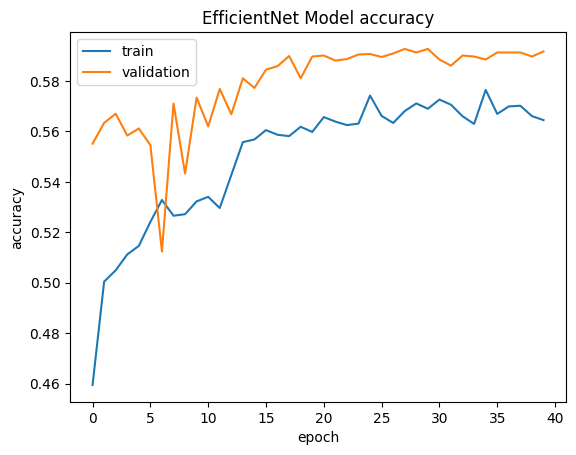

In [56]:
plt.plot(history_efficient.history["accuracy"])
plt.plot(history_efficient.history["val_accuracy"])
plt.title("EfficientNet Model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the EfficientnetNet Model**


In [57]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator_efficientnet.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator_efficientnet.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_efficient_model.evaluate(test_generator_efficientnet, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8125 - loss: 0.6692


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6635 - loss: 0.8448 


Loss: 0.8933918476104736, Accuracy: 0.625


### **Plotting the confusion matrix**



1/4 ━━━━━━━━━━━━━━━━━━━━ 7s 3s/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step


              precision    recall  f1-score   support

       happy       0.53      0.81      0.64        32
     neutral       0.50      0.47      0.48        32
         sad       0.78      0.56      0.65        32
    surprise       0.81      0.66      0.72        32

    accuracy                           0.62       128
   macro avg       0.66      0.62      0.63       128
weighted avg       0.66      0.62      0.63       128



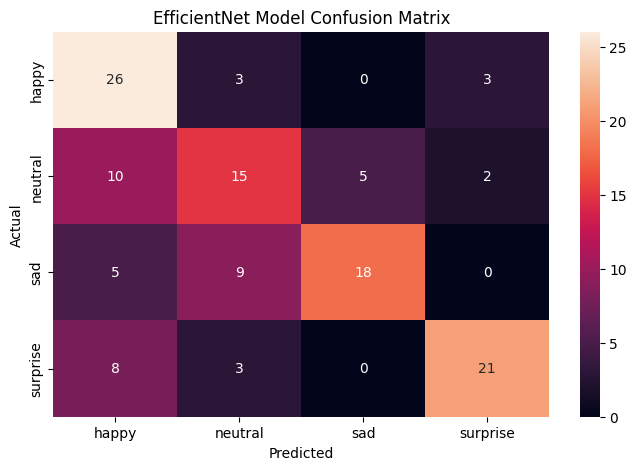

In [58]:
pred_probabilities = new_efficient_model.predict(test_generator_efficientnet, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator_efficientnet.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.title("EfficientNet Model Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The EfficientNetV2B0 model, with its **6,649,620 total parameters**, is a balance of complexity and efficiency, suitable for our grayscale 48x48 emotion classification task.
- With no model layers cut, this full EfficientNetV2B0 version attained a **final training accuracy of about 58.41%** and a validation accuracy that rose to **71.88%**.
- On the test set, the model achieved an **accuracy of 63.28%**.
- The confusion matrix reveals the model's strengths and weaknesses: it was most precise with 'sad' (precision of 0.79) and 'surprise' (precision of 0.78) emotions, but it struggled to correctly identify 'happy' emotions (with the highest recall at 0.78), suggesting that it often misclassifies other emotions as 'happy'.
- Compared to previous models like VGG16 and ResNet50V2, EfficientNetV2B0 provides a competitive accuracy with the advantage of fewer parameters, making it a compelling choice for efficiency in computational resources and speed.


**Think About It:**

- What is your overall performance of these Transfer Learning Architectures? Can we draw a comparison of these models' performances. Are we satisfied with the accuracies that we have received?
- Answer: The overall performance of the transfer learning architectures is moderately satisfactory. They are capable of learning from the dataset, but clearly there is still room for improvement, possibly through more complex architectures, hyperparameter tuning, or enhanced data preprocessing.
- Do you think our issue lies with 'rgb' color_mode?
- Answer: It may be one of the possible issues, but not the main one. I would go more on the type of images (and also size), on which these models were trained for. So that, the features learned cannot be used on our task in hand.


Now that we have tried multiple pre-trained models, let's build a complex CNN architecture and see if we can get better performance.


## **Building a Complex Neural Network Architecture**


In this section, we will build a more complex Convolutional Neural Network Model that has close to as many parameters as we had in our Transfer Learning Models. However, we will have only 1 input channel for our input images.


## **Creating our Data Loaders**

In this section, we are creating data loaders which we will use as inputs to the more Complicated Convolutional Neural Network. We will go ahead with color_mode = 'grayscale'.


In [59]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"
color_layers = 1
# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    brightness_range=(0.5, 1.5),  # Randomly adjust brightness to simulate different lighting conditions
    shear_range=0.3,  # Shear transformations for perspective changes
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Creating train_dir, validation_dir, and test_dir with the structure of DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


### **Model Building**

- Try building a layer with 5 Convolutional Blocks and see if performance increases.


In [60]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [61]:
# Initializing a sequential model
model_complex = Sequential()

model_complex.add(Input(shape=(img_width, img_height, color_layers)))

# First Convolutional Block
model_complex.add(Conv2D(64, kernel_size=2, padding="same"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(negative_slope=0.1))
model_complex.add(MaxPooling2D(pool_size=2))

# Second Convolutional Block
model_complex.add(Conv2D(128, kernel_size=2, padding="same"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(negative_slope=0.1))
model_complex.add(MaxPooling2D(pool_size=2))

# Third Convolutional Block
model_complex.add(Conv2D(256, kernel_size=2, padding="same"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(negative_slope=0.1))
model_complex.add(MaxPooling2D(pool_size=2))

# Fourth Convolutional Block
model_complex.add(Conv2D(512, kernel_size=2, padding="same"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(negative_slope=0.1))
model_complex.add(MaxPooling2D(pool_size=2))

# Fifth Convolutional Block
model_complex.add(Conv2D(128, kernel_size=2, padding="same"))
model_complex.add(BatchNormalization())
model_complex.add(LeakyReLU(negative_slope=0.1))
model_complex.add(MaxPooling2D(pool_size=2))

# Flatten the output of the conv layers to feed into the dense layers
model_complex.add(Flatten())

model_complex.add(Dense(512, activation="relu"))
model_complex.add(Dense(128, activation="relu"))
model_complex.add(Dense(64))
model_complex.add(BatchNormalization())
model_complex.add(ReLU())  # Using ReLU after batch normalization
model_complex.add(Dense(4, activation="softmax"))

# Using RMSProp Optimizer
optimizer = RMSprop(learning_rate=0.01)

### **Compiling and Training the Model**


In [62]:
model_complex.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
model_complex.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 48, 48, 64)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 48, 48, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 48, 48, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 24, 24, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 12, 12, 256)    │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 12, 12, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 6, 6, 512)      │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 6, 6, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 3, 3, 128)      │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 3, 3, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 3, 3, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,096,452 (4.18 MB)

 Trainable params: 1,094,148 (4.17 MB)

 Non-trainable params: 2,304 (9.00 KB)

In [63]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

# Define the saving the best model callback
mc = ModelCheckpoint(
    f"{results_path}/best_model_complex_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Fitting the model with 60 epochs and using validation set
history_complex = model_complex.fit(
    train_generator,
    epochs=60,
    validation_data=validation_generator,
    callbacks=[reduce_lr, mc, delayed_early_stopping],
)

Epoch 1/60


/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:120: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



  1/473 ━━━━━━━━━━━━━━━━━━━━ 25:59 3s/step - accuracy: 0.1875 - loss: 1.7487


  5/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.2273 - loss: 1.7262 


  7/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2378 - loss: 1.6855


 10/473 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - accuracy: 0.2517 - loss: 1.6414


 13/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.2598 - loss: 1.6109


 17/473 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - accuracy: 0.2619 - loss: 1.5875


 22/473 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - accuracy: 0.2643 - loss: 1.5641


 27/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.2666 - loss: 1.5457


 32/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.2676 - loss: 1.5316


 37/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.2671 - loss: 1.5214


 42/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.2668 - loss: 1.5130


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2670 - loss: 1.5058


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2670 - loss: 1.4999


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.2669 - loss: 1.4950


 62/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2668 - loss: 1.4907


 67/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2668 - loss: 1.4868


 72/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2669 - loss: 1.4833


 77/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2667 - loss: 1.4802


 82/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.2665 - loss: 1.4776


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2663 - loss: 1.4753


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2662 - loss: 1.4731


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2660 - loss: 1.4711


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2659 - loss: 1.4692


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2659 - loss: 1.4675


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.2658 - loss: 1.4659


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.2659 - loss: 1.4644


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2659 - loss: 1.4633


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2660 - loss: 1.4625


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2660 - loss: 1.4615


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2661 - loss: 1.4603


138/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2662 - loss: 1.4591


143/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2664 - loss: 1.4580


148/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2665 - loss: 1.4569


153/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.2667 - loss: 1.4559


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - accuracy: 0.2669 - loss: 1.4549


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2671 - loss: 1.4540


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2672 - loss: 1.4532


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2674 - loss: 1.4524


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2675 - loss: 1.4516


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2677 - loss: 1.4508


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2678 - loss: 1.4500


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2680 - loss: 1.4494


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2682 - loss: 1.4486


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2685 - loss: 1.4478


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2688 - loss: 1.4471


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2691 - loss: 1.4464


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2693 - loss: 1.4457


222/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2696 - loss: 1.4449


226/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.2698 - loss: 1.4443


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2701 - loss: 1.4436


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2704 - loss: 1.4430


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2706 - loss: 1.4423


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2710 - loss: 1.4416


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2713 - loss: 1.4408


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2717 - loss: 1.4400


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2721 - loss: 1.4392


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2725 - loss: 1.4384


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2729 - loss: 1.4377


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2733 - loss: 1.4369


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2738 - loss: 1.4362


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2741 - loss: 1.4356


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2746 - loss: 1.4348


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2750 - loss: 1.4341


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2755 - loss: 1.4333


304/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.2760 - loss: 1.4326


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2764 - loss: 1.4319


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2769 - loss: 1.4312


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2773 - loss: 1.4305


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2778 - loss: 1.4298


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2782 - loss: 1.4290


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2786 - loss: 1.4283


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2791 - loss: 1.4276


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2795 - loss: 1.4269


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2799 - loss: 1.4263


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2803 - loss: 1.4256


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2808 - loss: 1.4249


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2811 - loss: 1.4244


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2815 - loss: 1.4238


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2819 - loss: 1.4232


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2821 - loss: 1.4228


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2825 - loss: 1.4222


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2829 - loss: 1.4217


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2832 - loss: 1.4212


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.2836 - loss: 1.4205


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2841 - loss: 1.4198


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2846 - loss: 1.4191


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2850 - loss: 1.4184


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2855 - loss: 1.4177


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2860 - loss: 1.4169


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2864 - loss: 1.4162


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.2869 - loss: 1.4155


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.2871 - loss: 1.4152


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2876 - loss: 1.4144


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2880 - loss: 1.4138


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2885 - loss: 1.4131


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2890 - loss: 1.4124


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2894 - loss: 1.4116


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2899 - loss: 1.4109


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2904 - loss: 1.4102


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.2908 - loss: 1.4095


Epoch 1: val_accuracy improved from -inf to 0.44967, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 13s 20ms/step - accuracy: 0.2916 - loss: 1.4084 - val_accuracy: 0.4497 - val_loss: 1.2479 - learning_rate: 0.0100


Epoch 2/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.3125 - loss: 1.2842


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3774 - loss: 1.2183  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3786 - loss: 1.2272


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3802 - loss: 1.2320


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3810 - loss: 1.2356


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3849 - loss: 1.2358


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3866 - loss: 1.2379


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3877 - loss: 1.2392


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3894 - loss: 1.2391


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.3912 - loss: 1.2381


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3932 - loss: 1.2368


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3954 - loss: 1.2360


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3973 - loss: 1.2357


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.3990 - loss: 1.2354


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4010 - loss: 1.2345


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4029 - loss: 1.2332


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4049 - loss: 1.2318


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4067 - loss: 1.2305


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4084 - loss: 1.2293


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4099 - loss: 1.2282


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4112 - loss: 1.2273


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4123 - loss: 1.2264


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4134 - loss: 1.2256


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4144 - loss: 1.2248


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4154 - loss: 1.2239


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.4162 - loss: 1.2232


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4169 - loss: 1.2225


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4175 - loss: 1.2219


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4182 - loss: 1.2212


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4187 - loss: 1.2206


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4192 - loss: 1.2201


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4197 - loss: 1.2195


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4202 - loss: 1.2190


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4207 - loss: 1.2184


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4213 - loss: 1.2178


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4218 - loss: 1.2172


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4223 - loss: 1.2166


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4228 - loss: 1.2161


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4232 - loss: 1.2156


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4236 - loss: 1.2151


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4240 - loss: 1.2147


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4244 - loss: 1.2142


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4248 - loss: 1.2137


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.4251 - loss: 1.2133


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4254 - loss: 1.2129


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4256 - loss: 1.2126


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4258 - loss: 1.2123


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4260 - loss: 1.2120


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4264 - loss: 1.2116


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4266 - loss: 1.2112


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4269 - loss: 1.2108


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4271 - loss: 1.2105


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4274 - loss: 1.2101


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4277 - loss: 1.2096


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4280 - loss: 1.2093


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4282 - loss: 1.2090


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4284 - loss: 1.2086


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4287 - loss: 1.2083


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4290 - loss: 1.2079


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4292 - loss: 1.2075


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4295 - loss: 1.2071


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.4297 - loss: 1.2068


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4300 - loss: 1.2064


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4302 - loss: 1.2061


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4305 - loss: 1.2057


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4307 - loss: 1.2053


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4309 - loss: 1.2050


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4312 - loss: 1.2046


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4314 - loss: 1.2042


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4317 - loss: 1.2039


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4319 - loss: 1.2035


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4321 - loss: 1.2031


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4324 - loss: 1.2027


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4326 - loss: 1.2024


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4329 - loss: 1.2020


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4331 - loss: 1.2016


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4334 - loss: 1.2011


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4336 - loss: 1.2007


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.4339 - loss: 1.2004


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4341 - loss: 1.2000


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4343 - loss: 1.1996


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4346 - loss: 1.1993


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4348 - loss: 1.1989


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4350 - loss: 1.1985


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4353 - loss: 1.1981


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4355 - loss: 1.1977


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4358 - loss: 1.1972


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4361 - loss: 1.1968


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4364 - loss: 1.1963


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4367 - loss: 1.1959


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4369 - loss: 1.1954


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4372 - loss: 1.1950


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4375 - loss: 1.1945


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4378 - loss: 1.1941


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4381 - loss: 1.1936


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4384 - loss: 1.1930


Epoch 2: val_accuracy improved from 0.44967 to 0.54872, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.4387 - loss: 1.1926 - val_accuracy: 0.5487 - val_loss: 1.0995 - learning_rate: 0.0100


Epoch 3/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - accuracy: 0.5938 - loss: 0.9162


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5681 - loss: 1.0240  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5431 - loss: 1.0657


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5230 - loss: 1.0861


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5141 - loss: 1.0920


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5079 - loss: 1.0978


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5050 - loss: 1.0992


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5042 - loss: 1.0973


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5041 - loss: 1.0948


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5041 - loss: 1.0924


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5036 - loss: 1.0909


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5036 - loss: 1.0897


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5037 - loss: 1.0886


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5035 - loss: 1.0877


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5033 - loss: 1.0873


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5031 - loss: 1.0869


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5031 - loss: 1.0863


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5033 - loss: 1.0855


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5035 - loss: 1.0848


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5040 - loss: 1.0841


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5044 - loss: 1.0833


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5050 - loss: 1.0824


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5054 - loss: 1.0816


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5058 - loss: 1.0807


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5062 - loss: 1.0799


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5065 - loss: 1.0793


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5069 - loss: 1.0784


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5073 - loss: 1.0775


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5076 - loss: 1.0767


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5078 - loss: 1.0760


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5081 - loss: 1.0753


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.5084 - loss: 1.0746


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5086 - loss: 1.0741


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5088 - loss: 1.0735


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5090 - loss: 1.0730


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5092 - loss: 1.0723


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5094 - loss: 1.0717


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5097 - loss: 1.0711


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5099 - loss: 1.0707


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5101 - loss: 1.0702


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5104 - loss: 1.0696


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5107 - loss: 1.0691


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5110 - loss: 1.0685


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5112 - loss: 1.0680


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5114 - loss: 1.0675


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5116 - loss: 1.0671


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5119 - loss: 1.0666


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5120 - loss: 1.0662


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5122 - loss: 1.0659


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5123 - loss: 1.0656


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5125 - loss: 1.0651


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5127 - loss: 1.0647


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5129 - loss: 1.0642


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5131 - loss: 1.0638


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5133 - loss: 1.0633


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5136 - loss: 1.0629


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5138 - loss: 1.0624


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5140 - loss: 1.0619


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5142 - loss: 1.0614


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5145 - loss: 1.0609


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5147 - loss: 1.0605


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5149 - loss: 1.0601


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5151 - loss: 1.0597


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5152 - loss: 1.0594


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5154 - loss: 1.0592


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5155 - loss: 1.0589


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5156 - loss: 1.0587


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5158 - loss: 1.0585


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5159 - loss: 1.0582


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5160 - loss: 1.0580


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5162 - loss: 1.0577


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5164 - loss: 1.0573


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5166 - loss: 1.0570


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.5169 - loss: 1.0566


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5171 - loss: 1.0562


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5173 - loss: 1.0558


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5175 - loss: 1.0554


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5178 - loss: 1.0550


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5180 - loss: 1.0546


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5182 - loss: 1.0543


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5183 - loss: 1.0540


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5185 - loss: 1.0536


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5187 - loss: 1.0532


390/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5189 - loss: 1.0529


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5191 - loss: 1.0525


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5193 - loss: 1.0521


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5194 - loss: 1.0518


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5196 - loss: 1.0514


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5198 - loss: 1.0511


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5200 - loss: 1.0507


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5202 - loss: 1.0504


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5203 - loss: 1.0500


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5205 - loss: 1.0497


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5207 - loss: 1.0494


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5208 - loss: 1.0491


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5210 - loss: 1.0488


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5212 - loss: 1.0484


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5213 - loss: 1.0481


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5215 - loss: 1.0478


Epoch 3: val_accuracy improved from 0.54872 to 0.57304, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.5218 - loss: 1.0473 - val_accuracy: 0.5730 - val_loss: 0.9766 - learning_rate: 0.0100


Epoch 4/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.5312 - loss: 0.9306


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5117 - loss: 1.0308  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5396 - loss: 1.0037


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5494 - loss: 0.9919


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5545 - loss: 0.9859


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5570 - loss: 0.9800


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5587 - loss: 0.9754


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5598 - loss: 0.9719


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5606 - loss: 0.9692


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5611 - loss: 0.9672


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5619 - loss: 0.9651


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5626 - loss: 0.9633


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5629 - loss: 0.9620


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5627 - loss: 0.9612


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5627 - loss: 0.9604


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5627 - loss: 0.9598


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5625 - loss: 0.9594


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5625 - loss: 0.9592


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5622 - loss: 0.9590


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5619 - loss: 0.9591


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5617 - loss: 0.9592


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5616 - loss: 0.9593


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5613 - loss: 0.9593


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5611 - loss: 0.9595


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5609 - loss: 0.9596


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5608 - loss: 0.9598


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5607 - loss: 0.9599


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5607 - loss: 0.9599


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5607 - loss: 0.9599


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5608 - loss: 0.9598


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5609 - loss: 0.9597


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5609 - loss: 0.9597


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5609 - loss: 0.9598


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9598


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9599


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9598


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9598


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9599


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9599


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9600


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9600


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9601


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9601


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5610 - loss: 0.9601


217/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5610 - loss: 0.9601


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5611 - loss: 0.9601


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5611 - loss: 0.9601


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5611 - loss: 0.9601


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9601


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9600


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5613 - loss: 0.9600


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5613 - loss: 0.9601


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5613 - loss: 0.9601


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5613 - loss: 0.9601


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5613 - loss: 0.9601


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5613 - loss: 0.9602


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5613 - loss: 0.9603


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9604


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9604


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9604


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9605


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9605


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9606


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5612 - loss: 0.9606


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5612 - loss: 0.9606


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5612 - loss: 0.9606


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5612 - loss: 0.9607


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5612 - loss: 0.9607


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5612 - loss: 0.9607


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5612 - loss: 0.9607


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5613 - loss: 0.9608


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5613 - loss: 0.9608


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5613 - loss: 0.9608


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5614 - loss: 0.9607


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5614 - loss: 0.9607


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5614 - loss: 0.9607


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5615 - loss: 0.9607


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5615 - loss: 0.9607


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5615 - loss: 0.9607


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5616 - loss: 0.9607


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5616 - loss: 0.9607


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5617 - loss: 0.9607


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5617 - loss: 0.9607


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5618 - loss: 0.9606


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5618 - loss: 0.9606


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5619 - loss: 0.9606


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5619 - loss: 0.9606


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5620 - loss: 0.9606


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5620 - loss: 0.9606


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5621 - loss: 0.9605


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5621 - loss: 0.9605


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5622 - loss: 0.9604


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5623 - loss: 0.9603


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5624 - loss: 0.9603


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5624 - loss: 0.9602


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5625 - loss: 0.9601


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5626 - loss: 0.9600


Epoch 4: val_accuracy improved from 0.57304 to 0.58891, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5627 - loss: 0.9599 - val_accuracy: 0.5889 - val_loss: 0.9360 - learning_rate: 0.0100


Epoch 5/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step - accuracy: 0.6250 - loss: 0.7415


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5431 - loss: 0.9016  


  9/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5351 - loss: 0.9398


 14/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5352 - loss: 0.9534


 19/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5391 - loss: 0.9543


 23/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5402 - loss: 0.9543


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5408 - loss: 0.9546


 32/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5423 - loss: 0.9536


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5452 - loss: 0.9512


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5473 - loss: 0.9490


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5485 - loss: 0.9469


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5491 - loss: 0.9459


 57/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5494 - loss: 0.9455


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5502 - loss: 0.9453


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5510 - loss: 0.9451


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5516 - loss: 0.9450


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5522 - loss: 0.9449


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5531 - loss: 0.9445


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5539 - loss: 0.9443


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5545 - loss: 0.9443


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5550 - loss: 0.9441


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5555 - loss: 0.9440


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5563 - loss: 0.9437


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5571 - loss: 0.9432


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5578 - loss: 0.9428


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5583 - loss: 0.9426


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5589 - loss: 0.9422


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5596 - loss: 0.9418


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5601 - loss: 0.9414


135/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5606 - loss: 0.9411


140/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5611 - loss: 0.9407


145/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5615 - loss: 0.9403


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5620 - loss: 0.9399


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5624 - loss: 0.9395


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5628 - loss: 0.9391


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5632 - loss: 0.9388


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5636 - loss: 0.9386


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5639 - loss: 0.9384


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5642 - loss: 0.9382


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5645 - loss: 0.9379


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5649 - loss: 0.9376


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5652 - loss: 0.9373


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5655 - loss: 0.9370


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5658 - loss: 0.9367


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5661 - loss: 0.9365


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5663 - loss: 0.9363


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5666 - loss: 0.9360


221/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5669 - loss: 0.9357


226/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5671 - loss: 0.9354


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5674 - loss: 0.9351


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5677 - loss: 0.9348


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5680 - loss: 0.9344


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5683 - loss: 0.9341


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5686 - loss: 0.9337


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5688 - loss: 0.9334


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5691 - loss: 0.9331


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5694 - loss: 0.9327


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5696 - loss: 0.9324


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5699 - loss: 0.9322


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5701 - loss: 0.9319


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5703 - loss: 0.9316


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5705 - loss: 0.9314


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5708 - loss: 0.9311


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5710 - loss: 0.9308


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5712 - loss: 0.9306


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5714 - loss: 0.9303


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5716 - loss: 0.9301


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5717 - loss: 0.9299


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5719 - loss: 0.9296


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5721 - loss: 0.9294


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5723 - loss: 0.9292


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5724 - loss: 0.9290


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5726 - loss: 0.9287


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5727 - loss: 0.9286


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5729 - loss: 0.9284


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5730 - loss: 0.9282


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5731 - loss: 0.9280


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5733 - loss: 0.9279


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5734 - loss: 0.9277


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5736 - loss: 0.9276


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5737 - loss: 0.9274


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5738 - loss: 0.9272


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5740 - loss: 0.9271


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5741 - loss: 0.9269


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5743 - loss: 0.9267


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5744 - loss: 0.9266


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5745 - loss: 0.9264


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5747 - loss: 0.9263


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5748 - loss: 0.9261


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5749 - loss: 0.9260


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5750 - loss: 0.9259


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5751 - loss: 0.9257


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5753 - loss: 0.9256


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5754 - loss: 0.9255


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5755 - loss: 0.9253


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5756 - loss: 0.9252


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5757 - loss: 0.9251


Epoch 5: val_accuracy did not improve from 0.58891



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.5759 - loss: 0.9249 - val_accuracy: 0.3789 - val_loss: 1.5197 - learning_rate: 0.0100


Epoch 6/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.5000 - loss: 0.9217


  4/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.5671 - loss: 0.8888  


  9/473 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.5732 - loss: 0.8870


 13/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.5757 - loss: 0.8889


 17/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.5775 - loss: 0.8906


 22/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.5808 - loss: 0.8888


 27/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5837 - loss: 0.8871


 32/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5856 - loss: 0.8874


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5868 - loss: 0.8878


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.5873 - loss: 0.8880


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5874 - loss: 0.8875


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5882 - loss: 0.8859


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5889 - loss: 0.8842


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5894 - loss: 0.8826


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5897 - loss: 0.8813


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5901 - loss: 0.8800


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5907 - loss: 0.8787


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5913 - loss: 0.8777


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5918 - loss: 0.8772


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5922 - loss: 0.8768


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5927 - loss: 0.8765


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5931 - loss: 0.8763


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5933 - loss: 0.8763


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5935 - loss: 0.8764


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5937 - loss: 0.8764


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5939 - loss: 0.8763


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5941 - loss: 0.8762


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5942 - loss: 0.8762


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5943 - loss: 0.8763


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5945 - loss: 0.8764


141/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5946 - loss: 0.8766


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5948 - loss: 0.8768


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5949 - loss: 0.8770


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5950 - loss: 0.8771


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5952 - loss: 0.8773


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5954 - loss: 0.8775


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5956 - loss: 0.8775


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5958 - loss: 0.8775


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5960 - loss: 0.8774


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5963 - loss: 0.8774


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5965 - loss: 0.8773


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5967 - loss: 0.8773


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5969 - loss: 0.8774


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5971 - loss: 0.8775


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5972 - loss: 0.8776


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5973 - loss: 0.8777


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5974 - loss: 0.8779


223/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5976 - loss: 0.8781


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5977 - loss: 0.8783


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5978 - loss: 0.8784


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5980 - loss: 0.8785


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5981 - loss: 0.8786


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5982 - loss: 0.8787


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5983 - loss: 0.8788


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5984 - loss: 0.8789


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5985 - loss: 0.8790


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5986 - loss: 0.8791


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5987 - loss: 0.8792


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5988 - loss: 0.8792


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5989 - loss: 0.8793


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5990 - loss: 0.8793


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5991 - loss: 0.8794


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5992 - loss: 0.8795


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.5993 - loss: 0.8795


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5994 - loss: 0.8796


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5995 - loss: 0.8797


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5995 - loss: 0.8797


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5996 - loss: 0.8798


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5997 - loss: 0.8799


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5998 - loss: 0.8799


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.5999 - loss: 0.8800


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6000 - loss: 0.8800


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6001 - loss: 0.8801


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6002 - loss: 0.8801


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6002 - loss: 0.8802


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6003 - loss: 0.8802


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6004 - loss: 0.8803


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6005 - loss: 0.8803


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6006 - loss: 0.8804


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6007 - loss: 0.8804


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6007 - loss: 0.8805


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6008 - loss: 0.8805


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6009 - loss: 0.8806


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6010 - loss: 0.8807


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6010 - loss: 0.8808


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6011 - loss: 0.8809


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6012 - loss: 0.8810


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6012 - loss: 0.8811


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6013 - loss: 0.8812


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6013 - loss: 0.8813


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6014 - loss: 0.8814


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6015 - loss: 0.8815


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6015 - loss: 0.8816


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6016 - loss: 0.8816


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6017 - loss: 0.8817


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6017 - loss: 0.8818


468/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6018 - loss: 0.8819


Epoch 6: val_accuracy improved from 0.58891 to 0.62829, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6018 - loss: 0.8820 - val_accuracy: 0.6283 - val_loss: 0.9162 - learning_rate: 0.0100


Epoch 7/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.5625 - loss: 0.8330


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5541 - loss: 0.8299  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5714 - loss: 0.8373


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5820 - loss: 0.8409


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5872 - loss: 0.8455


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5883 - loss: 0.8504


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5873 - loss: 0.8565


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.5871 - loss: 0.8605


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5879 - loss: 0.8622


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5884 - loss: 0.8650


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5890 - loss: 0.8672


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5898 - loss: 0.8688


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5909 - loss: 0.8704


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5919 - loss: 0.8709


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5927 - loss: 0.8718


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5935 - loss: 0.8722


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5940 - loss: 0.8726


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5945 - loss: 0.8731


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5950 - loss: 0.8735


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5954 - loss: 0.8739


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5959 - loss: 0.8743


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5963 - loss: 0.8747


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5967 - loss: 0.8750


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.5972 - loss: 0.8752


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5974 - loss: 0.8754


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.5978 - loss: 0.8757


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5983 - loss: 0.8758


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5988 - loss: 0.8759


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5992 - loss: 0.8761


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5996 - loss: 0.8763


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6000 - loss: 0.8763


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6005 - loss: 0.8764


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6009 - loss: 0.8763


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6013 - loss: 0.8763


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6017 - loss: 0.8762


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6020 - loss: 0.8763


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6024 - loss: 0.8763


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6027 - loss: 0.8764


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6029 - loss: 0.8764


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6032 - loss: 0.8765


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6035 - loss: 0.8765


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6038 - loss: 0.8765


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6041 - loss: 0.8764


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6045 - loss: 0.8763


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6048 - loss: 0.8761


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6051 - loss: 0.8760


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6054 - loss: 0.8759


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6057 - loss: 0.8757


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6060 - loss: 0.8756


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6062 - loss: 0.8754


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6065 - loss: 0.8753


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6067 - loss: 0.8752


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6070 - loss: 0.8752


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6072 - loss: 0.8751


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6075 - loss: 0.8749


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6077 - loss: 0.8748


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6079 - loss: 0.8747


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6082 - loss: 0.8746


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6084 - loss: 0.8745


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.6086 - loss: 0.8744


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6088 - loss: 0.8743


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6090 - loss: 0.8742


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6092 - loss: 0.8741


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6094 - loss: 0.8740


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6096 - loss: 0.8739


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6097 - loss: 0.8739


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6099 - loss: 0.8738


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6100 - loss: 0.8738


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6102 - loss: 0.8737


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6103 - loss: 0.8737


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6104 - loss: 0.8737


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6106 - loss: 0.8736


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6107 - loss: 0.8735


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6109 - loss: 0.8735


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6110 - loss: 0.8734


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6111 - loss: 0.8733


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6112 - loss: 0.8733


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6114 - loss: 0.8732


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6115 - loss: 0.8732


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6116 - loss: 0.8731


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6117 - loss: 0.8730


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6119 - loss: 0.8730


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6120 - loss: 0.8729


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6121 - loss: 0.8729


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6122 - loss: 0.8728


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.6123 - loss: 0.8728


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6125 - loss: 0.8728


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6126 - loss: 0.8727


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6127 - loss: 0.8727


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6128 - loss: 0.8726


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6129 - loss: 0.8726


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6131 - loss: 0.8725


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6132 - loss: 0.8725


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6133 - loss: 0.8724


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6134 - loss: 0.8724


Epoch 7: val_accuracy improved from 0.62829 to 0.69761, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6136 - loss: 0.8723 - val_accuracy: 0.6976 - val_loss: 0.7406 - learning_rate: 0.0100


Epoch 8/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 52s 112ms/step - accuracy: 0.7500 - loss: 0.7680


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7393 - loss: 0.7492  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7177 - loss: 0.7629


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7038 - loss: 0.7762


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6972 - loss: 0.7826


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6927 - loss: 0.7869


 29/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6895 - loss: 0.7897


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6866 - loss: 0.7936


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6840 - loss: 0.7971


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6821 - loss: 0.7990


 49/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6804 - loss: 0.8004


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6789 - loss: 0.8017


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6775 - loss: 0.8029


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6760 - loss: 0.8035


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6751 - loss: 0.8039


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6740 - loss: 0.8048


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6729 - loss: 0.8056


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6719 - loss: 0.8063


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6709 - loss: 0.8070


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6699 - loss: 0.8079


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6689 - loss: 0.8088


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6680 - loss: 0.8096


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6672 - loss: 0.8104


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6666 - loss: 0.8109


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6660 - loss: 0.8115


125/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6655 - loss: 0.8120


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6650 - loss: 0.8124


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6646 - loss: 0.8127


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6642 - loss: 0.8131


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6639 - loss: 0.8135


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6635 - loss: 0.8139


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6631 - loss: 0.8144


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6626 - loss: 0.8149


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6622 - loss: 0.8153


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6618 - loss: 0.8157


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6614 - loss: 0.8161


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6610 - loss: 0.8165


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6607 - loss: 0.8168


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6603 - loss: 0.8172


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6600 - loss: 0.8175


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6597 - loss: 0.8178


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6594 - loss: 0.8181


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6592 - loss: 0.8183


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6588 - loss: 0.8187


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6585 - loss: 0.8191


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6581 - loss: 0.8194


221/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6578 - loss: 0.8197


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6576 - loss: 0.8201


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6573 - loss: 0.8204


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6571 - loss: 0.8206


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6568 - loss: 0.8209


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6566 - loss: 0.8213


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6563 - loss: 0.8216


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6561 - loss: 0.8218


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6559 - loss: 0.8221


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6557 - loss: 0.8223


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6556 - loss: 0.8226


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6554 - loss: 0.8228


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6552 - loss: 0.8230


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6551 - loss: 0.8232


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6550 - loss: 0.8235


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6548 - loss: 0.8237


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6547 - loss: 0.8239


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6546 - loss: 0.8241


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6544 - loss: 0.8243


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6543 - loss: 0.8244


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6542 - loss: 0.8246


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6541 - loss: 0.8247


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6541 - loss: 0.8249


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6540 - loss: 0.8250


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6539 - loss: 0.8251


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6539 - loss: 0.8251


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6539 - loss: 0.8252


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6538 - loss: 0.8253


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6538 - loss: 0.8253


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6537 - loss: 0.8254


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6537 - loss: 0.8255


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6537 - loss: 0.8255


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6536 - loss: 0.8256


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6536 - loss: 0.8257


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6536 - loss: 0.8258


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6535 - loss: 0.8258


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6535 - loss: 0.8259


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6535 - loss: 0.8260


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6535 - loss: 0.8260


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8261


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8261


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8261


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8262


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8262


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8262


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8262


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8262


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8262


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8262


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6534 - loss: 0.8263


Epoch 8: val_accuracy did not improve from 0.69761



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6534 - loss: 0.8263 - val_accuracy: 0.5724 - val_loss: 1.0251 - learning_rate: 0.0100


Epoch 9/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.7188 - loss: 0.6935


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6993 - loss: 0.7490  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6895 - loss: 0.7740


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6858 - loss: 0.7805


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6834 - loss: 0.7863


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6819 - loss: 0.7912


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6802 - loss: 0.7974


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6787 - loss: 0.8011


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6782 - loss: 0.8020


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6775 - loss: 0.8021


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6768 - loss: 0.8021


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6761 - loss: 0.8020


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6756 - loss: 0.8022


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6751 - loss: 0.8026


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6745 - loss: 0.8031


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6742 - loss: 0.8034


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6738 - loss: 0.8038


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6734 - loss: 0.8041


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6732 - loss: 0.8042


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6730 - loss: 0.8040


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6729 - loss: 0.8038


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6728 - loss: 0.8036


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6727 - loss: 0.8035


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6725 - loss: 0.8033


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6724 - loss: 0.8031


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6722 - loss: 0.8029


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6721 - loss: 0.8026


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6721 - loss: 0.8023


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6721 - loss: 0.8019


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6721 - loss: 0.8015


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6721 - loss: 0.8012


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6721 - loss: 0.8008


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6720 - loss: 0.8006


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6720 - loss: 0.8004


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6719 - loss: 0.8002


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.6719 - loss: 0.8001


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6718 - loss: 0.8000


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6717 - loss: 0.8000


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6715 - loss: 0.8000


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6714 - loss: 0.8000


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6713 - loss: 0.8000


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6711 - loss: 0.8001


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6710 - loss: 0.8003


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6708 - loss: 0.8004


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6708 - loss: 0.8005


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6707 - loss: 0.8006


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6706 - loss: 0.8006


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6706 - loss: 0.8006


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6705 - loss: 0.8006


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6705 - loss: 0.8006


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6705 - loss: 0.8006


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6705 - loss: 0.8006


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6705 - loss: 0.8006


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6704 - loss: 0.8006


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6704 - loss: 0.8006


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6704 - loss: 0.8006


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6703 - loss: 0.8007


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6703 - loss: 0.8007


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6702 - loss: 0.8008


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6702 - loss: 0.8008


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6701 - loss: 0.8009


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6701 - loss: 0.8009


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6700 - loss: 0.8010


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6699 - loss: 0.8011


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6699 - loss: 0.8011


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6698 - loss: 0.8012


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6697 - loss: 0.8012


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6697 - loss: 0.8013


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6696 - loss: 0.8014


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6695 - loss: 0.8014


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6694 - loss: 0.8015


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6694 - loss: 0.8015


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6693 - loss: 0.8015


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6693 - loss: 0.8015


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6692 - loss: 0.8015


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6692 - loss: 0.8015


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6691 - loss: 0.8016


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6690 - loss: 0.8016


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6689 - loss: 0.8017


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6689 - loss: 0.8017


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6688 - loss: 0.8018


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6687 - loss: 0.8019


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6687 - loss: 0.8019


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6686 - loss: 0.8019


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6685 - loss: 0.8020


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6685 - loss: 0.8020


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6684 - loss: 0.8021


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6683 - loss: 0.8022


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6683 - loss: 0.8022


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6682 - loss: 0.8023


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6682 - loss: 0.8023


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6681 - loss: 0.8024


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6681 - loss: 0.8024


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6680 - loss: 0.8025


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6680 - loss: 0.8025


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6679 - loss: 0.8026


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6679 - loss: 0.8026


469/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6678 - loss: 0.8027


Epoch 9: val_accuracy did not improve from 0.69761



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6678 - loss: 0.8027 - val_accuracy: 0.6416 - val_loss: 0.8362 - learning_rate: 0.0100


Epoch 10/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.5625 - loss: 0.9427


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.5990 - loss: 0.9089  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6241 - loss: 0.8765


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6355 - loss: 0.8574


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6447 - loss: 0.8410


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6532 - loss: 0.8264


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6581 - loss: 0.8185


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6598 - loss: 0.8161


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6614 - loss: 0.8141


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6626 - loss: 0.8130


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6636 - loss: 0.8118


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6647 - loss: 0.8103


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6654 - loss: 0.8092


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6661 - loss: 0.8082


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6672 - loss: 0.8072


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6679 - loss: 0.8066


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6683 - loss: 0.8062


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6689 - loss: 0.8056


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6694 - loss: 0.8050


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6700 - loss: 0.8044


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6703 - loss: 0.8039


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6706 - loss: 0.8035


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6710 - loss: 0.8030


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6713 - loss: 0.8023


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6717 - loss: 0.8017


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6720 - loss: 0.8011


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6724 - loss: 0.8005


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6729 - loss: 0.7997


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6733 - loss: 0.7990


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6736 - loss: 0.7984


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6739 - loss: 0.7978


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6741 - loss: 0.7973


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6743 - loss: 0.7968


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6745 - loss: 0.7964


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6746 - loss: 0.7959


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6748 - loss: 0.7956


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6749 - loss: 0.7953


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6750 - loss: 0.7950


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6751 - loss: 0.7946


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6752 - loss: 0.7943


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6753 - loss: 0.7940


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6754 - loss: 0.7937


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6755 - loss: 0.7934


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6756 - loss: 0.7930


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6757 - loss: 0.7927


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6757 - loss: 0.7924


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6758 - loss: 0.7921


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6759 - loss: 0.7918


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6759 - loss: 0.7914


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6760 - loss: 0.7911


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6761 - loss: 0.7907


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6762 - loss: 0.7904


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6763 - loss: 0.7900


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6764 - loss: 0.7897


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6765 - loss: 0.7895


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6766 - loss: 0.7893


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6767 - loss: 0.7891


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6767 - loss: 0.7889


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6768 - loss: 0.7887


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6768 - loss: 0.7885


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6769 - loss: 0.7883


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6769 - loss: 0.7882


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6770 - loss: 0.7881


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6770 - loss: 0.7879


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6771 - loss: 0.7877


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6771 - loss: 0.7876


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6772 - loss: 0.7875


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6772 - loss: 0.7874


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6772 - loss: 0.7873


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6772 - loss: 0.7872


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6772 - loss: 0.7871


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7870


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7869


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7869


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7868


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7867


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7867


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7866


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6773 - loss: 0.7865


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7864


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7864


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7863


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7863


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7862


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7861


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7861


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7860


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7860


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7859


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7858


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7858


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7857


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7857


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7856


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6773 - loss: 0.7855


Epoch 10: val_accuracy did not improve from 0.69761



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6773 - loss: 0.7855 - val_accuracy: 0.6448 - val_loss: 0.8493 - learning_rate: 0.0100


Epoch 11/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.6562 - loss: 0.7888


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6807 - loss: 0.7486  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6873 - loss: 0.7464


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6925 - loss: 0.7370


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6945 - loss: 0.7330


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6959 - loss: 0.7304


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6969 - loss: 0.7295


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6972 - loss: 0.7301


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6973 - loss: 0.7323


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6967 - loss: 0.7352


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6956 - loss: 0.7387


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6945 - loss: 0.7413


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6937 - loss: 0.7429


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6934 - loss: 0.7435


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6930 - loss: 0.7441


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6926 - loss: 0.7447


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6920 - loss: 0.7458


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6914 - loss: 0.7466


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6907 - loss: 0.7476


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6901 - loss: 0.7484


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6897 - loss: 0.7490


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6894 - loss: 0.7496


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6892 - loss: 0.7502


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6889 - loss: 0.7506


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6887 - loss: 0.7511


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6884 - loss: 0.7516


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6882 - loss: 0.7522


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6880 - loss: 0.7528


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6877 - loss: 0.7534


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6875 - loss: 0.7540


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6872 - loss: 0.7546


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6870 - loss: 0.7551


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6868 - loss: 0.7557


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6866 - loss: 0.7563


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6865 - loss: 0.7567


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6864 - loss: 0.7572


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6862 - loss: 0.7575


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6861 - loss: 0.7579


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6859 - loss: 0.7582


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6858 - loss: 0.7585


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6857 - loss: 0.7588


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6856 - loss: 0.7592


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6855 - loss: 0.7595


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6854 - loss: 0.7598


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6853 - loss: 0.7601


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6852 - loss: 0.7605


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6851 - loss: 0.7608


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6850 - loss: 0.7611


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6849 - loss: 0.7614


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6849 - loss: 0.7617


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6848 - loss: 0.7619


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6848 - loss: 0.7622


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6847 - loss: 0.7625


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6847 - loss: 0.7627


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6846 - loss: 0.7630


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6846 - loss: 0.7632


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6845 - loss: 0.7634


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6845 - loss: 0.7636


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6844 - loss: 0.7638


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6843 - loss: 0.7641


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6842 - loss: 0.7643


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6842 - loss: 0.7645


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6841 - loss: 0.7646


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6840 - loss: 0.7648


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6839 - loss: 0.7650


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6838 - loss: 0.7652


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6838 - loss: 0.7653


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6837 - loss: 0.7655


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6836 - loss: 0.7656


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6836 - loss: 0.7658


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6835 - loss: 0.7659


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6835 - loss: 0.7661


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6835 - loss: 0.7662


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6834 - loss: 0.7663


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6834 - loss: 0.7664


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6834 - loss: 0.7665


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6833 - loss: 0.7666


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6833 - loss: 0.7667


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6832 - loss: 0.7669


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6832 - loss: 0.7670


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6832 - loss: 0.7671


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6831 - loss: 0.7672


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6831 - loss: 0.7673


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6831 - loss: 0.7674


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6830 - loss: 0.7675


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6830 - loss: 0.7676


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6829 - loss: 0.7677


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6829 - loss: 0.7678


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6828 - loss: 0.7679


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6828 - loss: 0.7680


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6828 - loss: 0.7681


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6827 - loss: 0.7682


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6827 - loss: 0.7682


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6827 - loss: 0.7683


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6827 - loss: 0.7684


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6827 - loss: 0.7684


Epoch 11: val_accuracy did not improve from 0.69761



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6826 - loss: 0.7685 - val_accuracy: 0.6446 - val_loss: 0.8730 - learning_rate: 0.0100


Epoch 12/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8125 - loss: 0.5180


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7330 - loss: 0.7489  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7024 - loss: 0.7935


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6974 - loss: 0.7869


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6930 - loss: 0.7850


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6883 - loss: 0.7864


 28/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6860 - loss: 0.7865


 32/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6838 - loss: 0.7861


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6819 - loss: 0.7850


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6804 - loss: 0.7844


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6798 - loss: 0.7843


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6797 - loss: 0.7836


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6797 - loss: 0.7833


 61/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6796 - loss: 0.7831


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6799 - loss: 0.7823


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6799 - loss: 0.7817


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6799 - loss: 0.7812


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6800 - loss: 0.7806


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6802 - loss: 0.7799


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6803 - loss: 0.7794


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6806 - loss: 0.7787


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6808 - loss: 0.7779


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6811 - loss: 0.7772


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6814 - loss: 0.7764


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6816 - loss: 0.7759


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6818 - loss: 0.7755


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6820 - loss: 0.7751


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6821 - loss: 0.7748


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6821 - loss: 0.7746


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6823 - loss: 0.7743


142/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6825 - loss: 0.7739


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6827 - loss: 0.7736


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6829 - loss: 0.7734


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6830 - loss: 0.7732


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6831 - loss: 0.7731


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6831 - loss: 0.7730


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6832 - loss: 0.7728


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6832 - loss: 0.7727


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6832 - loss: 0.7726


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6832 - loss: 0.7727


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6833 - loss: 0.7727


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6833 - loss: 0.7728


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6833 - loss: 0.7729


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6833 - loss: 0.7730


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6833 - loss: 0.7731


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6833 - loss: 0.7732


220/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6834 - loss: 0.7733


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6834 - loss: 0.7733


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6835 - loss: 0.7733


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6836 - loss: 0.7733


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6836 - loss: 0.7734


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6836 - loss: 0.7734


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6837 - loss: 0.7734


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6837 - loss: 0.7734


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6838 - loss: 0.7734


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6838 - loss: 0.7734


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6839 - loss: 0.7733


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6840 - loss: 0.7733


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6840 - loss: 0.7732


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6841 - loss: 0.7732


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6841 - loss: 0.7731


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6841 - loss: 0.7731


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6841 - loss: 0.7730


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6842 - loss: 0.7730


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6842 - loss: 0.7729


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6842 - loss: 0.7729


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6843 - loss: 0.7728


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6843 - loss: 0.7728


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6843 - loss: 0.7727


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6844 - loss: 0.7727


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6844 - loss: 0.7726


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6844 - loss: 0.7726


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7725


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7724


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7724


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7724


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7723


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7723


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7723


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7723


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6845 - loss: 0.7722


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6845 - loss: 0.7722


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6846 - loss: 0.7721


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6846 - loss: 0.7721


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6846 - loss: 0.7720


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6846 - loss: 0.7720


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6847 - loss: 0.7719


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6847 - loss: 0.7718


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6847 - loss: 0.7717


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6848 - loss: 0.7717


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6848 - loss: 0.7716


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6848 - loss: 0.7715


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6848 - loss: 0.7715


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6849 - loss: 0.7714


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6849 - loss: 0.7713


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6849 - loss: 0.7713


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6849 - loss: 0.7712


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6850 - loss: 0.7711


Epoch 12: val_accuracy improved from 0.69761 to 0.71529, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6850 - loss: 0.7711 - val_accuracy: 0.7153 - val_loss: 0.7055 - learning_rate: 0.0100


Epoch 13/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 50s 107ms/step - accuracy: 0.5000 - loss: 0.9968


  5/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.6178 - loss: 0.8463  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6465 - loss: 0.7966


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6530 - loss: 0.7883


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6606 - loss: 0.7823


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6665 - loss: 0.7791


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6707 - loss: 0.7746


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6742 - loss: 0.7704


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6768 - loss: 0.7671


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6787 - loss: 0.7652


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6800 - loss: 0.7643


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6816 - loss: 0.7631


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6824 - loss: 0.7627


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6829 - loss: 0.7623


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6835 - loss: 0.7616


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6839 - loss: 0.7607


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6841 - loss: 0.7601


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6843 - loss: 0.7595


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6847 - loss: 0.7589


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6852 - loss: 0.7583


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6856 - loss: 0.7580


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6859 - loss: 0.7579


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6861 - loss: 0.7580


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6863 - loss: 0.7581


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6865 - loss: 0.7582


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6867 - loss: 0.7582


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6868 - loss: 0.7583


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6869 - loss: 0.7584


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6871 - loss: 0.7583


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6872 - loss: 0.7583


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6874 - loss: 0.7585


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6874 - loss: 0.7585


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6875 - loss: 0.7586


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6877 - loss: 0.7586


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6878 - loss: 0.7586


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6879 - loss: 0.7587


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6879 - loss: 0.7588


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6880 - loss: 0.7589


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6880 - loss: 0.7590


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6880 - loss: 0.7591


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6880 - loss: 0.7592


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6881 - loss: 0.7593


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6881 - loss: 0.7594


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6882 - loss: 0.7594


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6883 - loss: 0.7594


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6884 - loss: 0.7594


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6886 - loss: 0.7593


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6887 - loss: 0.7593


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6887 - loss: 0.7592


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6888 - loss: 0.7592


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6889 - loss: 0.7591


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6890 - loss: 0.7590


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6890 - loss: 0.7589


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6891 - loss: 0.7588


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6892 - loss: 0.7587


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6893 - loss: 0.7586


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6893 - loss: 0.7585


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6894 - loss: 0.7584


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6894 - loss: 0.7583


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6894 - loss: 0.7581


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6895 - loss: 0.7580


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6895 - loss: 0.7579


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6896 - loss: 0.7578


305/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6896 - loss: 0.7577


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6897 - loss: 0.7576


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6897 - loss: 0.7575


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6898 - loss: 0.7574


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6898 - loss: 0.7573


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6898 - loss: 0.7573


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6899 - loss: 0.7572


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6899 - loss: 0.7571


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6900 - loss: 0.7570


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6900 - loss: 0.7569


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6900 - loss: 0.7569


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6901 - loss: 0.7568


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6901 - loss: 0.7567


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6901 - loss: 0.7567


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6902 - loss: 0.7566


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6902 - loss: 0.7566


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6902 - loss: 0.7565


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6903 - loss: 0.7565


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6903 - loss: 0.7564


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6904 - loss: 0.7563


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6904 - loss: 0.7562


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6905 - loss: 0.7561


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6905 - loss: 0.7561


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6905 - loss: 0.7560


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6906 - loss: 0.7559


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6906 - loss: 0.7558


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6907 - loss: 0.7557


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6907 - loss: 0.7556


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6908 - loss: 0.7555


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6909 - loss: 0.7555


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6909 - loss: 0.7554


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6910 - loss: 0.7553


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6910 - loss: 0.7552


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6911 - loss: 0.7551


Epoch 13: val_accuracy did not improve from 0.71529



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6911 - loss: 0.7551 - val_accuracy: 0.5863 - val_loss: 0.9923 - learning_rate: 0.0100


Epoch 14/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.8438 - loss: 0.6637


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7689 - loss: 0.7116  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7272 - loss: 0.7679


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7093 - loss: 0.7884


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6992 - loss: 0.7956


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6937 - loss: 0.7944


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6901 - loss: 0.7922


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6884 - loss: 0.7891


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6872 - loss: 0.7864


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.6870 - loss: 0.7824


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6874 - loss: 0.7781


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6876 - loss: 0.7750


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6878 - loss: 0.7727


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6882 - loss: 0.7707


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6885 - loss: 0.7689


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6888 - loss: 0.7675


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6891 - loss: 0.7660


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6896 - loss: 0.7645


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6902 - loss: 0.7630


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6905 - loss: 0.7623


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6908 - loss: 0.7616


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6910 - loss: 0.7611


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6911 - loss: 0.7608


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6912 - loss: 0.7604


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6912 - loss: 0.7600


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6913 - loss: 0.7595


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6913 - loss: 0.7592


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6913 - loss: 0.7587


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6914 - loss: 0.7583


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6914 - loss: 0.7578


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6915 - loss: 0.7575


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6915 - loss: 0.7572


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6916 - loss: 0.7570


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6916 - loss: 0.7566


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6917 - loss: 0.7562


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6917 - loss: 0.7560


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6918 - loss: 0.7556


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6919 - loss: 0.7550


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6921 - loss: 0.7544


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6922 - loss: 0.7540


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6924 - loss: 0.7535


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6926 - loss: 0.7530


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6927 - loss: 0.7525


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6929 - loss: 0.7521


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6930 - loss: 0.7517


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6931 - loss: 0.7514


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6932 - loss: 0.7512


221/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6932 - loss: 0.7510


226/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6934 - loss: 0.7506


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6935 - loss: 0.7502


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6936 - loss: 0.7499


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6937 - loss: 0.7496


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6938 - loss: 0.7492


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6939 - loss: 0.7489


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6940 - loss: 0.7486


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6941 - loss: 0.7484


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6941 - loss: 0.7481


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6942 - loss: 0.7479


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6943 - loss: 0.7477


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6944 - loss: 0.7475


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6945 - loss: 0.7473


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6945 - loss: 0.7471


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6946 - loss: 0.7469


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6946 - loss: 0.7468


307/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.6947 - loss: 0.7466


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6947 - loss: 0.7465


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6948 - loss: 0.7464


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6948 - loss: 0.7463


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6948 - loss: 0.7461


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6949 - loss: 0.7460


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6949 - loss: 0.7459


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6950 - loss: 0.7458


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6950 - loss: 0.7456


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6950 - loss: 0.7455


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6951 - loss: 0.7453


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6951 - loss: 0.7452


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6952 - loss: 0.7451


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6952 - loss: 0.7449


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6952 - loss: 0.7448


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6953 - loss: 0.7448


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6953 - loss: 0.7447


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6953 - loss: 0.7446


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6953 - loss: 0.7446


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6953 - loss: 0.7446


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6953 - loss: 0.7446


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6953 - loss: 0.7446


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6953 - loss: 0.7446


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6953 - loss: 0.7445


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7445


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6952 - loss: 0.7444


Epoch 14: val_accuracy improved from 0.71529 to 0.73157, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.6952 - loss: 0.7444 - val_accuracy: 0.7316 - val_loss: 0.6710 - learning_rate: 0.0100


Epoch 15/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.6562 - loss: 0.7261


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7115 - loss: 0.6890  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7205 - loss: 0.6643


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7203 - loss: 0.6610


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7205 - loss: 0.6641


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7182 - loss: 0.6722


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7163 - loss: 0.6781


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7153 - loss: 0.6817


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7152 - loss: 0.6836


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7153 - loss: 0.6846


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7156 - loss: 0.6852


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7152 - loss: 0.6864


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7148 - loss: 0.6878


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7143 - loss: 0.6896


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7137 - loss: 0.6913


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7130 - loss: 0.6933


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7124 - loss: 0.6949


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7121 - loss: 0.6959


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7118 - loss: 0.6966


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7116 - loss: 0.6973


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7115 - loss: 0.6979


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7113 - loss: 0.6984


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7111 - loss: 0.6990


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7109 - loss: 0.6996


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7108 - loss: 0.7003


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7106 - loss: 0.7008


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7103 - loss: 0.7015


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7100 - loss: 0.7021


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7098 - loss: 0.7027


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7096 - loss: 0.7031


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7093 - loss: 0.7035


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7092 - loss: 0.7039


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7090 - loss: 0.7042


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7089 - loss: 0.7046


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7087 - loss: 0.7049


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7086 - loss: 0.7052


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7086 - loss: 0.7054


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7085 - loss: 0.7056


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7085 - loss: 0.7059


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7083 - loss: 0.7062


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7082 - loss: 0.7065


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7080 - loss: 0.7068


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7079 - loss: 0.7072


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7078 - loss: 0.7074


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7077 - loss: 0.7077


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7076 - loss: 0.7079


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7075 - loss: 0.7082


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7074 - loss: 0.7085


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7073 - loss: 0.7087


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7072 - loss: 0.7090


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7071 - loss: 0.7092


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7070 - loss: 0.7094


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7070 - loss: 0.7096


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7069 - loss: 0.7098


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7068 - loss: 0.7100


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7068 - loss: 0.7102


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7067 - loss: 0.7104


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7067 - loss: 0.7106


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7066 - loss: 0.7107


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7066 - loss: 0.7109


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7065 - loss: 0.7111


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7064 - loss: 0.7114


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7063 - loss: 0.7116


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7063 - loss: 0.7118


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7062 - loss: 0.7119


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7061 - loss: 0.7121


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7061 - loss: 0.7123


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7060 - loss: 0.7125


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7060 - loss: 0.7126


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7059 - loss: 0.7128


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7058 - loss: 0.7130


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7058 - loss: 0.7131


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7057 - loss: 0.7133


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7057 - loss: 0.7135


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7057 - loss: 0.7137


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7056 - loss: 0.7138


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7056 - loss: 0.7140


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7055 - loss: 0.7141


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7055 - loss: 0.7143


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7055 - loss: 0.7144


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7145


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7146


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7147


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7148


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7149


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7150


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7150


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7151


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7152


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7153


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7154


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7054 - loss: 0.7155


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7053 - loss: 0.7156


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7053 - loss: 0.7156


Epoch 15: val_accuracy did not improve from 0.73157



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7053 - loss: 0.7157 - val_accuracy: 0.7135 - val_loss: 0.7173 - learning_rate: 0.0100


Epoch 16/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.5625 - loss: 1.0065


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6408 - loss: 0.8431  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6586 - loss: 0.8039


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6674 - loss: 0.7866


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6720 - loss: 0.7740


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6740 - loss: 0.7678


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6754 - loss: 0.7644


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6768 - loss: 0.7624


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6778 - loss: 0.7606


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6790 - loss: 0.7590


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6804 - loss: 0.7581


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6819 - loss: 0.7574


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6837 - loss: 0.7558


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6856 - loss: 0.7539


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6874 - loss: 0.7519


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6890 - loss: 0.7498


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6903 - loss: 0.7480


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6914 - loss: 0.7467


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6924 - loss: 0.7454


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6933 - loss: 0.7442


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6942 - loss: 0.7429


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6951 - loss: 0.7417


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6958 - loss: 0.7406


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6964 - loss: 0.7396


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6970 - loss: 0.7386


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.6975 - loss: 0.7375


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6979 - loss: 0.7367


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6983 - loss: 0.7357


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6987 - loss: 0.7350


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6990 - loss: 0.7342


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6993 - loss: 0.7335


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6997 - loss: 0.7329


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7000 - loss: 0.7323


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7002 - loss: 0.7318


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7004 - loss: 0.7314


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7005 - loss: 0.7311


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7007 - loss: 0.7308


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7008 - loss: 0.7306


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7009 - loss: 0.7304


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7010 - loss: 0.7302


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7011 - loss: 0.7300


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7013 - loss: 0.7297


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7014 - loss: 0.7295


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7015 - loss: 0.7292


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7017 - loss: 0.7289


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7018 - loss: 0.7287


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7019 - loss: 0.7284


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7020 - loss: 0.7282


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7021 - loss: 0.7279


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7023 - loss: 0.7276


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7024 - loss: 0.7274


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7025 - loss: 0.7271


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7027 - loss: 0.7268


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7028 - loss: 0.7266


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7029 - loss: 0.7264


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7030 - loss: 0.7262


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7031 - loss: 0.7260


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7032 - loss: 0.7258


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7033 - loss: 0.7257


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7033 - loss: 0.7255


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7034 - loss: 0.7254


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7035 - loss: 0.7253


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7036 - loss: 0.7251


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7036 - loss: 0.7250


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7037 - loss: 0.7249


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7038 - loss: 0.7247


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7038 - loss: 0.7246


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7245


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7040 - loss: 0.7244


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7040 - loss: 0.7242


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7041 - loss: 0.7241


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7041 - loss: 0.7240


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7042 - loss: 0.7239


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7043 - loss: 0.7238


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7043 - loss: 0.7237


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7044 - loss: 0.7236


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7044 - loss: 0.7235


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7045 - loss: 0.7233


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7045 - loss: 0.7232


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7046 - loss: 0.7232


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7046 - loss: 0.7231


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7047 - loss: 0.7230


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7047 - loss: 0.7229


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7048 - loss: 0.7228


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7048 - loss: 0.7227


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7049 - loss: 0.7226


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7049 - loss: 0.7226


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7049 - loss: 0.7225


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7049 - loss: 0.7224


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7050 - loss: 0.7224


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7050 - loss: 0.7224


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7050 - loss: 0.7224


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7050 - loss: 0.7224


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7050 - loss: 0.7224


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7050 - loss: 0.7224


Epoch 16: val_accuracy did not improve from 0.73157



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7050 - loss: 0.7224 - val_accuracy: 0.6954 - val_loss: 0.7775 - learning_rate: 0.0100


Epoch 17/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - accuracy: 0.5938 - loss: 0.8235


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6789 - loss: 0.7218   


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6890 - loss: 0.7009


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6953 - loss: 0.6908


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6992 - loss: 0.6854


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7025 - loss: 0.6832


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7041 - loss: 0.6839


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7055 - loss: 0.6838


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7061 - loss: 0.6840


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7065 - loss: 0.6849


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7066 - loss: 0.6861


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7065 - loss: 0.6872


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7061 - loss: 0.6888


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7056 - loss: 0.6900


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7052 - loss: 0.6907


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7053 - loss: 0.6909


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7053 - loss: 0.6909


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7054 - loss: 0.6908


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7056 - loss: 0.6908


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7055 - loss: 0.6912


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7055 - loss: 0.6915


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7055 - loss: 0.6917


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7056 - loss: 0.6918


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7057 - loss: 0.6917


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7057 - loss: 0.6918


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7057 - loss: 0.6920


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7057 - loss: 0.6923


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7057 - loss: 0.6927


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7056 - loss: 0.6931


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7055 - loss: 0.6935


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7055 - loss: 0.6941


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7054 - loss: 0.6947


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7054 - loss: 0.6954


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7054 - loss: 0.6960


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7054 - loss: 0.6966


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7054 - loss: 0.6972


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7053 - loss: 0.6978


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7053 - loss: 0.6983


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7053 - loss: 0.6989


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7052 - loss: 0.6993


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7052 - loss: 0.6997


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7052 - loss: 0.7002


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7051 - loss: 0.7008


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7050 - loss: 0.7015


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7049 - loss: 0.7021


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7048 - loss: 0.7027


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7047 - loss: 0.7032


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7046 - loss: 0.7037


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7046 - loss: 0.7042


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7045 - loss: 0.7046


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7045 - loss: 0.7050


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7044 - loss: 0.7054


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7043 - loss: 0.7058


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7043 - loss: 0.7062


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7043 - loss: 0.7065


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7042 - loss: 0.7069


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7042 - loss: 0.7072


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7042 - loss: 0.7075


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7042 - loss: 0.7078


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7041 - loss: 0.7080


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7041 - loss: 0.7082


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7041 - loss: 0.7085


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7041 - loss: 0.7087


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7041 - loss: 0.7089


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7040 - loss: 0.7092


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7040 - loss: 0.7094


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7040 - loss: 0.7096


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7098


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7100


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7102


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7104


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7106


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7107


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7109


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7110


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7112


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7113


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7039 - loss: 0.7115


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7039 - loss: 0.7116


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7039 - loss: 0.7117


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7040 - loss: 0.7117


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7040 - loss: 0.7119


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7040 - loss: 0.7119


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7040 - loss: 0.7120


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7040 - loss: 0.7121


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7040 - loss: 0.7122


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7123


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7124


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7125


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7126


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7127


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7128


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7129


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7041 - loss: 0.7129


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7042 - loss: 0.7130


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7042 - loss: 0.7131


Epoch 17: val_accuracy improved from 0.73157 to 0.73639, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7042 - loss: 0.7132 - val_accuracy: 0.7364 - val_loss: 0.6671 - learning_rate: 0.0100


Epoch 18/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 52s 111ms/step - accuracy: 0.7188 - loss: 0.5769


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7065 - loss: 0.6426  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7143 - loss: 0.6584


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7160 - loss: 0.6664


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7142 - loss: 0.6733


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7117 - loss: 0.6818


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7099 - loss: 0.6892


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7092 - loss: 0.6939


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7090 - loss: 0.6972


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7091 - loss: 0.6991


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7091 - loss: 0.6999


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7092 - loss: 0.7002


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7089 - loss: 0.7009


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7090 - loss: 0.7013


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7094 - loss: 0.7014


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7098 - loss: 0.7012


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7099 - loss: 0.7010


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7098 - loss: 0.7010


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7098 - loss: 0.7009


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7097 - loss: 0.7009


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7097 - loss: 0.7010


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7097 - loss: 0.7010


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7097 - loss: 0.7012


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7095 - loss: 0.7015


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7094 - loss: 0.7019


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7093 - loss: 0.7023


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7092 - loss: 0.7025


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7092 - loss: 0.7027


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7091 - loss: 0.7030


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7091 - loss: 0.7031


142/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7092 - loss: 0.7032


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7093 - loss: 0.7032


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7093 - loss: 0.7033


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7034


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7034


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7035


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7036


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7037


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7037


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7039


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7094 - loss: 0.7040


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7093 - loss: 0.7042


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7093 - loss: 0.7043


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7092 - loss: 0.7045


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7092 - loss: 0.7046


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7092 - loss: 0.7046


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7047


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7048


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7049


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7049


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7050


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7050


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7090 - loss: 0.7051


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7090 - loss: 0.7051


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7090 - loss: 0.7052


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7090 - loss: 0.7052


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7052


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7053


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7053


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7053


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7092 - loss: 0.7052


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7092 - loss: 0.7052


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7093 - loss: 0.7051


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7093 - loss: 0.7051


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7094 - loss: 0.7050


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7095 - loss: 0.7049


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7095 - loss: 0.7049


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7096 - loss: 0.7048


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7096 - loss: 0.7048


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7096 - loss: 0.7047


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7097 - loss: 0.7047


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7097 - loss: 0.7047


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7097 - loss: 0.7046


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7098 - loss: 0.7046


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7098 - loss: 0.7045


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7098 - loss: 0.7045


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7099 - loss: 0.7045


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7099 - loss: 0.7045


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7099 - loss: 0.7044


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7100 - loss: 0.7044


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7100 - loss: 0.7044


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7100 - loss: 0.7044


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7100 - loss: 0.7043


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7043


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7043


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7043


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7042


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7042


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7042


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7042


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7042


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7101 - loss: 0.7042


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7102 - loss: 0.7041


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7102 - loss: 0.7041


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7102 - loss: 0.7041


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7102 - loss: 0.7041


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7102 - loss: 0.7040


Epoch 18: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7102 - loss: 0.7040 - val_accuracy: 0.7151 - val_loss: 0.6985 - learning_rate: 0.0100


Epoch 19/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - accuracy: 0.7188 - loss: 0.6711


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7308 - loss: 0.6339  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7283 - loss: 0.6507


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7304 - loss: 0.6562


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7296 - loss: 0.6586


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7287 - loss: 0.6592


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7270 - loss: 0.6615


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7253 - loss: 0.6647


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7242 - loss: 0.6671


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7234 - loss: 0.6690


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7233 - loss: 0.6700


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7230 - loss: 0.6710


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7222 - loss: 0.6724


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7216 - loss: 0.6737


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7211 - loss: 0.6743


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7207 - loss: 0.6749


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7202 - loss: 0.6758


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7197 - loss: 0.6769


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7193 - loss: 0.6780


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7188 - loss: 0.6792


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7184 - loss: 0.6803


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7181 - loss: 0.6809


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7180 - loss: 0.6813


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7180 - loss: 0.6819


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7178 - loss: 0.6826


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7176 - loss: 0.6833


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7174 - loss: 0.6839


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7172 - loss: 0.6846


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7171 - loss: 0.6851


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7169 - loss: 0.6856


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7169 - loss: 0.6859


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7168 - loss: 0.6863


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7167 - loss: 0.6866


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7166 - loss: 0.6869


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7165 - loss: 0.6872


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7164 - loss: 0.6876


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7163 - loss: 0.6880


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7162 - loss: 0.6882


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7161 - loss: 0.6885


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7160 - loss: 0.6888


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7159 - loss: 0.6890


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7159 - loss: 0.6892


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7158 - loss: 0.6894


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7158 - loss: 0.6895


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7157 - loss: 0.6896


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7156 - loss: 0.6898


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7156 - loss: 0.6899


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7156 - loss: 0.6900


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7155 - loss: 0.6900


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7155 - loss: 0.6901


250/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7154 - loss: 0.6902


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7154 - loss: 0.6903


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7153 - loss: 0.6904


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7153 - loss: 0.6905


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7152 - loss: 0.6906


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7151 - loss: 0.6907


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7150 - loss: 0.6908


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7150 - loss: 0.6909


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7149 - loss: 0.6910


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7149 - loss: 0.6911


300/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7148 - loss: 0.6912


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7147 - loss: 0.6913


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7146 - loss: 0.6914


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7145 - loss: 0.6916


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7145 - loss: 0.6917


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7144 - loss: 0.6918


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7144 - loss: 0.6919


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7143 - loss: 0.6919


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7143 - loss: 0.6920


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7142 - loss: 0.6921


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7141 - loss: 0.6923


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7141 - loss: 0.6924


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7140 - loss: 0.6925


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7140 - loss: 0.6927


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7139 - loss: 0.6928


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7139 - loss: 0.6929


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7138 - loss: 0.6930


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7138 - loss: 0.6931


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7137 - loss: 0.6932


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7137 - loss: 0.6933


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7137 - loss: 0.6934


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7137 - loss: 0.6935


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7136 - loss: 0.6936


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7136 - loss: 0.6937


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7135 - loss: 0.6938


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7135 - loss: 0.6939


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7135 - loss: 0.6940


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7134 - loss: 0.6941


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7134 - loss: 0.6942


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7134 - loss: 0.6943


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7134 - loss: 0.6944


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7133 - loss: 0.6945


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7133 - loss: 0.6946


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7133 - loss: 0.6946


Epoch 19: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7132 - loss: 0.6948 - val_accuracy: 0.6484 - val_loss: 0.8758 - learning_rate: 0.0100


Epoch 20/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.6875 - loss: 0.7259


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6937 - loss: 0.7433  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6996 - loss: 0.7294


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7042 - loss: 0.7285


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7061 - loss: 0.7263


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7077 - loss: 0.7225


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7077 - loss: 0.7215


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7074 - loss: 0.7191


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7071 - loss: 0.7178


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7066 - loss: 0.7166


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7067 - loss: 0.7157


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7064 - loss: 0.7159


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7064 - loss: 0.7152


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7063 - loss: 0.7146


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7065 - loss: 0.7141


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7067 - loss: 0.7136


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7069 - loss: 0.7131


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7071 - loss: 0.7128


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7070 - loss: 0.7131


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7071 - loss: 0.7134


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7071 - loss: 0.7135


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7071 - loss: 0.7136


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7072 - loss: 0.7134


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7074 - loss: 0.7131


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7076 - loss: 0.7127


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7078 - loss: 0.7125


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7079 - loss: 0.7125


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7080 - loss: 0.7124


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7080 - loss: 0.7123


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7081 - loss: 0.7123


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7081 - loss: 0.7122


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7082 - loss: 0.7122


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7081 - loss: 0.7122


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7080 - loss: 0.7123


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7079 - loss: 0.7124


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7079 - loss: 0.7124


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7079 - loss: 0.7123


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7080 - loss: 0.7122


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7080 - loss: 0.7121


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7081 - loss: 0.7120


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7082 - loss: 0.7119


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7083 - loss: 0.7117


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7084 - loss: 0.7116


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7085 - loss: 0.7115


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7086 - loss: 0.7114


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7087 - loss: 0.7112


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7088 - loss: 0.7111


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7089 - loss: 0.7110


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7090 - loss: 0.7109


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7091 - loss: 0.7107


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7092 - loss: 0.7106


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7093 - loss: 0.7105


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7094 - loss: 0.7103


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7095 - loss: 0.7101


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7097 - loss: 0.7100


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7098 - loss: 0.7098


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7099 - loss: 0.7097


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7100 - loss: 0.7095


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7101 - loss: 0.7093


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7102 - loss: 0.7091


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7104 - loss: 0.7089


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7105 - loss: 0.7087


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7106 - loss: 0.7085


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7107 - loss: 0.7083


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7108 - loss: 0.7081


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7109 - loss: 0.7078


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7111 - loss: 0.7076


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7112 - loss: 0.7074


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7113 - loss: 0.7072


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7114 - loss: 0.7069


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7115 - loss: 0.7066


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7116 - loss: 0.7064


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7117 - loss: 0.7062


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7118 - loss: 0.7061


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7118 - loss: 0.7059


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7119 - loss: 0.7057


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7120 - loss: 0.7056


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7120 - loss: 0.7054


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7121 - loss: 0.7053


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7122 - loss: 0.7051


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7122 - loss: 0.7050


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7123 - loss: 0.7048


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7123 - loss: 0.7047


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7124 - loss: 0.7045


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7125 - loss: 0.7043


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7125 - loss: 0.7042


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7126 - loss: 0.7040


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7127 - loss: 0.7039


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7127 - loss: 0.7037


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7128 - loss: 0.7036


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7128 - loss: 0.7035


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7129 - loss: 0.7033


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7130 - loss: 0.7032


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7130 - loss: 0.7031


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7131 - loss: 0.7030


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7131 - loss: 0.7028


Epoch 20: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7132 - loss: 0.7028 - val_accuracy: 0.7038 - val_loss: 0.7000 - learning_rate: 0.0100


Epoch 21/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - accuracy: 0.5938 - loss: 0.8505


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6697 - loss: 0.7586  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.6994 - loss: 0.7075


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7144 - loss: 0.6771


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7220 - loss: 0.6639


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7256 - loss: 0.6573


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7264 - loss: 0.6570


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7273 - loss: 0.6570


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7270 - loss: 0.6597


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7270 - loss: 0.6621


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7271 - loss: 0.6633


 53/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7271 - loss: 0.6641


 58/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7268 - loss: 0.6656


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7264 - loss: 0.6673


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7262 - loss: 0.6683


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7259 - loss: 0.6696


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7257 - loss: 0.6702


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7253 - loss: 0.6712


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7251 - loss: 0.6721


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7249 - loss: 0.6728


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7249 - loss: 0.6734


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7248 - loss: 0.6740


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7248 - loss: 0.6746


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7248 - loss: 0.6749


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7248 - loss: 0.6752


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7248 - loss: 0.6754


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7248 - loss: 0.6757


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7248 - loss: 0.6760


133/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7247 - loss: 0.6763


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7247 - loss: 0.6766


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7246 - loss: 0.6768


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7245 - loss: 0.6772


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7244 - loss: 0.6776


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7243 - loss: 0.6779


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7243 - loss: 0.6783


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7242 - loss: 0.6786


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7242 - loss: 0.6789


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7241 - loss: 0.6792


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7241 - loss: 0.6795


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7240 - loss: 0.6798


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7239 - loss: 0.6801


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7238 - loss: 0.6804


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7236 - loss: 0.6807


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7235 - loss: 0.6809


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7234 - loss: 0.6812


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7233 - loss: 0.6814


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7232 - loss: 0.6817


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7231 - loss: 0.6819


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7230 - loss: 0.6821


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7229 - loss: 0.6823


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7229 - loss: 0.6825


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7228 - loss: 0.6827


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7227 - loss: 0.6828


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7227 - loss: 0.6829


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7226 - loss: 0.6830


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7226 - loss: 0.6832


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7225 - loss: 0.6834


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7224 - loss: 0.6836


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7223 - loss: 0.6837


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7223 - loss: 0.6838


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7222 - loss: 0.6839


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7222 - loss: 0.6840


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7222 - loss: 0.6841


304/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7221 - loss: 0.6841


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7221 - loss: 0.6842


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7221 - loss: 0.6843


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7220 - loss: 0.6844


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7220 - loss: 0.6844


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7219 - loss: 0.6845


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7219 - loss: 0.6845


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7219 - loss: 0.6846


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6846


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6847


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6847


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6847


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6847


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6847


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6848


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7218 - loss: 0.6848


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7217 - loss: 0.6848


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7217 - loss: 0.6848


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7217 - loss: 0.6849


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7217 - loss: 0.6849


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7216 - loss: 0.6850


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7216 - loss: 0.6850


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7216 - loss: 0.6851


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7215 - loss: 0.6851


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7215 - loss: 0.6852


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7215 - loss: 0.6853


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7215 - loss: 0.6853


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6854


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6854


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6855


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6855


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6856


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7214 - loss: 0.6856


Epoch 21: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7213 - loss: 0.6857 - val_accuracy: 0.7259 - val_loss: 0.6908 - learning_rate: 0.0100


Epoch 22/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.5938 - loss: 0.8932


  4/473 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - accuracy: 0.6862 - loss: 0.7238  


  7/473 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.6974 - loss: 0.7087


 12/473 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - accuracy: 0.7118 - loss: 0.6925


 17/473 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.7218 - loss: 0.6747


 22/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7267 - loss: 0.6617


 27/473 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - accuracy: 0.7302 - loss: 0.6510


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7318 - loss: 0.6457


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7317 - loss: 0.6429


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7318 - loss: 0.6409


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7315 - loss: 0.6416


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7315 - loss: 0.6417


 55/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7318 - loss: 0.6417


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7319 - loss: 0.6426


 64/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7321 - loss: 0.6435


 69/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7325 - loss: 0.6443


 73/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7326 - loss: 0.6453


 78/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7326 - loss: 0.6465


 81/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7325 - loss: 0.6472


 86/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7326 - loss: 0.6484


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7328 - loss: 0.6493


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7328 - loss: 0.6503


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7328 - loss: 0.6513


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7328 - loss: 0.6522


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7327 - loss: 0.6531


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7326 - loss: 0.6540


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7324 - loss: 0.6549


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7323 - loss: 0.6555


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7323 - loss: 0.6559


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7322 - loss: 0.6563


141/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7322 - loss: 0.6568


146/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7322 - loss: 0.6572


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7322 - loss: 0.6575


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7321 - loss: 0.6579


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7321 - loss: 0.6582


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7321 - loss: 0.6585


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7321 - loss: 0.6588


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7320 - loss: 0.6591


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7320 - loss: 0.6595


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7319 - loss: 0.6599


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7319 - loss: 0.6602


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7319 - loss: 0.6605


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7319 - loss: 0.6608


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7319 - loss: 0.6611


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7318 - loss: 0.6614


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7318 - loss: 0.6617


221/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7318 - loss: 0.6620


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7317 - loss: 0.6624


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7316 - loss: 0.6628


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7315 - loss: 0.6632


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7315 - loss: 0.6636


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7314 - loss: 0.6640


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7314 - loss: 0.6643


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7314 - loss: 0.6646


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7313 - loss: 0.6649


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7313 - loss: 0.6652


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7312 - loss: 0.6655


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7312 - loss: 0.6657


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7311 - loss: 0.6660


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7311 - loss: 0.6662


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7310 - loss: 0.6664


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7310 - loss: 0.6666


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7310 - loss: 0.6668


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7310 - loss: 0.6670


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7309 - loss: 0.6671


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7309 - loss: 0.6672


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7309 - loss: 0.6673


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7309 - loss: 0.6674


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7309 - loss: 0.6674


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7308 - loss: 0.6674


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7308 - loss: 0.6675


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7308 - loss: 0.6675


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7308 - loss: 0.6676


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7308 - loss: 0.6676


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7308 - loss: 0.6677


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7307 - loss: 0.6677


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7307 - loss: 0.6677


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7307 - loss: 0.6678


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7307 - loss: 0.6678


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7307 - loss: 0.6678


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7307 - loss: 0.6678


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7307 - loss: 0.6679


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7306 - loss: 0.6679


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7306 - loss: 0.6680


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7306 - loss: 0.6680


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7306 - loss: 0.6681


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7306 - loss: 0.6681


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7306 - loss: 0.6682


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7305 - loss: 0.6682


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7305 - loss: 0.6683


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7305 - loss: 0.6684


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7304 - loss: 0.6684


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7304 - loss: 0.6685


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7304 - loss: 0.6686


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6687


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6688


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6689


Epoch 22: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7302 - loss: 0.6690 - val_accuracy: 0.7330 - val_loss: 0.6548 - learning_rate: 0.0100


Epoch 23/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.6562 - loss: 0.8340


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6575 - loss: 0.7864  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6615 - loss: 0.7766


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6748 - loss: 0.7523


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6822 - loss: 0.7359


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6898 - loss: 0.7229


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6958 - loss: 0.7128


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.6995 - loss: 0.7062


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7023 - loss: 0.7011


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7053 - loss: 0.6955


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7078 - loss: 0.6910


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7098 - loss: 0.6873


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7112 - loss: 0.6846


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7122 - loss: 0.6824


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7131 - loss: 0.6806


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7139 - loss: 0.6791


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7147 - loss: 0.6780


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7153 - loss: 0.6775


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7161 - loss: 0.6769


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7165 - loss: 0.6766


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7168 - loss: 0.6765


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7171 - loss: 0.6764


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7173 - loss: 0.6765


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7174 - loss: 0.6766


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7177 - loss: 0.6767


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7180 - loss: 0.6766


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7183 - loss: 0.6765


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7187 - loss: 0.6764


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7190 - loss: 0.6762


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7192 - loss: 0.6762


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7194 - loss: 0.6761


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7196 - loss: 0.6761


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7198 - loss: 0.6761


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7200 - loss: 0.6760


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7202 - loss: 0.6760


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7204 - loss: 0.6759


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7205 - loss: 0.6759


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7207 - loss: 0.6758


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7208 - loss: 0.6758


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7209 - loss: 0.6758


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7210 - loss: 0.6758


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7211 - loss: 0.6758


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7212 - loss: 0.6759


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7214 - loss: 0.6759


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7215 - loss: 0.6759


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7216 - loss: 0.6759


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7218 - loss: 0.6759


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7218 - loss: 0.6759


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7219 - loss: 0.6760


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7220 - loss: 0.6760


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7221 - loss: 0.6760


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7221 - loss: 0.6760


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7222 - loss: 0.6760


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7222 - loss: 0.6760


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7223 - loss: 0.6760


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7224 - loss: 0.6759


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7225 - loss: 0.6759


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7226 - loss: 0.6759


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7226 - loss: 0.6759


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7227 - loss: 0.6760


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7228 - loss: 0.6760


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7228 - loss: 0.6760


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7229 - loss: 0.6761


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7230 - loss: 0.6761


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7230 - loss: 0.6761


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7231 - loss: 0.6762


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7232 - loss: 0.6762


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7232 - loss: 0.6762


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7233 - loss: 0.6763


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7233 - loss: 0.6764


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7233 - loss: 0.6764


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6765


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6765


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7234 - loss: 0.6766


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6766


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6766


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7235 - loss: 0.6767


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6767


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7236 - loss: 0.6767


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6767


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6767


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7237 - loss: 0.6767


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7238 - loss: 0.6767


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7238 - loss: 0.6767


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7238 - loss: 0.6767


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7239 - loss: 0.6767


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7239 - loss: 0.6767


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7239 - loss: 0.6767


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7240 - loss: 0.6767


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7240 - loss: 0.6767


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7240 - loss: 0.6767


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7241 - loss: 0.6767


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7241 - loss: 0.6767


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7241 - loss: 0.6767


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7241 - loss: 0.6767


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7242 - loss: 0.6767


Epoch 23: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7242 - loss: 0.6768 - val_accuracy: 0.6779 - val_loss: 0.8059 - learning_rate: 0.0100


Epoch 24/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8125 - loss: 0.4045


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7590 - loss: 0.5475  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7540 - loss: 0.5671


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7467 - loss: 0.5879


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7454 - loss: 0.5960


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7439 - loss: 0.6032


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7412 - loss: 0.6117


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7384 - loss: 0.6201


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7356 - loss: 0.6293


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7345 - loss: 0.6349


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7345 - loss: 0.6379


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7346 - loss: 0.6399


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7347 - loss: 0.6414


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7349 - loss: 0.6422


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7351 - loss: 0.6427


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7353 - loss: 0.6431


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7355 - loss: 0.6433


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7358 - loss: 0.6437


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7360 - loss: 0.6441


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7362 - loss: 0.6444


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7364 - loss: 0.6449


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7366 - loss: 0.6454


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7366 - loss: 0.6461


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7366 - loss: 0.6468


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7366 - loss: 0.6474


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7368 - loss: 0.6478


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7368 - loss: 0.6482


131/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7369 - loss: 0.6488


136/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7368 - loss: 0.6493


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7368 - loss: 0.6498


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7368 - loss: 0.6502


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7368 - loss: 0.6506


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7367 - loss: 0.6509


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7367 - loss: 0.6512


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7366 - loss: 0.6516


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7366 - loss: 0.6519


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7365 - loss: 0.6521


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7365 - loss: 0.6524


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7364 - loss: 0.6526


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7363 - loss: 0.6529


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7362 - loss: 0.6531


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7361 - loss: 0.6534


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7360 - loss: 0.6536


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7359 - loss: 0.6539


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7358 - loss: 0.6541


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7356 - loss: 0.6543


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7355 - loss: 0.6545


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7355 - loss: 0.6547


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7354 - loss: 0.6549


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7353 - loss: 0.6551


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7352 - loss: 0.6554


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7351 - loss: 0.6556


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7349 - loss: 0.6558


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7348 - loss: 0.6561


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7347 - loss: 0.6563


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7346 - loss: 0.6566


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7345 - loss: 0.6568


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7344 - loss: 0.6571


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7343 - loss: 0.6573


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7342 - loss: 0.6575


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7341 - loss: 0.6577


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7340 - loss: 0.6580


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7339 - loss: 0.6582


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7338 - loss: 0.6585


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7337 - loss: 0.6587


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7336 - loss: 0.6590


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7335 - loss: 0.6592


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7334 - loss: 0.6595


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7333 - loss: 0.6596


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7332 - loss: 0.6597


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7332 - loss: 0.6599


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7331 - loss: 0.6600


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7330 - loss: 0.6601


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7330 - loss: 0.6602


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6603


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7329 - loss: 0.6604


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7328 - loss: 0.6606


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7328 - loss: 0.6607


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6608


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7327 - loss: 0.6609


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7326 - loss: 0.6610


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7325 - loss: 0.6611


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7325 - loss: 0.6612


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7324 - loss: 0.6613


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7323 - loss: 0.6615


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7323 - loss: 0.6616


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7322 - loss: 0.6617


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7322 - loss: 0.6618


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7321 - loss: 0.6620


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7321 - loss: 0.6621


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7320 - loss: 0.6622


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7320 - loss: 0.6623


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7319 - loss: 0.6624


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7319 - loss: 0.6625


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7318 - loss: 0.6626


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7318 - loss: 0.6627


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7317 - loss: 0.6629


Epoch 24: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7317 - loss: 0.6629 - val_accuracy: 0.7358 - val_loss: 0.6609 - learning_rate: 0.0100


Epoch 25/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.7500 - loss: 0.6800


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7105 - loss: 0.6740  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7132 - loss: 0.6721


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7241 - loss: 0.6575


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7298 - loss: 0.6495


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7319 - loss: 0.6477


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7317 - loss: 0.6498


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7318 - loss: 0.6510


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7319 - loss: 0.6516


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7321 - loss: 0.6514


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7322 - loss: 0.6520


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7323 - loss: 0.6524


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7325 - loss: 0.6525


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7327 - loss: 0.6528


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7325 - loss: 0.6536


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7324 - loss: 0.6545


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7322 - loss: 0.6555


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7322 - loss: 0.6560


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7320 - loss: 0.6568


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7318 - loss: 0.6576


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7317 - loss: 0.6581


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7314 - loss: 0.6589


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7313 - loss: 0.6594


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7311 - loss: 0.6598


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7310 - loss: 0.6600


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7309 - loss: 0.6604


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7307 - loss: 0.6610


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7306 - loss: 0.6615


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7305 - loss: 0.6618


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7304 - loss: 0.6623


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7303 - loss: 0.6627


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7302 - loss: 0.6630


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7301 - loss: 0.6634


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7301 - loss: 0.6636


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7300 - loss: 0.6639


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7299 - loss: 0.6642


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7298 - loss: 0.6644


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7297 - loss: 0.6647


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6648


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7296 - loss: 0.6650


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7295 - loss: 0.6652


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7294 - loss: 0.6653


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7293 - loss: 0.6655


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7292 - loss: 0.6656


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7292 - loss: 0.6657


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7292 - loss: 0.6658


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7291 - loss: 0.6659


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7291 - loss: 0.6660


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7291 - loss: 0.6661


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7291 - loss: 0.6662


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6663


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6664


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6665


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6665


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6666


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7290 - loss: 0.6667


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7289 - loss: 0.6667


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7289 - loss: 0.6668


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7289 - loss: 0.6669


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7288 - loss: 0.6670


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7288 - loss: 0.6671


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7287 - loss: 0.6673


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7287 - loss: 0.6674


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7287 - loss: 0.6675


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7286 - loss: 0.6676


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7286 - loss: 0.6677


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7286 - loss: 0.6677


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7285 - loss: 0.6678


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7285 - loss: 0.6679


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7285 - loss: 0.6680


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7284 - loss: 0.6681


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7284 - loss: 0.6682


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7283 - loss: 0.6683


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7283 - loss: 0.6684


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7282 - loss: 0.6685


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7282 - loss: 0.6686


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7282 - loss: 0.6688


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7281 - loss: 0.6689


389/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6690


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6690


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6691


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6692


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6693


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6693


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6694


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6695


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6695


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6696


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6696


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6697


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6697


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6698


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6698


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6698


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6699


472/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6700


Epoch 25: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7280 - loss: 0.6700 - val_accuracy: 0.7008 - val_loss: 0.7168 - learning_rate: 0.0100


Epoch 26/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.6875 - loss: 0.5993


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7466 - loss: 0.5960  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7279 - loss: 0.6320


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7238 - loss: 0.6403


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7242 - loss: 0.6406


 27/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7209 - loss: 0.6485


 32/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7202 - loss: 0.6524


 37/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7201 - loss: 0.6556


 42/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7198 - loss: 0.6579


 47/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7197 - loss: 0.6596


 52/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7197 - loss: 0.6608


 57/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7199 - loss: 0.6614


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7204 - loss: 0.6611


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7208 - loss: 0.6606


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7213 - loss: 0.6599


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7217 - loss: 0.6591


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7221 - loss: 0.6583


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7224 - loss: 0.6577


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7228 - loss: 0.6570


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7232 - loss: 0.6564


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7236 - loss: 0.6559


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7238 - loss: 0.6556


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7241 - loss: 0.6551


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7243 - loss: 0.6549


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7244 - loss: 0.6548


127/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7245 - loss: 0.6546


132/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7246 - loss: 0.6546


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7248 - loss: 0.6545


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7248 - loss: 0.6544


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7249 - loss: 0.6544


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7250 - loss: 0.6544


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7250 - loss: 0.6544


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7251 - loss: 0.6544


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7252 - loss: 0.6545


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7252 - loss: 0.6546


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7253 - loss: 0.6547


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7253 - loss: 0.6549


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7254 - loss: 0.6550


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7254 - loss: 0.6552


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7255 - loss: 0.6553


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7256 - loss: 0.6554


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7257 - loss: 0.6555


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7258 - loss: 0.6556


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7259 - loss: 0.6557


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7259 - loss: 0.6559


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7260 - loss: 0.6560


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7260 - loss: 0.6562


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7261 - loss: 0.6563


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7262 - loss: 0.6564


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7262 - loss: 0.6566


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7263 - loss: 0.6567


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7264 - loss: 0.6568


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7264 - loss: 0.6569


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7265 - loss: 0.6569


270/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7266 - loss: 0.6570


275/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7267 - loss: 0.6571


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7267 - loss: 0.6572


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7268 - loss: 0.6573


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7269 - loss: 0.6573


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7270 - loss: 0.6574


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7270 - loss: 0.6575


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7271 - loss: 0.6575


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7271 - loss: 0.6576


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7272 - loss: 0.6577


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7272 - loss: 0.6578


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7273 - loss: 0.6579


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7273 - loss: 0.6580


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7274 - loss: 0.6580


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7274 - loss: 0.6581


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6582


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6583


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7275 - loss: 0.6583


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6584


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6585


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7276 - loss: 0.6585


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7277 - loss: 0.6586


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7277 - loss: 0.6586


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7277 - loss: 0.6587


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6587


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6587


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7278 - loss: 0.6588


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7279 - loss: 0.6588


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7279 - loss: 0.6589


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6589


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6590


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7280 - loss: 0.6590


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6590


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7281 - loss: 0.6591


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7282 - loss: 0.6591


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7282 - loss: 0.6592


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7282 - loss: 0.6592


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7282 - loss: 0.6593


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7283 - loss: 0.6593


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7283 - loss: 0.6594


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7283 - loss: 0.6595


Epoch 26: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7284 - loss: 0.6596 - val_accuracy: 0.6723 - val_loss: 0.7985 - learning_rate: 0.0100


Epoch 27/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - accuracy: 0.7188 - loss: 0.6842


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7296 - loss: 0.6304  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7376 - loss: 0.6214


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7359 - loss: 0.6316


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7376 - loss: 0.6336


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7386 - loss: 0.6333


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7385 - loss: 0.6349


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7372 - loss: 0.6379


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7363 - loss: 0.6404


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7353 - loss: 0.6437


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7341 - loss: 0.6470


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7328 - loss: 0.6501


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7317 - loss: 0.6521


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7307 - loss: 0.6538


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7300 - loss: 0.6550


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7294 - loss: 0.6562


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7290 - loss: 0.6570


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7287 - loss: 0.6575


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7284 - loss: 0.6578


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7283 - loss: 0.6579


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7282 - loss: 0.6578


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7280 - loss: 0.6577


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7279 - loss: 0.6576


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7279 - loss: 0.6575


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7277 - loss: 0.6576


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7276 - loss: 0.6578


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6580


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6580


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6579


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6580


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7273 - loss: 0.6580


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6579


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6578


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6578


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6578


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6577


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6576


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6576


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6575


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6574


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7274 - loss: 0.6574


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7275 - loss: 0.6573


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7275 - loss: 0.6573


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7276 - loss: 0.6572


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7277 - loss: 0.6571


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7277 - loss: 0.6570


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7278 - loss: 0.6570


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7279 - loss: 0.6569


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7280 - loss: 0.6568


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7281 - loss: 0.6567


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7282 - loss: 0.6566


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7283 - loss: 0.6564


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7284 - loss: 0.6563


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7285 - loss: 0.6561


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7286 - loss: 0.6561


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7287 - loss: 0.6560


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7288 - loss: 0.6559


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7289 - loss: 0.6559


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7290 - loss: 0.6558


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7291 - loss: 0.6557


299/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7292 - loss: 0.6557


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7292 - loss: 0.6557


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7293 - loss: 0.6557


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7293 - loss: 0.6557


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7294 - loss: 0.6557


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7294 - loss: 0.6558


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7294 - loss: 0.6558


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7294 - loss: 0.6559


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7294 - loss: 0.6559


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7294 - loss: 0.6559


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7295 - loss: 0.6560


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7295 - loss: 0.6560


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7295 - loss: 0.6560


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7295 - loss: 0.6560


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7296 - loss: 0.6559


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7296 - loss: 0.6559


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7297 - loss: 0.6559


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7297 - loss: 0.6558


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7298 - loss: 0.6558


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7298 - loss: 0.6557


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7299 - loss: 0.6557


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7299 - loss: 0.6557


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7300 - loss: 0.6557


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7300 - loss: 0.6556


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7301 - loss: 0.6556


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7301 - loss: 0.6557


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7301 - loss: 0.6557


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7302 - loss: 0.6557


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7302 - loss: 0.6557


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7302 - loss: 0.6557


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7302 - loss: 0.6558


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6558


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6558


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6559


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6559


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7303 - loss: 0.6559


Epoch 27: ReduceLROnPlateau reducing learning rate to 0.0019999999552965165.



Epoch 27: val_accuracy did not improve from 0.73639



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7304 - loss: 0.6560 - val_accuracy: 0.7275 - val_loss: 0.6787 - learning_rate: 0.0100


Epoch 28/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 51s 109ms/step - accuracy: 0.7812 - loss: 0.5975


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7595 - loss: 0.6545  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7536 - loss: 0.6613


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7491 - loss: 0.6581


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7494 - loss: 0.6543


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7482 - loss: 0.6543


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7492 - loss: 0.6515


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7510 - loss: 0.6473


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7524 - loss: 0.6444


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7532 - loss: 0.6430


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7542 - loss: 0.6408


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7550 - loss: 0.6392


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7558 - loss: 0.6374


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7565 - loss: 0.6360


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7569 - loss: 0.6354


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7573 - loss: 0.6350


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7577 - loss: 0.6346


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7579 - loss: 0.6341


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7581 - loss: 0.6335


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7583 - loss: 0.6328


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7585 - loss: 0.6321


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7588 - loss: 0.6315


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7589 - loss: 0.6311


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7590 - loss: 0.6309


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7591 - loss: 0.6304


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7592 - loss: 0.6300


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7592 - loss: 0.6298


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7592 - loss: 0.6296


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7592 - loss: 0.6294


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7592 - loss: 0.6292


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7591 - loss: 0.6288


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7591 - loss: 0.6285


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6282


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6279


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6276


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6272


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6269


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6266


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6262


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7590 - loss: 0.6260


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7589 - loss: 0.6257


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7589 - loss: 0.6255


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7588 - loss: 0.6253


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7587 - loss: 0.6251


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7587 - loss: 0.6249


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7586 - loss: 0.6247


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7586 - loss: 0.6244


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6242


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6239


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6237


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6235


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6233


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6231


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6230


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6228


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7585 - loss: 0.6227


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7584 - loss: 0.6226


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7584 - loss: 0.6224


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7584 - loss: 0.6223


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7584 - loss: 0.6221


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7583 - loss: 0.6220


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7583 - loss: 0.6218


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7583 - loss: 0.6217


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7582 - loss: 0.6215


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7582 - loss: 0.6214


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7582 - loss: 0.6213


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7581 - loss: 0.6212


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7581 - loss: 0.6211


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7580 - loss: 0.6210


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7579 - loss: 0.6210


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7579 - loss: 0.6209


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7578 - loss: 0.6209


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7578 - loss: 0.6208


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7577 - loss: 0.6208


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7576 - loss: 0.6208


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7576 - loss: 0.6208


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7575 - loss: 0.6208


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7574 - loss: 0.6208


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7574 - loss: 0.6208


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7573 - loss: 0.6208


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7572 - loss: 0.6207


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7572 - loss: 0.6207


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7571 - loss: 0.6207


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7571 - loss: 0.6207


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7570 - loss: 0.6206


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7570 - loss: 0.6206


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7569 - loss: 0.6205


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7569 - loss: 0.6204


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7569 - loss: 0.6203


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.6202


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.6202


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.6201


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.6200


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.6199


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.6198


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7568 - loss: 0.6196


Epoch 28: val_accuracy improved from 0.73639 to 0.77175, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7568 - loss: 0.6196 - val_accuracy: 0.7718 - val_loss: 0.5836 - learning_rate: 0.0020


Epoch 29/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.9375 - loss: 0.3694


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7996 - loss: 0.5466  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7739 - loss: 0.5787


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7661 - loss: 0.5883


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7626 - loss: 0.5920


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7595 - loss: 0.5971


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7571 - loss: 0.6029


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7552 - loss: 0.6054


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7545 - loss: 0.6056


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7542 - loss: 0.6058


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7541 - loss: 0.6057


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7542 - loss: 0.6052


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7542 - loss: 0.6050


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7540 - loss: 0.6054


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7537 - loss: 0.6062


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7534 - loss: 0.6068


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7532 - loss: 0.6073


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7532 - loss: 0.6074


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7533 - loss: 0.6077


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7532 - loss: 0.6080


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7533 - loss: 0.6080


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7534 - loss: 0.6079


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7535 - loss: 0.6078


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7536 - loss: 0.6076


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7538 - loss: 0.6074


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7539 - loss: 0.6073


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7539 - loss: 0.6072


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7540 - loss: 0.6072


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7540 - loss: 0.6072


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7541 - loss: 0.6071


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7543 - loss: 0.6070


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7544 - loss: 0.6068


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7545 - loss: 0.6066


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7546 - loss: 0.6066


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7547 - loss: 0.6065


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7548 - loss: 0.6063


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7550 - loss: 0.6060


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7552 - loss: 0.6057


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7553 - loss: 0.6054


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7555 - loss: 0.6051


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7556 - loss: 0.6049


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7558 - loss: 0.6046


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7559 - loss: 0.6044


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7561 - loss: 0.6041


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7562 - loss: 0.6038


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7564 - loss: 0.6035


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7566 - loss: 0.6033


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7567 - loss: 0.6031


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7568 - loss: 0.6029


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7569 - loss: 0.6027


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7570 - loss: 0.6024


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7572 - loss: 0.6021


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7574 - loss: 0.6019


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7575 - loss: 0.6017


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7576 - loss: 0.6015


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7577 - loss: 0.6013


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7579 - loss: 0.6011


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7580 - loss: 0.6009


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7581 - loss: 0.6007


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7582 - loss: 0.6006


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7583 - loss: 0.6004


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7584 - loss: 0.6003


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7585 - loss: 0.6001


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7586 - loss: 0.5999


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7587 - loss: 0.5997


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7588 - loss: 0.5996


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7589 - loss: 0.5994


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7589 - loss: 0.5993


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7590 - loss: 0.5992


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7591 - loss: 0.5990


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7592 - loss: 0.5989


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7593 - loss: 0.5988


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7593 - loss: 0.5986


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7594 - loss: 0.5985


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7595 - loss: 0.5983


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7596 - loss: 0.5982


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7596 - loss: 0.5981


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7597 - loss: 0.5980


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7597 - loss: 0.5979


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7598 - loss: 0.5978


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7599 - loss: 0.5977


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7599 - loss: 0.5976


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7600 - loss: 0.5975


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7600 - loss: 0.5974


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7601 - loss: 0.5973


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7602 - loss: 0.5972


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7602 - loss: 0.5971


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7603 - loss: 0.5970


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7603 - loss: 0.5969


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7604 - loss: 0.5968


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7604 - loss: 0.5967


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7605 - loss: 0.5967


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7605 - loss: 0.5966


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7606 - loss: 0.5965


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7606 - loss: 0.5965


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7606 - loss: 0.5964


Epoch 29: val_accuracy did not improve from 0.77175



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7607 - loss: 0.5963 - val_accuracy: 0.7621 - val_loss: 0.6008 - learning_rate: 0.0020


Epoch 30/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 1:02 133ms/step - accuracy: 0.6562 - loss: 0.6860


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7345 - loss: 0.5972   


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7429 - loss: 0.5894


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7498 - loss: 0.5843


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7523 - loss: 0.5831


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7521 - loss: 0.5843


 32/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7525 - loss: 0.5871


 37/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7521 - loss: 0.5918


 42/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7520 - loss: 0.5947


 47/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7525 - loss: 0.5960


 52/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7534 - loss: 0.5962


 57/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7545 - loss: 0.5960


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7554 - loss: 0.5956


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7558 - loss: 0.5958


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7559 - loss: 0.5960


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7560 - loss: 0.5962


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7560 - loss: 0.5966


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7559 - loss: 0.5972


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7559 - loss: 0.5975


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7558 - loss: 0.5976


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7558 - loss: 0.5976


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7558 - loss: 0.5976


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7558 - loss: 0.5976


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7558 - loss: 0.5977


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7557 - loss: 0.5978


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7558 - loss: 0.5978


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7558 - loss: 0.5977


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7559 - loss: 0.5975


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7559 - loss: 0.5975


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7558 - loss: 0.5975


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7557 - loss: 0.5976


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7556 - loss: 0.5978


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7555 - loss: 0.5978


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7554 - loss: 0.5978


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7554 - loss: 0.5979


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7553 - loss: 0.5980


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7552 - loss: 0.5981


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7551 - loss: 0.5983


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7551 - loss: 0.5984


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7550 - loss: 0.5986


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7550 - loss: 0.5986


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7549 - loss: 0.5987


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7549 - loss: 0.5987


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7549 - loss: 0.5988


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7549 - loss: 0.5988


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7549 - loss: 0.5988


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7549 - loss: 0.5987


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7549 - loss: 0.5987


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7549 - loss: 0.5987


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7549 - loss: 0.5987


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7550 - loss: 0.5987


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7550 - loss: 0.5987


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7550 - loss: 0.5986


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7551 - loss: 0.5986


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7551 - loss: 0.5985


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7552 - loss: 0.5984


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7553 - loss: 0.5983


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7554 - loss: 0.5981


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7554 - loss: 0.5980


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7555 - loss: 0.5979


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7556 - loss: 0.5977


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7557 - loss: 0.5976


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7558 - loss: 0.5974


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7559 - loss: 0.5973


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7559 - loss: 0.5972


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7560 - loss: 0.5971


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7561 - loss: 0.5969


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7561 - loss: 0.5968


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7562 - loss: 0.5967


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7562 - loss: 0.5966


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7562 - loss: 0.5965


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7563 - loss: 0.5965


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7563 - loss: 0.5964


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7564 - loss: 0.5963


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7564 - loss: 0.5962


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7565 - loss: 0.5962


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7565 - loss: 0.5961


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7566 - loss: 0.5960


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7566 - loss: 0.5959


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7566 - loss: 0.5959


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7567 - loss: 0.5958


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7567 - loss: 0.5957


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7567 - loss: 0.5956


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.5955


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7568 - loss: 0.5954


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7569 - loss: 0.5953


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7569 - loss: 0.5953


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7570 - loss: 0.5952


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7570 - loss: 0.5951


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7570 - loss: 0.5951


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7571 - loss: 0.5950


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7571 - loss: 0.5950


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7571 - loss: 0.5950


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7571 - loss: 0.5950


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7572 - loss: 0.5950


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7572 - loss: 0.5949


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7572 - loss: 0.5949


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7572 - loss: 0.5949


471/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7573 - loss: 0.5949


Epoch 30: val_accuracy improved from 0.77175 to 0.77597, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7573 - loss: 0.5949 - val_accuracy: 0.7760 - val_loss: 0.5733 - learning_rate: 0.0020


Epoch 31/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.7188 - loss: 0.6817


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7110 - loss: 0.6854  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7198 - loss: 0.6743


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7256 - loss: 0.6530


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7322 - loss: 0.6365


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7365 - loss: 0.6262


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7410 - loss: 0.6166


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7438 - loss: 0.6114


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7455 - loss: 0.6087


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7470 - loss: 0.6065


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7494 - loss: 0.6032


 50/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7515 - loss: 0.6010


 55/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7531 - loss: 0.5989


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7544 - loss: 0.5967


 65/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7552 - loss: 0.5958


 69/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7557 - loss: 0.5954


 74/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7563 - loss: 0.5951


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7568 - loss: 0.5948


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7570 - loss: 0.5947


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7571 - loss: 0.5946


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7572 - loss: 0.5945


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7573 - loss: 0.5944


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7571 - loss: 0.5945


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7570 - loss: 0.5944


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7570 - loss: 0.5943


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7570 - loss: 0.5941


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7571 - loss: 0.5939


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7572 - loss: 0.5936


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7572 - loss: 0.5935


134/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7572 - loss: 0.5935


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7571 - loss: 0.5936


144/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7570 - loss: 0.5937


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7570 - loss: 0.5937


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7569 - loss: 0.5937


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7569 - loss: 0.5937


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7569 - loss: 0.5937


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7569 - loss: 0.5939


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7568 - loss: 0.5940


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7567 - loss: 0.5942


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7567 - loss: 0.5942


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7567 - loss: 0.5943


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7567 - loss: 0.5943


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7567 - loss: 0.5943


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7567 - loss: 0.5943


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7568 - loss: 0.5943


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7568 - loss: 0.5942


219/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7569 - loss: 0.5941


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7570 - loss: 0.5940


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7570 - loss: 0.5939


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7571 - loss: 0.5938


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7572 - loss: 0.5936


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7573 - loss: 0.5934


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7574 - loss: 0.5932


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7575 - loss: 0.5930


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7575 - loss: 0.5928


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7576 - loss: 0.5926


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7577 - loss: 0.5924


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7578 - loss: 0.5923


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7579 - loss: 0.5921


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7579 - loss: 0.5919


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7580 - loss: 0.5918


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7581 - loss: 0.5916


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7582 - loss: 0.5915


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7582 - loss: 0.5913


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7583 - loss: 0.5912


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7583 - loss: 0.5911


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7584 - loss: 0.5910


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7585 - loss: 0.5909


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7585 - loss: 0.5908


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7586 - loss: 0.5908


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7586 - loss: 0.5907


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7586 - loss: 0.5907


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7587 - loss: 0.5907


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7587 - loss: 0.5906


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7587 - loss: 0.5906


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7588 - loss: 0.5906


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7588 - loss: 0.5905


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7588 - loss: 0.5905


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7589 - loss: 0.5906


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7589 - loss: 0.5906


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7589 - loss: 0.5905


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7590 - loss: 0.5905


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7590 - loss: 0.5905


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7591 - loss: 0.5904


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7591 - loss: 0.5904


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7591 - loss: 0.5904


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7591 - loss: 0.5903


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7592 - loss: 0.5903


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7592 - loss: 0.5903


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7592 - loss: 0.5902


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7592 - loss: 0.5902


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7593 - loss: 0.5902


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7593 - loss: 0.5901


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7594 - loss: 0.5901


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7594 - loss: 0.5901


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7594 - loss: 0.5900


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7595 - loss: 0.5900


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7595 - loss: 0.5900


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7596 - loss: 0.5899


Epoch 31: val_accuracy did not improve from 0.77597



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7596 - loss: 0.5899 - val_accuracy: 0.7748 - val_loss: 0.5714 - learning_rate: 0.0020


Epoch 32/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 105ms/step - accuracy: 0.9375 - loss: 0.4048


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8208 - loss: 0.5240  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7941 - loss: 0.5454


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7859 - loss: 0.5497


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7804 - loss: 0.5549


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7771 - loss: 0.5598


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7759 - loss: 0.5614


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7749 - loss: 0.5626


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7737 - loss: 0.5641


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7731 - loss: 0.5651


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7730 - loss: 0.5660


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7731 - loss: 0.5663


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7730 - loss: 0.5667


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7732 - loss: 0.5669


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7734 - loss: 0.5670


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7734 - loss: 0.5674


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7734 - loss: 0.5678


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7732 - loss: 0.5684


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7728 - loss: 0.5692


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7726 - loss: 0.5696


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7726 - loss: 0.5698


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7726 - loss: 0.5698


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7726 - loss: 0.5698


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7725 - loss: 0.5699


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7725 - loss: 0.5699


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7725 - loss: 0.5701


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7725 - loss: 0.5702


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7724 - loss: 0.5704


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7724 - loss: 0.5706


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7723 - loss: 0.5709


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7722 - loss: 0.5712


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7721 - loss: 0.5716


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7720 - loss: 0.5719


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7720 - loss: 0.5721


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7720 - loss: 0.5724


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7719 - loss: 0.5727


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7719 - loss: 0.5729


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7719 - loss: 0.5730


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7719 - loss: 0.5732


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7719 - loss: 0.5733


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7719 - loss: 0.5735


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7718 - loss: 0.5737


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7718 - loss: 0.5738


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7718 - loss: 0.5739


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7718 - loss: 0.5740


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7718 - loss: 0.5741


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5743


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5744


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5745


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5745


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5745


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5745


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5745


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5744


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5745


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7716 - loss: 0.5745


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7716 - loss: 0.5745


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7716 - loss: 0.5744


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7716 - loss: 0.5744


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7716 - loss: 0.5744


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7716 - loss: 0.5744


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7715 - loss: 0.5744


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7715 - loss: 0.5745


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7715 - loss: 0.5745


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7715 - loss: 0.5746


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7715 - loss: 0.5746


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7715 - loss: 0.5747


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7714 - loss: 0.5747


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7714 - loss: 0.5748


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7714 - loss: 0.5749


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7713 - loss: 0.5750


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7713 - loss: 0.5751


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7712 - loss: 0.5752


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7712 - loss: 0.5753


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7711 - loss: 0.5753


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7711 - loss: 0.5754


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7711 - loss: 0.5755


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7710 - loss: 0.5755


387/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7710 - loss: 0.5756


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7709 - loss: 0.5757


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7709 - loss: 0.5757


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7709 - loss: 0.5757


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7708 - loss: 0.5758


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7708 - loss: 0.5759


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7707 - loss: 0.5759


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7707 - loss: 0.5760


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7707 - loss: 0.5760


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7706 - loss: 0.5761


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7706 - loss: 0.5761


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7705 - loss: 0.5762


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7705 - loss: 0.5763


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7705 - loss: 0.5763


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7704 - loss: 0.5763


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7704 - loss: 0.5764


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7704 - loss: 0.5765


Epoch 32: val_accuracy did not improve from 0.77597



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7703 - loss: 0.5765 - val_accuracy: 0.7728 - val_loss: 0.5806 - learning_rate: 0.0020


Epoch 33/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 54s 116ms/step - accuracy: 0.7812 - loss: 0.5685


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8049 - loss: 0.5255  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8066 - loss: 0.5192


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7994 - loss: 0.5301


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7946 - loss: 0.5398


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7907 - loss: 0.5470


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7889 - loss: 0.5497


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7866 - loss: 0.5524


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7846 - loss: 0.5546


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7832 - loss: 0.5556


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7826 - loss: 0.5558


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7822 - loss: 0.5561


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7818 - loss: 0.5567


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7811 - loss: 0.5577


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7803 - loss: 0.5591


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7796 - loss: 0.5602


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7791 - loss: 0.5607


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7788 - loss: 0.5610


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7786 - loss: 0.5610


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7784 - loss: 0.5611


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7781 - loss: 0.5613


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7777 - loss: 0.5616


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7773 - loss: 0.5619


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7768 - loss: 0.5623


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7764 - loss: 0.5627


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7761 - loss: 0.5630


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7757 - loss: 0.5633


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7754 - loss: 0.5637


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7750 - loss: 0.5642


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7747 - loss: 0.5645


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7745 - loss: 0.5649


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7743 - loss: 0.5651


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7741 - loss: 0.5653


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7739 - loss: 0.5655


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7737 - loss: 0.5657


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7735 - loss: 0.5658


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7733 - loss: 0.5659


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7731 - loss: 0.5660


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7729 - loss: 0.5662


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7728 - loss: 0.5663


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7727 - loss: 0.5663


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7725 - loss: 0.5664


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7723 - loss: 0.5666


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7722 - loss: 0.5667


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7721 - loss: 0.5668


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7719 - loss: 0.5670


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7718 - loss: 0.5671


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7717 - loss: 0.5673


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7716 - loss: 0.5674


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7715 - loss: 0.5675


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7714 - loss: 0.5676


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7713 - loss: 0.5677


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7712 - loss: 0.5679


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7711 - loss: 0.5681


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7711 - loss: 0.5682


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7710 - loss: 0.5683


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7710 - loss: 0.5685


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7709 - loss: 0.5686


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7708 - loss: 0.5687


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7708 - loss: 0.5688


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7707 - loss: 0.5689


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7707 - loss: 0.5690


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7706 - loss: 0.5691


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7706 - loss: 0.5693


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7705 - loss: 0.5695


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7704 - loss: 0.5697


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7704 - loss: 0.5698


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7703 - loss: 0.5700


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7702 - loss: 0.5701


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7702 - loss: 0.5703


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7701 - loss: 0.5704


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7701 - loss: 0.5705


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7700 - loss: 0.5707


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7700 - loss: 0.5708


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7700 - loss: 0.5709


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7699 - loss: 0.5710


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7699 - loss: 0.5711


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7698 - loss: 0.5712


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7698 - loss: 0.5713


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7698 - loss: 0.5713


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7698 - loss: 0.5714


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5714


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5715


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5716


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5716


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7696 - loss: 0.5717


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7696 - loss: 0.5717


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7696 - loss: 0.5718


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7695 - loss: 0.5719


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7695 - loss: 0.5719


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7695 - loss: 0.5720


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7695 - loss: 0.5721


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7694 - loss: 0.5721


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7694 - loss: 0.5722


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7694 - loss: 0.5722


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7694 - loss: 0.5723


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7694 - loss: 0.5723


Epoch 33: val_accuracy did not improve from 0.77597



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7694 - loss: 0.5724 - val_accuracy: 0.7683 - val_loss: 0.5852 - learning_rate: 0.0020


Epoch 34/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 102ms/step - accuracy: 0.9062 - loss: 0.5441


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8330 - loss: 0.5340  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8097 - loss: 0.5601


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7990 - loss: 0.5729


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7934 - loss: 0.5746


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7898 - loss: 0.5757


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7871 - loss: 0.5765


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7857 - loss: 0.5761


 42/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7845 - loss: 0.5762


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7839 - loss: 0.5760


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7837 - loss: 0.5749


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7835 - loss: 0.5738


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7832 - loss: 0.5731


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7829 - loss: 0.5727


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7829 - loss: 0.5720


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7830 - loss: 0.5715


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7831 - loss: 0.5712


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7831 - loss: 0.5707


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7830 - loss: 0.5703


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7828 - loss: 0.5702


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7825 - loss: 0.5702


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7823 - loss: 0.5702


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7821 - loss: 0.5701


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7818 - loss: 0.5699


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7816 - loss: 0.5697


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7814 - loss: 0.5696


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7811 - loss: 0.5696


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7809 - loss: 0.5696


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7806 - loss: 0.5696


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7803 - loss: 0.5697


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7801 - loss: 0.5697


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7798 - loss: 0.5696


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7796 - loss: 0.5696


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7794 - loss: 0.5696


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7792 - loss: 0.5696


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7790 - loss: 0.5696


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7788 - loss: 0.5696


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7786 - loss: 0.5697


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7783 - loss: 0.5697


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7781 - loss: 0.5698


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7780 - loss: 0.5698


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7778 - loss: 0.5698


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7777 - loss: 0.5699


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7775 - loss: 0.5699


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7774 - loss: 0.5700


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7772 - loss: 0.5700


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7771 - loss: 0.5701


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7769 - loss: 0.5703


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7768 - loss: 0.5704


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7766 - loss: 0.5705


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7765 - loss: 0.5706


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7763 - loss: 0.5707


252/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7762 - loss: 0.5708


257/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7761 - loss: 0.5709


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7759 - loss: 0.5710


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7758 - loss: 0.5711


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7757 - loss: 0.5711


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7757 - loss: 0.5711


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7756 - loss: 0.5712


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7756 - loss: 0.5712


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7755 - loss: 0.5712


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7754 - loss: 0.5713


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7754 - loss: 0.5713


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7754 - loss: 0.5713


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7753 - loss: 0.5714


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7753 - loss: 0.5714


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7752 - loss: 0.5714


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7752 - loss: 0.5715


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5715


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5715


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5715


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5715


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5715


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5715


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5716


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5716


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7748 - loss: 0.5716


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7748 - loss: 0.5716


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7748 - loss: 0.5716


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7748 - loss: 0.5716


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7748 - loss: 0.5716


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7748 - loss: 0.5715


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7748 - loss: 0.5715


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7747 - loss: 0.5715


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7747 - loss: 0.5715


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7747 - loss: 0.5715


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7747 - loss: 0.5715


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7747 - loss: 0.5715


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7746 - loss: 0.5716


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7746 - loss: 0.5716


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7746 - loss: 0.5716


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7745 - loss: 0.5717


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7745 - loss: 0.5717


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7745 - loss: 0.5718


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7744 - loss: 0.5718


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7744 - loss: 0.5718


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7744 - loss: 0.5719


Epoch 34: val_accuracy did not improve from 0.77597



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7743 - loss: 0.5719 - val_accuracy: 0.7517 - val_loss: 0.6262 - learning_rate: 0.0020


Epoch 35/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.7188 - loss: 0.5507


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7626 - loss: 0.5096  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7751 - loss: 0.5021


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7801 - loss: 0.5036


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7823 - loss: 0.5072


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7826 - loss: 0.5126


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7815 - loss: 0.5194


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7804 - loss: 0.5248


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7796 - loss: 0.5290


 45/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7790 - loss: 0.5322


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7785 - loss: 0.5346


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7779 - loss: 0.5372


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7773 - loss: 0.5396


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7769 - loss: 0.5417


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7765 - loss: 0.5439


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7761 - loss: 0.5458


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7755 - loss: 0.5481


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7747 - loss: 0.5505


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7740 - loss: 0.5526


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7734 - loss: 0.5544


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7730 - loss: 0.5559


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7729 - loss: 0.5570


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7729 - loss: 0.5576


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7729 - loss: 0.5583


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7729 - loss: 0.5588


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7730 - loss: 0.5591


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7730 - loss: 0.5594


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7730 - loss: 0.5598


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7730 - loss: 0.5602


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7730 - loss: 0.5604


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7730 - loss: 0.5606


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7730 - loss: 0.5608


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7731 - loss: 0.5610


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7731 - loss: 0.5611


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7731 - loss: 0.5612


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7732 - loss: 0.5614


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7732 - loss: 0.5614


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7733 - loss: 0.5614


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7734 - loss: 0.5614


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7735 - loss: 0.5613


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7737 - loss: 0.5612


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7738 - loss: 0.5611


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7739 - loss: 0.5610


213/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7740 - loss: 0.5610


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7740 - loss: 0.5610


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7741 - loss: 0.5610


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7741 - loss: 0.5610


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7742 - loss: 0.5610


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7743 - loss: 0.5609


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7743 - loss: 0.5609


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7743 - loss: 0.5608


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7743 - loss: 0.5608


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5607


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5606


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5606


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7745 - loss: 0.5605


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7745 - loss: 0.5605


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7745 - loss: 0.5605


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5604


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5604


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5604


301/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7744 - loss: 0.5604


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7744 - loss: 0.5605


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7744 - loss: 0.5605


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7744 - loss: 0.5604


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7744 - loss: 0.5604


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7743 - loss: 0.5604


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7743 - loss: 0.5604


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7743 - loss: 0.5604


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7742 - loss: 0.5604


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7742 - loss: 0.5604


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7741 - loss: 0.5605


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7741 - loss: 0.5606


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7741 - loss: 0.5607


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7740 - loss: 0.5608


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7740 - loss: 0.5608


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7739 - loss: 0.5609


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7739 - loss: 0.5610


386/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7739 - loss: 0.5611


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7739 - loss: 0.5611


394/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7739 - loss: 0.5611


399/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7739 - loss: 0.5612


404/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7739 - loss: 0.5612


409/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7738 - loss: 0.5613


414/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7738 - loss: 0.5613


419/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7738 - loss: 0.5614


424/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7738 - loss: 0.5614


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7738 - loss: 0.5615


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7737 - loss: 0.5616


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7737 - loss: 0.5617


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7737 - loss: 0.5617


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7737 - loss: 0.5618


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7736 - loss: 0.5619


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7736 - loss: 0.5619


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7736 - loss: 0.5620


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7736 - loss: 0.5621


Epoch 35: val_accuracy did not improve from 0.77597



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7735 - loss: 0.5621 - val_accuracy: 0.7744 - val_loss: 0.5716 - learning_rate: 0.0020


Epoch 36/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 106ms/step - accuracy: 0.7812 - loss: 0.5845


  5/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.8071 - loss: 0.5976  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7929 - loss: 0.5918


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7875 - loss: 0.5906


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7822 - loss: 0.5917


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7781 - loss: 0.5922


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7742 - loss: 0.5930


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7721 - loss: 0.5924


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7707 - loss: 0.5913


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7699 - loss: 0.5902


 48/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7696 - loss: 0.5892


 53/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7689 - loss: 0.5886


 58/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7683 - loss: 0.5883


 63/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7678 - loss: 0.5877


 68/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7674 - loss: 0.5868


 73/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7672 - loss: 0.5860


 78/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7672 - loss: 0.5852


 83/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7671 - loss: 0.5847


 88/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7671 - loss: 0.5842


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7672 - loss: 0.5838


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7674 - loss: 0.5833


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7675 - loss: 0.5830


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7677 - loss: 0.5826


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7679 - loss: 0.5821


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7681 - loss: 0.5817


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7682 - loss: 0.5813


128/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7684 - loss: 0.5810


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7685 - loss: 0.5806


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7686 - loss: 0.5803


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7686 - loss: 0.5801


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7687 - loss: 0.5799


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7687 - loss: 0.5798


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7688 - loss: 0.5795


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7688 - loss: 0.5792


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7689 - loss: 0.5790


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7689 - loss: 0.5789


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7689 - loss: 0.5787


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7689 - loss: 0.5786


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7690 - loss: 0.5784


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7690 - loss: 0.5783


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7691 - loss: 0.5782


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7691 - loss: 0.5782


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7691 - loss: 0.5781


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7690 - loss: 0.5781


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7690 - loss: 0.5780


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7690 - loss: 0.5780


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7690 - loss: 0.5779


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7690 - loss: 0.5779


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7690 - loss: 0.5778


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7690 - loss: 0.5777


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7690 - loss: 0.5777


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7690 - loss: 0.5775


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7691 - loss: 0.5774


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7691 - loss: 0.5773


262/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7691 - loss: 0.5772


267/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5770


272/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5769


277/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5768


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5767


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5767


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5766


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5766


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7692 - loss: 0.5765


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7693 - loss: 0.5765


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7693 - loss: 0.5764


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7693 - loss: 0.5763


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7693 - loss: 0.5762


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7693 - loss: 0.5761


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7693 - loss: 0.5761


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7694 - loss: 0.5760


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7694 - loss: 0.5759


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7694 - loss: 0.5758


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7694 - loss: 0.5757


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7694 - loss: 0.5756


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7694 - loss: 0.5755


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7695 - loss: 0.5754


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7695 - loss: 0.5753


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7696 - loss: 0.5751


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7696 - loss: 0.5750


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7696 - loss: 0.5749


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7696 - loss: 0.5748


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5747


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5746


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5745


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7697 - loss: 0.5744


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7698 - loss: 0.5744


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7698 - loss: 0.5743


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7698 - loss: 0.5742


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7698 - loss: 0.5741


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7699 - loss: 0.5741


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7699 - loss: 0.5740


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7699 - loss: 0.5740


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7699 - loss: 0.5739


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7699 - loss: 0.5739


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7700 - loss: 0.5738


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7700 - loss: 0.5737


Epoch 36: ReduceLROnPlateau reducing learning rate to 0.0003999999724328518.



Epoch 36: val_accuracy did not improve from 0.77597



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7700 - loss: 0.5736 - val_accuracy: 0.7691 - val_loss: 0.5893 - learning_rate: 0.0020


Epoch 37/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 100ms/step - accuracy: 0.6250 - loss: 0.9760


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7396 - loss: 0.7031  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7486 - loss: 0.6541


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7510 - loss: 0.6334


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7540 - loss: 0.6194


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7574 - loss: 0.6089


 32/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7595 - loss: 0.6003


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7608 - loss: 0.5957


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7619 - loss: 0.5919


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7629 - loss: 0.5890


 48/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7634 - loss: 0.5863


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7640 - loss: 0.5841


 56/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7642 - loss: 0.5826


 60/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7644 - loss: 0.5811


 64/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7648 - loss: 0.5793


 68/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7653 - loss: 0.5776


 72/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7659 - loss: 0.5760


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.7665 - loss: 0.5740


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7671 - loss: 0.5725


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7679 - loss: 0.5708


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7685 - loss: 0.5693


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7691 - loss: 0.5678


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7697 - loss: 0.5665


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7702 - loss: 0.5653


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7706 - loss: 0.5642


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7710 - loss: 0.5633


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7712 - loss: 0.5626


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7715 - loss: 0.5620


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7717 - loss: 0.5614


137/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7719 - loss: 0.5609


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7722 - loss: 0.5603


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7724 - loss: 0.5598


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7726 - loss: 0.5595


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7728 - loss: 0.5591


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7729 - loss: 0.5588


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7731 - loss: 0.5585


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7732 - loss: 0.5583


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7734 - loss: 0.5581


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7735 - loss: 0.5578


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7736 - loss: 0.5576


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7737 - loss: 0.5574


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7738 - loss: 0.5571


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7738 - loss: 0.5569


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7739 - loss: 0.5567


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7740 - loss: 0.5565


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7741 - loss: 0.5563


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7742 - loss: 0.5560


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7743 - loss: 0.5558


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5556


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7744 - loss: 0.5555


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7745 - loss: 0.5553


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7746 - loss: 0.5551


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7746 - loss: 0.5549


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7747 - loss: 0.5547


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7747 - loss: 0.5545


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7748 - loss: 0.5543


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7748 - loss: 0.5542


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7748 - loss: 0.5541


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7748 - loss: 0.5540


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7748 - loss: 0.5538


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7748 - loss: 0.5537


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7749 - loss: 0.5536


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7749 - loss: 0.5535


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5535


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5534


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5533


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5532


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5531


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7749 - loss: 0.5530


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5529


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5528


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5528


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5527


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5527


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7750 - loss: 0.5526


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5526


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5525


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5525


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5525


386/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7751 - loss: 0.5524


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7751 - loss: 0.5524


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7751 - loss: 0.5524


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7751 - loss: 0.5523


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7751 - loss: 0.5523


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7751 - loss: 0.5523


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7752 - loss: 0.5522


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7752 - loss: 0.5522


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7752 - loss: 0.5521


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7752 - loss: 0.5521


436/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7752 - loss: 0.5520


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7753 - loss: 0.5519


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7753 - loss: 0.5519


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7753 - loss: 0.5519


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7753 - loss: 0.5518


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7754 - loss: 0.5518


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7754 - loss: 0.5517


Epoch 37: val_accuracy improved from 0.77597 to 0.77718, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7754 - loss: 0.5516 - val_accuracy: 0.7772 - val_loss: 0.5747 - learning_rate: 4.0000e-04


Epoch 38/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 102ms/step - accuracy: 0.7812 - loss: 0.5548


  5/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7742 - loss: 0.5358  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7759 - loss: 0.5325


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7709 - loss: 0.5483


 19/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7691 - loss: 0.5534


 24/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7703 - loss: 0.5544


 29/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7718 - loss: 0.5535


 34/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7726 - loss: 0.5531


 39/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7734 - loss: 0.5521


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7740 - loss: 0.5513


 49/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7744 - loss: 0.5504


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7752 - loss: 0.5490


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7762 - loss: 0.5476


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7775 - loss: 0.5460


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7785 - loss: 0.5447


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7795 - loss: 0.5435


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7805 - loss: 0.5422


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7813 - loss: 0.5409


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7820 - loss: 0.5397


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7825 - loss: 0.5390


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7829 - loss: 0.5385


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7833 - loss: 0.5378


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7836 - loss: 0.5373


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7839 - loss: 0.5369


117/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7841 - loss: 0.5366


122/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7843 - loss: 0.5364


127/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7844 - loss: 0.5362


132/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7845 - loss: 0.5361


137/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7846 - loss: 0.5359


142/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7847 - loss: 0.5358


147/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7847 - loss: 0.5357


152/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7848 - loss: 0.5356


157/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7849 - loss: 0.5356


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7849 - loss: 0.5355


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7850 - loss: 0.5355


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7851 - loss: 0.5353


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7852 - loss: 0.5352


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7853 - loss: 0.5351


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7853 - loss: 0.5350


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7854 - loss: 0.5350


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7855 - loss: 0.5349


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7856 - loss: 0.5349


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7856 - loss: 0.5350


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7856 - loss: 0.5350


215/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7857 - loss: 0.5351


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5352


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5353


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5354


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5355


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5357


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5358


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5359


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5360


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5361


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5362


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5362


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5363


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5364


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5365


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5366


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5367


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5368


303/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7857 - loss: 0.5369


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5370


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5370


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5371


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5372


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5372


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5373


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5373


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5373


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5374


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5374


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5374


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7856 - loss: 0.5375


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7856 - loss: 0.5376


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7856 - loss: 0.5376


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7856 - loss: 0.5377


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7856 - loss: 0.5378


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7856 - loss: 0.5378


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7855 - loss: 0.5379


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7855 - loss: 0.5380


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7855 - loss: 0.5380


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7855 - loss: 0.5381


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7855 - loss: 0.5381


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7854 - loss: 0.5382


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7854 - loss: 0.5382


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7854 - loss: 0.5383


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7854 - loss: 0.5384


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7853 - loss: 0.5384


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7853 - loss: 0.5385


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7853 - loss: 0.5385


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7853 - loss: 0.5385


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7852 - loss: 0.5386


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7852 - loss: 0.5386


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7852 - loss: 0.5387


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7851 - loss: 0.5387


467/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7851 - loss: 0.5387


Epoch 38: val_accuracy improved from 0.77718 to 0.77959, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - accuracy: 0.7851 - loss: 0.5388 - val_accuracy: 0.7796 - val_loss: 0.5663 - learning_rate: 4.0000e-04


Epoch 39/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.8125 - loss: 0.5589


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8314 - loss: 0.5402  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8251 - loss: 0.5316


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8183 - loss: 0.5294


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8137 - loss: 0.5267


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8123 - loss: 0.5213


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8113 - loss: 0.5198


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8097 - loss: 0.5207


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8079 - loss: 0.5207


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8062 - loss: 0.5207


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8046 - loss: 0.5208


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8034 - loss: 0.5203


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8024 - loss: 0.5199


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8017 - loss: 0.5197


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8009 - loss: 0.5198


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.8000 - loss: 0.5204


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7994 - loss: 0.5206


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7989 - loss: 0.5209


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7985 - loss: 0.5211


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7980 - loss: 0.5215


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7975 - loss: 0.5220


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7970 - loss: 0.5224


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7965 - loss: 0.5226


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7960 - loss: 0.5230


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7955 - loss: 0.5233


126/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7951 - loss: 0.5236


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7947 - loss: 0.5241


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7943 - loss: 0.5247


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7940 - loss: 0.5250


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7936 - loss: 0.5254


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - accuracy: 0.7933 - loss: 0.5258


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7930 - loss: 0.5262


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7928 - loss: 0.5267


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7925 - loss: 0.5271


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7922 - loss: 0.5276


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7920 - loss: 0.5279


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7918 - loss: 0.5283


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7916 - loss: 0.5286


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7915 - loss: 0.5288


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7914 - loss: 0.5289


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7913 - loss: 0.5291


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7912 - loss: 0.5292


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7910 - loss: 0.5294


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7909 - loss: 0.5295


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7906 - loss: 0.5297


216/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7904 - loss: 0.5300


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7902 - loss: 0.5302


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7901 - loss: 0.5305


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7899 - loss: 0.5307


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7897 - loss: 0.5310


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7895 - loss: 0.5312


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7894 - loss: 0.5315


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7892 - loss: 0.5316


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7890 - loss: 0.5318


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7889 - loss: 0.5320


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7887 - loss: 0.5322


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7886 - loss: 0.5324


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7885 - loss: 0.5325


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7883 - loss: 0.5327


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7881 - loss: 0.5329


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7880 - loss: 0.5331


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7878 - loss: 0.5333


301/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7876 - loss: 0.5335


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7875 - loss: 0.5338


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7873 - loss: 0.5340


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7872 - loss: 0.5341


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7870 - loss: 0.5344


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7869 - loss: 0.5346


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7867 - loss: 0.5348


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7866 - loss: 0.5350


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7865 - loss: 0.5351


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7864 - loss: 0.5353


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7863 - loss: 0.5354


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7862 - loss: 0.5356


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7861 - loss: 0.5357


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7860 - loss: 0.5358


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7859 - loss: 0.5360


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7858 - loss: 0.5361


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7857 - loss: 0.5362


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7856 - loss: 0.5363


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7855 - loss: 0.5364


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7855 - loss: 0.5365


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7854 - loss: 0.5366


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7853 - loss: 0.5367


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7852 - loss: 0.5368


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7852 - loss: 0.5369


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7851 - loss: 0.5370


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7850 - loss: 0.5370


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7850 - loss: 0.5371


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7849 - loss: 0.5372


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5372


447/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5373


452/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7847 - loss: 0.5374


457/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7846 - loss: 0.5375


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7846 - loss: 0.5376


468/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7845 - loss: 0.5376


Epoch 39: val_accuracy did not improve from 0.77959



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7844 - loss: 0.5377 - val_accuracy: 0.7780 - val_loss: 0.5734 - learning_rate: 4.0000e-04


Epoch 40/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.6875 - loss: 0.9082


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7243 - loss: 0.7213  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7514 - loss: 0.6566


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7626 - loss: 0.6235


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7689 - loss: 0.6036


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7708 - loss: 0.5943


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7726 - loss: 0.5864


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7742 - loss: 0.5808


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7759 - loss: 0.5753


 46/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7776 - loss: 0.5703


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7790 - loss: 0.5663


 56/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7802 - loss: 0.5627


 61/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7809 - loss: 0.5605


 66/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7816 - loss: 0.5584


 71/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7821 - loss: 0.5568


 76/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7824 - loss: 0.5553


 81/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7828 - loss: 0.5538


 86/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7830 - loss: 0.5528


 91/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7830 - loss: 0.5522


 96/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7829 - loss: 0.5519


101/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7829 - loss: 0.5515


106/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7828 - loss: 0.5513


111/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7827 - loss: 0.5511


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7827 - loss: 0.5507


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7827 - loss: 0.5502


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7827 - loss: 0.5497


131/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7827 - loss: 0.5492


136/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7828 - loss: 0.5486


141/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7828 - loss: 0.5482


146/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7828 - loss: 0.5479


151/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7829 - loss: 0.5475


156/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7829 - loss: 0.5472


161/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7829 - loss: 0.5468


166/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7830 - loss: 0.5464


171/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7830 - loss: 0.5460


176/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7831 - loss: 0.5458


181/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7831 - loss: 0.5456


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7831 - loss: 0.5453


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7831 - loss: 0.5451


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7832 - loss: 0.5449


201/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7832 - loss: 0.5447


206/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7832 - loss: 0.5446


211/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7832 - loss: 0.5445


216/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7832 - loss: 0.5443


221/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7831 - loss: 0.5443


226/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7831 - loss: 0.5442


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7831 - loss: 0.5442


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7830 - loss: 0.5441


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7830 - loss: 0.5441


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7830 - loss: 0.5441


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7829 - loss: 0.5441


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7829 - loss: 0.5441


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7829 - loss: 0.5441


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7828 - loss: 0.5441


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7828 - loss: 0.5441


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7827 - loss: 0.5442


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7826 - loss: 0.5443


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7826 - loss: 0.5443


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7826 - loss: 0.5443


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7825 - loss: 0.5444


301/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7825 - loss: 0.5444


306/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7825 - loss: 0.5445


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7824 - loss: 0.5445


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7824 - loss: 0.5445


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7824 - loss: 0.5445


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7824 - loss: 0.5445


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7824 - loss: 0.5445


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7824 - loss: 0.5445


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7824 - loss: 0.5445


346/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5445


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5446


356/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5446


361/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5446


366/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5445


371/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5445


376/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5445


381/473 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.7823 - loss: 0.5444


386/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5444


391/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5444


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5443


401/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5443


406/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5442


411/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5442


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5442


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5441


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5441


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5441


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5441


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5440


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5440


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5440


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5440


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5440


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5440


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7823 - loss: 0.5440


Epoch 40: val_accuracy improved from 0.77959 to 0.78139, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7823 - loss: 0.5440 - val_accuracy: 0.7814 - val_loss: 0.5636 - learning_rate: 4.0000e-04


Epoch 41/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 53s 112ms/step - accuracy: 0.8125 - loss: 0.4921


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7864 - loss: 0.5214  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7889 - loss: 0.5285


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7880 - loss: 0.5363


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7857 - loss: 0.5400


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7816 - loss: 0.5456


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7800 - loss: 0.5492


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7794 - loss: 0.5510


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7779 - loss: 0.5542


 44/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7766 - loss: 0.5572


 49/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7753 - loss: 0.5598


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7743 - loss: 0.5614


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7739 - loss: 0.5623


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7737 - loss: 0.5625


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7738 - loss: 0.5621


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7741 - loss: 0.5613


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7743 - loss: 0.5606


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7745 - loss: 0.5601


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7746 - loss: 0.5595


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7747 - loss: 0.5592


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7748 - loss: 0.5590


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7749 - loss: 0.5588


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7750 - loss: 0.5587


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7751 - loss: 0.5585


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7753 - loss: 0.5583


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7755 - loss: 0.5580


129/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7756 - loss: 0.5578


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7758 - loss: 0.5575


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7761 - loss: 0.5571


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7763 - loss: 0.5567


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7764 - loss: 0.5562


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7766 - loss: 0.5558


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7768 - loss: 0.5553


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7769 - loss: 0.5549


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7770 - loss: 0.5545


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7771 - loss: 0.5543


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7772 - loss: 0.5540


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7772 - loss: 0.5538


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7773 - loss: 0.5536


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7774 - loss: 0.5535


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7775 - loss: 0.5533


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7775 - loss: 0.5532


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7776 - loss: 0.5531


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7776 - loss: 0.5530


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7777 - loss: 0.5530


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7777 - loss: 0.5529


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5528


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5527


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5526


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7779 - loss: 0.5526


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7779 - loss: 0.5526


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5526


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5527


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5528


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5528


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7777 - loss: 0.5528


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7777 - loss: 0.5528


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5528


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5528


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5528


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5527


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7778 - loss: 0.5527


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5527


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5527


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7777 - loss: 0.5527


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5527


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5526


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5526


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5525


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5524


342/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5524


347/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7778 - loss: 0.5523


352/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7779 - loss: 0.5523


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7779 - loss: 0.5522


362/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7779 - loss: 0.5522


367/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7779 - loss: 0.5521


372/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7779 - loss: 0.5520


377/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7779 - loss: 0.5519


382/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7780 - loss: 0.5518


387/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7780 - loss: 0.5517


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7780 - loss: 0.5516


397/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7780 - loss: 0.5515


402/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7781 - loss: 0.5514


407/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7781 - loss: 0.5513


412/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7781 - loss: 0.5512


416/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7781 - loss: 0.5511


421/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7782 - loss: 0.5511


426/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7782 - loss: 0.5510


431/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7782 - loss: 0.5509


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7782 - loss: 0.5508


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7782 - loss: 0.5508


442/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7783 - loss: 0.5507


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7783 - loss: 0.5507


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7783 - loss: 0.5506


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7783 - loss: 0.5505


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7783 - loss: 0.5505


463/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7784 - loss: 0.5504


470/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7784 - loss: 0.5504


Epoch 41: val_accuracy did not improve from 0.78139



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7784 - loss: 0.5503 - val_accuracy: 0.7768 - val_loss: 0.5727 - learning_rate: 4.0000e-04


Epoch 42/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - accuracy: 0.6562 - loss: 0.6868


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7256 - loss: 0.5969  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7479 - loss: 0.5690


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7603 - loss: 0.5500


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7640 - loss: 0.5414


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7658 - loss: 0.5383


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7670 - loss: 0.5366


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7682 - loss: 0.5352


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7697 - loss: 0.5340


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7716 - loss: 0.5320


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7731 - loss: 0.5308


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7744 - loss: 0.5296


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7754 - loss: 0.5286


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7766 - loss: 0.5274


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7776 - loss: 0.5265


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7785 - loss: 0.5256


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7792 - loss: 0.5250


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7796 - loss: 0.5249


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7801 - loss: 0.5247


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7805 - loss: 0.5246


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7808 - loss: 0.5247


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7810 - loss: 0.5246


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7813 - loss: 0.5245


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7815 - loss: 0.5245


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7818 - loss: 0.5245


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7821 - loss: 0.5244


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7823 - loss: 0.5244


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7825 - loss: 0.5244


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7828 - loss: 0.5244


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7830 - loss: 0.5245


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7832 - loss: 0.5245


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7834 - loss: 0.5246


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7836 - loss: 0.5246


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7837 - loss: 0.5246


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7838 - loss: 0.5246


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7839 - loss: 0.5247


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7840 - loss: 0.5247


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7841 - loss: 0.5247


186/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7842 - loss: 0.5247


191/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7843 - loss: 0.5247


196/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7844 - loss: 0.5247


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7844 - loss: 0.5247


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7844 - loss: 0.5248


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7844 - loss: 0.5248


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7845 - loss: 0.5248


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7845 - loss: 0.5248


218/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7845 - loss: 0.5249


223/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7846 - loss: 0.5250


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7846 - loss: 0.5250


232/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7847 - loss: 0.5250


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7847 - loss: 0.5250


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7847 - loss: 0.5250


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7848 - loss: 0.5250


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7848 - loss: 0.5249


255/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7849 - loss: 0.5249


260/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7849 - loss: 0.5249


265/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7849 - loss: 0.5249


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5248


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5248


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5248


282/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5248


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5249


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5249


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5250


302/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5250


307/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5251


312/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7851 - loss: 0.5252


317/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7851 - loss: 0.5252


322/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7851 - loss: 0.5253


327/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7851 - loss: 0.5254


332/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7851 - loss: 0.5255


337/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5256


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5257


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5257


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5258


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5259


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5260


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5261


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5262


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5263


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5264


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5265


389/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5265


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5266


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5267


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5268


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5268


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5269


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5270


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5271


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5272


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5273


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5274


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5275


446/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5276


451/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5277


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7847 - loss: 0.5278


461/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7847 - loss: 0.5280


466/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7847 - loss: 0.5281


Epoch 42: val_accuracy did not improve from 0.78139



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7847 - loss: 0.5283 - val_accuracy: 0.7728 - val_loss: 0.5732 - learning_rate: 4.0000e-04


Epoch 43/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 47s 101ms/step - accuracy: 0.9062 - loss: 0.3541


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8389 - loss: 0.4537  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8196 - loss: 0.4786


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8077 - loss: 0.4943


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8035 - loss: 0.4990


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8019 - loss: 0.4991


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8004 - loss: 0.5003


 36/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7992 - loss: 0.5014


 41/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7981 - loss: 0.5027


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7976 - loss: 0.5035


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7969 - loss: 0.5048


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7960 - loss: 0.5062


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7953 - loss: 0.5073


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7946 - loss: 0.5083


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7941 - loss: 0.5092


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7934 - loss: 0.5105


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7927 - loss: 0.5116


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7923 - loss: 0.5126


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7919 - loss: 0.5135


 93/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7917 - loss: 0.5140


 98/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7916 - loss: 0.5146


103/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7912 - loss: 0.5154


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7908 - loss: 0.5161


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7905 - loss: 0.5169


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7901 - loss: 0.5176


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7897 - loss: 0.5184


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7894 - loss: 0.5191


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7889 - loss: 0.5199


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7886 - loss: 0.5205


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7883 - loss: 0.5212


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7880 - loss: 0.5219


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7877 - loss: 0.5226


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7873 - loss: 0.5234


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7871 - loss: 0.5240


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7869 - loss: 0.5247


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7867 - loss: 0.5252


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7865 - loss: 0.5258


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7863 - loss: 0.5263


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7862 - loss: 0.5268


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7860 - loss: 0.5273


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7859 - loss: 0.5278


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7858 - loss: 0.5281


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7857 - loss: 0.5285


214/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7857 - loss: 0.5288


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5291


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7856 - loss: 0.5294


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7855 - loss: 0.5297


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7855 - loss: 0.5299


239/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7854 - loss: 0.5301


244/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7854 - loss: 0.5304


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7853 - loss: 0.5306


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7853 - loss: 0.5309


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7852 - loss: 0.5311


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7852 - loss: 0.5313


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5315


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5317


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7851 - loss: 0.5319


284/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5321


289/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5323


294/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5325


299/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7850 - loss: 0.5326


304/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5328


309/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5329


314/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5331


319/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7850 - loss: 0.5332


324/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5334


329/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5335


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5337


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5338


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5339


349/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5340


354/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5342


359/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5343


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5344


369/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5345


374/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5346


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5346


384/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7849 - loss: 0.5347


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7849 - loss: 0.5348


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7849 - loss: 0.5349


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7849 - loss: 0.5350


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5350


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5351


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5352


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5353


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5353


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5354


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5355


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5355


440/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5356


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5356


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5357


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5357


456/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5357


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5358


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7848 - loss: 0.5358


Epoch 43: val_accuracy did not improve from 0.78139



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7848 - loss: 0.5359 - val_accuracy: 0.7780 - val_loss: 0.5715 - learning_rate: 4.0000e-04


Epoch 44/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - accuracy: 0.8438 - loss: 0.4009


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7701 - loss: 0.4954  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7623 - loss: 0.5212


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7585 - loss: 0.5332


 19/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7581 - loss: 0.5386


 23/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7598 - loss: 0.5392


 27/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7611 - loss: 0.5401


 32/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7636 - loss: 0.5406


 37/473 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - accuracy: 0.7653 - loss: 0.5420


 42/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7673 - loss: 0.5413


 47/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7688 - loss: 0.5413


 52/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7699 - loss: 0.5420


 57/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7707 - loss: 0.5420


 62/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7718 - loss: 0.5414


 67/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7727 - loss: 0.5410


 72/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7733 - loss: 0.5410


 77/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7736 - loss: 0.5415


 82/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7738 - loss: 0.5422


 87/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7739 - loss: 0.5427


 92/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7741 - loss: 0.5433


 97/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7744 - loss: 0.5435


102/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7747 - loss: 0.5434


107/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7751 - loss: 0.5431


112/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7755 - loss: 0.5429


116/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7757 - loss: 0.5427


121/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7759 - loss: 0.5426


126/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7762 - loss: 0.5424


130/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7764 - loss: 0.5424


134/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7765 - loss: 0.5423


139/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7768 - loss: 0.5422


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7769 - loss: 0.5421


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7771 - loss: 0.5421


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7773 - loss: 0.5421


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7774 - loss: 0.5420


162/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7775 - loss: 0.5420


167/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7777 - loss: 0.5420


172/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7778 - loss: 0.5420


177/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7778 - loss: 0.5420


182/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7779 - loss: 0.5419


187/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7781 - loss: 0.5418


192/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7782 - loss: 0.5417


197/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7783 - loss: 0.5417


202/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7784 - loss: 0.5417


207/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7785 - loss: 0.5416


212/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7786 - loss: 0.5416


217/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7787 - loss: 0.5415


222/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7788 - loss: 0.5413


227/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7790 - loss: 0.5412


231/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7790 - loss: 0.5411


236/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7792 - loss: 0.5409


241/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7793 - loss: 0.5407


246/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7794 - loss: 0.5406


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7794 - loss: 0.5405


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7795 - loss: 0.5403


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7796 - loss: 0.5402


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7797 - loss: 0.5401


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7798 - loss: 0.5401


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7798 - loss: 0.5400


280/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7799 - loss: 0.5400


285/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7800 - loss: 0.5399


290/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7800 - loss: 0.5399


295/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7801 - loss: 0.5398


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7802 - loss: 0.5397


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7803 - loss: 0.5396


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7803 - loss: 0.5396


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7804 - loss: 0.5395


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7805 - loss: 0.5394


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7806 - loss: 0.5393


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7806 - loss: 0.5393


334/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7807 - loss: 0.5392


339/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7807 - loss: 0.5391


344/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7808 - loss: 0.5391


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7809 - loss: 0.5390


351/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7809 - loss: 0.5390


357/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7810 - loss: 0.5389


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7810 - loss: 0.5389


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7810 - loss: 0.5389


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7811 - loss: 0.5388


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7811 - loss: 0.5388


379/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7812 - loss: 0.5388


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7812 - loss: 0.5388


388/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7812 - loss: 0.5387


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7813 - loss: 0.5387


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7813 - loss: 0.5387


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7813 - loss: 0.5387


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7814 - loss: 0.5387


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7814 - loss: 0.5387


417/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7814 - loss: 0.5387


422/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7814 - loss: 0.5387


427/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7814 - loss: 0.5387


432/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7815 - loss: 0.5387


437/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7815 - loss: 0.5386


441/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7815 - loss: 0.5386


445/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7815 - loss: 0.5386


450/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7815 - loss: 0.5386


455/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7816 - loss: 0.5386


460/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7816 - loss: 0.5386


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7816 - loss: 0.5386


Epoch 44: val_accuracy did not improve from 0.78139



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7816 - loss: 0.5386 - val_accuracy: 0.7812 - val_loss: 0.5683 - learning_rate: 4.0000e-04


Epoch 45/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 49s 104ms/step - accuracy: 0.8125 - loss: 0.4872


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8039 - loss: 0.5049  


 10/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8007 - loss: 0.4998


 15/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8014 - loss: 0.4949


 20/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8028 - loss: 0.4934


 25/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8035 - loss: 0.4938


 30/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8030 - loss: 0.4960


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8033 - loss: 0.4969


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8035 - loss: 0.4983


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8030 - loss: 0.5000


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8021 - loss: 0.5027


 54/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8016 - loss: 0.5045


 59/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8012 - loss: 0.5063


 64/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8009 - loss: 0.5075


 69/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8007 - loss: 0.5085


 74/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8005 - loss: 0.5095


 79/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.8001 - loss: 0.5107


 84/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7997 - loss: 0.5117


 89/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7993 - loss: 0.5125


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7987 - loss: 0.5134


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7981 - loss: 0.5147


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7975 - loss: 0.5160


109/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7968 - loss: 0.5171


114/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7962 - loss: 0.5180


119/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7958 - loss: 0.5187


124/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7954 - loss: 0.5191


129/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7951 - loss: 0.5195


134/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7948 - loss: 0.5197


139/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7945 - loss: 0.5200


144/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7942 - loss: 0.5202


149/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7939 - loss: 0.5206


154/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7936 - loss: 0.5210


159/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7934 - loss: 0.5212


164/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7932 - loss: 0.5214


169/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7931 - loss: 0.5216


174/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7931 - loss: 0.5216


179/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7930 - loss: 0.5217


184/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7929 - loss: 0.5217


189/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7928 - loss: 0.5218


194/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7928 - loss: 0.5219


199/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7927 - loss: 0.5221


204/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7927 - loss: 0.5223


209/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7926 - loss: 0.5225


214/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7925 - loss: 0.5226


219/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7925 - loss: 0.5228


224/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7925 - loss: 0.5229


229/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7924 - loss: 0.5230


234/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7924 - loss: 0.5230


238/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7924 - loss: 0.5232


243/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7923 - loss: 0.5233


248/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7922 - loss: 0.5234


253/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7922 - loss: 0.5236


258/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7921 - loss: 0.5237


263/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7921 - loss: 0.5238


268/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7920 - loss: 0.5239


273/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7920 - loss: 0.5240


278/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7919 - loss: 0.5241


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7919 - loss: 0.5242


288/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7919 - loss: 0.5243


293/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7918 - loss: 0.5245


298/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7917 - loss: 0.5246


303/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7917 - loss: 0.5247


308/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7916 - loss: 0.5249


313/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7915 - loss: 0.5250


318/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7915 - loss: 0.5252


323/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7914 - loss: 0.5253


328/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7913 - loss: 0.5255


333/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7913 - loss: 0.5257


338/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7912 - loss: 0.5259


343/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7911 - loss: 0.5260


348/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7911 - loss: 0.5262


353/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7910 - loss: 0.5264


358/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7909 - loss: 0.5265


363/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7909 - loss: 0.5267


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7909 - loss: 0.5268


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7908 - loss: 0.5269


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7908 - loss: 0.5271


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7907 - loss: 0.5272


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7907 - loss: 0.5273


392/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7907 - loss: 0.5274


396/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7907 - loss: 0.5274


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7906 - loss: 0.5275


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7906 - loss: 0.5276


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7905 - loss: 0.5277


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7905 - loss: 0.5279


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7905 - loss: 0.5280


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7904 - loss: 0.5281


430/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7904 - loss: 0.5282


435/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7903 - loss: 0.5283


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7903 - loss: 0.5284


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7903 - loss: 0.5285


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7902 - loss: 0.5286


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7902 - loss: 0.5286


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7902 - loss: 0.5287


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7901 - loss: 0.5288


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7901 - loss: 0.5289


Epoch 45: ReduceLROnPlateau reducing learning rate to 7.999999215826393e-05.



Epoch 45: val_accuracy did not improve from 0.78139



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7901 - loss: 0.5289 - val_accuracy: 0.7798 - val_loss: 0.5694 - learning_rate: 4.0000e-04


Epoch 46/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 103ms/step - accuracy: 0.8438 - loss: 0.3964


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8165 - loss: 0.5574  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8048 - loss: 0.5559


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.8005 - loss: 0.5458


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7992 - loss: 0.5359


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7977 - loss: 0.5312


 31/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7966 - loss: 0.5274


 36/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7963 - loss: 0.5251


 41/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7963 - loss: 0.5232


 46/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7965 - loss: 0.5214


 51/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7968 - loss: 0.5202


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7968 - loss: 0.5198


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7964 - loss: 0.5203


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7959 - loss: 0.5213


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7958 - loss: 0.5215


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7958 - loss: 0.5215


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7957 - loss: 0.5217


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7956 - loss: 0.5217


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.7953 - loss: 0.5222


 94/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7949 - loss: 0.5228


 99/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7945 - loss: 0.5235


104/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7941 - loss: 0.5241


108/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7938 - loss: 0.5246


113/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7934 - loss: 0.5253


118/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7930 - loss: 0.5259


123/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7926 - loss: 0.5266


128/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7923 - loss: 0.5272


133/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7921 - loss: 0.5277


138/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7918 - loss: 0.5282


143/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7916 - loss: 0.5288


148/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7913 - loss: 0.5293


153/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7911 - loss: 0.5297


158/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7909 - loss: 0.5301


163/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7906 - loss: 0.5304


168/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7905 - loss: 0.5307


173/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7903 - loss: 0.5310


178/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7902 - loss: 0.5313


183/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7902 - loss: 0.5315


188/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7901 - loss: 0.5317


193/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7900 - loss: 0.5319


198/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7899 - loss: 0.5321


203/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7899 - loss: 0.5322


208/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7898 - loss: 0.5324


213/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7898 - loss: 0.5325


218/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5326


223/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5328


228/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5329


233/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5329


237/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5330


242/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5330


247/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5331


251/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5332


256/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5333


261/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7898 - loss: 0.5334


266/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7897 - loss: 0.5334


271/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7897 - loss: 0.5335


276/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7897 - loss: 0.5336


281/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7896 - loss: 0.5337


286/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7896 - loss: 0.5338


291/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7895 - loss: 0.5339


296/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7894 - loss: 0.5340


300/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7894 - loss: 0.5341


305/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7893 - loss: 0.5342


310/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7892 - loss: 0.5343


315/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7892 - loss: 0.5344


320/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7891 - loss: 0.5345


325/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7891 - loss: 0.5345


330/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7890 - loss: 0.5346


335/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7890 - loss: 0.5346


340/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7889 - loss: 0.5346


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7889 - loss: 0.5347


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7888 - loss: 0.5347


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7888 - loss: 0.5348


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7887 - loss: 0.5348


365/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7887 - loss: 0.5349


370/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7886 - loss: 0.5350


375/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7886 - loss: 0.5350


380/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7885 - loss: 0.5350


385/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7885 - loss: 0.5351


390/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7885 - loss: 0.5351


395/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7884 - loss: 0.5351


400/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7884 - loss: 0.5351


405/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7884 - loss: 0.5351


410/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7884 - loss: 0.5351


415/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7883 - loss: 0.5351


420/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7883 - loss: 0.5351


425/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7883 - loss: 0.5351


429/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7883 - loss: 0.5351


434/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7882 - loss: 0.5351


439/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7882 - loss: 0.5351


444/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7882 - loss: 0.5352


449/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7881 - loss: 0.5352


454/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7881 - loss: 0.5353


459/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7881 - loss: 0.5353


464/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7880 - loss: 0.5354


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.7880 - loss: 0.5354


Epoch 46: val_accuracy improved from 0.78139 to 0.78220, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240411-003526.keras



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7880 - loss: 0.5354 - val_accuracy: 0.7822 - val_loss: 0.5676 - learning_rate: 8.0000e-05


Epoch 47/60



  1/473 ━━━━━━━━━━━━━━━━━━━━ 48s 104ms/step - accuracy: 0.6875 - loss: 0.9415


  6/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7153 - loss: 0.7430  


 11/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7289 - loss: 0.6856


 16/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7359 - loss: 0.6576


 21/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7387 - loss: 0.6425


 26/473 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.7415 - loss: 0.6293


 31/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7442 - loss: 0.6192


 35/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7462 - loss: 0.6131


 40/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7487 - loss: 0.6062


 45/473 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.7502 - loss: 0.6016


 50/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7516 - loss: 0.5979


 55/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7525 - loss: 0.5954


 60/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7534 - loss: 0.5929


 65/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7542 - loss: 0.5904


 70/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7547 - loss: 0.5889


 75/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7551 - loss: 0.5878


 80/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7557 - loss: 0.5863


 85/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7562 - loss: 0.5850


 90/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7569 - loss: 0.5835


 95/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7577 - loss: 0.5819


100/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7584 - loss: 0.5801


105/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7592 - loss: 0.5783


110/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7598 - loss: 0.5768


115/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7603 - loss: 0.5754


120/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7608 - loss: 0.5742


125/473 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.7613 - loss: 0.5731


130/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7617 - loss: 0.5721


135/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7623 - loss: 0.5710


140/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7628 - loss: 0.5700


145/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7633 - loss: 0.5691


150/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7638 - loss: 0.5682


155/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7644 - loss: 0.5674


160/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7648 - loss: 0.5666


165/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7652 - loss: 0.5661


170/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7654 - loss: 0.5656


175/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7657 - loss: 0.5651


180/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7659 - loss: 0.5647


185/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7662 - loss: 0.5643


190/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7664 - loss: 0.5640


195/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7666 - loss: 0.5637


200/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7668 - loss: 0.5635


205/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7670 - loss: 0.5632


210/473 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7672 - loss: 0.5629


215/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7674 - loss: 0.5626


220/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7676 - loss: 0.5623


225/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7678 - loss: 0.5619


230/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7680 - loss: 0.5616


235/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7682 - loss: 0.5612


240/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7684 - loss: 0.5609


245/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7686 - loss: 0.5605


249/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7687 - loss: 0.5602


254/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7689 - loss: 0.5599


259/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7691 - loss: 0.5596


264/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7693 - loss: 0.5593


269/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7694 - loss: 0.5590


274/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7696 - loss: 0.5588


279/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7697 - loss: 0.5585


283/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7699 - loss: 0.5583


287/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7700 - loss: 0.5581


292/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7701 - loss: 0.5579


297/473 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7703 - loss: 0.5577


302/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7704 - loss: 0.5575


307/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7705 - loss: 0.5574


311/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7706 - loss: 0.5572


316/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7707 - loss: 0.5571


321/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7708 - loss: 0.5569


326/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7709 - loss: 0.5568


331/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7710 - loss: 0.5566


336/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7711 - loss: 0.5565


341/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7712 - loss: 0.5563


345/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7713 - loss: 0.5562


350/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7714 - loss: 0.5560


355/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7715 - loss: 0.5558


360/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7716 - loss: 0.5556


364/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7717 - loss: 0.5555


368/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7718 - loss: 0.5554


373/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7719 - loss: 0.5552


378/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7720 - loss: 0.5551


383/473 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7721 - loss: 0.5549


388/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7722 - loss: 0.5547


393/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7723 - loss: 0.5546


398/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7724 - loss: 0.5544


403/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7725 - loss: 0.5542


408/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7726 - loss: 0.5540


413/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7727 - loss: 0.5538


418/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7728 - loss: 0.5537


423/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7729 - loss: 0.5535


428/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7730 - loss: 0.5534


433/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7731 - loss: 0.5533


438/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7732 - loss: 0.5531


443/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7733 - loss: 0.5530


448/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7734 - loss: 0.5529


453/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7734 - loss: 0.5528


458/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7735 - loss: 0.5527


462/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7736 - loss: 0.5526


465/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7736 - loss: 0.5525


473/473 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7737 - loss: 0.5524


Epoch 47: val_accuracy did not improve from 0.78220



473/473 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - accuracy: 0.7737 - loss: 0.5523 - val_accuracy: 0.7818 - val_loss: 0.5682 - learning_rate: 8.0000e-05


Epoch 47: early stopping


Restoring model weights from the end of the best epoch: 40.


### **Plotting the Training and Validation Accuracies**


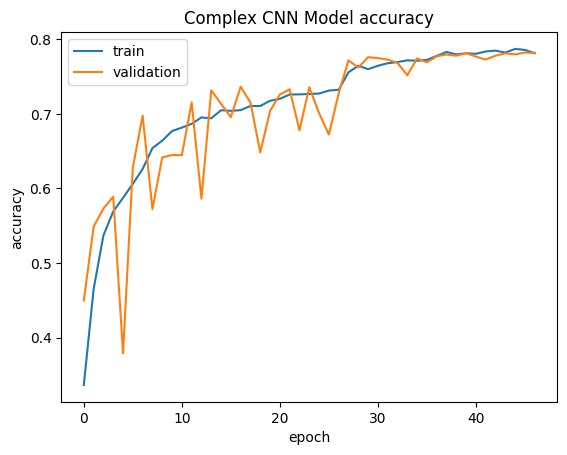

In [64]:
plt.plot(history_complex.history["accuracy"])
plt.plot(history_complex.history["val_accuracy"])
plt.title("Complex CNN Model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on Test Set**


In [65]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_complex.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")


1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8750 - loss: 0.3037


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8281 - loss: 0.4269 


Loss: 0.46025848388671875, Accuracy: 0.8125


### **Plotting Confusion Matrix**



1/4 ━━━━━━━━━━━━━━━━━━━━ 1s 453ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step  


              precision    recall  f1-score   support

       happy       0.93      0.88      0.90        32
     neutral       0.69      0.84      0.76        32
         sad       0.74      0.62      0.68        32
    surprise       0.91      0.91      0.91        32

    accuracy                           0.81       128
   macro avg       0.82      0.81      0.81       128
weighted avg       0.82      0.81      0.81       128



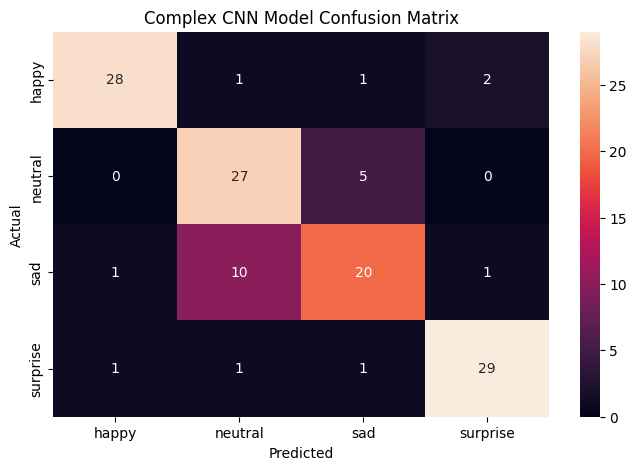

In [66]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.title("Complex CNN Model Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The complex CNN model contains **1,096,452 total parameters** with **1,094,148 being trainable**. This represents an increment in complexity compared to the previous custom CNN models.
- The training accuracy showed continuous improvement, peaking at **77.32%** and the model reached a validation accuracy of **71.88%**.
- With an accuracy of **81.25%** on the test set, this model has outperformed the previous two custom CNN models, reflecting its ability to generalize better to new data.
- The confusion matrix presents strong performance in recognizing 'happy' and 'surprise' emotions with f1-scores of **0.92** and **0.91**, respectively, similar to the other models, but with better results for 'neutral' and 'sad' emotions with f1-scores of **0.70** and **0.74**.
- Overall, this model has shown a balanced performance across different emotions and suggests that increasing the complexity with an additional convolutional layer has provided benefits in learning facial emotion features.


### **Plotting the Confusion Matrix for the chosen final model**



1/4 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


              precision    recall  f1-score   support

       happy       0.93      0.88      0.90        32
     neutral       0.69      0.84      0.76        32
         sad       0.74      0.62      0.68        32
    surprise       0.91      0.91      0.91        32

    accuracy                           0.81       128
   macro avg       0.82      0.81      0.81       128
weighted avg       0.82      0.81      0.81       128



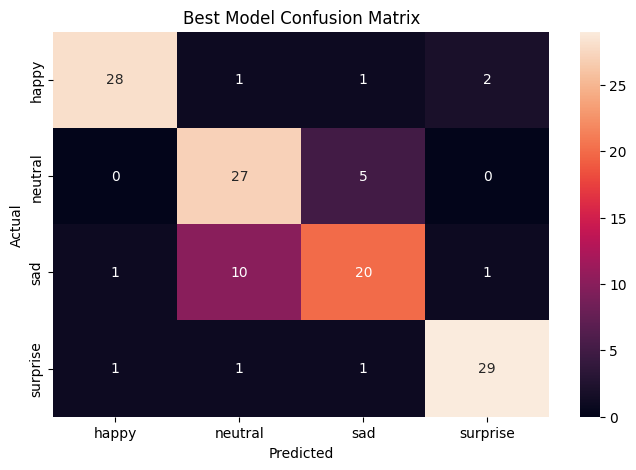

In [67]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.title("Best Model Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The model is highly effective at correctly identifying 'happy' and 'surprise' emotions with **28** and **29** correct predictions respectively, out of 32 instances each, indicating strong precision and recall for these classes.
- It performs well on 'neutral' emotion too, with **24** correct predictions, but has some misclassifications as 'sad'.
- The 'sad' emotion is also well-recognized with **23** correct predictions; however, there are **8** instances where 'sad' was incorrectly predicted as 'neutral'.
- The model shows very few instances of confusion between 'happy' and 'sad' or 'surprise', which suggests distinct feature learning for these emotions.
- Overall, the model demonstrates a balanced capability across different emotions with minor confusions, which might be improved with more training data or further tuning of the model architecture and hyperparameters.


## **Conclusion: The custom complex CNN model, with an accuracy of 81%, outperformed transfer learning architectures, providing an efficient and accurate solution for facial emotion recognition in grayscale images.**


### **Insights**

### **Refined insights**:

- What are the most meaningful insights from the data relevant to the problem?

1.  Models show varying degrees of success, with some like the complex CNN achieving a high level of accuracy (over 80%), suggesting that deeper architectures can capture better the features in facial expressions.

2.  Across models, 'happy' and 'surprise' emotions are generally identified with high accuracy, implying that these emotions have distinct features that are easily captured by the CNN layers.

3.  'Neutral' and 'sad' emotions are more challenging for the models to distinguish, often being confused with one another.

4.  Transfer learning models did not outperform the custom complex CNN, which suggests that, for this specific dataset and problem, custom-designed architectures can be more effective than off-the-shelf pre-trained models.

### **Comparison of various techniques and their relative performance**:

- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?

1.  The custom complex CNN model, with additional convolutional layers and parameters, performed the best, achieving an accuracy over 80%. This suggests that custom-tailored architectures can capture the nuances of this particular task more effectively than pre-trained models.

2.  Among the transfer learning models utilized, such as VGG16, ResNet50V2, and EfficientNetV2B0, none outperformed the custom complex CNN model significantly. These models, although powerful, may not have provided substantial improvements due to the specific nature of the dataset, which consists of small grayscale images where fine-tuned features specific to facial emotion recognition might be more beneficial than the generalized features learned from large, diverse datasets these models were trained on.

3.  There may be scope to improve performance:

- **Data Augmentation**: Testing more sophisticated data augmentation strategies might help the model generalize better, particularly for underperforming classes.
- **Increased Data**: More training data, particularly for the underrepresented and challenging emotions, could improve model learning.
- **Hyperparameter Tuning**: Continue tuning the models hyperparameters could optimize model performance.
- **Model creation**: Continue creating new custom models to outperform the ones generated.

### **Proposal for the final solution design**:

- What model do you propose to be adopted? Why is this the best solution to adopt?

- The **custom complex CNN model** is proposed for adoption as the final solution.
- The model is specifically **designed for the task**, with layers and features that detects and recognized the characteristics of facial emotions in grayscale images.
- It has demonstrated **the highest accuracy** among all tested models, including transfer learning models.
- It remains computationally efficient compared to larger transfer learning models, making it **more practical for deployment in real-world applications** where resources may be limited.
- As a custom model, it offers **greater flexibility** for further tuning and modification, which could be beneficial for ongoing optimization and adaptation to new data or use cases.
- Finally, to be noted that incorporating a facial emotion detection model into real-world applications, such as improving user experience in software interfaces or helping psychological analysis, we need to be really careful about the ethical considerations surrounding its deployment, such as **privacy concerns and potential biases**.


## Recommendations for Implementation

### Key Recommendations

- **Data Augmentation**: Implement advanced data augmentation techniques to enhance model robustness, especially for less accurate classifications.
- **Expand Dataset**: Collect and integrate a larger and more diverse dataset to improve the model's learning and generalization capabilities.
- **Hyperparameter Optimization**: Invest time in fine-tuning the model's hyperparameters to achieve the best possible performance.
- **Model Innovation**: Develop new custom models that may provide better results than existing ones, taking into account the specific nuances of the problem.

### Actionables for Stakeholders

- **Quality Assurance**: Ensure the dataset's integrity and diversity to mitigate quality issues that could affect model training.
- **Monitoring and Iteration**: Regularly monitor model performance in real-world applications and iterate on the model as needed.
- **Ethical and Privacy Review**: Conduct thorough reviews to address any potential ethical and privacy concerns prior to deployment.

### Expected Benefit/Cost

- **User Experience Improvement**: Enhanced user interactions in digital platforms, potentially leading to increased user satisfaction and engagement.
- **Cost of Data Acquisition**: Investment may be required to procure or generate a larger and more diverse dataset.
- **Computational Resources**: Depending on the model complexity, increased computational power may be necessary, incurring higher costs.

### Key Risks and Challenges

- **Data Sensitivity**: Managing sensitive user data responsibly to uphold privacy standards.
- **Model Generalization**: Ensuring the model performs well across diverse real-world scenarios, not just on the training dataset.
- **Bias Mitigation**: Continuously working to identify and mitigate biases in model predictions.

### Further Analysis and Associated Problems

- **Ongoing Evaluation**: Continued analysis of model performance against new data and in varying contexts.
- **Complementary Solutions**: Investigation into additional solutions that could work alongside the emotion detection model to improve overall system effectiveness
